<a href="https://colab.research.google.com/github/ChaimaBouhlel/image_classification_pavia/blob/main/image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# from google.colab import files

# # Upload a single file
# uploaded = files.upload()

In [ ]:
from scipy.io import loadmat

# Load MATLAB file
Xfile = loadmat('/content/drive/MyDrive/PaviaU.mat')
yfile = loadmat("/content/drive/MyDrive/PaviaU_gt.mat")

After loading the MATLAB file containing your hyperspectral images using loadmat from `scipy.io`, we can verify that the images are extracted correctly by inspecting the contents of `mat_data` and checking a few key points:

---


Après avoir chargé le fichier MATLAB contenant vos images hyperspectrales en utilisant loadmat de `scipy.io`, nous pouvons vérifier que les images sont extraites correctement en inspectant le contenu de `mat_data` et en vérifiant quelques points clés :


In [ ]:
print(Xfile.keys(), yfile.keys())

dict_keys(['__header__', '__version__', '__globals__', 'paviaU']) dict_keys(['__header__', '__version__', '__globals__', 'paviaU_gt'])


- MATLAB files loaded with loadmat typically have keys corresponding to the variables stored in the file. We checked the data available.

In [ ]:
image_array = Xfile['paviaU']
X = image_array
y = yfile["paviaU_gt"]
print(y.shape)
print(image_array.shape)

(610, 340)
(610, 340, 103)


This provided information about the dimensions of the loaded array:
* **Height (610):** The number of rows in the image, indicating the spatial resolution in the vertical direction.
* **Width (340):** The number of columns in the image, indicating the spatial resolution in the horizontal direction.
* **Bands (103):** Each pixel in the image contains spectral information across 102 different bands or wavelengths. This allows for detailed analysis of the spectral characteristics of the scene captured by the hyperspectral sensor.

▶ With this information, we can work with `image_array` for tasks such as visualization, preprocessing, classification, or segmentation of hyperspectral images.

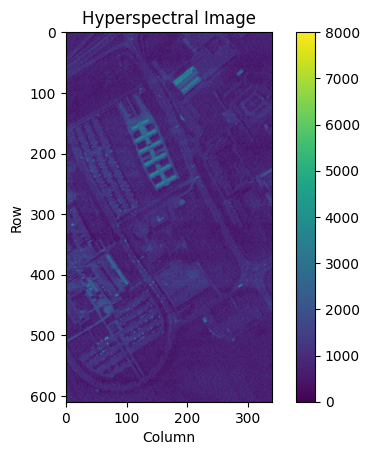

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'image_array' contains your hyperspectral image data
plt.imshow(image_array[:, :, 0])  # Display the first spectral band (index 0)
plt.colorbar()  # Add a color bar to show the intensity scale
plt.title('Hyperspectral Image')  # Set the title of the plot
plt.xlabel('Column')  # Label for the x-axis
plt.ylabel('Row')  # Label for the y-axis
plt.show()  # Show the plot

When we run this code, we'll see a visualization of the first spectral band of the hyperspectral image. The plot will display the image's intensity variations across rows and columns, with a color bar indicating the intensity scale. This visualization helps us get an initial understanding of the image's spectral characteristics, which is crucial for further analysis like classification or segmentation tasks.

In [ ]:
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.5/21.5 MB 39.6 MB/s eta 0:00:00


In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import earthpy.plot as ep
import earthpy.spatial as es

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

pavia_df = pd.DataFrame(X.reshape(X.shape[0]*X.shape[1], -1))

In [ ]:
pavia_df.columns = [f"band{i}" for i in range(1, pavia_df.shape[-1]+1)]

pavia_df["class"] = y.ravel()


Data Conversion to DataFrame: It converts the loaded data (`X`) into a Pandas DataFrame (`pavia_df`) for easier manipulation and analysis. Each band of the hyperspectral image becomes a column in the DataFrame, and the ground truth labels are added as a separate column.


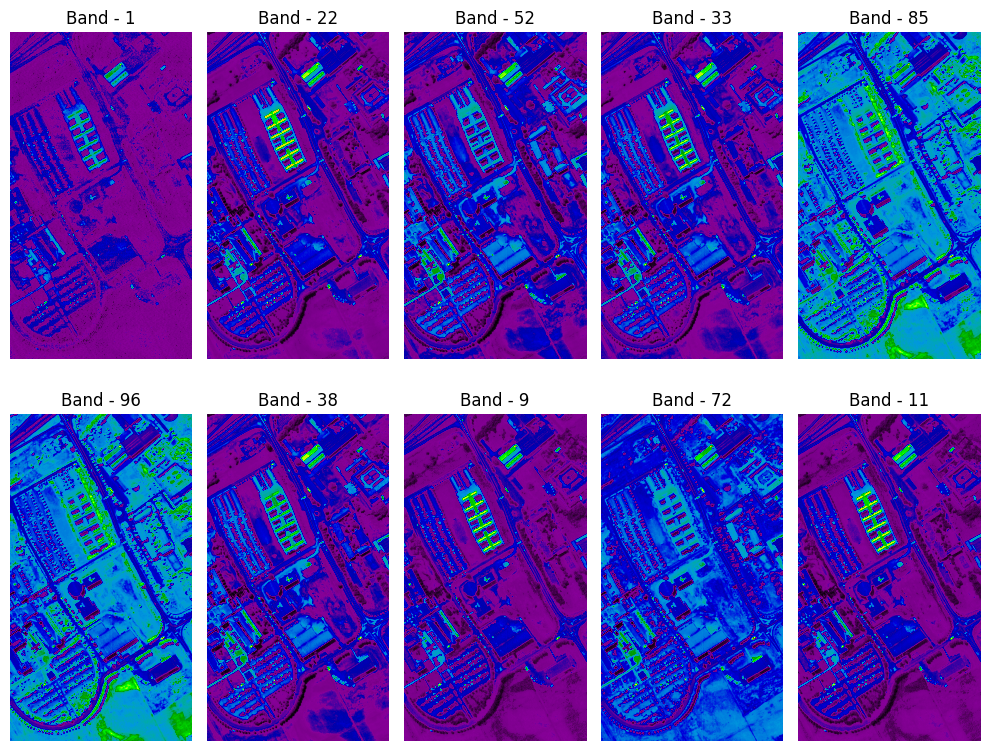

In [ ]:
#visualizing the bands
fig = plt.figure(figsize = (10, 8))

ax = fig.subplots(2, 5)

for i in range(2):

    for j in range(5):
        c = np.random.randint(103)
        ax[i][j].imshow(X[:, :, c], cmap = "nipy_spectral")
        ax[i][j].axis('off')
        ax[i][j].title.set_text(f"Band - {c}")

plt.tight_layout()
plt.show()

Visualizing an RGB (Red-Green-Blue) composite image from the hyperspectral image data X using the 'earthpy' library:

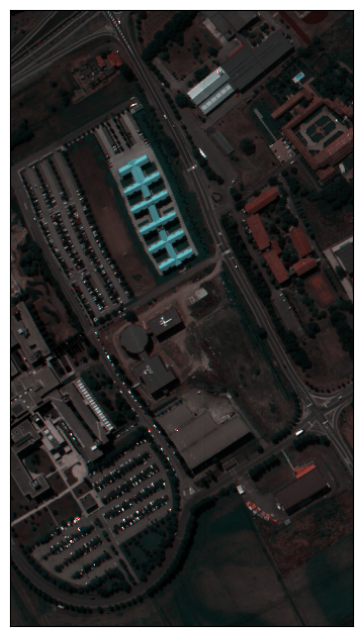

In [ ]:
mdata = np.moveaxis(X, -1, 0)

ep.plot_rgb(mdata, (60, 30, 27), figsize = (10,8))

plt.show()


This visualization helps to visually interpret the information captured in the hyperspectral data in a color-combined format.

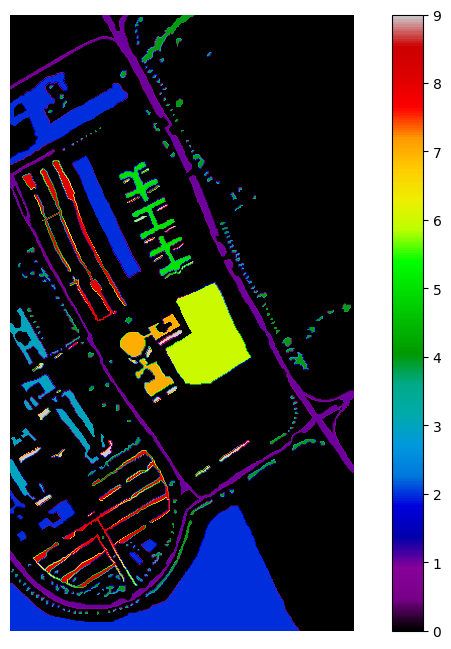

In [ ]:
#visualizing of groundtruth

def plot_data(data):
    fig = plt.figure(figsize = (10,8))
    plt.imshow(y, cmap = "nipy_spectral")
    plt.colorbar()
    plt.axis("off")
    plt.show()

plot_data(y)


# Implementation of Deep Neural Networks

In [ ]:
X = pavia_df[pavia_df["class"]!=0].iloc[:, :-1].values

y = tf.keras.utils.to_categorical(pavia_df[pavia_df["class"]!=0].iloc[:, -1].values , num_classes = np.unique(y).shape[0], dtype = "float32")

names = ["Asphalt", "Meadows", "Gravel", "Trees", "Painted metal sheets", "Bare Soil", "Bitumen", "Self-Blocking Bricks", "Shadows"]


In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, stratify = y)


In [ ]:
print(f"Train Data: {X_train.shape}\nTest Data: {X_test.shape}")


Train Data: (29943, 103)
Test Data: (12833, 103)


Let’s use Keras to build a Deep neural network (DNN) for land cover classification of the Pavia university HSI. The mentioned deep neural network has a Rectified Linear Unit (ReLU) as the activation function.


# Explication du modèle construit
Ce modèle est un réseau de neurones profond (DNN) construit avec Keras, une bibliothèque de Deep Learning pour Python. Voici comment il est construit couche par couche :

1. **Couche d'Entrée (Input Layer)**:
   - `Input(shape=X_train[0].shape, name="Input_Layer")`: Cette couche définit la forme de l'entrée du réseau, qui est basée sur la forme des données dans `X_train[0]`. Chaque élément de `X_train[0]` correspond aux caractéristiques d'une observation dans l'ensemble de données.

2. **Normalisation par Lots (Batch Normalization)**:
   - `BatchNormalization(name="BatchNormalization")`: Cette couche normalise les activations des neurones en ajustant et en mettant à l'échelle la sortie de chaque couche pour accélérer l'apprentissage.

3. **Couches Denses avec Activation ReLU**:
   - `Dense(units=128, activation="relu", name="Layer1")` à `Dense(units=128, activation="relu", name="Layer4")`: Ces couches denses ont chacune 128 neurones avec une fonction d'activation ReLU (Rectified Linear Unit), qui introduit une non-linéarité dans le réseau.
   - Les couches `Layer1` à `Layer4` constituent la première partie du réseau, où des transformations non linéaires sont appliquées aux données d'entrée.

4. **Couches de Dropout**:
   - `Dropout(rate=0.2, name="Dropout1")` et `Dropout(rate=0.2, name="Dropout2")`: Ces couches de dropout introduisent une régularisation pour réduire le surapprentissage en désactivant aléatoirement un pourcentage (20% dans ce cas) des neurones pendant l'entraînement.

5. **Couches Denses Réduites avec Activation ReLU**:
   - `Dense(units=64, activation="relu", name="Layer5")` à `Dense(units=64, activation="relu", name="Layer8")`: Ces couches réduisent le nombre de neurones à 64 tout en maintenant l'activation ReLU, ce qui permet d'apprendre des caractéristiques plus abstraites et de réduire la complexité du modèle.

6. **Couches Denses avec Activation ReLU Réduite**:
   - `Dense(units=32, activation="relu", name="Layer9")` à `Dense(units=32, activation="relu", name="Layer12")`: Ces couches réduisent davantage le nombre de neurones à 32, aidant le modèle à capturer des motifs plus fins dans les données.

7. **Couche de Sortie (Output Layer)**:
   - `Dense(units=y_train.shape[1], activation="softmax", name="Output_Layer")`: Cette couche de sortie a un nombre d'unités égal au nombre de classes dans les données de sortie (`y_train.shape[1]`) avec une activation softmax pour la classification multi-classes, où chaque neurone représente la probabilité d'appartenance à une classe spécifique.


In [ ]:
model = Sequential(name = "Pavia_University_DNN")

model.add(Input(shape = X_train[0].shape, name = "Input_Layer"))

model.add(BatchNormalization(name = "BatchNormalization"))

model.add(Dense(units = 128, activation = "relu", name = "Layer1"))
model.add(Dense(units = 128, activation = "relu", name = "Layer2"))
model.add(Dense(units = 128, activation = "relu", name = "Layer3"))
model.add(Dense(units = 128, activation = "relu", name = "Layer4"))

model.add(Dropout(rate = 0.2, name = "Dropout1"))

model.add(Dense(units = 64, activation = "relu", name = "Layer5"))
model.add(Dense(units = 64, activation = "relu", name = "Layer6"))
model.add(Dense(units = 64, activation = "relu", name = "Layer7"))
model.add(Dense(units = 64, activation = "relu", name = "Layer8"))

model.add(Dropout(rate = 0.2, name = "Dropout2"))

model.add(Dense(units = 32, activation = "relu", name = "Layer9"))
model.add(Dense(units = 32, activation = "relu", name = "Layer10"))
model.add(Dense(units = 32, activation = "relu", name = "Layer11"))
model.add(Dense(units = 32, activation = "relu", name = "Layer12"))

model.add(Dense(units = y_train.shape[1], activation = "softmax", name = "Output_Layer"))

In [ ]:
model.summary()


Model: "Pavia_University_DNN"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 BatchNormalization (BatchN  (None, 103)               412       
 ormalization)                                                   
                                                                 
 Layer1 (Dense)              (None, 128)               13312     
                                                                 
 Layer2 (Dense)              (None, 128)               16512     
                                                                 
 Layer3 (Dense)              (None, 128)               16512     
                                                                 
 Layer4 (Dense)              (None, 128)               16512     
                                                                 
 Dropout1 (Dropout)          (None, 128)               0         
                                              

In [ ]:
model.compile(loss = "categorical_crossentropy", optimizer = "adam", metrics=["accuracy"])


In [ ]:
history = model.fit(X_train, y_train, batch_size = 128, epochs = 50, validation_data = (X_test, y_test))

Epoch 1/50
234/234 [==============================] - 5s 9ms/step - loss: 0.9176 - accuracy: 0.6685 - val_loss: 0.5832 - val_accuracy: 0.7732
Epoch 2/50
234/234 [==============================] - 2s 8ms/step - loss: 0.5435 - accuracy: 0.7829 - val_loss: 0.4558 - val_accuracy: 0.8261
Epoch 3/50
234/234 [==============================] - 3s 13ms/step - loss: 0.4673 - accuracy: 0.8153 - val_loss: 0.3837 - val_accuracy: 0.8377
Epoch 4/50
234/234 [==============================] - 5s 21ms/step - loss: 0.3988 - accuracy: 0.8397 - val_loss: 0.3744 - val_accuracy: 0.8460
Epoch 5/50
234/234 [==============================] - 4s 17ms/step - loss: 0.3776 - accuracy: 0.8470 - val_loss: 0.2953 - val_accuracy: 0.8693
Epoch 6/50
234/234 [==============================] - 4s 18ms/step - loss: 0.3448 - accuracy: 0.8567 - val_loss: 0.3173 - val_accuracy: 0.8579
Epoch 7/50
234/234 [==============================] - 5s 22ms/step - loss: 0.3190 - accuracy: 0.8700 - val_loss: 0.2461 - val_accuracy: 0.9122
E

In [ ]:
y_pred = model.predict(X_test)


402/402 [==============================] - 1s 2ms/step


In [ ]:
score = model.evaluate(X_test, y_test, verbose = 0)
print("Test loss:", score[0])
print("Test accuracy:", score[1])


Test loss: 0.1393754780292511
Test accuracy: 0.9537910223007202


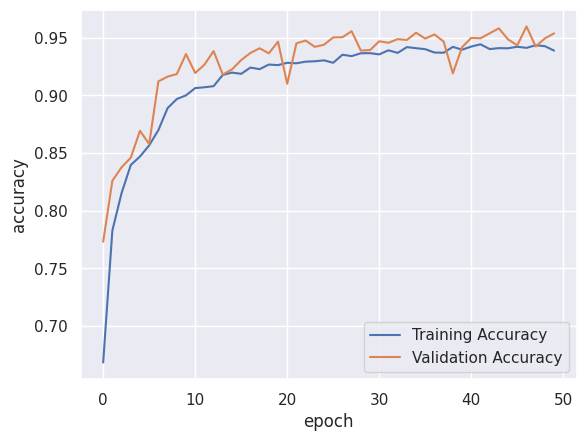

In [ ]:
sns.set()
plt.plot(history.history["accuracy"])
plt.plot(history.history["val_accuracy"])
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.legend(["Training Accuracy", "Validation Accuracy"])
plt.show()

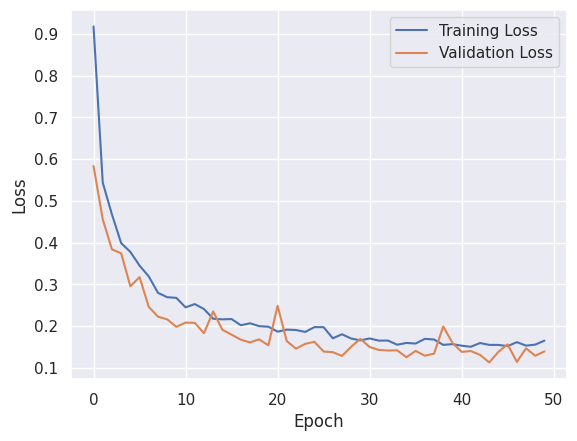

In [ ]:
plt.plot(history.history["loss"], label="Training Loss")
plt.plot(history.history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()


# Results

In [ ]:
# predictions
pred = np.argmax(model.predict(X_test), axis=1)

#Classification Report
print(classification_report(pred, np.argmax(y_test, 1),
      target_names = ["Asphalt", "Meadows", "Gravel", "Trees", "Painted metal sheets", "Bare Soil", "Bitumen", "Self-Blocking Bricks", "Shadows"]))


402/402 [==============================] - 1s 3ms/step
                      precision    recall  f1-score   support

             Asphalt       0.97      0.93      0.95      2076
             Meadows       0.98      0.98      0.98      5575
              Gravel       0.85      0.87      0.86       614
               Trees       0.98      0.93      0.96       968
Painted metal sheets       1.00      1.00      1.00       404
           Bare Soil       0.94      0.95      0.95      1492
             Bitumen       0.73      0.97      0.84       300
Self-Blocking Bricks       0.90      0.89      0.89      1119
             Shadows       1.00      1.00      1.00       285

            accuracy                           0.95     12833
           macro avg       0.93      0.95      0.94     12833
        weighted avg       0.96      0.95      0.95     12833



# Confusion matrix
Let’s see the confusion matrix — A tabular representation often used to describe the performance of a classification model (or “classifier”) on a set of test data for which the true values are known.


<Axes: xlabel='Predicted_Classes', ylabel='Actual_Classes'>

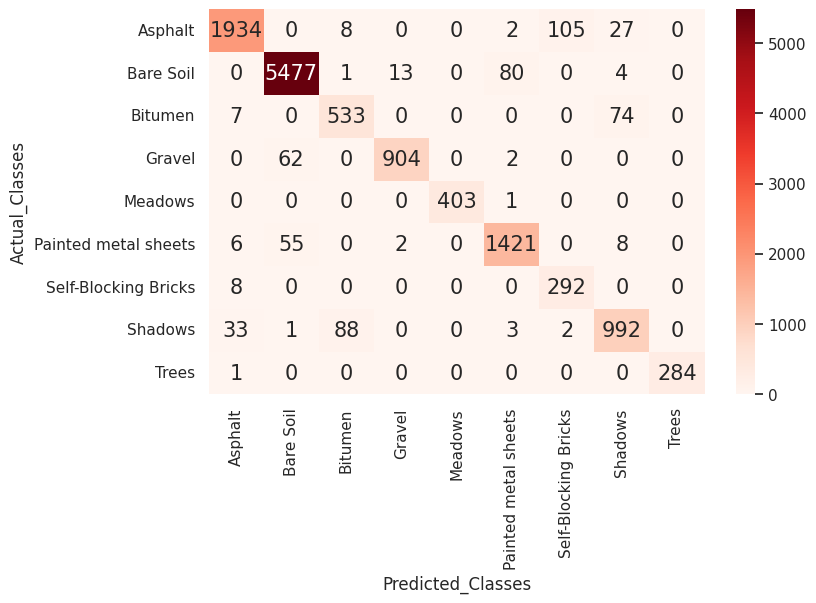

In [ ]:
#confusion matrix

matrix = confusion_matrix(pred, np.argmax(y_test, 1))

cmatrix = pd.DataFrame(matrix, columns = np.unique(names), index = np.unique(names))

plt.figure(figsize = (8,5))
cmatrix.index.name = "Actual_Classes"
cmatrix.columns.name = "Predicted_Classes"
sns.heatmap(cmatrix, cmap = "Reds", annot = True, annot_kws = {"size": 15}, fmt = "d")


In [ ]:
import math
MSE = np.square(np.subtract(y_test,y_pred)).mean()
RMSE = math.sqrt(MSE)
print("Root Mean Square Error:\n", RMSE)


Root Mean Square Error:
 0.08518653000991645


In [ ]:
from sklearn.metrics import mean_absolute_error
print("Mean Absolute Error (MAE)", mean_absolute_error(y_test,y_pred))


Mean Absolute Error (MAE) 0.016538624


# Classification map

In [35]:
from tqdm import tqdm

l = []

for i in tqdm(range(pavia_df.shape[0])):
  if pavia_df.iloc[i, -1] == 0:
    l.append(0)
  else:
    l.append(np.argmax(model.predict(pavia_df.iloc[i, :-1].values.reshape(-1, 103)), 1))


  0%|          | 0/207400 [00:00<?, ?it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 92/207400 [00:00<04:50, 714.64it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 164/207400 [00:01<37:09, 92.95it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 197/207400 [00:02<1:04:46, 53.31it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 432/207400 [00:03<19:30, 176.79it/s] 

1/1 [==============================] - 0s 22ms/step


  0%|          | 505/207400 [00:04<26:16, 131.24it/s]

1/1 [==============================] - 0s 19ms/step


  0%|          | 555/207400 [00:04<33:48, 101.99it/s]

1/1 [==============================] - 0s 20ms/step


  0%|          | 774/207400 [00:05<16:44, 205.64it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 841/207400 [00:06<24:26, 140.83it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 889/207400 [00:07<29:28, 116.76it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1114/207400 [00:07<15:18, 224.68it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1181/207400 [00:08<24:09, 142.27it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1229/207400 [00:09<30:46, 111.65it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1455/207400 [00:09<16:16, 210.90it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1520/207400 [00:10<24:57, 137.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1567/207400 [00:11<31:29, 108.93it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1795/207400 [00:11<16:30, 207.50it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 1862/207400 [00:13<25:51, 132.49it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 1911/207400 [00:14<34:58, 97.90it/s] 

1/1 [==============================] - 0s 34ms/step


  1%|          | 2135/207400 [00:14<18:19, 186.64it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 2210/207400 [00:17<37:39, 90.81it/s] 

1/1 [==============================] - 0s 21ms/step


  1%|          | 2263/207400 [00:17<34:44, 98.39it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 2477/207400 [00:17<19:04, 179.01it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 2547/207400 [00:18<27:59, 121.97it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2597/207400 [00:19<27:40, 123.36it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2818/207400 [00:19<15:01, 226.82it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2887/207400 [00:20<24:05, 141.52it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 2937/207400 [00:21<22:03, 154.50it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3159/207400 [00:21<12:14, 278.21it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3231/207400 [00:22<23:48, 142.97it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3499/207400 [00:22<12:55, 263.06it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 3584/207400 [00:24<22:15, 152.61it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 3840/207400 [00:24<13:26, 252.25it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3925/207400 [00:26<20:55, 162.04it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4180/207400 [00:26<12:56, 261.87it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 4269/207400 [00:27<21:39, 156.31it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 4519/207400 [00:28<13:32, 249.73it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 4613/207400 [00:30<24:43, 136.71it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 4860/207400 [00:30<15:25, 218.87it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 4963/207400 [00:31<22:54, 147.30it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5201/207400 [00:32<14:48, 227.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5298/207400 [00:33<21:58, 153.34it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5542/207400 [00:33<14:02, 239.55it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5637/207400 [00:35<22:34, 148.95it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5883/207400 [00:35<14:27, 232.41it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5973/207400 [00:37<21:30, 156.14it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 6223/207400 [00:37<13:36, 246.25it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 6314/207400 [00:38<20:33, 163.07it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 6564/207400 [00:38<13:03, 256.23it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 6656/207400 [00:40<18:46, 178.27it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 6904/207400 [00:40<12:00, 278.24it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 6999/207400 [00:41<20:04, 166.31it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 7231/207400 [00:42<12:57, 257.37it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 7336/207400 [00:44<27:50, 119.77it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 7569/207400 [00:44<17:53, 186.15it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 7666/207400 [00:47<32:12, 103.34it/s]

1/1 [==============================] - 0s 70ms/step


  4%|▍         | 7907/207400 [00:47<20:34, 161.59it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 7987/207400 [00:52<44:29, 74.71it/s] 

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 8044/207400 [00:52<39:35, 83.92it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 8244/207400 [00:52<24:26, 135.84it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 8315/207400 [00:54<40:42, 81.51it/s] 

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 8365/207400 [00:55<41:08, 80.63it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 8580/207400 [00:55<22:23, 147.95it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 8661/207400 [00:58<44:24, 74.58it/s] 

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 8718/207400 [00:59<40:50, 81.09it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 8919/207400 [00:59<23:20, 141.69it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 8984/207400 [01:01<33:17, 99.36it/s] 

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 9031/207400 [01:01<37:31, 88.11it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 9257/207400 [01:02<19:29, 169.45it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 9322/207400 [01:03<28:41, 115.08it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 9369/207400 [01:04<33:42, 97.92it/s] 

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 9594/207400 [01:04<17:22, 189.83it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 9675/207400 [01:06<31:20, 105.17it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 9932/207400 [01:06<17:11, 191.53it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 10017/207400 [01:08<27:06, 121.33it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 10078/207400 [01:08<23:53, 137.62it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 10270/207400 [01:08<14:43, 223.19it/s]

1/1 [==============================] - 0s 30ms/step


  5%|▍         | 10358/207400 [01:11<31:06, 105.56it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 10421/207400 [01:11<26:45, 122.70it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 10608/207400 [01:11<16:06, 203.53it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 10693/207400 [01:13<29:15, 112.02it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 10947/207400 [01:13<16:08, 202.88it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 11035/207400 [01:15<26:15, 124.64it/s]

1/1 [==============================] - 0s 19ms/step


  5%|▌         | 11286/207400 [01:15<15:35, 209.59it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 11377/207400 [01:17<25:29, 128.13it/s]

1/1 [==============================] - 0s 19ms/step


  6%|▌         | 11624/207400 [01:17<15:43, 207.55it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 11714/207400 [01:20<28:40, 113.77it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 11962/207400 [01:20<17:44, 183.66it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 12050/207400 [01:22<26:42, 121.92it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 12299/207400 [01:22<16:16, 199.74it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 12411/207400 [01:24<27:42, 117.32it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 12637/207400 [01:24<17:56, 180.95it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 12747/207400 [01:26<26:37, 121.86it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 12826/207400 [01:27<23:12, 139.73it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 12977/207400 [01:27<16:52, 191.96it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13052/207400 [01:28<21:03, 153.78it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 13107/207400 [01:28<22:45, 142.26it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 13149/207400 [01:28<21:12, 152.68it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13315/207400 [01:29<12:58, 249.16it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 13370/207400 [01:29<13:25, 240.78it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13415/207400 [01:31<32:29, 99.50it/s] 

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13457/207400 [01:31<28:57, 111.60it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13652/207400 [01:31<14:29, 222.95it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13707/207400 [01:31<16:15, 198.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13750/207400 [01:33<31:10, 103.54it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 13797/207400 [01:33<27:04, 119.16it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 13991/207400 [01:33<13:47, 233.80it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 14044/207400 [01:33<14:46, 218.21it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14086/207400 [01:35<31:12, 103.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14330/207400 [01:35<14:19, 224.68it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 14396/207400 [01:35<14:04, 228.43it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 14450/207400 [01:37<32:52, 97.81it/s] 

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 14667/207400 [01:37<17:14, 186.30it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 14746/207400 [01:39<26:31, 121.06it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14803/207400 [01:40<32:29, 98.77it/s] 

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 15006/207400 [01:40<18:29, 173.43it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 15069/207400 [01:41<18:23, 174.24it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 15118/207400 [01:42<31:57, 100.26it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 15345/207400 [01:42<16:38, 192.34it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 15411/207400 [01:43<16:35, 192.89it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 15463/207400 [01:44<27:09, 117.77it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 15683/207400 [01:44<14:45, 216.39it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 15749/207400 [01:44<15:04, 211.88it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 15801/207400 [01:46<24:09, 132.17it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 16022/207400 [01:46<13:16, 240.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 16087/207400 [01:46<13:07, 243.05it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16140/207400 [01:47<18:14, 174.82it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 16359/207400 [01:47<09:54, 321.24it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16448/207400 [01:48<15:32, 204.68it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 16698/207400 [01:48<09:13, 344.80it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16787/207400 [01:49<13:10, 241.27it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 17036/207400 [01:49<08:19, 380.92it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 17127/207400 [01:50<13:43, 231.17it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 17193/207400 [01:50<12:22, 256.27it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 17374/207400 [01:50<08:29, 373.23it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 17459/207400 [01:51<10:11, 310.64it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 17525/207400 [01:52<18:42, 169.13it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 17712/207400 [01:52<11:34, 273.02it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 17790/207400 [01:53<12:57, 243.86it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 17850/207400 [01:54<20:22, 154.99it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 18051/207400 [01:54<12:12, 258.60it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 18115/207400 [01:54<12:20, 255.62it/s]

1/1 [==============================] - 0s 19ms/step


  9%|▉         | 18167/207400 [01:55<16:43, 188.59it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18389/207400 [01:55<09:32, 330.02it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18453/207400 [01:55<10:39, 295.46it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18504/207400 [01:56<18:41, 168.37it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18728/207400 [01:56<10:28, 300.41it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 18792/207400 [01:57<10:40, 294.44it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 18845/207400 [01:58<21:43, 144.70it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 19065/207400 [01:58<11:33, 271.63it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 19158/207400 [01:59<14:40, 213.77it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 19227/207400 [02:00<21:18, 147.24it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 19405/207400 [02:00<13:38, 229.65it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 19470/207400 [02:00<16:09, 193.86it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 19519/207400 [02:02<24:39, 127.03it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 19743/207400 [02:02<13:10, 237.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 19807/207400 [02:03<18:24, 169.83it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 19854/207400 [02:04<28:57, 107.93it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 20080/207400 [02:04<14:53, 209.62it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 20162/207400 [02:06<24:04, 129.64it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 20221/207400 [02:07<37:16, 83.70it/s] 

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 20419/207400 [02:08<21:18, 146.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 20484/207400 [02:09<28:42, 108.50it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 20531/207400 [02:10<32:52, 94.73it/s] 

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 20566/207400 [02:10<33:28, 93.03it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 20758/207400 [02:10<17:21, 179.22it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 20810/207400 [02:12<31:09, 99.82it/s] 

1/1 [==============================] - 0s 23ms/step


 10%|█         | 20852/207400 [02:12<28:15, 110.04it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 20885/207400 [02:13<38:32, 80.67it/s] 

1/1 [==============================] - 0s 21ms/step


 10%|█         | 21096/207400 [02:13<17:30, 177.40it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 21148/207400 [02:15<32:50, 94.54it/s] 

1/1 [==============================] - 0s 25ms/step


 10%|█         | 21209/207400 [02:15<27:23, 113.27it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 21246/207400 [02:16<29:29, 105.21it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 21434/207400 [02:16<15:10, 204.33it/s]

1/1 [==============================] - 0s 30ms/step


 10%|█         | 21485/207400 [02:18<35:48, 86.54it/s] 

1/1 [==============================] - 0s 29ms/step


 10%|█         | 21549/207400 [02:18<28:49, 107.47it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 21589/207400 [02:19<35:11, 87.98it/s] 

1/1 [==============================] - 0s 31ms/step


 10%|█         | 21771/207400 [02:19<17:38, 175.42it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 21835/207400 [02:22<40:44, 75.91it/s] 

1/1 [==============================] - 0s 20ms/step


 11%|█         | 21890/207400 [02:22<34:19, 90.09it/s]

1/1 [==============================] - 0s 19ms/step


 11%|█         | 21932/207400 [02:23<36:50, 83.91it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22110/207400 [02:23<19:07, 161.44it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22161/207400 [02:25<37:56, 81.36it/s] 

1/1 [==============================] - 0s 20ms/step


 11%|█         | 22231/207400 [02:25<30:02, 102.74it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 22269/207400 [02:26<33:47, 91.32it/s] 

1/1 [==============================] - 0s 30ms/step


 11%|█         | 22448/207400 [02:26<16:51, 182.93it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22521/207400 [02:28<34:48, 88.53it/s] 

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22573/207400 [02:28<31:46, 96.95it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22614/207400 [02:29<32:51, 93.74it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22786/207400 [02:29<16:46, 183.34it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 22859/207400 [02:31<31:21, 98.06it/s] 

1/1 [==============================] - 0s 22ms/step


 11%|█         | 22912/207400 [02:31<28:14, 108.90it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 22955/207400 [02:32<30:52, 99.54it/s] 

1/1 [==============================] - 0s 29ms/step


 11%|█         | 23124/207400 [02:32<16:09, 190.13it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 23190/207400 [02:34<36:13, 84.76it/s] 

1/1 [==============================] - 0s 33ms/step


 11%|█         | 23237/207400 [02:35<38:34, 79.55it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 23272/207400 [02:36<44:55, 68.30it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█▏        | 23463/207400 [02:36<20:36, 148.79it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 23538/207400 [02:38<32:02, 95.62it/s] 

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 23592/207400 [02:38<35:03, 87.40it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 23632/207400 [02:39<37:46, 81.09it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█▏        | 23802/207400 [02:39<19:58, 153.20it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 23853/207400 [02:41<33:31, 91.23it/s] 

1/1 [==============================] - 0s 19ms/step


 12%|█▏        | 23890/207400 [02:41<31:23, 97.43it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 23921/207400 [02:42<37:44, 81.03it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 23944/207400 [02:42<45:22, 67.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24142/207400 [02:43<18:07, 168.50it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24188/207400 [02:44<29:21, 103.98it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24221/207400 [02:44<32:53, 92.81it/s] 

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24246/207400 [02:45<35:31, 85.93it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 24266/207400 [02:45<38:58, 78.31it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 24281/207400 [02:46<1:01:08, 49.91it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 24481/207400 [02:46<19:04, 159.88it/s] 

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 24534/207400 [02:48<38:59, 78.15it/s] 

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 24572/207400 [02:49<37:29, 81.27it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 24602/207400 [02:50<45:42, 66.66it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24624/207400 [02:50<54:04, 56.34it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 24640/207400 [02:51<51:18, 59.38it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24844/207400 [02:51<16:40, 182.50it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 24890/207400 [02:52<30:14, 100.60it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 24923/207400 [02:52<31:30, 96.53it/s] 

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 24949/207400 [02:53<38:10, 79.67it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24969/207400 [02:54<48:34, 62.59it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24984/207400 [02:54<48:54, 62.16it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 25183/207400 [02:54<15:43, 193.17it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 25226/207400 [02:56<35:58, 84.38it/s] 

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 25258/207400 [02:56<32:49, 92.50it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 25286/207400 [02:57<49:20, 61.51it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 25306/207400 [02:58<59:32, 50.97it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 25522/207400 [02:58<19:55, 152.12it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 25570/207400 [03:00<32:18, 93.78it/s] 

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 25605/207400 [03:01<42:08, 71.89it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 25631/207400 [03:02<52:47, 57.38it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 25650/207400 [03:03<1:06:36, 45.48it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 25857/207400 [03:03<23:26, 129.07it/s] 

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 25908/207400 [03:05<38:54, 77.74it/s] 

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 25945/207400 [03:06<46:25, 65.15it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 25972/207400 [03:07<53:52, 56.13it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 25992/207400 [03:07<1:00:26, 50.03it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 26196/207400 [03:08<21:26, 140.86it/s] 

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 26264/207400 [03:09<36:14, 83.29it/s] 

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 26313/207400 [03:11<54:33, 55.32it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26348/207400 [03:12<57:30, 52.48it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 26536/207400 [03:13<26:45, 112.68it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 26585/207400 [03:15<49:33, 60.81it/s] 

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 26620/207400 [03:16<58:52, 51.18it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26645/207400 [03:18<1:16:57, 39.15it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26663/207400 [03:19<1:21:12, 37.09it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 26864/207400 [03:19<28:46, 104.59it/s] 

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26934/207400 [03:21<48:45, 61.69it/s] 

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26984/207400 [03:24<1:07:44, 44.38it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27020/207400 [03:24<1:05:56, 45.59it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 27212/207400 [03:25<30:10, 99.54it/s]  

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 27263/207400 [03:27<52:45, 56.91it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 27299/207400 [03:29<1:05:29, 45.83it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 27325/207400 [03:31<1:35:45, 31.34it/s]

1/1 [==============================] - 0s 46ms/step


 13%|█▎        | 27344/207400 [03:33<1:49:17, 27.46it/s]

1/1 [==============================] - 0s 52ms/step


 13%|█▎        | 27550/207400 [03:33<39:09, 76.54it/s]  

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 27595/207400 [03:37<1:13:46, 40.62it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 27627/207400 [03:37<1:06:28, 45.07it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27653/207400 [03:39<1:34:10, 31.81it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27672/207400 [03:39<1:26:57, 34.45it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 27688/207400 [03:40<1:32:34, 32.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27890/207400 [03:40<28:32, 104.80it/s] 

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27931/207400 [03:43<1:00:59, 49.04it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 27964/207400 [03:43<53:37, 55.76it/s]  

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 27990/207400 [03:46<1:41:11, 29.55it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 28009/207400 [03:47<1:40:58, 29.61it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 28023/207400 [03:48<1:44:56, 28.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 28034/207400 [03:48<1:43:21, 28.92it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 28228/207400 [03:48<26:48, 111.39it/s] 

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 28267/207400 [03:51<1:03:46, 46.82it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 28301/207400 [03:51<53:57, 55.31it/s]  

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 28329/207400 [03:54<1:29:06, 33.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 28349/207400 [03:54<1:25:04, 35.08it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 28365/207400 [03:55<1:30:45, 32.88it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 28377/207400 [03:55<1:24:03, 35.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 28389/207400 [03:55<1:17:40, 38.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28566/207400 [03:55<19:40, 151.48it/s] 

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 28603/207400 [03:59<1:09:21, 42.96it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 28630/207400 [03:59<1:00:07, 49.55it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 28656/207400 [04:01<1:34:49, 31.41it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28674/207400 [04:03<1:56:52, 25.49it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28700/207400 [04:03<1:33:42, 31.78it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 28714/207400 [04:03<1:38:53, 30.11it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28728/207400 [04:04<1:27:42, 33.95it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 28738/207400 [04:04<1:26:28, 34.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 28905/207400 [04:04<20:52, 142.56it/s] 

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28937/207400 [04:07<1:01:25, 48.42it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28960/207400 [04:07<1:07:07, 44.30it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28979/207400 [04:08<1:00:41, 48.99it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28995/207400 [04:09<1:30:28, 32.86it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29006/207400 [04:10<1:51:11, 26.74it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29015/207400 [04:10<1:55:11, 25.81it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29040/207400 [04:10<1:22:13, 36.15it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 29049/207400 [04:11<1:35:24, 31.16it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29066/207400 [04:11<1:16:10, 39.02it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 29074/207400 [04:12<1:35:23, 31.16it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 29243/207400 [04:12<17:51, 166.28it/s] 

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29289/207400 [04:17<1:28:06, 33.69it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29322/207400 [04:17<1:25:49, 34.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29346/207400 [04:19<1:53:25, 26.16it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29363/207400 [04:20<1:40:55, 29.40it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29381/207400 [04:20<1:27:24, 33.95it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29395/207400 [04:20<1:30:43, 32.70it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 29406/207400 [04:20<1:24:10, 35.25it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29416/207400 [04:21<1:30:58, 32.61it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 29582/207400 [04:21<20:16, 146.19it/s] 

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29618/207400 [04:24<1:04:04, 46.24it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29644/207400 [04:25<1:06:16, 44.71it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29663/207400 [04:25<1:13:13, 40.46it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 29677/207400 [04:27<1:47:45, 27.49it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 29687/207400 [04:28<2:14:43, 21.99it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 29720/207400 [04:28<1:30:11, 32.83it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 29732/207400 [04:29<1:54:24, 25.88it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 29745/207400 [04:29<1:38:47, 29.97it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29754/207400 [04:30<1:59:04, 24.87it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 29922/207400 [04:30<24:39, 119.98it/s] 

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29956/207400 [04:33<1:02:21, 47.43it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29980/207400 [04:33<59:06, 50.03it/s]  

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 29999/207400 [04:33<1:02:39, 47.19it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 30014/207400 [04:35<1:30:43, 32.59it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 30025/207400 [04:36<1:52:19, 26.32it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 30062/207400 [04:36<1:13:53, 40.00it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 30074/207400 [04:36<1:22:39, 35.76it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30083/207400 [04:37<1:22:47, 35.69it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30091/207400 [04:37<1:39:39, 29.65it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30262/207400 [04:37<20:02, 147.33it/s] 

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 30296/207400 [04:40<57:22, 51.44it/s] 

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 30321/207400 [04:40<55:14, 53.43it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 30340/207400 [04:42<1:29:23, 33.01it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 30354/207400 [04:44<2:09:30, 22.78it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30364/207400 [04:45<2:26:38, 20.12it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30403/207400 [04:45<1:32:28, 31.90it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 30415/207400 [04:46<1:41:41, 29.01it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30424/207400 [04:46<1:35:44, 30.81it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30432/207400 [04:46<1:46:47, 27.62it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 30601/207400 [04:46<20:43, 142.18it/s] 

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30653/207400 [04:49<53:57, 54.59it/s] 

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 30690/207400 [04:51<1:17:20, 38.08it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30717/207400 [04:52<1:26:05, 34.21it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30743/207400 [04:52<1:12:44, 40.48it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30761/207400 [04:53<1:15:45, 38.86it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 30775/207400 [04:53<1:19:11, 37.17it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 30941/207400 [04:53<23:14, 126.50it/s] 

1/1 [==============================] - 0s 46ms/step


 15%|█▍        | 30994/207400 [04:57<1:03:29, 46.31it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 31032/207400 [04:59<1:31:56, 31.97it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 31059/207400 [05:00<1:32:43, 31.70it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 31083/207400 [05:00<1:20:00, 36.73it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 31101/207400 [05:01<1:23:43, 35.09it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31282/207400 [05:01<27:18, 107.46it/s] 

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31323/207400 [05:03<48:46, 60.16it/s] 

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 31352/207400 [05:04<52:26, 55.96it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31374/207400 [05:06<1:22:21, 35.62it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31390/207400 [05:06<1:21:54, 35.81it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 31424/207400 [05:07<1:03:09, 46.44it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▌        | 31438/207400 [05:07<1:12:28, 40.46it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31622/207400 [05:07<21:49, 134.25it/s] 

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 31659/207400 [05:09<47:21, 61.84it/s] 

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 31685/207400 [05:10<46:41, 62.72it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31706/207400 [05:12<1:31:35, 31.97it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 31721/207400 [05:14<1:47:55, 27.13it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 31764/207400 [05:14<1:14:46, 39.15it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31779/207400 [05:14<1:21:03, 36.11it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 31790/207400 [05:14<1:16:51, 38.08it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31962/207400 [05:15<21:31, 135.86it/s] 

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31998/207400 [05:16<43:02, 67.91it/s] 

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 32024/207400 [05:17<47:26, 61.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 32044/207400 [05:19<1:18:09, 37.39it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 32058/207400 [05:20<1:34:32, 30.91it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 32096/207400 [05:20<1:07:25, 43.33it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 32110/207400 [05:21<1:16:23, 38.24it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 32121/207400 [05:21<1:19:36, 36.70it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32302/207400 [05:21<20:25, 142.89it/s] 

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 32338/207400 [05:23<50:17, 58.01it/s] 

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 32364/207400 [05:24<1:02:24, 46.75it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32383/207400 [05:27<1:41:38, 28.70it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 32397/207400 [05:28<1:52:29, 25.93it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32436/207400 [05:28<1:19:01, 36.90it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32450/207400 [05:29<1:29:47, 32.47it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 32460/207400 [05:29<1:25:05, 34.27it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 32641/207400 [05:29<20:36, 141.32it/s] 

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 32701/207400 [05:32<51:37, 56.40it/s] 

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32744/207400 [05:34<1:19:52, 36.44it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32777/207400 [05:35<1:07:39, 43.02it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32804/207400 [05:35<1:12:42, 40.02it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32981/207400 [05:36<27:54, 104.17it/s] 

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 33046/207400 [05:40<1:08:24, 42.48it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 33092/207400 [05:42<1:24:42, 34.30it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 33125/207400 [05:42<1:14:22, 39.06it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 33152/207400 [05:43<1:15:12, 38.61it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 33322/207400 [05:43<31:58, 90.74it/s]  

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 33364/207400 [05:46<1:02:31, 46.39it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 33394/207400 [05:48<1:18:46, 36.82it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 33416/207400 [05:49<1:30:19, 32.10it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 33458/207400 [05:50<1:09:05, 41.96it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 33476/207400 [05:50<1:17:09, 37.56it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 33490/207400 [05:50<1:11:39, 40.45it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 33661/207400 [05:51<22:49, 126.82it/s] 

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 33706/207400 [05:55<1:11:14, 40.64it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 33738/207400 [05:57<1:33:56, 30.81it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 33761/207400 [05:58<1:34:57, 30.48it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 33808/207400 [05:58<1:09:09, 41.84it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 33828/207400 [05:58<1:14:52, 38.63it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 34002/207400 [05:59<27:14, 106.08it/s] 

1/1 [==============================] - 0s 21ms/step


 16%|█▋        | 34041/207400 [06:02<1:00:35, 47.68it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 34069/207400 [06:03<1:15:09, 38.44it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▋        | 34089/207400 [06:05<1:31:49, 31.46it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 34149/207400 [06:05<1:01:51, 46.68it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▋        | 34168/207400 [06:05<1:05:42, 43.94it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 34341/207400 [06:05<24:43, 116.63it/s] 

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 34385/207400 [06:10<1:10:45, 40.75it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34416/207400 [06:12<1:33:24, 30.86it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34439/207400 [06:12<1:32:38, 31.12it/s]

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 34490/207400 [06:13<1:06:29, 43.34it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34511/207400 [06:13<1:04:10, 44.90it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 34681/207400 [06:13<23:54, 120.44it/s] 

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 34743/207400 [06:17<1:05:38, 43.84it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 34787/207400 [06:19<1:15:43, 37.99it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 34834/207400 [06:19<59:49, 48.08it/s]  

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 34866/207400 [06:20<54:56, 52.34it/s]

1/1 [==============================] - 0s 28ms/step


 17%|█▋        | 35021/207400 [06:20<25:20, 113.35it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 35073/207400 [06:24<1:08:48, 41.74it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35110/207400 [06:26<1:29:26, 32.11it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35176/207400 [06:26<1:03:59, 44.86it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35206/207400 [06:27<57:28, 49.94it/s]  

1/1 [==============================] - 0s 24ms/step


 17%|█▋        | 35362/207400 [06:27<27:22, 104.73it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35405/207400 [06:29<52:29, 54.62it/s] 

1/1 [==============================] - 0s 25ms/step


 17%|█▋        | 35436/207400 [06:33<1:31:50, 31.20it/s]

1/1 [==============================] - 0s 27ms/step


 17%|█▋        | 35458/207400 [06:33<1:24:22, 33.97it/s]

1/1 [==============================] - 0s 26ms/step


 17%|█▋        | 35516/207400 [06:33<57:24, 49.91it/s]  

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 35546/207400 [06:34<57:31, 49.80it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 35701/207400 [06:34<24:42, 115.79it/s]

1/1 [==============================] - 0s 29ms/step


 17%|█▋        | 35750/207400 [06:38<1:13:24, 38.98it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 35785/207400 [06:41<1:35:30, 29.95it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 35857/207400 [06:41<1:04:11, 44.54it/s]

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 35894/207400 [06:41<57:16, 49.90it/s]  

1/1 [==============================] - 0s 23ms/step


 17%|█▋        | 36041/207400 [06:41<27:45, 102.89it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 36105/207400 [06:46<1:11:01, 40.20it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 36150/207400 [06:46<1:07:15, 42.44it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 36198/207400 [06:47<54:04, 52.77it/s]  

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 36321/207400 [06:47<30:11, 94.45it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 36382/207400 [06:47<24:48, 114.85it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 36434/207400 [06:52<1:18:56, 36.09it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 36471/207400 [06:53<1:28:31, 32.18it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 36523/207400 [06:53<1:05:43, 43.33it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 36556/207400 [06:54<1:00:32, 47.03it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 36722/207400 [06:54<25:53, 109.86it/s] 

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 36786/207400 [06:59<1:08:14, 41.67it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 36831/207400 [06:59<1:00:12, 47.22it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 36866/207400 [06:59<52:05, 54.57it/s]  

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 36896/207400 [06:59<47:29, 59.85it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 37064/207400 [07:00<20:39, 137.41it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 37121/207400 [07:04<1:03:54, 44.40it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 37162/207400 [07:05<1:05:13, 43.49it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 37203/207400 [07:05<53:24, 53.12it/s]  

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 37233/207400 [07:06<53:26, 53.07it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 37423/207400 [07:06<21:42, 130.53it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 37477/207400 [07:10<59:55, 47.26it/s] 

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37543/207400 [07:10<45:27, 62.27it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37590/207400 [07:10<41:46, 67.76it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 37765/207400 [07:11<21:17, 132.84it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 37819/207400 [07:14<53:28, 52.85it/s] 

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37883/207400 [07:14<42:36, 66.30it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 37920/207400 [07:15<42:04, 67.15it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 38105/207400 [07:15<20:48, 135.58it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 38153/207400 [07:20<1:03:08, 44.67it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 38187/207400 [07:20<57:17, 49.23it/s]  

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 38224/207400 [07:20<48:44, 57.85it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 38251/207400 [07:21<52:45, 53.43it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 38445/207400 [07:21<20:47, 135.43it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 38517/207400 [07:24<47:44, 58.96it/s] 

1/1 [==============================] - 0s 21ms/step


 19%|█▊        | 38568/207400 [07:25<42:14, 66.62it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 38608/207400 [07:25<39:02, 72.05it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 38785/207400 [07:25<18:56, 148.40it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▊        | 38858/207400 [07:28<44:10, 63.60it/s] 

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 38910/207400 [07:29<39:33, 70.98it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 38951/207400 [07:29<39:11, 71.65it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 39126/207400 [07:29<19:26, 144.27it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 39200/207400 [07:33<52:03, 53.86it/s] 

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 39255/207400 [07:34<42:56, 65.25it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 39303/207400 [07:34<40:56, 68.44it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 39465/207400 [07:34<22:06, 126.64it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 39520/207400 [07:37<47:29, 58.91it/s] 

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 39596/207400 [07:37<35:28, 78.82it/s]

1/1 [==============================] - 0s 21ms/step


 19%|█▉        | 39644/207400 [07:38<31:37, 88.43it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 39806/207400 [07:38<17:40, 158.05it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 39860/207400 [07:41<48:30, 57.57it/s] 

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 39898/207400 [07:42<42:19, 65.95it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 39937/207400 [07:42<36:02, 77.43it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 39971/207400 [07:42<33:15, 83.92it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 40145/207400 [07:42<15:10, 183.65it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 40201/207400 [07:46<49:26, 56.37it/s] 

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 40277/207400 [07:46<36:26, 76.42it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 40323/207400 [07:46<33:56, 82.06it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 40486/207400 [07:46<18:00, 154.42it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 40546/207400 [07:50<46:45, 59.47it/s] 

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 40618/207400 [07:50<35:33, 78.18it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 40667/207400 [07:50<34:27, 80.65it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 40829/207400 [07:50<19:02, 145.77it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 40882/207400 [07:53<36:46, 75.47it/s] 

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 40960/207400 [07:53<28:26, 97.56it/s]

1/1 [==============================] - 0s 23ms/step


 20%|█▉        | 40998/207400 [07:53<29:12, 94.93it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 41169/207400 [07:54<15:47, 175.46it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 41217/207400 [07:55<31:27, 88.05it/s] 

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 41299/207400 [07:55<23:17, 118.86it/s]

1/1 [==============================] - 0s 22ms/step


 20%|█▉        | 41345/207400 [07:56<26:08, 105.90it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 41509/207400 [07:56<14:51, 186.09it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 41559/207400 [07:58<30:43, 89.98it/s] 

1/1 [==============================] - 0s 22ms/step


 20%|██        | 41641/207400 [07:58<23:31, 117.44it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 41680/207400 [07:59<25:06, 110.01it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 41847/207400 [07:59<13:20, 206.88it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 41915/207400 [08:01<32:54, 83.80it/s] 

1/1 [==============================] - 0s 30ms/step


 20%|██        | 41980/207400 [08:02<26:24, 104.38it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 42029/207400 [08:02<31:03, 88.74it/s] 

1/1 [==============================] - 0s 36ms/step


 20%|██        | 42186/207400 [08:03<17:23, 158.28it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 42242/207400 [08:05<32:30, 84.66it/s] 

1/1 [==============================] - 0s 27ms/step


 20%|██        | 42322/207400 [08:05<25:06, 109.56it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 42363/207400 [08:05<29:27, 93.35it/s] 

1/1 [==============================] - 0s 22ms/step


 21%|██        | 42526/207400 [08:06<15:41, 175.16it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 42595/207400 [08:07<26:25, 103.97it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 42653/207400 [08:07<22:28, 122.13it/s]

1/1 [==============================] - 0s 24ms/step


 21%|██        | 42698/207400 [08:08<29:18, 93.63it/s] 

1/1 [==============================] - 0s 33ms/step


 21%|██        | 42867/207400 [08:08<16:03, 170.85it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 42915/207400 [08:10<25:11, 108.85it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 42992/207400 [08:10<19:06, 143.44it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 43039/207400 [08:11<25:47, 106.22it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43206/207400 [08:11<13:44, 199.19it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43278/207400 [08:12<20:17, 134.80it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 43333/207400 [08:12<18:00, 151.81it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 43379/207400 [08:13<26:27, 103.34it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 43545/207400 [08:13<14:46, 184.75it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 43594/207400 [08:15<27:05, 100.78it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 43673/207400 [08:15<20:40, 131.99it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 43715/207400 [08:16<34:41, 78.64it/s] 

1/1 [==============================] - 0s 31ms/step


 21%|██        | 43883/207400 [08:17<18:20, 148.64it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 43939/207400 [08:18<28:31, 95.50it/s] 

1/1 [==============================] - 0s 35ms/step


 21%|██        | 44014/207400 [08:18<22:15, 122.35it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 44057/207400 [08:19<31:36, 86.14it/s] 

1/1 [==============================] - 0s 24ms/step


 21%|██▏       | 44221/207400 [08:19<16:45, 162.25it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 44289/207400 [08:20<22:02, 123.34it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 44355/207400 [08:21<18:36, 146.00it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 44400/207400 [08:22<26:28, 102.62it/s]

1/1 [==============================] - 0s 25ms/step


 21%|██▏       | 44560/207400 [08:22<14:22, 188.80it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 44628/207400 [08:23<20:21, 133.25it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 44695/207400 [08:23<16:25, 165.06it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 44749/207400 [08:24<21:57, 123.46it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 44900/207400 [08:24<12:34, 215.24it/s]

1/1 [==============================] - 0s 22ms/step


 22%|██▏       | 44971/207400 [08:25<18:56, 142.96it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 45045/207400 [08:25<15:40, 172.65it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 45094/207400 [08:26<24:58, 108.32it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 45239/207400 [08:26<14:30, 186.35it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 45303/207400 [08:28<23:49, 113.37it/s]

1/1 [==============================] - 0s 28ms/step


 22%|██▏       | 45385/207400 [08:28<18:04, 149.41it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 45438/207400 [08:29<23:09, 116.54it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 45576/207400 [08:29<14:31, 185.63it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 45626/207400 [08:30<29:05, 92.70it/s] 

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 45725/207400 [08:31<20:14, 133.07it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 45774/207400 [08:32<29:36, 90.97it/s] 

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 45913/207400 [08:32<17:46, 151.37it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 45966/207400 [08:34<31:55, 84.26it/s] 

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 46066/207400 [08:34<21:55, 122.65it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 46121/207400 [08:35<26:26, 101.68it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 46249/207400 [08:35<16:26, 163.43it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 46312/207400 [08:37<30:59, 86.62it/s] 

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 46402/207400 [08:37<22:12, 120.83it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 46460/207400 [08:38<25:32, 105.05it/s]

1/1 [==============================] - 0s 27ms/step


 22%|██▏       | 46588/207400 [08:38<15:55, 168.38it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 46652/207400 [08:40<31:07, 86.10it/s] 

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 46741/207400 [08:40<22:19, 119.91it/s]

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 46800/207400 [08:41<26:36, 100.59it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 46928/207400 [08:41<17:12, 155.47it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 46979/207400 [08:43<31:16, 85.48it/s] 

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 47080/207400 [08:43<21:45, 122.85it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 47125/207400 [08:45<37:58, 70.33it/s] 

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 47265/207400 [08:45<22:13, 120.10it/s]

1/1 [==============================] - 0s 29ms/step


 23%|██▎       | 47316/207400 [08:47<42:57, 62.12it/s] 

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47353/207400 [08:47<37:05, 71.92it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47419/207400 [08:48<27:28, 97.03it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47463/207400 [08:49<44:32, 59.84it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 47603/207400 [08:49<23:16, 114.41it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 47666/207400 [08:51<34:09, 77.93it/s] 

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47711/207400 [08:51<31:03, 85.70it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47760/207400 [08:51<25:12, 105.55it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 47798/207400 [08:53<42:20, 62.82it/s] 

1/1 [==============================] - 0s 28ms/step


 23%|██▎       | 47942/207400 [08:53<20:59, 126.56it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 48001/207400 [08:55<34:23, 77.25it/s] 

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 48044/207400 [08:55<34:35, 76.76it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 48110/207400 [08:56<26:31, 100.07it/s]

1/1 [==============================] - 0s 27ms/step


 23%|██▎       | 48143/207400 [08:57<39:31, 67.15it/s] 

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 48281/207400 [08:57<20:15, 130.92it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 48335/207400 [09:00<43:48, 60.51it/s] 

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 48374/207400 [09:01<49:22, 53.68it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 48449/207400 [09:01<34:18, 77.23it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 48485/207400 [09:02<51:23, 51.54it/s]

1/1 [==============================] - 0s 26ms/step


 23%|██▎       | 48621/207400 [09:03<26:31, 99.79it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 48676/207400 [09:04<35:50, 73.82it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 48716/207400 [09:05<40:58, 64.55it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▎       | 48790/207400 [09:05<28:30, 92.71it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 48832/207400 [09:06<35:06, 75.29it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 48961/207400 [09:06<19:07, 138.05it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 49021/207400 [09:08<31:13, 84.56it/s] 

1/1 [==============================] - 0s 22ms/step


 24%|██▎       | 49064/207400 [09:09<39:50, 66.24it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▎       | 49130/207400 [09:09<28:59, 90.99it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▎       | 49171/207400 [09:10<36:17, 72.66it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 49301/207400 [09:10<19:43, 133.59it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 49353/207400 [09:12<35:04, 75.10it/s] 

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 49391/207400 [09:14<55:54, 47.10it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 49433/207400 [09:14<45:11, 58.25it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 49471/207400 [09:14<37:23, 70.38it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 49498/207400 [09:16<56:23, 46.67it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 49641/207400 [09:16<24:52, 105.72it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 49685/207400 [09:17<33:56, 77.43it/s] 

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49717/207400 [09:19<53:29, 49.13it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 49740/207400 [09:19<48:32, 54.13it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 49771/207400 [09:19<41:18, 63.61it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 49790/207400 [09:19<38:47, 67.73it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49811/207400 [09:19<33:26, 78.54it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 49829/207400 [09:20<54:08, 48.51it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 49842/207400 [09:21<54:59, 47.76it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49981/207400 [09:21<16:29, 159.07it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50029/207400 [09:22<32:41, 80.25it/s] 

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 50064/207400 [09:24<53:21, 49.14it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 50109/207400 [09:24<41:27, 63.24it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 50134/207400 [09:25<42:47, 61.24it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50153/207400 [09:25<40:17, 65.04it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 50169/207400 [09:26<55:43, 47.03it/s]

1/1 [==============================] - 0s 25ms/step


 24%|██▍       | 50181/207400 [09:26<54:19, 48.23it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50337/207400 [09:26<15:28, 169.15it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 50391/207400 [09:29<46:20, 56.47it/s] 

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 50430/207400 [09:30<54:11, 48.27it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 50458/207400 [09:31<1:02:09, 42.08it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 50492/207400 [09:31<49:22, 52.97it/s]  

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 50516/207400 [09:32<1:05:34, 39.88it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50675/207400 [09:32<24:10, 108.03it/s] 

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 50732/207400 [09:34<39:38, 65.86it/s] 

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50773/207400 [09:35<42:31, 61.39it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 50804/207400 [09:36<49:38, 52.57it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 50833/207400 [09:36<41:48, 62.42it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 50857/207400 [09:37<56:25, 46.25it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 51013/207400 [09:37<21:45, 119.78it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 51069/207400 [09:39<35:26, 73.53it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51109/207400 [09:40<43:42, 59.60it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▍       | 51138/207400 [09:41<54:18, 47.95it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 51173/207400 [09:42<44:18, 58.76it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 51195/207400 [09:43<1:04:46, 40.19it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 51352/207400 [09:43<25:03, 103.80it/s] 

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 51399/207400 [09:44<35:37, 72.98it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51433/207400 [09:47<58:58, 44.08it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 51464/207400 [09:47<49:35, 52.40it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 51489/207400 [09:47<53:17, 48.77it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 51514/207400 [09:47<44:42, 58.11it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 51534/207400 [09:48<55:48, 46.54it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51690/207400 [09:48<19:07, 135.64it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51744/207400 [09:49<27:52, 93.04it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51784/207400 [09:51<45:19, 57.22it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 51813/207400 [09:52<48:22, 53.60it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▍       | 51834/207400 [09:52<44:55, 57.71it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 51854/207400 [09:52<39:20, 65.90it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 51873/207400 [09:53<44:08, 58.73it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52029/207400 [09:53<14:42, 175.98it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 52086/207400 [09:54<27:00, 95.87it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52127/207400 [09:56<41:51, 61.83it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 52157/207400 [09:57<49:00, 52.79it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 52195/207400 [09:57<38:58, 66.36it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▌       | 52219/207400 [09:57<39:54, 64.81it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 52367/207400 [09:57<16:35, 155.78it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 52416/207400 [09:59<38:00, 67.96it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52451/207400 [10:01<57:15, 45.10it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52484/207400 [10:01<47:18, 54.57it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52512/207400 [10:02<46:26, 55.59it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52536/207400 [10:02<41:16, 62.54it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52624/207400 [10:02<21:56, 117.55it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52707/207400 [10:02<15:30, 166.27it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52748/207400 [10:03<24:55, 103.42it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52778/207400 [10:05<45:39, 56.45it/s] 

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52800/207400 [10:05<46:51, 54.98it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 52817/207400 [10:06<48:59, 52.59it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52830/207400 [10:06<1:00:17, 42.73it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▌       | 52840/207400 [10:07<1:02:41, 41.08it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 52875/207400 [10:07<40:29, 63.61it/s]  

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 52891/207400 [10:07<35:48, 71.91it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 52906/207400 [10:07<35:27, 72.61it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53044/207400 [10:07<10:34, 243.35it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 53093/207400 [10:09<28:11, 91.24it/s] 

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53129/207400 [10:10<46:52, 54.86it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 53155/207400 [10:10<43:06, 59.64it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 53176/207400 [10:12<1:10:59, 36.21it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 53234/207400 [10:12<44:31, 57.72it/s]  

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 53256/207400 [10:12<41:55, 61.28it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 53381/207400 [10:13<18:25, 139.37it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 53424/207400 [10:14<37:17, 68.82it/s] 

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53455/207400 [10:16<54:40, 46.93it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53477/207400 [10:17<1:01:25, 41.77it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53494/207400 [10:17<1:02:54, 40.77it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53507/207400 [10:18<1:27:10, 29.42it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 53574/207400 [10:19<46:23, 55.26it/s]  

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53722/207400 [10:19<19:40, 130.13it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53759/207400 [10:20<32:05, 79.78it/s] 

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53786/207400 [10:21<36:28, 70.20it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 53806/207400 [10:22<58:26, 43.80it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53829/207400 [10:22<49:37, 51.57it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 53846/207400 [10:24<1:20:06, 31.95it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53858/207400 [10:24<1:11:48, 35.64it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53914/207400 [10:24<40:34, 63.04it/s]  

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 54061/207400 [10:24<15:24, 165.95it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▌       | 54118/207400 [10:27<40:37, 62.89it/s] 

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 54158/207400 [10:29<1:09:00, 37.01it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 54187/207400 [10:31<1:29:34, 28.51it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 54241/207400 [10:32<1:02:40, 40.73it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 54268/207400 [10:32<54:30, 46.82it/s]  

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 54401/207400 [10:32<24:45, 103.01it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 54453/207400 [10:34<46:22, 54.97it/s] 

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 54490/207400 [10:36<1:03:44, 39.98it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 54517/207400 [10:37<1:06:18, 38.43it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 54537/207400 [10:38<1:13:49, 34.51it/s]

1/1 [==============================] - 0s 29ms/step


 26%|██▋       | 54579/207400 [10:38<52:45, 48.28it/s]  

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 54601/207400 [10:39<55:56, 45.52it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 54741/207400 [10:39<22:18, 114.08it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▋       | 54779/207400 [10:41<47:36, 53.42it/s] 

1/1 [==============================] - 0s 39ms/step


 26%|██▋       | 54806/207400 [10:42<57:37, 44.13it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 54826/207400 [10:44<1:31:07, 27.91it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▋       | 54850/207400 [10:45<1:14:49, 33.98it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 54867/207400 [10:46<1:27:42, 28.99it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 54879/207400 [10:46<1:18:09, 32.52it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▋       | 54918/207400 [10:46<49:27, 51.38it/s]  

1/1 [==============================] - 0s 26ms/step


 26%|██▋       | 54937/207400 [10:46<59:36, 42.63it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 54951/207400 [10:47<58:21, 43.54it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 55081/207400 [10:47<18:10, 139.67it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55125/207400 [10:49<42:01, 60.40it/s] 

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55157/207400 [10:50<56:40, 44.78it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55180/207400 [10:51<1:03:34, 39.91it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 55197/207400 [10:51<58:33, 43.31it/s]  

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55211/207400 [10:52<1:13:25, 34.55it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55224/207400 [10:52<1:04:12, 39.50it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55236/207400 [10:52<56:34, 44.83it/s]  

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 55258/207400 [10:52<42:37, 59.48it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55272/207400 [10:53<58:16, 43.51it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 55282/207400 [10:54<1:12:22, 35.03it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 55421/207400 [10:54<17:00, 148.95it/s] 

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 55460/207400 [10:56<50:33, 50.08it/s] 

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 55488/207400 [10:57<1:00:00, 42.19it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55508/207400 [10:59<1:32:37, 27.33it/s]

1/1 [==============================] - 0s 27ms/step


 27%|██▋       | 55536/207400 [10:59<1:12:07, 35.09it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 55553/207400 [11:00<1:22:18, 30.74it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55566/207400 [11:01<1:26:38, 29.21it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55599/207400 [11:01<57:24, 44.08it/s]  

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55615/207400 [11:01<1:04:57, 38.95it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55627/207400 [11:02<1:03:40, 39.73it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55761/207400 [11:02<17:58, 140.66it/s] 

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55805/207400 [11:04<41:31, 60.84it/s] 

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55836/207400 [11:05<53:32, 47.17it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55859/207400 [11:06<1:05:02, 38.83it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55876/207400 [11:06<1:01:59, 40.74it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55890/207400 [11:07<1:14:45, 33.78it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55900/207400 [11:07<1:11:41, 35.22it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55909/207400 [11:08<1:24:56, 29.72it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 55939/207400 [11:08<53:12, 47.44it/s]  

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55952/207400 [11:09<1:10:25, 35.84it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55962/207400 [11:09<1:06:45, 37.81it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 56101/207400 [11:09<16:23, 153.76it/s] 

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 56135/207400 [11:11<45:37, 55.26it/s] 

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 56160/207400 [11:13<1:11:16, 35.37it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56178/207400 [11:14<1:21:26, 30.95it/s]

1/1 [==============================] - 0s 26ms/step


 27%|██▋       | 56191/207400 [11:15<1:33:59, 26.81it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56214/207400 [11:15<1:14:48, 33.68it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56225/207400 [11:15<1:13:19, 34.36it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56234/207400 [11:16<1:27:18, 28.86it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56241/207400 [11:16<1:39:06, 25.42it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56246/207400 [11:17<1:59:07, 21.15it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 56280/207400 [11:17<57:21, 43.92it/s]  

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 56293/207400 [11:18<1:09:40, 36.14it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 56305/207400 [11:18<58:51, 42.78it/s]  

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56315/207400 [11:18<57:04, 44.12it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56441/207400 [11:18<13:11, 190.83it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56485/207400 [11:20<43:58, 57.20it/s] 

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 56516/207400 [11:21<58:31, 42.97it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56539/207400 [11:23<1:11:31, 35.15it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56556/207400 [11:23<1:02:30, 40.22it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56572/207400 [11:23<1:13:05, 34.39it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 56584/207400 [11:25<1:42:01, 24.64it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 56593/207400 [11:25<1:33:10, 26.98it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 56620/207400 [11:25<1:01:54, 40.59it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 56631/207400 [11:26<1:27:31, 28.71it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 56645/207400 [11:26<1:11:56, 34.93it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 56654/207400 [11:26<1:13:42, 34.09it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 56781/207400 [11:26<17:32, 143.10it/s] 

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 56814/207400 [11:28<49:38, 50.56it/s] 

1/1 [==============================] - 0s 28ms/step


 27%|██▋       | 56838/207400 [11:30<1:05:35, 38.26it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56855/207400 [11:30<1:08:59, 36.37it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56868/207400 [11:32<1:33:15, 26.90it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56905/207400 [11:32<1:00:31, 41.44it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56923/207400 [11:33<1:31:11, 27.50it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56936/207400 [11:33<1:18:32, 31.93it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56961/207400 [11:33<56:29, 44.38it/s]  

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56977/207400 [11:34<1:04:03, 39.14it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 57121/207400 [11:34<17:34, 142.46it/s] 

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 57169/207400 [11:36<42:26, 59.00it/s] 

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 57203/207400 [11:38<1:01:42, 40.57it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 57228/207400 [11:39<1:00:59, 41.04it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 57247/207400 [11:39<57:42, 43.37it/s]  

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 57262/207400 [11:41<1:35:55, 26.09it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 57301/207400 [11:41<1:03:33, 39.36it/s]

1/1 [==============================] - 0s 56ms/step


 28%|██▊       | 57319/207400 [11:42<1:15:13, 33.25it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 57461/207400 [11:42<25:31, 97.93it/s]  

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 57496/207400 [11:44<43:16, 57.73it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 57521/207400 [11:45<1:01:36, 40.54it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 57539/207400 [11:46<1:05:31, 38.12it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 57553/207400 [11:47<1:19:22, 31.46it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 57586/207400 [11:47<56:27, 44.23it/s]  

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 57603/207400 [11:48<1:19:37, 31.36it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 57616/207400 [11:48<1:16:02, 32.83it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 57641/207400 [11:48<54:53, 45.47it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 57656/207400 [11:49<1:07:39, 36.89it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 57801/207400 [11:49<18:41, 133.34it/s] 

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 57842/207400 [11:51<40:15, 61.91it/s] 

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 57871/207400 [11:52<53:34, 46.51it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 57892/207400 [11:55<1:28:47, 28.06it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 57926/207400 [11:55<1:07:13, 37.06it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 57944/207400 [11:56<1:32:41, 26.87it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 57957/207400 [11:56<1:25:01, 29.29it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 57982/207400 [11:57<1:05:30, 38.01it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 57994/207400 [11:57<1:19:21, 31.38it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 58142/207400 [11:57<21:35, 115.24it/s] 

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 58185/207400 [11:59<38:51, 64.01it/s] 

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58216/207400 [12:00<52:09, 47.66it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58239/207400 [12:02<1:07:30, 36.82it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 58266/207400 [12:02<54:47, 45.37it/s]  

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 58285/207400 [12:03<1:12:11, 34.43it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 58322/207400 [12:03<50:05, 49.61it/s]  

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 58343/207400 [12:04<56:27, 44.00it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 58367/207400 [12:04<44:58, 55.23it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58384/207400 [12:04<41:34, 59.74it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58483/207400 [12:04<16:48, 147.70it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58523/207400 [12:05<29:56, 82.89it/s] 

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 58552/207400 [12:06<39:45, 62.41it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 58574/207400 [12:08<1:08:35, 36.16it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 58607/207400 [12:08<53:23, 46.45it/s]  

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 58623/207400 [12:09<1:08:52, 36.01it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58635/207400 [12:09<1:01:51, 40.08it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58662/207400 [12:09<44:39, 55.51it/s]  

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 58678/207400 [12:10<1:03:27, 39.06it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 58707/207400 [12:10<44:39, 55.48it/s]  

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 58722/207400 [12:10<44:25, 55.79it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 58823/207400 [12:11<16:56, 146.11it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 58854/207400 [12:11<21:36, 114.59it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 58878/207400 [12:12<45:10, 54.79it/s] 

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 58895/207400 [12:13<55:03, 44.96it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 58908/207400 [12:15<1:38:29, 25.13it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58917/207400 [12:15<1:38:44, 25.06it/s]

1/1 [==============================] - 0s 23ms/step


 28%|██▊       | 58944/207400 [12:15<1:06:10, 37.39it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58957/207400 [12:16<1:29:39, 27.59it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58967/207400 [12:17<1:26:50, 28.49it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 59003/207400 [12:17<48:25, 51.08it/s]  

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 59019/207400 [12:17<1:00:41, 40.75it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 59102/207400 [12:17<24:04, 102.66it/s] 

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 59164/207400 [12:18<16:06, 153.31it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 59205/207400 [12:18<25:45, 95.89it/s] 

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 59235/207400 [12:19<35:46, 69.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 59257/207400 [12:21<1:02:57, 39.22it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▊       | 59283/207400 [12:21<50:07, 49.24it/s]  

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 59302/207400 [12:22<1:12:24, 34.09it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 59344/207400 [12:22<48:24, 50.98it/s]  

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 59361/207400 [12:23<54:39, 45.14it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 59387/207400 [12:23<41:47, 59.04it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 59504/207400 [12:23<16:10, 152.37it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▊       | 59548/207400 [12:24<24:22, 101.11it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 59580/207400 [12:25<42:35, 57.84it/s] 

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 59604/207400 [12:27<1:04:37, 38.11it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 59621/207400 [12:27<1:00:27, 40.74it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 59635/207400 [12:29<1:39:32, 24.74it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 59645/207400 [12:29<1:39:46, 24.68it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 59683/207400 [12:30<1:01:22, 40.11it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59696/207400 [12:30<1:17:52, 31.61it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 59844/207400 [12:31<21:43, 113.24it/s] 

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59893/207400 [12:31<27:08, 90.59it/s] 

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59929/207400 [12:34<52:13, 47.06it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59955/207400 [12:34<47:54, 51.30it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 59976/207400 [12:36<1:13:49, 33.28it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60024/207400 [12:36<59:30, 41.28it/s]  

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 60037/207400 [12:37<1:09:16, 35.45it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 60060/207400 [12:37<56:15, 43.65it/s]  

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 60072/207400 [12:37<51:18, 47.86it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 60184/207400 [12:37<18:53, 129.93it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60220/207400 [12:38<23:13, 105.61it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 60247/207400 [12:39<42:09, 58.17it/s] 

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 60267/207400 [12:41<1:04:30, 38.01it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 60282/207400 [12:41<1:16:14, 32.16it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 60295/207400 [12:42<1:08:28, 35.81it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 60305/207400 [12:43<1:47:34, 22.79it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 60313/207400 [12:43<1:56:21, 21.07it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 60319/207400 [12:44<1:58:13, 20.73it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 60364/207400 [12:44<53:37, 45.71it/s]  

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 60375/207400 [12:45<1:21:27, 30.08it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60399/207400 [12:45<57:01, 42.97it/s]  

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60411/207400 [12:45<55:52, 43.85it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 60525/207400 [12:45<16:56, 144.49it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 60561/207400 [12:46<23:32, 103.94it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▉       | 60588/207400 [12:47<42:51, 57.08it/s] 

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 60608/207400 [12:49<1:02:25, 39.19it/s]

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60622/207400 [12:49<1:07:36, 36.19it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 60636/207400 [12:49<59:08, 41.35it/s]  

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 60647/207400 [12:50<1:16:33, 31.94it/s]

1/1 [==============================] - 0s 29ms/step


 29%|██▉       | 60656/207400 [12:51<1:32:18, 26.49it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 60704/207400 [12:51<43:57, 55.61it/s]  

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 60722/207400 [12:51<59:49, 40.86it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 60740/207400 [12:52<48:45, 50.13it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 60755/207400 [12:52<45:35, 53.61it/s]

1/1 [==============================] - 0s 28ms/step


 29%|██▉       | 60865/207400 [12:52<15:29, 157.58it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 60899/207400 [12:53<25:41, 95.04it/s] 

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 60925/207400 [12:54<42:30, 57.43it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 60944/207400 [12:55<54:25, 44.85it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 60958/207400 [12:56<1:16:52, 31.75it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 60976/207400 [12:56<1:03:48, 38.25it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 60987/207400 [12:57<1:16:08, 32.05it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 60996/207400 [12:57<1:34:03, 25.94it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 61045/207400 [12:57<46:05, 52.93it/s]  

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 61059/207400 [12:58<1:08:44, 35.48it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 61080/207400 [12:59<54:07, 45.06it/s]  

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 61092/207400 [12:59<59:49, 40.76it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 61102/207400 [12:59<54:58, 44.35it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 61111/207400 [12:59<50:34, 48.21it/s]

1/1 [==============================] - 0s 53ms/step


 30%|██▉       | 61206/207400 [12:59<16:15, 149.82it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 61229/207400 [13:00<31:29, 77.35it/s] 

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61246/207400 [13:01<36:38, 66.48it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61259/207400 [13:01<37:30, 64.95it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61270/207400 [13:01<49:55, 48.79it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61279/207400 [13:02<50:53, 47.85it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 61287/207400 [13:02<1:24:08, 28.94it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61293/207400 [13:03<1:49:26, 22.25it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61297/207400 [13:03<1:43:59, 23.42it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 61316/207400 [13:03<1:02:25, 39.00it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61324/207400 [13:04<1:02:25, 39.00it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61331/207400 [13:04<1:05:24, 37.22it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61337/207400 [13:04<1:35:14, 25.56it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61385/207400 [13:04<32:08, 75.70it/s]  

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61401/207400 [13:05<55:07, 44.14it/s]

1/1 [==============================] - 0s 27ms/step


 30%|██▉       | 61421/207400 [13:05<42:20, 57.45it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61435/207400 [13:05<40:54, 59.47it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 61447/207400 [13:06<41:42, 58.33it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61546/207400 [13:06<13:37, 178.34it/s]

1/1 [==============================] - 0s 25ms/step


 30%|██▉       | 61577/207400 [13:06<22:05, 110.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61601/207400 [13:07<34:50, 69.74it/s] 

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61619/207400 [13:08<41:02, 59.19it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61633/207400 [13:09<1:16:24, 31.80it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61643/207400 [13:09<1:09:05, 35.16it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 61664/207400 [13:09<52:04, 46.64it/s]  

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 61676/207400 [13:10<1:16:15, 31.85it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 61685/207400 [13:10<1:10:14, 34.58it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 61693/207400 [13:11<1:19:40, 30.48it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 61726/207400 [13:11<43:43, 55.52it/s]  

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 61738/207400 [13:12<1:14:58, 32.38it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 61761/207400 [13:12<53:37, 45.26it/s]  

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 61771/207400 [13:13<1:03:14, 38.38it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 61781/207400 [13:13<55:57, 43.38it/s]  

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 61789/207400 [13:13<1:00:52, 39.87it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 61887/207400 [13:13<16:05, 150.78it/s] 

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 61917/207400 [13:14<28:52, 83.99it/s] 

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 61939/207400 [13:14<35:59, 67.36it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 61956/207400 [13:15<46:55, 51.67it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61969/207400 [13:16<1:22:07, 29.52it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61978/207400 [13:17<1:32:48, 26.11it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 62003/207400 [13:17<1:03:05, 38.41it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 62015/207400 [13:18<1:06:17, 36.55it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 62024/207400 [13:18<59:55, 40.44it/s]  

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 62033/207400 [13:18<1:14:40, 32.45it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 62066/207400 [13:18<40:18, 60.10it/s]  

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 62081/207400 [13:19<57:52, 41.85it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 62101/207400 [13:19<43:12, 56.04it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62227/207400 [13:19<12:36, 191.82it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62272/207400 [13:20<22:12, 108.89it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 62305/207400 [13:21<33:32, 72.11it/s] 

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62329/207400 [13:22<48:06, 50.26it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 62347/207400 [13:22<46:43, 51.75it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 62361/207400 [13:23<50:59, 47.41it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62372/207400 [13:24<1:06:21, 36.42it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 62380/207400 [13:24<1:02:28, 38.69it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62406/207400 [13:24<42:08, 57.34it/s]  

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62419/207400 [13:25<1:04:43, 37.33it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 62567/207400 [13:25<15:58, 151.04it/s] 

1/1 [==============================] - 0s 52ms/step


 30%|███       | 62608/207400 [13:26<26:31, 91.01it/s] 

1/1 [==============================] - 0s 32ms/step


 30%|███       | 62638/207400 [13:26<28:02, 86.03it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 62661/207400 [13:29<1:09:55, 34.50it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 62679/207400 [13:29<1:01:31, 39.21it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 62695/207400 [13:29<1:03:06, 38.22it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 62707/207400 [13:30<1:07:20, 35.81it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62716/207400 [13:31<1:37:23, 24.76it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62746/207400 [13:31<1:01:31, 39.18it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62759/207400 [13:32<1:19:21, 30.37it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62908/207400 [13:32<19:49, 121.48it/s] 

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62956/207400 [13:33<26:32, 90.72it/s] 

1/1 [==============================] - 0s 23ms/step


 30%|███       | 62991/207400 [13:34<43:07, 55.81it/s]

1/1 [==============================] - 0s 27ms/step


 30%|███       | 63016/207400 [13:35<45:45, 52.58it/s]

1/1 [==============================] - 0s 25ms/step


 30%|███       | 63035/207400 [13:35<42:23, 56.75it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 63051/207400 [13:36<57:27, 41.87it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 63063/207400 [13:36<52:23, 45.92it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 63087/207400 [13:36<39:51, 60.35it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 63102/207400 [13:37<58:38, 41.01it/s]

1/1 [==============================] - 0s 23ms/step


 30%|███       | 63248/207400 [13:37<16:17, 147.43it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 63295/207400 [13:38<25:21, 94.73it/s] 

1/1 [==============================] - 0s 33ms/step


 31%|███       | 63329/207400 [13:39<39:11, 61.26it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 63354/207400 [13:40<47:50, 50.18it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 63381/207400 [13:40<39:36, 60.61it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 63401/207400 [13:42<58:28, 41.05it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 63428/207400 [13:42<45:58, 52.20it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 63445/207400 [13:43<1:03:27, 37.81it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 63588/207400 [13:43<20:50, 115.03it/s] 

1/1 [==============================] - 0s 31ms/step


 31%|███       | 63626/207400 [13:44<29:46, 80.48it/s] 

1/1 [==============================] - 0s 32ms/step


 31%|███       | 63654/207400 [13:44<34:51, 68.73it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 63675/207400 [13:46<1:04:20, 37.23it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 63690/207400 [13:47<1:02:36, 38.25it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 63719/207400 [13:47<47:34, 50.34it/s]  

1/1 [==============================] - 0s 22ms/step


 31%|███       | 63735/207400 [13:48<1:02:12, 38.49it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 63768/207400 [13:48<43:36, 54.90it/s]  

1/1 [==============================] - 0s 23ms/step


 31%|███       | 63785/207400 [13:48<54:24, 43.99it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 63929/207400 [13:49<16:56, 141.10it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 63978/207400 [13:49<21:32, 110.92it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64014/207400 [13:51<40:23, 59.17it/s] 

1/1 [==============================] - 0s 25ms/step


 31%|███       | 64040/207400 [13:51<41:39, 57.36it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64060/207400 [13:52<43:17, 55.18it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 64076/207400 [13:53<58:18, 40.96it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64109/207400 [13:53<42:29, 56.21it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64126/207400 [13:54<53:31, 44.61it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64148/207400 [13:54<42:39, 55.97it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64163/207400 [13:54<40:40, 58.69it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64269/207400 [13:54<15:15, 156.40it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64304/207400 [13:55<22:50, 104.39it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 64330/207400 [13:55<29:32, 80.73it/s] 

1/1 [==============================] - 0s 33ms/step


 31%|███       | 64350/207400 [13:57<48:22, 49.28it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 64364/207400 [13:58<1:12:28, 32.90it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 64396/207400 [13:58<52:36, 45.31it/s]  

1/1 [==============================] - 0s 34ms/step


 31%|███       | 64409/207400 [13:59<1:14:26, 32.01it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 64419/207400 [13:59<1:23:12, 28.64it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 64449/207400 [14:00<54:53, 43.40it/s]  

1/1 [==============================] - 0s 35ms/step


 31%|███       | 64461/207400 [14:01<1:20:23, 29.63it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 64487/207400 [14:01<56:46, 41.96it/s]  

1/1 [==============================] - 0s 53ms/step


 31%|███       | 64498/207400 [14:01<53:27, 44.56it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 64610/207400 [14:01<17:18, 137.46it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███       | 64637/207400 [14:02<25:14, 94.26it/s] 

1/1 [==============================] - 0s 27ms/step


 31%|███       | 64657/207400 [14:02<25:46, 92.33it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64674/207400 [14:02<28:37, 83.09it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███       | 64688/207400 [14:03<44:54, 52.96it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 64698/207400 [14:04<1:15:00, 31.71it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64706/207400 [14:04<1:09:15, 34.34it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 64733/207400 [14:04<45:04, 52.75it/s]  

1/1 [==============================] - 0s 23ms/step


 31%|███       | 64745/207400 [14:05<1:16:32, 31.06it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 64754/207400 [14:06<1:24:30, 28.14it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 64790/207400 [14:06<45:20, 52.41it/s]  

1/1 [==============================] - 0s 25ms/step


 31%|███       | 64804/207400 [14:06<57:41, 41.19it/s]

1/1 [==============================] - 0s 28ms/step


 31%|███▏      | 64826/207400 [14:07<42:32, 55.86it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 64840/207400 [14:07<42:10, 56.34it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 64950/207400 [14:07<13:24, 176.98it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 64988/207400 [14:08<21:47, 108.89it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 65017/207400 [14:08<24:27, 97.01it/s] 

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 65039/207400 [14:10<55:35, 42.68it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███▏      | 65055/207400 [14:10<49:21, 48.06it/s]

1/1 [==============================] - 0s 23ms/step


 31%|███▏      | 65072/207400 [14:10<42:14, 56.15it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 65088/207400 [14:11<1:02:12, 38.12it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 65100/207400 [14:11<1:02:25, 37.99it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███▏      | 65130/207400 [14:11<41:50, 56.68it/s]  

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 65143/207400 [14:12<1:10:10, 33.79it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 65164/207400 [14:13<52:57, 44.76it/s]  

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 65176/207400 [14:13<52:40, 45.00it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 65291/207400 [14:13<16:14, 145.82it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 65320/207400 [14:14<26:44, 88.57it/s] 

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 65341/207400 [14:14<28:03, 84.40it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 65358/207400 [14:14<29:21, 80.64it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 65372/207400 [14:16<1:00:05, 39.39it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 65382/207400 [14:17<1:32:14, 25.66it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65410/207400 [14:17<1:01:46, 38.31it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 65423/207400 [14:18<1:24:55, 27.86it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 65433/207400 [14:18<1:27:25, 27.06it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65470/207400 [14:18<48:22, 48.90it/s]  

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65486/207400 [14:19<1:01:32, 38.43it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 65503/207400 [14:19<49:25, 47.84it/s]  

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65516/207400 [14:19<42:52, 55.15it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 65631/207400 [14:19<13:16, 178.00it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 65667/207400 [14:20<19:55, 118.59it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 65694/207400 [14:20<23:51, 99.01it/s] 

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65715/207400 [14:22<44:52, 52.61it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 65730/207400 [14:22<53:11, 44.39it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 65747/207400 [14:22<45:18, 52.10it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 65760/207400 [14:24<1:21:24, 29.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65769/207400 [14:24<1:17:44, 30.37it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 65811/207400 [14:24<41:56, 56.26it/s]  

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 65827/207400 [14:25<55:47, 42.29it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 65843/207400 [14:25<46:33, 50.67it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65972/207400 [14:25<14:17, 164.86it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 66010/207400 [14:25<16:48, 140.15it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 66039/207400 [14:26<18:41, 126.09it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 66062/207400 [14:28<56:01, 42.05it/s] 

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 66085/207400 [14:28<47:22, 49.71it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 66102/207400 [14:30<1:34:22, 24.95it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 66151/207400 [14:30<56:43, 41.51it/s]  

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 66170/207400 [14:31<1:08:18, 34.46it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 66312/207400 [14:31<23:59, 97.99it/s]  

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66351/207400 [14:32<31:48, 73.92it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 66380/207400 [14:33<28:58, 81.11it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66405/207400 [14:34<54:38, 43.00it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 66425/207400 [14:35<49:14, 47.71it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 66441/207400 [14:36<1:10:44, 33.21it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 66492/207400 [14:36<42:42, 54.99it/s]  

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66513/207400 [14:37<46:49, 50.15it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66652/207400 [14:37<17:18, 135.53it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66702/207400 [14:38<25:15, 92.83it/s] 

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 66738/207400 [14:39<42:25, 55.25it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 66764/207400 [14:40<45:51, 51.10it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 66784/207400 [14:41<59:10, 39.60it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 66832/207400 [14:41<39:56, 58.64it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 66856/207400 [14:42<45:43, 51.23it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66993/207400 [14:42<18:22, 127.34it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 67043/207400 [14:43<28:25, 82.30it/s] 

1/1 [==============================] - 0s 55ms/step


 32%|███▏      | 67079/207400 [14:46<54:29, 42.91it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 67105/207400 [14:47<1:01:45, 37.86it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 67124/207400 [14:48<1:10:13, 33.29it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 67173/207400 [14:48<46:45, 49.99it/s]  

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 67197/207400 [14:49<48:38, 48.05it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 67333/207400 [14:49<19:35, 119.11it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 67385/207400 [14:50<25:36, 91.14it/s] 

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 67423/207400 [14:52<54:12, 43.04it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 67450/207400 [14:53<54:45, 42.60it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 67471/207400 [14:53<55:47, 41.80it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 67513/207400 [14:54<40:10, 58.04it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 67535/207400 [14:54<46:50, 49.77it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 67674/207400 [14:54<18:28, 126.01it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 67718/207400 [14:56<29:42, 78.35it/s] 

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 67750/207400 [14:57<35:56, 64.76it/s]

1/1 [==============================] - 0s 60ms/step


 33%|███▎      | 67774/207400 [14:58<58:22, 39.86it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 67791/207400 [14:59<1:04:12, 36.24it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 67804/207400 [15:00<1:27:48, 26.50it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 67853/207400 [15:01<54:03, 43.03it/s]  

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 67868/207400 [15:02<1:09:17, 33.56it/s]

1/1 [==============================] - 0s 58ms/step


 33%|███▎      | 68015/207400 [15:02<23:37, 98.30it/s]  

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 68048/207400 [15:03<37:29, 61.95it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 68072/207400 [15:04<39:55, 58.16it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 68090/207400 [15:04<42:30, 54.62it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 68104/207400 [15:06<1:11:38, 32.40it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 68130/207400 [15:06<55:25, 41.88it/s]  

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 68143/207400 [15:07<1:12:20, 32.08it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 68193/207400 [15:07<41:18, 56.17it/s]  

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 68211/207400 [15:08<52:56, 43.82it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 68355/207400 [15:08<17:48, 130.18it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 68399/207400 [15:09<28:28, 81.35it/s] 

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 68431/207400 [15:10<35:21, 65.49it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 68455/207400 [15:11<54:19, 42.63it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 68472/207400 [15:12<56:52, 40.71it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 68485/207400 [15:12<1:02:07, 37.27it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 68534/207400 [15:13<37:55, 61.01it/s]  

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 68553/207400 [15:13<48:26, 47.76it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 68696/207400 [15:13<17:37, 131.15it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 68732/207400 [15:15<30:43, 75.20it/s] 

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 68758/207400 [15:15<33:42, 68.56it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 68778/207400 [15:17<55:50, 41.37it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 68792/207400 [15:18<1:11:38, 32.24it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 68806/207400 [15:18<1:04:03, 36.06it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 68816/207400 [15:18<1:09:12, 33.37it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 68824/207400 [15:19<1:19:48, 28.94it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 68839/207400 [15:19<1:02:34, 36.90it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 68848/207400 [15:19<1:06:50, 34.54it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 68874/207400 [15:20<42:16, 54.62it/s]  

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 68886/207400 [15:20<1:03:48, 36.18it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 69036/207400 [15:20<14:18, 161.09it/s] 

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 69078/207400 [15:22<26:01, 88.57it/s] 

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 69108/207400 [15:22<27:18, 84.40it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 69132/207400 [15:24<54:09, 42.55it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 69149/207400 [15:24<57:10, 40.30it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69162/207400 [15:25<57:27, 40.09it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69172/207400 [15:25<59:47, 38.53it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69180/207400 [15:25<1:12:09, 31.92it/s]

1/1 [==============================] - 0s 29ms/step


 33%|███▎      | 69186/207400 [15:26<1:13:20, 31.41it/s]

1/1 [==============================] - 0s 25ms/step


 33%|███▎      | 69214/207400 [15:26<43:45, 52.62it/s]  

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 69226/207400 [15:27<1:04:14, 35.85it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 69377/207400 [15:27<14:27, 159.09it/s] 

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69420/207400 [15:27<21:25, 107.35it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 69452/207400 [15:28<29:19, 78.40it/s] 

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 69476/207400 [15:30<58:33, 39.25it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 69493/207400 [15:31<58:54, 39.02it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 69506/207400 [15:31<1:08:32, 33.53it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 69516/207400 [15:32<1:03:45, 36.04it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 69525/207400 [15:33<1:36:03, 23.92it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▎      | 69555/207400 [15:33<1:01:01, 37.65it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 69566/207400 [15:34<1:23:17, 27.58it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 69717/207400 [15:34<19:47, 115.91it/s] 

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 69762/207400 [15:35<25:51, 88.74it/s] 

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 69795/207400 [15:36<35:32, 64.53it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 69819/207400 [15:37<48:45, 47.03it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 69841/207400 [15:37<42:02, 54.54it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▎      | 69859/207400 [15:38<59:08, 38.76it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 69872/207400 [15:38<58:54, 38.91it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 69895/207400 [15:39<45:23, 50.50it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 69909/207400 [15:39<1:01:16, 37.40it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 69919/207400 [15:40<1:06:50, 34.28it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 70058/207400 [15:40<16:49, 136.03it/s] 

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 70101/207400 [15:41<25:16, 90.52it/s] 

1/1 [==============================] - 0s 30ms/step


 34%|███▍      | 70132/207400 [15:41<29:40, 77.09it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 70156/207400 [15:43<50:18, 45.46it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 70181/207400 [15:43<41:47, 54.71it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70199/207400 [15:45<1:14:45, 30.59it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70212/207400 [15:45<1:06:17, 34.49it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 70236/207400 [15:45<50:09, 45.58it/s]  

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 70251/207400 [15:46<1:23:05, 27.51it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 70262/207400 [15:47<1:14:12, 30.80it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 70399/207400 [15:47<19:27, 117.32it/s] 

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70436/207400 [15:48<28:35, 79.84it/s] 

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 70463/207400 [15:48<32:41, 69.82it/s]

1/1 [==============================] - 0s 61ms/step


 34%|███▍      | 70483/207400 [15:50<1:08:51, 33.14it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70498/207400 [15:51<1:10:05, 32.56it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 70522/207400 [15:51<54:55, 41.53it/s]  

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70536/207400 [15:52<1:21:08, 28.11it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70546/207400 [15:53<1:19:11, 28.80it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70576/207400 [15:53<51:15, 44.49it/s]  

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 70590/207400 [15:53<1:08:30, 33.28it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 70600/207400 [15:54<1:01:01, 37.36it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 70739/207400 [15:54<15:02, 151.40it/s] 

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 70782/207400 [15:54<21:06, 107.91it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 70814/207400 [15:55<27:10, 83.76it/s] 

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 70838/207400 [15:56<44:52, 50.72it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 70863/207400 [15:57<37:08, 61.28it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▍      | 70883/207400 [15:58<1:01:12, 37.17it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 70917/207400 [15:58<43:44, 52.01it/s]  

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70936/207400 [15:59<53:35, 42.44it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 71080/207400 [15:59<18:05, 125.62it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 71121/207400 [16:00<24:09, 94.04it/s] 

1/1 [==============================] - 0s 63ms/step


 34%|███▍      | 71151/207400 [16:01<30:16, 75.01it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 71174/207400 [16:03<1:06:27, 34.17it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 71203/207400 [16:03<53:45, 42.23it/s]  

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 71220/207400 [16:05<1:27:02, 26.08it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 71232/207400 [16:06<1:27:29, 25.94it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 71257/207400 [16:06<1:05:58, 34.39it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▍      | 71268/207400 [16:07<1:27:49, 25.83it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 71421/207400 [16:07<22:58, 98.66it/s]  

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 71457/207400 [16:08<29:03, 77.99it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 71484/207400 [16:08<32:28, 69.75it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 71504/207400 [16:10<51:23, 44.07it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 71519/207400 [16:10<52:54, 42.81it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▍      | 71543/207400 [16:10<42:15, 53.57it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 71558/207400 [16:11<1:05:59, 34.30it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 71569/207400 [16:12<1:06:25, 34.08it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 71598/207400 [16:12<44:49, 50.50it/s]  

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71612/207400 [16:12<52:33, 43.05it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 71623/207400 [16:13<55:23, 40.86it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 71761/207400 [16:13<14:07, 160.05it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 71803/207400 [16:13<21:42, 104.09it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71834/207400 [16:14<26:27, 85.37it/s] 

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71857/207400 [16:15<46:34, 48.50it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 71881/207400 [16:16<38:51, 58.13it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 71900/207400 [16:17<1:03:56, 35.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71938/207400 [16:17<43:24, 52.00it/s]  

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71958/207400 [16:18<1:00:33, 37.28it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 72102/207400 [16:18<20:40, 109.09it/s] 

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 72141/207400 [16:20<31:39, 71.21it/s] 

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 72169/207400 [16:20<32:43, 68.89it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 72191/207400 [16:22<1:03:46, 35.33it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 72219/207400 [16:22<51:40, 43.59it/s]  

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 72236/207400 [16:24<1:07:45, 33.25it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▍      | 72249/207400 [16:24<1:05:24, 34.44it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 72279/207400 [16:24<47:07, 47.78it/s]  

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 72292/207400 [16:25<1:04:12, 35.07it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 72442/207400 [16:25<18:02, 124.69it/s] 

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 72486/207400 [16:26<23:29, 95.72it/s] 

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 72518/207400 [16:27<31:26, 71.49it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 72542/207400 [16:28<43:36, 51.54it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 72559/207400 [16:28<41:09, 54.61it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 72574/207400 [16:29<51:28, 43.65it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 72585/207400 [16:29<50:14, 44.72it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 72619/207400 [16:29<33:34, 66.89it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 72635/207400 [16:30<44:07, 50.90it/s]

1/1 [==============================] - 0s 26ms/step


 35%|███▌      | 72783/207400 [16:30<13:00, 172.37it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 72833/207400 [16:31<20:29, 109.48it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 72870/207400 [16:32<40:37, 55.20it/s] 

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 72897/207400 [16:33<39:15, 57.11it/s]

1/1 [==============================] - 0s 28ms/step


 35%|███▌      | 72918/207400 [16:34<49:31, 45.26it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▌      | 72959/207400 [16:34<35:36, 62.93it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 72981/207400 [16:35<50:18, 44.54it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 73124/207400 [16:35<19:00, 117.72it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 73169/207400 [16:36<25:12, 88.72it/s] 

1/1 [==============================] - 0s 46ms/step


 35%|███▌      | 73202/207400 [16:38<40:27, 55.28it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 73226/207400 [16:39<50:24, 44.36it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 73244/207400 [16:40<1:11:51, 31.11it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 73299/207400 [16:40<45:22, 49.26it/s]  

1/1 [==============================] - 0s 24ms/step


 35%|███▌      | 73321/207400 [16:41<57:31, 38.84it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 73464/207400 [16:42<22:12, 100.49it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 73516/207400 [16:43<28:34, 78.07it/s] 

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 73554/207400 [16:44<43:31, 51.26it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 73581/207400 [16:46<51:43, 43.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 73639/207400 [16:46<35:12, 63.33it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 73670/207400 [16:46<40:15, 55.37it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 73804/207400 [16:47<18:33, 120.02it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 73858/207400 [16:48<26:25, 84.22it/s] 

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 73897/207400 [16:49<39:45, 55.96it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 73925/207400 [16:50<44:51, 49.59it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 73980/207400 [16:50<31:51, 69.81it/s]

1/1 [==============================] - 0s 57ms/step


 36%|███▌      | 74009/207400 [16:51<37:57, 58.57it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 74145/207400 [16:51<17:38, 125.86it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 74190/207400 [16:52<25:21, 87.57it/s] 

1/1 [==============================] - 0s 50ms/step


 36%|███▌      | 74223/207400 [16:54<38:47, 57.22it/s]

1/1 [==============================] - 0s 52ms/step


 36%|███▌      | 74247/207400 [16:55<49:48, 44.55it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74264/207400 [16:56<1:00:29, 36.69it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 74320/207400 [16:56<38:19, 57.87it/s]  

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74344/207400 [16:57<41:33, 53.37it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74486/207400 [16:57<16:53, 131.19it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74534/207400 [16:58<21:19, 103.81it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74570/207400 [16:59<38:48, 57.03it/s] 

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74596/207400 [17:00<43:50, 50.49it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74615/207400 [17:01<44:14, 50.02it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 74661/207400 [17:01<31:11, 70.94it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 74682/207400 [17:01<34:38, 63.87it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74826/207400 [17:01<13:33, 162.96it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74875/207400 [17:02<19:47, 111.59it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74911/207400 [17:04<37:29, 58.90it/s] 

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 74937/207400 [17:05<39:27, 55.94it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74957/207400 [17:05<45:11, 48.84it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74972/207400 [17:06<46:55, 47.03it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 75001/207400 [17:06<36:01, 61.25it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 75017/207400 [17:06<38:35, 57.17it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 75167/207400 [17:06<12:43, 173.11it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 75205/207400 [17:07<21:14, 103.74it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 75233/207400 [17:08<24:49, 88.76it/s] 

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 75255/207400 [17:10<54:54, 40.11it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 75271/207400 [17:10<49:09, 44.80it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 75286/207400 [17:11<58:40, 37.52it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 75297/207400 [17:11<1:10:12, 31.36it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▋      | 75306/207400 [17:12<1:10:03, 31.42it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 75313/207400 [17:13<1:50:18, 19.96it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 75342/207400 [17:13<1:04:25, 34.17it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 75353/207400 [17:13<1:00:48, 36.19it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 75507/207400 [17:13<13:42, 160.37it/s] 

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 75551/207400 [17:14<20:37, 106.55it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▋      | 75583/207400 [17:15<30:38, 71.71it/s] 

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 75607/207400 [17:16<45:20, 48.44it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 75624/207400 [17:17<50:00, 43.91it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 75637/207400 [17:18<59:48, 36.72it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 75647/207400 [17:18<1:11:05, 30.89it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▋      | 75655/207400 [17:19<1:15:04, 29.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 75682/207400 [17:19<49:20, 44.49it/s]  

1/1 [==============================] - 0s 28ms/step


 36%|███▋      | 75693/207400 [17:19<48:43, 45.06it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 75847/207400 [17:19<11:42, 187.14it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 75890/207400 [17:20<20:02, 109.36it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 75922/207400 [17:21<30:14, 72.45it/s] 

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 75945/207400 [17:23<49:14, 44.49it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 75962/207400 [17:23<57:48, 37.90it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 75975/207400 [17:24<1:07:00, 32.69it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 75985/207400 [17:25<1:19:37, 27.51it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███▋      | 75992/207400 [17:25<1:33:22, 23.46it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 76023/207400 [17:26<56:55, 38.46it/s]  

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 76034/207400 [17:26<52:08, 41.99it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 76044/207400 [17:26<1:00:04, 36.44it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 76188/207400 [17:26<14:16, 153.19it/s] 

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 76220/207400 [17:27<22:04, 99.05it/s] 

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 76244/207400 [17:28<31:01, 70.45it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 76262/207400 [17:28<35:07, 62.22it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 76276/207400 [17:30<1:04:40, 33.79it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 76294/207400 [17:30<54:02, 40.44it/s]  

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 76305/207400 [17:30<52:55, 41.28it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 76314/207400 [17:31<1:09:45, 31.32it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 76321/207400 [17:31<1:14:48, 29.20it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 76327/207400 [17:32<1:33:51, 23.28it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 76363/207400 [17:32<44:37, 48.94it/s]  

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 76375/207400 [17:32<43:44, 49.93it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 76385/207400 [17:32<50:20, 43.38it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 76528/207400 [17:33<11:24, 191.16it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 76567/207400 [17:33<20:29, 106.45it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 76595/207400 [17:34<23:01, 94.69it/s] 

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 76617/207400 [17:36<52:12, 41.75it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 76634/207400 [17:36<46:04, 47.31it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 76650/207400 [17:36<48:51, 44.61it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 76662/207400 [17:37<1:12:42, 29.97it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 76671/207400 [17:38<1:18:08, 27.89it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 76704/207400 [17:38<48:22, 45.02it/s]  

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 76715/207400 [17:39<1:01:16, 35.55it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 76724/207400 [17:39<1:05:42, 33.15it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 76869/207400 [17:39<15:04, 144.38it/s] 

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 76907/207400 [17:40<24:49, 87.63it/s] 

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 76935/207400 [17:40<25:19, 85.85it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 76957/207400 [17:43<1:04:36, 33.65it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 76990/207400 [17:43<49:44, 43.70it/s]  

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 77007/207400 [17:45<1:12:53, 29.81it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 77019/207400 [17:45<1:08:17, 31.82it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 77045/207400 [17:45<50:41, 42.86it/s]  

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 77058/207400 [17:45<54:18, 40.01it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 77209/207400 [17:46<14:51, 146.10it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 77252/207400 [17:46<21:45, 99.70it/s] 

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77284/207400 [17:47<30:39, 70.75it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 77308/207400 [17:49<45:26, 47.71it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 77331/207400 [17:49<38:47, 55.89it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77349/207400 [17:50<56:22, 38.44it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77362/207400 [17:50<53:01, 40.87it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 77385/207400 [17:50<41:20, 52.43it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 77399/207400 [17:51<49:38, 43.64it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 77409/207400 [17:51<45:38, 47.47it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 77550/207400 [17:51<11:47, 183.58it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77594/207400 [17:52<18:02, 119.92it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77627/207400 [17:53<29:00, 74.55it/s] 

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 77651/207400 [17:54<41:43, 51.83it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 77670/207400 [17:54<37:20, 57.90it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 77687/207400 [17:55<59:23, 36.40it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 77699/207400 [17:56<58:47, 36.76it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 77726/207400 [17:56<43:58, 49.15it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 77738/207400 [17:56<58:31, 36.92it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 77747/207400 [17:57<59:32, 36.29it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 77890/207400 [17:57<14:51, 145.22it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 77923/207400 [17:58<22:45, 94.83it/s] 

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 77948/207400 [17:59<31:23, 68.75it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 77966/207400 [17:59<42:30, 50.74it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 77980/207400 [18:01<1:02:41, 34.41it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 78010/207400 [18:01<45:56, 46.94it/s]  

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 78024/207400 [18:02<1:00:15, 35.79it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78035/207400 [18:02<57:40, 37.39it/s]  

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 78066/207400 [18:02<38:34, 55.87it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 78079/207400 [18:03<56:59, 37.82it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 78089/207400 [18:03<51:12, 42.09it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 78223/207400 [18:03<13:32, 158.93it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78259/207400 [18:04<18:49, 114.32it/s]

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 78286/207400 [18:04<27:01, 79.63it/s] 

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78306/207400 [18:05<32:13, 66.77it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78321/207400 [18:06<52:57, 40.62it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 78347/207400 [18:06<41:34, 51.73it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78360/207400 [18:07<1:06:07, 32.52it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78370/207400 [18:08<1:06:36, 32.29it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 78406/207400 [18:08<40:09, 53.54it/s]  

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 78421/207400 [18:08<53:54, 39.88it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 78561/207400 [18:09<15:49, 135.66it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 78599/207400 [18:10<23:42, 90.57it/s] 

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 78627/207400 [18:11<33:39, 63.76it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 78648/207400 [18:12<45:34, 47.09it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 78663/207400 [18:13<1:08:03, 31.53it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 78686/207400 [18:13<54:45, 39.18it/s]  

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 78699/207400 [18:15<1:35:17, 22.51it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 78708/207400 [18:15<1:37:20, 22.03it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 78747/207400 [18:15<55:02, 38.96it/s]  

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78763/207400 [18:16<1:02:02, 34.56it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 78900/207400 [18:16<18:32, 115.52it/s] 

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 78942/207400 [18:17<26:44, 80.04it/s] 

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 78973/207400 [18:18<30:29, 70.18it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78996/207400 [18:20<50:49, 42.11it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 79013/207400 [18:20<47:08, 45.39it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 79027/207400 [18:20<52:39, 40.63it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 79038/207400 [18:21<1:18:57, 27.10it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 79046/207400 [18:22<1:16:22, 28.01it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79087/207400 [18:22<41:42, 51.28it/s]  

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79102/207400 [18:22<52:15, 40.92it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79238/207400 [18:23<15:46, 135.40it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 79277/207400 [18:24<28:13, 75.64it/s] 

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79305/207400 [18:24<30:34, 69.84it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79326/207400 [18:25<33:02, 64.60it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79343/207400 [18:27<1:03:30, 33.60it/s]

1/1 [==============================] - 0s 60ms/step


 38%|███▊      | 79361/207400 [18:27<54:43, 38.99it/s]  

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 79373/207400 [18:28<1:30:38, 23.54it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 79382/207400 [18:29<1:41:35, 21.00it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 79427/207400 [18:29<53:28, 39.88it/s]  

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 79441/207400 [18:30<1:15:55, 28.09it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 79451/207400 [18:31<1:19:42, 26.76it/s]

1/1 [==============================] - 0s 29ms/step


 38%|███▊      | 79578/207400 [18:31<22:02, 96.68it/s]  

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 79615/207400 [18:32<31:06, 68.46it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 79642/207400 [18:32<29:28, 72.24it/s]

1/1 [==============================] - 0s 22ms/step


 38%|███▊      | 79664/207400 [18:33<33:31, 63.50it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 79681/207400 [18:34<1:00:47, 35.02it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 79700/207400 [18:34<50:28, 42.16it/s]  

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 79714/207400 [18:36<1:13:27, 28.97it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79724/207400 [18:36<1:16:16, 27.90it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79768/207400 [18:36<41:06, 51.75it/s]  

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 79785/207400 [18:37<1:00:14, 35.31it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 79933/207400 [18:37<17:35, 120.72it/s] 

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 79979/207400 [18:38<22:51, 92.89it/s] 

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 80013/207400 [18:40<35:36, 59.61it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▊      | 80037/207400 [18:40<40:42, 52.14it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 80055/207400 [18:42<59:02, 35.95it/s]

1/1 [==============================] - 0s 61ms/step


 39%|███▊      | 80068/207400 [18:42<59:20, 35.76it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▊      | 80109/207400 [18:42<39:57, 53.09it/s]

1/1 [==============================] - 0s 57ms/step


 39%|███▊      | 80124/207400 [18:43<49:30, 42.84it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▊      | 80274/207400 [18:43<16:19, 129.84it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 80308/207400 [18:44<23:45, 89.18it/s] 

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 80333/207400 [18:44<25:59, 81.45it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 80352/207400 [18:46<43:23, 48.80it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▊      | 80366/207400 [18:47<1:01:10, 34.61it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 80379/207400 [18:47<54:31, 38.82it/s]  

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 80390/207400 [18:48<1:07:21, 31.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 80398/207400 [18:48<1:12:59, 29.00it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 80405/207400 [18:48<1:07:26, 31.38it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 80449/207400 [18:48<32:13, 65.66it/s]  

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 80464/207400 [18:49<38:59, 54.26it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 80476/207400 [18:49<38:33, 54.86it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 80614/207400 [18:49<10:26, 202.38it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 80655/207400 [18:50<15:56, 132.53it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 80686/207400 [18:50<21:18, 99.12it/s] 

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 80709/207400 [18:52<41:13, 51.22it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 80726/207400 [18:52<46:48, 45.11it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 80739/207400 [18:53<49:57, 42.26it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 80749/207400 [18:53<46:23, 45.49it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 80790/207400 [18:53<28:17, 74.56it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 80807/207400 [18:53<36:10, 58.32it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 80954/207400 [18:54<11:14, 187.45it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81000/207400 [18:54<17:43, 118.84it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81034/207400 [18:56<31:09, 67.59it/s] 

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81059/207400 [18:57<38:09, 55.18it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 81077/207400 [18:58<49:32, 42.49it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 81091/207400 [18:58<51:08, 41.17it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 81102/207400 [18:58<50:19, 41.83it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 81130/207400 [18:58<36:49, 57.15it/s]

1/1 [==============================] - 0s 77ms/step


 39%|███▉      | 81142/207400 [18:59<40:34, 51.87it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 81152/207400 [18:59<39:17, 53.55it/s]

1/1 [==============================] - 0s 55ms/step


 39%|███▉      | 81295/207400 [18:59<10:53, 192.85it/s]

1/1 [==============================] - 0s 67ms/step


 39%|███▉      | 81325/207400 [19:00<17:54, 117.33it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 81347/207400 [19:01<27:34, 76.19it/s] 

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 81364/207400 [19:01<25:19, 82.95it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81381/207400 [19:03<1:11:03, 29.56it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 81393/207400 [19:03<1:03:05, 33.28it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 81405/207400 [19:03<55:35, 37.77it/s]  

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81416/207400 [19:03<52:33, 39.95it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 81426/207400 [19:04<59:53, 35.06it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 81434/207400 [19:04<54:26, 38.56it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 81442/207400 [19:04<1:12:57, 28.78it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 81484/207400 [19:05<31:54, 65.78it/s]  

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 81636/207400 [19:05<09:02, 231.80it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 81681/207400 [19:05<15:10, 138.12it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 81715/207400 [19:07<29:30, 70.97it/s] 

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81740/207400 [19:08<35:48, 58.48it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 81758/207400 [19:08<37:32, 55.78it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81772/207400 [19:08<41:53, 49.99it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 81783/207400 [19:09<55:38, 37.62it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 81827/207400 [19:09<33:42, 62.10it/s]

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 81976/207400 [19:09<11:47, 177.19it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82024/207400 [19:10<16:30, 126.62it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82059/207400 [19:12<34:17, 60.93it/s] 

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 82085/207400 [19:12<35:43, 58.47it/s]

1/1 [==============================] - 0s 56ms/step


 40%|███▉      | 82105/207400 [19:13<44:35, 46.84it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 82120/207400 [19:15<1:09:28, 30.05it/s]

1/1 [==============================] - 0s 55ms/step


 40%|███▉      | 82165/207400 [19:15<45:34, 45.80it/s]  

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 82181/207400 [19:15<43:28, 48.00it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 82316/207400 [19:15<16:13, 128.55it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 82351/207400 [19:16<25:21, 82.18it/s] 

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 82376/207400 [19:17<28:31, 73.06it/s]

1/1 [==============================] - 0s 78ms/step


 40%|███▉      | 82395/207400 [19:18<44:35, 46.73it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82409/207400 [19:19<59:26, 35.04it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 82424/207400 [19:19<51:52, 40.15it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 82435/207400 [19:19<47:05, 44.23it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 82446/207400 [19:20<53:16, 39.09it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82455/207400 [19:21<1:20:08, 25.98it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 82461/207400 [19:21<1:19:40, 26.14it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 82496/207400 [19:21<40:05, 51.93it/s]  

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82509/207400 [19:22<53:48, 38.69it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 82646/207400 [19:22<13:45, 151.12it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82686/207400 [19:22<18:33, 111.97it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82716/207400 [19:23<23:47, 87.32it/s] 

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82739/207400 [19:24<38:26, 54.04it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82756/207400 [19:25<41:56, 49.52it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82769/207400 [19:25<40:58, 50.68it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 82780/207400 [19:25<40:49, 50.87it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 82789/207400 [19:26<1:03:00, 32.97it/s]

1/1 [==============================] - 0s 24ms/step


 40%|███▉      | 82796/207400 [19:27<1:25:06, 24.40it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 82833/207400 [19:27<44:12, 46.96it/s]  

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82846/207400 [19:28<59:19, 34.99it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 82985/207400 [19:28<15:36, 132.89it/s]

1/1 [==============================] - 0s 24ms/step


 40%|████      | 83025/207400 [19:29<22:18, 92.90it/s] 

1/1 [==============================] - 0s 35ms/step


 40%|████      | 83055/207400 [19:29<30:16, 68.45it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 83077/207400 [19:31<45:44, 45.29it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 83093/207400 [19:32<1:00:06, 34.46it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 83120/207400 [19:32<47:11, 43.90it/s]  

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83133/207400 [19:34<1:22:17, 25.17it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 83143/207400 [19:34<1:14:48, 27.68it/s]

1/1 [==============================] - 0s 32ms/step


 40%|████      | 83173/207400 [19:34<49:36, 41.74it/s]  

1/1 [==============================] - 0s 46ms/step


 40%|████      | 83186/207400 [19:35<1:08:56, 30.03it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83338/207400 [19:35<17:54, 115.46it/s] 

1/1 [==============================] - 0s 25ms/step


 40%|████      | 83374/207400 [19:36<24:10, 85.51it/s] 

1/1 [==============================] - 0s 23ms/step


 40%|████      | 83401/207400 [19:36<24:21, 84.82it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 83422/207400 [19:38<52:58, 39.01it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 83437/207400 [19:39<52:26, 39.40it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 83460/207400 [19:39<42:42, 48.38it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83474/207400 [19:40<1:11:21, 28.95it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83484/207400 [19:40<1:10:56, 29.11it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83513/207400 [19:41<46:58, 43.95it/s]  

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83526/207400 [19:41<1:03:58, 32.27it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83650/207400 [19:41<18:57, 108.75it/s] 

1/1 [==============================] - 0s 28ms/step


 40%|████      | 83684/207400 [19:42<19:28, 105.83it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83711/207400 [19:42<21:17, 96.85it/s] 

1/1 [==============================] - 0s 30ms/step


 40%|████      | 83732/207400 [19:43<29:57, 68.82it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 83751/207400 [19:43<27:21, 75.30it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83766/207400 [19:45<1:03:05, 32.66it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 83799/207400 [19:45<43:30, 47.34it/s]  

1/1 [==============================] - 0s 39ms/step


 40%|████      | 83814/207400 [19:46<1:16:56, 26.77it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 83825/207400 [19:47<1:16:06, 27.06it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 83854/207400 [19:47<50:44, 40.58it/s]  

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83866/207400 [19:48<1:14:54, 27.48it/s]

1/1 [==============================] - 0s 58ms/step


 40%|████      | 83875/207400 [19:48<1:13:23, 28.05it/s]

1/1 [==============================] - 0s 46ms/step


 40%|████      | 83989/207400 [19:48<20:28, 100.44it/s] 

1/1 [==============================] - 0s 39ms/step


 41%|████      | 84016/207400 [19:49<18:32, 110.91it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 84041/207400 [19:50<30:33, 67.28it/s] 

1/1 [==============================] - 0s 36ms/step


 41%|████      | 84060/207400 [19:50<31:10, 65.95it/s]

1/1 [==============================] - 0s 54ms/step


 41%|████      | 84075/207400 [19:50<37:33, 54.72it/s]

1/1 [==============================] - 0s 57ms/step


 41%|████      | 84091/207400 [19:51<34:23, 59.75it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84102/207400 [19:52<1:14:06, 27.73it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84110/207400 [19:53<1:24:32, 24.30it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84138/207400 [19:53<52:54, 38.83it/s]  

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84148/207400 [19:54<1:25:56, 23.90it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84156/207400 [19:54<1:26:37, 23.71it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84162/207400 [19:54<1:19:23, 25.87it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84194/207400 [19:54<40:43, 50.41it/s]  

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84206/207400 [19:55<59:04, 34.76it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84215/207400 [19:56<1:12:13, 28.42it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84329/207400 [19:56<18:07, 113.17it/s] 

1/1 [==============================] - 0s 35ms/step


 41%|████      | 84357/207400 [19:56<16:13, 126.40it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84383/207400 [19:57<22:37, 90.64it/s] 

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84403/207400 [19:57<22:56, 89.38it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84420/207400 [19:57<27:11, 75.40it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84433/207400 [19:58<32:03, 63.94it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84443/207400 [19:59<1:05:06, 31.47it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 84451/207400 [19:59<1:13:57, 27.71it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 84477/207400 [19:59<46:50, 43.74it/s]  

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84488/207400 [20:00<1:23:57, 24.40it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████      | 84496/207400 [20:01<1:19:00, 25.92it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 84535/207400 [20:01<39:20, 52.06it/s]  

1/1 [==============================] - 0s 50ms/step


 41%|████      | 84550/207400 [20:02<1:06:10, 30.94it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 84669/207400 [20:02<20:11, 101.31it/s] 

1/1 [==============================] - 0s 38ms/step


 41%|████      | 84700/207400 [20:02<20:12, 101.22it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 84725/207400 [20:03<27:46, 73.63it/s] 

1/1 [==============================] - 0s 46ms/step


 41%|████      | 84744/207400 [20:04<31:51, 64.16it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 84758/207400 [20:04<36:44, 55.63it/s]

1/1 [==============================] - 0s 57ms/step


 41%|████      | 84772/207400 [20:04<35:11, 58.08it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 84782/207400 [20:06<1:17:52, 26.24it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 84789/207400 [20:07<1:46:38, 19.16it/s]

1/1 [==============================] - 0s 60ms/step


 41%|████      | 84815/207400 [20:07<1:07:48, 30.13it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 84823/207400 [20:08<1:34:46, 21.56it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 84829/207400 [20:08<1:49:01, 18.74it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84834/207400 [20:09<1:54:55, 17.78it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 84875/207400 [20:09<46:29, 43.93it/s]  

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84888/207400 [20:10<55:42, 36.65it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 85032/207400 [20:10<13:48, 147.61it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 85071/207400 [20:10<18:11, 112.06it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████      | 85100/207400 [20:11<23:15, 87.62it/s] 

1/1 [==============================] - 0s 36ms/step


 41%|████      | 85122/207400 [20:13<45:31, 44.77it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 85138/207400 [20:13<54:57, 37.07it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 85154/207400 [20:13<48:01, 42.42it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 85166/207400 [20:15<1:28:28, 23.03it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 85175/207400 [20:16<1:30:45, 22.45it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 85216/207400 [20:16<49:56, 40.78it/s]  

1/1 [==============================] - 0s 74ms/step


 41%|████      | 85229/207400 [20:16<51:05, 39.86it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 85239/207400 [20:16<46:21, 43.92it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 85372/207400 [20:16<12:49, 158.50it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 85406/207400 [20:17<18:59, 107.05it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 85432/207400 [20:17<19:44, 103.00it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 85453/207400 [20:18<24:08, 84.21it/s] 

1/1 [==============================] - 0s 33ms/step


 41%|████      | 85469/207400 [20:20<1:08:29, 29.67it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 85492/207400 [20:20<54:08, 37.53it/s]  

1/1 [==============================] - 0s 49ms/step


 41%|████      | 85505/207400 [20:22<1:31:49, 22.12it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 85515/207400 [20:23<1:36:31, 21.05it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████▏     | 85556/207400 [20:23<54:39, 37.15it/s]  

1/1 [==============================] - 0s 50ms/step


 41%|████▏     | 85568/207400 [20:23<59:18, 34.24it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 85577/207400 [20:24<1:00:22, 33.63it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 85712/207400 [20:24<15:33, 130.32it/s] 

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 85751/207400 [20:25<21:42, 93.39it/s] 

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 85780/207400 [20:25<24:51, 81.55it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 85802/207400 [20:26<38:14, 53.00it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 85818/207400 [20:27<47:17, 42.85it/s]

1/1 [==============================] - 0s 24ms/step


 41%|████▏     | 85830/207400 [20:27<46:08, 43.91it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 85840/207400 [20:28<1:11:44, 28.24it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 85848/207400 [20:29<1:18:47, 25.71it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 85897/207400 [20:29<38:09, 53.06it/s]  

1/1 [==============================] - 0s 23ms/step


 41%|████▏     | 85912/207400 [20:29<36:49, 54.99it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 86053/207400 [20:29<11:18, 178.72it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 86099/207400 [20:30<16:41, 121.12it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 86133/207400 [20:30<18:35, 108.67it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 86159/207400 [20:32<40:15, 50.19it/s] 

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 86178/207400 [20:33<53:03, 38.08it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 86192/207400 [20:33<50:10, 40.26it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 86237/207400 [20:34<32:45, 61.65it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 86254/207400 [20:34<36:23, 55.49it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 86382/207400 [20:34<14:15, 141.49it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 86414/207400 [20:35<21:49, 92.40it/s] 

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 86437/207400 [20:35<20:19, 99.17it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 86458/207400 [20:36<32:03, 62.88it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 86474/207400 [20:36<29:36, 68.07it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 86489/207400 [20:38<1:09:00, 29.20it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 86509/207400 [20:38<55:18, 36.42it/s]  

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 86521/207400 [20:39<1:17:09, 26.11it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 86530/207400 [20:40<1:25:45, 23.49it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 86578/207400 [20:40<41:20, 48.70it/s]  

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 86595/207400 [20:40<38:21, 52.49it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 86721/207400 [20:40<12:59, 154.76it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 86761/207400 [20:41<20:44, 96.94it/s] 

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 86791/207400 [20:42<21:06, 95.24it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 86815/207400 [20:42<25:32, 78.67it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 86833/207400 [20:43<41:47, 48.08it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 86849/207400 [20:43<37:19, 53.83it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 86862/207400 [20:44<50:35, 39.71it/s]

1/1 [==============================] - 0s 25ms/step


 42%|████▏     | 86872/207400 [20:45<1:00:31, 33.19it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 86918/207400 [20:45<32:17, 62.17it/s]  

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 86935/207400 [20:45<38:34, 52.04it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 87053/207400 [20:46<13:54, 144.15it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 87090/207400 [20:47<28:07, 71.28it/s] 

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 87118/207400 [20:47<24:05, 83.20it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87144/207400 [20:48<29:48, 67.26it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 87164/207400 [20:49<40:19, 49.69it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 87190/207400 [20:49<32:43, 61.22it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 87206/207400 [20:49<43:55, 45.60it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 87259/207400 [20:50<25:42, 77.89it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 87280/207400 [20:50<30:31, 65.57it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 87393/207400 [20:50<13:11, 151.57it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 87429/207400 [20:52<31:38, 63.19it/s] 

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 87459/207400 [20:52<27:22, 73.04it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 87483/207400 [20:53<31:20, 63.77it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 87501/207400 [20:54<42:40, 46.83it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 87514/207400 [20:54<39:33, 50.50it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 87530/207400 [20:54<35:02, 57.01it/s]

1/1 [==============================] - 0s 60ms/step


 42%|████▏     | 87542/207400 [20:55<47:44, 41.85it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 87600/207400 [20:55<23:49, 83.79it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 87619/207400 [20:55<29:55, 66.71it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 87734/207400 [20:55<12:20, 161.55it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 87768/207400 [20:57<30:41, 64.96it/s] 

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 87799/207400 [20:57<25:45, 77.37it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 87824/207400 [20:58<29:11, 68.27it/s]

1/1 [==============================] - 0s 23ms/step


 42%|████▏     | 87843/207400 [20:58<31:51, 62.53it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 87876/207400 [20:58<24:50, 80.19it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 87893/207400 [20:58<22:42, 87.72it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 87940/207400 [20:58<15:24, 129.26it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 87963/207400 [20:59<20:18, 98.00it/s] 

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 88075/207400 [20:59<09:10, 216.91it/s]

1/1 [==============================] - 0s 22ms/step


 42%|████▏     | 88115/207400 [21:00<17:12, 115.48it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▎     | 88145/207400 [21:00<18:18, 108.61it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 88169/207400 [21:01<20:14, 98.19it/s] 

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 88188/207400 [21:01<20:46, 95.64it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 88215/207400 [21:01<17:27, 113.76it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 88234/207400 [21:01<16:40, 119.13it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 88281/207400 [21:01<11:41, 169.76it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 88305/207400 [21:02<23:52, 83.12it/s] 

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 88437/207400 [21:02<09:34, 206.97it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 88481/207400 [21:03<16:35, 119.47it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 88514/207400 [21:03<18:42, 105.92it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 88554/207400 [21:03<15:33, 127.26it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 88622/207400 [21:04<10:53, 181.77it/s]

1/1 [==============================] - 0s 24ms/step


 43%|████▎     | 88658/207400 [21:04<17:56, 110.32it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 88778/207400 [21:04<09:46, 202.34it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 88824/207400 [21:05<14:50, 133.10it/s]

1/1 [==============================] - 0s 27ms/step


 43%|████▎     | 88858/207400 [21:06<15:51, 124.53it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 88962/207400 [21:06<09:45, 202.33it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 89006/207400 [21:06<14:45, 133.63it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 89115/207400 [21:07<09:48, 200.97it/s]

1/1 [==============================] - 0s 72ms/step


 43%|████▎     | 89156/207400 [21:08<20:58, 93.95it/s] 

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 89186/207400 [21:09<29:59, 65.71it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 89303/207400 [21:09<16:49, 116.94it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 89342/207400 [21:10<20:51, 94.33it/s] 

1/1 [==============================] - 0s 61ms/step


 43%|████▎     | 89453/207400 [21:10<13:16, 148.03it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 89491/207400 [21:12<24:30, 80.19it/s] 

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 89519/207400 [21:13<31:15, 62.85it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 89539/207400 [21:13<30:26, 64.54it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 89644/207400 [21:13<16:12, 121.14it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 89682/207400 [21:14<23:17, 84.26it/s] 

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 89809/207400 [21:14<12:37, 155.33it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 89860/207400 [21:16<24:19, 80.53it/s] 

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 89897/207400 [21:16<22:11, 88.22it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 89984/207400 [21:16<14:37, 133.81it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 90028/207400 [21:17<20:04, 97.47it/s] 

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 90150/207400 [21:17<11:40, 167.44it/s]

1/1 [==============================] - 0s 23ms/step


 43%|████▎     | 90203/207400 [21:20<27:44, 70.42it/s] 

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 90302/207400 [21:20<18:14, 106.95it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▎     | 90353/207400 [21:21<21:31, 90.61it/s] 

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 90490/207400 [21:21<12:35, 154.79it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▎     | 90549/207400 [21:23<27:28, 70.88it/s] 

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 90639/207400 [21:23<19:33, 99.49it/s]

1/1 [==============================] - 0s 70ms/step


 44%|████▎     | 90689/207400 [21:25<25:58, 74.86it/s]

1/1 [==============================] - 0s 66ms/step


 44%|████▍     | 90822/207400 [21:25<15:43, 123.51it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 90871/207400 [21:27<30:21, 63.97it/s] 

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 90906/207400 [21:28<31:08, 62.35it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 90977/207400 [21:28<22:39, 85.62it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 91009/207400 [21:30<35:07, 55.23it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 91032/207400 [21:30<33:03, 58.66it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 91162/207400 [21:30<16:09, 119.85it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 91203/207400 [21:31<22:20, 86.70it/s] 

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 91233/207400 [21:32<30:31, 63.43it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 91314/207400 [21:32<19:37, 98.55it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 91348/207400 [21:34<32:21, 59.78it/s]

1/1 [==============================] - 0s 22ms/step


 44%|████▍     | 91373/207400 [21:34<32:53, 58.78it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 91504/207400 [21:34<15:33, 124.22it/s]

1/1 [==============================] - 0s 24ms/step


 44%|████▍     | 91550/207400 [21:36<26:03, 74.08it/s] 

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 91583/207400 [21:36<26:19, 73.32it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 91653/207400 [21:36<18:06, 106.51it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 91688/207400 [21:38<32:42, 58.95it/s] 

1/1 [==============================] - 0s 25ms/step


 44%|████▍     | 91714/207400 [21:39<37:00, 52.09it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 91844/207400 [21:39<17:19, 111.20it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 91890/207400 [21:41<33:39, 57.19it/s] 

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 91923/207400 [21:42<35:59, 53.47it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 91991/207400 [21:42<24:53, 77.28it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 92021/207400 [21:44<45:24, 42.34it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 92043/207400 [21:46<56:24, 34.08it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 92185/207400 [21:46<23:43, 80.91it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 92233/207400 [21:47<33:09, 57.89it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 92267/207400 [21:48<30:24, 63.09it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92329/207400 [21:48<21:53, 87.59it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▍     | 92362/207400 [21:50<39:01, 49.13it/s]

1/1 [==============================] - 0s 24ms/step


 45%|████▍     | 92386/207400 [21:50<41:20, 46.36it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92534/207400 [21:50<17:26, 109.77it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 92583/207400 [21:52<23:41, 80.75it/s] 

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 92619/207400 [21:52<23:41, 80.73it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 92667/207400 [21:52<18:56, 100.96it/s]

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 92697/207400 [21:54<41:18, 46.29it/s] 

1/1 [==============================] - 0s 21ms/step


 45%|████▍     | 92718/207400 [21:55<45:28, 42.03it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 92874/207400 [21:55<17:50, 107.03it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 92921/207400 [21:57<26:19, 72.49it/s] 

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 92955/207400 [21:57<27:21, 69.73it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 93005/207400 [21:57<21:15, 89.67it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 93034/207400 [22:01<57:58, 32.87it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 93055/207400 [22:02<1:03:04, 30.21it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 93070/207400 [22:02<1:00:06, 31.70it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 93215/207400 [22:02<21:30, 88.47it/s]  

1/1 [==============================] - 0s 26ms/step


 45%|████▍     | 93256/207400 [22:03<25:21, 75.04it/s]

1/1 [==============================] - 0s 25ms/step


 45%|████▍     | 93286/207400 [22:03<25:45, 73.83it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 93342/207400 [22:04<18:37, 102.09it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 93374/207400 [22:06<49:11, 38.64it/s] 

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 93397/207400 [22:07<50:01, 37.98it/s]

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 93414/207400 [22:07<47:56, 39.63it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 93555/207400 [22:07<17:45, 106.80it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 93600/207400 [22:09<29:38, 63.98it/s] 

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 93632/207400 [22:10<29:28, 64.33it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 93680/207400 [22:10<22:23, 84.61it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▌     | 93709/207400 [22:14<1:09:26, 27.29it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 93730/207400 [22:14<1:02:47, 30.17it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 93746/207400 [22:15<1:07:21, 28.12it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████▌     | 93758/207400 [22:15<1:04:48, 29.22it/s]

1/1 [==============================] - 0s 57ms/step


 45%|████▌     | 93896/207400 [22:15<21:02, 89.91it/s]  

1/1 [==============================] - 0s 67ms/step


 45%|████▌     | 93925/207400 [22:16<26:03, 72.59it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▌     | 93947/207400 [22:17<36:02, 52.46it/s]

1/1 [==============================] - 0s 61ms/step


 45%|████▌     | 93963/207400 [22:17<36:39, 51.58it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▌     | 94018/207400 [22:18<24:21, 77.59it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 94036/207400 [22:20<57:20, 32.95it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 94049/207400 [22:21<1:20:52, 23.36it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 94070/207400 [22:21<1:03:39, 29.67it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 94082/207400 [22:22<1:09:35, 27.14it/s]

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 94091/207400 [22:23<1:13:59, 25.52it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 94098/207400 [22:23<1:17:37, 24.33it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 94236/207400 [22:23<16:52, 111.79it/s] 

1/1 [==============================] - 0s 28ms/step


 45%|████▌     | 94268/207400 [22:24<20:40, 91.22it/s] 

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 94292/207400 [22:24<29:01, 64.95it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 94355/207400 [22:25<18:49, 100.11it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 94382/207400 [22:28<59:58, 31.41it/s] 

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 94401/207400 [22:29<1:08:06, 27.65it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 94415/207400 [22:30<1:14:33, 25.26it/s]

1/1 [==============================] - 0s 70ms/step


 46%|████▌     | 94426/207400 [22:30<1:13:07, 25.75it/s]

1/1 [==============================] - 0s 56ms/step


 46%|████▌     | 94434/207400 [22:31<1:42:24, 18.39it/s]

1/1 [==============================] - 0s 55ms/step


 46%|████▌     | 94577/207400 [22:32<25:21, 74.14it/s]  

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 94607/207400 [22:32<27:11, 69.14it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 94630/207400 [22:33<41:20, 45.46it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▌     | 94693/207400 [22:34<26:57, 69.68it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 94715/207400 [22:36<1:00:51, 30.86it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 94731/207400 [22:38<1:21:52, 22.94it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 94750/207400 [22:38<1:08:02, 27.59it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 94763/207400 [22:39<1:13:54, 25.40it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 94773/207400 [22:40<1:29:48, 20.90it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 94906/207400 [22:40<24:29, 76.54it/s]  

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 94940/207400 [22:41<28:42, 65.30it/s]

1/1 [==============================] - 0s 25ms/step


 46%|████▌     | 94965/207400 [22:41<28:22, 66.03it/s]

1/1 [==============================] - 0s 27ms/step


 46%|████▌     | 94985/207400 [22:42<29:12, 64.16it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 95030/207400 [22:42<20:50, 89.84it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 95051/207400 [22:44<57:26, 32.60it/s]

1/1 [==============================] - 0s 56ms/step


 46%|████▌     | 95066/207400 [22:46<1:33:50, 19.95it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 95077/207400 [22:47<1:39:36, 18.79it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 95091/207400 [22:47<1:22:37, 22.65it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 95100/207400 [22:48<1:40:09, 18.69it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 95107/207400 [22:48<1:29:43, 20.86it/s]

1/1 [==============================] - 0s 56ms/step


 46%|████▌     | 95114/207400 [22:49<1:28:24, 21.17it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 95246/207400 [22:49<17:13, 108.54it/s] 

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 95273/207400 [22:50<25:29, 73.32it/s] 

1/1 [==============================] - 0s 57ms/step


 46%|████▌     | 95293/207400 [22:51<36:25, 51.29it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 95308/207400 [22:51<33:30, 55.75it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▌     | 95322/207400 [22:51<36:04, 51.78it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 95367/207400 [22:51<22:29, 83.03it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 95385/207400 [22:53<58:51, 31.72it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▌     | 95398/207400 [22:55<1:24:23, 22.12it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 95408/207400 [22:56<1:43:39, 18.01it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 95415/207400 [22:56<1:42:33, 18.20it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95432/207400 [22:56<1:14:04, 25.19it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▌     | 95440/207400 [22:57<1:29:00, 20.96it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95598/207400 [22:57<15:58, 116.70it/s] 

1/1 [==============================] - 0s 26ms/step


 46%|████▌     | 95641/207400 [22:58<23:02, 80.82it/s] 

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 95673/207400 [22:58<23:36, 78.88it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 95706/207400 [22:59<19:39, 94.66it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95732/207400 [23:02<1:01:07, 30.45it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 95750/207400 [23:04<1:35:06, 19.56it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 95763/207400 [23:04<1:23:50, 22.19it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95775/207400 [23:05<1:24:32, 22.01it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95784/207400 [23:05<1:23:08, 22.37it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 95939/207400 [23:05<19:08, 97.06it/s]  

1/1 [==============================] - 0s 50ms/step


 46%|████▋     | 95975/207400 [23:06<26:31, 69.99it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▋     | 96001/207400 [23:07<29:48, 62.29it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 96046/207400 [23:07<22:44, 81.63it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 96068/207400 [23:10<55:58, 33.15it/s]

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 96084/207400 [23:11<1:18:24, 23.66it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▋     | 96096/207400 [23:12<1:27:22, 21.23it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 96113/207400 [23:13<1:10:45, 26.21it/s]

1/1 [==============================] - 0s 26ms/step


 46%|████▋     | 96124/207400 [23:13<1:19:08, 23.43it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 96280/207400 [23:13<18:51, 98.22it/s]  

1/1 [==============================] - 0s 24ms/step


 46%|████▋     | 96324/207400 [23:14<22:14, 83.24it/s]

1/1 [==============================] - 0s 23ms/step


 46%|████▋     | 96357/207400 [23:14<21:33, 85.82it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 96385/207400 [23:15<18:50, 98.16it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 96410/207400 [23:17<55:59, 33.04it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▋     | 96428/207400 [23:20<1:31:11, 20.28it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 96441/207400 [23:20<1:29:57, 20.56it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 96453/207400 [23:21<1:18:27, 23.57it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 96463/207400 [23:22<1:36:47, 19.10it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 96620/207400 [23:22<22:07, 83.44it/s]  

1/1 [==============================] - 0s 61ms/step


 47%|████▋     | 96654/207400 [23:23<31:27, 58.66it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 96679/207400 [23:24<35:34, 51.88it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 96725/207400 [23:24<26:12, 70.40it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 96748/207400 [23:26<57:26, 32.11it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 96765/207400 [23:28<1:20:05, 23.02it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 96777/207400 [23:29<1:25:36, 21.53it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 96794/207400 [23:29<1:09:43, 26.44it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 96805/207400 [23:30<1:16:19, 24.15it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 96961/207400 [23:30<18:17, 100.64it/s] 

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97007/207400 [23:31<21:10, 86.90it/s] 

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 97041/207400 [23:31<20:36, 89.26it/s]

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 97068/207400 [23:31<20:48, 88.39it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 97090/207400 [23:34<52:48, 34.82it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 97106/207400 [23:36<1:28:31, 20.76it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 97117/207400 [23:37<1:39:28, 18.48it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97135/207400 [23:37<1:19:01, 23.26it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 97145/207400 [23:38<1:30:25, 20.32it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 97153/207400 [23:38<1:20:56, 22.70it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 97292/207400 [23:38<18:23, 99.75it/s]  

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 97324/207400 [23:39<27:21, 67.05it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97347/207400 [23:40<29:30, 62.16it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97365/207400 [23:40<31:08, 58.88it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 97407/207400 [23:41<22:07, 82.84it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 97427/207400 [23:43<56:12, 32.61it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 97441/207400 [23:44<1:18:56, 23.22it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 97451/207400 [23:45<1:35:17, 19.23it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 97459/207400 [23:45<1:29:14, 20.53it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97476/207400 [23:46<1:06:31, 27.54it/s]

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 97485/207400 [23:46<1:15:19, 24.32it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97492/207400 [23:46<1:07:47, 27.02it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 97499/207400 [23:46<1:00:11, 30.43it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97571/207400 [23:46<17:44, 103.19it/s] 

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97595/207400 [23:47<15:23, 118.95it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97631/207400 [23:47<11:57, 152.89it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 97657/207400 [23:47<19:24, 94.26it/s] 

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 97676/207400 [23:48<26:41, 68.53it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97691/207400 [23:48<24:34, 74.39it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 97705/207400 [23:48<25:45, 70.99it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 97747/207400 [23:48<16:03, 113.80it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 97766/207400 [23:51<1:03:06, 28.95it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 97780/207400 [23:53<1:40:43, 18.14it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 97790/207400 [23:54<2:03:39, 14.77it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 97797/207400 [23:54<2:06:17, 14.46it/s]

1/1 [==============================] - 0s 63ms/step


 47%|████▋     | 97817/207400 [23:55<1:25:41, 21.31it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 97824/207400 [23:55<1:46:42, 17.11it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 97831/207400 [23:56<1:33:54, 19.45it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97837/207400 [23:56<1:23:40, 21.82it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 97910/207400 [23:56<22:59, 79.34it/s]  

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97928/207400 [23:57<37:50, 48.22it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 97983/207400 [23:57<21:26, 85.03it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 98007/207400 [23:57<22:53, 79.66it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 98026/207400 [23:58<25:23, 71.77it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 98088/207400 [23:58<14:45, 123.44it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 98113/207400 [24:00<54:20, 33.52it/s] 

1/1 [==============================] - 0s 27ms/step


 47%|████▋     | 98131/207400 [24:02<1:19:13, 22.98it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 98144/207400 [24:03<1:14:23, 24.48it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 98157/207400 [24:03<1:03:35, 28.63it/s]

1/1 [==============================] - 0s 21ms/step


 47%|████▋     | 98168/207400 [24:03<1:10:59, 25.64it/s]

1/1 [==============================] - 0s 23ms/step


 47%|████▋     | 98176/207400 [24:04<1:08:06, 26.73it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 98250/207400 [24:04<23:37, 76.98it/s]  

1/1 [==============================] - 0s 25ms/step


 47%|████▋     | 98276/207400 [24:04<30:53, 58.87it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 98324/207400 [24:05<20:30, 88.67it/s]

1/1 [==============================] - 0s 26ms/step


 47%|████▋     | 98348/207400 [24:05<23:07, 78.61it/s]

1/1 [==============================] - 0s 24ms/step


 47%|████▋     | 98367/207400 [24:05<26:58, 67.36it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 98429/207400 [24:06<16:00, 113.50it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 98452/207400 [24:08<59:32, 30.50it/s] 

1/1 [==============================] - 0s 52ms/step


 47%|████▋     | 98469/207400 [24:11<1:37:01, 18.71it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 98481/207400 [24:12<1:44:22, 17.39it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 98498/207400 [24:12<1:23:28, 21.74it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 98508/207400 [24:13<1:30:05, 20.14it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 98590/207400 [24:13<32:34, 55.66it/s]  

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 98615/207400 [24:14<41:21, 43.84it/s]

1/1 [==============================] - 0s 23ms/step


 48%|████▊     | 98633/207400 [24:14<38:16, 47.36it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 98664/207400 [24:14<28:17, 64.05it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 98683/207400 [24:15<33:27, 54.15it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 98697/207400 [24:15<30:18, 59.79it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 98711/207400 [24:15<30:38, 59.13it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 98769/207400 [24:15<15:51, 114.15it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 98791/207400 [24:18<56:25, 32.08it/s] 

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 98807/207400 [24:20<1:32:26, 19.58it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 98818/207400 [24:21<1:47:55, 16.77it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 98838/207400 [24:21<1:20:18, 22.53it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 98848/207400 [24:22<1:33:30, 19.35it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 98855/207400 [24:22<1:29:28, 20.22it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 98929/207400 [24:22<29:59, 60.28it/s]  

1/1 [==============================] - 0s 59ms/step


 48%|████▊     | 98950/207400 [24:24<48:01, 37.64it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 98965/207400 [24:24<56:22, 32.06it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 98994/207400 [24:25<40:32, 44.56it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 99008/207400 [24:25<43:56, 41.11it/s]

1/1 [==============================] - 0s 54ms/step


 48%|████▊     | 99020/207400 [24:25<40:01, 45.12it/s]

1/1 [==============================] - 0s 69ms/step


 48%|████▊     | 99030/207400 [24:26<43:58, 41.07it/s]

1/1 [==============================] - 0s 65ms/step


 48%|████▊     | 99038/207400 [24:26<48:37, 37.14it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 99045/207400 [24:26<54:36, 33.07it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99109/207400 [24:26<18:52, 95.62it/s]

1/1 [==============================] - 0s 63ms/step


 48%|████▊     | 99129/207400 [24:29<1:17:06, 23.40it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 99143/207400 [24:31<1:47:44, 16.75it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99153/207400 [24:32<2:04:22, 14.51it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99161/207400 [24:32<1:53:33, 15.88it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99179/207400 [24:33<1:19:23, 22.72it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99188/207400 [24:33<1:30:10, 20.00it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99195/207400 [24:33<1:25:08, 21.18it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99271/207400 [24:34<24:45, 72.77it/s]  

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 99295/207400 [24:35<37:12, 48.43it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 99312/207400 [24:35<39:32, 45.56it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 99334/207400 [24:35<31:44, 56.75it/s]

1/1 [==============================] - 0s 24ms/step


 48%|████▊     | 99349/207400 [24:36<36:16, 49.64it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99361/207400 [24:36<32:46, 54.95it/s]

1/1 [==============================] - 0s 21ms/step


 48%|████▊     | 99372/207400 [24:36<33:28, 53.79it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 99381/207400 [24:36<43:12, 41.66it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 99450/207400 [24:37<16:14, 110.72it/s]

1/1 [==============================] - 0s 22ms/step


 48%|████▊     | 99471/207400 [24:39<55:47, 32.24it/s] 

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 99486/207400 [24:40<1:22:19, 21.85it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99497/207400 [24:42<1:44:53, 17.14it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99519/207400 [24:42<1:14:28, 24.14it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 99530/207400 [24:43<1:26:25, 20.80it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 99600/207400 [24:43<34:58, 51.37it/s]  

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99618/207400 [24:44<40:53, 43.93it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99631/207400 [24:44<45:14, 39.70it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 99641/207400 [24:45<54:43, 32.82it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99676/207400 [24:45<34:25, 52.15it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 99689/207400 [24:45<36:16, 49.49it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 99702/207400 [24:45<32:50, 54.66it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99712/207400 [24:45<30:59, 57.91it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 99722/207400 [24:46<37:31, 47.82it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 99730/207400 [24:46<44:24, 40.40it/s]

1/1 [==============================] - 0s 55ms/step


 48%|████▊     | 99790/207400 [24:46<18:07, 98.98it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 99804/207400 [24:48<55:22, 32.38it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99814/207400 [24:50<1:37:56, 18.31it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 99822/207400 [24:51<1:55:29, 15.53it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99828/207400 [24:51<2:10:55, 13.69it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 99832/207400 [24:52<2:20:55, 12.72it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 99835/207400 [24:52<2:29:36, 11.98it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 99838/207400 [24:52<2:19:57, 12.81it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 99860/207400 [24:53<1:03:19, 28.30it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 99867/207400 [24:53<1:29:57, 19.92it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 99935/207400 [24:53<25:51, 69.25it/s]  

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 99952/207400 [24:54<39:00, 45.92it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 99965/207400 [24:55<38:22, 46.66it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 99976/207400 [24:55<52:50, 33.89it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 100016/207400 [24:55<29:57, 59.74it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100031/207400 [24:56<33:19, 53.71it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 100043/207400 [24:56<33:48, 52.93it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 100053/207400 [24:56<32:06, 55.73it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 100062/207400 [24:57<39:59, 44.73it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 100069/207400 [24:57<50:43, 35.26it/s]

1/1 [==============================] - 0s 60ms/step


 48%|████▊     | 100130/207400 [24:57<19:42, 90.74it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 100144/207400 [24:59<1:06:27, 26.90it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 100154/207400 [25:01<1:39:04, 18.04it/s]

1/1 [==============================] - 0s 82ms/step


 48%|████▊     | 100161/207400 [25:02<2:04:44, 14.33it/s]

1/1 [==============================] - 0s 64ms/step


 48%|████▊     | 100166/207400 [25:03<2:29:03, 11.99it/s]

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 100170/207400 [25:03<2:44:20, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 100173/207400 [25:04<2:49:46, 10.53it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 100176/207400 [25:04<2:58:27, 10.01it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 100200/207400 [25:04<1:13:55, 24.17it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 100207/207400 [25:05<1:35:12, 18.77it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 100275/207400 [25:05<27:22, 65.20it/s]  

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100294/207400 [25:06<31:55, 55.90it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 100310/207400 [25:06<28:19, 63.02it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100324/207400 [25:06<35:15, 50.61it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 100357/207400 [25:06<23:32, 75.77it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 100372/207400 [25:07<24:15, 73.54it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100385/207400 [25:07<29:45, 59.92it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 100400/207400 [25:07<25:51, 68.96it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 100411/207400 [25:07<29:15, 60.94it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 100471/207400 [25:08<13:27, 132.39it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 100491/207400 [25:10<57:59, 30.72it/s] 

1/1 [==============================] - 0s 27ms/step


 48%|████▊     | 100506/207400 [25:12<1:27:50, 20.28it/s]

1/1 [==============================] - 0s 26ms/step


 48%|████▊     | 100517/207400 [25:13<1:47:38, 16.55it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 100541/207400 [25:13<1:13:37, 24.19it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 100552/207400 [25:14<1:24:19, 21.12it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 100560/207400 [25:14<1:25:11, 20.90it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 100616/207400 [25:14<35:26, 50.22it/s]  

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 100632/207400 [25:15<31:12, 57.01it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▊     | 100650/207400 [25:15<27:49, 63.92it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100664/207400 [25:15<34:34, 51.44it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 100697/207400 [25:15<22:53, 77.70it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 100713/207400 [25:16<30:06, 59.05it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 100725/207400 [25:16<36:11, 49.13it/s]

1/1 [==============================] - 0s 70ms/step


 49%|████▊     | 100739/207400 [25:16<33:07, 53.66it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 100748/207400 [25:17<31:45, 55.97it/s]

1/1 [==============================] - 0s 80ms/step


 49%|████▊     | 100800/207400 [25:17<16:51, 105.39it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▊     | 100814/207400 [25:17<30:12, 58.81it/s] 

1/1 [==============================] - 0s 51ms/step


 49%|████▊     | 100824/207400 [25:19<1:09:38, 25.50it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 100832/207400 [25:20<1:41:45, 17.45it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 100838/207400 [25:21<1:59:20, 14.88it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 100842/207400 [25:21<2:13:35, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 100845/207400 [25:22<2:25:03, 12.24it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100848/207400 [25:22<2:38:12, 11.22it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 100850/207400 [25:23<2:45:44, 10.71it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 100852/207400 [25:23<2:54:04, 10.20it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100854/207400 [25:23<3:00:42,  9.83it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 100856/207400 [25:23<3:16:48,  9.02it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 100858/207400 [25:23<2:59:18,  9.90it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 100882/207400 [25:24<45:55, 38.65it/s]  

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 100888/207400 [25:24<1:14:14, 23.91it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 100895/207400 [25:24<1:03:28, 27.96it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 100900/207400 [25:25<1:08:25, 25.94it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100991/207400 [25:25<12:18, 144.10it/s] 

1/1 [==============================] - 0s 25ms/step


 49%|████▊     | 101018/207400 [25:26<23:31, 75.35it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 101038/207400 [25:26<22:49, 77.68it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 101055/207400 [25:26<25:49, 68.63it/s]

1/1 [==============================] - 0s 24ms/step


 49%|████▊     | 101068/207400 [25:26<30:08, 58.79it/s]

1/1 [==============================] - 0s 27ms/step


 49%|████▊     | 101078/207400 [25:27<33:17, 53.24it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 101087/207400 [25:27<32:18, 54.84it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101139/207400 [25:27<15:21, 115.29it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101158/207400 [25:28<36:57, 47.91it/s] 

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 101172/207400 [25:30<1:10:40, 25.05it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101182/207400 [25:31<1:41:32, 17.43it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101190/207400 [25:32<2:08:12, 13.81it/s]

1/1 [==============================] - 0s 69ms/step


 49%|████▉     | 101196/207400 [25:33<2:29:12, 11.86it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 101200/207400 [25:34<2:27:11, 12.02it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 101222/207400 [25:34<1:21:08, 21.81it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 101229/207400 [25:35<1:47:15, 16.50it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 101235/207400 [25:35<1:34:46, 18.67it/s]

1/1 [==============================] - 0s 70ms/step


 49%|████▉     | 101240/207400 [25:35<1:28:53, 19.90it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 101332/207400 [25:35<18:33, 95.29it/s]  

1/1 [==============================] - 0s 55ms/step


 49%|████▉     | 101350/207400 [25:36<32:52, 53.78it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 101379/207400 [25:36<26:01, 67.91it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 101394/207400 [25:37<29:57, 58.98it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101406/207400 [25:37<30:46, 57.39it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101416/207400 [25:37<33:18, 53.04it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101424/207400 [25:37<32:12, 54.84it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101477/207400 [25:37<15:01, 117.47it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101496/207400 [25:39<37:27, 47.11it/s] 

1/1 [==============================] - 0s 27ms/step


 49%|████▉     | 101510/207400 [25:40<1:09:58, 25.22it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 101520/207400 [25:41<1:33:08, 18.94it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101528/207400 [25:43<1:59:31, 14.76it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 101534/207400 [25:43<2:14:45, 13.09it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 101538/207400 [25:44<2:30:57, 11.69it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101563/207400 [25:44<1:16:09, 23.16it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101572/207400 [25:45<1:31:35, 19.26it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101628/207400 [25:45<34:16, 51.44it/s]  

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101646/207400 [25:45<29:12, 60.35it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101672/207400 [25:45<22:37, 77.90it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101690/207400 [25:46<28:55, 60.92it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101719/207400 [25:46<21:10, 83.17it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101736/207400 [25:46<25:04, 70.22it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101750/207400 [25:46<25:46, 68.31it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 101762/207400 [25:47<34:43, 50.70it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101778/207400 [25:47<29:15, 60.16it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 101788/207400 [25:47<29:01, 60.64it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101815/207400 [25:47<20:15, 86.84it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 101827/207400 [25:49<56:12, 31.30it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 101836/207400 [25:49<1:07:13, 26.17it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 101843/207400 [25:50<1:42:11, 17.22it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101848/207400 [25:51<2:06:58, 13.86it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 101852/207400 [25:52<2:26:03, 12.04it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 101855/207400 [25:52<2:46:28, 10.57it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 101858/207400 [25:53<3:06:22,  9.44it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▉     | 101860/207400 [25:53<3:22:03,  8.71it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 101862/207400 [25:53<3:27:01,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101864/207400 [25:53<3:25:50,  8.55it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101866/207400 [25:54<3:29:12,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101867/207400 [25:54<3:32:31,  8.28it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101868/207400 [25:54<3:35:03,  8.18it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 101869/207400 [25:54<3:38:37,  8.04it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101870/207400 [25:54<3:40:09,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101871/207400 [25:54<3:33:36,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101872/207400 [25:54<3:32:24,  8.28it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101873/207400 [25:54<3:28:27,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101874/207400 [25:55<3:24:57,  8.58it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101875/207400 [25:55<3:31:13,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101876/207400 [25:55<3:32:10,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101877/207400 [25:55<3:33:53,  8.22it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 101878/207400 [25:55<3:41:39,  7.93it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101879/207400 [25:55<3:34:20,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101903/207400 [25:55<26:32, 66.24it/s]  

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101911/207400 [25:56<1:05:03, 27.02it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 101967/207400 [25:56<19:17, 91.11it/s]  

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101984/207400 [25:56<20:10, 87.06it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 102012/207400 [25:57<15:50, 110.93it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102028/207400 [25:57<27:16, 64.39it/s] 

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 102060/207400 [25:57<19:28, 90.17it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102076/207400 [25:58<23:54, 73.43it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102089/207400 [25:58<29:25, 59.64it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 102099/207400 [25:58<28:25, 61.75it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▉     | 102116/207400 [25:58<24:02, 72.98it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102126/207400 [25:59<40:25, 43.40it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102153/207400 [25:59<25:59, 67.48it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102165/207400 [26:00<1:02:50, 27.91it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102174/207400 [26:01<1:00:07, 29.17it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102182/207400 [26:01<1:26:36, 20.25it/s]

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 102188/207400 [26:02<1:44:41, 16.75it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102192/207400 [26:03<1:59:03, 14.73it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 102196/207400 [26:03<2:13:40, 13.12it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 102199/207400 [26:03<2:30:05, 11.68it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 102201/207400 [26:04<2:45:23, 10.60it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 102203/207400 [26:04<2:55:30,  9.99it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102205/207400 [26:04<3:03:58,  9.53it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 102207/207400 [26:05<3:12:24,  9.11it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102209/207400 [26:05<3:28:43,  8.40it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 102210/207400 [26:05<3:37:26,  8.06it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 102211/207400 [26:05<3:45:27,  7.78it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 102212/207400 [26:05<3:56:41,  7.41it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 102213/207400 [26:05<4:05:41,  7.14it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 102214/207400 [26:06<4:20:14,  6.74it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102215/207400 [26:06<4:10:09,  7.01it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 102216/207400 [26:06<4:22:03,  6.69it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 102217/207400 [26:06<4:31:47,  6.45it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 102218/207400 [26:06<4:29:26,  6.51it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 102219/207400 [26:06<4:35:36,  6.36it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 102244/207400 [26:07<34:10, 51.29it/s]  

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102250/207400 [26:07<1:20:47, 21.69it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102259/207400 [26:07<1:00:30, 28.96it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102265/207400 [26:08<53:29, 32.75it/s]  

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102306/207400 [26:08<20:39, 84.76it/s]

1/1 [==============================] - 0s 75ms/step


 49%|████▉     | 102318/207400 [26:08<32:16, 54.25it/s]

1/1 [==============================] - 0s 66ms/step


 49%|████▉     | 102352/207400 [26:08<21:14, 82.41it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 102364/207400 [26:09<39:17, 44.56it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 102400/207400 [26:09<24:50, 70.43it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102414/207400 [26:10<33:26, 52.32it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102425/207400 [26:10<31:54, 54.83it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102435/207400 [26:11<53:22, 32.77it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 102456/207400 [26:11<37:56, 46.10it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 102466/207400 [26:12<51:16, 34.11it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102492/207400 [26:12<32:50, 53.24it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102504/207400 [26:13<1:12:36, 24.08it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102514/207400 [26:13<1:02:23, 28.02it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102523/207400 [26:14<1:31:34, 19.09it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102529/207400 [26:15<1:48:09, 16.16it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102534/207400 [26:16<2:05:33, 13.92it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 102538/207400 [26:16<2:18:47, 12.59it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102541/207400 [26:16<2:30:54, 11.58it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102544/207400 [26:17<2:42:46, 10.74it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 102546/207400 [26:17<2:49:34, 10.31it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 102548/207400 [26:17<2:56:23,  9.91it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 102550/207400 [26:18<3:08:34,  9.27it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102552/207400 [26:18<3:17:05,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102553/207400 [26:18<3:18:58,  8.78it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 102554/207400 [26:18<3:21:17,  8.68it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102555/207400 [26:18<3:20:51,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102556/207400 [26:18<3:21:22,  8.68it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 102557/207400 [26:18<3:30:58,  8.28it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102558/207400 [26:19<3:33:14,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102559/207400 [26:19<3:33:36,  8.18it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102560/207400 [26:19<3:39:37,  7.96it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102584/207400 [26:19<28:44, 60.80it/s]  

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 102591/207400 [26:20<1:11:28, 24.44it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 102598/207400 [26:20<1:00:58, 28.65it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 102604/207400 [26:20<1:07:50, 25.75it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 102644/207400 [26:20<24:34, 71.07it/s]  

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 102655/207400 [26:21<33:59, 51.36it/s]

1/1 [==============================] - 0s 63ms/step


 50%|████▉     | 102692/207400 [26:21<21:08, 82.57it/s]

1/1 [==============================] - 0s 74ms/step


 50%|████▉     | 102704/207400 [26:22<42:15, 41.30it/s]

1/1 [==============================] - 0s 71ms/step


 50%|████▉     | 102740/207400 [26:22<26:51, 64.93it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 102753/207400 [26:23<36:47, 47.41it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 102767/207400 [26:23<32:44, 53.26it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102777/207400 [26:23<40:08, 43.44it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 102795/207400 [26:23<31:02, 56.18it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102805/207400 [26:24<50:48, 34.31it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102832/207400 [26:24<31:42, 54.97it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 102844/207400 [26:26<1:22:04, 21.23it/s]

1/1 [==============================] - 0s 47ms/step


 50%|████▉     | 102853/207400 [26:26<1:12:42, 23.96it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102861/207400 [26:27<1:40:21, 17.36it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102867/207400 [26:28<1:57:43, 14.80it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 102872/207400 [26:28<2:12:42, 13.13it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102876/207400 [26:29<2:25:43, 11.95it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102879/207400 [26:29<2:34:59, 11.24it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102881/207400 [26:29<2:42:49, 10.70it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 102883/207400 [26:30<2:53:46, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102885/207400 [26:30<3:01:04,  9.62it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 102887/207400 [26:30<3:10:44,  9.13it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102889/207400 [26:30<3:12:24,  9.05it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102891/207400 [26:31<3:18:26,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 102892/207400 [26:31<3:20:53,  8.67it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 102893/207400 [26:31<3:28:24,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102894/207400 [26:31<3:25:18,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102895/207400 [26:31<3:24:50,  8.50it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 102896/207400 [26:31<3:36:01,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 102897/207400 [26:32<3:36:22,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102898/207400 [26:32<3:31:13,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102899/207400 [26:32<3:31:10,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102900/207400 [26:32<3:28:17,  8.36it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 102925/207400 [26:32<27:19, 63.72it/s]  

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 102932/207400 [26:33<1:01:30, 28.31it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 102983/207400 [26:33<19:36, 88.75it/s]  

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102998/207400 [26:33<24:32, 70.92it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103032/207400 [26:33<17:02, 102.07it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 103048/207400 [26:34<36:14, 47.98it/s] 

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103081/207400 [26:34<24:30, 70.95it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103097/207400 [26:35<27:13, 63.84it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103135/207400 [26:35<17:52, 97.20it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103154/207400 [26:35<26:33, 65.44it/s]

1/1 [==============================] - 0s 50ms/step


 50%|████▉     | 103173/207400 [26:36<23:14, 74.73it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103187/207400 [26:37<1:04:36, 26.88it/s]

1/1 [==============================] - 0s 53ms/step


 50%|████▉     | 103197/207400 [26:38<1:05:29, 26.52it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 103205/207400 [26:39<1:33:39, 18.54it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 103211/207400 [26:40<1:58:01, 14.71it/s]

1/1 [==============================] - 0s 82ms/step


 50%|████▉     | 103216/207400 [26:40<2:23:49, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 103220/207400 [26:41<2:38:07, 10.98it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 103223/207400 [26:42<2:55:31,  9.89it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 103225/207400 [26:42<3:02:01,  9.54it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 103227/207400 [26:42<3:19:03,  8.72it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 103229/207400 [26:42<3:34:31,  8.09it/s]

1/1 [==============================] - 0s 46ms/step


 50%|████▉     | 103231/207400 [26:43<3:46:56,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103232/207400 [26:43<3:43:45,  7.76it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103233/207400 [26:43<3:46:57,  7.65it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 103234/207400 [26:43<3:48:02,  7.61it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103235/207400 [26:43<3:47:27,  7.63it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103236/207400 [26:43<3:46:50,  7.65it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103237/207400 [26:44<3:46:24,  7.67it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103238/207400 [26:44<3:42:25,  7.80it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 103239/207400 [26:44<3:39:19,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 103240/207400 [26:44<3:34:38,  8.09it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 103241/207400 [26:44<3:34:33,  8.09it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 103265/207400 [26:44<28:38, 60.58it/s]  

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103272/207400 [26:45<1:09:34, 24.94it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103282/207400 [26:45<51:50, 33.47it/s]  

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 103372/207400 [26:45<11:29, 150.78it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103395/207400 [26:46<27:52, 62.20it/s] 

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103422/207400 [26:46<22:27, 77.14it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103440/207400 [26:47<25:10, 68.82it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 103477/207400 [26:47<17:59, 96.27it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103495/207400 [26:47<19:03, 90.90it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 103513/207400 [26:47<17:31, 98.77it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103528/207400 [26:48<43:51, 39.47it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 103539/207400 [26:49<53:49, 32.16it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 103547/207400 [26:50<1:19:40, 21.72it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 103553/207400 [26:51<1:38:28, 17.58it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 103558/207400 [26:51<1:53:30, 15.25it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103562/207400 [26:52<2:07:22, 13.59it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103565/207400 [26:52<2:18:40, 12.48it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103568/207400 [26:53<2:30:28, 11.50it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103570/207400 [26:53<2:40:08, 10.81it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 103572/207400 [26:53<2:52:08, 10.05it/s]

1/1 [==============================] - 0s 46ms/step


 50%|████▉     | 103574/207400 [26:53<3:07:28,  9.23it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 103576/207400 [26:54<3:22:00,  8.57it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103577/207400 [26:54<3:29:19,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103578/207400 [26:54<3:34:24,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103579/207400 [26:54<3:37:34,  7.95it/s]

1/1 [==============================] - 0s 74ms/step


 50%|████▉     | 103580/207400 [26:54<4:04:21,  7.08it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 103581/207400 [26:55<4:08:24,  6.97it/s]

1/1 [==============================] - 0s 55ms/step


 50%|████▉     | 103605/207400 [26:55<39:57, 43.30it/s]  

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103610/207400 [26:55<1:25:15, 20.29it/s]

1/1 [==============================] - 0s 50ms/step


 50%|████▉     | 103614/207400 [26:56<1:22:44, 20.91it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 103620/207400 [26:56<1:10:28, 24.54it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 103624/207400 [26:56<1:23:01, 20.83it/s]

1/1 [==============================] - 0s 58ms/step


 50%|█████     | 103701/207400 [26:56<15:28, 111.74it/s] 

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103716/207400 [26:57<32:32, 53.10it/s] 

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 103727/207400 [26:58<41:22, 41.76it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 103763/207400 [26:58<26:22, 65.47it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 103776/207400 [26:58<33:10, 52.05it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 103818/207400 [26:58<20:43, 83.29it/s]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 103846/207400 [26:59<17:42, 97.50it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 103862/207400 [26:59<30:23, 56.78it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103874/207400 [27:00<40:16, 42.84it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103883/207400 [27:01<1:02:45, 27.49it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103890/207400 [27:02<1:24:49, 20.34it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 103895/207400 [27:02<1:41:27, 17.00it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103899/207400 [27:03<1:54:42, 15.04it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 103902/207400 [27:03<2:08:52, 13.39it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103905/207400 [27:04<2:21:04, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103907/207400 [27:04<2:28:57, 11.58it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103909/207400 [27:04<2:35:41, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103911/207400 [27:04<2:47:23, 10.30it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103913/207400 [27:05<2:54:19,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103915/207400 [27:05<3:01:26,  9.51it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 103916/207400 [27:05<3:04:54,  9.33it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103917/207400 [27:05<3:07:05,  9.22it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 103918/207400 [27:05<3:14:16,  8.88it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 103919/207400 [27:05<3:13:25,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103920/207400 [27:05<3:25:54,  8.38it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 103921/207400 [27:06<3:28:08,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103946/207400 [27:06<28:18, 60.91it/s]  

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 103953/207400 [27:06<1:07:18, 25.62it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103959/207400 [27:07<59:51, 28.80it/s]  

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 103964/207400 [27:07<1:04:24, 26.77it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104041/207400 [27:07<12:54, 133.43it/s] 

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104065/207400 [27:08<33:07, 51.99it/s] 

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104103/207400 [27:08<22:23, 76.88it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 104126/207400 [27:09<23:56, 71.90it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 104184/207400 [27:09<14:13, 120.87it/s]

1/1 [==============================] - 0s 67ms/step


 50%|█████     | 104212/207400 [27:10<31:19, 54.90it/s] 

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 104232/207400 [27:12<1:05:20, 26.31it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104247/207400 [27:15<1:41:47, 16.89it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104258/207400 [27:16<2:01:26, 14.16it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104266/207400 [27:17<1:58:29, 14.51it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104287/207400 [27:17<1:21:15, 21.15it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104297/207400 [27:17<1:24:38, 20.30it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104381/207400 [27:18<27:38, 62.12it/s]  

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104406/207400 [27:19<44:47, 38.33it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104444/207400 [27:19<31:31, 54.44it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 104468/207400 [27:20<31:51, 53.86it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104522/207400 [27:20<19:52, 86.24it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 104549/207400 [27:21<33:32, 51.10it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 104569/207400 [27:22<51:30, 33.28it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104583/207400 [27:24<1:15:23, 22.73it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104593/207400 [27:25<1:32:36, 18.50it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 104601/207400 [27:26<1:53:50, 15.05it/s]

1/1 [==============================] - 0s 73ms/step


 50%|█████     | 104607/207400 [27:26<1:45:32, 16.23it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 104627/207400 [27:27<1:09:28, 24.66it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 104635/207400 [27:27<1:24:10, 20.35it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104721/207400 [27:27<24:01, 71.24it/s]  

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 104747/207400 [27:29<48:45, 35.08it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 104766/207400 [27:30<43:34, 39.26it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 104784/207400 [27:30<36:52, 46.38it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 104799/207400 [27:30<38:59, 43.86it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 104860/207400 [27:30<19:49, 86.21it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 104883/207400 [27:32<38:17, 44.61it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 104900/207400 [27:33<48:40, 35.10it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 104912/207400 [27:34<1:12:45, 23.48it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 104921/207400 [27:35<1:31:30, 18.66it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 104928/207400 [27:36<1:47:23, 15.90it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 104933/207400 [27:37<2:34:18, 11.07it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 104937/207400 [27:38<2:44:08, 10.40it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 104940/207400 [27:38<2:52:32,  9.90it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 104943/207400 [27:39<3:00:32,  9.46it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 104968/207400 [27:39<1:11:29, 23.88it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 104976/207400 [27:39<1:25:30, 19.96it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105061/207400 [27:39<21:15, 80.20it/s]  

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105086/207400 [27:42<51:44, 32.95it/s]

1/1 [==============================] - 0s 78ms/step


 51%|█████     | 105104/207400 [27:42<51:08, 33.34it/s]

1/1 [==============================] - 0s 59ms/step


 51%|█████     | 105122/207400 [27:42<43:16, 39.39it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105135/207400 [27:43<58:04, 29.35it/s]

1/1 [==============================] - 0s 83ms/step


 51%|█████     | 105145/207400 [27:43<53:12, 32.03it/s]

1/1 [==============================] - 0s 84ms/step


 51%|█████     | 105198/207400 [27:44<27:13, 62.56it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105211/207400 [27:45<43:46, 38.90it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105221/207400 [27:45<52:25, 32.49it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105229/207400 [27:46<1:05:41, 25.92it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 105238/207400 [27:46<58:12, 29.25it/s]  

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 105244/207400 [27:47<1:22:53, 20.54it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 105249/207400 [27:48<1:55:03, 14.80it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 105253/207400 [27:48<2:23:36, 11.85it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105256/207400 [27:49<2:35:09, 10.97it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105258/207400 [27:49<2:42:51, 10.45it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 105260/207400 [27:49<2:52:33,  9.87it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105262/207400 [27:49<2:59:59,  9.46it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105264/207400 [27:50<3:14:02,  8.77it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105266/207400 [27:50<3:20:00,  8.51it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105267/207400 [27:50<3:20:44,  8.48it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 105268/207400 [27:50<3:25:29,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105269/207400 [27:50<3:27:28,  8.20it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105270/207400 [27:51<3:33:43,  7.96it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105271/207400 [27:51<3:33:49,  7.96it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105272/207400 [27:51<3:34:38,  7.93it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 105273/207400 [27:51<3:47:29,  7.48it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105274/207400 [27:51<3:47:14,  7.49it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105275/207400 [27:51<3:48:42,  7.44it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 105276/207400 [27:51<4:04:41,  6.96it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105277/207400 [27:52<3:55:11,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105278/207400 [27:52<3:45:51,  7.54it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105279/207400 [27:52<3:44:44,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105280/207400 [27:52<3:48:50,  7.44it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105281/207400 [27:52<3:40:58,  7.70it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105282/207400 [27:52<3:49:20,  7.42it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105283/207400 [27:52<3:37:53,  7.81it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 105308/207400 [27:52<28:45, 59.16it/s]  

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105314/207400 [27:53<1:07:42, 25.13it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 105322/207400 [27:53<55:29, 30.66it/s]  

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 105327/207400 [27:54<1:06:07, 25.73it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105357/207400 [27:54<27:43, 61.34it/s]  

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 105367/207400 [27:54<43:06, 39.45it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105401/207400 [27:54<23:25, 72.57it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105415/207400 [27:56<1:13:07, 23.25it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105425/207400 [27:57<1:29:52, 18.91it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105462/207400 [27:57<47:14, 35.97it/s]  

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 105476/207400 [27:58<58:16, 29.15it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 105538/207400 [27:58<27:09, 62.51it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 105557/207400 [28:00<43:51, 38.70it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105571/207400 [28:01<56:24, 30.08it/s]

1/1 [==============================] - 0s 64ms/step


 51%|█████     | 105581/207400 [28:01<1:04:59, 26.11it/s]

1/1 [==============================] - 0s 80ms/step


 51%|█████     | 105589/207400 [28:02<1:34:44, 17.91it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105595/207400 [28:03<1:59:33, 14.19it/s]

1/1 [==============================] - 0s 66ms/step


 51%|█████     | 105599/207400 [28:04<2:18:03, 12.29it/s]

1/1 [==============================] - 0s 61ms/step


 51%|█████     | 105602/207400 [28:05<2:34:48, 10.96it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105605/207400 [28:05<2:48:42, 10.06it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105607/207400 [28:05<2:55:20,  9.68it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 105609/207400 [28:06<3:05:19,  9.15it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105611/207400 [28:06<3:10:14,  8.92it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105613/207400 [28:06<3:15:44,  8.67it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 105614/207400 [28:06<3:19:53,  8.49it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105615/207400 [28:06<3:20:35,  8.46it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105616/207400 [28:06<3:25:45,  8.24it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 105617/207400 [28:07<3:40:04,  7.71it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105618/207400 [28:07<3:39:44,  7.72it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105619/207400 [28:07<3:50:55,  7.35it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 105620/207400 [28:07<3:46:53,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105621/207400 [28:07<3:45:21,  7.53it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 105622/207400 [28:07<3:42:10,  7.63it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105623/207400 [28:07<3:36:39,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105624/207400 [28:08<3:31:08,  8.03it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105649/207400 [28:08<26:57, 62.91it/s]  

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105656/207400 [28:08<54:34, 31.07it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████     | 105662/207400 [28:08<52:14, 32.45it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105667/207400 [28:09<59:51, 28.32it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105697/207400 [28:09<24:42, 68.61it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105708/207400 [28:09<40:07, 42.24it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 105741/207400 [28:09<23:44, 71.36it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105753/207400 [28:11<1:04:51, 26.12it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105762/207400 [28:12<1:32:17, 18.35it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105768/207400 [28:12<1:24:00, 20.16it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105803/207400 [28:12<40:48, 41.50it/s]  

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 105815/207400 [28:13<53:01, 31.93it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105824/207400 [28:13<51:51, 32.64it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105879/207400 [28:13<22:19, 75.81it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105897/207400 [28:14<36:30, 46.33it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 105910/207400 [28:15<43:51, 38.56it/s]

1/1 [==============================] - 0s 68ms/step


 51%|█████     | 105920/207400 [28:15<47:00, 35.98it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105928/207400 [28:17<1:23:35, 20.23it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 105934/207400 [28:18<1:50:05, 15.36it/s]

1/1 [==============================] - 0s 72ms/step


 51%|█████     | 105938/207400 [28:18<2:12:26, 12.77it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105941/207400 [28:19<2:27:25, 11.47it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105944/207400 [28:19<2:44:58, 10.25it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105946/207400 [28:20<2:58:36,  9.47it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105948/207400 [28:20<3:04:28,  9.17it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 105950/207400 [28:20<3:16:34,  8.60it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105952/207400 [28:20<3:27:52,  8.13it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105953/207400 [28:20<3:28:12,  8.12it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 105954/207400 [28:21<3:35:51,  7.83it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████     | 105955/207400 [28:21<3:56:37,  7.15it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████     | 105956/207400 [28:21<4:07:40,  6.83it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 105957/207400 [28:21<4:15:02,  6.63it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 105958/207400 [28:21<4:14:40,  6.64it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 105959/207400 [28:21<4:21:16,  6.47it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 105960/207400 [28:22<4:23:01,  6.43it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105961/207400 [28:22<4:07:15,  6.84it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105962/207400 [28:22<4:02:27,  6.97it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105963/207400 [28:22<3:51:50,  7.29it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 105964/207400 [28:22<4:08:30,  6.80it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105990/207400 [28:22<28:39, 58.97it/s]  

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 105997/207400 [28:23<52:27, 32.21it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 106035/207400 [28:23<20:58, 80.57it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 106048/207400 [28:24<39:03, 43.24it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 106081/207400 [28:24<23:43, 71.17it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 106096/207400 [28:26<1:07:32, 25.00it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 106107/207400 [28:27<1:19:38, 21.20it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 106146/207400 [28:27<42:47, 39.44it/s]  

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 106160/207400 [28:27<46:19, 36.43it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 106219/207400 [28:27<22:43, 74.18it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 106241/207400 [28:29<46:39, 36.13it/s]

1/1 [==============================] - 0s 57ms/step


 51%|█████     | 106257/207400 [28:30<50:45, 33.21it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 106269/207400 [28:31<1:17:52, 21.64it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 106278/207400 [28:33<1:47:16, 15.71it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 106285/207400 [28:34<2:11:19, 12.83it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 106290/207400 [28:34<2:30:44, 11.18it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████▏    | 106294/207400 [28:35<2:45:02, 10.21it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 106297/207400 [28:36<2:56:57,  9.52it/s]

1/1 [==============================] - 0s 76ms/step


 51%|█████▏    | 106299/207400 [28:36<3:03:33,  9.18it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████▏    | 106301/207400 [28:36<3:19:07,  8.46it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 106303/207400 [28:37<3:33:24,  7.90it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 106305/207400 [28:37<3:33:17,  7.90it/s]

1/1 [==============================] - 0s 76ms/step


 51%|█████▏    | 106331/207400 [28:37<58:35, 28.75it/s]  

1/1 [==============================] - 0s 44ms/step


 51%|█████▏    | 106336/207400 [28:38<1:16:17, 22.08it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████▏    | 106344/207400 [28:38<1:05:21, 25.77it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106348/207400 [28:38<1:29:14, 18.87it/s]

1/1 [==============================] - 0s 58ms/step


 51%|█████▏    | 106378/207400 [28:38<38:32, 43.69it/s]  

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 106385/207400 [28:39<53:02, 31.74it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 106421/207400 [28:39<26:09, 64.32it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 106434/207400 [28:40<52:48, 31.87it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 106444/207400 [28:41<1:24:56, 19.81it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████▏    | 106451/207400 [28:42<1:16:14, 22.07it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 106487/207400 [28:42<37:35, 44.74it/s]  

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106500/207400 [28:42<39:45, 42.30it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 106560/207400 [28:42<18:18, 91.79it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 106582/207400 [28:44<39:16, 42.78it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 106598/207400 [28:44<43:44, 38.41it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 106610/207400 [28:45<1:08:21, 24.57it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 106619/207400 [28:47<1:29:56, 18.68it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 106626/207400 [28:47<1:48:24, 15.49it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 106631/207400 [28:48<2:02:59, 13.66it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 106635/207400 [28:49<2:12:43, 12.65it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████▏    | 106638/207400 [28:49<2:26:08, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████▏    | 106641/207400 [28:49<2:46:54, 10.06it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 106643/207400 [28:50<2:55:49,  9.55it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████▏    | 106645/207400 [28:50<2:58:51,  9.39it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████▏    | 106647/207400 [28:50<2:47:59, 10.00it/s]

1/1 [==============================] - 0s 74ms/step


 51%|█████▏    | 106673/207400 [28:50<47:57, 35.01it/s]  

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106679/207400 [28:51<55:16, 30.37it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106684/207400 [28:51<56:11, 29.88it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████▏    | 106688/207400 [28:51<1:13:37, 22.80it/s]

1/1 [==============================] - 0s 60ms/step


 51%|█████▏    | 106719/207400 [28:51<30:21, 55.27it/s]  

1/1 [==============================] - 0s 54ms/step


 51%|█████▏    | 106727/207400 [28:52<37:38, 44.58it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████▏    | 106762/207400 [28:52<20:15, 82.83it/s]

1/1 [==============================] - 0s 85ms/step


 51%|█████▏    | 106775/207400 [28:53<41:06, 40.80it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 106785/207400 [28:54<1:10:05, 23.92it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████▏    | 106792/207400 [28:54<1:11:42, 23.38it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106828/207400 [28:54<35:38, 47.02it/s]  

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 106840/207400 [28:55<41:41, 40.20it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 106878/207400 [28:55<25:09, 66.57it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106892/207400 [28:56<48:27, 34.57it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106902/207400 [28:56<51:50, 32.31it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106910/207400 [28:57<1:16:52, 21.79it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 106916/207400 [28:58<1:25:20, 19.62it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106924/207400 [28:58<1:12:20, 23.15it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 106929/207400 [28:59<1:36:53, 17.28it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106933/207400 [28:59<1:29:45, 18.66it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 106941/207400 [28:59<1:11:09, 23.53it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 106946/207400 [29:00<1:41:29, 16.50it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106950/207400 [29:00<2:01:33, 13.77it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 106953/207400 [29:00<2:14:49, 12.42it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106955/207400 [29:01<2:25:55, 11.47it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106957/207400 [29:01<2:37:20, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106959/207400 [29:01<2:50:00,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 106961/207400 [29:01<2:54:25,  9.60it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106963/207400 [29:02<3:01:58,  9.20it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106965/207400 [29:02<3:06:11,  8.99it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106966/207400 [29:02<3:10:19,  8.79it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106967/207400 [29:02<3:08:42,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 106968/207400 [29:02<3:08:09,  8.90it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 106969/207400 [29:02<3:05:07,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106970/207400 [29:02<3:05:32,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106971/207400 [29:03<3:07:12,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106972/207400 [29:03<3:13:46,  8.64it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 106973/207400 [29:03<3:16:25,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106974/207400 [29:03<3:26:30,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 106975/207400 [29:03<3:22:11,  8.28it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 106976/207400 [29:03<3:23:48,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 106977/207400 [29:03<3:24:25,  8.19it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 106978/207400 [29:03<3:28:46,  8.02it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 106979/207400 [29:04<3:36:47,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106980/207400 [29:04<3:42:03,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106981/207400 [29:04<3:32:36,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 106982/207400 [29:04<3:36:08,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 106983/207400 [29:04<3:36:36,  7.73it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106984/207400 [29:04<3:27:19,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106985/207400 [29:04<3:24:37,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106986/207400 [29:04<3:25:16,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107013/207400 [29:05<22:39, 73.83it/s]  

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107021/207400 [29:05<36:01, 46.44it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107028/207400 [29:05<41:43, 40.09it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 107059/207400 [29:05<19:49, 84.33it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107103/207400 [29:05<11:31, 145.01it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 107122/207400 [29:07<36:20, 45.99it/s] 

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107136/207400 [29:07<40:48, 40.95it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 107178/207400 [29:07<24:14, 68.91it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 107194/207400 [29:08<25:45, 64.84it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107216/207400 [29:08<22:01, 75.79it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107229/207400 [29:09<59:15, 28.17it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107239/207400 [29:10<52:34, 31.75it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107248/207400 [29:11<1:27:56, 18.98it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107255/207400 [29:12<1:57:48, 14.17it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107262/207400 [29:12<1:40:25, 16.62it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 107267/207400 [29:13<1:58:27, 14.09it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107271/207400 [29:13<1:56:30, 14.32it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107280/207400 [29:13<1:24:13, 19.81it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107285/207400 [29:14<1:50:55, 15.04it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107289/207400 [29:14<2:10:06, 12.82it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107292/207400 [29:15<2:23:13, 11.65it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107295/207400 [29:15<2:32:36, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107297/207400 [29:15<2:42:05, 10.29it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107299/207400 [29:15<2:49:15,  9.86it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 107301/207400 [29:16<2:58:50,  9.33it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107303/207400 [29:16<3:02:37,  9.14it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107305/207400 [29:16<3:08:11,  8.86it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107306/207400 [29:16<3:11:02,  8.73it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107307/207400 [29:16<3:12:21,  8.67it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107308/207400 [29:17<3:20:53,  8.30it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107309/207400 [29:17<3:19:51,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107310/207400 [29:17<3:20:32,  8.32it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107311/207400 [29:17<3:26:40,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107312/207400 [29:17<3:24:09,  8.17it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107313/207400 [29:17<3:23:46,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107314/207400 [29:17<3:22:43,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107315/207400 [29:17<3:26:36,  8.07it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107316/207400 [29:18<3:32:37,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107317/207400 [29:18<3:35:10,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107318/207400 [29:18<3:29:02,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107319/207400 [29:18<3:29:05,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107320/207400 [29:18<3:26:08,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107321/207400 [29:18<3:20:43,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107322/207400 [29:18<3:15:39,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107323/207400 [29:18<3:22:54,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107324/207400 [29:19<3:38:23,  7.64it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107325/207400 [29:19<3:53:55,  7.13it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107326/207400 [29:19<3:48:34,  7.30it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107327/207400 [29:19<3:41:21,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107354/207400 [29:19<24:26, 68.21it/s]  

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107362/207400 [29:19<38:41, 43.08it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107368/207400 [29:20<37:08, 44.88it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107444/207400 [29:20<10:12, 163.29it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107462/207400 [29:20<19:21, 86.02it/s] 

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107475/207400 [29:21<27:55, 59.64it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107518/207400 [29:21<17:12, 96.77it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107536/207400 [29:21<20:41, 80.46it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107555/207400 [29:21<18:11, 91.48it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107570/207400 [29:23<1:00:54, 27.32it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107581/207400 [29:24<1:09:51, 23.82it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 107589/207400 [29:25<1:39:16, 16.76it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 107595/207400 [29:26<1:46:41, 15.59it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107601/207400 [29:26<1:33:44, 17.74it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107606/207400 [29:27<1:57:01, 14.21it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107610/207400 [29:27<1:47:07, 15.52it/s]

1/1 [==============================] - 0s 70ms/step


 52%|█████▏    | 107618/207400 [29:27<1:24:55, 19.58it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 107622/207400 [29:28<1:57:22, 14.17it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 107625/207400 [29:28<2:18:38, 11.99it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 107628/207400 [29:29<2:44:39, 10.10it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107630/207400 [29:29<2:50:19,  9.76it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107632/207400 [29:29<2:52:29,  9.64it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107634/207400 [29:29<2:55:43,  9.46it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107636/207400 [29:29<2:58:20,  9.32it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107638/207400 [29:30<3:03:24,  9.07it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107639/207400 [29:30<3:05:17,  8.97it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107640/207400 [29:30<3:07:42,  8.86it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107641/207400 [29:30<3:07:05,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107642/207400 [29:30<3:06:57,  8.89it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107643/207400 [29:30<3:11:29,  8.68it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107644/207400 [29:30<3:16:26,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107645/207400 [29:30<3:16:57,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107646/207400 [29:31<3:23:24,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107647/207400 [29:31<3:23:41,  8.16it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107648/207400 [29:31<3:21:33,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107649/207400 [29:31<3:15:30,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107650/207400 [29:31<3:12:58,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107651/207400 [29:31<3:17:13,  8.43it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107652/207400 [29:31<3:19:36,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107653/207400 [29:31<3:13:45,  8.58it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 107654/207400 [29:32<3:19:37,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107655/207400 [29:32<3:24:26,  8.13it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107656/207400 [29:32<3:26:17,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107657/207400 [29:32<3:20:58,  8.27it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107658/207400 [29:32<3:19:19,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107659/207400 [29:32<3:17:28,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107660/207400 [29:32<3:18:54,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107661/207400 [29:32<3:25:50,  8.08it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107662/207400 [29:33<3:26:04,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107663/207400 [29:33<3:21:54,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107664/207400 [29:33<3:31:24,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107665/207400 [29:33<3:22:45,  8.20it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107666/207400 [29:33<3:19:05,  8.35it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 107667/207400 [29:33<3:23:16,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107668/207400 [29:33<3:19:09,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107694/207400 [29:33<23:18, 71.28it/s]  

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107702/207400 [29:34<45:27, 36.55it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107784/207400 [29:34<10:55, 151.95it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107807/207400 [29:35<27:00, 61.45it/s] 

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107858/207400 [29:35<16:52, 98.32it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 107883/207400 [29:36<18:43, 88.59it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107903/207400 [29:37<35:08, 47.18it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107917/207400 [29:38<56:32, 29.32it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 107928/207400 [29:39<1:15:23, 21.99it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107936/207400 [29:40<1:17:01, 21.52it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107942/207400 [29:40<1:33:50, 17.67it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 107947/207400 [29:41<1:51:14, 14.90it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 107957/207400 [29:41<1:26:10, 19.23it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107962/207400 [29:42<1:52:59, 14.67it/s]

1/1 [==============================] - 0s 74ms/step


 52%|█████▏    | 107966/207400 [29:42<2:15:26, 12.24it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107969/207400 [29:43<2:31:12, 10.96it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107971/207400 [29:43<2:41:57, 10.23it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107973/207400 [29:44<2:54:36,  9.49it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107975/207400 [29:44<3:11:27,  8.66it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107977/207400 [29:44<3:29:17,  7.92it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107978/207400 [29:44<3:31:19,  7.84it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 107979/207400 [29:44<3:39:17,  7.56it/s]

1/1 [==============================] - 0s 61ms/step


 52%|█████▏    | 107980/207400 [29:45<3:55:40,  7.03it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107981/207400 [29:45<3:56:50,  7.00it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107982/207400 [29:45<3:50:24,  7.19it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107983/207400 [29:45<3:46:22,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107984/207400 [29:45<3:40:09,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107985/207400 [29:45<3:27:36,  7.98it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107986/207400 [29:45<3:27:14,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107987/207400 [29:46<3:26:18,  8.03it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107988/207400 [29:46<3:28:31,  7.95it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107989/207400 [29:46<3:22:01,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107990/207400 [29:46<3:20:40,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107991/207400 [29:46<3:20:12,  8.28it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 107992/207400 [29:46<3:34:32,  7.72it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107993/207400 [29:46<3:37:00,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107994/207400 [29:46<3:32:59,  7.78it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107995/207400 [29:47<3:30:16,  7.88it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107996/207400 [29:47<3:36:06,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107997/207400 [29:47<3:32:48,  7.78it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107998/207400 [29:47<3:25:07,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107999/207400 [29:47<3:23:41,  8.13it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 108000/207400 [29:47<3:27:43,  7.98it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108001/207400 [29:47<3:52:43,  7.12it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108002/207400 [29:47<3:49:34,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108003/207400 [29:48<3:39:42,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108004/207400 [29:48<3:33:19,  7.77it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108005/207400 [29:48<3:33:36,  7.76it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108006/207400 [29:48<3:24:30,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108007/207400 [29:48<3:16:18,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108008/207400 [29:48<3:10:34,  8.69it/s]

1/1 [==============================] - 0s 57ms/step


 52%|█████▏    | 108034/207400 [29:48<23:50, 69.48it/s]  

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 108041/207400 [29:49<47:58, 34.52it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108075/207400 [29:49<20:40, 80.07it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108088/207400 [29:49<26:54, 61.51it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108124/207400 [29:49<16:39, 99.35it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108139/207400 [29:50<15:56, 103.76it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108153/207400 [29:50<37:09, 44.51it/s] 

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108189/207400 [29:51<22:40, 72.95it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108205/207400 [29:51<27:54, 59.23it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108233/207400 [29:51<20:24, 80.96it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108249/207400 [29:53<59:37, 27.71it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108260/207400 [29:54<1:15:23, 21.92it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108268/207400 [29:55<1:29:57, 18.37it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108274/207400 [29:55<1:21:37, 20.24it/s]

1/1 [==============================] - 0s 60ms/step


 52%|█████▏    | 108280/207400 [29:56<1:42:01, 16.19it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108285/207400 [29:56<1:54:21, 14.45it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108295/207400 [29:56<1:22:42, 19.97it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 108301/207400 [29:57<1:55:53, 14.25it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108305/207400 [29:58<2:16:56, 12.06it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108308/207400 [29:58<2:29:53, 11.02it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 108311/207400 [29:58<2:43:03, 10.13it/s]

1/1 [==============================] - 0s 65ms/step


 52%|█████▏    | 108313/207400 [29:59<2:55:03,  9.43it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108315/207400 [29:59<3:04:58,  8.93it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 108317/207400 [29:59<3:16:07,  8.42it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 108319/207400 [30:00<3:34:43,  7.69it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108320/207400 [30:00<3:41:20,  7.46it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108321/207400 [30:00<3:53:53,  7.06it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 108322/207400 [30:00<3:57:33,  6.95it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 108323/207400 [30:00<3:59:55,  6.88it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108324/207400 [30:00<3:58:28,  6.92it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 108325/207400 [30:01<4:00:59,  6.85it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 108326/207400 [30:01<4:02:54,  6.80it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 108327/207400 [30:01<4:08:46,  6.64it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 108328/207400 [30:01<4:16:58,  6.43it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108329/207400 [30:01<3:55:34,  7.01it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108330/207400 [30:01<3:44:29,  7.36it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108331/207400 [30:01<3:38:00,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108332/207400 [30:02<3:32:05,  7.78it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108333/207400 [30:02<3:23:20,  8.12it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108334/207400 [30:02<3:19:08,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108335/207400 [30:02<3:16:00,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108336/207400 [30:02<3:15:29,  8.45it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108337/207400 [30:02<3:25:37,  8.03it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108338/207400 [30:02<3:22:17,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108339/207400 [30:02<3:31:09,  7.82it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108340/207400 [30:03<3:21:47,  8.18it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108341/207400 [30:03<3:12:17,  8.59it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108342/207400 [30:03<3:09:56,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108343/207400 [30:03<3:12:25,  8.58it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108344/207400 [30:03<3:17:01,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108345/207400 [30:03<3:12:16,  8.59it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108346/207400 [30:03<3:20:08,  8.25it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108347/207400 [30:03<3:11:53,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108348/207400 [30:03<3:19:23,  8.28it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108349/207400 [30:04<3:21:03,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108375/207400 [30:04<23:46, 69.43it/s]  

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108382/207400 [30:04<46:25, 35.55it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108415/207400 [30:04<20:54, 78.88it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108427/207400 [30:05<28:11, 58.51it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108465/207400 [30:05<16:17, 101.17it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108481/207400 [30:05<14:59, 110.01it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108496/207400 [30:06<34:23, 47.93it/s] 

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108528/207400 [30:06<22:15, 74.02it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108544/207400 [30:07<33:15, 49.55it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108572/207400 [30:07<24:19, 67.72it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108586/207400 [30:08<57:45, 28.51it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108596/207400 [30:09<1:15:56, 21.68it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108604/207400 [30:10<1:11:27, 23.04it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108611/207400 [30:10<1:18:51, 20.88it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108616/207400 [30:10<1:18:29, 20.97it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108620/207400 [30:11<1:37:28, 16.89it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108623/207400 [30:11<1:32:44, 17.75it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108634/207400 [30:11<1:02:32, 26.32it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 108639/207400 [30:12<1:38:07, 16.77it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108643/207400 [30:12<2:04:22, 13.23it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 108646/207400 [30:13<2:28:20, 11.10it/s]

1/1 [==============================] - 0s 62ms/step


 52%|█████▏    | 108648/207400 [30:13<2:42:57, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108650/207400 [30:13<2:55:14,  9.39it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108652/207400 [30:14<3:03:30,  8.97it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108654/207400 [30:14<3:15:47,  8.41it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108656/207400 [30:14<3:27:17,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 108657/207400 [30:14<3:27:32,  7.93it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 108658/207400 [30:14<3:37:37,  7.56it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108659/207400 [30:15<3:28:55,  7.88it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108660/207400 [30:15<3:25:17,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108661/207400 [30:15<3:25:05,  8.02it/s]

1/1 [==============================] - 0s 65ms/step


 52%|█████▏    | 108662/207400 [30:15<3:59:05,  6.88it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 108663/207400 [30:15<3:51:39,  7.10it/s]

1/1 [==============================] - 0s 67ms/step


 52%|█████▏    | 108664/207400 [30:15<4:03:51,  6.75it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108665/207400 [30:15<4:01:50,  6.80it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 108666/207400 [30:16<3:56:23,  6.96it/s]

1/1 [==============================] - 0s 74ms/step


 52%|█████▏    | 108667/207400 [30:16<4:09:30,  6.60it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 108668/207400 [30:16<4:03:18,  6.76it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 108669/207400 [30:16<4:07:58,  6.64it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108670/207400 [30:16<4:07:15,  6.66it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108671/207400 [30:16<4:11:56,  6.53it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 108672/207400 [30:17<4:12:42,  6.51it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108673/207400 [30:17<4:01:12,  6.82it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 108674/207400 [30:17<4:10:17,  6.57it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 108675/207400 [30:17<4:17:57,  6.38it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 108676/207400 [30:17<4:17:34,  6.39it/s]

1/1 [==============================] - 0s 62ms/step


 52%|█████▏    | 108677/207400 [30:17<4:26:03,  6.18it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 108678/207400 [30:17<4:23:50,  6.24it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 108679/207400 [30:18<4:30:21,  6.09it/s]

1/1 [==============================] - 0s 57ms/step


 52%|█████▏    | 108680/207400 [30:18<4:30:36,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108681/207400 [30:18<4:14:51,  6.46it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108682/207400 [30:18<4:01:02,  6.83it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108683/207400 [30:18<3:48:13,  7.21it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108684/207400 [30:18<3:41:01,  7.44it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108685/207400 [30:18<3:33:59,  7.69it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108686/207400 [30:19<3:19:51,  8.23it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108687/207400 [30:19<3:18:41,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108688/207400 [30:19<3:14:04,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108689/207400 [30:19<3:15:54,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108716/207400 [30:19<22:45, 72.29it/s]  

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108723/207400 [30:19<37:55, 43.37it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108735/207400 [30:20<29:49, 55.13it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108742/207400 [30:20<28:22, 57.95it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108754/207400 [30:20<23:08, 71.05it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108763/207400 [30:20<27:07, 60.62it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108805/207400 [30:20<12:22, 132.83it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108821/207400 [30:20<16:11, 101.44it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108834/207400 [30:21<42:27, 38.70it/s] 

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108866/207400 [30:21<26:10, 62.72it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108881/207400 [30:22<40:58, 40.08it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 108892/207400 [30:22<36:46, 44.65it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 108911/207400 [30:23<28:25, 57.75it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 108923/207400 [30:24<1:03:53, 25.69it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 108932/207400 [30:25<1:28:02, 18.64it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 108939/207400 [30:25<1:17:00, 21.31it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 108946/207400 [30:25<1:16:37, 21.42it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 108953/207400 [30:25<1:05:13, 25.15it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 108959/207400 [30:26<1:31:18, 17.97it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 108972/207400 [30:26<1:00:42, 27.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 108979/207400 [30:27<1:30:46, 18.07it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 108984/207400 [30:28<1:49:29, 14.98it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 108988/207400 [30:28<2:07:10, 12.90it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 108991/207400 [30:29<2:26:25, 11.20it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 108994/207400 [30:29<2:38:23, 10.35it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 108996/207400 [30:29<2:48:06,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 108998/207400 [30:29<2:54:40,  9.39it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109000/207400 [30:30<3:07:57,  8.73it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109002/207400 [30:30<3:08:18,  8.71it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 109003/207400 [30:30<3:08:20,  8.71it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109004/207400 [30:30<3:14:41,  8.42it/s]

1/1 [==============================] - 0s 64ms/step


 53%|█████▎    | 109005/207400 [30:30<3:33:34,  7.68it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 109006/207400 [30:31<3:42:15,  7.38it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109007/207400 [30:31<3:38:47,  7.50it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109008/207400 [30:31<3:46:32,  7.24it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109009/207400 [30:31<3:42:53,  7.36it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109010/207400 [30:31<3:40:45,  7.43it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109011/207400 [30:31<3:25:39,  7.97it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 109012/207400 [30:31<3:41:24,  7.41it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 109013/207400 [30:32<3:38:26,  7.51it/s]

1/1 [==============================] - 0s 75ms/step


 53%|█████▎    | 109014/207400 [30:32<3:59:49,  6.84it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 109015/207400 [30:32<4:01:39,  6.79it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 109016/207400 [30:32<3:58:48,  6.87it/s]

1/1 [==============================] - 0s 65ms/step


 53%|█████▎    | 109017/207400 [30:32<4:14:49,  6.43it/s]

1/1 [==============================] - 0s 67ms/step


 53%|█████▎    | 109018/207400 [30:32<4:26:23,  6.16it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109019/207400 [30:33<4:29:25,  6.09it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 109020/207400 [30:34<11:59:15,  2.28it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 109021/207400 [30:34<9:56:33,  2.75it/s] 

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 109022/207400 [30:34<8:23:56,  3.25it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 109023/207400 [30:34<7:25:47,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109024/207400 [30:34<6:19:44,  4.32it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 109025/207400 [30:34<5:30:58,  4.95it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109026/207400 [30:35<4:55:33,  5.55it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 109027/207400 [30:35<4:32:54,  6.01it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109028/207400 [30:35<4:23:22,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109029/207400 [30:35<4:06:08,  6.66it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109030/207400 [30:35<3:59:56,  6.83it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109056/207400 [30:35<27:04, 60.53it/s]  

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109063/207400 [30:36<51:34, 31.78it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 109073/207400 [30:36<42:18, 38.73it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109079/207400 [30:37<1:19:02, 20.73it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109094/207400 [30:37<50:23, 32.51it/s]  

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109146/207400 [30:37<18:37, 87.95it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 109162/207400 [30:37<17:44, 92.30it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109177/207400 [30:38<34:04, 48.05it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109204/207400 [30:38<24:05, 67.93it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109218/207400 [30:38<31:56, 51.22it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109229/207400 [30:39<41:22, 39.54it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109251/207400 [30:39<30:24, 53.78it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109261/207400 [30:40<1:04:50, 25.23it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109269/207400 [30:42<1:32:14, 17.73it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109275/207400 [30:42<1:40:58, 16.20it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109284/207400 [30:42<1:21:40, 20.02it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109289/207400 [30:42<1:14:49, 21.85it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109294/207400 [30:43<1:25:30, 19.12it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109298/207400 [30:43<1:50:25, 14.81it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109311/207400 [30:43<1:06:36, 24.55it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109317/207400 [30:44<1:36:39, 16.91it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109321/207400 [30:45<2:06:35, 12.91it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 109324/207400 [30:45<2:25:51, 11.21it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 109327/207400 [30:46<2:45:14,  9.89it/s]

1/1 [==============================] - 0s 75ms/step


 53%|█████▎    | 109329/207400 [30:46<3:02:45,  8.94it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 109331/207400 [30:46<3:08:02,  8.69it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 109333/207400 [30:47<3:25:07,  7.97it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 109335/207400 [30:47<3:41:32,  7.38it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 109336/207400 [30:47<3:52:11,  7.04it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 109337/207400 [30:47<3:51:37,  7.06it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 109338/207400 [30:47<3:57:22,  6.89it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109339/207400 [30:48<3:57:46,  6.87it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109340/207400 [30:48<3:54:25,  6.97it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 109341/207400 [30:48<4:00:17,  6.80it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 109342/207400 [30:48<4:07:51,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109343/207400 [30:48<4:11:05,  6.51it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109344/207400 [30:48<4:08:49,  6.57it/s]

1/1 [==============================] - 0s 65ms/step


 53%|█████▎    | 109345/207400 [30:49<4:18:01,  6.33it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 109346/207400 [30:49<4:31:50,  6.01it/s]

1/1 [==============================] - 0s 78ms/step


 53%|█████▎    | 109347/207400 [30:49<4:49:24,  5.65it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 109348/207400 [30:49<4:47:28,  5.68it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 109349/207400 [30:49<4:46:56,  5.70it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109350/207400 [30:49<4:30:55,  6.03it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109351/207400 [30:50<4:19:27,  6.30it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 109352/207400 [30:50<4:24:25,  6.18it/s]

1/1 [==============================] - 0s 72ms/step


 53%|█████▎    | 109353/207400 [30:50<4:30:54,  6.03it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 109354/207400 [30:50<4:36:50,  5.90it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 109355/207400 [30:50<4:48:09,  5.67it/s]

1/1 [==============================] - 0s 85ms/step


 53%|█████▎    | 109356/207400 [30:50<4:57:46,  5.49it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109357/207400 [30:51<4:32:11,  6.00it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109358/207400 [30:51<4:17:57,  6.33it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 109359/207400 [30:51<4:06:37,  6.63it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109360/207400 [30:51<3:53:15,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109361/207400 [30:51<3:48:46,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109362/207400 [30:51<3:39:46,  7.43it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109363/207400 [30:51<3:34:19,  7.62it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109364/207400 [30:51<3:40:17,  7.42it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 109365/207400 [30:52<3:43:45,  7.30it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109366/207400 [30:52<3:48:18,  7.16it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109367/207400 [30:52<3:42:40,  7.34it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109368/207400 [30:52<3:35:51,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109369/207400 [30:52<3:44:52,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109370/207400 [30:52<3:38:03,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109397/207400 [30:52<24:05, 67.81it/s]  

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109405/207400 [30:53<40:16, 40.55it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109412/207400 [30:53<37:28, 43.57it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109418/207400 [30:54<1:32:15, 17.70it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109486/207400 [30:54<21:17, 76.62it/s]  

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109505/207400 [30:55<30:28, 53.54it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109519/207400 [30:55<36:17, 44.95it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109543/207400 [30:55<28:12, 57.82it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 109555/207400 [30:56<26:23, 61.81it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109566/207400 [30:56<39:44, 41.03it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109590/207400 [30:56<27:42, 58.82it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109602/207400 [30:58<1:07:25, 24.18it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 109611/207400 [30:59<1:48:36, 15.01it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 109617/207400 [31:00<1:51:43, 14.59it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 109630/207400 [31:00<1:22:22, 19.78it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109636/207400 [31:01<1:58:46, 13.72it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 109649/207400 [31:01<1:23:17, 19.56it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 109655/207400 [31:02<2:02:17, 13.32it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 109660/207400 [31:03<2:29:44, 10.88it/s]

1/1 [==============================] - 0s 164ms/step


 53%|█████▎    | 109664/207400 [31:04<3:33:15,  7.64it/s]

1/1 [==============================] - 0s 83ms/step


 53%|█████▎    | 109667/207400 [31:05<4:10:43,  6.50it/s]

1/1 [==============================] - 0s 92ms/step


 53%|█████▎    | 109669/207400 [31:06<4:21:34,  6.23it/s]

1/1 [==============================] - 0s 105ms/step


 53%|█████▎    | 109671/207400 [31:06<4:35:36,  5.91it/s]

1/1 [==============================] - 0s 83ms/step


 53%|█████▎    | 109673/207400 [31:07<5:05:09,  5.34it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109674/207400 [31:07<5:00:02,  5.43it/s]

1/1 [==============================] - 0s 74ms/step


 53%|█████▎    | 109675/207400 [31:07<5:05:34,  5.33it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 109676/207400 [31:07<5:15:16,  5.17it/s]

1/1 [==============================] - 0s 76ms/step


 53%|█████▎    | 109677/207400 [31:08<5:37:25,  4.83it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████▎    | 109678/207400 [31:08<5:50:25,  4.65it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 109679/207400 [31:08<5:46:37,  4.70it/s]

1/1 [==============================] - 0s 79ms/step


 53%|█████▎    | 109680/207400 [31:08<5:55:02,  4.59it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 109681/207400 [31:08<6:03:53,  4.48it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████▎    | 109682/207400 [31:09<6:26:40,  4.21it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109683/207400 [31:09<6:36:33,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 109684/207400 [31:09<5:57:01,  4.56it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 109685/207400 [31:09<5:35:39,  4.85it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 109686/207400 [31:10<5:10:55,  5.24it/s]

1/1 [==============================] - 0s 89ms/step


 53%|█████▎    | 109687/207400 [31:10<5:14:36,  5.18it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 109688/207400 [31:10<5:22:29,  5.05it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 109689/207400 [31:10<5:15:53,  5.16it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 109690/207400 [31:10<5:00:53,  5.41it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 109691/207400 [31:10<5:02:26,  5.38it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 109692/207400 [31:11<4:52:12,  5.57it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109693/207400 [31:11<4:27:44,  6.08it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109694/207400 [31:11<4:11:42,  6.47it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 109695/207400 [31:11<4:13:10,  6.43it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109696/207400 [31:11<4:00:28,  6.77it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109697/207400 [31:11<3:49:04,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109698/207400 [31:11<3:40:07,  7.40it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109699/207400 [31:12<3:30:09,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109700/207400 [31:12<3:34:17,  7.60it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109701/207400 [31:12<3:29:50,  7.76it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 109702/207400 [31:12<3:31:41,  7.69it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 109703/207400 [31:12<3:42:01,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109704/207400 [31:12<3:37:56,  7.47it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 109705/207400 [31:12<3:24:53,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109706/207400 [31:12<3:20:08,  8.14it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109707/207400 [31:13<3:18:12,  8.21it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109708/207400 [31:13<3:26:00,  7.90it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109709/207400 [31:13<3:37:40,  7.48it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109710/207400 [31:13<3:35:47,  7.55it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 109711/207400 [31:13<3:45:54,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109737/207400 [31:13<27:19, 59.57it/s]  

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109743/207400 [31:14<43:22, 37.52it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109751/207400 [31:14<38:26, 42.33it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109756/207400 [31:14<1:15:20, 21.60it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 109760/207400 [31:15<1:19:26, 20.48it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109827/207400 [31:15<16:34, 98.15it/s]  

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109845/207400 [31:16<32:24, 50.16it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109858/207400 [31:16<42:59, 37.82it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109882/207400 [31:16<31:19, 51.89it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109894/207400 [31:17<28:13, 57.56it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109906/207400 [31:17<41:30, 39.14it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 109930/207400 [31:17<29:42, 54.69it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109941/207400 [31:19<1:04:57, 25.00it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 109949/207400 [31:20<1:29:32, 18.14it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109955/207400 [31:20<1:41:19, 16.03it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109969/207400 [31:21<1:12:44, 22.32it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 109975/207400 [31:21<1:36:47, 16.78it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 109986/207400 [31:22<1:13:46, 22.01it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109992/207400 [31:22<1:47:25, 15.11it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109996/207400 [31:23<2:13:32, 12.16it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 109999/207400 [31:24<2:35:30, 10.44it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110002/207400 [31:24<2:54:52,  9.28it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 110004/207400 [31:24<3:01:23,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110006/207400 [31:25<3:03:04,  8.87it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110008/207400 [31:25<3:13:16,  8.40it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110010/207400 [31:25<3:18:19,  8.18it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110011/207400 [31:25<3:20:58,  8.08it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 110012/207400 [31:25<3:27:48,  7.81it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110013/207400 [31:26<3:34:27,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110014/207400 [31:26<3:35:45,  7.52it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 110015/207400 [31:26<3:53:46,  6.94it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110016/207400 [31:26<4:01:18,  6.73it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110017/207400 [31:26<3:50:46,  7.03it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 110018/207400 [31:26<4:04:52,  6.63it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 110019/207400 [31:27<4:18:47,  6.27it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110020/207400 [31:27<4:16:52,  6.32it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 110021/207400 [31:27<4:13:56,  6.39it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110022/207400 [31:27<4:15:38,  6.35it/s]

1/1 [==============================] - 0s 72ms/step


 53%|█████▎    | 110023/207400 [31:27<4:26:52,  6.08it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 110024/207400 [31:27<4:30:39,  6.00it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110025/207400 [31:28<4:10:23,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110026/207400 [31:28<3:52:18,  6.99it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110027/207400 [31:28<3:47:33,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110028/207400 [31:28<3:48:38,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110029/207400 [31:28<3:49:48,  7.06it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110030/207400 [31:28<3:41:52,  7.31it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110031/207400 [31:28<3:33:11,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110032/207400 [31:28<3:28:42,  7.78it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110033/207400 [31:29<3:24:53,  7.92it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110034/207400 [31:29<3:27:16,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110035/207400 [31:29<3:22:31,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110036/207400 [31:29<3:16:57,  8.24it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 110037/207400 [31:29<3:37:11,  7.47it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110038/207400 [31:29<3:41:51,  7.31it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110039/207400 [31:29<3:30:13,  7.72it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110040/207400 [31:29<3:22:24,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110041/207400 [31:30<3:16:56,  8.24it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110042/207400 [31:30<3:12:30,  8.43it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 110043/207400 [31:30<3:22:17,  8.02it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110044/207400 [31:30<3:27:52,  7.81it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110045/207400 [31:30<3:22:07,  8.03it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110046/207400 [31:30<3:40:37,  7.35it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110047/207400 [31:30<3:36:10,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110048/207400 [31:30<3:33:06,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110049/207400 [31:31<3:29:17,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110050/207400 [31:31<3:24:09,  7.95it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110051/207400 [31:31<3:23:23,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110077/207400 [31:31<24:16, 66.81it/s]  

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110084/207400 [31:32<49:05, 33.04it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110091/207400 [31:32<43:23, 37.38it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110097/207400 [31:32<1:20:19, 20.19it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110101/207400 [31:32<1:16:28, 21.21it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110167/207400 [31:33<16:10, 100.14it/s] 

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110187/207400 [31:34<41:10, 39.35it/s] 

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110202/207400 [31:34<43:31, 37.22it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110220/207400 [31:35<35:22, 45.79it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110232/207400 [31:35<45:22, 35.69it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110241/207400 [31:36<54:24, 29.76it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110248/207400 [31:36<55:15, 29.30it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110270/207400 [31:36<35:30, 45.59it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110279/207400 [31:37<1:09:38, 23.24it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110286/207400 [31:38<1:40:43, 16.07it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110291/207400 [31:39<2:00:19, 13.45it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 110295/207400 [31:40<2:11:03, 12.35it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 110307/207400 [31:40<1:28:17, 18.33it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110312/207400 [31:41<2:02:58, 13.16it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110316/207400 [31:41<1:51:23, 14.53it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110324/207400 [31:41<1:24:18, 19.19it/s]

1/1 [==============================] - 0s 65ms/step


 53%|█████▎    | 110328/207400 [31:41<1:56:45, 13.86it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 110331/207400 [31:42<2:18:53, 11.65it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 110334/207400 [31:42<2:49:29,  9.54it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110336/207400 [31:43<3:03:59,  8.79it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110338/207400 [31:43<3:12:20,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110340/207400 [31:43<3:14:07,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110342/207400 [31:44<3:14:51,  8.30it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110343/207400 [31:44<3:21:41,  8.02it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110344/207400 [31:44<3:26:40,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110345/207400 [31:44<3:25:58,  7.85it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110346/207400 [31:44<3:30:44,  7.68it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110347/207400 [31:44<3:24:01,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110348/207400 [31:44<3:18:37,  8.14it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110349/207400 [31:44<3:15:01,  8.29it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110350/207400 [31:45<3:12:47,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110351/207400 [31:45<3:06:13,  8.69it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110352/207400 [31:45<3:13:40,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110353/207400 [31:45<3:19:50,  8.09it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110354/207400 [31:45<3:24:07,  7.92it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110355/207400 [31:45<3:26:05,  7.85it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110356/207400 [31:45<3:20:08,  8.08it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110357/207400 [31:45<3:13:52,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110358/207400 [31:46<3:18:01,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110359/207400 [31:46<3:21:32,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110360/207400 [31:46<3:16:13,  8.24it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110361/207400 [31:46<3:20:54,  8.05it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110362/207400 [31:46<3:29:50,  7.71it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110363/207400 [31:46<3:39:06,  7.38it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110364/207400 [31:46<3:36:15,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110365/207400 [31:46<3:27:58,  7.78it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110366/207400 [31:47<3:20:44,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110367/207400 [31:47<3:21:55,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110368/207400 [31:47<3:22:42,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110369/207400 [31:47<3:31:45,  7.64it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110370/207400 [31:47<3:25:56,  7.85it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 110371/207400 [31:47<3:44:17,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110372/207400 [31:47<3:32:32,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110373/207400 [31:47<3:26:13,  7.84it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110374/207400 [31:48<3:25:15,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110375/207400 [31:48<3:20:04,  8.08it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110376/207400 [31:48<3:22:14,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110377/207400 [31:48<3:21:17,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110378/207400 [31:48<3:19:48,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110379/207400 [31:48<3:17:34,  8.18it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110380/207400 [31:48<3:32:31,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110381/207400 [31:48<3:28:59,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110382/207400 [31:49<3:23:12,  7.96it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110383/207400 [31:49<3:23:48,  7.93it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110384/207400 [31:49<3:16:47,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110385/207400 [31:49<3:15:39,  8.26it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110386/207400 [31:49<3:20:52,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110387/207400 [31:49<3:19:25,  8.11it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 110388/207400 [31:49<3:24:25,  7.91it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110389/207400 [31:49<3:30:43,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110390/207400 [31:50<3:20:41,  8.06it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110391/207400 [31:50<3:18:51,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110392/207400 [31:50<3:18:58,  8.13it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110417/207400 [31:50<24:16, 66.58it/s]  

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110424/207400 [31:50<46:35, 34.70it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110430/207400 [31:51<43:37, 37.04it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110435/207400 [31:51<1:16:09, 21.22it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110439/207400 [31:51<1:30:46, 17.80it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110508/207400 [31:52<17:39, 91.43it/s]  

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 110525/207400 [31:53<43:37, 37.01it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110538/207400 [31:54<56:34, 28.54it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110558/207400 [31:54<43:03, 37.49it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110569/207400 [31:55<55:09, 29.26it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110577/207400 [31:55<50:14, 32.12it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110585/207400 [31:56<1:06:27, 24.28it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 110610/207400 [31:56<41:12, 39.14it/s]  

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110618/207400 [31:57<1:17:50, 20.72it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 110624/207400 [31:58<1:46:25, 15.16it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 110629/207400 [31:59<2:14:01, 12.03it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110633/207400 [31:59<2:26:59, 10.97it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110636/207400 [32:00<2:16:12, 11.84it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110648/207400 [32:00<1:25:08, 18.94it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110652/207400 [32:00<1:39:00, 16.28it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110663/207400 [32:00<1:06:30, 24.24it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110668/207400 [32:01<1:34:47, 17.01it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110672/207400 [32:01<1:55:47, 13.92it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110675/207400 [32:02<2:06:39, 12.73it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110678/207400 [32:02<2:19:08, 11.59it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110680/207400 [32:02<2:28:09, 10.88it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110682/207400 [32:02<2:34:52, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110684/207400 [32:03<2:40:31, 10.04it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110686/207400 [32:03<2:50:54,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110688/207400 [32:03<2:56:07,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110689/207400 [32:03<2:59:55,  8.96it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110690/207400 [32:03<3:00:57,  8.91it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110691/207400 [32:04<3:05:13,  8.70it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110692/207400 [32:04<3:04:36,  8.73it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 110693/207400 [32:04<3:14:06,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110694/207400 [32:04<3:12:57,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110695/207400 [32:04<3:23:56,  7.90it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 110696/207400 [32:04<3:32:13,  7.59it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110697/207400 [32:04<3:29:14,  7.70it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110698/207400 [32:04<3:25:37,  7.84it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110699/207400 [32:05<3:21:03,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110700/207400 [32:05<3:24:36,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110701/207400 [32:05<3:20:52,  8.02it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110702/207400 [32:05<3:19:34,  8.08it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110703/207400 [32:05<3:19:02,  8.10it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110704/207400 [32:05<3:33:39,  7.54it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110705/207400 [32:05<3:33:14,  7.56it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110706/207400 [32:06<3:27:21,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110707/207400 [32:06<3:21:31,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110708/207400 [32:06<3:22:24,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110709/207400 [32:06<3:16:04,  8.22it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110710/207400 [32:06<3:19:47,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110711/207400 [32:06<3:14:03,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110712/207400 [32:06<3:09:46,  8.49it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110713/207400 [32:06<3:21:12,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110714/207400 [32:06<3:17:02,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110715/207400 [32:07<3:12:17,  8.38it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110716/207400 [32:07<3:10:11,  8.47it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110717/207400 [32:07<3:11:22,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110718/207400 [32:07<3:15:01,  8.26it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110719/207400 [32:07<3:20:15,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110720/207400 [32:07<3:20:54,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110721/207400 [32:07<3:25:57,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110722/207400 [32:07<3:30:16,  7.66it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110723/207400 [32:08<3:38:52,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110724/207400 [32:08<3:33:13,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110725/207400 [32:08<3:29:45,  7.68it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110726/207400 [32:08<3:22:57,  7.94it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110727/207400 [32:08<3:22:25,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110728/207400 [32:08<3:20:10,  8.05it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110729/207400 [32:08<3:14:48,  8.27it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110730/207400 [32:08<3:27:46,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110731/207400 [32:09<3:27:21,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110732/207400 [32:09<3:32:01,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110757/207400 [32:09<25:28, 63.21it/s]  

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 110764/207400 [32:10<1:06:37, 24.18it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 110773/207400 [32:10<54:15, 29.68it/s]  

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110779/207400 [32:11<1:30:25, 17.81it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110848/207400 [32:11<20:45, 77.54it/s]  

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110867/207400 [32:13<59:56, 26.84it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 110881/207400 [32:14<1:05:17, 24.64it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110896/207400 [32:14<53:18, 30.17it/s]  

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110907/207400 [32:14<1:01:22, 26.21it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110920/207400 [32:15<49:47, 32.29it/s]  

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110929/207400 [32:15<52:35, 30.58it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110950/207400 [32:15<35:18, 45.54it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 110960/207400 [32:16<1:08:12, 23.57it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 110968/207400 [32:17<1:33:26, 17.20it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 110974/207400 [32:18<1:49:38, 14.66it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 110989/207400 [32:18<1:12:58, 22.02it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 110996/207400 [32:18<1:05:20, 24.59it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111002/207400 [32:18<58:54, 27.27it/s]  

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111008/207400 [32:19<1:26:26, 18.58it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111013/207400 [32:20<1:47:43, 14.91it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111017/207400 [32:20<2:04:29, 12.90it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111020/207400 [32:20<2:16:43, 11.75it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111022/207400 [32:21<2:24:06, 11.15it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111024/207400 [32:21<2:32:10, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111026/207400 [32:21<2:40:10, 10.03it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111028/207400 [32:21<2:45:36,  9.70it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111030/207400 [32:22<2:48:35,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111032/207400 [32:22<3:02:05,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111033/207400 [32:22<3:04:03,  8.73it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111034/207400 [32:22<3:06:46,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111035/207400 [32:22<3:07:00,  8.59it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 111036/207400 [32:22<3:09:25,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111037/207400 [32:22<3:08:25,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111038/207400 [32:23<3:06:05,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111039/207400 [32:23<3:04:27,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111040/207400 [32:23<3:04:39,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111041/207400 [32:23<3:15:45,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111042/207400 [32:23<3:19:58,  8.03it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111043/207400 [32:23<3:20:56,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 111044/207400 [32:23<3:18:10,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111045/207400 [32:23<3:24:58,  7.83it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111046/207400 [32:24<3:15:21,  8.22it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111047/207400 [32:24<3:13:47,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111048/207400 [32:24<3:11:37,  8.38it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111049/207400 [32:24<3:11:46,  8.37it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111050/207400 [32:24<3:24:04,  7.87it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111051/207400 [32:24<3:16:21,  8.18it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111052/207400 [32:24<3:12:34,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111053/207400 [32:24<3:07:50,  8.55it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111054/207400 [32:25<3:24:14,  7.86it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 111055/207400 [32:25<3:31:53,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111056/207400 [32:25<3:38:06,  7.36it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111057/207400 [32:25<3:47:04,  7.07it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111058/207400 [32:25<3:55:23,  6.82it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 111059/207400 [32:25<3:58:53,  6.72it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111060/207400 [32:25<4:09:29,  6.44it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111061/207400 [32:26<4:05:43,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 111062/207400 [32:26<3:59:44,  6.70it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111063/207400 [32:26<3:54:18,  6.85it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111064/207400 [32:26<3:54:44,  6.84it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111065/207400 [32:26<3:38:39,  7.34it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111066/207400 [32:26<3:33:55,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111067/207400 [32:26<3:31:04,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111068/207400 [32:27<3:28:47,  7.69it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111069/207400 [32:27<3:38:50,  7.34it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111070/207400 [32:27<3:48:38,  7.02it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▎    | 111071/207400 [32:27<4:09:12,  6.44it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111072/207400 [32:27<4:05:27,  6.54it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▎    | 111073/207400 [32:27<3:59:07,  6.71it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111097/207400 [32:27<29:46, 53.90it/s]  

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111103/207400 [32:28<1:11:11, 22.54it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111113/207400 [32:28<53:29, 30.00it/s]  

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111118/207400 [32:29<1:18:02, 20.56it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111189/207400 [32:29<18:09, 88.31it/s]  

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111204/207400 [32:31<53:43, 29.85it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111215/207400 [32:32<1:06:58, 23.94it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111236/207400 [32:32<48:23, 33.12it/s]  

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111248/207400 [32:32<45:25, 35.28it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111261/207400 [32:32<37:35, 42.62it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111272/207400 [32:33<39:32, 40.51it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111290/207400 [32:33<30:16, 52.92it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111300/207400 [32:34<1:03:07, 25.37it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111307/207400 [32:35<1:25:34, 18.71it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111313/207400 [32:35<1:45:36, 15.16it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111317/207400 [32:36<1:37:26, 16.44it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111340/207400 [32:36<49:29, 32.34it/s]  

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111348/207400 [32:37<1:25:25, 18.74it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111354/207400 [32:38<1:47:48, 14.85it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111359/207400 [32:38<2:09:04, 12.40it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111363/207400 [32:39<2:24:47, 11.05it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 111366/207400 [32:39<2:30:53, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111368/207400 [32:39<2:37:59, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111370/207400 [32:40<2:46:58,  9.58it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111372/207400 [32:40<3:01:27,  8.82it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111374/207400 [32:40<3:08:38,  8.48it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111376/207400 [32:41<3:24:38,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111377/207400 [32:41<3:27:19,  7.72it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111378/207400 [32:41<3:40:08,  7.27it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▎    | 111379/207400 [32:41<3:48:16,  7.01it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111380/207400 [32:41<3:49:57,  6.96it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111381/207400 [32:41<3:56:46,  6.76it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111382/207400 [32:42<3:59:22,  6.69it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111383/207400 [32:42<4:08:41,  6.43it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 111384/207400 [32:42<4:09:56,  6.40it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111385/207400 [32:42<4:12:26,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 111386/207400 [32:42<4:11:28,  6.36it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111387/207400 [32:42<4:20:57,  6.13it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111388/207400 [32:43<4:12:53,  6.33it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 111389/207400 [32:43<4:12:20,  6.34it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111390/207400 [32:43<4:02:02,  6.61it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111391/207400 [32:43<4:01:56,  6.61it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111392/207400 [32:43<3:45:22,  7.10it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111393/207400 [32:43<3:30:48,  7.59it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111394/207400 [32:43<3:39:54,  7.28it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111395/207400 [32:44<3:47:54,  7.02it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 111396/207400 [32:44<3:50:12,  6.95it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 111397/207400 [32:44<3:53:05,  6.86it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 111398/207400 [32:44<3:59:59,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 111399/207400 [32:44<4:00:00,  6.67it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111400/207400 [32:44<3:45:03,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111401/207400 [32:44<3:35:49,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111402/207400 [32:45<3:42:24,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111403/207400 [32:45<3:46:13,  7.07it/s]

1/1 [==============================] - 0s 71ms/step


 54%|█████▎    | 111404/207400 [32:45<4:12:05,  6.35it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111405/207400 [32:45<4:07:21,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111406/207400 [32:45<4:06:13,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 111407/207400 [32:45<4:06:18,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111408/207400 [32:45<3:55:25,  6.80it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111409/207400 [32:46<3:52:24,  6.88it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 111410/207400 [32:46<3:58:24,  6.71it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111411/207400 [32:46<3:53:28,  6.85it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111412/207400 [32:46<3:55:15,  6.80it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111413/207400 [32:46<4:01:10,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111438/207400 [32:46<30:44, 52.04it/s]  

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111443/207400 [32:47<1:05:04, 24.58it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 111454/207400 [32:47<49:16, 32.45it/s]  

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111459/207400 [32:47<54:52, 29.14it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111530/207400 [32:48<12:44, 125.39it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111552/207400 [32:50<53:11, 30.03it/s] 

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111568/207400 [32:50<44:09, 36.17it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111583/207400 [32:50<43:17, 36.89it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111602/207400 [32:50<33:44, 47.32it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111615/207400 [32:51<35:49, 44.57it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111630/207400 [32:51<29:42, 53.72it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111641/207400 [32:52<1:02:48, 25.41it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111649/207400 [32:53<1:26:22, 18.47it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111655/207400 [32:54<1:33:44, 17.02it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111660/207400 [32:54<1:24:14, 18.94it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111678/207400 [32:54<50:56, 31.32it/s]  

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111686/207400 [32:55<1:24:57, 18.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111692/207400 [32:56<1:45:48, 15.07it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111696/207400 [32:56<1:57:13, 13.61it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111700/207400 [32:56<2:08:51, 12.38it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111703/207400 [32:57<2:20:22, 11.36it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111705/207400 [32:57<2:24:55, 11.01it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 111707/207400 [32:57<2:34:36, 10.32it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 111709/207400 [32:58<2:50:39,  9.35it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 111711/207400 [32:58<3:01:00,  8.81it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 111713/207400 [32:58<3:13:41,  8.23it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111714/207400 [32:58<3:12:29,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111715/207400 [32:58<3:08:31,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111716/207400 [32:59<3:09:02,  8.44it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 111717/207400 [32:59<3:11:15,  8.34it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 111718/207400 [32:59<3:22:19,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111719/207400 [32:59<3:24:51,  7.78it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▍    | 111720/207400 [32:59<3:48:36,  6.98it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 111721/207400 [32:59<3:54:57,  6.79it/s]

1/1 [==============================] - 0s 80ms/step


 54%|█████▍    | 111722/207400 [32:59<4:19:15,  6.15it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 111723/207400 [33:00<4:26:03,  5.99it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 111724/207400 [33:00<4:17:12,  6.20it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 111725/207400 [33:00<4:13:49,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 111726/207400 [33:00<4:12:00,  6.33it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 111727/207400 [33:00<4:04:27,  6.52it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111728/207400 [33:00<3:51:26,  6.89it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 111729/207400 [33:01<3:52:50,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 111730/207400 [33:01<3:50:39,  6.91it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 111731/207400 [33:01<3:48:54,  6.97it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111732/207400 [33:01<3:47:29,  7.01it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 111733/207400 [33:01<4:02:37,  6.57it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111734/207400 [33:01<3:52:01,  6.87it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111735/207400 [33:01<3:37:56,  7.32it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111736/207400 [33:01<3:23:39,  7.83it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111737/207400 [33:02<3:12:37,  8.28it/s]

1/1 [==============================] - 0s 71ms/step


 54%|█████▍    | 111738/207400 [33:02<3:39:13,  7.27it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 111739/207400 [33:02<3:50:36,  6.91it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 111740/207400 [33:02<3:43:31,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 111741/207400 [33:02<3:44:37,  7.10it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111742/207400 [33:02<3:29:39,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111743/207400 [33:02<3:37:52,  7.32it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 111744/207400 [33:03<3:40:56,  7.22it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 111745/207400 [33:03<3:48:50,  6.97it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 111746/207400 [33:03<4:03:29,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 111747/207400 [33:03<4:06:59,  6.45it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111748/207400 [33:03<3:43:36,  7.13it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111749/207400 [33:03<3:27:42,  7.68it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111750/207400 [33:03<3:14:31,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111751/207400 [33:04<3:06:45,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 111752/207400 [33:04<3:08:25,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111753/207400 [33:04<3:07:02,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111778/207400 [33:04<24:04, 66.18it/s]  

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 111784/207400 [33:04<50:48, 31.37it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111871/207400 [33:05<10:30, 151.63it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111895/207400 [33:07<41:16, 38.57it/s] 

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111919/207400 [33:07<32:37, 48.79it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111937/207400 [33:07<27:57, 56.90it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111954/207400 [33:07<28:32, 55.73it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111971/207400 [33:07<24:39, 64.50it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111984/207400 [33:09<57:06, 27.85it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111994/207400 [33:10<1:16:57, 20.66it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112001/207400 [33:10<1:13:20, 21.68it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112016/207400 [33:10<52:58, 30.01it/s]  

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112025/207400 [33:11<1:19:22, 20.03it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112032/207400 [33:12<1:38:56, 16.06it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112037/207400 [33:12<1:52:19, 14.15it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112041/207400 [33:13<2:03:46, 12.84it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112044/207400 [33:13<2:14:59, 11.77it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112047/207400 [33:14<2:30:05, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112049/207400 [33:14<2:35:41, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112051/207400 [33:14<2:38:29, 10.03it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 112053/207400 [33:14<2:50:40,  9.31it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112055/207400 [33:15<2:57:46,  8.94it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112057/207400 [33:15<2:56:15,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112058/207400 [33:15<2:54:23,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112059/207400 [33:15<3:02:17,  8.72it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112060/207400 [33:15<3:09:06,  8.40it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▍    | 112061/207400 [33:15<3:27:14,  7.67it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112062/207400 [33:16<3:34:18,  7.41it/s]

1/1 [==============================] - 0s 61ms/step


 54%|█████▍    | 112063/207400 [33:16<3:48:25,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112064/207400 [33:16<3:45:59,  7.03it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▍    | 112065/207400 [33:16<3:48:05,  6.97it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 112066/207400 [33:16<4:00:46,  6.60it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112067/207400 [33:16<3:58:46,  6.65it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112068/207400 [33:17<3:55:49,  6.74it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112069/207400 [33:17<3:57:11,  6.70it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112070/207400 [33:17<3:47:49,  6.97it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112071/207400 [33:17<3:31:46,  7.50it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112072/207400 [33:17<3:20:31,  7.92it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112073/207400 [33:17<3:21:49,  7.87it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112074/207400 [33:17<3:14:55,  8.15it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112075/207400 [33:17<3:04:25,  8.61it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112076/207400 [33:17<3:05:44,  8.55it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112077/207400 [33:18<3:10:30,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112078/207400 [33:18<3:03:53,  8.64it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112079/207400 [33:18<3:02:21,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112080/207400 [33:18<3:03:34,  8.65it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112081/207400 [33:18<2:59:43,  8.84it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112082/207400 [33:18<3:00:12,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112083/207400 [33:18<3:12:21,  8.26it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112084/207400 [33:18<3:09:29,  8.38it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112085/207400 [33:19<3:14:52,  8.15it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 112086/207400 [33:19<3:45:10,  7.05it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112087/207400 [33:19<3:50:16,  6.90it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112088/207400 [33:19<3:50:11,  6.90it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 112089/207400 [33:19<4:07:18,  6.42it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112090/207400 [33:19<4:07:31,  6.42it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112091/207400 [33:20<4:05:40,  6.47it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▍    | 112092/207400 [33:20<4:18:18,  6.15it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112093/207400 [33:20<3:53:37,  6.80it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112118/207400 [33:20<27:26, 57.86it/s]  

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112125/207400 [33:21<56:44, 27.99it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112211/207400 [33:21<11:55, 133.01it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112235/207400 [33:23<39:55, 39.72it/s] 

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112252/207400 [33:23<33:54, 46.78it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112269/207400 [33:23<28:44, 55.18it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112285/207400 [33:23<27:06, 58.47it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112299/207400 [33:23<24:17, 65.25it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112312/207400 [33:23<22:36, 70.11it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112324/207400 [33:25<59:34, 26.60it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112333/207400 [33:26<1:22:15, 19.26it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112340/207400 [33:26<1:17:52, 20.35it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112355/207400 [33:26<54:23, 29.12it/s]  

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112363/207400 [33:27<1:21:59, 19.32it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112369/207400 [33:28<1:39:43, 15.88it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112374/207400 [33:28<1:53:06, 14.00it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112378/207400 [33:29<2:05:52, 12.58it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112381/207400 [33:29<2:14:18, 11.79it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112383/207400 [33:29<2:18:49, 11.41it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112385/207400 [33:29<2:23:17, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112387/207400 [33:30<2:32:52, 10.36it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112389/207400 [33:30<2:44:18,  9.64it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112391/207400 [33:30<2:53:59,  9.10it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112393/207400 [33:30<3:03:50,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112394/207400 [33:31<3:09:08,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112395/207400 [33:31<3:10:47,  8.30it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112396/207400 [33:31<3:11:07,  8.28it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112397/207400 [33:31<3:07:27,  8.45it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112398/207400 [33:31<3:16:00,  8.08it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▍    | 112399/207400 [33:31<3:24:32,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112400/207400 [33:31<3:32:20,  7.46it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112401/207400 [33:32<3:30:28,  7.52it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112402/207400 [33:32<3:31:39,  7.48it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112403/207400 [33:32<3:20:21,  7.90it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 112404/207400 [33:32<3:40:42,  7.17it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 112405/207400 [33:32<3:50:27,  6.87it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112406/207400 [33:32<3:47:23,  6.96it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112407/207400 [33:32<3:51:27,  6.84it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 112408/207400 [33:33<3:56:44,  6.69it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112409/207400 [33:33<3:51:03,  6.85it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112410/207400 [33:33<3:38:19,  7.25it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112411/207400 [33:33<3:36:59,  7.30it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112412/207400 [33:33<3:35:40,  7.34it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 112413/207400 [33:33<3:47:28,  6.96it/s]

1/1 [==============================] - 0s 55ms/step


 54%|█████▍    | 112414/207400 [33:34<12:22:29,  2.13it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▍    | 112415/207400 [33:35<10:10:41,  2.59it/s]

1/1 [==============================] - 0s 98ms/step


 54%|█████▍    | 112416/207400 [33:35<8:49:32,  2.99it/s] 

1/1 [==============================] - 0s 61ms/step


 54%|█████▍    | 112417/207400 [33:35<7:29:23,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112418/207400 [33:35<6:31:54,  4.04it/s]

1/1 [==============================] - 0s 73ms/step


 54%|█████▍    | 112419/207400 [33:35<6:10:26,  4.27it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 112420/207400 [33:36<5:44:45,  4.59it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112421/207400 [33:36<5:13:29,  5.05it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112422/207400 [33:36<4:48:15,  5.49it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112423/207400 [33:36<4:35:53,  5.74it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112424/207400 [33:36<4:10:57,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112425/207400 [33:36<3:52:00,  6.82it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112426/207400 [33:36<3:42:27,  7.12it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112427/207400 [33:37<3:43:14,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112428/207400 [33:37<3:36:21,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112429/207400 [33:37<3:29:04,  7.57it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112430/207400 [33:37<3:32:20,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112431/207400 [33:37<3:33:00,  7.43it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112432/207400 [33:37<3:40:48,  7.17it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112433/207400 [33:37<3:41:03,  7.16it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112434/207400 [33:37<3:34:31,  7.38it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112459/207400 [33:38<25:19, 62.47it/s]  

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112466/207400 [33:38<1:00:07, 26.32it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112477/207400 [33:38<46:03, 34.35it/s]  

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112483/207400 [33:39<1:07:12, 23.54it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112552/207400 [33:39<17:02, 92.79it/s]  

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112569/207400 [33:40<29:40, 53.27it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112582/207400 [33:41<42:46, 36.94it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112591/207400 [33:41<40:16, 39.23it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112625/207400 [33:41<24:25, 64.67it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112639/207400 [33:41<26:39, 59.25it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112653/207400 [33:41<24:04, 65.60it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112664/207400 [33:43<1:03:09, 25.00it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112672/207400 [33:44<1:30:03, 17.53it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112678/207400 [33:44<1:25:58, 18.36it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112683/207400 [33:45<1:26:42, 18.21it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112695/207400 [33:45<1:01:36, 25.62it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112701/207400 [33:45<1:28:16, 17.88it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 112706/207400 [33:46<1:56:50, 13.51it/s]

1/1 [==============================] - 0s 81ms/step


 54%|█████▍    | 112710/207400 [33:47<2:23:57, 10.96it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112713/207400 [33:47<2:37:26, 10.02it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 112715/207400 [33:48<2:49:23,  9.32it/s]

1/1 [==============================] - 0s 74ms/step


 54%|█████▍    | 112717/207400 [33:48<3:09:10,  8.34it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 112719/207400 [33:48<3:24:16,  7.72it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 112721/207400 [33:49<3:31:39,  7.46it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112722/207400 [33:49<3:37:49,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112723/207400 [33:49<3:36:46,  7.28it/s]

1/1 [==============================] - 0s 83ms/step


 54%|█████▍    | 112724/207400 [33:49<3:52:48,  6.78it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112725/207400 [33:49<3:45:39,  6.99it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112726/207400 [33:49<3:51:39,  6.81it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112727/207400 [33:50<3:48:27,  6.91it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112728/207400 [33:50<3:52:15,  6.79it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112729/207400 [33:50<4:09:10,  6.33it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▍    | 112730/207400 [33:50<4:17:23,  6.13it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 112731/207400 [33:50<4:23:18,  5.99it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112732/207400 [33:50<4:15:29,  6.18it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 112733/207400 [33:51<4:23:24,  5.99it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112734/207400 [33:51<4:16:25,  6.15it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 112735/207400 [33:51<4:24:56,  5.96it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 112736/207400 [33:51<4:17:48,  6.12it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 112737/207400 [33:51<4:20:33,  6.06it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 112738/207400 [33:51<4:39:59,  5.63it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112739/207400 [33:52<4:18:20,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112740/207400 [33:52<3:58:15,  6.62it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112741/207400 [33:52<3:56:35,  6.67it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112742/207400 [33:52<3:56:19,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112743/207400 [33:52<3:46:57,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112744/207400 [33:52<3:36:59,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112745/207400 [33:52<3:35:23,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112746/207400 [33:52<3:31:42,  7.45it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112747/207400 [33:53<3:39:08,  7.20it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112748/207400 [33:53<3:35:08,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112749/207400 [33:53<3:31:02,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112750/207400 [33:53<3:32:14,  7.43it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112751/207400 [33:53<3:30:46,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112752/207400 [33:53<3:29:03,  7.55it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112753/207400 [33:53<3:29:32,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112754/207400 [33:54<3:26:16,  7.65it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112755/207400 [33:54<3:26:02,  7.66it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112756/207400 [33:54<3:34:02,  7.37it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112757/207400 [33:54<3:35:47,  7.31it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112758/207400 [33:54<3:41:40,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112759/207400 [33:54<3:31:43,  7.45it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112760/207400 [33:54<3:28:26,  7.57it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112761/207400 [33:54<3:26:49,  7.63it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112762/207400 [33:55<3:27:12,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112763/207400 [33:55<3:25:55,  7.66it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112764/207400 [33:55<3:23:32,  7.75it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112765/207400 [33:55<3:37:01,  7.27it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112766/207400 [33:55<3:46:27,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112767/207400 [33:55<3:38:03,  7.23it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▍    | 112768/207400 [33:55<3:43:00,  7.07it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112769/207400 [33:56<3:36:19,  7.29it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112770/207400 [33:56<3:27:32,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112771/207400 [33:56<3:22:34,  7.79it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112772/207400 [33:56<3:17:50,  7.97it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112773/207400 [33:56<3:15:34,  8.06it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112774/207400 [33:56<3:32:58,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112800/207400 [33:56<24:09, 65.26it/s]  

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112808/207400 [33:57<44:04, 35.77it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112815/207400 [33:57<40:10, 39.24it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112821/207400 [33:58<1:15:10, 20.97it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112893/207400 [33:58<16:41, 94.40it/s]  

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112914/207400 [33:59<34:45, 45.31it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 112929/207400 [33:59<36:17, 43.39it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112966/207400 [33:59<23:41, 66.41it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112982/207400 [34:00<24:38, 63.85it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112995/207400 [34:00<25:32, 61.58it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 113006/207400 [34:01<57:54, 27.17it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 113014/207400 [34:02<1:13:20, 21.45it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 113020/207400 [34:03<1:24:30, 18.61it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113035/207400 [34:03<1:00:26, 26.02it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 113042/207400 [34:04<1:38:11, 16.02it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113047/207400 [34:05<2:03:56, 12.69it/s]

1/1 [==============================] - 0s 88ms/step


 55%|█████▍    | 113051/207400 [34:06<2:26:59, 10.70it/s]

1/1 [==============================] - 0s 81ms/step


 55%|█████▍    | 113054/207400 [34:06<2:44:30,  9.56it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 113056/207400 [34:06<2:59:14,  8.77it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 113058/207400 [34:07<3:09:19,  8.30it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 113060/207400 [34:07<3:26:11,  7.63it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 113062/207400 [34:07<3:38:03,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113063/207400 [34:08<3:36:04,  7.28it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▍    | 113064/207400 [34:08<3:36:53,  7.25it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113065/207400 [34:08<3:35:31,  7.30it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113066/207400 [34:08<3:37:13,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113067/207400 [34:08<3:40:22,  7.13it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113068/207400 [34:08<3:32:28,  7.40it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113069/207400 [34:08<3:27:24,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113070/207400 [34:09<3:24:32,  7.69it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113071/207400 [34:09<3:25:25,  7.65it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113072/207400 [34:09<3:23:27,  7.73it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113073/207400 [34:09<3:25:50,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113074/207400 [34:09<3:33:06,  7.38it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113075/207400 [34:09<3:31:12,  7.44it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113076/207400 [34:09<3:40:05,  7.14it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113077/207400 [34:09<3:37:00,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113078/207400 [34:10<3:31:54,  7.42it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113079/207400 [34:10<3:32:00,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113080/207400 [34:10<3:35:22,  7.30it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 113081/207400 [34:10<3:49:09,  6.86it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113082/207400 [34:10<3:41:03,  7.11it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113083/207400 [34:10<3:38:24,  7.20it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 113084/207400 [34:10<3:40:48,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113085/207400 [34:11<3:50:29,  6.82it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113086/207400 [34:11<3:44:59,  6.99it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113087/207400 [34:11<3:40:53,  7.12it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113088/207400 [34:11<3:44:12,  7.01it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113089/207400 [34:11<3:46:10,  6.95it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113090/207400 [34:11<3:48:05,  6.89it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113091/207400 [34:11<3:42:57,  7.05it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113092/207400 [34:12<3:45:22,  6.97it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113093/207400 [34:12<3:41:53,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113094/207400 [34:12<3:46:20,  6.94it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113095/207400 [34:12<3:41:57,  7.08it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 113096/207400 [34:12<3:43:33,  7.03it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113097/207400 [34:12<3:35:35,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113098/207400 [34:12<3:30:12,  7.48it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113099/207400 [34:13<3:27:04,  7.59it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113100/207400 [34:13<3:26:45,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113101/207400 [34:13<3:19:01,  7.90it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113102/207400 [34:13<3:18:51,  7.90it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113103/207400 [34:13<3:31:41,  7.42it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▍    | 113104/207400 [34:13<3:42:03,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113105/207400 [34:13<3:35:30,  7.29it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113106/207400 [34:13<3:34:42,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113107/207400 [34:14<3:25:25,  7.65it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113108/207400 [34:14<3:18:50,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113109/207400 [34:14<3:15:58,  8.02it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113110/207400 [34:14<3:19:19,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113111/207400 [34:14<3:23:47,  7.71it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113112/207400 [34:14<3:43:32,  7.03it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113113/207400 [34:14<3:34:23,  7.33it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113114/207400 [34:15<3:31:54,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113141/207400 [34:15<24:44, 63.50it/s]  

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113148/207400 [34:15<46:18, 33.92it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 113154/207400 [34:15<44:06, 35.61it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113159/207400 [34:16<1:19:24, 19.78it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113163/207400 [34:16<1:14:36, 21.05it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113233/207400 [34:16<14:54, 105.22it/s] 

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113251/207400 [34:17<28:53, 54.32it/s] 

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 113264/207400 [34:18<36:39, 42.81it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 113274/207400 [34:18<44:55, 34.92it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 113306/207400 [34:18<28:19, 55.36it/s]

1/1 [==============================] - 0s 70ms/step


 55%|█████▍    | 113318/207400 [34:19<31:22, 49.97it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113335/207400 [34:19<26:46, 58.57it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 113345/207400 [34:20<1:05:13, 24.03it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 113352/207400 [34:21<1:23:04, 18.87it/s]

1/1 [==============================] - 0s 74ms/step


 55%|█████▍    | 113358/207400 [34:22<1:30:20, 17.35it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113362/207400 [34:22<1:33:08, 16.83it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113376/207400 [34:22<1:02:03, 25.25it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113382/207400 [34:23<1:42:45, 15.25it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113386/207400 [34:24<2:08:17, 12.21it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113389/207400 [34:24<2:21:55, 11.04it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113392/207400 [34:25<2:30:47, 10.39it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113394/207400 [34:25<2:39:42,  9.81it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113396/207400 [34:25<2:47:55,  9.33it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113398/207400 [34:25<2:54:12,  8.99it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113400/207400 [34:26<2:58:46,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113402/207400 [34:26<3:08:21,  8.32it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113403/207400 [34:26<3:09:06,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113404/207400 [34:26<3:14:26,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113405/207400 [34:26<3:13:52,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113406/207400 [34:26<3:12:31,  8.14it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113407/207400 [34:26<3:15:24,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113408/207400 [34:27<3:13:28,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113409/207400 [34:27<3:18:02,  7.91it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113410/207400 [34:27<3:24:00,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113411/207400 [34:27<3:33:55,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113412/207400 [34:27<3:35:39,  7.26it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113413/207400 [34:27<3:25:16,  7.63it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113414/207400 [34:27<3:31:08,  7.42it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113415/207400 [34:28<3:29:29,  7.48it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113416/207400 [34:28<3:34:59,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113417/207400 [34:28<3:27:39,  7.54it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113418/207400 [34:28<3:29:27,  7.48it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113419/207400 [34:28<3:37:46,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113420/207400 [34:28<3:42:47,  7.03it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113421/207400 [34:28<3:39:32,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113422/207400 [34:29<3:36:42,  7.23it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113423/207400 [34:29<3:43:43,  7.00it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113424/207400 [34:29<3:41:23,  7.07it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113425/207400 [34:29<3:34:49,  7.29it/s]

1/1 [==============================] - 0s 60ms/step


 55%|█████▍    | 113426/207400 [34:29<3:42:12,  7.05it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113427/207400 [34:29<3:36:30,  7.23it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113428/207400 [34:29<3:28:22,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113429/207400 [34:29<3:20:21,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113430/207400 [34:30<3:17:18,  7.94it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▍    | 113431/207400 [34:30<3:29:49,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113432/207400 [34:30<3:34:46,  7.29it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113433/207400 [34:30<3:30:08,  7.45it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113434/207400 [34:30<3:34:59,  7.28it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113435/207400 [34:30<3:35:58,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113436/207400 [34:30<3:33:19,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113437/207400 [34:31<3:29:02,  7.49it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113438/207400 [34:31<3:21:16,  7.78it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113439/207400 [34:31<3:19:15,  7.86it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113440/207400 [34:31<3:20:14,  7.82it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113441/207400 [34:31<3:33:17,  7.34it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113442/207400 [34:31<3:44:16,  6.98it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113443/207400 [34:31<3:37:49,  7.19it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113444/207400 [34:31<3:31:37,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113445/207400 [34:32<3:30:18,  7.45it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113446/207400 [34:32<3:21:43,  7.76it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113447/207400 [34:32<3:15:31,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113448/207400 [34:32<3:11:40,  8.17it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113449/207400 [34:32<3:12:50,  8.12it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 113450/207400 [34:32<3:39:59,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113451/207400 [34:32<3:35:46,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113452/207400 [34:33<3:31:27,  7.40it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113453/207400 [34:33<3:24:14,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113454/207400 [34:33<3:17:52,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113455/207400 [34:33<3:14:04,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113481/207400 [34:33<23:06, 67.74it/s]  

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113488/207400 [34:34<57:50, 27.06it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113494/207400 [34:34<53:12, 29.41it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113499/207400 [34:34<1:02:59, 24.85it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 113574/207400 [34:34<13:57, 112.00it/s] 

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113590/207400 [34:35<26:07, 59.85it/s] 

1/1 [==============================] - 0s 68ms/step


 55%|█████▍    | 113602/207400 [34:36<46:24, 33.69it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113611/207400 [34:37<52:18, 29.89it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113639/207400 [34:37<33:44, 46.30it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113650/207400 [34:37<40:28, 38.61it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113676/207400 [34:37<27:52, 56.03it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▍    | 113688/207400 [34:39<1:05:55, 23.69it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113697/207400 [34:40<1:13:54, 21.13it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113704/207400 [34:40<1:13:42, 21.18it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113716/207400 [34:40<57:15, 27.27it/s]  

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113723/207400 [34:41<1:23:28, 18.70it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113728/207400 [34:42<1:44:14, 14.98it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113732/207400 [34:42<1:57:33, 13.28it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113735/207400 [34:43<2:10:41, 11.95it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113738/207400 [34:43<2:20:52, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113740/207400 [34:43<2:29:05, 10.47it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113742/207400 [34:43<2:37:08,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113744/207400 [34:44<2:44:11,  9.51it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113746/207400 [34:44<2:53:59,  8.97it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113748/207400 [34:44<2:58:52,  8.73it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113749/207400 [34:44<3:06:45,  8.36it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113750/207400 [34:45<3:07:01,  8.35it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113751/207400 [34:45<3:20:14,  7.79it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113752/207400 [34:45<3:25:27,  7.60it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113753/207400 [34:45<3:20:20,  7.79it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113754/207400 [34:45<3:28:37,  7.48it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113755/207400 [34:45<3:28:26,  7.49it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113756/207400 [34:45<3:19:18,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113757/207400 [34:45<3:16:59,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113758/207400 [34:46<3:15:48,  7.97it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113759/207400 [34:46<3:19:48,  7.81it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113760/207400 [34:46<3:25:20,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113761/207400 [34:46<3:26:25,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113762/207400 [34:46<3:28:02,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113763/207400 [34:46<3:22:11,  7.72it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113764/207400 [34:46<3:22:13,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113765/207400 [34:46<3:22:00,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113766/207400 [34:47<3:21:34,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113767/207400 [34:47<3:16:54,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113768/207400 [34:47<3:26:46,  7.55it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113769/207400 [34:47<3:21:19,  7.75it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113770/207400 [34:47<3:38:00,  7.16it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113771/207400 [34:47<3:28:01,  7.50it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113772/207400 [34:47<3:25:58,  7.58it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113773/207400 [34:48<3:27:31,  7.52it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113774/207400 [34:48<3:23:46,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113775/207400 [34:48<3:19:51,  7.81it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113776/207400 [34:48<3:23:39,  7.66it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113777/207400 [34:48<3:29:11,  7.46it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113778/207400 [34:48<3:35:05,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113779/207400 [34:48<3:39:30,  7.11it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113780/207400 [34:48<3:29:49,  7.44it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113781/207400 [34:49<3:28:12,  7.49it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113782/207400 [34:49<3:24:27,  7.63it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113783/207400 [34:49<3:21:36,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113784/207400 [34:49<3:25:23,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113785/207400 [34:49<3:21:46,  7.73it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 113786/207400 [34:49<3:32:11,  7.35it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113787/207400 [34:49<3:22:25,  7.71it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113788/207400 [34:50<3:31:34,  7.37it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113789/207400 [34:50<3:23:18,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113790/207400 [34:50<3:20:04,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113791/207400 [34:50<3:16:51,  7.93it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113792/207400 [34:50<3:24:07,  7.64it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113793/207400 [34:50<3:33:00,  7.32it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 113794/207400 [34:50<3:50:25,  6.77it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113795/207400 [34:51<3:44:48,  6.94it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▍    | 113796/207400 [34:51<4:03:49,  6.40it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113821/207400 [34:51<29:53, 52.17it/s]  

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113827/207400 [34:52<1:05:30, 23.81it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113845/207400 [34:52<39:24, 39.56it/s]  

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113852/207400 [34:52<37:31, 41.54it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▍    | 113915/207400 [34:52<12:38, 123.27it/s]

1/1 [==============================] - 0s 80ms/step


 55%|█████▍    | 113932/207400 [34:53<30:37, 50.88it/s] 

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113944/207400 [34:54<43:15, 36.01it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113953/207400 [34:54<48:52, 31.87it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113978/207400 [34:54<32:56, 47.26it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 113989/207400 [34:56<1:02:42, 24.82it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 114017/207400 [34:56<40:07, 38.79it/s]  

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 114028/207400 [34:57<1:16:12, 20.42it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 114036/207400 [34:58<1:22:15, 18.92it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 114042/207400 [34:58<1:19:40, 19.53it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 114056/207400 [34:58<57:47, 26.92it/s]  

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 114063/207400 [34:59<1:25:41, 18.15it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 114068/207400 [35:00<1:44:39, 14.86it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114072/207400 [35:00<1:58:26, 13.13it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114075/207400 [35:01<2:10:00, 11.96it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114078/207400 [35:01<2:20:23, 11.08it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114080/207400 [35:01<2:27:14, 10.56it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114082/207400 [35:02<2:36:44,  9.92it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114084/207400 [35:02<2:39:00,  9.78it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114086/207400 [35:02<2:51:23,  9.07it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114088/207400 [35:03<3:02:28,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114089/207400 [35:03<3:04:51,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114090/207400 [35:03<3:07:27,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114091/207400 [35:03<3:07:36,  8.29it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114092/207400 [35:03<3:04:17,  8.44it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▌    | 114093/207400 [35:03<3:13:02,  8.06it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114094/207400 [35:03<3:12:50,  8.06it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114095/207400 [35:03<3:14:05,  8.01it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114096/207400 [35:04<3:23:45,  7.63it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 114097/207400 [35:04<3:29:27,  7.42it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114098/207400 [35:04<3:23:43,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114099/207400 [35:04<3:17:26,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114100/207400 [35:04<3:17:23,  7.88it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114101/207400 [35:04<3:14:51,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114102/207400 [35:04<3:20:02,  7.77it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114103/207400 [35:04<3:15:53,  7.94it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114104/207400 [35:05<3:14:42,  7.99it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114105/207400 [35:05<3:27:00,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114106/207400 [35:05<3:18:55,  7.82it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114107/207400 [35:05<3:21:47,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114108/207400 [35:05<3:25:36,  7.56it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114109/207400 [35:05<3:29:44,  7.41it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114110/207400 [35:05<3:33:00,  7.30it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114111/207400 [35:05<3:30:07,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114112/207400 [35:06<3:28:45,  7.45it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114113/207400 [35:06<3:27:02,  7.51it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114114/207400 [35:06<3:30:06,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114115/207400 [35:06<3:29:07,  7.43it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114116/207400 [35:06<3:27:06,  7.51it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114117/207400 [35:06<3:31:52,  7.34it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114118/207400 [35:06<3:30:44,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114119/207400 [35:07<3:37:54,  7.13it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114120/207400 [35:07<3:41:55,  7.01it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114121/207400 [35:07<3:41:45,  7.01it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114122/207400 [35:07<3:54:01,  6.64it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114123/207400 [35:07<4:00:36,  6.46it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114124/207400 [35:07<3:54:19,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114125/207400 [35:07<3:51:28,  6.72it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114126/207400 [35:08<3:46:50,  6.85it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114127/207400 [35:08<3:40:19,  7.06it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114128/207400 [35:08<3:40:23,  7.05it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114129/207400 [35:08<3:46:49,  6.85it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114130/207400 [35:08<3:44:39,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114131/207400 [35:08<3:48:31,  6.80it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114132/207400 [35:09<3:53:31,  6.66it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▌    | 114133/207400 [35:09<4:15:36,  6.08it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114134/207400 [35:09<3:55:17,  6.61it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114135/207400 [35:09<3:56:26,  6.57it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▌    | 114136/207400 [35:09<4:10:33,  6.20it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114162/207400 [35:09<28:22, 54.77it/s]  

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114168/207400 [35:10<58:42, 26.47it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114186/207400 [35:10<36:27, 42.60it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114193/207400 [35:10<35:14, 44.09it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114255/207400 [35:10<11:55, 130.24it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114273/207400 [35:11<25:18, 61.33it/s] 

1/1 [==============================] - 0s 55ms/step


 55%|█████▌    | 114287/207400 [35:12<36:19, 42.73it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114297/207400 [35:12<38:44, 40.04it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114318/207400 [35:12<29:20, 52.86it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114328/207400 [35:13<53:34, 28.95it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114335/207400 [35:14<54:01, 28.71it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114358/207400 [35:14<34:23, 45.10it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114368/207400 [35:15<1:07:40, 22.91it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114376/207400 [35:15<1:05:12, 23.78it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114382/207400 [35:16<1:05:06, 23.81it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114397/207400 [35:16<44:44, 34.65it/s]  

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114405/207400 [35:17<1:19:52, 19.40it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114411/207400 [35:17<1:42:33, 15.11it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114416/207400 [35:18<2:00:27, 12.87it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114420/207400 [35:19<2:12:39, 11.68it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114423/207400 [35:19<2:21:45, 10.93it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114425/207400 [35:19<2:28:33, 10.43it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114427/207400 [35:19<2:37:54,  9.81it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114429/207400 [35:20<2:49:03,  9.17it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114431/207400 [35:20<2:58:26,  8.68it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114433/207400 [35:20<3:05:25,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114434/207400 [35:20<3:05:23,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114435/207400 [35:21<3:06:51,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114436/207400 [35:21<3:06:41,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114437/207400 [35:21<3:16:30,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114438/207400 [35:21<3:19:35,  7.76it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114439/207400 [35:21<3:34:21,  7.23it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▌    | 114440/207400 [35:21<3:44:09,  6.91it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114441/207400 [35:21<3:42:46,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114442/207400 [35:22<3:33:03,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114443/207400 [35:22<3:26:52,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114444/207400 [35:22<3:23:16,  7.62it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114445/207400 [35:22<3:22:14,  7.66it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114446/207400 [35:22<3:17:41,  7.84it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114447/207400 [35:22<3:19:34,  7.76it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▌    | 114448/207400 [35:22<3:35:11,  7.20it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▌    | 114449/207400 [35:22<3:32:13,  7.30it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114450/207400 [35:23<3:22:36,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114451/207400 [35:23<3:11:33,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114452/207400 [35:23<3:08:38,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114453/207400 [35:23<3:09:19,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114454/207400 [35:23<3:10:57,  8.11it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114455/207400 [35:23<3:16:40,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114456/207400 [35:23<3:20:31,  7.73it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114457/207400 [35:23<3:43:19,  6.94it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114458/207400 [35:24<3:44:35,  6.90it/s]

1/1 [==============================] - 0s 67ms/step


 55%|█████▌    | 114459/207400 [35:24<3:53:45,  6.63it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▌    | 114460/207400 [35:24<3:57:28,  6.52it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114461/207400 [35:24<3:56:22,  6.55it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114462/207400 [35:24<3:51:33,  6.69it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▌    | 114463/207400 [35:24<3:45:39,  6.86it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114464/207400 [35:25<3:42:48,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114465/207400 [35:25<3:39:51,  7.04it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▌    | 114466/207400 [35:25<4:12:23,  6.14it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114467/207400 [35:25<4:00:29,  6.44it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114468/207400 [35:25<3:48:50,  6.77it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114469/207400 [35:25<3:43:16,  6.94it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114470/207400 [35:25<3:49:22,  6.75it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114471/207400 [35:26<4:03:39,  6.36it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▌    | 114472/207400 [35:26<4:07:02,  6.27it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 114473/207400 [35:26<4:07:04,  6.27it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114474/207400 [35:26<4:03:43,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114475/207400 [35:26<4:17:12,  6.02it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114476/207400 [35:26<4:06:53,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114477/207400 [35:27<3:56:49,  6.54it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114503/207400 [35:27<26:11, 59.11it/s]  

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114510/207400 [35:27<49:51, 31.05it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114526/207400 [35:27<33:05, 46.78it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 114534/207400 [35:28<48:25, 31.96it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114596/207400 [35:28<15:58, 96.77it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114612/207400 [35:29<24:34, 62.94it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114624/207400 [35:29<39:29, 39.15it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114633/207400 [35:30<41:04, 37.65it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114658/207400 [35:30<27:58, 55.26it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114669/207400 [35:31<41:42, 37.05it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114677/207400 [35:31<38:51, 39.78it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114700/207400 [35:31<26:24, 58.51it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114711/207400 [35:32<47:58, 32.21it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114719/207400 [35:32<48:05, 32.12it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114737/207400 [35:32<34:38, 44.57it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114746/207400 [35:33<1:10:19, 21.96it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114752/207400 [35:34<1:36:23, 16.02it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114757/207400 [35:35<2:01:43, 12.69it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114761/207400 [35:35<2:17:26, 11.23it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114764/207400 [35:36<2:25:34, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114766/207400 [35:36<2:30:41, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114768/207400 [35:36<2:40:33,  9.62it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114770/207400 [35:37<2:47:44,  9.20it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▌    | 114772/207400 [35:37<2:56:48,  8.73it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114774/207400 [35:37<2:57:40,  8.69it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114775/207400 [35:37<2:59:18,  8.61it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114776/207400 [35:37<3:06:03,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114777/207400 [35:38<3:10:51,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114778/207400 [35:38<3:10:54,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114779/207400 [35:38<3:13:54,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114780/207400 [35:38<3:14:16,  7.95it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114781/207400 [35:38<3:14:59,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114782/207400 [35:38<3:11:00,  8.08it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114783/207400 [35:38<3:10:17,  8.11it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114784/207400 [35:38<3:16:56,  7.84it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114785/207400 [35:39<3:13:06,  7.99it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114786/207400 [35:39<3:22:04,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114787/207400 [35:39<3:19:13,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114788/207400 [35:39<3:19:02,  7.76it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114789/207400 [35:39<3:23:32,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114790/207400 [35:39<3:24:29,  7.55it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114791/207400 [35:39<3:21:55,  7.64it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 114792/207400 [35:40<3:38:41,  7.06it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114793/207400 [35:40<3:47:07,  6.80it/s]

1/1 [==============================] - 0s 64ms/step


 55%|█████▌    | 114794/207400 [35:40<4:08:33,  6.21it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 114795/207400 [35:40<4:19:03,  5.96it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114796/207400 [35:40<4:20:53,  5.92it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▌    | 114797/207400 [35:40<4:11:07,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114798/207400 [35:41<3:59:41,  6.44it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114799/207400 [35:41<3:52:07,  6.65it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114800/207400 [35:41<4:10:01,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114801/207400 [35:41<4:00:36,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114802/207400 [35:41<4:03:57,  6.33it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114803/207400 [35:41<3:54:44,  6.57it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 114804/207400 [35:41<4:08:07,  6.22it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 114805/207400 [35:42<4:08:37,  6.21it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▌    | 114806/207400 [35:42<4:14:55,  6.05it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114807/207400 [35:42<4:16:59,  6.00it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114808/207400 [35:42<4:14:22,  6.07it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114809/207400 [35:42<4:15:52,  6.03it/s]

1/1 [==============================] - 0s 55ms/step


 55%|█████▌    | 114810/207400 [35:42<4:15:40,  6.04it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 114811/207400 [35:43<4:19:57,  5.94it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114812/207400 [35:43<4:08:58,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114813/207400 [35:43<4:10:28,  6.16it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114814/207400 [35:43<4:09:42,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114815/207400 [35:43<3:59:08,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114816/207400 [35:43<3:53:45,  6.60it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114817/207400 [35:44<3:44:15,  6.88it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114818/207400 [35:44<3:47:21,  6.79it/s]

1/1 [==============================] - 0s 71ms/step


 55%|█████▌    | 114843/207400 [35:44<29:43, 51.89it/s]  

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114848/207400 [35:44<52:13, 29.54it/s]

1/1 [==============================] - 0s 84ms/step


 55%|█████▌    | 114866/207400 [35:45<33:10, 46.49it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114872/207400 [35:45<50:12, 30.72it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114936/207400 [35:45<15:24, 100.02it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▌    | 114952/207400 [35:46<22:57, 67.13it/s] 

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114964/207400 [35:46<34:08, 45.12it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114973/207400 [35:47<37:35, 40.98it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114998/207400 [35:47<25:57, 59.31it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115009/207400 [35:47<35:03, 43.93it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115017/207400 [35:48<37:38, 40.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 115041/207400 [35:48<24:53, 61.86it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115052/207400 [35:48<36:15, 42.46it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115061/207400 [35:48<37:23, 41.15it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115078/207400 [35:49<27:45, 55.43it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115088/207400 [35:50<1:05:51, 23.36it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 115095/207400 [35:51<1:29:19, 17.22it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 115100/207400 [35:51<1:50:44, 13.89it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 115104/207400 [35:52<2:04:17, 12.38it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 115107/207400 [35:52<2:16:02, 11.31it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115110/207400 [35:53<2:25:35, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115112/207400 [35:53<2:32:48, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115114/207400 [35:53<2:36:07,  9.85it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 115116/207400 [35:54<2:49:14,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115118/207400 [35:54<2:48:52,  9.11it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115120/207400 [35:54<2:54:08,  8.83it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115121/207400 [35:54<2:56:56,  8.69it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115122/207400 [35:54<2:57:51,  8.65it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115123/207400 [35:54<3:04:56,  8.32it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115124/207400 [35:54<3:08:45,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115125/207400 [35:55<3:07:58,  8.18it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 115126/207400 [35:55<3:08:21,  8.16it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 115127/207400 [35:55<3:05:27,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115128/207400 [35:55<3:09:43,  8.11it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115129/207400 [35:55<3:09:11,  8.13it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115130/207400 [35:55<3:11:54,  8.01it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115131/207400 [35:55<3:07:35,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115132/207400 [35:55<3:12:17,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115133/207400 [35:56<3:08:10,  8.17it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 115134/207400 [35:56<3:15:48,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115135/207400 [35:56<3:13:57,  7.93it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 115136/207400 [35:56<3:15:56,  7.85it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115137/207400 [35:56<3:27:39,  7.41it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115138/207400 [35:56<3:33:34,  7.20it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115139/207400 [35:56<3:30:06,  7.32it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 115140/207400 [35:57<3:37:39,  7.06it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115141/207400 [35:57<3:38:49,  7.03it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115142/207400 [35:57<3:31:12,  7.28it/s]

1/1 [==============================] - 0s 73ms/step


 56%|█████▌    | 115143/207400 [35:57<3:57:50,  6.47it/s]

1/1 [==============================] - 0s 66ms/step


 56%|█████▌    | 115144/207400 [35:57<4:02:44,  6.33it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115145/207400 [35:57<3:52:07,  6.62it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115146/207400 [35:58<4:01:53,  6.36it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115147/207400 [35:58<4:03:34,  6.31it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115148/207400 [35:58<3:54:37,  6.55it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115149/207400 [35:58<3:51:04,  6.65it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 115150/207400 [35:58<3:57:15,  6.48it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115151/207400 [35:58<3:50:58,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115152/207400 [35:58<3:50:23,  6.67it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 115153/207400 [35:59<3:56:29,  6.50it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 115154/207400 [35:59<3:58:35,  6.44it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115155/207400 [35:59<3:55:07,  6.54it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115156/207400 [35:59<3:51:02,  6.65it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115157/207400 [35:59<3:54:04,  6.57it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 115158/207400 [35:59<3:56:04,  6.51it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115184/207400 [35:59<26:26, 58.13it/s]  

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115191/207400 [36:00<52:08, 29.47it/s]

1/1 [==============================] - 0s 76ms/step


 56%|█████▌    | 115206/207400 [36:00<37:21, 41.13it/s]

1/1 [==============================] - 0s 69ms/step


 56%|█████▌    | 115212/207400 [36:01<52:51, 29.07it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 115277/207400 [36:01<15:37, 98.29it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115293/207400 [36:01<21:00, 73.09it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 115305/207400 [36:02<28:55, 53.05it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 115315/207400 [36:02<28:19, 54.19it/s]

1/1 [==============================] - 0s 65ms/step


 56%|█████▌    | 115350/207400 [36:02<18:44, 81.83it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115362/207400 [36:02<19:19, 79.38it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115419/207400 [36:02<10:27, 146.53it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 115440/207400 [36:05<51:51, 29.55it/s] 

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 115455/207400 [36:07<1:17:13, 19.84it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115466/207400 [36:08<1:33:08, 16.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115474/207400 [36:09<1:48:35, 14.11it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115480/207400 [36:10<1:59:41, 12.80it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115485/207400 [36:10<2:08:30, 11.92it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 115489/207400 [36:11<2:17:25, 11.15it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 115492/207400 [36:11<2:23:27, 10.68it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115494/207400 [36:12<2:27:02, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115496/207400 [36:12<2:33:53,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115498/207400 [36:12<2:39:02,  9.63it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115524/207400 [36:12<44:49, 34.16it/s]  

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115532/207400 [36:13<1:06:41, 22.96it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115538/207400 [36:13<1:01:05, 25.06it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 115544/207400 [36:14<1:39:11, 15.43it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115548/207400 [36:15<2:00:27, 12.71it/s]

1/1 [==============================] - 0s 68ms/step


 56%|█████▌    | 115551/207400 [36:15<2:08:40, 11.90it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115617/207400 [36:15<23:48, 64.24it/s]  

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 115633/207400 [36:15<27:52, 54.88it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 115690/207400 [36:16<15:11, 100.61it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115710/207400 [36:16<16:35, 92.09it/s] 

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115726/207400 [36:16<18:54, 80.82it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 115739/207400 [36:16<21:53, 69.80it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115759/207400 [36:17<18:29, 82.58it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115771/207400 [36:18<1:02:37, 24.39it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115780/207400 [36:20<1:23:15, 18.34it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115787/207400 [36:20<1:37:52, 15.60it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115792/207400 [36:21<1:49:27, 13.95it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115796/207400 [36:21<2:00:33, 12.66it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115799/207400 [36:22<2:09:19, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115802/207400 [36:22<2:18:06, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115804/207400 [36:22<2:24:13, 10.58it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 115806/207400 [36:23<2:32:44,  9.99it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115808/207400 [36:23<2:37:23,  9.70it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 115810/207400 [36:23<2:44:55,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115812/207400 [36:23<2:45:51,  9.20it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115813/207400 [36:23<2:50:05,  8.97it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115814/207400 [36:24<2:52:20,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115815/207400 [36:24<3:00:51,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115816/207400 [36:24<3:02:50,  8.35it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115817/207400 [36:24<3:07:56,  8.12it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115818/207400 [36:24<3:09:37,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115819/207400 [36:24<3:07:39,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115820/207400 [36:24<3:01:03,  8.43it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115821/207400 [36:24<2:56:00,  8.67it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115822/207400 [36:25<2:52:24,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115823/207400 [36:25<2:52:56,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115824/207400 [36:25<2:56:14,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115825/207400 [36:25<2:55:10,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115826/207400 [36:25<2:55:31,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115827/207400 [36:25<3:00:33,  8.45it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115828/207400 [36:25<3:07:33,  8.14it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115829/207400 [36:25<3:04:37,  8.27it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115830/207400 [36:26<2:58:18,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115831/207400 [36:26<3:01:22,  8.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115832/207400 [36:26<2:58:17,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115833/207400 [36:26<3:04:15,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115834/207400 [36:26<3:07:40,  8.13it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115835/207400 [36:26<3:12:27,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115836/207400 [36:26<3:07:06,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115865/207400 [36:26<19:37, 77.73it/s]  

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115874/207400 [36:27<35:24, 43.07it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115881/207400 [36:27<1:00:44, 25.11it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115886/207400 [36:28<1:28:17, 17.28it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 115890/207400 [36:29<1:51:10, 13.72it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115958/207400 [36:29<23:02, 66.13it/s]  

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 115973/207400 [36:29<27:31, 55.35it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 116030/207400 [36:29<14:58, 101.72it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116051/207400 [36:30<15:50, 96.14it/s] 

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116068/207400 [36:30<16:26, 92.57it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 116083/207400 [36:31<27:35, 55.17it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 116100/207400 [36:31<24:27, 62.20it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 116111/207400 [36:32<59:49, 25.43it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 116119/207400 [36:33<1:24:40, 17.97it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 116125/207400 [36:34<1:46:39, 14.26it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116130/207400 [36:35<2:03:01, 12.36it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116134/207400 [36:36<2:11:00, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116137/207400 [36:36<2:19:47, 10.88it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116139/207400 [36:36<2:24:40, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116141/207400 [36:36<2:26:54, 10.35it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116143/207400 [36:37<2:31:31, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116145/207400 [36:37<2:42:47,  9.34it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116147/207400 [36:37<2:44:22,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116149/207400 [36:37<2:48:44,  9.01it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116150/207400 [36:37<2:48:23,  9.03it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116151/207400 [36:38<2:48:17,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116152/207400 [36:38<2:52:01,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116153/207400 [36:38<2:57:06,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116154/207400 [36:39<8:15:00,  3.07it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 116155/207400 [36:39<7:08:38,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116156/207400 [36:39<6:11:52,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116157/207400 [36:39<5:28:06,  4.63it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116158/207400 [36:39<4:52:43,  5.19it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116159/207400 [36:40<4:24:13,  5.76it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116160/207400 [36:40<4:09:29,  6.09it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▌    | 116161/207400 [36:40<3:59:34,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116162/207400 [36:40<3:53:00,  6.53it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116163/207400 [36:40<3:59:50,  6.34it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 116164/207400 [36:40<3:54:57,  6.47it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 116165/207400 [36:40<3:43:17,  6.81it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116166/207400 [36:41<3:34:51,  7.08it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 116167/207400 [36:41<3:35:07,  7.07it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116168/207400 [36:41<3:35:36,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116169/207400 [36:41<3:26:43,  7.36it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▌    | 116170/207400 [36:41<3:31:31,  7.19it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116171/207400 [36:41<3:33:57,  7.11it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116172/207400 [36:41<3:49:23,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116173/207400 [36:42<3:39:01,  6.94it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116174/207400 [36:42<3:34:24,  7.09it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 116175/207400 [36:42<3:30:34,  7.22it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116205/207400 [36:42<20:57, 72.54it/s]  

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 116213/207400 [36:42<43:27, 34.97it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116219/207400 [36:43<49:19, 30.81it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 116224/207400 [36:43<55:53, 27.19it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116228/207400 [36:44<1:23:43, 18.15it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116231/207400 [36:44<1:33:50, 16.19it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116299/207400 [36:44<16:49, 90.20it/s]  

1/1 [==============================] - 0s 69ms/step


 56%|█████▌    | 116317/207400 [36:44<18:48, 80.73it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116370/207400 [36:44<11:07, 136.28it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 116393/207400 [36:45<17:22, 87.31it/s] 

1/1 [==============================] - 0s 66ms/step


 56%|█████▌    | 116410/207400 [36:46<35:32, 42.66it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 116423/207400 [36:47<42:49, 35.41it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116440/207400 [36:47<35:21, 42.87it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████▌    | 116450/207400 [36:49<1:11:27, 21.21it/s]

1/1 [==============================] - 0s 91ms/step


 56%|█████▌    | 116458/207400 [36:50<1:43:52, 14.59it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 116464/207400 [36:51<2:03:24, 12.28it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 116468/207400 [36:51<2:13:42, 11.34it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 116471/207400 [36:52<2:25:51, 10.39it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116474/207400 [36:52<2:43:45,  9.25it/s]

1/1 [==============================] - 0s 84ms/step


 56%|█████▌    | 116476/207400 [36:53<2:56:13,  8.60it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 116478/207400 [36:53<3:08:38,  8.03it/s]

1/1 [==============================] - 0s 60ms/step


 56%|█████▌    | 116480/207400 [36:53<3:25:40,  7.37it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████▌    | 116481/207400 [36:54<3:31:01,  7.18it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 116482/207400 [36:54<3:49:04,  6.61it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 116483/207400 [36:54<3:55:07,  6.44it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116484/207400 [36:54<3:56:18,  6.41it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116485/207400 [36:54<3:50:08,  6.58it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116486/207400 [36:54<3:41:13,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 116487/207400 [36:55<3:29:15,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116488/207400 [36:55<3:21:30,  7.52it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116489/207400 [36:55<3:17:57,  7.65it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116490/207400 [36:55<3:16:05,  7.73it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116491/207400 [36:55<3:21:41,  7.51it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116492/207400 [36:55<3:29:45,  7.22it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116493/207400 [36:55<3:32:16,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116494/207400 [36:56<3:27:36,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116495/207400 [36:56<3:24:51,  7.40it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116496/207400 [36:56<3:21:43,  7.51it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116497/207400 [36:56<3:17:44,  7.66it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116498/207400 [36:56<3:16:00,  7.73it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116499/207400 [36:56<3:20:13,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116500/207400 [36:56<3:36:21,  7.00it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116501/207400 [36:56<3:29:01,  7.25it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116502/207400 [36:57<3:20:30,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116503/207400 [36:57<3:17:24,  7.67it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 116504/207400 [36:57<3:25:24,  7.38it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116505/207400 [36:57<3:20:21,  7.56it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 116506/207400 [36:57<3:24:11,  7.42it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▌    | 116507/207400 [36:57<3:43:38,  6.77it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116508/207400 [36:57<3:31:14,  7.17it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116509/207400 [36:58<3:40:54,  6.86it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116510/207400 [36:58<3:29:47,  7.22it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116511/207400 [36:58<3:24:42,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116512/207400 [36:58<3:19:22,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 116513/207400 [36:58<3:15:27,  7.75it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116546/207400 [36:58<18:29, 81.86it/s]  

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116555/207400 [36:59<40:03, 37.80it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116564/207400 [36:59<35:39, 42.46it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116571/207400 [37:00<1:16:13, 19.86it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116639/207400 [37:00<21:06, 71.65it/s]  

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116653/207400 [37:01<25:39, 58.96it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116710/207400 [37:01<14:12, 106.37it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 116731/207400 [37:01<21:01, 71.86it/s] 

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116747/207400 [37:02<26:22, 57.27it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116759/207400 [37:03<42:21, 35.66it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 116768/207400 [37:03<39:19, 38.41it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 116781/207400 [37:03<33:27, 45.13it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116790/207400 [37:05<1:14:45, 20.20it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▋    | 116797/207400 [37:06<1:46:31, 14.18it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116802/207400 [37:07<2:10:18, 11.59it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▋    | 116806/207400 [37:07<2:28:13, 10.19it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 116809/207400 [37:08<2:41:43,  9.34it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116811/207400 [37:08<2:58:31,  8.46it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116813/207400 [37:09<3:14:44,  7.75it/s]

1/1 [==============================] - 0s 87ms/step


 56%|█████▋    | 116815/207400 [37:09<3:29:08,  7.22it/s]

1/1 [==============================] - 0s 76ms/step


 56%|█████▋    | 116817/207400 [37:09<3:46:18,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116818/207400 [37:09<3:47:27,  6.64it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 116819/207400 [37:10<3:41:54,  6.80it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116820/207400 [37:10<3:34:04,  7.05it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116821/207400 [37:10<3:30:16,  7.18it/s]

1/1 [==============================] - 0s 56ms/step


 56%|█████▋    | 116822/207400 [37:10<3:44:20,  6.73it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▋    | 116823/207400 [37:10<3:44:53,  6.71it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▋    | 116824/207400 [37:10<3:53:05,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116825/207400 [37:10<3:47:22,  6.64it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116826/207400 [37:11<3:44:42,  6.72it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 116827/207400 [37:11<3:43:39,  6.75it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116828/207400 [37:11<3:35:56,  6.99it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116829/207400 [37:11<3:27:44,  7.27it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 116830/207400 [37:11<3:26:37,  7.31it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116831/207400 [37:11<3:39:40,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 116832/207400 [37:11<3:38:13,  6.92it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▋    | 116833/207400 [37:12<3:45:51,  6.68it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116834/207400 [37:12<3:40:45,  6.84it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116835/207400 [37:12<3:34:38,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116836/207400 [37:12<3:28:44,  7.23it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116837/207400 [37:12<3:23:33,  7.41it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116838/207400 [37:12<3:29:06,  7.22it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 116839/207400 [37:12<3:26:57,  7.29it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 116840/207400 [37:13<3:40:23,  6.85it/s]

1/1 [==============================] - 0s 55ms/step


 56%|█████▋    | 116841/207400 [37:13<3:43:36,  6.75it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116842/207400 [37:13<3:51:06,  6.53it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▋    | 116843/207400 [37:13<3:50:57,  6.53it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 116844/207400 [37:13<3:45:38,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116845/207400 [37:13<3:45:33,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116846/207400 [37:13<3:42:18,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116847/207400 [37:14<3:35:57,  6.99it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 116848/207400 [37:14<3:28:17,  7.25it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116849/207400 [37:14<3:39:21,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116850/207400 [37:14<3:29:19,  7.21it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116851/207400 [37:14<3:20:44,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116852/207400 [37:14<3:17:25,  7.64it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▋    | 116886/207400 [37:14<19:11, 78.59it/s]  

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 116894/207400 [37:15<37:17, 40.45it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 116903/207400 [37:15<34:05, 44.24it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 116909/207400 [37:16<1:07:02, 22.50it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116914/207400 [37:16<1:19:53, 18.88it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 116979/207400 [37:16<19:21, 77.84it/s]  

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116997/207400 [37:17<22:59, 65.52it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117050/207400 [37:17<13:21, 112.67it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 117072/207400 [37:18<19:02, 79.09it/s] 

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117089/207400 [37:18<25:01, 60.17it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117102/207400 [37:19<40:27, 37.20it/s]

1/1 [==============================] - 0s 65ms/step


 56%|█████▋    | 117111/207400 [37:19<44:38, 33.70it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████▋    | 117121/207400 [37:20<41:00, 36.69it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▋    | 117128/207400 [37:21<1:16:29, 19.67it/s]

1/1 [==============================] - 0s 64ms/step


 56%|█████▋    | 117133/207400 [37:22<1:42:31, 14.67it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 117137/207400 [37:22<2:04:44, 12.06it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▋    | 117140/207400 [37:23<2:25:29, 10.34it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117143/207400 [37:23<2:37:42,  9.54it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117145/207400 [37:24<2:40:34,  9.37it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117147/207400 [37:24<2:47:00,  9.01it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117149/207400 [37:24<2:53:38,  8.66it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 117151/207400 [37:24<3:00:02,  8.35it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117152/207400 [37:25<3:01:12,  8.30it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117153/207400 [37:25<3:01:08,  8.30it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117154/207400 [37:25<3:03:30,  8.20it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117155/207400 [37:25<3:07:34,  8.02it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117156/207400 [37:25<3:13:25,  7.78it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117157/207400 [37:25<3:12:43,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117158/207400 [37:25<3:13:22,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117159/207400 [37:25<3:09:33,  7.93it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117160/207400 [37:26<3:18:06,  7.59it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117161/207400 [37:26<3:18:16,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117162/207400 [37:26<3:17:46,  7.60it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117163/207400 [37:26<3:20:57,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117164/207400 [37:26<3:28:10,  7.22it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117165/207400 [37:26<3:22:49,  7.42it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117166/207400 [37:26<3:18:24,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117167/207400 [37:27<3:16:54,  7.64it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117168/207400 [37:27<3:19:11,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117169/207400 [37:27<3:17:19,  7.62it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117170/207400 [37:27<3:36:56,  6.93it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 117171/207400 [37:27<3:30:02,  7.16it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 117172/207400 [37:27<3:31:28,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117173/207400 [37:27<3:34:21,  7.02it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117174/207400 [37:28<3:24:35,  7.35it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117175/207400 [37:28<3:19:04,  7.55it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117176/207400 [37:28<3:18:33,  7.57it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117177/207400 [37:28<3:28:41,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 117178/207400 [37:28<3:32:34,  7.07it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 117179/207400 [37:28<3:43:31,  6.73it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 117180/207400 [37:28<3:33:22,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117181/207400 [37:29<3:27:54,  7.23it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117182/207400 [37:29<3:20:56,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 117183/207400 [37:29<3:20:23,  7.50it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117184/207400 [37:29<3:16:54,  7.64it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117185/207400 [37:29<3:16:30,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 117186/207400 [37:29<3:27:32,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117187/207400 [37:29<3:33:19,  7.05it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117188/207400 [37:29<3:37:32,  6.91it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117189/207400 [37:30<3:30:36,  7.14it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117190/207400 [37:30<3:25:46,  7.31it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 117227/207400 [37:30<18:26, 81.49it/s]  

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117235/207400 [37:30<36:48, 40.83it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117242/207400 [37:31<35:29, 42.33it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117248/207400 [37:31<1:13:47, 20.36it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117252/207400 [37:32<1:34:11, 15.95it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 117320/207400 [37:32<21:21, 70.28it/s]  

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117335/207400 [37:33<30:07, 49.83it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117391/207400 [37:33<16:26, 91.20it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 117411/207400 [37:33<15:10, 98.81it/s]

1/1 [==============================] - 0s 66ms/step


 57%|█████▋    | 117431/207400 [37:33<15:17, 98.05it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 117447/207400 [37:35<44:58, 33.33it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 117462/207400 [37:35<39:06, 38.33it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117473/207400 [37:37<1:14:31, 20.11it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 117481/207400 [37:38<1:34:34, 15.85it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 117487/207400 [37:39<1:54:24, 13.10it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117491/207400 [37:39<2:08:25, 11.67it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117494/207400 [37:40<2:16:26, 10.98it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117497/207400 [37:40<2:24:41, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117499/207400 [37:40<2:28:35, 10.08it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117501/207400 [37:41<2:35:03,  9.66it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 117503/207400 [37:41<2:41:02,  9.30it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117505/207400 [37:41<2:51:20,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117507/207400 [37:41<2:56:04,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117508/207400 [37:42<2:57:59,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117509/207400 [37:42<3:03:22,  8.17it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117510/207400 [37:42<3:04:06,  8.14it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117511/207400 [37:42<3:04:58,  8.10it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117512/207400 [37:42<3:11:35,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117513/207400 [37:42<3:24:25,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117514/207400 [37:42<3:23:04,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117515/207400 [37:43<3:15:36,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117516/207400 [37:43<3:09:50,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117517/207400 [37:43<3:06:10,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 117518/207400 [37:43<3:09:09,  7.92it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117519/207400 [37:43<3:08:32,  7.95it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117520/207400 [37:43<3:16:04,  7.64it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117521/207400 [37:43<3:13:19,  7.75it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117522/207400 [37:43<3:24:49,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117523/207400 [37:44<3:17:28,  7.59it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117524/207400 [37:44<3:14:36,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117525/207400 [37:44<3:14:12,  7.71it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 117526/207400 [37:44<3:27:12,  7.23it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117527/207400 [37:44<3:24:30,  7.32it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 117528/207400 [37:44<3:41:57,  6.75it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 117567/207400 [37:44<17:29, 85.56it/s]  

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117577/207400 [37:45<31:48, 47.05it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117584/207400 [37:45<43:01, 34.79it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117590/207400 [37:46<1:13:39, 20.32it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117594/207400 [37:46<1:23:49, 17.85it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 117670/207400 [37:47<18:41, 80.03it/s]  

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117685/207400 [37:47<22:37, 66.07it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 117732/207400 [37:47<14:28, 103.23it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 117750/207400 [37:47<14:05, 106.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117772/207400 [37:48<13:00, 114.79it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117788/207400 [37:49<38:13, 39.08it/s] 

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117803/207400 [37:49<32:44, 45.61it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 117815/207400 [37:51<1:21:45, 18.26it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 117823/207400 [37:53<1:46:16, 14.05it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 117829/207400 [37:53<2:01:32, 12.28it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117834/207400 [37:54<2:19:36, 10.69it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 117838/207400 [37:55<2:34:20,  9.67it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 117841/207400 [37:55<2:45:31,  9.02it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 117843/207400 [37:56<2:56:55,  8.44it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 117845/207400 [37:56<3:08:07,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117847/207400 [37:56<3:14:06,  7.69it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 117849/207400 [37:57<3:14:00,  7.69it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 117850/207400 [37:57<3:17:25,  7.56it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117851/207400 [37:57<3:24:41,  7.29it/s]

1/1 [==============================] - 0s 66ms/step


 57%|█████▋    | 117852/207400 [37:57<3:32:06,  7.04it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117853/207400 [37:57<3:31:25,  7.06it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117854/207400 [37:57<3:26:51,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117855/207400 [37:57<3:29:21,  7.13it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117856/207400 [37:58<3:25:19,  7.27it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 117857/207400 [37:58<3:26:13,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117858/207400 [37:58<3:38:57,  6.82it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117859/207400 [37:58<3:27:41,  7.19it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 117860/207400 [37:58<3:40:39,  6.76it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117861/207400 [37:58<3:32:58,  7.01it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117862/207400 [37:58<3:27:42,  7.18it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117863/207400 [37:59<3:28:13,  7.17it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117864/207400 [37:59<3:25:05,  7.28it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117865/207400 [37:59<3:16:08,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117866/207400 [37:59<3:12:05,  7.77it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117908/207400 [37:59<14:23, 103.66it/s] 

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 117919/207400 [38:00<28:26, 52.44it/s] 

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117928/207400 [38:00<26:56, 55.36it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 117936/207400 [38:01<54:27, 27.38it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118009/207400 [38:01<15:30, 96.04it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 118031/207400 [38:01<18:01, 82.64it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 118072/207400 [38:01<12:53, 115.41it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118093/207400 [38:01<14:16, 104.32it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 118113/207400 [38:02<13:41, 108.74it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118129/207400 [38:03<47:33, 31.28it/s] 

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118143/207400 [38:04<40:43, 36.53it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118154/207400 [38:05<1:08:59, 21.56it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118162/207400 [38:06<1:28:33, 16.79it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118168/207400 [38:07<1:49:22, 13.60it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118173/207400 [38:08<2:07:26, 11.67it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118177/207400 [38:08<2:24:42, 10.28it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 118180/207400 [38:09<2:39:02,  9.35it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 118182/207400 [38:09<2:48:00,  8.85it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118184/207400 [38:09<2:56:13,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118186/207400 [38:10<2:56:01,  8.45it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 118188/207400 [38:10<3:07:28,  7.93it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 118189/207400 [38:10<3:14:01,  7.66it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 118190/207400 [38:10<3:18:00,  7.51it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 118191/207400 [38:11<3:30:00,  7.08it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 118192/207400 [38:11<3:41:16,  6.72it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 118193/207400 [38:11<3:42:12,  6.69it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 118194/207400 [38:11<3:51:33,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 118195/207400 [38:11<3:50:24,  6.45it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 118196/207400 [38:11<3:45:43,  6.59it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 118197/207400 [38:11<3:45:24,  6.60it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 118198/207400 [38:12<3:53:26,  6.37it/s]

1/1 [==============================] - 0s 60ms/step


 57%|█████▋    | 118199/207400 [38:12<4:03:47,  6.10it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 118200/207400 [38:12<4:05:49,  6.05it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118201/207400 [38:12<4:06:58,  6.02it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 118202/207400 [38:12<3:49:30,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118203/207400 [38:12<3:34:38,  6.93it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118204/207400 [38:13<3:29:39,  7.09it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118205/207400 [38:13<3:21:44,  7.37it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118249/207400 [38:13<14:20, 103.59it/s] 

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118260/207400 [38:13<28:27, 52.19it/s] 

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118270/207400 [38:13<26:35, 55.85it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 118278/207400 [38:14<44:50, 33.12it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118347/207400 [38:14<14:18, 103.78it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 118366/207400 [38:15<22:39, 65.51it/s] 

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118413/207400 [38:15<14:24, 102.95it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118434/207400 [38:15<15:35, 95.06it/s] 

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118453/207400 [38:15<14:32, 101.89it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118469/207400 [38:17<49:14, 30.10it/s] 

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 118484/207400 [38:18<41:40, 35.56it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118495/207400 [38:19<1:09:47, 21.23it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 118503/207400 [38:20<1:32:08, 16.08it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118509/207400 [38:21<1:46:41, 13.89it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118514/207400 [38:21<1:57:17, 12.63it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118518/207400 [38:22<2:07:51, 11.59it/s]

1/1 [==============================] - 0s 60ms/step


 57%|█████▋    | 118521/207400 [38:22<2:19:27, 10.62it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 118523/207400 [38:23<2:31:01,  9.81it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118525/207400 [38:23<2:38:26,  9.35it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 118527/207400 [38:23<2:47:28,  8.84it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 118529/207400 [38:24<3:01:21,  8.17it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 118530/207400 [38:24<3:09:05,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118531/207400 [38:24<3:09:46,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118532/207400 [38:24<3:09:24,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118533/207400 [38:24<3:09:16,  7.83it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118534/207400 [38:24<3:17:36,  7.50it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 118535/207400 [38:24<3:34:00,  6.92it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 118536/207400 [38:25<3:55:04,  6.30it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 118537/207400 [38:25<4:02:16,  6.11it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 118538/207400 [38:25<3:55:01,  6.30it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118539/207400 [38:25<3:53:14,  6.35it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 118540/207400 [38:25<4:02:27,  6.11it/s]

1/1 [==============================] - 0s 97ms/step


 57%|█████▋    | 118541/207400 [38:26<4:36:23,  5.36it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 118542/207400 [38:26<5:04:51,  4.86it/s]

1/1 [==============================] - 0s 139ms/step


 57%|█████▋    | 118543/207400 [38:26<6:11:30,  3.99it/s]

1/1 [==============================] - 0s 82ms/step


 57%|█████▋    | 118589/207400 [38:27<29:22, 50.39it/s]  

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118594/207400 [38:27<48:57, 30.23it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 118611/207400 [38:27<35:34, 41.60it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118617/207400 [38:28<49:51, 29.68it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 118686/207400 [38:28<16:47, 88.03it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 118699/207400 [38:29<28:34, 51.75it/s]

1/1 [==============================] - 0s 63ms/step


 57%|█████▋    | 118753/207400 [38:29<16:54, 87.34it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 118769/207400 [38:29<18:34, 79.54it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118793/207400 [38:29<15:55, 92.78it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 118807/207400 [38:31<49:16, 29.97it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118817/207400 [38:31<44:19, 33.31it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118827/207400 [38:32<50:32, 29.20it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118835/207400 [38:33<1:14:51, 19.72it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118841/207400 [38:34<1:33:48, 15.73it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118845/207400 [38:34<1:45:24, 14.00it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 118848/207400 [38:35<1:56:11, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 118851/207400 [38:35<2:05:11, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118853/207400 [38:35<2:12:19, 11.15it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 118855/207400 [38:36<2:22:33, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118857/207400 [38:36<2:31:34,  9.74it/s]

1/1 [==============================] - 0s 62ms/step


 57%|█████▋    | 118859/207400 [38:36<2:43:22,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118861/207400 [38:36<2:47:23,  8.82it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118862/207400 [38:36<2:55:28,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118863/207400 [38:37<3:02:02,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118864/207400 [38:37<2:58:41,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118865/207400 [38:37<3:02:28,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118866/207400 [38:37<3:02:06,  8.10it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 118867/207400 [38:37<3:03:44,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118868/207400 [38:37<3:07:32,  7.87it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118869/207400 [38:37<3:04:54,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118870/207400 [38:37<3:06:25,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118871/207400 [38:38<3:21:53,  7.31it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118872/207400 [38:38<3:15:17,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118873/207400 [38:38<3:21:31,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118874/207400 [38:38<3:19:38,  7.39it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118875/207400 [38:38<3:12:07,  7.68it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118876/207400 [38:38<3:10:34,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118877/207400 [38:38<3:10:18,  7.75it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118878/207400 [38:39<3:26:04,  7.16it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118879/207400 [38:39<3:27:24,  7.11it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118880/207400 [38:39<3:29:11,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118881/207400 [38:39<3:22:31,  7.28it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118882/207400 [38:39<3:16:36,  7.50it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118930/207400 [38:39<13:05, 112.62it/s] 

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118942/207400 [38:40<26:45, 55.08it/s] 

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 118951/207400 [38:40<26:26, 55.74it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 118959/207400 [38:40<38:59, 37.80it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 119025/207400 [38:41<13:13, 111.37it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 119044/207400 [38:41<15:31, 94.86it/s] 

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 119093/207400 [38:41<10:25, 141.10it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 119114/207400 [38:41<15:25, 95.43it/s] 

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 119131/207400 [38:42<15:28, 95.08it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 119145/207400 [38:44<51:23, 28.62it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 119155/207400 [38:44<57:03, 25.78it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119165/207400 [38:44<50:22, 29.19it/s]

1/1 [==============================] - 0s 66ms/step


 57%|█████▋    | 119173/207400 [38:46<1:23:37, 17.58it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119179/207400 [38:46<1:39:44, 14.74it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119183/207400 [38:47<1:50:45, 13.27it/s]

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 119186/207400 [38:47<1:59:17, 12.33it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 119189/207400 [38:48<2:07:49, 11.50it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 119191/207400 [38:48<2:17:26, 10.70it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119193/207400 [38:48<2:30:13,  9.79it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119195/207400 [38:48<2:36:26,  9.40it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 119197/207400 [38:49<2:52:40,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119198/207400 [38:49<2:52:23,  8.53it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 119199/207400 [38:49<2:57:09,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119200/207400 [38:49<2:56:27,  8.33it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119201/207400 [38:49<3:00:24,  8.15it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 119202/207400 [38:49<3:04:10,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119203/207400 [38:50<3:04:55,  7.95it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119204/207400 [38:50<2:59:24,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119205/207400 [38:50<2:54:54,  8.40it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 119206/207400 [38:50<2:51:14,  8.58it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119207/207400 [38:50<2:49:22,  8.68it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119208/207400 [38:50<2:48:23,  8.73it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 119209/207400 [38:50<2:45:44,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119210/207400 [38:50<2:52:05,  8.54it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 119211/207400 [38:50<3:00:02,  8.16it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 119212/207400 [38:51<3:12:48,  7.62it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 119213/207400 [38:51<3:15:38,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119214/207400 [38:51<3:11:13,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 119215/207400 [38:51<3:07:12,  7.85it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119216/207400 [38:51<3:05:24,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 119217/207400 [38:51<3:02:50,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 119218/207400 [38:51<3:03:27,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 119219/207400 [38:51<3:10:44,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 119220/207400 [38:52<3:21:16,  7.30it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119272/207400 [38:52<11:54, 123.42it/s] 

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 119286/207400 [38:52<15:43, 93.42it/s] 

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119298/207400 [38:53<30:25, 48.27it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119363/207400 [38:53<12:34, 116.74it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119383/207400 [38:53<14:25, 101.69it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 119434/207400 [38:53<09:37, 152.33it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 119457/207400 [38:54<13:21, 109.71it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119475/207400 [38:54<18:51, 77.71it/s] 

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119489/207400 [38:55<41:57, 34.93it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 119505/207400 [38:56<34:58, 41.88it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119516/207400 [38:57<1:09:40, 21.02it/s]

1/1 [==============================] - 0s 50ms/step


 58%|█████▊    | 119524/207400 [38:59<1:36:19, 15.20it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 119530/207400 [39:00<1:56:22, 12.58it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119535/207400 [39:00<2:12:00, 11.09it/s]

1/1 [==============================] - 0s 71ms/step


 58%|█████▊    | 119539/207400 [39:01<2:29:41,  9.78it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 119542/207400 [39:01<2:42:33,  9.01it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 119544/207400 [39:02<2:49:36,  8.63it/s]

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 119546/207400 [39:02<3:02:41,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119548/207400 [39:02<3:03:42,  7.97it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 119550/207400 [39:03<3:07:44,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119551/207400 [39:03<3:06:28,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 119552/207400 [39:03<3:06:12,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119553/207400 [39:03<3:04:30,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119554/207400 [39:03<3:05:48,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119555/207400 [39:03<3:22:47,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 119556/207400 [39:04<3:22:53,  7.22it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 119557/207400 [39:04<3:22:41,  7.22it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119558/207400 [39:04<3:26:30,  7.09it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 119559/207400 [39:04<3:24:48,  7.15it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 119613/207400 [39:04<12:43, 115.00it/s] 

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 119626/207400 [39:04<17:17, 84.63it/s] 

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119704/207400 [39:04<07:21, 198.84it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119775/207400 [39:05<05:24, 270.08it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 119806/207400 [39:05<06:51, 212.62it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 119831/207400 [39:07<29:19, 49.76it/s] 

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119849/207400 [39:07<31:28, 46.37it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119863/207400 [39:09<59:26, 24.54it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 119873/207400 [39:11<1:17:54, 18.72it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 119880/207400 [39:12<1:32:26, 15.78it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119886/207400 [39:12<1:47:39, 13.55it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119890/207400 [39:13<2:01:08, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 119893/207400 [39:13<2:09:03, 11.30it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119896/207400 [39:14<2:18:46, 10.51it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 119898/207400 [39:14<2:28:17,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 119953/207400 [39:14<31:26, 46.34it/s]  

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 119963/207400 [39:15<38:03, 38.30it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 120115/207400 [39:15<09:19, 155.98it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 120145/207400 [39:15<10:59, 132.21it/s]

1/1 [==============================] - 0s 68ms/step


 58%|█████▊    | 120169/207400 [39:18<36:49, 39.49it/s] 

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 120186/207400 [39:18<35:29, 40.95it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 120200/207400 [39:20<1:00:51, 23.88it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 120210/207400 [39:22<1:20:37, 18.02it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 120217/207400 [39:23<1:37:01, 14.98it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 120222/207400 [39:24<1:47:35, 13.50it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 120226/207400 [39:24<1:58:29, 12.26it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120229/207400 [39:25<2:06:06, 11.52it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 120232/207400 [39:25<2:14:44, 10.78it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120234/207400 [39:25<2:18:55, 10.46it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 120236/207400 [39:25<2:27:53,  9.82it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 120294/207400 [39:26<25:14, 57.52it/s]  

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120308/207400 [39:26<26:00, 55.80it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120456/207400 [39:26<06:50, 212.02it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 120499/207400 [39:27<15:24, 93.95it/s] 

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 120531/207400 [39:29<31:22, 46.15it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 120554/207400 [39:33<1:07:39, 21.39it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120570/207400 [39:36<1:30:26, 16.00it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 120582/207400 [39:36<1:29:11, 16.22it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 120635/207400 [39:36<49:34, 29.17it/s]  

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 120653/207400 [39:37<43:04, 33.57it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 120797/207400 [39:37<14:50, 97.21it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 120839/207400 [39:38<20:50, 69.21it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 120870/207400 [39:40<32:38, 44.18it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 120892/207400 [39:43<58:01, 24.85it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 120908/207400 [39:45<1:15:18, 19.14it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 120919/207400 [39:45<1:16:14, 18.91it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 120975/207400 [39:45<42:07, 34.19it/s]  

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 120992/207400 [39:46<39:15, 36.68it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 121075/207400 [39:46<19:27, 73.92it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 121100/207400 [39:46<17:26, 82.49it/s]

1/1 [==============================] - 0s 70ms/step


 58%|█████▊    | 121138/207400 [39:46<14:15, 100.87it/s]

1/1 [==============================] - 0s 69ms/step


 58%|█████▊    | 121161/207400 [39:46<13:42, 104.83it/s]

1/1 [==============================] - 0s 58ms/step


 58%|█████▊    | 121181/207400 [39:47<21:53, 65.63it/s] 

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 121196/207400 [39:49<43:28, 33.04it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 121209/207400 [39:49<38:08, 37.66it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 121220/207400 [39:50<1:09:25, 20.69it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 121228/207400 [39:52<1:33:50, 15.30it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 121234/207400 [39:53<2:23:36, 10.00it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 121238/207400 [39:54<2:31:19,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 121241/207400 [39:55<2:37:33,  9.11it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 121244/207400 [39:55<2:44:50,  8.71it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 121246/207400 [39:55<2:48:21,  8.53it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 121248/207400 [39:55<2:49:47,  8.46it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 121250/207400 [39:56<2:57:05,  8.11it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 121252/207400 [39:56<2:42:30,  8.84it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 121314/207400 [39:56<19:41, 72.87it/s]  

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 121329/207400 [39:56<24:36, 58.29it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121413/207400 [39:57<10:10, 140.91it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121438/207400 [39:57<17:28, 82.02it/s] 

1/1 [==============================] - 0s 45ms/step


 59%|█████▊    | 121478/207400 [39:58<13:23, 106.92it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121499/207400 [39:58<14:34, 98.18it/s] 

1/1 [==============================] - 0s 50ms/step


 59%|█████▊    | 121516/207400 [39:58<21:46, 65.76it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121529/207400 [39:59<33:55, 42.19it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121539/207400 [40:00<41:07, 34.80it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 121549/207400 [40:00<37:34, 38.09it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▊    | 121556/207400 [40:01<1:02:42, 22.81it/s]

1/1 [==============================] - 0s 64ms/step


 59%|█████▊    | 121562/207400 [40:02<1:32:54, 15.40it/s]

1/1 [==============================] - 0s 86ms/step


 59%|█████▊    | 121566/207400 [40:03<1:52:21, 12.73it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▊    | 121569/207400 [40:03<2:14:49, 10.61it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▊    | 121572/207400 [40:04<2:29:45,  9.55it/s]

1/1 [==============================] - 0s 69ms/step


 59%|█████▊    | 121574/207400 [40:04<2:47:15,  8.55it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121576/207400 [40:05<2:53:41,  8.23it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121578/207400 [40:05<2:54:56,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121580/207400 [40:05<2:56:09,  8.12it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▊    | 121581/207400 [40:05<3:06:28,  7.67it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▊    | 121582/207400 [40:05<3:21:15,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121583/207400 [40:06<3:24:06,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121584/207400 [40:06<3:20:09,  7.15it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121585/207400 [40:06<3:16:52,  7.26it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▊    | 121586/207400 [40:06<3:20:14,  7.14it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▊    | 121587/207400 [40:06<3:25:05,  6.97it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▊    | 121588/207400 [40:06<3:36:02,  6.62it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▊    | 121589/207400 [40:06<3:49:48,  6.22it/s]

1/1 [==============================] - 0s 83ms/step


 59%|█████▊    | 121590/207400 [40:07<4:09:35,  5.73it/s]

1/1 [==============================] - 0s 50ms/step


 59%|█████▊    | 121654/207400 [40:07<13:51, 103.09it/s] 

1/1 [==============================] - 0s 48ms/step


 59%|█████▊    | 121664/207400 [40:08<30:21, 47.07it/s] 

1/1 [==============================] - 0s 49ms/step


 59%|█████▊    | 121752/207400 [40:08<11:20, 125.77it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121773/207400 [40:09<20:45, 68.77it/s] 

1/1 [==============================] - 0s 45ms/step


 59%|█████▊    | 121819/207400 [40:09<14:42, 96.94it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▊    | 121839/207400 [40:09<16:09, 88.29it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▉    | 121855/207400 [40:10<23:02, 61.88it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 121867/207400 [40:10<29:30, 48.30it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 121876/207400 [40:12<55:49, 25.53it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 121883/207400 [40:12<56:53, 25.05it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 121890/207400 [40:12<51:49, 27.50it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121896/207400 [40:13<1:16:01, 18.74it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 121900/207400 [40:13<1:33:36, 15.22it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 121903/207400 [40:14<1:49:43, 12.99it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121906/207400 [40:14<2:03:00, 11.58it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 121908/207400 [40:15<2:12:33, 10.75it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 121910/207400 [40:15<2:26:02,  9.76it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121912/207400 [40:15<2:34:16,  9.24it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121914/207400 [40:15<2:39:11,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121915/207400 [40:16<2:42:44,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121916/207400 [40:16<2:50:19,  8.36it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 121917/207400 [40:16<2:57:47,  8.01it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121918/207400 [40:16<3:07:31,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 121919/207400 [40:16<3:17:21,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 121920/207400 [40:16<3:14:32,  7.32it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121921/207400 [40:16<3:13:24,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121922/207400 [40:17<3:09:51,  7.50it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 121923/207400 [40:17<3:15:15,  7.30it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 121924/207400 [40:17<3:20:30,  7.10it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121925/207400 [40:17<3:28:25,  6.84it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121926/207400 [40:17<3:23:56,  6.99it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 121927/207400 [40:17<3:18:17,  7.18it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 121928/207400 [40:17<3:24:41,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 121995/207400 [40:18<09:54, 143.71it/s] 

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 122010/207400 [40:18<21:37, 65.82it/s] 

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 122090/207400 [40:18<09:43, 146.30it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122112/207400 [40:20<24:10, 58.78it/s] 

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 122159/207400 [40:20<16:47, 84.64it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 122179/207400 [40:20<17:25, 81.54it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 122195/207400 [40:20<20:22, 69.71it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122208/207400 [40:21<32:08, 44.17it/s]

1/1 [==============================] - 0s 70ms/step


 59%|█████▉    | 122218/207400 [40:23<1:05:56, 21.53it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▉    | 122225/207400 [40:23<1:02:46, 22.62it/s]

1/1 [==============================] - 0s 59ms/step


 59%|█████▉    | 122231/207400 [40:23<1:00:04, 23.63it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 122236/207400 [40:24<1:22:59, 17.10it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122240/207400 [40:25<1:40:24, 14.14it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122243/207400 [40:25<1:55:13, 12.32it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 122246/207400 [40:26<2:10:30, 10.87it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122248/207400 [40:26<2:21:21, 10.04it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122250/207400 [40:26<2:29:16,  9.51it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122252/207400 [40:27<2:35:34,  9.12it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122254/207400 [40:27<2:45:51,  8.56it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122255/207400 [40:27<2:50:13,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122256/207400 [40:27<2:54:44,  8.12it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122257/207400 [40:27<2:55:37,  8.08it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 122258/207400 [40:27<3:07:22,  7.57it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122259/207400 [40:28<3:11:59,  7.39it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 122260/207400 [40:28<3:25:13,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122261/207400 [40:28<3:24:52,  6.93it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 122262/207400 [40:28<3:27:46,  6.83it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122263/207400 [40:28<3:29:11,  6.78it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122264/207400 [40:28<3:30:02,  6.76it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122265/207400 [40:28<3:24:36,  6.93it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122266/207400 [40:29<3:19:15,  7.12it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122336/207400 [40:29<10:05, 140.50it/s] 

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122349/207400 [40:29<18:21, 77.20it/s] 

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122428/207400 [40:29<08:27, 167.47it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 122450/207400 [40:31<26:36, 53.22it/s] 

1/1 [==============================] - 0s 68ms/step


 59%|█████▉    | 122500/207400 [40:31<18:10, 77.84it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122519/207400 [40:31<18:53, 74.90it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122544/207400 [40:32<16:10, 87.40it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122560/207400 [40:34<48:50, 28.96it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122572/207400 [40:34<43:51, 32.24it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122583/207400 [40:36<1:18:40, 17.97it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122591/207400 [40:37<1:43:19, 13.68it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 122597/207400 [40:38<1:58:50, 11.89it/s]

1/1 [==============================] - 0s 53ms/step


 59%|█████▉    | 122601/207400 [40:39<2:12:09, 10.69it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 122604/207400 [40:39<2:22:06,  9.94it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122607/207400 [40:39<2:12:29, 10.67it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 122676/207400 [40:39<26:19, 53.63it/s]  

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122691/207400 [40:40<35:59, 39.23it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 122765/207400 [40:40<16:25, 85.92it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▉    | 122788/207400 [40:42<40:23, 34.91it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122840/207400 [40:43<25:38, 54.97it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 122863/207400 [40:43<25:20, 55.60it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122882/207400 [40:43<22:26, 62.76it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 122899/207400 [40:45<55:51, 25.22it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 122911/207400 [40:46<51:57, 27.10it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 122921/207400 [40:47<1:11:23, 19.72it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122928/207400 [40:48<1:29:33, 15.72it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 122934/207400 [40:49<1:44:35, 13.46it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 122938/207400 [40:49<1:53:51, 12.36it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 122941/207400 [40:50<2:01:45, 11.56it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122944/207400 [40:50<2:04:47, 11.28it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▉    | 123016/207400 [40:50<23:41, 59.36it/s]  

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 123031/207400 [40:51<35:09, 40.00it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 123101/207400 [40:51<16:43, 83.97it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 123124/207400 [40:54<53:22, 26.31it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 123181/207400 [40:54<32:20, 43.40it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 123203/207400 [40:55<29:39, 47.31it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 123221/207400 [40:55<29:05, 48.23it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 123235/207400 [40:57<1:04:39, 21.70it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 123245/207400 [40:58<1:14:51, 18.74it/s]

1/1 [==============================] - 0s 83ms/step


 59%|█████▉    | 123253/207400 [40:59<1:10:07, 20.00it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▉    | 123259/207400 [41:00<1:34:29, 14.84it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 123264/207400 [41:01<1:57:29, 11.93it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 123268/207400 [41:01<2:06:25, 11.09it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 123271/207400 [41:02<2:13:32, 10.50it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 123273/207400 [41:02<2:21:11,  9.93it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 123275/207400 [41:02<2:26:58,  9.54it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 123277/207400 [41:02<2:30:21,  9.32it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 123279/207400 [41:03<2:34:36,  9.07it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 123281/207400 [41:03<2:42:52,  8.61it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 123356/207400 [41:03<15:26, 90.73it/s]  

1/1 [==============================] - 0s 76ms/step


 59%|█████▉    | 123375/207400 [41:04<26:34, 52.70it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 123438/207400 [41:04<14:05, 99.32it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 123460/207400 [41:07<49:58, 27.99it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 123476/207400 [41:07<43:17, 32.31it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 123522/207400 [41:07<26:33, 52.65it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123543/207400 [41:07<24:12, 57.73it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123560/207400 [41:08<23:51, 58.58it/s]

1/1 [==============================] - 0s 53ms/step


 60%|█████▉    | 123574/207400 [41:10<1:08:25, 20.42it/s]

1/1 [==============================] - 0s 59ms/step


 60%|█████▉    | 123584/207400 [41:12<1:31:46, 15.22it/s]

1/1 [==============================] - 0s 98ms/step


 60%|█████▉    | 123594/207400 [41:12<1:22:21, 16.96it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 123600/207400 [41:13<1:55:54, 12.05it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123605/207400 [41:14<2:10:36, 10.69it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 123609/207400 [41:15<2:24:57,  9.63it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 123612/207400 [41:15<2:39:56,  8.73it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 123614/207400 [41:16<2:51:54,  8.12it/s]

1/1 [==============================] - 0s 72ms/step


 60%|█████▉    | 123616/207400 [41:16<3:04:57,  7.55it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 123618/207400 [41:17<3:14:07,  7.19it/s]

1/1 [==============================] - 0s 53ms/step


 60%|█████▉    | 123619/207400 [41:17<3:18:00,  7.05it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 123620/207400 [41:17<3:25:19,  6.80it/s]

1/1 [==============================] - 0s 52ms/step


 60%|█████▉    | 123697/207400 [41:17<16:31, 84.46it/s]  

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 123711/207400 [41:18<31:23, 44.42it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 123775/207400 [41:18<15:29, 90.00it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123796/207400 [41:21<46:24, 30.02it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 123811/207400 [41:21<50:45, 27.45it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 123856/207400 [41:21<30:41, 45.36it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 123875/207400 [41:22<30:27, 45.69it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123894/207400 [41:22<25:40, 54.20it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123909/207400 [41:24<59:36, 23.35it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123920/207400 [41:26<1:20:18, 17.32it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123928/207400 [41:26<1:14:52, 18.58it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123935/207400 [41:26<1:12:57, 19.07it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 123940/207400 [41:27<1:27:11, 15.95it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123944/207400 [41:27<1:39:50, 13.93it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 123947/207400 [41:28<1:52:11, 12.40it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 123950/207400 [41:28<2:13:58, 10.38it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 123952/207400 [41:29<2:29:54,  9.28it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 123954/207400 [41:29<2:38:32,  8.77it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 123956/207400 [41:29<2:43:41,  8.50it/s]

1/1 [==============================] - 0s 79ms/step


 60%|█████▉    | 123958/207400 [41:29<2:58:47,  7.78it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 123959/207400 [41:30<3:00:44,  7.69it/s]

1/1 [==============================] - 0s 56ms/step


 60%|█████▉    | 124038/207400 [41:30<14:31, 95.66it/s]  

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 124053/207400 [41:31<27:39, 50.22it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 124114/207400 [41:31<14:47, 93.82it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 124133/207400 [41:33<38:59, 35.59it/s]

1/1 [==============================] - 0s 67ms/step


 60%|█████▉    | 124146/207400 [41:34<57:51, 23.98it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 124195/207400 [41:34<33:30, 41.38it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 124210/207400 [41:35<36:45, 37.72it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 124234/207400 [41:35<28:40, 48.33it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 124248/207400 [41:37<56:54, 24.36it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 124258/207400 [41:38<1:15:25, 18.37it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 124265/207400 [41:38<1:11:49, 19.29it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 124279/207400 [41:38<54:46, 25.30it/s]  

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 124287/207400 [41:39<1:15:01, 18.46it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 124293/207400 [41:40<1:11:47, 19.29it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 124378/207400 [41:40<18:09, 76.22it/s]  

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 124399/207400 [41:41<25:10, 54.96it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 124452/207400 [41:41<15:41, 88.13it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 124475/207400 [41:43<36:54, 37.44it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 124492/207400 [41:44<45:55, 30.09it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 124535/207400 [41:44<29:19, 47.10it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 124553/207400 [41:44<33:29, 41.23it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 124574/207400 [41:45<28:05, 49.15it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 124588/207400 [41:47<59:19, 23.26it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 124598/207400 [41:48<1:21:35, 16.91it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 124718/207400 [41:48<23:11, 59.42it/s]  

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 124743/207400 [41:49<29:10, 47.21it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 124793/207400 [41:49<20:33, 66.99it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 124817/207400 [41:51<38:46, 35.50it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 124834/207400 [41:52<43:33, 31.59it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 124861/207400 [41:52<33:54, 40.56it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 124876/207400 [41:53<33:56, 40.52it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 124888/207400 [41:53<35:19, 38.93it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 124914/207400 [41:53<26:03, 52.76it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 124926/207400 [41:55<52:54, 25.98it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 124935/207400 [41:56<1:12:14, 19.02it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 124941/207400 [41:56<1:06:31, 20.66it/s]

1/1 [==============================] - 0s 52ms/step


 60%|██████    | 125059/207400 [41:56<15:19, 89.51it/s]  

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 125085/207400 [41:57<21:21, 64.24it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 125134/207400 [41:57<15:09, 90.50it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 125159/207400 [41:59<30:19, 45.19it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 125177/207400 [42:00<35:12, 38.92it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 125200/207400 [42:00<28:33, 47.96it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 125215/207400 [42:00<29:42, 46.12it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 125227/207400 [42:00<29:46, 45.99it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 125254/207400 [42:01<22:07, 61.88it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 125266/207400 [42:02<52:17, 26.18it/s]

1/1 [==============================] - 0s 77ms/step


 60%|██████    | 125275/207400 [42:03<1:13:57, 18.51it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 125283/207400 [42:04<1:04:38, 21.17it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 125290/207400 [42:04<1:03:44, 21.47it/s]

1/1 [==============================] - 0s 51ms/step


 60%|██████    | 125400/207400 [42:04<14:42, 92.88it/s]  

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 125421/207400 [42:05<24:28, 55.84it/s]

1/1 [==============================] - 0s 54ms/step


 60%|██████    | 125475/207400 [42:05<16:21, 83.46it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 125496/207400 [42:06<24:59, 54.60it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125511/207400 [42:07<38:15, 35.67it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 125539/207400 [42:08<28:48, 47.37it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 125554/207400 [42:08<32:31, 41.95it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 125567/207400 [42:08<28:55, 47.16it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 125578/207400 [42:08<26:12, 52.04it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████    | 125594/207400 [42:09<22:37, 60.26it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 125605/207400 [42:10<54:36, 24.97it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 125613/207400 [42:11<1:18:04, 17.46it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 125621/207400 [42:11<1:07:25, 20.22it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 125627/207400 [42:12<1:16:06, 17.91it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125740/207400 [42:12<14:09, 96.09it/s]  

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 125772/207400 [42:13<20:02, 67.90it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125816/207400 [42:13<14:50, 91.63it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125842/207400 [42:14<26:54, 50.53it/s]

1/1 [==============================] - 0s 64ms/step


 61%|██████    | 125861/207400 [42:14<24:05, 56.43it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125879/207400 [42:14<21:25, 63.40it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 125895/207400 [42:15<23:24, 58.02it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125907/207400 [42:15<21:38, 62.74it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 125919/207400 [42:15<22:50, 59.44it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 125935/207400 [42:15<19:21, 70.11it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 125946/207400 [42:17<50:07, 27.08it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 125954/207400 [42:17<1:01:20, 22.13it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 125960/207400 [42:17<56:52, 23.87it/s]  

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 125966/207400 [42:18<1:09:39, 19.48it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 126081/207400 [42:18<12:39, 107.02it/s] 

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 126108/207400 [42:19<20:05, 67.44it/s] 

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 126156/207400 [42:19<14:02, 96.45it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 126183/207400 [42:20<24:27, 55.34it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 126203/207400 [42:21<22:48, 59.32it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 126219/207400 [42:21<21:04, 64.22it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126234/207400 [42:21<22:36, 59.82it/s]

1/1 [==============================] - 0s 78ms/step


 61%|██████    | 126248/207400 [42:21<21:46, 62.12it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126259/207400 [42:22<24:41, 54.77it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126275/207400 [42:22<21:03, 64.20it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 126285/207400 [42:23<59:31, 22.71it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126292/207400 [42:24<1:10:21, 19.21it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 126298/207400 [42:24<1:03:22, 21.33it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 126303/207400 [42:25<1:20:51, 16.72it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 126307/207400 [42:25<1:14:24, 18.17it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████    | 126422/207400 [42:25<11:18, 119.26it/s] 

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126448/207400 [42:26<18:44, 71.96it/s] 

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 126497/207400 [42:26<12:57, 103.99it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 126523/207400 [42:27<16:22, 82.34it/s] 

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 126543/207400 [42:27<23:23, 57.59it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 126588/207400 [42:27<15:52, 84.84it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 126609/207400 [42:28<15:33, 86.56it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 126627/207400 [42:29<33:31, 40.15it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 126640/207400 [42:30<37:46, 35.63it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 126650/207400 [42:30<37:00, 36.37it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 126762/207400 [42:30<11:41, 114.93it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 126791/207400 [42:31<17:57, 74.80it/s] 

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 126816/207400 [42:31<15:45, 85.20it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126837/207400 [42:32<19:10, 70.04it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126855/207400 [42:32<17:19, 77.45it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 126870/207400 [42:32<25:43, 52.17it/s]

1/1 [==============================] - 0s 54ms/step


 61%|██████    | 126882/207400 [42:33<40:02, 33.52it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████    | 126929/207400 [42:34<22:29, 59.63it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 126944/207400 [42:34<23:00, 58.26it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126956/207400 [42:34<21:26, 62.53it/s]

1/1 [==============================] - 0s 69ms/step


 61%|██████    | 126967/207400 [42:35<50:11, 26.71it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126976/207400 [42:36<45:14, 29.63it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 126984/207400 [42:36<59:18, 22.60it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 127103/207400 [42:36<13:19, 100.49it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 127132/207400 [42:38<21:50, 61.27it/s] 

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 127154/207400 [42:38<19:00, 70.36it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████▏   | 127175/207400 [42:38<26:02, 51.35it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 127195/207400 [42:39<22:09, 60.33it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████▏   | 127211/207400 [42:39<22:31, 59.31it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 127224/207400 [42:40<44:59, 29.70it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 127270/207400 [42:40<24:35, 54.30it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 127289/207400 [42:41<22:35, 59.10it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████▏   | 127305/207400 [42:42<34:56, 38.20it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████▏   | 127317/207400 [42:42<30:59, 43.06it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 127328/207400 [42:42<30:39, 43.52it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 127444/207400 [42:42<08:56, 149.16it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 127477/207400 [42:43<16:43, 79.63it/s] 

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 127501/207400 [42:44<25:44, 51.73it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████▏   | 127533/207400 [42:44<20:06, 66.20it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 127553/207400 [42:45<20:28, 64.97it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 127569/207400 [42:46<34:17, 38.79it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127611/207400 [42:46<21:53, 60.76it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 127630/207400 [42:46<21:06, 62.97it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 127646/207400 [42:47<29:23, 45.23it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127658/207400 [42:47<26:23, 50.35it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127784/207400 [42:47<08:13, 161.18it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 127821/207400 [42:48<16:34, 79.98it/s] 

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127848/207400 [42:50<25:37, 51.75it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 127872/207400 [42:50<22:01, 60.20it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127891/207400 [42:50<22:01, 60.14it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 127906/207400 [42:52<42:58, 30.83it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 127951/207400 [42:52<26:27, 50.03it/s]

1/1 [==============================] - 0s 66ms/step


 62%|██████▏   | 127969/207400 [42:52<27:31, 48.11it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 127983/207400 [42:53<32:29, 40.74it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128125/207400 [42:53<09:55, 133.17it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 128166/207400 [42:55<19:11, 68.81it/s] 

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 128195/207400 [42:57<31:29, 41.91it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128216/207400 [42:57<33:02, 39.93it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128232/207400 [42:57<29:35, 44.58it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128247/207400 [42:58<40:34, 32.51it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128292/207400 [42:59<24:57, 52.82it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 128312/207400 [42:59<22:50, 57.71it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128329/207400 [42:59<20:04, 65.66it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 128459/207400 [42:59<06:59, 188.03it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 128506/207400 [43:01<16:48, 78.20it/s] 

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128540/207400 [43:02<26:43, 49.19it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128564/207400 [43:03<26:52, 48.88it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128583/207400 [43:04<32:46, 40.07it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 128597/207400 [43:04<29:34, 44.40it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 128633/207400 [43:04<20:34, 63.80it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128652/207400 [43:04<19:49, 66.21it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 128668/207400 [43:04<22:06, 59.35it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128798/207400 [43:05<07:28, 175.21it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 128838/207400 [43:08<31:28, 41.60it/s] 

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 128866/207400 [43:10<48:22, 27.06it/s]

1/1 [==============================] - 0s 84ms/step


 62%|██████▏   | 128886/207400 [43:11<46:27, 28.17it/s]

1/1 [==============================] - 0s 58ms/step


 62%|██████▏   | 128902/207400 [43:12<45:38, 28.66it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 128914/207400 [43:12<47:22, 27.61it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 128923/207400 [43:13<54:47, 23.87it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 128930/207400 [43:13<50:50, 25.72it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 128973/207400 [43:13<26:22, 49.55it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 128986/207400 [43:13<27:01, 48.35it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 129005/207400 [43:14<21:54, 59.63it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129017/207400 [43:14<28:49, 45.32it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 129139/207400 [43:14<08:29, 153.58it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129170/207400 [43:16<23:51, 54.63it/s] 

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 129193/207400 [43:18<37:48, 34.48it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 129209/207400 [43:19<41:38, 31.29it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129221/207400 [43:19<37:40, 34.58it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 129233/207400 [43:19<38:22, 33.94it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 129242/207400 [43:19<35:24, 36.79it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 129251/207400 [43:20<44:49, 29.05it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129260/207400 [43:20<39:38, 32.86it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 129267/207400 [43:21<56:27, 23.06it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 129314/207400 [43:21<23:09, 56.20it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129327/207400 [43:21<23:58, 54.27it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 129344/207400 [43:21<20:23, 63.82it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 129355/207400 [43:22<32:19, 40.25it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 129488/207400 [43:22<08:48, 147.48it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 129513/207400 [43:25<28:57, 44.83it/s] 

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 129531/207400 [43:27<45:45, 28.37it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 129544/207400 [43:28<55:46, 23.26it/s]

1/1 [==============================] - 0s 70ms/step


 62%|██████▏   | 129556/207400 [43:28<50:32, 25.67it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 129565/207400 [43:29<1:00:39, 21.39it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 129584/207400 [43:29<45:48, 28.32it/s]  

1/1 [==============================] - 0s 84ms/step


 62%|██████▏   | 129592/207400 [43:29<49:44, 26.07it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 129600/207400 [43:30<44:48, 28.94it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 129607/207400 [43:30<1:03:22, 20.46it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 129654/207400 [43:30<25:37, 50.58it/s]  

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 129667/207400 [43:31<25:55, 49.98it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 129682/207400 [43:31<22:48, 56.80it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 129693/207400 [43:32<33:22, 38.80it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 129829/207400 [43:32<08:18, 155.47it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 129861/207400 [43:35<34:34, 37.38it/s] 

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 129884/207400 [43:36<38:32, 33.52it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 129901/207400 [43:36<37:23, 34.55it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 129914/207400 [43:37<43:53, 29.43it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 129925/207400 [43:37<39:47, 32.45it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 129934/207400 [43:38<40:05, 32.21it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 129942/207400 [43:38<41:02, 31.46it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 129948/207400 [43:39<53:12, 24.26it/s]

1/1 [==============================] - 0s 61ms/step


 63%|██████▎   | 129995/207400 [43:39<23:17, 55.38it/s]

1/1 [==============================] - 0s 68ms/step


 63%|██████▎   | 130006/207400 [43:39<25:57, 49.69it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 130023/207400 [43:39<22:43, 56.75it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 130032/207400 [43:40<30:41, 42.02it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 130170/207400 [43:40<07:43, 166.76it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 130199/207400 [43:43<29:51, 43.09it/s] 

1/1 [==============================] - 0s 84ms/step


 63%|██████▎   | 130220/207400 [43:44<35:55, 35.81it/s]

1/1 [==============================] - 0s 55ms/step


 63%|██████▎   | 130235/207400 [43:44<32:42, 39.31it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 130249/207400 [43:45<47:30, 27.07it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 130281/207400 [43:45<32:57, 38.99it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 130295/207400 [43:46<41:50, 30.71it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 130336/207400 [43:46<25:35, 50.19it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 130354/207400 [43:47<24:21, 52.73it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 130369/207400 [43:47<24:13, 53.01it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 130502/207400 [43:47<08:02, 159.29it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 130533/207400 [43:48<16:23, 78.16it/s] 

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 130556/207400 [43:49<21:07, 60.62it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 130575/207400 [43:49<19:01, 67.33it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 130591/207400 [43:51<33:26, 38.27it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 130621/207400 [43:51<25:19, 50.53it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 130635/207400 [43:52<35:39, 35.88it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 130676/207400 [43:52<22:31, 56.75it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 130693/207400 [43:52<24:17, 52.62it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 130841/207400 [43:52<07:49, 163.02it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 130883/207400 [43:54<13:19, 95.68it/s] 

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 130914/207400 [43:54<17:08, 74.35it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 130937/207400 [43:56<27:03, 47.09it/s]

1/1 [==============================] - 0s 59ms/step


 63%|██████▎   | 130962/207400 [43:56<23:50, 53.42it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 130977/207400 [43:57<32:24, 39.31it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 130992/207400 [43:57<29:07, 43.72it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 131003/207400 [43:58<33:29, 38.01it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 131017/207400 [43:58<29:29, 43.17it/s]

1/1 [==============================] - 0s 65ms/step


 63%|██████▎   | 131025/207400 [43:58<37:51, 33.63it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 131181/207400 [43:58<08:11, 155.22it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 131216/207400 [43:59<13:37, 93.24it/s] 

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 131242/207400 [44:01<22:20, 56.80it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 131261/207400 [44:01<27:33, 46.05it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 131275/207400 [44:02<29:03, 43.67it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 131303/207400 [44:02<22:23, 56.65it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 131317/207400 [44:03<30:59, 40.92it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 131333/207400 [44:03<26:28, 47.88it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 131344/207400 [44:03<27:31, 46.05it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 131353/207400 [44:04<31:53, 39.74it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 131360/207400 [44:04<38:13, 33.16it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 131366/207400 [44:04<36:18, 34.91it/s]

1/1 [==============================] - 0s 57ms/step


 63%|██████▎   | 131532/207400 [44:04<06:01, 209.78it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 131564/207400 [44:06<14:14, 88.78it/s] 

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 131587/207400 [44:07<21:16, 59.40it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 131604/207400 [44:07<25:43, 49.12it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 131617/207400 [44:07<24:08, 52.32it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 131643/207400 [44:07<18:51, 66.93it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 131658/207400 [44:08<29:08, 43.32it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 131672/207400 [44:08<25:41, 49.14it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 131683/207400 [44:09<26:32, 47.53it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 131692/207400 [44:09<31:44, 39.76it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 131699/207400 [44:09<29:57, 42.11it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▎   | 131706/207400 [44:10<36:08, 34.91it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 131873/207400 [44:10<05:44, 219.09it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 131912/207400 [44:12<22:18, 56.38it/s] 

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 131940/207400 [44:13<24:45, 50.79it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 131961/207400 [44:13<21:57, 57.25it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 131984/207400 [44:13<18:44, 67.06it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▎   | 132004/207400 [44:14<28:07, 44.67it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▎   | 132026/207400 [44:14<23:16, 53.98it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 132041/207400 [44:15<30:53, 40.67it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 132052/207400 [44:15<28:17, 44.40it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 132214/207400 [44:15<06:56, 180.34it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 132263/207400 [44:19<25:43, 48.68it/s] 

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 132298/207400 [44:19<26:25, 47.38it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 132325/207400 [44:20<22:54, 54.62it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 132348/207400 [44:20<26:26, 47.31it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 132366/207400 [44:21<23:23, 53.48it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 132383/207400 [44:21<28:52, 43.29it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 132542/207400 [44:21<09:00, 138.38it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 132586/207400 [44:24<22:48, 54.67it/s] 

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 132618/207400 [44:24<21:16, 58.60it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 132643/207400 [44:25<24:40, 50.49it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 132661/207400 [44:26<30:05, 41.40it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 132675/207400 [44:27<39:08, 31.81it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 132706/207400 [44:27<28:28, 43.71it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 132721/207400 [44:28<29:24, 42.31it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 132733/207400 [44:28<29:35, 42.04it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 132882/207400 [44:28<08:18, 149.50it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 132920/207400 [44:30<20:08, 61.63it/s] 

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 132947/207400 [44:31<28:31, 43.51it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 132975/207400 [44:32<23:49, 52.05it/s]

1/1 [==============================] - 0s 82ms/step


 64%|██████▍   | 132995/207400 [44:33<36:27, 34.02it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▍   | 133010/207400 [44:34<43:19, 28.61it/s]

1/1 [==============================] - 0s 76ms/step


 64%|██████▍   | 133021/207400 [44:34<43:04, 28.78it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 133046/207400 [44:35<31:37, 39.18it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 133058/207400 [44:35<28:22, 43.66it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133069/207400 [44:35<30:45, 40.29it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133235/207400 [44:35<06:52, 179.94it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 133277/207400 [44:38<22:25, 55.09it/s] 

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 133314/207400 [44:38<18:26, 66.96it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 133344/207400 [44:40<29:19, 42.08it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 133365/207400 [44:41<35:02, 35.22it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 133402/207400 [44:41<25:43, 47.96it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133423/207400 [44:41<24:56, 49.45it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133576/207400 [44:41<08:56, 137.50it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 133621/207400 [44:44<22:02, 55.80it/s] 

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133653/207400 [44:44<18:50, 65.23it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 133684/207400 [44:46<32:12, 38.15it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 133706/207400 [44:47<39:42, 30.94it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 133743/207400 [44:48<29:49, 41.15it/s]

1/1 [==============================] - 0s 47ms/step


 64%|██████▍   | 133761/207400 [44:48<30:14, 40.57it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 133903/207400 [44:48<11:18, 108.31it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 133941/207400 [44:51<26:12, 46.72it/s] 

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 133968/207400 [44:51<23:33, 51.96it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 133991/207400 [44:51<20:40, 59.16it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 134012/207400 [44:53<31:16, 39.11it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 134028/207400 [44:53<36:30, 33.49it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 134040/207400 [44:54<42:04, 29.05it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 134084/207400 [44:54<25:01, 48.83it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 134101/207400 [44:55<23:41, 51.55it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 134243/207400 [44:55<07:52, 154.80it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 134286/207400 [44:57<23:09, 52.64it/s] 

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 134329/207400 [44:57<18:23, 66.19it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 134359/207400 [44:59<31:03, 39.19it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 134381/207400 [45:00<35:05, 34.69it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 134424/207400 [45:01<24:41, 49.26it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 134447/207400 [45:01<24:16, 50.10it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 134598/207400 [45:01<09:19, 130.02it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▍   | 134638/207400 [45:04<25:38, 47.28it/s] 

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 134669/207400 [45:04<22:00, 55.06it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▍   | 134696/207400 [45:06<32:32, 37.24it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 134715/207400 [45:08<42:02, 28.81it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 134729/207400 [45:08<38:02, 31.83it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 134765/207400 [45:08<26:40, 45.38it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 134782/207400 [45:08<27:21, 44.24it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 134939/207400 [45:08<08:42, 138.63it/s]

1/1 [==============================] - 0s 61ms/step


 65%|██████▌   | 134979/207400 [45:11<23:17, 51.81it/s] 

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 135010/207400 [45:11<19:56, 60.49it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 135037/207400 [45:13<28:19, 42.57it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 135057/207400 [45:14<35:06, 34.34it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 135105/207400 [45:14<23:34, 51.11it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135126/207400 [45:14<23:32, 51.18it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 135280/207400 [45:15<08:38, 139.13it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135329/207400 [45:16<16:53, 71.11it/s] 

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135364/207400 [45:17<15:49, 75.84it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 135392/207400 [45:18<22:44, 52.78it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 135413/207400 [45:19<24:42, 48.57it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 135446/207400 [45:19<19:25, 61.71it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 135464/207400 [45:19<20:08, 59.52it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 135602/207400 [45:19<07:45, 154.20it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▌   | 135643/207400 [45:21<19:10, 62.39it/s] 

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 135672/207400 [45:21<16:45, 71.36it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 135699/207400 [45:22<16:08, 74.03it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 135721/207400 [45:23<26:44, 44.67it/s]

1/1 [==============================] - 0s 76ms/step


 65%|██████▌   | 135737/207400 [45:24<33:57, 35.17it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 135749/207400 [45:24<31:35, 37.80it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████▌   | 135787/207400 [45:24<21:09, 56.41it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▌   | 135801/207400 [45:25<24:28, 48.76it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▌   | 135942/207400 [45:25<08:00, 148.72it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 135975/207400 [45:27<20:07, 59.17it/s] 

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 135999/207400 [45:27<18:57, 62.76it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▌   | 136031/207400 [45:27<15:50, 75.06it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 136051/207400 [45:28<14:26, 82.37it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 136069/207400 [45:29<26:03, 45.62it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 136082/207400 [45:30<34:07, 34.83it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136128/207400 [45:30<20:27, 58.07it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136145/207400 [45:30<21:22, 55.58it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 136299/207400 [45:30<06:48, 173.98it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 136346/207400 [45:31<12:28, 94.90it/s] 

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136393/207400 [45:32<10:06, 116.98it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 136428/207400 [45:33<21:12, 55.77it/s] 

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 136457/207400 [45:33<17:58, 65.76it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 136482/207400 [45:34<23:01, 51.33it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 136638/207400 [45:35<08:51, 133.18it/s]

1/1 [==============================] - 0s 81ms/step


 66%|██████▌   | 136692/207400 [45:36<14:39, 80.40it/s] 

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 136734/207400 [45:36<12:25, 94.76it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 136770/207400 [45:38<24:08, 48.77it/s]

1/1 [==============================] - 0s 61ms/step


 66%|██████▌   | 136797/207400 [45:38<21:12, 55.50it/s]

1/1 [==============================] - 0s 77ms/step


 66%|██████▌   | 136820/207400 [45:40<28:17, 41.58it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136961/207400 [45:40<11:41, 100.46it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 137003/207400 [45:42<23:27, 50.03it/s] 

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 137075/207400 [45:42<16:22, 71.60it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 137111/207400 [45:44<24:24, 48.01it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 137150/207400 [45:44<19:38, 59.63it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 137178/207400 [45:45<18:39, 62.75it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 137300/207400 [45:45<09:10, 127.37it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 137344/207400 [45:47<18:50, 61.95it/s] 

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 137416/207400 [45:47<13:16, 87.86it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 137453/207400 [45:49<20:52, 55.84it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 137490/207400 [45:49<17:03, 68.28it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 137518/207400 [45:49<17:42, 65.79it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 137640/207400 [45:49<08:42, 133.41it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 137683/207400 [45:51<18:52, 61.57it/s] 

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 137757/207400 [45:52<13:03, 88.92it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▋   | 137795/207400 [45:54<23:54, 48.54it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▋   | 137831/207400 [45:54<19:51, 58.40it/s]

1/1 [==============================] - 0s 53ms/step


 66%|██████▋   | 137857/207400 [45:55<21:41, 53.45it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 137994/207400 [45:55<09:50, 117.54it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 138036/207400 [45:57<22:22, 51.68it/s] 

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 138098/207400 [45:57<16:21, 70.63it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 138135/207400 [45:59<23:56, 48.23it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 138172/207400 [45:59<19:26, 59.37it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138199/207400 [46:00<18:44, 61.53it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 138333/207400 [46:00<08:44, 131.77it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 138374/207400 [46:02<18:11, 63.22it/s] 

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 138439/207400 [46:02<13:19, 86.29it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 138473/207400 [46:03<20:35, 55.80it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 138513/207400 [46:04<16:42, 68.69it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 138538/207400 [46:04<16:49, 68.18it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 138672/207400 [46:04<07:53, 145.15it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 138712/207400 [46:06<17:31, 65.34it/s] 

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 138780/207400 [46:06<12:34, 90.98it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 138815/207400 [46:08<19:31, 58.52it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 138854/207400 [46:08<16:03, 71.17it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 138879/207400 [46:08<17:06, 66.78it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 138998/207400 [46:09<08:28, 134.40it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 139037/207400 [46:11<22:06, 51.54it/s] 

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 139065/207400 [46:11<20:24, 55.79it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 139088/207400 [46:12<18:23, 61.91it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 139120/207400 [46:12<15:15, 74.60it/s]

1/1 [==============================] - 0s 52ms/step


 67%|██████▋   | 139140/207400 [46:13<27:51, 40.85it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 139155/207400 [46:14<29:22, 38.72it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139194/207400 [46:14<19:24, 58.56it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 139213/207400 [46:14<20:36, 55.14it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139338/207400 [46:14<07:36, 149.23it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139383/207400 [46:17<19:25, 58.35it/s] 

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 139415/207400 [46:17<16:23, 69.15it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 139445/207400 [46:17<14:56, 75.81it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 139470/207400 [46:18<19:56, 56.80it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 139488/207400 [46:19<24:10, 46.81it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 139535/207400 [46:19<15:39, 72.26it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139558/207400 [46:19<17:39, 64.02it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 139689/207400 [46:19<07:09, 157.67it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 139730/207400 [46:22<24:31, 46.00it/s] 

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 139759/207400 [46:23<24:57, 45.16it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 139802/207400 [46:23<19:06, 58.98it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 139826/207400 [46:25<29:50, 37.74it/s]

1/1 [==============================] - 0s 61ms/step


 67%|██████▋   | 139876/207400 [46:25<20:43, 54.29it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 139897/207400 [46:26<22:33, 49.88it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 140016/207400 [46:26<10:12, 110.10it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 140050/207400 [46:28<19:22, 57.93it/s] 

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 140075/207400 [46:29<28:31, 39.33it/s]

1/1 [==============================] - 0s 69ms/step


 68%|██████▊   | 140093/207400 [46:29<26:06, 42.98it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 140108/207400 [46:30<31:57, 35.09it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 140142/207400 [46:30<23:02, 48.65it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 140157/207400 [46:31<31:50, 35.21it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 140168/207400 [46:32<35:47, 31.31it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 140216/207400 [46:32<20:14, 55.33it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 140231/207400 [46:33<23:43, 47.17it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 140356/207400 [46:33<08:26, 132.33it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 140391/207400 [46:34<17:09, 65.10it/s] 

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 140416/207400 [46:35<22:03, 50.62it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 140435/207400 [46:36<21:18, 52.37it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 140450/207400 [46:36<24:16, 45.96it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 140483/207400 [46:36<17:42, 62.99it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 140499/207400 [46:37<27:35, 40.40it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 140511/207400 [46:38<31:11, 35.74it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 140557/207400 [46:38<18:19, 60.82it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 140572/207400 [46:39<22:18, 49.93it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 140704/207400 [46:39<07:40, 144.99it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 140738/207400 [46:41<20:30, 54.18it/s] 

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 140763/207400 [46:41<20:41, 53.69it/s]

1/1 [==============================] - 0s 56ms/step


 68%|██████▊   | 140782/207400 [46:42<27:13, 40.77it/s]

1/1 [==============================] - 0s 61ms/step


 68%|██████▊   | 140824/207400 [46:43<19:42, 56.32it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 140841/207400 [46:44<31:10, 35.59it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 140853/207400 [46:44<30:04, 36.87it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 140898/207400 [46:44<18:28, 59.99it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 140916/207400 [46:45<22:33, 49.11it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141031/207400 [46:45<09:15, 119.46it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 141058/207400 [46:46<14:02, 78.76it/s] 

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 141078/207400 [46:47<22:02, 50.16it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 141093/207400 [46:48<24:36, 44.92it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 141114/207400 [46:48<20:59, 52.63it/s]

1/1 [==============================] - 0s 56ms/step


 68%|██████▊   | 141126/207400 [46:49<30:43, 35.95it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 141165/207400 [46:49<19:31, 56.55it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141180/207400 [46:50<27:34, 40.03it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 141191/207400 [46:50<29:41, 37.17it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 141239/207400 [46:50<16:29, 66.89it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 141254/207400 [46:51<19:46, 55.76it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 141370/207400 [46:51<07:31, 146.21it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 141400/207400 [46:52<11:02, 99.59it/s] 

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141423/207400 [46:53<22:32, 48.79it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 141452/207400 [46:53<18:15, 60.22it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141470/207400 [46:55<27:08, 40.48it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 141505/207400 [46:55<19:55, 55.14it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 141521/207400 [46:56<27:49, 39.45it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 141533/207400 [46:56<33:32, 32.73it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 141581/207400 [46:57<19:33, 56.09it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 141595/207400 [46:57<21:05, 52.00it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 141709/207400 [46:57<08:13, 133.03it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 141738/207400 [46:58<12:39, 86.40it/s] 

1/1 [==============================] - 0s 56ms/step


 68%|██████▊   | 141759/207400 [46:59<21:10, 51.67it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 141775/207400 [47:00<23:03, 47.43it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 141793/207400 [47:00<20:18, 53.86it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 141805/207400 [47:01<28:49, 37.92it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 141846/207400 [47:01<17:58, 60.78it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 141861/207400 [47:02<31:50, 34.31it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141872/207400 [47:03<36:03, 30.29it/s]

1/1 [==============================] - 0s 55ms/step


 68%|██████▊   | 141880/207400 [47:03<33:42, 32.39it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141922/207400 [47:03<18:11, 59.97it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 141936/207400 [47:03<18:52, 57.83it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 142046/207400 [47:03<06:43, 161.82it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 142079/207400 [47:04<10:09, 107.17it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 142104/207400 [47:05<20:56, 51.97it/s] 

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 142123/207400 [47:06<18:31, 58.75it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 142140/207400 [47:06<20:08, 54.02it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▊   | 142153/207400 [47:06<22:39, 47.98it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 142187/207400 [47:07<15:48, 68.78it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▊   | 142201/207400 [47:07<24:30, 44.35it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 142212/207400 [47:08<24:21, 44.59it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 142221/207400 [47:08<23:09, 46.90it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 142247/207400 [47:08<15:45, 68.90it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▊   | 142259/207400 [47:08<15:00, 72.33it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 142271/207400 [47:09<22:46, 47.66it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▊   | 142385/207400 [47:09<06:35, 164.47it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 142413/207400 [47:09<10:40, 101.40it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 142434/207400 [47:10<09:50, 109.93it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 142454/207400 [47:11<20:46, 52.10it/s] 

1/1 [==============================] - 0s 59ms/step


 69%|██████▊   | 142469/207400 [47:11<24:24, 44.34it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 142480/207400 [47:11<22:54, 47.22it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 142490/207400 [47:12<26:13, 41.25it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 142528/207400 [47:12<15:15, 70.89it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▊   | 142544/207400 [47:13<27:07, 39.85it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▊   | 142556/207400 [47:13<27:25, 39.40it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▊   | 142587/207400 [47:13<18:20, 58.90it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 142600/207400 [47:14<17:00, 63.49it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 142612/207400 [47:14<22:19, 48.36it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 142723/207400 [47:14<07:07, 151.22it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 142749/207400 [47:15<12:28, 86.37it/s] 

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 142775/207400 [47:15<11:17, 95.45it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 142793/207400 [47:17<24:33, 43.86it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▉   | 142806/207400 [47:17<29:12, 36.85it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 142816/207400 [47:18<34:27, 31.23it/s]

1/1 [==============================] - 0s 70ms/step


 69%|██████▉   | 142824/207400 [47:18<33:15, 32.36it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 142831/207400 [47:18<35:48, 30.06it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 142869/207400 [47:19<19:14, 55.91it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 142879/207400 [47:19<29:46, 36.11it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 142891/207400 [47:19<25:31, 42.11it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 142900/207400 [47:20<23:19, 46.10it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 142926/207400 [47:20<16:05, 66.75it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 142937/207400 [47:20<20:11, 53.20it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 142945/207400 [47:20<25:07, 42.76it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 143062/207400 [47:21<06:12, 172.57it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143094/207400 [47:21<11:09, 96.00it/s] 

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 143117/207400 [47:23<22:18, 48.04it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143134/207400 [47:24<29:04, 36.85it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143147/207400 [47:24<31:15, 34.26it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143157/207400 [47:25<37:17, 28.72it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143165/207400 [47:25<34:26, 31.08it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143210/207400 [47:25<17:37, 60.70it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143225/207400 [47:26<23:47, 44.96it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 143237/207400 [47:26<24:06, 44.35it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 143247/207400 [47:27<27:59, 38.20it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143266/207400 [47:27<21:06, 50.65it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 143276/207400 [47:27<25:56, 41.20it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143284/207400 [47:28<27:23, 39.00it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143291/207400 [47:28<29:34, 36.13it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143375/207400 [47:28<08:11, 130.14it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143399/207400 [47:28<07:46, 137.30it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 143421/207400 [47:29<16:26, 64.83it/s] 

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143437/207400 [47:30<24:25, 43.65it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▉   | 143449/207400 [47:31<31:54, 33.41it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▉   | 143458/207400 [47:31<36:21, 29.31it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143465/207400 [47:32<54:24, 19.58it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143484/207400 [47:32<37:10, 28.66it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143492/207400 [47:33<51:50, 20.55it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143550/207400 [47:33<19:23, 54.86it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 143570/207400 [47:34<26:17, 40.46it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▉   | 143585/207400 [47:35<32:46, 32.46it/s]

1/1 [==============================] - 0s 99ms/step


 69%|██████▉   | 143605/207400 [47:35<26:43, 39.78it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143616/207400 [47:36<27:59, 37.99it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143625/207400 [47:36<28:35, 37.18it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143632/207400 [47:36<30:44, 34.57it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143714/207400 [47:36<09:28, 112.11it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143737/207400 [47:37<11:08, 95.23it/s] 

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143755/207400 [47:37<16:48, 63.13it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 143769/207400 [47:38<21:23, 49.59it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143780/207400 [47:39<39:02, 27.16it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 143788/207400 [47:40<44:39, 23.74it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▉   | 143794/207400 [47:40<46:03, 23.02it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143799/207400 [47:40<54:45, 19.36it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143803/207400 [47:41<1:06:02, 16.05it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143806/207400 [47:41<1:10:18, 15.08it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143824/207400 [47:41<36:44, 28.83it/s]  

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143831/207400 [47:42<51:26, 20.60it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143891/207400 [47:42<15:36, 67.82it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143907/207400 [47:43<21:10, 49.98it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143919/207400 [47:43<23:41, 44.66it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143928/207400 [47:43<24:29, 43.18it/s]

1/1 [==============================] - 0s 64ms/step


 69%|██████▉   | 143945/207400 [47:44<19:36, 53.93it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143954/207400 [47:44<24:13, 43.64it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143965/207400 [47:44<21:08, 50.02it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143973/207400 [47:45<28:13, 37.45it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 144053/207400 [47:45<08:23, 125.89it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 144076/207400 [47:45<08:58, 117.51it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 144095/207400 [47:45<13:29, 78.24it/s] 

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 144110/207400 [47:47<26:02, 40.49it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 144121/207400 [47:48<38:33, 27.35it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 144129/207400 [47:48<41:49, 25.22it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 144135/207400 [47:48<44:36, 23.64it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 144140/207400 [47:49<56:44, 18.58it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144144/207400 [47:49<1:07:39, 15.58it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144147/207400 [47:50<1:05:20, 16.14it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144164/207400 [47:50<35:38, 29.58it/s]  

1/1 [==============================] - 0s 60ms/step


 70%|██████▉   | 144170/207400 [47:50<48:35, 21.68it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 144232/207400 [47:50<14:15, 73.87it/s]

1/1 [==============================] - 0s 58ms/step


 70%|██████▉   | 144246/207400 [47:51<23:07, 45.50it/s]

1/1 [==============================] - 0s 57ms/step


 70%|██████▉   | 144257/207400 [47:52<24:53, 42.29it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144266/207400 [47:52<30:50, 34.13it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144282/207400 [47:52<23:41, 44.40it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 144291/207400 [47:53<29:57, 35.11it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144306/207400 [47:53<23:24, 44.91it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 144314/207400 [47:53<25:08, 41.81it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144391/207400 [47:53<08:06, 129.58it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144414/207400 [47:54<10:22, 101.17it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 144432/207400 [47:54<12:27, 84.27it/s] 

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 144446/207400 [47:55<22:05, 47.50it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 144457/207400 [47:56<33:21, 31.45it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 144468/207400 [47:56<29:04, 36.08it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 144476/207400 [47:56<32:54, 31.86it/s]

1/1 [==============================] - 0s 46ms/step


 70%|██████▉   | 144483/207400 [47:57<48:10, 21.77it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 144488/207400 [47:57<53:01, 19.77it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 144505/207400 [47:58<33:45, 31.05it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144512/207400 [47:58<30:51, 33.96it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144572/207400 [47:58<10:25, 100.44it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144592/207400 [47:59<20:31, 51.00it/s] 

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 144607/207400 [47:59<24:06, 43.42it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144621/207400 [47:59<20:49, 50.25it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144632/207400 [48:00<28:02, 37.30it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144646/207400 [48:00<23:17, 44.90it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144655/207400 [48:01<27:30, 38.01it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 144729/207400 [48:01<09:48, 106.51it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144749/207400 [48:01<13:23, 77.95it/s] 

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 144773/207400 [48:01<11:13, 93.03it/s]

1/1 [==============================] - 0s 47ms/step


 70%|██████▉   | 144790/207400 [48:03<28:48, 36.22it/s]

1/1 [==============================] - 0s 60ms/step


 70%|██████▉   | 144808/207400 [48:03<24:07, 43.24it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 144820/207400 [48:04<31:40, 32.93it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 144829/207400 [48:05<45:02, 23.16it/s]

1/1 [==============================] - 0s 57ms/step


 70%|██████▉   | 144845/207400 [48:05<34:46, 29.98it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 144913/207400 [48:05<13:45, 75.66it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 144933/207400 [48:06<24:29, 42.51it/s]

1/1 [==============================] - 0s 75ms/step


 70%|██████▉   | 144947/207400 [48:07<27:26, 37.93it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 144958/207400 [48:07<24:55, 41.74it/s]

1/1 [==============================] - 0s 46ms/step


 70%|██████▉   | 144968/207400 [48:07<30:07, 34.55it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 144987/207400 [48:08<23:01, 45.18it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 144997/207400 [48:08<25:57, 40.05it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 145068/207400 [48:08<10:22, 100.10it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 145086/207400 [48:09<14:13, 73.00it/s] 

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 145112/207400 [48:09<11:32, 89.89it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 145128/207400 [48:10<27:39, 37.53it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 145160/207400 [48:10<18:56, 54.75it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 145177/207400 [48:11<26:03, 39.80it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145254/207400 [48:11<11:47, 87.89it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145282/207400 [48:13<19:43, 52.51it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 145302/207400 [48:13<19:18, 53.60it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 145327/207400 [48:13<16:08, 64.10it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145343/207400 [48:13<17:13, 60.04it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145406/207400 [48:14<09:18, 110.91it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145431/207400 [48:14<10:29, 98.41it/s] 

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 145451/207400 [48:14<09:42, 106.36it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 145470/207400 [48:15<19:32, 52.80it/s] 

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 145501/207400 [48:15<14:22, 71.78it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 145518/207400 [48:16<22:32, 45.76it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 145548/207400 [48:16<16:09, 63.79it/s]

1/1 [==============================] - 0s 68ms/step


 70%|███████   | 145565/207400 [48:16<16:27, 62.64it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145595/207400 [48:17<11:59, 85.91it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 145613/207400 [48:17<15:54, 64.72it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145627/207400 [48:17<18:12, 56.56it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145638/207400 [48:18<17:05, 60.21it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145648/207400 [48:18<18:36, 55.29it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145668/207400 [48:18<14:03, 73.15it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 145679/207400 [48:18<19:05, 53.86it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 145745/207400 [48:18<08:10, 125.80it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 145764/207400 [48:19<11:52, 86.56it/s] 

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 145790/207400 [48:19<10:03, 102.03it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145806/207400 [48:20<19:09, 53.56it/s] 

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 145841/207400 [48:20<13:05, 78.34it/s]

1/1 [==============================] - 0s 62ms/step


 70%|███████   | 145858/207400 [48:21<23:33, 43.53it/s]

1/1 [==============================] - 0s 54ms/step


 70%|███████   | 145886/207400 [48:21<17:46, 57.67it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 145900/207400 [48:22<21:51, 46.89it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 145935/207400 [48:22<14:48, 69.15it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 145949/207400 [48:22<19:50, 51.63it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 145960/207400 [48:23<25:31, 40.11it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 145975/207400 [48:23<21:30, 47.61it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 145984/207400 [48:24<26:35, 38.49it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 146009/207400 [48:24<18:33, 55.15it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 146018/207400 [48:24<21:45, 47.02it/s]

1/1 [==============================] - 0s 59ms/step


 70%|███████   | 146083/207400 [48:24<09:28, 107.83it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 146100/207400 [48:25<14:24, 70.94it/s] 

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 146129/207400 [48:25<11:09, 91.52it/s]

1/1 [==============================] - 0s 64ms/step


 70%|███████   | 146145/207400 [48:26<19:49, 51.48it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 146182/207400 [48:26<13:22, 76.30it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 146199/207400 [48:27<21:10, 48.15it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146226/207400 [48:27<15:52, 64.22it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146241/207400 [48:27<17:33, 58.05it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146253/207400 [48:27<16:03, 63.48it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146265/207400 [48:28<14:46, 68.96it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146277/207400 [48:28<15:32, 65.55it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146287/207400 [48:28<14:33, 69.95it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 146297/207400 [48:28<17:27, 58.33it/s]

1/1 [==============================] - 0s 78ms/step


 71%|███████   | 146305/207400 [48:28<22:07, 46.03it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146314/207400 [48:29<19:57, 50.99it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 146321/207400 [48:29<30:41, 33.16it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146349/207400 [48:29<15:58, 63.71it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146360/207400 [48:30<20:08, 50.50it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146422/207400 [48:30<08:02, 126.30it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 146446/207400 [48:30<11:11, 90.77it/s] 

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 146467/207400 [48:30<09:54, 102.44it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 146485/207400 [48:31<17:56, 56.58it/s] 

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 146523/207400 [48:31<11:57, 84.83it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146541/207400 [48:32<19:55, 50.93it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146563/207400 [48:32<15:57, 63.56it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146578/207400 [48:33<21:49, 46.43it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 146592/207400 [48:33<19:31, 51.89it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146603/207400 [48:33<18:08, 55.86it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146616/207400 [48:33<15:49, 64.00it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 146627/207400 [48:33<15:16, 66.33it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146637/207400 [48:34<21:06, 47.96it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146645/207400 [48:34<26:24, 38.35it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146654/207400 [48:34<23:30, 43.08it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 146661/207400 [48:34<22:31, 44.95it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146671/207400 [48:34<19:30, 51.89it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 146678/207400 [48:35<34:53, 29.01it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 146690/207400 [48:35<27:22, 36.97it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146696/207400 [48:36<32:09, 31.46it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 146761/207400 [48:36<09:25, 107.17it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146778/207400 [48:36<14:59, 67.42it/s] 

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 146804/207400 [48:36<11:56, 84.55it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 146818/207400 [48:37<20:04, 50.28it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 146863/207400 [48:37<12:16, 82.18it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146879/207400 [48:38<22:08, 45.57it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 146902/207400 [48:38<17:27, 57.73it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 146915/207400 [48:39<23:41, 42.57it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 146931/207400 [48:39<20:28, 49.21it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 146941/207400 [48:39<19:20, 52.08it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 146956/207400 [48:40<16:38, 60.51it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 146966/207400 [48:40<16:00, 62.91it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 146975/207400 [48:40<23:45, 42.38it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 146982/207400 [48:41<42:05, 23.93it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 146991/207400 [48:41<34:58, 28.78it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 146997/207400 [48:41<39:38, 25.40it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147010/207400 [48:42<27:48, 36.20it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147017/207400 [48:42<42:36, 23.62it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147031/207400 [48:42<29:16, 34.36it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147038/207400 [48:43<30:02, 33.49it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147099/207400 [48:43<09:23, 107.00it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147120/207400 [48:43<13:02, 77.08it/s] 

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147142/207400 [48:43<10:47, 93.04it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 147159/207400 [48:44<18:04, 55.55it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 147204/207400 [48:44<11:01, 91.01it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147223/207400 [48:45<18:10, 55.18it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 147239/207400 [48:45<16:32, 60.63it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147252/207400 [48:46<26:30, 37.81it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 147270/207400 [48:46<21:19, 46.99it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147281/207400 [48:46<19:32, 51.26it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147295/207400 [48:46<16:40, 60.10it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147306/207400 [48:46<15:10, 66.00it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147317/207400 [48:47<31:19, 31.96it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147325/207400 [48:48<33:33, 29.83it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147331/207400 [48:48<34:10, 29.29it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147348/207400 [48:48<22:47, 43.91it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147356/207400 [48:49<45:20, 22.07it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 147371/207400 [48:49<31:47, 31.46it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 147379/207400 [48:50<35:20, 28.30it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147438/207400 [48:50<12:01, 83.06it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147457/207400 [48:50<13:43, 72.79it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147480/207400 [48:50<11:14, 88.87it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 147497/207400 [48:51<20:45, 48.10it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 147545/207400 [48:51<12:13, 81.55it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147563/207400 [48:52<22:23, 44.54it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 147577/207400 [48:52<20:17, 49.15it/s]

1/1 [==============================] - 0s 63ms/step


 71%|███████   | 147589/207400 [48:54<33:51, 29.44it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147609/207400 [48:54<25:32, 39.02it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147620/207400 [48:54<24:53, 40.04it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147635/207400 [48:54<20:12, 49.28it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147645/207400 [48:54<18:23, 54.16it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 147655/207400 [48:55<30:52, 32.26it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147662/207400 [48:55<38:25, 25.91it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 147668/207400 [48:56<36:08, 27.55it/s]

1/1 [==============================] - 0s 74ms/step


 71%|███████   | 147673/207400 [48:56<42:23, 23.48it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 147687/207400 [48:56<29:59, 33.18it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 147692/207400 [48:57<53:12, 18.70it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147696/207400 [48:57<1:05:15, 15.25it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 147699/207400 [48:58<1:01:23, 16.21it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147712/207400 [48:58<36:47, 27.03it/s]  

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 147717/207400 [48:58<44:55, 22.15it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 147776/207400 [48:58<11:35, 85.69it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 147792/207400 [48:59<14:43, 67.43it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 147818/207400 [48:59<11:07, 89.27it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████▏  | 147834/207400 [48:59<19:20, 51.32it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 147886/207400 [49:00<10:45, 92.19it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 147905/207400 [49:00<16:44, 59.20it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 147919/207400 [49:01<21:10, 46.81it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 147930/207400 [49:01<24:33, 40.36it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 147946/207400 [49:02<19:50, 49.95it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████▏  | 147957/207400 [49:02<26:38, 37.18it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 147975/207400 [49:02<20:22, 48.62it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 147985/207400 [49:02<18:46, 52.76it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 147994/207400 [49:03<26:39, 37.14it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 148001/207400 [49:03<31:28, 31.45it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 148007/207400 [49:03<32:29, 30.47it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148012/207400 [49:04<34:52, 28.38it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 148026/207400 [49:04<23:32, 42.04it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148033/207400 [49:05<42:39, 23.19it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 148038/207400 [49:05<47:20, 20.90it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 148053/207400 [49:05<29:50, 33.14it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████▏  | 148060/207400 [49:05<31:47, 31.11it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 148114/207400 [49:05<10:33, 93.61it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 148131/207400 [49:06<14:47, 66.75it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 148157/207400 [49:06<11:16, 87.58it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148173/207400 [49:07<16:10, 61.02it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148226/207400 [49:07<08:49, 111.69it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 148248/207400 [49:08<16:38, 59.25it/s] 

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 148264/207400 [49:09<26:50, 36.73it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 148284/207400 [49:09<21:55, 44.93it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 148296/207400 [49:10<31:48, 30.97it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 148315/207400 [49:10<25:13, 39.04it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 148325/207400 [49:10<25:32, 38.56it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 148333/207400 [49:10<24:23, 40.35it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148340/207400 [49:11<30:47, 31.98it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 148346/207400 [49:11<36:27, 27.00it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 148351/207400 [49:11<35:07, 28.01it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 148365/207400 [49:12<25:00, 39.35it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 148371/207400 [49:12<48:21, 20.34it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 148377/207400 [49:13<43:26, 22.65it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 148381/207400 [49:13<50:57, 19.30it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 148394/207400 [49:13<32:59, 29.81it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148399/207400 [49:13<37:14, 26.41it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 148452/207400 [49:13<11:16, 87.11it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 148467/207400 [49:14<20:56, 46.90it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 148495/207400 [49:14<14:45, 66.54it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 148509/207400 [49:15<23:20, 42.06it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 148567/207400 [49:15<11:36, 84.41it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 148587/207400 [49:16<19:39, 49.85it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 148601/207400 [49:17<30:38, 31.98it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 148622/207400 [49:18<24:02, 40.74it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 148634/207400 [49:18<28:36, 34.23it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 148655/207400 [49:18<22:09, 44.18it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148665/207400 [49:19<25:02, 39.10it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 148673/207400 [49:19<23:10, 42.25it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 148681/207400 [49:19<24:23, 40.13it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148688/207400 [49:20<32:41, 29.94it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148703/207400 [49:20<23:32, 41.56it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148710/207400 [49:20<39:20, 24.86it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148719/207400 [49:21<32:08, 30.44it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 148725/207400 [49:21<29:34, 33.07it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148734/207400 [49:21<24:45, 39.49it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148741/207400 [49:21<30:22, 32.18it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148791/207400 [49:21<10:15, 95.23it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 148807/207400 [49:22<16:22, 59.64it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148834/207400 [49:22<11:44, 83.12it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148850/207400 [49:22<15:36, 62.50it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 148907/207400 [49:23<08:25, 115.78it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148927/207400 [49:23<13:48, 70.54it/s] 

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 148942/207400 [49:24<22:27, 43.38it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 148997/207400 [49:24<12:49, 75.89it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 149015/207400 [49:25<19:59, 48.66it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149028/207400 [49:26<20:43, 46.96it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 149041/207400 [49:26<18:25, 52.77it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149052/207400 [49:27<27:35, 35.23it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149060/207400 [49:27<25:14, 38.51it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 149068/207400 [49:27<23:51, 40.74it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 149075/207400 [49:27<23:12, 41.88it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 149082/207400 [49:27<26:32, 36.62it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 149130/207400 [49:27<11:04, 87.72it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 149142/207400 [49:28<18:43, 51.84it/s]

1/1 [==============================] - 0s 75ms/step


 72%|███████▏  | 149172/207400 [49:28<13:26, 72.18it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149184/207400 [49:29<18:07, 53.52it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 149248/207400 [49:29<08:27, 114.58it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 149271/207400 [49:30<17:03, 56.81it/s] 

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 149288/207400 [49:30<20:26, 47.38it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 149338/207400 [49:31<12:30, 77.38it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 149357/207400 [49:32<21:28, 45.05it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 149371/207400 [49:32<21:57, 44.03it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149382/207400 [49:33<24:15, 39.85it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149391/207400 [49:33<24:36, 39.29it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149401/207400 [49:33<21:56, 44.07it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149416/207400 [49:33<17:29, 55.25it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 149426/207400 [49:33<18:53, 51.17it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149469/207400 [49:33<09:48, 98.40it/s]

1/1 [==============================] - 0s 64ms/step


 72%|███████▏  | 149484/207400 [49:34<13:18, 72.57it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149511/207400 [49:34<10:08, 95.06it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149526/207400 [49:34<14:34, 66.19it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149588/207400 [49:35<07:22, 130.69it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 149611/207400 [49:36<18:12, 52.88it/s] 

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149628/207400 [49:36<18:39, 51.62it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 149679/207400 [49:36<11:12, 85.83it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 149700/207400 [49:39<31:08, 30.88it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 149718/207400 [49:39<26:08, 36.77it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 149733/207400 [49:40<31:32, 30.47it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 149744/207400 [49:40<30:14, 31.77it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 149756/207400 [49:40<26:01, 36.92it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 149765/207400 [49:40<29:29, 32.57it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 149808/207400 [49:41<14:46, 64.97it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 149823/207400 [49:41<18:05, 53.04it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 149850/207400 [49:41<13:44, 69.77it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 149863/207400 [49:42<22:03, 43.47it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 149929/207400 [49:42<10:30, 91.15it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 149948/207400 [49:44<26:46, 35.77it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 149961/207400 [49:44<26:14, 36.48it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 150020/207400 [49:44<14:11, 67.43it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 150039/207400 [49:46<22:56, 41.66it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 150053/207400 [49:46<21:05, 45.30it/s]

1/1 [==============================] - 0s 62ms/step


 72%|███████▏  | 150065/207400 [49:47<32:33, 29.35it/s]

1/1 [==============================] - 0s 64ms/step


 72%|███████▏  | 150082/207400 [49:47<27:00, 35.37it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 150091/207400 [49:47<25:05, 38.08it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 150099/207400 [49:48<29:11, 32.71it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 150148/207400 [49:48<13:46, 69.26it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 150161/207400 [49:48<15:05, 63.21it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 150187/207400 [49:48<11:56, 79.89it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 150199/207400 [49:49<20:24, 46.73it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 150208/207400 [49:49<24:08, 39.49it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 150270/207400 [49:50<10:28, 90.91it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 150289/207400 [49:51<23:11, 41.03it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 150303/207400 [49:51<22:51, 41.64it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 150360/207400 [49:51<12:25, 76.49it/s]

1/1 [==============================] - 0s 65ms/step


 73%|███████▎  | 150379/207400 [49:52<20:17, 46.82it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 150395/207400 [49:53<17:49, 53.32it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150409/207400 [49:53<21:35, 43.99it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150421/207400 [49:53<19:27, 48.82it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150431/207400 [49:54<21:08, 44.91it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 150439/207400 [49:54<22:30, 42.18it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150446/207400 [49:54<21:50, 43.45it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 150524/207400 [49:54<07:08, 132.87it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150543/207400 [49:56<21:59, 43.10it/s] 

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 150611/207400 [49:56<11:42, 80.80it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 150635/207400 [49:57<21:23, 44.24it/s]

1/1 [==============================] - 0s 68ms/step


 73%|███████▎  | 150701/207400 [49:58<13:15, 71.30it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 150722/207400 [49:58<17:53, 52.81it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 150738/207400 [49:59<23:08, 40.82it/s]

1/1 [==============================] - 0s 60ms/step


 73%|███████▎  | 150759/207400 [50:00<19:48, 47.66it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 150771/207400 [50:00<25:45, 36.65it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 150780/207400 [50:01<26:40, 35.38it/s]

1/1 [==============================] - 0s 58ms/step


 73%|███████▎  | 150864/207400 [50:01<10:29, 89.88it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████▎  | 150883/207400 [50:03<26:11, 35.96it/s]

1/1 [==============================] - 0s 60ms/step


 73%|███████▎  | 150951/207400 [50:03<14:57, 62.89it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 150973/207400 [50:05<26:26, 35.57it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151055/207400 [50:05<14:23, 65.27it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151082/207400 [50:06<17:24, 53.90it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 151102/207400 [50:06<19:10, 48.94it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151117/207400 [50:07<18:47, 49.90it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 151129/207400 [50:07<21:03, 44.52it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 151201/207400 [50:07<10:29, 89.26it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151221/207400 [50:09<22:14, 42.10it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 151292/207400 [50:09<12:25, 75.21it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151318/207400 [50:11<20:55, 44.66it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151395/207400 [50:11<12:08, 76.88it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151424/207400 [50:11<13:49, 67.52it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 151446/207400 [50:12<18:44, 49.74it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 151462/207400 [50:13<19:59, 46.63it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 151539/207400 [50:13<10:37, 87.66it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 151563/207400 [50:15<23:18, 39.93it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 151633/207400 [50:15<14:01, 66.28it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 151658/207400 [50:17<24:54, 37.30it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 151734/207400 [50:17<14:39, 63.28it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████▎  | 151763/207400 [50:18<16:34, 55.93it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 151784/207400 [50:19<22:12, 41.74it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 151800/207400 [50:20<21:41, 42.72it/s]

1/1 [==============================] - 0s 69ms/step


 73%|███████▎  | 151813/207400 [50:20<22:30, 41.16it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 151837/207400 [50:20<17:57, 51.54it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 151878/207400 [50:20<11:56, 77.50it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 151894/207400 [50:21<23:00, 40.22it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 151906/207400 [50:22<20:51, 44.35it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151974/207400 [50:22<10:22, 89.05it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 151993/207400 [50:24<24:32, 37.62it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 152071/207400 [50:24<12:38, 72.95it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 152096/207400 [50:24<14:03, 65.54it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 152117/207400 [50:24<12:46, 72.16it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 152134/207400 [50:25<18:08, 50.77it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 152147/207400 [50:26<20:17, 45.40it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 152175/207400 [50:26<14:58, 61.49it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 152188/207400 [50:26<17:14, 53.37it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 152216/207400 [50:26<12:46, 71.95it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 152229/207400 [50:27<21:39, 42.46it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 152239/207400 [50:28<26:27, 34.75it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 152314/207400 [50:28<10:17, 89.18it/s]

1/1 [==============================] - 0s 65ms/step


 73%|███████▎  | 152336/207400 [50:30<25:01, 36.68it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 152409/207400 [50:30<13:19, 68.75it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 152435/207400 [50:31<19:00, 48.21it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▎  | 152457/207400 [50:31<16:30, 55.47it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▎  | 152475/207400 [50:32<19:37, 46.64it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 152488/207400 [50:32<22:01, 41.57it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 152514/207400 [50:32<16:39, 54.90it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▎  | 152527/207400 [50:33<20:10, 45.35it/s]

1/1 [==============================] - 0s 73ms/step


 74%|███████▎  | 152554/207400 [50:33<15:21, 59.51it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 152565/207400 [50:34<26:35, 34.37it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 152573/207400 [50:35<32:42, 27.93it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 152655/207400 [50:35<11:08, 81.92it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 152679/207400 [50:37<26:07, 34.92it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▎  | 152750/207400 [50:37<14:18, 63.67it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 152777/207400 [50:38<16:11, 56.22it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 152797/207400 [50:38<14:22, 63.33it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 152816/207400 [50:38<15:32, 58.52it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 152831/207400 [50:39<17:16, 52.65it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 152853/207400 [50:39<13:58, 65.05it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 152866/207400 [50:39<16:27, 55.21it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 152893/207400 [50:39<12:11, 74.53it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 152906/207400 [50:40<21:36, 42.03it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 152916/207400 [50:41<26:37, 34.11it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 152996/207400 [50:41<09:44, 93.04it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 153020/207400 [50:43<21:18, 42.55it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 153106/207400 [50:43<10:40, 84.75it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 153137/207400 [50:43<10:04, 89.76it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 153162/207400 [50:43<10:52, 83.15it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153182/207400 [50:44<12:30, 72.28it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153197/207400 [50:44<14:04, 64.16it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 153231/207400 [50:44<10:20, 87.36it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153248/207400 [50:46<21:22, 42.22it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 153260/207400 [50:46<19:42, 45.78it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 153337/207400 [50:46<08:50, 101.95it/s]

1/1 [==============================] - 0s 66ms/step


 74%|███████▍  | 153360/207400 [50:48<20:42, 43.51it/s] 

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 153424/207400 [50:48<12:14, 73.49it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 153450/207400 [50:48<13:55, 64.55it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 153470/207400 [50:49<13:55, 64.55it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▍  | 153486/207400 [50:50<20:52, 43.05it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 153498/207400 [50:50<23:30, 38.21it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153507/207400 [50:50<26:37, 33.74it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 153529/207400 [50:51<19:45, 45.44it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153538/207400 [50:51<27:21, 32.82it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 153570/207400 [50:51<16:30, 54.36it/s]

1/1 [==============================] - 0s 62ms/step


 74%|███████▍  | 153583/207400 [50:53<28:48, 31.14it/s]

1/1 [==============================] - 0s 66ms/step


 74%|███████▍  | 153593/207400 [50:53<34:59, 25.62it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153678/207400 [50:53<11:43, 76.33it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153701/207400 [50:55<22:37, 39.57it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153761/207400 [50:55<13:35, 65.74it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 153785/207400 [50:56<16:55, 52.79it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 153807/207400 [50:56<14:35, 61.19it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153824/207400 [50:57<20:52, 42.77it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 153837/207400 [50:57<20:54, 42.69it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153847/207400 [50:58<24:43, 36.10it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 153867/207400 [50:58<19:06, 46.68it/s]

1/1 [==============================] - 0s 60ms/step


 74%|███████▍  | 153877/207400 [50:59<27:18, 32.67it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153908/207400 [50:59<17:08, 51.99it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 153919/207400 [51:00<27:04, 32.93it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153927/207400 [51:00<34:44, 25.65it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 154019/207400 [51:01<10:28, 84.93it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154044/207400 [51:02<19:05, 46.60it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 154100/207400 [51:02<12:06, 73.32it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154125/207400 [51:03<16:45, 53.00it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 154146/207400 [51:03<14:34, 60.92it/s]

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 154164/207400 [51:04<19:42, 45.03it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 154177/207400 [51:04<18:08, 48.88it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 154189/207400 [51:05<22:58, 38.60it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 154206/207400 [51:05<18:55, 46.83it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 154216/207400 [51:05<21:55, 40.44it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154246/207400 [51:05<14:08, 62.67it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 154258/207400 [51:07<28:58, 30.56it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154267/207400 [51:07<36:52, 24.01it/s]

1/1 [==============================] - 0s 76ms/step


 74%|███████▍  | 154362/207400 [51:08<11:14, 78.67it/s]

1/1 [==============================] - 0s 75ms/step


 74%|███████▍  | 154383/207400 [51:09<20:08, 43.86it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 154439/207400 [51:09<12:50, 68.72it/s]

1/1 [==============================] - 0s 84ms/step


 74%|███████▍  | 154460/207400 [51:10<16:42, 52.80it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154484/207400 [51:10<14:02, 62.84it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 154500/207400 [51:11<18:29, 47.68it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 154512/207400 [51:11<18:32, 47.55it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 154524/207400 [51:11<17:05, 51.58it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154534/207400 [51:12<20:40, 42.60it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 154545/207400 [51:12<18:23, 47.89it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 154553/207400 [51:12<23:22, 37.69it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 154584/207400 [51:12<13:25, 65.53it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 154595/207400 [51:13<29:03, 30.28it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▍  | 154603/207400 [51:14<35:51, 24.54it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 154609/207400 [51:14<33:30, 26.26it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154702/207400 [51:14<08:26, 104.03it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▍  | 154726/207400 [51:16<16:34, 52.97it/s] 

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 154778/207400 [51:16<10:46, 81.42it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154802/207400 [51:16<13:26, 65.24it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▍  | 154823/207400 [51:16<11:41, 74.95it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 154841/207400 [51:17<15:34, 56.25it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 154854/207400 [51:17<15:39, 55.92it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154865/207400 [51:17<14:31, 60.29it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154876/207400 [51:18<18:06, 48.33it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 154885/207400 [51:18<19:16, 45.40it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154892/207400 [51:18<18:46, 46.60it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 154923/207400 [51:18<11:11, 78.16it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 154934/207400 [51:19<23:19, 37.49it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 154942/207400 [51:20<35:37, 24.54it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 154948/207400 [51:20<34:00, 25.71it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 155042/207400 [51:20<08:32, 102.20it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 155064/207400 [51:22<20:08, 43.31it/s] 

1/1 [==============================] - 0s 51ms/step


 75%|███████▍  | 155118/207400 [51:22<12:47, 68.12it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 155139/207400 [51:23<13:12, 65.91it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 155161/207400 [51:23<11:35, 75.06it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 155177/207400 [51:23<17:29, 49.74it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 155189/207400 [51:24<16:21, 53.21it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 155200/207400 [51:24<17:22, 50.09it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155209/207400 [51:24<24:06, 36.08it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 155224/207400 [51:25<19:00, 45.76it/s]

1/1 [==============================] - 0s 76ms/step


 75%|███████▍  | 155233/207400 [51:25<18:46, 46.31it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 155262/207400 [51:25<11:51, 73.31it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155274/207400 [51:26<27:12, 31.94it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155283/207400 [51:27<37:04, 23.43it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 155383/207400 [51:27<10:01, 86.49it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 155411/207400 [51:28<18:02, 48.02it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 155475/207400 [51:29<11:02, 78.36it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 155504/207400 [51:29<13:49, 62.53it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155525/207400 [51:30<12:08, 71.17it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155546/207400 [51:30<13:46, 62.73it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155562/207400 [51:31<16:29, 52.39it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 155601/207400 [51:31<11:09, 77.34it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 155619/207400 [51:32<23:10, 37.23it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155632/207400 [51:32<20:34, 41.95it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155723/207400 [51:32<08:13, 104.81it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155754/207400 [51:34<14:30, 59.32it/s] 

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155814/207400 [51:34<09:29, 90.60it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▌  | 155844/207400 [51:35<13:36, 63.15it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 155868/207400 [51:35<11:50, 72.51it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 155889/207400 [51:36<15:58, 53.76it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 155905/207400 [51:36<14:19, 59.94it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 155939/207400 [51:36<10:34, 81.16it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 155956/207400 [51:37<23:24, 36.63it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 155969/207400 [51:38<24:49, 34.53it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 156064/207400 [51:38<09:28, 90.30it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 156090/207400 [51:40<18:00, 47.49it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 156148/207400 [51:40<11:37, 73.51it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 156176/207400 [51:40<11:59, 71.23it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 156197/207400 [51:41<17:05, 49.92it/s]

1/1 [==============================] - 0s 56ms/step


 75%|███████▌  | 156213/207400 [51:42<23:13, 36.73it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 156227/207400 [51:42<20:58, 40.65it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 156238/207400 [51:43<25:17, 33.72it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 156278/207400 [51:43<14:59, 56.85it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 156293/207400 [51:44<22:27, 37.93it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 156304/207400 [51:44<22:24, 38.02it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 156405/207400 [51:44<07:41, 110.45it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 156433/207400 [51:46<14:23, 59.03it/s] 

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 156487/207400 [51:46<09:46, 86.79it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 156514/207400 [51:46<11:15, 75.30it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 156535/207400 [51:47<13:56, 60.83it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 156551/207400 [51:48<18:21, 46.14it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 156563/207400 [51:48<16:45, 50.55it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 156575/207400 [51:48<19:54, 42.56it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 156617/207400 [51:48<11:36, 72.96it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 156634/207400 [51:49<18:17, 46.26it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 156647/207400 [51:49<16:20, 51.78it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 156745/207400 [51:50<06:10, 136.55it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 156774/207400 [51:51<14:04, 59.92it/s] 

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 156826/207400 [51:51<09:41, 86.99it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 156854/207400 [51:52<12:05, 69.69it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 156875/207400 [51:52<13:50, 60.84it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 156891/207400 [51:53<20:01, 42.04it/s]

1/1 [==============================] - 0s 53ms/step


 76%|███████▌  | 156903/207400 [51:54<26:56, 31.25it/s]

1/1 [==============================] - 0s 56ms/step


 76%|███████▌  | 156912/207400 [51:55<32:12, 26.13it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 156956/207400 [51:55<17:49, 47.18it/s]

1/1 [==============================] - 0s 53ms/step


 76%|███████▌  | 156968/207400 [51:56<27:34, 30.48it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 157086/207400 [51:56<09:11, 91.23it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 157114/207400 [51:58<16:22, 51.19it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████▌  | 157164/207400 [51:58<11:51, 70.65it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 157188/207400 [51:59<14:56, 56.02it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 157206/207400 [51:59<13:28, 62.06it/s]

1/1 [==============================] - 0s 54ms/step


 76%|███████▌  | 157223/207400 [51:59<12:24, 67.43it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 157238/207400 [52:00<19:49, 42.18it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 157249/207400 [52:01<26:51, 31.12it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 157257/207400 [52:01<30:45, 27.16it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 157294/207400 [52:02<17:03, 48.95it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 157308/207400 [52:02<24:45, 33.71it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 157427/207400 [52:03<07:42, 108.10it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 157459/207400 [52:04<13:24, 62.06it/s] 

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 157503/207400 [52:04<10:04, 82.57it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 157531/207400 [52:05<11:03, 75.17it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 157561/207400 [52:05<09:19, 89.12it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 157582/207400 [52:06<17:23, 47.73it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 157597/207400 [52:07<22:21, 37.11it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 157632/207400 [52:07<15:39, 52.96it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 157647/207400 [52:08<22:41, 36.55it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 157768/207400 [52:08<07:58, 103.70it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 157803/207400 [52:10<14:04, 58.75it/s] 

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 157842/207400 [52:10<11:22, 72.64it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 157867/207400 [52:10<12:07, 68.12it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 157899/207400 [52:10<10:00, 82.49it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 157919/207400 [52:12<18:24, 44.81it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 157933/207400 [52:13<25:41, 32.08it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 157944/207400 [52:13<27:01, 30.50it/s]

1/1 [==============================] - 0s 79ms/step


 76%|███████▌  | 157970/207400 [52:14<20:03, 41.07it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 157980/207400 [52:15<32:21, 25.46it/s]

1/1 [==============================] - 0s 70ms/step


 76%|███████▌  | 158108/207400 [52:15<09:18, 88.26it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 158133/207400 [52:16<16:25, 49.98it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 158182/207400 [52:17<11:45, 69.76it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 158207/207400 [52:17<11:05, 73.97it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 158227/207400 [52:17<09:59, 82.02it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▋  | 158246/207400 [52:18<14:23, 56.91it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▋  | 158260/207400 [52:18<18:21, 44.63it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 158271/207400 [52:19<21:17, 38.45it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 158279/207400 [52:20<29:58, 27.31it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 158308/207400 [52:20<19:04, 42.90it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 158318/207400 [52:21<31:44, 25.77it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 158449/207400 [52:21<08:15, 98.82it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 158478/207400 [52:22<13:40, 59.65it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 158547/207400 [52:22<08:46, 92.83it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 158579/207400 [52:24<12:28, 65.21it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 158603/207400 [52:24<12:50, 63.32it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 158621/207400 [52:25<18:53, 43.03it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 158648/207400 [52:25<15:01, 54.09it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 158664/207400 [52:26<20:19, 39.97it/s]

1/1 [==============================] - 0s 71ms/step


 77%|███████▋  | 158790/207400 [52:26<07:31, 107.69it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 158818/207400 [52:27<11:23, 71.10it/s] 

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 158885/207400 [52:27<07:37, 106.14it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 158917/207400 [52:29<12:47, 63.21it/s] 

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 158941/207400 [52:29<13:41, 59.01it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 158959/207400 [52:31<22:26, 35.97it/s]

1/1 [==============================] - 0s 70ms/step


 77%|███████▋  | 158987/207400 [52:31<18:04, 44.63it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 159000/207400 [52:32<22:49, 35.34it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159130/207400 [52:32<07:46, 103.39it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159170/207400 [52:33<10:44, 74.83it/s] 

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 159224/207400 [52:33<08:05, 99.32it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 159256/207400 [52:34<12:15, 65.50it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159279/207400 [52:35<12:23, 64.77it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159297/207400 [52:36<17:51, 44.89it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159311/207400 [52:36<18:17, 43.82it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 159327/207400 [52:36<16:01, 49.99it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159338/207400 [52:37<18:52, 42.46it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159471/207400 [52:37<05:27, 146.52it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 159509/207400 [52:38<08:30, 93.76it/s] 

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159562/207400 [52:38<06:22, 124.92it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 159595/207400 [52:39<11:49, 67.38it/s] 

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159619/207400 [52:39<11:23, 69.89it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 159639/207400 [52:41<18:23, 43.27it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 159653/207400 [52:41<16:57, 46.91it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159666/207400 [52:41<18:01, 44.14it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 159676/207400 [52:41<19:47, 40.19it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 159811/207400 [52:42<05:30, 144.12it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 159847/207400 [52:43<10:15, 77.21it/s] 

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 159900/207400 [52:43<07:41, 102.83it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 159929/207400 [52:44<11:03, 71.57it/s] 

1/1 [==============================] - 0s 71ms/step


 77%|███████▋  | 159950/207400 [52:45<13:29, 58.63it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159966/207400 [52:45<13:26, 58.78it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 159979/207400 [52:46<20:54, 37.80it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 159989/207400 [52:46<20:34, 38.41it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 160003/207400 [52:46<17:33, 44.98it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 160012/207400 [52:47<22:45, 34.71it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 160019/207400 [52:47<23:36, 33.45it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 160025/207400 [52:47<26:26, 29.86it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 160141/207400 [52:47<05:35, 140.99it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160169/207400 [52:48<10:09, 77.51it/s] 

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 160189/207400 [52:49<10:02, 78.39it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160239/207400 [52:49<06:49, 115.10it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 160263/207400 [52:49<09:25, 83.32it/s] 

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 160281/207400 [52:50<12:18, 63.83it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 160295/207400 [52:50<11:17, 69.58it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 160309/207400 [52:50<10:27, 75.03it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160322/207400 [52:51<18:44, 41.86it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 160342/207400 [52:51<14:19, 54.76it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 160354/207400 [52:51<16:22, 47.88it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160364/207400 [52:52<20:43, 37.84it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160481/207400 [52:52<05:26, 143.56it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160512/207400 [52:53<09:28, 82.46it/s] 

1/1 [==============================] - 0s 67ms/step


 77%|███████▋  | 160535/207400 [52:53<08:45, 89.25it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 160578/207400 [52:53<06:34, 118.78it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 160602/207400 [52:54<08:36, 90.67it/s] 

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 160621/207400 [52:54<11:58, 65.11it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 160635/207400 [52:55<11:27, 68.03it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160648/207400 [52:55<12:00, 64.93it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 160659/207400 [52:55<14:34, 53.48it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 160667/207400 [52:56<18:04, 43.07it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 160680/207400 [52:56<15:20, 50.75it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 160688/207400 [52:57<37:30, 20.76it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 160699/207400 [52:57<29:54, 26.03it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 160706/207400 [52:57<29:33, 26.33it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 160821/207400 [52:58<05:57, 130.34it/s]

1/1 [==============================] - 0s 78ms/step


 78%|███████▊  | 160850/207400 [52:59<12:14, 63.37it/s] 

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 160917/207400 [52:59<07:44, 100.12it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 160945/207400 [53:00<11:21, 68.19it/s] 

1/1 [==============================] - 0s 78ms/step


 78%|███████▊  | 160966/207400 [53:00<12:51, 60.16it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 160982/207400 [53:01<15:07, 51.13it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 160994/207400 [53:01<15:47, 48.98it/s]

1/1 [==============================] - 0s 68ms/step


 78%|███████▊  | 161004/207400 [53:02<19:18, 40.04it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 161020/207400 [53:02<16:48, 46.01it/s]

1/1 [==============================] - 0s 70ms/step


 78%|███████▊  | 161028/207400 [53:02<21:21, 36.17it/s]

1/1 [==============================] - 0s 77ms/step


 78%|███████▊  | 161034/207400 [53:03<21:48, 35.44it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 161040/207400 [53:03<22:06, 34.96it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 161161/207400 [53:03<04:43, 162.82it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161184/207400 [53:04<12:08, 63.43it/s] 

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 161255/207400 [53:05<07:22, 104.19it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 161282/207400 [53:05<09:45, 78.75it/s] 

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 161302/207400 [53:06<12:30, 61.39it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 161317/207400 [53:06<14:55, 51.45it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 161330/207400 [53:07<13:43, 55.93it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161343/207400 [53:07<12:34, 61.04it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161354/207400 [53:07<13:44, 55.87it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 161363/207400 [53:08<22:01, 34.83it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 161370/207400 [53:08<23:17, 32.94it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161376/207400 [53:08<25:04, 30.60it/s]

1/1 [==============================] - 0s 84ms/step


 78%|███████▊  | 161501/207400 [53:08<05:10, 147.63it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 161523/207400 [53:09<10:22, 73.72it/s] 

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 161540/207400 [53:10<10:35, 72.16it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 161594/207400 [53:10<07:02, 108.34it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 161614/207400 [53:10<09:13, 82.65it/s] 

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161629/207400 [53:11<14:01, 54.38it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 161652/207400 [53:11<11:32, 66.06it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 161665/207400 [53:12<16:19, 46.68it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 161684/207400 [53:12<13:18, 57.28it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 161696/207400 [53:13<21:17, 35.77it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 161705/207400 [53:13<25:09, 30.28it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 161712/207400 [53:14<31:45, 23.98it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 161841/207400 [53:14<06:54, 109.93it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 161866/207400 [53:15<10:13, 74.21it/s] 

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 161885/207400 [53:16<13:00, 58.30it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 161932/207400 [53:16<09:18, 81.35it/s]

1/1 [==============================] - 0s 59ms/step


 78%|███████▊  | 161950/207400 [53:17<13:45, 55.08it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161963/207400 [53:17<15:54, 47.60it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 161973/207400 [53:18<17:00, 44.50it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161990/207400 [53:18<14:37, 51.77it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 161999/207400 [53:19<27:01, 28.00it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 162025/207400 [53:19<18:13, 41.50it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 162034/207400 [53:20<36:09, 20.91it/s]

1/1 [==============================] - 0s 62ms/step


 78%|███████▊  | 162041/207400 [53:21<43:56, 17.20it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 162049/207400 [53:21<38:30, 19.63it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 162054/207400 [53:22<44:11, 17.10it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 162182/207400 [53:22<07:32, 100.03it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 162208/207400 [53:23<12:10, 61.90it/s] 

1/1 [==============================] - 0s 87ms/step


 78%|███████▊  | 162227/207400 [53:24<18:39, 40.37it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 162270/207400 [53:25<12:55, 58.17it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 162289/207400 [53:25<16:20, 45.99it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 162303/207400 [53:26<18:04, 41.60it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 162328/207400 [53:26<14:12, 52.89it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 162340/207400 [53:28<27:57, 26.87it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 162366/207400 [53:28<19:50, 37.82it/s]

1/1 [==============================] - 0s 45ms/step


 78%|███████▊  | 162378/207400 [53:29<30:10, 24.86it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 162522/207400 [53:29<07:51, 95.25it/s]

1/1 [==============================] - 0s 60ms/step


 78%|███████▊  | 162557/207400 [53:31<14:49, 50.41it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 162582/207400 [53:32<14:49, 50.36it/s]

1/1 [==============================] - 0s 88ms/step


 78%|███████▊  | 162609/207400 [53:32<12:56, 57.69it/s]

1/1 [==============================] - 0s 83ms/step


 78%|███████▊  | 162626/207400 [53:33<16:59, 43.91it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 162639/207400 [53:33<15:53, 46.94it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 162650/207400 [53:33<17:26, 42.77it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 162666/207400 [53:33<15:03, 49.49it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 162675/207400 [53:34<25:58, 28.69it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 162682/207400 [53:35<26:57, 27.64it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 162708/207400 [53:35<16:54, 44.06it/s]

1/1 [==============================] - 0s 62ms/step


 78%|███████▊  | 162717/207400 [53:35<22:57, 32.44it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▊  | 162862/207400 [53:36<05:12, 142.32it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▊  | 162890/207400 [53:37<09:21, 79.23it/s] 

1/1 [==============================] - 0s 43ms/step


 79%|███████▊  | 162910/207400 [53:38<14:05, 52.63it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 162949/207400 [53:38<10:36, 69.83it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 162968/207400 [53:38<11:22, 65.11it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▊  | 162983/207400 [53:39<14:42, 50.34it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▊  | 163003/207400 [53:39<12:22, 59.82it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 163016/207400 [53:40<23:06, 32.00it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▊  | 163025/207400 [53:41<23:15, 31.81it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▊  | 163048/207400 [53:41<16:30, 44.76it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▊  | 163058/207400 [53:41<18:46, 39.36it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 163204/207400 [53:41<04:32, 162.43it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 163238/207400 [53:43<10:28, 70.29it/s] 

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 163263/207400 [53:43<09:30, 77.42it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▊  | 163290/207400 [53:43<08:09, 90.03it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 163312/207400 [53:43<08:17, 88.66it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163330/207400 [53:44<12:55, 56.81it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 163343/207400 [53:44<13:10, 55.73it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 163354/207400 [53:45<21:23, 34.32it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163362/207400 [53:46<22:04, 33.24it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 163369/207400 [53:46<26:03, 28.16it/s]

1/1 [==============================] - 0s 68ms/step


 79%|███████▉  | 163386/207400 [53:46<19:18, 37.99it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163393/207400 [53:47<25:26, 28.83it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 163400/207400 [53:47<23:46, 30.85it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 163544/207400 [53:47<04:13, 172.95it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 163574/207400 [53:49<12:03, 60.58it/s] 

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 163595/207400 [53:49<12:50, 56.83it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 163611/207400 [53:50<13:28, 54.18it/s]

1/1 [==============================] - 0s 49ms/step


 79%|███████▉  | 163653/207400 [53:50<09:36, 75.90it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 163670/207400 [53:50<11:25, 63.80it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163683/207400 [53:51<14:54, 48.87it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 163693/207400 [53:52<20:46, 35.07it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 163700/207400 [53:52<19:58, 36.47it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 163707/207400 [53:52<26:23, 27.59it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 163724/207400 [53:53<19:46, 36.80it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 163731/207400 [53:53<31:13, 23.31it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 163739/207400 [53:54<27:00, 26.95it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 163745/207400 [53:54<25:10, 28.90it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 163885/207400 [53:54<04:10, 173.83it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163914/207400 [53:56<12:07, 59.79it/s] 

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 163935/207400 [53:56<14:08, 51.24it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 163951/207400 [53:57<13:59, 51.73it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 163991/207400 [53:57<09:45, 74.10it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164009/207400 [53:57<10:48, 66.94it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 164023/207400 [53:58<15:37, 46.28it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 164034/207400 [53:58<17:15, 41.87it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 164043/207400 [53:59<19:28, 37.10it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 164050/207400 [53:59<18:54, 38.21it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 164063/207400 [53:59<15:43, 45.95it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164070/207400 [53:59<22:52, 31.57it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 164076/207400 [54:00<24:32, 29.43it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164081/207400 [54:00<29:57, 24.10it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164225/207400 [54:00<04:11, 171.76it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 164260/207400 [54:02<11:21, 63.30it/s] 

1/1 [==============================] - 0s 70ms/step


 79%|███████▉  | 164285/207400 [54:03<15:55, 45.11it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▉  | 164330/207400 [54:03<11:37, 61.77it/s]

1/1 [==============================] - 0s 61ms/step


 79%|███████▉  | 164350/207400 [54:04<11:54, 60.28it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 164366/207400 [54:05<17:59, 39.85it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 164378/207400 [54:05<16:50, 42.59it/s]

1/1 [==============================] - 0s 68ms/step


 79%|███████▉  | 164402/207400 [54:05<13:25, 53.39it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164413/207400 [54:06<16:14, 44.10it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 164422/207400 [54:06<24:44, 28.95it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 164566/207400 [54:07<05:56, 120.08it/s]

1/1 [==============================] - 0s 70ms/step


 79%|███████▉  | 164595/207400 [54:09<14:41, 48.54it/s] 

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 164616/207400 [54:10<19:03, 37.43it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 164631/207400 [54:10<19:06, 37.32it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164668/207400 [54:11<13:42, 51.93it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 164684/207400 [54:11<13:21, 53.32it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164697/207400 [54:11<13:21, 53.28it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164708/207400 [54:12<16:54, 42.10it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164718/207400 [54:12<15:45, 45.17it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 164741/207400 [54:12<11:25, 62.23it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 164752/207400 [54:12<15:54, 44.69it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 164761/207400 [54:13<21:03, 33.75it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 164906/207400 [54:13<04:24, 160.91it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 164945/207400 [54:15<10:36, 66.73it/s] 

1/1 [==============================] - 0s 68ms/step


 80%|███████▉  | 164973/207400 [54:17<18:11, 38.85it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 165006/207400 [54:17<14:25, 48.95it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 165027/207400 [54:17<13:26, 52.55it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165044/207400 [54:18<17:06, 41.25it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165058/207400 [54:18<15:11, 46.43it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 165080/207400 [54:18<11:59, 58.85it/s]

1/1 [==============================] - 0s 50ms/step


 80%|███████▉  | 165095/207400 [54:19<19:05, 36.92it/s]

1/1 [==============================] - 0s 77ms/step


 80%|███████▉  | 165245/207400 [54:19<05:22, 130.54it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 165276/207400 [54:21<10:35, 66.28it/s] 

1/1 [==============================] - 0s 77ms/step


 80%|███████▉  | 165299/207400 [54:23<19:11, 36.56it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165315/207400 [54:23<18:11, 38.57it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165345/207400 [54:23<14:00, 50.05it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165362/207400 [54:24<13:43, 51.07it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 165376/207400 [54:24<17:56, 39.04it/s]

1/1 [==============================] - 0s 55ms/step


 80%|███████▉  | 165386/207400 [54:25<17:07, 40.88it/s]

1/1 [==============================] - 0s 54ms/step


 80%|███████▉  | 165398/207400 [54:25<15:27, 45.30it/s]

1/1 [==============================] - 0s 71ms/step


 80%|███████▉  | 165419/207400 [54:25<12:15, 57.11it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 165429/207400 [54:25<15:40, 44.61it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 165437/207400 [54:26<18:38, 37.52it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 165459/207400 [54:26<12:42, 55.01it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165469/207400 [54:27<22:36, 30.91it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 165584/207400 [54:27<05:39, 123.24it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 165617/207400 [54:28<08:10, 85.27it/s] 

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 165641/207400 [54:30<20:24, 34.11it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 165683/207400 [54:30<14:14, 48.82it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 165706/207400 [54:31<13:34, 51.21it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165724/207400 [54:31<15:31, 44.74it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 165738/207400 [54:31<13:55, 49.87it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 165758/207400 [54:31<11:33, 60.02it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165772/207400 [54:32<18:25, 37.66it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165798/207400 [54:32<13:11, 52.56it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 165811/207400 [54:33<21:55, 31.61it/s]

1/1 [==============================] - 0s 47ms/step


 80%|████████  | 165922/207400 [54:34<06:57, 99.40it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 165952/207400 [54:34<07:21, 93.99it/s]

1/1 [==============================] - 0s 45ms/step


 80%|████████  | 165975/207400 [54:36<14:59, 46.04it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 165992/207400 [54:37<19:01, 36.26it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166021/207400 [54:37<14:24, 47.89it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 166037/207400 [54:37<14:53, 46.28it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 166050/207400 [54:37<13:31, 50.94it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 166062/207400 [54:38<17:59, 38.28it/s]

1/1 [==============================] - 0s 60ms/step


 80%|████████  | 166078/207400 [54:38<15:19, 44.93it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166096/207400 [54:38<12:33, 54.80it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 166106/207400 [54:39<16:47, 40.98it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 166114/207400 [54:39<19:31, 35.26it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166137/207400 [54:39<12:48, 53.69it/s]

1/1 [==============================] - 0s 50ms/step


 80%|████████  | 166147/207400 [54:41<31:47, 21.62it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 166261/207400 [54:41<08:01, 85.44it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 166286/207400 [54:41<08:56, 76.67it/s]

1/1 [==============================] - 0s 73ms/step


 80%|████████  | 166305/207400 [54:42<10:51, 63.12it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166320/207400 [54:44<23:05, 29.65it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 166331/207400 [54:44<22:12, 30.83it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 166360/207400 [54:44<15:21, 44.53it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 166373/207400 [54:44<15:07, 45.23it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 166387/207400 [54:45<13:12, 51.73it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 166398/207400 [54:45<18:40, 36.59it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 166418/207400 [54:45<13:38, 50.10it/s]

1/1 [==============================] - 0s 69ms/step


 80%|████████  | 166435/207400 [54:46<11:36, 58.86it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 166446/207400 [54:46<17:30, 38.98it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166475/207400 [54:46<11:04, 61.55it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166488/207400 [54:48<26:23, 25.84it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166601/207400 [54:48<07:36, 89.44it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 166633/207400 [54:48<07:30, 90.46it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166658/207400 [54:51<18:53, 35.94it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 166676/207400 [54:51<19:42, 34.44it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 166698/207400 [54:51<16:05, 42.17it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 166713/207400 [54:52<16:33, 40.93it/s]

1/1 [==============================] - 0s 58ms/step


 80%|████████  | 166726/207400 [54:52<15:04, 44.95it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 166737/207400 [54:52<16:32, 40.97it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166757/207400 [54:52<12:27, 54.40it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 166768/207400 [54:53<14:34, 46.48it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 166777/207400 [54:53<16:03, 42.17it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 166784/207400 [54:54<20:34, 32.91it/s]

1/1 [==============================] - 0s 47ms/step


 80%|████████  | 166790/207400 [54:54<19:59, 33.85it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 166814/207400 [54:54<12:01, 56.25it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 166823/207400 [54:55<31:59, 21.14it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 166829/207400 [54:56<40:20, 16.76it/s]

1/1 [==============================] - 0s 57ms/step


 80%|████████  | 166941/207400 [54:56<08:10, 82.52it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 166965/207400 [54:57<08:52, 75.87it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 166983/207400 [54:57<12:52, 52.29it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 166997/207400 [54:59<25:09, 26.77it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 167007/207400 [55:00<29:40, 22.69it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 167036/207400 [55:00<19:38, 34.26it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167049/207400 [55:01<20:07, 33.41it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 167065/207400 [55:01<16:24, 40.95it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167076/207400 [55:01<17:39, 38.04it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 167095/207400 [55:01<13:08, 51.15it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167106/207400 [55:02<18:53, 35.54it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167115/207400 [55:02<18:46, 35.77it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167122/207400 [55:03<21:20, 31.45it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167128/207400 [55:03<19:42, 34.06it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167151/207400 [55:03<11:38, 57.58it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167161/207400 [55:04<27:48, 24.11it/s]

1/1 [==============================] - 0s 75ms/step


 81%|████████  | 167168/207400 [55:05<38:34, 17.38it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167174/207400 [55:05<34:17, 19.55it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 167281/207400 [55:05<06:31, 102.56it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167310/207400 [55:05<06:57, 96.11it/s] 

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167333/207400 [55:07<15:28, 43.16it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 167350/207400 [55:09<23:30, 28.39it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 167363/207400 [55:09<21:01, 31.74it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167374/207400 [55:09<20:36, 32.38it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 167383/207400 [55:10<24:56, 26.74it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 167403/207400 [55:10<17:56, 37.16it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 167412/207400 [55:11<24:26, 27.27it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 167434/207400 [55:11<16:42, 39.86it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 167443/207400 [55:11<19:52, 33.51it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 167450/207400 [55:11<21:27, 31.04it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████  | 167456/207400 [55:12<24:14, 27.46it/s]

1/1 [==============================] - 0s 70ms/step


 81%|████████  | 167461/207400 [55:12<27:17, 24.39it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 167465/207400 [55:12<27:13, 24.44it/s]

1/1 [==============================] - 0s 75ms/step


 81%|████████  | 167489/207400 [55:12<14:19, 46.41it/s]

1/1 [==============================] - 0s 55ms/step


 81%|████████  | 167496/207400 [55:14<32:49, 20.27it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167501/207400 [55:14<41:29, 16.02it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 167505/207400 [55:15<48:52, 13.61it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 167508/207400 [55:15<52:52, 12.58it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167511/207400 [55:15<49:10, 13.52it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167621/207400 [55:15<05:34, 118.96it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167649/207400 [55:16<06:38, 99.71it/s] 

1/1 [==============================] - 0s 63ms/step


 81%|████████  | 167671/207400 [55:17<12:58, 51.05it/s]

1/1 [==============================] - 0s 59ms/step


 81%|████████  | 167687/207400 [55:19<23:48, 27.81it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167701/207400 [55:19<20:37, 32.07it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 167712/207400 [55:19<18:17, 36.17it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167723/207400 [55:19<19:57, 33.14it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 167741/207400 [55:20<15:17, 43.24it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167751/207400 [55:20<19:53, 33.23it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167772/207400 [55:20<13:45, 48.00it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167783/207400 [55:21<17:00, 38.83it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167791/207400 [55:21<15:42, 42.03it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167799/207400 [55:21<18:39, 35.36it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167805/207400 [55:22<22:39, 29.11it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 167827/207400 [55:22<13:35, 48.54it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167836/207400 [55:23<27:43, 23.79it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167842/207400 [55:23<36:54, 17.86it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 167847/207400 [55:24<49:30, 13.31it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167851/207400 [55:25<53:24, 12.34it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 168009/207400 [55:25<05:40, 115.61it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 168046/207400 [55:27<13:56, 47.03it/s] 

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 168073/207400 [55:28<14:37, 44.83it/s]

1/1 [==============================] - 0s 65ms/step


 81%|████████  | 168093/207400 [55:29<16:36, 39.45it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 168111/207400 [55:29<14:44, 44.40it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 168125/207400 [55:29<15:05, 43.36it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 168136/207400 [55:30<17:24, 37.59it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 168144/207400 [55:30<19:22, 33.76it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 168166/207400 [55:30<14:01, 46.62it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 168175/207400 [55:31<25:53, 25.25it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 168182/207400 [55:32<34:12, 19.11it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 168187/207400 [55:33<40:44, 16.04it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 168191/207400 [55:33<42:38, 15.32it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 168309/207400 [55:33<06:48, 95.75it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 168340/207400 [55:34<06:21, 102.29it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 168366/207400 [55:35<14:40, 44.32it/s] 

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 168385/207400 [55:36<14:14, 45.68it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 168400/207400 [55:36<15:28, 42.00it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 168418/207400 [55:36<12:57, 50.11it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 168430/207400 [55:37<15:48, 41.10it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 168449/207400 [55:37<12:26, 52.15it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 168460/207400 [55:37<14:02, 46.20it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 168473/207400 [55:37<12:01, 53.98it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 168483/207400 [55:38<13:08, 49.33it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168505/207400 [55:38<09:27, 68.53it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 168516/207400 [55:39<25:25, 25.49it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 168524/207400 [55:40<37:31, 17.27it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 168530/207400 [55:41<46:38, 13.89it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 168534/207400 [55:41<43:05, 15.03it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 168648/207400 [55:41<07:11, 89.77it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████▏ | 168675/207400 [55:42<09:09, 70.45it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████▏ | 168695/207400 [55:43<12:59, 49.63it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████▏ | 168710/207400 [55:44<17:47, 36.23it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 168721/207400 [55:44<16:29, 39.11it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████▏ | 168731/207400 [55:45<18:30, 34.83it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████▏ | 168739/207400 [55:45<17:54, 35.97it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 168756/207400 [55:45<14:00, 45.97it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 168764/207400 [55:46<20:35, 31.27it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 168787/207400 [55:46<13:44, 46.81it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 168796/207400 [55:46<18:13, 35.32it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████▏ | 168812/207400 [55:46<13:55, 46.21it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 168821/207400 [55:47<14:32, 44.22it/s]

1/1 [==============================] - 0s 62ms/step


 81%|████████▏ | 168844/207400 [55:47<10:07, 63.45it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 168854/207400 [55:48<24:11, 26.55it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 168861/207400 [55:49<33:51, 18.97it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 168866/207400 [55:49<40:30, 15.85it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 168870/207400 [55:50<45:56, 13.98it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 168873/207400 [55:50<42:52, 14.97it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 168989/207400 [55:50<05:38, 113.51it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 169018/207400 [55:51<06:46, 94.34it/s] 

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 169041/207400 [55:52<11:35, 55.14it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169067/207400 [55:52<09:22, 68.19it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 169085/207400 [55:52<09:30, 67.17it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 169100/207400 [55:53<12:32, 50.86it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169126/207400 [55:53<09:31, 66.97it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 169140/207400 [55:53<11:21, 56.11it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169152/207400 [55:53<10:34, 60.24it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 169162/207400 [55:54<11:48, 53.96it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169183/207400 [55:54<08:42, 73.13it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169195/207400 [55:55<24:04, 26.45it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 169204/207400 [55:56<36:13, 17.57it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169211/207400 [55:57<43:55, 14.49it/s]

1/1 [==============================] - 0s 74ms/step


 82%|████████▏ | 169330/207400 [55:57<09:02, 70.17it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 169352/207400 [55:58<09:07, 69.45it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 169369/207400 [55:58<10:29, 60.45it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 169382/207400 [55:59<15:24, 41.14it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 169406/207400 [55:59<12:03, 52.52it/s]

1/1 [==============================] - 0s 75ms/step


 82%|████████▏ | 169418/207400 [56:00<12:44, 49.70it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169432/207400 [56:00<11:11, 56.51it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 169442/207400 [56:00<17:31, 36.10it/s]

1/1 [==============================] - 0s 50ms/step


 82%|████████▏ | 169464/207400 [56:01<12:47, 49.41it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 169474/207400 [56:01<18:12, 34.72it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 169492/207400 [56:01<14:08, 44.67it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 169501/207400 [56:02<15:48, 39.98it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 169522/207400 [56:02<11:32, 54.66it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169531/207400 [56:03<24:58, 25.28it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169538/207400 [56:04<34:07, 18.49it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169543/207400 [56:04<39:37, 15.92it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 169547/207400 [56:05<45:39, 13.82it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169550/207400 [56:05<50:10, 12.57it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169553/207400 [56:06<49:17, 12.80it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169671/207400 [56:06<05:22, 116.89it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169703/207400 [56:06<06:50, 91.84it/s] 

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169727/207400 [56:07<09:56, 63.14it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 169745/207400 [56:07<09:44, 64.40it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 169760/207400 [56:08<10:44, 58.39it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 169772/207400 [56:08<11:03, 56.70it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 169782/207400 [56:08<12:57, 48.37it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 169802/207400 [56:08<10:09, 61.69it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 169812/207400 [56:09<14:10, 44.22it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169832/207400 [56:09<10:31, 59.51it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 169842/207400 [56:09<11:44, 53.29it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169861/207400 [56:09<08:56, 69.95it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 169872/207400 [56:11<24:56, 25.08it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169880/207400 [56:12<34:04, 18.35it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 169886/207400 [56:13<41:33, 15.05it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 169891/207400 [56:13<50:23, 12.41it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 169895/207400 [56:13<45:50, 13.64it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 170033/207400 [56:14<05:41, 109.35it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170064/207400 [56:16<13:33, 45.89it/s] 

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170087/207400 [56:16<15:09, 41.04it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 170104/207400 [56:17<13:18, 46.69it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 170120/207400 [56:17<16:56, 36.67it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 170141/207400 [56:18<13:44, 45.19it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 170154/207400 [56:18<15:39, 39.65it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 170171/207400 [56:18<13:11, 47.05it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170181/207400 [56:19<15:49, 39.20it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170200/207400 [56:19<11:48, 52.50it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170211/207400 [56:21<35:49, 17.30it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170219/207400 [56:22<44:00, 14.08it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170225/207400 [56:23<50:28, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170230/207400 [56:24<55:39, 11.13it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 170234/207400 [56:24<56:23, 10.98it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 170372/207400 [56:24<07:03, 87.52it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 170402/207400 [56:26<15:09, 40.68it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170424/207400 [56:27<14:36, 42.18it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170441/207400 [56:27<14:33, 42.31it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170454/207400 [56:28<17:07, 35.94it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170479/207400 [56:28<13:06, 46.97it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 170491/207400 [56:28<14:43, 41.76it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 170511/207400 [56:28<11:56, 51.49it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170521/207400 [56:29<18:32, 33.14it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 170539/207400 [56:29<14:06, 43.53it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 170549/207400 [56:31<32:09, 19.10it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 170556/207400 [56:32<44:30, 13.80it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170562/207400 [56:33<51:55, 11.82it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 170566/207400 [56:34<58:12, 10.55it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 170569/207400 [56:34<1:04:57,  9.45it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 170572/207400 [56:35<1:07:30,  9.09it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 170574/207400 [56:35<1:03:49,  9.62it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 170710/207400 [56:35<05:22, 113.80it/s] 

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 170738/207400 [56:38<17:03, 35.83it/s] 

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 170759/207400 [56:38<14:45, 41.37it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 170777/207400 [56:38<14:36, 41.79it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 170791/207400 [56:39<16:03, 38.01it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 170820/207400 [56:39<11:39, 52.27it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 170834/207400 [56:39<10:58, 55.50it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170851/207400 [56:39<09:36, 63.42it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 170863/207400 [56:40<14:08, 43.04it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170878/207400 [56:40<11:45, 51.76it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170888/207400 [56:42<26:48, 22.70it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 170895/207400 [56:43<36:19, 16.75it/s]

1/1 [==============================] - 0s 51ms/step


 82%|████████▏ | 170901/207400 [56:44<45:48, 13.28it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 170905/207400 [56:44<50:44, 11.99it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 170908/207400 [56:45<56:50, 10.70it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 170911/207400 [56:45<1:02:23,  9.75it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 170913/207400 [56:45<1:08:41,  8.85it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 171049/207400 [56:45<05:35, 108.45it/s] 

1/1 [==============================] - 0s 87ms/step


 82%|████████▏ | 171081/207400 [56:49<21:54, 27.63it/s] 

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 171104/207400 [56:50<21:17, 28.41it/s]

1/1 [==============================] - 0s 60ms/step


 83%|████████▎ | 171121/207400 [56:51<20:16, 29.82it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171134/207400 [56:51<21:43, 27.82it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171181/207400 [56:51<12:45, 47.34it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171198/207400 [56:52<16:16, 37.06it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171211/207400 [56:52<15:33, 38.76it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171222/207400 [56:53<19:45, 30.53it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 171230/207400 [56:54<28:57, 20.82it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 171236/207400 [56:55<36:43, 16.41it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171241/207400 [56:56<44:02, 13.68it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 171245/207400 [56:56<50:05, 12.03it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 171248/207400 [56:57<54:02, 11.15it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171250/207400 [56:57<58:29, 10.30it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171252/207400 [56:57<1:01:46,  9.75it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171254/207400 [56:58<1:04:13,  9.38it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171389/207400 [56:58<04:24, 136.08it/s] 

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171420/207400 [57:01<16:23, 36.57it/s] 

1/1 [==============================] - 0s 74ms/step


 83%|████████▎ | 171442/207400 [57:02<17:44, 33.77it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 171458/207400 [57:02<16:30, 36.30it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 171471/207400 [57:02<18:49, 31.81it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 171521/207400 [57:03<10:46, 55.48it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 171538/207400 [57:03<14:07, 42.34it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 171551/207400 [57:04<13:05, 45.62it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 171562/207400 [57:05<18:57, 31.50it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171570/207400 [57:06<27:29, 21.72it/s]

1/1 [==============================] - 0s 57ms/step


 83%|████████▎ | 171576/207400 [57:06<36:03, 16.56it/s]

1/1 [==============================] - 0s 80ms/step


 83%|████████▎ | 171581/207400 [57:07<45:47, 13.04it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171585/207400 [57:08<51:27, 11.60it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171588/207400 [57:08<55:03, 10.84it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171590/207400 [57:09<56:48, 10.51it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171592/207400 [57:09<59:57,  9.95it/s]

1/1 [==============================] - 0s 60ms/step


 83%|████████▎ | 171594/207400 [57:09<1:03:34,  9.39it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 171730/207400 [57:09<04:27, 133.52it/s] 

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 171756/207400 [57:12<14:10, 41.91it/s] 

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171775/207400 [57:12<13:01, 45.61it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 171791/207400 [57:12<14:08, 41.95it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171803/207400 [57:13<13:57, 42.48it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171813/207400 [57:13<14:07, 42.02it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 171833/207400 [57:13<10:57, 54.08it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171843/207400 [57:13<10:41, 55.42it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171862/207400 [57:13<08:44, 67.70it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 171872/207400 [57:14<12:19, 48.05it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171880/207400 [57:14<13:24, 44.17it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171896/207400 [57:14<10:26, 56.65it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171905/207400 [57:15<25:45, 22.97it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 171911/207400 [57:16<34:19, 17.23it/s]

1/1 [==============================] - 0s 79ms/step


 83%|████████▎ | 171916/207400 [57:17<43:01, 13.75it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 171920/207400 [57:17<48:21, 12.23it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171923/207400 [57:18<53:29, 11.05it/s]

1/1 [==============================] - 0s 88ms/step


 83%|████████▎ | 171925/207400 [57:18<1:00:28,  9.78it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 171927/207400 [57:18<1:05:41,  9.00it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 171929/207400 [57:19<1:10:25,  8.39it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 171931/207400 [57:19<1:14:10,  7.97it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 171932/207400 [57:19<1:15:55,  7.79it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 171933/207400 [57:19<1:19:04,  7.48it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 171934/207400 [57:19<1:20:07,  7.38it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 171935/207400 [57:20<1:21:34,  7.25it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 172070/207400 [57:20<02:44, 215.25it/s] 

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 172095/207400 [57:22<11:33, 50.91it/s] 

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 172113/207400 [57:22<10:28, 56.16it/s]

1/1 [==============================] - 0s 89ms/step


 83%|████████▎ | 172129/207400 [57:22<11:32, 50.92it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 172142/207400 [57:23<14:35, 40.29it/s]

1/1 [==============================] - 0s 58ms/step


 83%|████████▎ | 172152/207400 [57:23<13:50, 42.43it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 172171/207400 [57:23<11:27, 51.24it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172180/207400 [57:24<15:11, 38.65it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172202/207400 [57:24<10:56, 53.65it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172212/207400 [57:24<13:47, 42.51it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172220/207400 [57:25<16:24, 35.74it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172236/207400 [57:25<12:19, 47.53it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 172244/207400 [57:26<26:06, 22.44it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 172250/207400 [57:27<35:51, 16.34it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172255/207400 [57:28<43:14, 13.54it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 172259/207400 [57:28<49:57, 11.73it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 172262/207400 [57:29<57:39, 10.16it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 172264/207400 [57:29<1:02:50,  9.32it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 172266/207400 [57:29<1:08:06,  8.60it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 172268/207400 [57:30<1:13:23,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 172270/207400 [57:30<1:13:53,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172271/207400 [57:30<1:13:08,  8.00it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 172272/207400 [57:30<1:12:27,  8.08it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 172273/207400 [57:30<1:12:09,  8.11it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 172274/207400 [57:30<1:15:07,  7.79it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 172275/207400 [57:31<1:23:07,  7.04it/s]

1/1 [==============================] - 0s 76ms/step


 83%|████████▎ | 172276/207400 [57:31<1:29:56,  6.51it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 172411/207400 [57:31<02:31, 230.35it/s] 

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172438/207400 [57:32<05:52, 99.19it/s] 

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 172458/207400 [57:33<08:42, 66.86it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172473/207400 [57:33<08:06, 71.84it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 172487/207400 [57:33<10:19, 56.40it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 172510/207400 [57:33<08:36, 67.54it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 172521/207400 [57:34<13:01, 44.65it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 172542/207400 [57:34<10:31, 55.21it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 172552/207400 [57:35<12:16, 47.31it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 172560/207400 [57:35<14:47, 39.27it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 172576/207400 [57:35<12:06, 47.94it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 172583/207400 [57:36<26:12, 22.14it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 172588/207400 [57:37<37:37, 15.42it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 172592/207400 [57:38<47:16, 12.27it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172595/207400 [57:38<52:41, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172598/207400 [57:39<56:32, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172600/207400 [57:39<58:14,  9.96it/s]

1/1 [==============================] - 0s 60ms/step


 83%|████████▎ | 172602/207400 [57:39<1:06:06,  8.77it/s]

1/1 [==============================] - 0s 71ms/step


 83%|████████▎ | 172604/207400 [57:40<1:12:26,  8.01it/s]

1/1 [==============================] - 0s 59ms/step


 83%|████████▎ | 172605/207400 [57:40<1:16:30,  7.58it/s]

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 172606/207400 [57:40<1:20:24,  7.21it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 172607/207400 [57:40<1:21:59,  7.07it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 172608/207400 [57:40<1:24:52,  6.83it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 172609/207400 [57:41<1:28:16,  6.57it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████▎ | 172610/207400 [57:41<1:32:30,  6.27it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 172611/207400 [57:41<1:33:52,  6.18it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172612/207400 [57:41<1:31:15,  6.35it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 172613/207400 [57:41<1:27:36,  6.62it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172614/207400 [57:41<1:22:35,  7.02it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172615/207400 [57:41<1:19:13,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 172616/207400 [57:42<1:17:53,  7.44it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 172617/207400 [57:42<1:15:20,  7.69it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172752/207400 [57:42<01:55, 300.88it/s] 

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172781/207400 [57:42<02:47, 206.13it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172804/207400 [57:43<05:24, 106.47it/s]

1/1 [==============================] - 0s 63ms/step


 83%|████████▎ | 172822/207400 [57:44<10:02, 57.35it/s] 

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172849/207400 [57:44<07:57, 72.38it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 172864/207400 [57:44<10:09, 56.65it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 172889/207400 [57:44<08:08, 70.60it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172902/207400 [57:45<11:04, 51.89it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172915/207400 [57:45<09:59, 57.54it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 172925/207400 [57:46<22:43, 25.28it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172932/207400 [57:47<30:17, 18.97it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172938/207400 [57:48<37:02, 15.51it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172942/207400 [57:49<43:14, 13.28it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172945/207400 [57:49<46:10, 12.44it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172948/207400 [57:49<50:14, 11.43it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172950/207400 [57:50<52:49, 10.87it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 172952/207400 [57:50<55:37, 10.32it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172954/207400 [57:50<57:55,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172956/207400 [57:50<1:01:03,  9.40it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172958/207400 [57:51<55:07, 10.41it/s]  

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 173092/207400 [57:51<03:00, 189.96it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 173127/207400 [57:51<02:56, 194.44it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 173154/207400 [57:52<08:21, 68.35it/s] 

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 173174/207400 [57:53<09:21, 60.91it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 173189/207400 [57:53<11:03, 51.56it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▎ | 173201/207400 [57:54<13:14, 43.05it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▎ | 173229/207400 [57:54<09:50, 57.85it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 173240/207400 [57:54<13:22, 42.56it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 173255/207400 [57:55<11:21, 50.08it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173264/207400 [57:56<22:17, 25.51it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173271/207400 [57:57<31:41, 17.95it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▎ | 173276/207400 [57:58<40:31, 14.03it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 173280/207400 [57:58<45:01, 12.63it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173283/207400 [57:59<50:41, 11.22it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 173286/207400 [57:59<53:52, 10.55it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173288/207400 [57:59<57:27,  9.89it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173290/207400 [57:59<1:00:41,  9.37it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173292/207400 [58:00<1:02:51,  9.04it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 173294/207400 [58:00<1:04:55,  8.75it/s]

1/1 [==============================] - 0s 81ms/step


 84%|████████▎ | 173295/207400 [58:00<1:10:51,  8.02it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 173296/207400 [58:00<1:12:37,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 173297/207400 [58:00<1:13:48,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173298/207400 [58:01<1:14:02,  7.68it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 173465/207400 [58:01<01:55, 294.11it/s] 

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173503/207400 [58:02<06:01, 93.88it/s] 

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 173530/207400 [58:03<07:50, 72.02it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173569/207400 [58:03<06:06, 92.20it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173592/207400 [58:03<07:57, 70.82it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▎ | 173610/207400 [58:06<19:25, 29.00it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173623/207400 [58:07<27:12, 20.69it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 173632/207400 [58:09<34:38, 16.25it/s]

1/1 [==============================] - 0s 90ms/step


 84%|████████▎ | 173639/207400 [58:10<40:06, 14.03it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173752/207400 [58:10<10:34, 53.04it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 173779/207400 [58:10<09:05, 61.69it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 173804/207400 [58:10<08:01, 69.80it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173825/207400 [58:10<07:07, 78.58it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▍ | 173845/207400 [58:11<07:49, 71.52it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173864/207400 [58:11<06:59, 80.02it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 173879/207400 [58:12<11:38, 48.00it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 173900/207400 [58:12<09:27, 59.05it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 173912/207400 [58:12<13:51, 40.26it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 173921/207400 [58:13<16:09, 34.54it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 173934/207400 [58:13<13:38, 40.88it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173942/207400 [58:14<29:05, 19.17it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173948/207400 [58:15<34:54, 15.97it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 173952/207400 [58:16<39:34, 14.09it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 173955/207400 [58:16<43:57, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 173958/207400 [58:16<48:41, 11.45it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 173960/207400 [58:17<50:40, 11.00it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173962/207400 [58:17<52:48, 10.55it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 173964/207400 [58:17<55:29, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173966/207400 [58:17<59:14,  9.41it/s]

1/1 [==============================] - 0s 73ms/step


 84%|████████▍ | 173968/207400 [58:18<1:07:00,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173969/207400 [58:18<1:06:51,  8.33it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173970/207400 [58:18<1:06:58,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173971/207400 [58:18<1:07:52,  8.21it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 173972/207400 [58:18<1:09:50,  7.98it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 173973/207400 [58:18<1:13:43,  7.56it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173974/207400 [58:19<1:16:06,  7.32it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 173975/207400 [58:19<1:15:11,  7.41it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173976/207400 [58:19<1:13:02,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173977/207400 [58:19<1:11:44,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173978/207400 [58:19<1:11:42,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173979/207400 [58:19<1:10:00,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174091/207400 [58:19<02:06, 263.98it/s] 

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174118/207400 [58:20<03:56, 140.83it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 174142/207400 [58:20<03:38, 152.36it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174163/207400 [58:20<04:13, 130.94it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 174180/207400 [58:20<05:00, 110.72it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▍ | 174202/207400 [58:20<04:43, 117.07it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174216/207400 [58:21<09:00, 61.45it/s] 

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174240/207400 [58:21<06:55, 79.78it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174254/207400 [58:22<11:07, 49.67it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174264/207400 [58:22<12:48, 43.13it/s]

1/1 [==============================] - 0s 61ms/step


 84%|████████▍ | 174274/207400 [58:22<11:52, 46.48it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 174282/207400 [58:24<23:53, 23.10it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 174288/207400 [58:24<32:48, 16.82it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174292/207400 [58:25<40:26, 13.65it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 174295/207400 [58:25<44:56, 12.28it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174298/207400 [58:26<50:30, 10.92it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174300/207400 [58:26<52:47, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174302/207400 [58:26<54:37, 10.10it/s]

1/1 [==============================] - 0s 67ms/step


 84%|████████▍ | 174304/207400 [58:27<58:58,  9.35it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 174306/207400 [58:27<1:04:47,  8.51it/s]

1/1 [==============================] - 0s 63ms/step


 84%|████████▍ | 174307/207400 [58:27<1:09:30,  7.94it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 174308/207400 [58:27<1:10:52,  7.78it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 174309/207400 [58:27<1:12:27,  7.61it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 174310/207400 [58:28<1:14:21,  7.42it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 174311/207400 [58:28<1:15:26,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 174312/207400 [58:28<1:17:54,  7.08it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 174313/207400 [58:28<1:21:17,  6.78it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174314/207400 [58:28<1:18:08,  7.06it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174315/207400 [58:28<1:23:25,  6.61it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 174316/207400 [58:28<1:22:30,  6.68it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174317/207400 [58:29<1:22:35,  6.68it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 174318/207400 [58:29<1:22:16,  6.70it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 174319/207400 [58:29<1:27:13,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174429/207400 [58:29<02:36, 210.27it/s] 

1/1 [==============================] - 0s 71ms/step


 84%|████████▍ | 174451/207400 [58:30<07:19, 74.94it/s] 

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 174481/207400 [58:30<05:57, 92.19it/s]

1/1 [==============================] - 0s 69ms/step


 84%|████████▍ | 174498/207400 [58:31<07:52, 69.57it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174515/207400 [58:31<07:11, 76.16it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 174528/207400 [58:31<06:47, 80.61it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 174540/207400 [58:31<06:54, 79.33it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174551/207400 [58:32<13:51, 39.49it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174582/207400 [58:32<08:30, 64.28it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174596/207400 [58:33<12:43, 42.98it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174614/207400 [58:33<10:01, 54.51it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174626/207400 [58:34<22:28, 24.31it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 174635/207400 [58:35<31:01, 17.61it/s]

1/1 [==============================] - 0s 73ms/step


 84%|████████▍ | 174641/207400 [58:36<37:17, 14.64it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174646/207400 [58:37<42:15, 12.92it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174650/207400 [58:37<45:18, 12.05it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174653/207400 [58:38<48:48, 11.18it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 174656/207400 [58:38<54:59,  9.92it/s]

1/1 [==============================] - 0s 59ms/step


 84%|████████▍ | 174658/207400 [58:38<57:42,  9.46it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174660/207400 [58:39<54:18, 10.05it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 174768/207400 [58:39<04:36, 117.93it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174794/207400 [58:40<08:08, 66.77it/s] 

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174819/207400 [58:40<06:45, 80.41it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174839/207400 [58:40<08:55, 60.86it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174854/207400 [58:41<08:12, 66.14it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 174868/207400 [58:41<07:33, 71.71it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 174881/207400 [58:41<11:07, 48.69it/s]

1/1 [==============================] - 0s 66ms/step


 84%|████████▍ | 174891/207400 [58:42<13:58, 38.78it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174928/207400 [58:42<07:51, 68.81it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174943/207400 [58:42<10:40, 50.67it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 174954/207400 [58:43<11:21, 47.60it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 174963/207400 [58:44<23:59, 22.54it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 174970/207400 [58:45<31:15, 17.29it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174975/207400 [58:46<37:19, 14.48it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174979/207400 [58:46<44:43, 12.08it/s]

1/1 [==============================] - 0s 78ms/step


 84%|████████▍ | 174982/207400 [58:47<51:37, 10.46it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 174984/207400 [58:47<55:36,  9.72it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174986/207400 [58:47<57:22,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174988/207400 [58:48<1:01:34,  8.77it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174990/207400 [58:48<1:01:51,  8.73it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 174992/207400 [58:48<1:04:37,  8.36it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 174993/207400 [58:48<1:06:00,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174994/207400 [58:48<1:07:30,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174995/207400 [58:49<1:07:44,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174996/207400 [58:49<1:06:45,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174997/207400 [58:49<1:05:02,  8.30it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 174998/207400 [58:49<1:05:31,  8.24it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 174999/207400 [58:49<1:06:15,  8.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 175108/207400 [58:49<02:15, 238.87it/s] 

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 175133/207400 [58:50<06:44, 79.71it/s] 

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 175157/207400 [58:50<05:50, 92.00it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▍ | 175175/207400 [58:51<10:05, 53.25it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 175188/207400 [58:52<11:05, 48.43it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 175199/207400 [58:52<11:06, 48.31it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 175217/207400 [58:52<09:05, 59.02it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 175227/207400 [58:53<14:41, 36.50it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175267/207400 [58:53<07:50, 68.30it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175283/207400 [58:53<10:39, 50.24it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175295/207400 [58:54<11:41, 45.76it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 175305/207400 [58:55<22:28, 23.81it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175312/207400 [58:56<29:50, 17.92it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175317/207400 [58:56<34:13, 15.63it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 175321/207400 [58:57<39:20, 13.59it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 175324/207400 [58:58<45:33, 11.73it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 175327/207400 [58:58<51:04, 10.47it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 175329/207400 [58:58<54:31,  9.80it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 175331/207400 [58:59<58:32,  9.13it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175333/207400 [58:59<1:01:10,  8.74it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▍ | 175335/207400 [58:59<1:06:06,  8.08it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▍ | 175336/207400 [58:59<1:08:10,  7.84it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 175337/207400 [58:59<1:08:56,  7.75it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 175338/207400 [59:00<1:12:06,  7.41it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 175339/207400 [59:00<1:12:10,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 175340/207400 [59:00<1:17:45,  6.87it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 175449/207400 [59:00<02:48, 189.56it/s] 

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 175473/207400 [59:01<07:25, 71.62it/s] 

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175496/207400 [59:01<06:31, 81.43it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175513/207400 [59:02<11:47, 45.10it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 175525/207400 [59:02<10:46, 49.30it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175536/207400 [59:03<15:39, 33.92it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175545/207400 [59:03<15:10, 34.97it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175555/207400 [59:04<13:06, 40.47it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175563/207400 [59:04<19:44, 26.87it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175607/207400 [59:04<08:31, 62.15it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175623/207400 [59:05<10:59, 48.18it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 175635/207400 [59:05<12:04, 43.85it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175645/207400 [59:07<22:36, 23.42it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175652/207400 [59:07<29:44, 17.79it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175657/207400 [59:08<34:38, 15.27it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175661/207400 [59:08<38:56, 13.59it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175664/207400 [59:09<41:43, 12.68it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 175667/207400 [59:09<45:31, 11.62it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175669/207400 [59:09<48:20, 10.94it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 175671/207400 [59:10<50:14, 10.53it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175673/207400 [59:10<53:52,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175675/207400 [59:10<55:55,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175677/207400 [59:10<59:08,  8.94it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175678/207400 [59:11<1:00:06,  8.80it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 175679/207400 [59:11<1:01:30,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175680/207400 [59:11<1:01:04,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175681/207400 [59:11<1:00:22,  8.76it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175790/207400 [59:11<02:15, 233.41it/s] 

1/1 [==============================] - 0s 62ms/step


 85%|████████▍ | 175821/207400 [59:12<05:18, 99.18it/s] 

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175844/207400 [59:13<10:16, 51.20it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175864/207400 [59:13<08:39, 60.75it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175881/207400 [59:14<12:57, 40.52it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175894/207400 [59:14<12:09, 43.21it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 175905/207400 [59:15<17:02, 30.79it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▍ | 175946/207400 [59:15<09:29, 55.25it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 175960/207400 [59:16<14:14, 36.79it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175973/207400 [59:16<12:21, 42.39it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175984/207400 [59:18<22:08, 23.64it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 175992/207400 [59:19<29:44, 17.60it/s]

1/1 [==============================] - 0s 67ms/step


 85%|████████▍ | 175998/207400 [59:19<38:01, 13.77it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 176002/207400 [59:20<42:17, 12.37it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 176005/207400 [59:20<43:51, 11.93it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 176008/207400 [59:21<46:33, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 176010/207400 [59:21<48:25, 10.80it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 176012/207400 [59:21<51:19, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 176014/207400 [59:21<52:04, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176016/207400 [59:22<52:39,  9.93it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 176018/207400 [59:22<54:08,  9.66it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 176020/207400 [59:22<55:59,  9.34it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 176021/207400 [59:22<57:37,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 176131/207400 [59:22<02:53, 179.71it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 176161/207400 [59:23<05:03, 102.84it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▍ | 176184/207400 [59:24<07:58, 65.25it/s] 

1/1 [==============================] - 0s 67ms/step


 85%|████████▍ | 176201/207400 [59:24<07:24, 70.23it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▍ | 176216/207400 [59:25<12:13, 42.54it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176227/207400 [59:25<11:52, 43.78it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 176236/207400 [59:26<15:21, 33.82it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 176243/207400 [59:26<16:53, 30.73it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176279/207400 [59:26<08:40, 59.76it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 176293/207400 [59:27<11:39, 44.46it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176304/207400 [59:27<11:48, 43.88it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176313/207400 [59:27<12:04, 42.89it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176321/207400 [59:28<22:40, 22.84it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176327/207400 [59:29<30:09, 17.17it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176331/207400 [59:29<34:19, 15.08it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 176334/207400 [59:30<40:20, 12.84it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 176337/207400 [59:30<46:32, 11.12it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 176339/207400 [59:31<50:12, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 176341/207400 [59:31<55:11,  9.38it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176343/207400 [59:31<59:08,  8.75it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 176345/207400 [59:31<1:02:09,  8.33it/s]

1/1 [==============================] - 0s 54ms/step


 85%|████████▌ | 176346/207400 [59:32<1:05:34,  7.89it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 176347/207400 [59:32<1:09:34,  7.44it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 176348/207400 [59:32<1:10:07,  7.38it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 176349/207400 [59:32<1:10:54,  7.30it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 176350/207400 [59:32<1:14:36,  6.94it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176351/207400 [59:32<1:13:14,  7.07it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▌ | 176352/207400 [59:33<1:16:27,  6.77it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 176353/207400 [59:33<1:19:54,  6.48it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 176354/207400 [59:33<1:17:21,  6.69it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176355/207400 [59:33<1:15:19,  6.87it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 176356/207400 [59:33<1:13:57,  7.00it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 176357/207400 [59:33<1:09:54,  7.40it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 176358/207400 [59:33<1:07:33,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176359/207400 [59:34<1:07:45,  7.64it/s]

1/1 [==============================] - 0s 82ms/step


 85%|████████▌ | 176360/207400 [59:34<1:15:08,  6.89it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 176361/207400 [59:34<1:16:44,  6.74it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 176362/207400 [59:34<1:18:15,  6.61it/s]

1/1 [==============================] - 0s 70ms/step


 85%|████████▌ | 176471/207400 [59:34<02:30, 205.85it/s] 

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 176490/207400 [59:35<04:14, 121.60it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 176540/207400 [59:35<03:01, 170.06it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176561/207400 [59:36<06:40, 76.98it/s] 

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176577/207400 [59:37<11:00, 46.70it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176599/207400 [59:37<08:45, 58.66it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176619/207400 [59:37<07:13, 71.04it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176635/207400 [59:37<10:39, 48.10it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176652/207400 [59:38<08:48, 58.22it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176665/207400 [59:39<19:24, 26.40it/s]

1/1 [==============================] - 0s 67ms/step


 85%|████████▌ | 176675/207400 [59:40<28:18, 18.09it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▌ | 176682/207400 [59:41<33:40, 15.20it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176687/207400 [59:42<37:45, 13.56it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176691/207400 [59:42<41:51, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176694/207400 [59:43<44:33, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176697/207400 [59:43<48:26, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176699/207400 [59:43<50:49, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176701/207400 [59:44<51:43,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176703/207400 [59:44<48:35, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 176811/207400 [59:44<03:48, 134.10it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176837/207400 [59:44<03:25, 149.04it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176879/207400 [59:44<02:40, 190.34it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 176908/207400 [59:45<05:24, 94.09it/s] 

1/1 [==============================] - 0s 55ms/step


 85%|████████▌ | 176930/207400 [59:46<09:33, 53.17it/s]

1/1 [==============================] - 0s 59ms/step


 85%|████████▌ | 176946/207400 [59:47<12:13, 41.53it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 176958/207400 [59:47<12:09, 41.72it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▌ | 176968/207400 [59:47<15:06, 33.56it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▌ | 176975/207400 [59:48<16:01, 31.64it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 176991/207400 [59:48<12:28, 40.61it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 176999/207400 [59:49<21:57, 23.07it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 177005/207400 [59:50<27:24, 18.48it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177009/207400 [59:50<32:36, 15.53it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 177012/207400 [59:51<37:55, 13.36it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 177015/207400 [59:52<1:10:19,  7.20it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 177017/207400 [59:52<1:09:07,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 177019/207400 [59:53<1:08:42,  7.37it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177021/207400 [59:53<1:10:33,  7.18it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 177023/207400 [59:53<1:11:04,  7.12it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 177024/207400 [59:53<1:12:29,  6.98it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 177025/207400 [59:53<1:13:01,  6.93it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177026/207400 [59:54<1:11:47,  7.05it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177027/207400 [59:54<1:10:59,  7.13it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177028/207400 [59:54<1:10:01,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177029/207400 [59:54<1:10:10,  7.21it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 177030/207400 [59:54<1:11:32,  7.08it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177031/207400 [59:54<1:10:48,  7.15it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 177032/207400 [59:54<1:08:39,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 177033/207400 [59:55<1:12:14,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 177034/207400 [59:55<1:09:46,  7.25it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▌ | 177035/207400 [59:55<1:09:51,  7.24it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 177036/207400 [59:55<1:10:47,  7.15it/s]

1/1 [==============================] - 0s 64ms/step


 85%|████████▌ | 177037/207400 [59:55<1:12:55,  6.94it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 177038/207400 [59:55<1:10:56,  7.13it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177039/207400 [59:55<1:09:40,  7.26it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 177040/207400 [59:56<1:09:36,  7.27it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177041/207400 [59:56<1:08:50,  7.35it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 177042/207400 [59:56<1:13:41,  6.87it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 177217/207400 [59:56<01:25, 353.99it/s] 

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 177251/207400 [59:58<06:12, 80.94it/s] 

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 177275/207400 [59:58<07:21, 68.22it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 177293/207400 [59:59<10:21, 48.46it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 177307/207400 [1:00:00<13:41, 36.65it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 177317/207400 [1:00:00<14:33, 34.45it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177331/207400 [1:00:01<12:43, 39.37it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177339/207400 [1:00:02<20:50, 24.03it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 177345/207400 [1:00:03<28:58, 17.29it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 177350/207400 [1:00:03<35:02, 14.30it/s]

1/1 [==============================] - 0s 67ms/step


 86%|████████▌ | 177354/207400 [1:00:04<42:12, 11.86it/s]

1/1 [==============================] - 0s 90ms/step


 86%|████████▌ | 177357/207400 [1:00:05<47:58, 10.44it/s]

1/1 [==============================] - 0s 90ms/step


 86%|████████▌ | 177359/207400 [1:00:05<54:26,  9.20it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177361/207400 [1:00:05<56:54,  8.80it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 177363/207400 [1:00:06<59:14,  8.45it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 177365/207400 [1:00:06<1:02:46,  7.97it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 177366/207400 [1:00:06<1:03:57,  7.83it/s]

1/1 [==============================] - 0s 73ms/step


 86%|████████▌ | 177367/207400 [1:00:06<1:10:54,  7.06it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 177368/207400 [1:00:06<1:11:38,  6.99it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177369/207400 [1:00:07<1:11:24,  7.01it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▌ | 177370/207400 [1:00:07<1:13:12,  6.84it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▌ | 177371/207400 [1:00:07<1:18:01,  6.41it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 177372/207400 [1:00:07<1:18:58,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177373/207400 [1:00:07<1:17:45,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177374/207400 [1:00:07<1:13:23,  6.82it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177375/207400 [1:00:07<1:09:27,  7.20it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177376/207400 [1:00:08<1:09:48,  7.17it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 177377/207400 [1:00:08<1:07:57,  7.36it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177378/207400 [1:00:08<1:09:45,  7.17it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177379/207400 [1:00:08<1:07:14,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177380/207400 [1:00:08<1:08:23,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177381/207400 [1:00:08<1:09:49,  7.17it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177382/207400 [1:00:08<1:07:04,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177526/207400 [1:00:09<01:31, 325.25it/s] 

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177559/207400 [1:00:09<03:41, 134.65it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177584/207400 [1:00:10<05:02, 98.53it/s] 

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 177603/207400 [1:00:11<10:17, 48.23it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177617/207400 [1:00:12<11:34, 42.90it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177628/207400 [1:00:13<16:33, 29.97it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177636/207400 [1:00:13<15:22, 32.25it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177644/207400 [1:00:13<14:13, 34.86it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177651/207400 [1:00:13<16:51, 29.42it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177657/207400 [1:00:13<17:34, 28.21it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 177670/207400 [1:00:14<13:25, 36.93it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 177676/207400 [1:00:14<24:13, 20.45it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 177681/207400 [1:00:15<31:39, 15.64it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177685/207400 [1:00:16<36:59, 13.39it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177688/207400 [1:00:16<40:22, 12.27it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177690/207400 [1:00:16<43:41, 11.33it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177692/207400 [1:00:17<46:28, 10.65it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 177694/207400 [1:00:17<50:52,  9.73it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 177696/207400 [1:00:17<53:41,  9.22it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▌ | 177698/207400 [1:00:17<59:18,  8.35it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 177699/207400 [1:00:18<1:02:06,  7.97it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 177700/207400 [1:00:18<1:06:11,  7.48it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 177701/207400 [1:00:18<1:11:21,  6.94it/s]

1/1 [==============================] - 0s 65ms/step


 86%|████████▌ | 177702/207400 [1:00:18<1:15:15,  6.58it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 177703/207400 [1:00:18<1:12:26,  6.83it/s]

1/1 [==============================] - 0s 92ms/step


 86%|████████▌ | 177704/207400 [1:00:18<1:20:34,  6.14it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 177705/207400 [1:00:19<1:18:05,  6.34it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 177706/207400 [1:00:19<1:20:19,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 177707/207400 [1:00:19<1:24:28,  5.86it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 177708/207400 [1:00:19<1:22:17,  6.01it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 177709/207400 [1:00:19<1:19:49,  6.20it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 177710/207400 [1:00:19<1:19:54,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 177711/207400 [1:00:20<1:18:21,  6.31it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▌ | 177712/207400 [1:00:20<1:21:43,  6.05it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 177713/207400 [1:00:20<1:22:11,  6.02it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 177714/207400 [1:00:20<1:25:58,  5.75it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 177715/207400 [1:00:20<1:24:09,  5.88it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 177716/207400 [1:00:20<1:27:35,  5.65it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▌ | 177717/207400 [1:00:21<1:28:43,  5.58it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 177718/207400 [1:00:21<1:22:47,  5.97it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 177719/207400 [1:00:21<1:15:07,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177720/207400 [1:00:21<1:13:08,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177721/207400 [1:00:21<1:10:10,  7.05it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 177722/207400 [1:00:21<1:09:15,  7.14it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177723/207400 [1:00:21<1:08:49,  7.19it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177865/207400 [1:00:22<01:33, 314.33it/s] 

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 177898/207400 [1:00:23<05:44, 85.60it/s] 

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 177922/207400 [1:00:23<06:08, 79.99it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177941/207400 [1:00:24<06:35, 74.49it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177956/207400 [1:00:24<09:16, 52.87it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177967/207400 [1:00:25<16:21, 29.99it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 177985/207400 [1:00:26<13:16, 36.95it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 177994/207400 [1:00:26<14:49, 33.06it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178010/207400 [1:00:26<11:44, 41.69it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178019/207400 [1:00:27<21:39, 22.62it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178025/207400 [1:00:28<28:38, 17.09it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178030/207400 [1:00:29<33:27, 14.63it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178034/207400 [1:00:29<38:03, 12.86it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178037/207400 [1:00:30<42:52, 11.42it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178039/207400 [1:00:30<45:38, 10.72it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178041/207400 [1:00:30<49:16,  9.93it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178043/207400 [1:00:31<52:13,  9.37it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178045/207400 [1:00:31<56:09,  8.71it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 178047/207400 [1:00:31<59:04,  8.28it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 178048/207400 [1:00:31<1:01:53,  7.90it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178049/207400 [1:00:31<1:03:45,  7.67it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 178050/207400 [1:00:32<1:08:12,  7.17it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178051/207400 [1:00:32<1:08:46,  7.11it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178052/207400 [1:00:32<1:07:25,  7.25it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178053/207400 [1:00:32<1:10:05,  6.98it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178054/207400 [1:00:32<1:08:53,  7.10it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▌ | 178055/207400 [1:00:32<1:13:17,  6.67it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178056/207400 [1:00:33<1:12:27,  6.75it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178057/207400 [1:00:33<1:11:58,  6.79it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 178058/207400 [1:00:33<1:11:42,  6.82it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 178059/207400 [1:00:33<1:10:31,  6.93it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178060/207400 [1:00:33<1:08:39,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178061/207400 [1:00:33<1:07:36,  7.23it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 178062/207400 [1:00:33<1:10:03,  6.98it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 178063/207400 [1:00:34<1:18:27,  6.23it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 178204/207400 [1:00:34<01:54, 255.77it/s] 

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178228/207400 [1:00:34<04:04, 119.14it/s]

1/1 [==============================] - 0s 84ms/step


 86%|████████▌ | 178246/207400 [1:00:35<07:13, 67.33it/s] 

1/1 [==============================] - 0s 65ms/step


 86%|████████▌ | 178259/207400 [1:00:36<07:57, 61.07it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178270/207400 [1:00:36<12:33, 38.65it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▌ | 178278/207400 [1:00:37<13:21, 36.34it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178291/207400 [1:00:37<11:34, 41.90it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 178298/207400 [1:00:38<24:06, 20.11it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▌ | 178303/207400 [1:00:39<32:37, 14.87it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 178307/207400 [1:00:39<34:17, 14.14it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178314/207400 [1:00:40<28:46, 16.84it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 178318/207400 [1:00:40<33:02, 14.67it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 178325/207400 [1:00:40<26:26, 18.32it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178329/207400 [1:00:40<24:17, 19.94it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178333/207400 [1:00:41<26:43, 18.13it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178350/207400 [1:00:41<13:45, 35.21it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178356/207400 [1:00:42<25:39, 18.86it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178360/207400 [1:00:42<33:26, 14.47it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178363/207400 [1:00:43<38:38, 12.52it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178366/207400 [1:00:43<44:18, 10.92it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178368/207400 [1:00:43<48:09, 10.05it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178370/207400 [1:00:44<51:53,  9.32it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 178372/207400 [1:00:44<54:49,  8.82it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178374/207400 [1:00:44<57:52,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178375/207400 [1:00:44<58:24,  8.28it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178376/207400 [1:00:44<58:22,  8.29it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178377/207400 [1:00:45<58:09,  8.32it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178378/207400 [1:00:45<59:51,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178379/207400 [1:00:45<59:24,  8.14it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178380/207400 [1:00:45<59:31,  8.12it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178381/207400 [1:00:45<1:00:28,  8.00it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178382/207400 [1:00:45<1:02:08,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178383/207400 [1:00:45<1:01:04,  7.92it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178384/207400 [1:00:45<1:00:15,  8.03it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178385/207400 [1:00:46<1:00:37,  7.98it/s]

1/1 [==============================] - 0s 65ms/step


 86%|████████▌ | 178386/207400 [1:00:46<1:08:01,  7.11it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178387/207400 [1:00:46<1:12:37,  6.66it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178388/207400 [1:00:46<1:10:36,  6.85it/s]

1/1 [==============================] - 0s 67ms/step


 86%|████████▌ | 178389/207400 [1:00:46<1:13:32,  6.58it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178390/207400 [1:00:46<1:11:51,  6.73it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178391/207400 [1:00:47<1:10:11,  6.89it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178392/207400 [1:00:47<1:08:14,  7.08it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178393/207400 [1:00:47<1:06:54,  7.23it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178394/207400 [1:00:47<1:04:37,  7.48it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178395/207400 [1:00:47<1:03:15,  7.64it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 178396/207400 [1:00:47<1:09:17,  6.98it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178397/207400 [1:00:47<1:11:21,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178398/207400 [1:00:48<1:10:23,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178399/207400 [1:00:48<1:08:50,  7.02it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178400/207400 [1:00:48<1:07:01,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178401/207400 [1:00:48<1:05:01,  7.43it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178402/207400 [1:00:48<1:05:25,  7.39it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178403/207400 [1:00:48<1:04:14,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178543/207400 [1:00:48<01:32, 312.20it/s] 

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178573/207400 [1:00:49<04:18, 111.71it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178595/207400 [1:00:50<05:09, 92.97it/s] 

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 178612/207400 [1:00:50<06:08, 78.16it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 178626/207400 [1:00:50<08:17, 57.88it/s]

1/1 [==============================] - 0s 58ms/step


 86%|████████▌ | 178636/207400 [1:00:52<14:34, 32.90it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 178644/207400 [1:00:53<24:38, 19.45it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178650/207400 [1:00:53<22:44, 21.06it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178656/207400 [1:00:53<22:42, 21.10it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178665/207400 [1:00:53<18:34, 25.78it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 178671/207400 [1:00:54<20:12, 23.69it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178676/207400 [1:00:54<19:14, 24.88it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178689/207400 [1:00:54<13:25, 35.65it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 178695/207400 [1:00:55<28:25, 16.83it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178699/207400 [1:00:56<36:18, 13.18it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178702/207400 [1:00:56<41:08, 11.63it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178705/207400 [1:00:57<46:06, 10.37it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178707/207400 [1:00:57<47:58,  9.97it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178709/207400 [1:00:57<52:19,  9.14it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178711/207400 [1:00:57<53:44,  8.90it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178713/207400 [1:00:58<55:57,  8.54it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▌ | 178715/207400 [1:00:58<59:49,  7.99it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178716/207400 [1:00:58<1:00:14,  7.94it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178717/207400 [1:00:58<1:01:48,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178718/207400 [1:00:58<1:00:49,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178719/207400 [1:00:59<1:00:18,  7.93it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178720/207400 [1:00:59<1:01:04,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178721/207400 [1:00:59<1:01:06,  7.82it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178722/207400 [1:00:59<1:01:43,  7.74it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 178723/207400 [1:00:59<1:05:47,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178724/207400 [1:00:59<1:05:08,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178725/207400 [1:00:59<1:04:16,  7.44it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178726/207400 [1:00:59<1:06:17,  7.21it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178727/207400 [1:01:00<1:11:31,  6.68it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178728/207400 [1:01:00<1:08:09,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178729/207400 [1:01:00<1:07:48,  7.05it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 178730/207400 [1:01:00<1:08:24,  6.99it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178731/207400 [1:01:00<1:06:19,  7.20it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178732/207400 [1:01:00<1:06:09,  7.22it/s]

1/1 [==============================] - 0s 84ms/step


 86%|████████▌ | 178733/207400 [1:01:01<1:15:25,  6.33it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178734/207400 [1:01:01<1:11:21,  6.69it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 178735/207400 [1:01:01<1:14:32,  6.41it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178736/207400 [1:01:01<1:11:13,  6.71it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178737/207400 [1:01:01<1:10:25,  6.78it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178738/207400 [1:01:01<1:10:06,  6.81it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178739/207400 [1:01:01<1:09:32,  6.87it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178740/207400 [1:01:02<1:09:14,  6.90it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178741/207400 [1:01:02<1:08:58,  6.92it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178742/207400 [1:01:02<1:09:02,  6.92it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178743/207400 [1:01:02<1:06:54,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 178882/207400 [1:01:02<01:41, 280.50it/s] 

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 178907/207400 [1:01:02<02:23, 198.97it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 178927/207400 [1:01:03<04:22, 108.62it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 178942/207400 [1:01:03<04:56, 95.98it/s] 

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 178955/207400 [1:01:03<05:05, 93.15it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 178966/207400 [1:01:04<06:13, 76.05it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 178975/207400 [1:01:04<10:15, 46.20it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 178982/207400 [1:01:05<19:55, 23.77it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 178987/207400 [1:01:06<20:44, 22.83it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▋ | 179005/207400 [1:01:06<13:45, 34.40it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▋ | 179012/207400 [1:01:06<17:06, 27.64it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▋ | 179029/207400 [1:01:06<12:06, 39.04it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 179036/207400 [1:01:07<23:02, 20.52it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▋ | 179041/207400 [1:01:08<32:07, 14.71it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 179045/207400 [1:01:09<38:41, 12.22it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179048/207400 [1:01:09<44:38, 10.58it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 179051/207400 [1:01:10<50:04,  9.44it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179053/207400 [1:01:10<51:49,  9.12it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 179055/207400 [1:01:10<55:11,  8.56it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▋ | 179057/207400 [1:01:11<1:00:34,  7.80it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▋ | 179058/207400 [1:01:11<1:04:06,  7.37it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 179059/207400 [1:01:11<1:04:59,  7.27it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▋ | 179060/207400 [1:01:11<1:07:39,  6.98it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▋ | 179061/207400 [1:01:11<1:11:07,  6.64it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▋ | 179062/207400 [1:01:12<1:14:22,  6.35it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▋ | 179063/207400 [1:01:12<1:17:49,  6.07it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 179064/207400 [1:01:12<1:16:30,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179065/207400 [1:01:12<1:14:37,  6.33it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179066/207400 [1:01:12<1:11:13,  6.63it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179067/207400 [1:01:12<1:09:22,  6.81it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179068/207400 [1:01:13<1:06:37,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 179069/207400 [1:01:13<1:04:54,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 179070/207400 [1:01:13<1:03:50,  7.40it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179071/207400 [1:01:13<1:06:08,  7.14it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179072/207400 [1:01:13<1:04:49,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179073/207400 [1:01:13<1:06:48,  7.07it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179074/207400 [1:01:13<1:05:44,  7.18it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▋ | 179075/207400 [1:01:13<1:05:03,  7.26it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 179076/207400 [1:01:14<1:04:52,  7.28it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 179077/207400 [1:01:14<1:04:15,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 179078/207400 [1:01:14<1:04:49,  7.28it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179079/207400 [1:01:14<1:04:47,  7.29it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 179080/207400 [1:01:14<1:02:18,  7.58it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179081/207400 [1:01:14<1:02:54,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 179082/207400 [1:01:14<1:03:57,  7.38it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▋ | 179083/207400 [1:01:15<1:07:59,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 179084/207400 [1:01:15<1:08:17,  6.91it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179220/207400 [1:01:15<01:40, 280.46it/s] 

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179247/207400 [1:01:15<02:22, 197.77it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 179269/207400 [1:01:16<03:56, 119.18it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 179286/207400 [1:01:16<05:29, 85.20it/s] 

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 179303/207400 [1:01:16<05:10, 90.57it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179316/207400 [1:01:17<07:44, 60.52it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 179326/207400 [1:01:18<13:47, 33.93it/s]

1/1 [==============================] - 0s 81ms/step


 86%|████████▋ | 179344/207400 [1:01:18<11:01, 42.43it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179352/207400 [1:01:18<13:16, 35.20it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 179368/207400 [1:01:18<10:18, 45.33it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 179376/207400 [1:01:20<19:58, 23.39it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 179382/207400 [1:01:20<27:02, 17.27it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179387/207400 [1:01:21<33:14, 14.05it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179391/207400 [1:01:22<38:28, 12.13it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▋ | 179394/207400 [1:01:22<43:10, 10.81it/s]

1/1 [==============================] - 0s 60ms/step


 86%|████████▋ | 179396/207400 [1:01:22<46:50,  9.96it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 179398/207400 [1:01:23<49:06,  9.50it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 179400/207400 [1:01:23<51:36,  9.04it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179402/207400 [1:01:23<55:13,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179403/207400 [1:01:23<58:22,  7.99it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179404/207400 [1:01:24<1:00:21,  7.73it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179405/207400 [1:01:24<1:02:10,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 179406/207400 [1:01:24<1:03:14,  7.38it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 179407/207400 [1:01:24<1:04:28,  7.24it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 179408/207400 [1:01:24<1:05:44,  7.10it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 179409/207400 [1:01:24<1:08:54,  6.77it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 179410/207400 [1:01:24<1:12:41,  6.42it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179411/207400 [1:01:25<1:13:36,  6.34it/s]

1/1 [==============================] - 0s 62ms/step


 87%|████████▋ | 179412/207400 [1:01:25<1:19:20,  5.88it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 179413/207400 [1:01:25<1:18:22,  5.95it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 179414/207400 [1:01:25<1:21:14,  5.74it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179415/207400 [1:01:25<1:22:01,  5.69it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 179416/207400 [1:01:26<1:17:26,  6.02it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179417/207400 [1:01:26<1:15:07,  6.21it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 179418/207400 [1:01:26<1:16:52,  6.07it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179419/207400 [1:01:26<1:09:56,  6.67it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179420/207400 [1:01:26<1:05:02,  7.17it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 179421/207400 [1:01:26<1:06:44,  6.99it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 179422/207400 [1:01:26<1:06:15,  7.04it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179423/207400 [1:01:27<1:08:42,  6.79it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 179424/207400 [1:01:27<1:13:04,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 179558/207400 [1:01:27<01:48, 257.48it/s] 

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 179584/207400 [1:01:27<03:12, 144.16it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 179604/207400 [1:01:28<05:44, 80.60it/s] 

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179619/207400 [1:01:28<06:19, 73.21it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 179631/207400 [1:01:29<06:55, 66.78it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 179654/207400 [1:01:29<05:38, 81.96it/s]

1/1 [==============================] - 0s 72ms/step


 87%|████████▋ | 179666/207400 [1:01:30<12:10, 37.96it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179684/207400 [1:01:30<09:49, 47.00it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179694/207400 [1:01:30<11:24, 40.50it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179708/207400 [1:01:30<09:29, 48.62it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179717/207400 [1:01:32<18:51, 24.46it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 179724/207400 [1:01:33<26:34, 17.36it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 179729/207400 [1:01:33<32:35, 14.15it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 179733/207400 [1:01:34<36:21, 12.68it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179736/207400 [1:01:34<38:58, 11.83it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 179739/207400 [1:01:34<41:29, 11.11it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 179741/207400 [1:01:35<43:33, 10.58it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 179743/207400 [1:01:35<50:14,  9.17it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 179745/207400 [1:01:35<54:24,  8.47it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 179747/207400 [1:01:36<58:26,  7.89it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 179748/207400 [1:01:36<59:05,  7.80it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 179749/207400 [1:01:36<1:00:53,  7.57it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 179750/207400 [1:01:36<1:03:03,  7.31it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 179751/207400 [1:01:36<1:04:40,  7.13it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179752/207400 [1:01:36<1:04:29,  7.15it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 179753/207400 [1:01:37<1:01:45,  7.46it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179754/207400 [1:01:37<59:29,  7.74it/s]  

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 179755/207400 [1:01:37<1:00:10,  7.66it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179756/207400 [1:01:37<59:55,  7.69it/s]  

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179757/207400 [1:01:37<58:04,  7.93it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179758/207400 [1:01:37<1:01:50,  7.45it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179759/207400 [1:01:37<1:05:01,  7.09it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 179760/207400 [1:01:37<1:05:08,  7.07it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 179761/207400 [1:01:38<1:08:55,  6.68it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 179762/207400 [1:01:38<1:14:21,  6.19it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 179763/207400 [1:01:38<1:10:46,  6.51it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 179764/207400 [1:01:38<1:06:52,  6.89it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 179765/207400 [1:01:38<1:06:09,  6.96it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 179897/207400 [1:01:38<01:43, 266.89it/s] 

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179922/207400 [1:01:39<02:40, 171.02it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 179942/207400 [1:01:39<04:50, 94.61it/s] 

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 179957/207400 [1:01:40<05:33, 82.17it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179969/207400 [1:01:40<05:29, 83.34it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 179987/207400 [1:01:40<04:57, 92.22it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 179999/207400 [1:01:41<10:47, 42.30it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180008/207400 [1:01:41<11:21, 40.21it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180023/207400 [1:01:41<09:18, 49.04it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 180031/207400 [1:01:42<16:30, 27.64it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 180048/207400 [1:01:42<12:16, 37.15it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180056/207400 [1:01:43<23:26, 19.44it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 180062/207400 [1:01:44<30:50, 14.77it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 180066/207400 [1:01:45<36:47, 12.38it/s]

1/1 [==============================] - 0s 65ms/step


 87%|████████▋ | 180069/207400 [1:01:46<42:06, 10.82it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180072/207400 [1:01:46<46:45,  9.74it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180074/207400 [1:01:46<48:41,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180076/207400 [1:01:47<49:41,  9.17it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180078/207400 [1:01:47<50:12,  9.07it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180080/207400 [1:01:47<50:29,  9.02it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180082/207400 [1:01:47<53:27,  8.52it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180083/207400 [1:01:47<54:11,  8.40it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180084/207400 [1:01:48<54:46,  8.31it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 180085/207400 [1:01:48<56:18,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180086/207400 [1:01:48<55:59,  8.13it/s]

1/1 [==============================] - 0s 60ms/step


 87%|████████▋ | 180087/207400 [1:01:48<59:00,  7.72it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180088/207400 [1:01:48<59:48,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180089/207400 [1:01:48<58:30,  7.78it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180090/207400 [1:01:48<1:02:09,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180091/207400 [1:01:48<1:00:08,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180092/207400 [1:01:49<1:00:39,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180093/207400 [1:01:49<58:31,  7.78it/s]  

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180094/207400 [1:01:49<56:43,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180095/207400 [1:01:49<54:44,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180096/207400 [1:01:49<53:40,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180097/207400 [1:01:49<53:35,  8.49it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180098/207400 [1:01:49<52:22,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180099/207400 [1:01:49<57:14,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180100/207400 [1:01:50<56:01,  8.12it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180101/207400 [1:01:50<55:18,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180102/207400 [1:01:50<55:09,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180103/207400 [1:01:50<55:15,  8.23it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 180104/207400 [1:01:50<58:46,  7.74it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180105/207400 [1:01:50<58:05,  7.83it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180235/207400 [1:01:50<01:29, 304.75it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180265/207400 [1:01:51<03:26, 131.35it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180287/207400 [1:01:51<03:48, 118.84it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180305/207400 [1:01:52<06:13, 72.52it/s] 

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180336/207400 [1:01:52<04:45, 94.85it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180354/207400 [1:01:52<06:18, 71.38it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180368/207400 [1:01:53<08:09, 55.25it/s]

1/1 [==============================] - 0s 62ms/step


 87%|████████▋ | 180379/207400 [1:01:53<08:39, 52.05it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180388/207400 [1:01:53<08:21, 53.86it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180396/207400 [1:01:54<16:59, 26.48it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180402/207400 [1:01:55<22:44, 19.79it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 180407/207400 [1:01:56<27:47, 16.19it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 180411/207400 [1:01:56<34:18, 13.11it/s]

1/1 [==============================] - 0s 81ms/step


 87%|████████▋ | 180414/207400 [1:01:57<39:32, 11.38it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180416/207400 [1:01:57<43:02, 10.45it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180418/207400 [1:01:57<47:21,  9.50it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180420/207400 [1:01:58<49:57,  9.00it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 180422/207400 [1:01:58<52:25,  8.58it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180423/207400 [1:01:58<54:28,  8.25it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180424/207400 [1:01:58<55:55,  8.04it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180425/207400 [1:01:58<57:18,  7.84it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 180426/207400 [1:01:59<58:45,  7.65it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 180427/207400 [1:01:59<1:00:23,  7.44it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 180428/207400 [1:01:59<1:01:06,  7.36it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 180429/207400 [1:01:59<1:04:18,  6.99it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 180430/207400 [1:01:59<1:04:38,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180431/207400 [1:01:59<1:04:44,  6.94it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180432/207400 [1:01:59<1:02:31,  7.19it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180433/207400 [1:02:00<1:00:13,  7.46it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 180434/207400 [1:02:00<59:44,  7.52it/s]  

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180435/207400 [1:02:00<1:02:03,  7.24it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180436/207400 [1:02:00<59:17,  7.58it/s]  

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180437/207400 [1:02:00<59:27,  7.56it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180438/207400 [1:02:00<59:00,  7.61it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180439/207400 [1:02:00<1:05:16,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180440/207400 [1:02:01<1:04:46,  6.94it/s]

1/1 [==============================] - 0s 74ms/step


 87%|████████▋ | 180441/207400 [1:02:01<1:12:31,  6.19it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180442/207400 [1:02:01<1:09:56,  6.42it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 180443/207400 [1:02:01<1:09:15,  6.49it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180444/207400 [1:02:01<1:10:13,  6.40it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 180445/207400 [1:02:01<1:10:43,  6.35it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 180446/207400 [1:02:01<1:09:51,  6.43it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180541/207400 [1:02:02<02:22, 188.81it/s] 

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180574/207400 [1:02:02<02:14, 198.84it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 180595/207400 [1:02:02<03:39, 122.19it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180611/207400 [1:02:03<06:30, 68.67it/s] 

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180633/207400 [1:02:03<05:26, 81.98it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180647/207400 [1:02:03<06:51, 64.97it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180678/207400 [1:02:03<04:52, 91.21it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180693/207400 [1:02:04<04:33, 97.75it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180708/207400 [1:02:04<05:55, 74.99it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180720/207400 [1:02:04<06:47, 65.45it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 180730/207400 [1:02:05<09:41, 45.85it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 180738/207400 [1:02:06<18:54, 23.49it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180744/207400 [1:02:07<25:13, 17.61it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180748/207400 [1:02:07<30:23, 14.62it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180751/207400 [1:02:07<33:46, 13.15it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180754/207400 [1:02:08<36:36, 12.13it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180756/207400 [1:02:08<39:03, 11.37it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180758/207400 [1:02:08<41:17, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180760/207400 [1:02:09<43:46, 10.14it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180762/207400 [1:02:09<46:23,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180764/207400 [1:02:09<47:04,  9.43it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180766/207400 [1:02:09<47:46,  9.29it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180767/207400 [1:02:09<49:07,  9.04it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180768/207400 [1:02:10<50:06,  8.86it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180769/207400 [1:02:10<51:35,  8.60it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180770/207400 [1:02:10<54:14,  8.18it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180771/207400 [1:02:10<53:52,  8.24it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180772/207400 [1:02:10<54:16,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180773/207400 [1:02:10<58:35,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180774/207400 [1:02:10<56:57,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180775/207400 [1:02:10<56:03,  7.91it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180776/207400 [1:02:11<54:28,  8.15it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 180777/207400 [1:02:11<56:43,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180778/207400 [1:02:11<56:09,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180779/207400 [1:02:11<56:37,  7.84it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180780/207400 [1:02:11<56:26,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180781/207400 [1:02:11<54:51,  8.09it/s]

1/1 [==============================] - 0s 77ms/step


 87%|████████▋ | 180782/207400 [1:02:11<59:57,  7.40it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 180783/207400 [1:02:11<1:04:26,  6.88it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 180784/207400 [1:02:12<1:06:11,  6.70it/s]

1/1 [==============================] - 0s 71ms/step


 87%|████████▋ | 180785/207400 [1:02:12<1:08:53,  6.44it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180786/207400 [1:02:12<1:05:52,  6.73it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180881/207400 [1:02:12<02:22, 186.02it/s] 

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180898/207400 [1:02:12<02:41, 163.68it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180913/207400 [1:02:13<03:56, 111.80it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 180925/207400 [1:02:13<06:33, 67.28it/s] 

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180941/207400 [1:02:13<05:46, 76.38it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180952/207400 [1:02:14<07:47, 56.56it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 180972/207400 [1:02:14<06:14, 70.49it/s]

1/1 [==============================] - 0s 73ms/step


 87%|████████▋ | 180982/207400 [1:02:14<09:52, 44.58it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180990/207400 [1:02:15<10:41, 41.16it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 181000/207400 [1:02:15<09:32, 46.11it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 181007/207400 [1:02:15<13:48, 31.86it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 181027/207400 [1:02:15<08:55, 49.21it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 181035/207400 [1:02:15<08:48, 49.93it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 181043/207400 [1:02:16<10:19, 42.53it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 181049/207400 [1:02:16<14:46, 29.71it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 181054/207400 [1:02:16<14:36, 30.05it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 181067/207400 [1:02:17<10:50, 40.47it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 181073/207400 [1:02:17<23:13, 18.89it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181077/207400 [1:02:18<28:28, 15.40it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181080/207400 [1:02:18<33:40, 13.02it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181083/207400 [1:02:19<36:56, 11.87it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181085/207400 [1:02:19<40:26, 10.85it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 181087/207400 [1:02:19<44:27,  9.86it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181089/207400 [1:02:20<47:01,  9.33it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181091/207400 [1:02:20<48:45,  8.99it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181093/207400 [1:02:20<49:39,  8.83it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181094/207400 [1:02:20<49:47,  8.81it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 181095/207400 [1:02:20<53:29,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181096/207400 [1:02:20<54:43,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181097/207400 [1:02:21<54:10,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181098/207400 [1:02:21<56:06,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181099/207400 [1:02:21<55:49,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181100/207400 [1:02:21<54:08,  8.10it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 181101/207400 [1:02:21<54:40,  8.02it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 181102/207400 [1:02:21<56:51,  7.71it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 181103/207400 [1:02:21<1:00:57,  7.19it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 181104/207400 [1:02:22<59:36,  7.35it/s]  

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181105/207400 [1:02:22<59:16,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181106/207400 [1:02:22<57:21,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181107/207400 [1:02:22<55:29,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181108/207400 [1:02:22<54:43,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181109/207400 [1:02:22<53:31,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181110/207400 [1:02:22<51:24,  8.52it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 181111/207400 [1:02:22<57:27,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181112/207400 [1:02:23<57:20,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181113/207400 [1:02:23<58:36,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181114/207400 [1:02:23<59:41,  7.34it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181115/207400 [1:02:23<56:45,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181116/207400 [1:02:23<54:58,  7.97it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181117/207400 [1:02:23<55:25,  7.90it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181118/207400 [1:02:23<52:53,  8.28it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 181119/207400 [1:02:23<56:47,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181120/207400 [1:02:24<56:49,  7.71it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181121/207400 [1:02:24<58:04,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181122/207400 [1:02:24<57:18,  7.64it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181123/207400 [1:02:24<57:06,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181124/207400 [1:02:24<57:38,  7.60it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181125/207400 [1:02:24<55:55,  7.83it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181126/207400 [1:02:24<54:48,  7.99it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 181221/207400 [1:02:25<02:00, 218.04it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181241/207400 [1:02:25<02:44, 158.80it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 181257/207400 [1:02:26<06:57, 62.67it/s] 

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181280/207400 [1:02:26<05:36, 77.59it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181294/207400 [1:02:26<06:43, 64.73it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181308/207400 [1:02:26<05:58, 72.85it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181320/207400 [1:02:27<10:45, 40.40it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181329/207400 [1:02:27<09:58, 43.55it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181339/207400 [1:02:27<08:54, 48.76it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 181347/207400 [1:02:28<14:20, 30.29it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181366/207400 [1:02:28<09:39, 44.96it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181375/207400 [1:02:29<13:47, 31.44it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181382/207400 [1:02:29<13:55, 31.14it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████▋ | 181388/207400 [1:02:29<17:03, 25.40it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 181393/207400 [1:02:29<15:53, 27.27it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181406/207400 [1:02:30<11:19, 38.24it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181412/207400 [1:02:30<21:37, 20.02it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181417/207400 [1:02:31<30:19, 14.28it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 181421/207400 [1:02:32<35:55, 12.05it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 181424/207400 [1:02:32<38:10, 11.34it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 181426/207400 [1:02:32<41:22, 10.46it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 181428/207400 [1:02:33<44:27,  9.74it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 181430/207400 [1:02:33<47:29,  9.11it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 181432/207400 [1:02:33<50:38,  8.55it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 181434/207400 [1:02:33<54:57,  7.87it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 181435/207400 [1:02:34<55:44,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 181436/207400 [1:02:34<55:59,  7.73it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 181437/207400 [1:02:34<57:57,  7.47it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 181438/207400 [1:02:34<1:01:45,  7.01it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 181439/207400 [1:02:34<1:01:59,  6.98it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181440/207400 [1:02:34<58:42,  7.37it/s]  

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181441/207400 [1:02:34<57:24,  7.54it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181442/207400 [1:02:35<55:35,  7.78it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181443/207400 [1:02:35<56:08,  7.71it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181444/207400 [1:02:35<54:22,  7.96it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 181445/207400 [1:02:35<54:13,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181446/207400 [1:02:35<55:12,  7.84it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181447/207400 [1:02:35<55:25,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181448/207400 [1:02:35<54:53,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181449/207400 [1:02:35<53:41,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181450/207400 [1:02:36<52:12,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181451/207400 [1:02:36<52:40,  8.21it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181452/207400 [1:02:36<53:52,  8.03it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 181453/207400 [1:02:36<53:54,  8.02it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████▋ | 181454/207400 [1:02:36<1:00:21,  7.16it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 181455/207400 [1:02:36<1:00:58,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 181456/207400 [1:02:36<59:18,  7.29it/s]  

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181457/207400 [1:02:36<56:20,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181458/207400 [1:02:37<55:18,  7.82it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181459/207400 [1:02:37<53:42,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181460/207400 [1:02:37<53:18,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181461/207400 [1:02:37<53:41,  8.05it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 181462/207400 [1:02:37<56:55,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 181463/207400 [1:02:37<57:57,  7.46it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181464/207400 [1:02:37<58:07,  7.44it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181465/207400 [1:02:38<56:43,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181466/207400 [1:02:38<54:46,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181467/207400 [1:02:38<53:08,  8.13it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181561/207400 [1:02:38<01:47, 239.36it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 181586/207400 [1:02:38<02:57, 145.18it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181606/207400 [1:02:39<07:17, 58.96it/s] 

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181621/207400 [1:02:40<07:57, 54.00it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 181647/207400 [1:02:40<05:56, 72.30it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181662/207400 [1:02:40<08:17, 51.70it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 181673/207400 [1:02:41<08:54, 48.15it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181682/207400 [1:02:41<11:15, 38.05it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 181689/207400 [1:02:42<14:44, 29.06it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 181702/207400 [1:02:42<11:41, 36.66it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181709/207400 [1:02:42<17:21, 24.67it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 181714/207400 [1:02:43<16:48, 25.48it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 181720/207400 [1:02:43<15:36, 27.43it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 181725/207400 [1:02:43<18:35, 23.01it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181729/207400 [1:02:43<21:48, 19.61it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181746/207400 [1:02:44<11:32, 37.06it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 181753/207400 [1:02:44<22:08, 19.31it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181758/207400 [1:02:45<29:53, 14.30it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 181762/207400 [1:02:46<33:10, 12.88it/s]

1/1 [==============================] - 0s 77ms/step


 88%|████████▊ | 181765/207400 [1:02:46<38:50, 11.00it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 181768/207400 [1:02:46<42:06, 10.15it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 181770/207400 [1:02:47<44:53,  9.52it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 181772/207400 [1:02:47<49:09,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 181774/207400 [1:02:47<51:51,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181776/207400 [1:02:48<52:06,  8.20it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 181777/207400 [1:02:48<53:14,  8.02it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 181778/207400 [1:02:48<54:56,  7.77it/s]

1/1 [==============================] - 0s 67ms/step


 88%|████████▊ | 181779/207400 [1:02:48<59:35,  7.17it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 181780/207400 [1:02:48<59:22,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 181781/207400 [1:02:48<59:52,  7.13it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 181782/207400 [1:02:49<1:02:07,  6.87it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 181783/207400 [1:02:49<1:04:57,  6.57it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 181784/207400 [1:02:49<1:03:46,  6.69it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 181785/207400 [1:02:49<1:04:24,  6.63it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 181786/207400 [1:02:49<1:04:57,  6.57it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181787/207400 [1:02:49<1:01:45,  6.91it/s]

1/1 [==============================] - 0s 68ms/step


 88%|████████▊ | 181788/207400 [1:02:49<1:02:52,  6.79it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 181789/207400 [1:02:50<1:06:49,  6.39it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 181790/207400 [1:02:50<1:03:25,  6.73it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 181791/207400 [1:02:50<1:05:19,  6.53it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 181792/207400 [1:02:50<1:10:55,  6.02it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 181793/207400 [1:02:50<1:10:42,  6.04it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 181794/207400 [1:02:50<1:08:58,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 181795/207400 [1:02:51<1:04:52,  6.58it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 181796/207400 [1:02:51<1:01:34,  6.93it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181797/207400 [1:02:51<59:03,  7.22it/s]  

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181798/207400 [1:02:51<59:55,  7.12it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181799/207400 [1:02:51<58:20,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181800/207400 [1:02:51<59:09,  7.21it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181801/207400 [1:02:51<56:45,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 181802/207400 [1:02:51<55:52,  7.63it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181803/207400 [1:02:52<54:36,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181804/207400 [1:02:52<53:11,  8.02it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181805/207400 [1:02:52<52:12,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181806/207400 [1:02:52<51:53,  8.22it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 181807/207400 [1:02:52<51:51,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181808/207400 [1:02:52<51:02,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181901/207400 [1:02:52<01:49, 231.90it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 181923/207400 [1:02:53<03:08, 135.35it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181941/207400 [1:02:54<08:51, 47.93it/s] 

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 181957/207400 [1:02:54<07:34, 55.98it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181970/207400 [1:02:54<07:51, 53.92it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181985/207400 [1:02:54<06:46, 62.60it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181996/207400 [1:02:55<09:57, 42.48it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182005/207400 [1:02:55<10:14, 41.32it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182012/207400 [1:02:55<11:16, 37.55it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182020/207400 [1:02:56<10:12, 41.45it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182026/207400 [1:02:56<17:43, 23.86it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 182031/207400 [1:02:56<16:48, 25.15it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182041/207400 [1:02:57<12:58, 32.59it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182046/207400 [1:02:57<20:37, 20.49it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182050/207400 [1:02:57<18:57, 22.28it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182059/207400 [1:02:57<14:20, 29.44it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182064/207400 [1:02:58<21:12, 19.92it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182068/207400 [1:02:58<22:17, 18.94it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182086/207400 [1:02:58<11:08, 37.84it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182093/207400 [1:02:59<20:05, 21.00it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182098/207400 [1:03:00<26:08, 16.13it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182102/207400 [1:03:00<29:56, 14.08it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182105/207400 [1:03:01<34:13, 12.32it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182108/207400 [1:03:01<39:30, 10.67it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182110/207400 [1:03:01<43:42,  9.64it/s]

1/1 [==============================] - 0s 69ms/step


 88%|████████▊ | 182112/207400 [1:03:02<47:35,  8.86it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 182114/207400 [1:03:02<52:39,  8.00it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 182115/207400 [1:03:02<53:44,  7.84it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 182116/207400 [1:03:02<56:23,  7.47it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182117/207400 [1:03:02<57:19,  7.35it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182118/207400 [1:03:03<57:26,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182119/207400 [1:03:03<1:00:42,  6.94it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 182120/207400 [1:03:03<1:03:59,  6.58it/s]

1/1 [==============================] - 0s 68ms/step


 88%|████████▊ | 182121/207400 [1:03:03<1:05:38,  6.42it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182122/207400 [1:03:03<1:05:12,  6.46it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182123/207400 [1:03:03<1:05:17,  6.45it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 182124/207400 [1:03:04<1:08:49,  6.12it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182125/207400 [1:03:04<1:06:56,  6.29it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182126/207400 [1:03:04<1:06:49,  6.30it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182127/207400 [1:03:04<1:02:12,  6.77it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182128/207400 [1:03:04<1:00:49,  6.92it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182129/207400 [1:03:04<1:00:53,  6.92it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182130/207400 [1:03:04<1:00:04,  7.01it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182131/207400 [1:03:05<56:18,  7.48it/s]  

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182132/207400 [1:03:05<55:21,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182133/207400 [1:03:05<53:31,  7.87it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182134/207400 [1:03:05<52:31,  8.02it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182135/207400 [1:03:05<53:40,  7.84it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182136/207400 [1:03:05<53:21,  7.89it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 182137/207400 [1:03:05<1:01:18,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182138/207400 [1:03:06<1:00:40,  6.94it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 182139/207400 [1:03:06<1:03:36,  6.62it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182140/207400 [1:03:06<1:06:16,  6.35it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182141/207400 [1:03:06<1:05:01,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182142/207400 [1:03:06<1:03:49,  6.60it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182143/207400 [1:03:06<1:03:03,  6.68it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 182144/207400 [1:03:06<1:02:43,  6.71it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182145/207400 [1:03:07<1:02:27,  6.74it/s]

1/1 [==============================] - 0s 69ms/step


 88%|████████▊ | 182146/207400 [1:03:07<1:12:48,  5.78it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182147/207400 [1:03:07<1:07:24,  6.24it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182148/207400 [1:03:07<1:01:07,  6.89it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182241/207400 [1:03:07<02:04, 202.37it/s] 

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182263/207400 [1:03:08<03:38, 115.19it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182280/207400 [1:03:09<09:17, 45.07it/s] 

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182296/207400 [1:03:09<07:59, 52.34it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182308/207400 [1:03:09<08:06, 51.55it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182324/207400 [1:03:09<06:50, 61.03it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182335/207400 [1:03:10<09:25, 44.33it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182344/207400 [1:03:10<12:12, 34.22it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182351/207400 [1:03:10<11:16, 37.01it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182361/207400 [1:03:11<09:44, 42.81it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182368/207400 [1:03:11<16:06, 25.90it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182381/207400 [1:03:11<11:56, 34.94it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182388/207400 [1:03:12<13:39, 30.53it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182399/207400 [1:03:12<10:35, 39.33it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182406/207400 [1:03:12<14:26, 28.86it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182411/207400 [1:03:13<16:08, 25.79it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182425/207400 [1:03:13<10:44, 38.76it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182432/207400 [1:03:14<20:33, 20.23it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182437/207400 [1:03:14<26:07, 15.92it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182441/207400 [1:03:15<31:36, 13.16it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182444/207400 [1:03:15<34:12, 12.16it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182447/207400 [1:03:15<37:14, 11.17it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182449/207400 [1:03:16<40:51, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182451/207400 [1:03:16<42:08,  9.87it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182453/207400 [1:03:16<43:25,  9.57it/s]

1/1 [==============================] - 0s 72ms/step


 88%|████████▊ | 182455/207400 [1:03:16<46:27,  8.95it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182457/207400 [1:03:17<48:42,  8.54it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182458/207400 [1:03:17<50:30,  8.23it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182459/207400 [1:03:17<51:53,  8.01it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 182460/207400 [1:03:17<54:23,  7.64it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182461/207400 [1:03:17<54:48,  7.58it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182462/207400 [1:03:18<57:46,  7.19it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 182463/207400 [1:03:18<1:00:19,  6.89it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182464/207400 [1:03:18<1:01:05,  6.80it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182465/207400 [1:03:18<1:00:24,  6.88it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182466/207400 [1:03:18<1:00:18,  6.89it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182467/207400 [1:03:18<1:01:48,  6.72it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 182468/207400 [1:03:20<3:20:44,  2.07it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182469/207400 [1:03:20<2:42:36,  2.56it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 182470/207400 [1:03:20<2:14:33,  3.09it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182471/207400 [1:03:20<1:51:28,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182472/207400 [1:03:20<1:37:57,  4.24it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 182473/207400 [1:03:20<1:28:58,  4.67it/s]

1/1 [==============================] - 0s 91ms/step


 88%|████████▊ | 182474/207400 [1:03:21<1:30:00,  4.62it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182475/207400 [1:03:21<1:20:52,  5.14it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182476/207400 [1:03:21<1:18:42,  5.28it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182477/207400 [1:03:21<1:16:58,  5.40it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182478/207400 [1:03:21<1:13:48,  5.63it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 182479/207400 [1:03:21<1:13:37,  5.64it/s]

1/1 [==============================] - 0s 81ms/step


 88%|████████▊ | 182480/207400 [1:03:22<1:17:56,  5.33it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182481/207400 [1:03:22<1:11:22,  5.82it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 182482/207400 [1:03:22<1:11:14,  5.83it/s]

1/1 [==============================] - 0s 93ms/step


 88%|████████▊ | 182483/207400 [1:03:22<1:16:32,  5.43it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182484/207400 [1:03:22<1:10:12,  5.91it/s]

1/1 [==============================] - 0s 92ms/step


 88%|████████▊ | 182485/207400 [1:03:22<1:13:29,  5.65it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 182486/207400 [1:03:23<1:17:02,  5.39it/s]

1/1 [==============================] - 0s 87ms/step


 88%|████████▊ | 182487/207400 [1:03:23<1:19:52,  5.20it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182488/207400 [1:03:23<1:13:45,  5.63it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182489/207400 [1:03:23<1:08:51,  6.03it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182581/207400 [1:03:23<02:16, 181.23it/s] 

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 182603/207400 [1:03:24<05:03, 81.69it/s] 

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182619/207400 [1:03:26<12:26, 33.20it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182633/207400 [1:03:26<10:43, 38.49it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182644/207400 [1:03:26<12:13, 33.73it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182662/207400 [1:03:26<09:42, 42.43it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182671/207400 [1:03:27<13:10, 31.29it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182679/207400 [1:03:27<11:53, 34.65it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182686/207400 [1:03:27<11:08, 36.97it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182693/207400 [1:03:28<12:16, 33.53it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182702/207400 [1:03:28<10:45, 38.27it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182708/207400 [1:03:29<19:56, 20.64it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182726/207400 [1:03:29<11:50, 34.72it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182734/207400 [1:03:29<10:55, 37.65it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182741/207400 [1:03:29<15:26, 26.62it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 182746/207400 [1:03:29<15:08, 27.14it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182751/207400 [1:03:30<17:50, 23.03it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182764/207400 [1:03:30<11:45, 34.90it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 182770/207400 [1:03:31<21:50, 18.80it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182775/207400 [1:03:32<29:31, 13.90it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182779/207400 [1:03:32<35:38, 11.51it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182782/207400 [1:03:32<38:45, 10.58it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182784/207400 [1:03:33<42:11,  9.73it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 182786/207400 [1:03:33<44:48,  9.15it/s]

1/1 [==============================] - 0s 86ms/step


 88%|████████▊ | 182788/207400 [1:03:33<50:21,  8.14it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 182790/207400 [1:03:34<54:37,  7.51it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 182791/207400 [1:03:34<57:21,  7.15it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 182792/207400 [1:03:34<59:32,  6.89it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 182793/207400 [1:03:34<1:00:22,  6.79it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182794/207400 [1:03:34<59:44,  6.86it/s]  

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 182795/207400 [1:03:35<1:01:17,  6.69it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 182796/207400 [1:03:35<1:01:44,  6.64it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182797/207400 [1:03:35<1:02:52,  6.52it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182798/207400 [1:03:35<1:01:02,  6.72it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182799/207400 [1:03:35<1:01:40,  6.65it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 182800/207400 [1:03:35<1:04:23,  6.37it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182801/207400 [1:03:36<1:07:59,  6.03it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 182802/207400 [1:03:36<1:10:43,  5.80it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 182803/207400 [1:03:36<1:09:52,  5.87it/s]

1/1 [==============================] - 0s 92ms/step


 88%|████████▊ | 182804/207400 [1:03:36<1:16:54,  5.33it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 182805/207400 [1:03:36<1:14:31,  5.50it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182806/207400 [1:03:37<1:14:54,  5.47it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182807/207400 [1:03:37<1:11:53,  5.70it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 182808/207400 [1:03:37<1:12:31,  5.65it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 182809/207400 [1:03:37<1:12:53,  5.62it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182810/207400 [1:03:37<1:12:34,  5.65it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 182811/207400 [1:03:37<1:11:05,  5.76it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 182812/207400 [1:03:38<1:11:10,  5.76it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182813/207400 [1:03:38<1:07:34,  6.06it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 182814/207400 [1:03:38<1:08:15,  6.00it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 182815/207400 [1:03:38<1:09:46,  5.87it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 182816/207400 [1:03:38<1:11:34,  5.72it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182817/207400 [1:03:38<1:11:47,  5.71it/s]

1/1 [==============================] - 0s 86ms/step


 88%|████████▊ | 182818/207400 [1:03:39<1:18:28,  5.22it/s]

1/1 [==============================] - 0s 70ms/step


 88%|████████▊ | 182819/207400 [1:03:39<1:23:26,  4.91it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 182820/207400 [1:03:39<1:23:06,  4.93it/s]

1/1 [==============================] - 0s 87ms/step


 88%|████████▊ | 182821/207400 [1:03:39<1:25:04,  4.81it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182822/207400 [1:03:39<1:16:47,  5.33it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182823/207400 [1:03:40<1:11:48,  5.70it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182824/207400 [1:03:40<1:07:40,  6.05it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182825/207400 [1:03:40<1:04:49,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182826/207400 [1:03:40<1:03:14,  6.48it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182827/207400 [1:03:40<1:00:25,  6.78it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 182828/207400 [1:03:40<1:05:35,  6.24it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182829/207400 [1:03:40<1:03:33,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182921/207400 [1:03:41<02:08, 189.85it/s] 

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 182942/207400 [1:03:41<04:55, 82.64it/s] 

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 182958/207400 [1:03:43<10:25, 39.08it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182972/207400 [1:03:43<09:17, 43.84it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182983/207400 [1:03:43<11:28, 35.46it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 183000/207400 [1:03:43<09:03, 44.88it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183010/207400 [1:03:44<13:57, 29.12it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183020/207400 [1:03:44<12:10, 33.39it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 183029/207400 [1:03:45<11:02, 36.79it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183043/207400 [1:03:45<08:41, 46.68it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 183051/207400 [1:03:46<16:03, 25.27it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183066/207400 [1:03:46<11:37, 34.90it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 183074/207400 [1:03:46<10:50, 37.39it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 183081/207400 [1:03:47<16:56, 23.93it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183086/207400 [1:03:47<16:30, 24.55it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183091/207400 [1:03:47<15:28, 26.18it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 183104/207400 [1:03:47<10:43, 37.75it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183110/207400 [1:03:48<20:31, 19.73it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183115/207400 [1:03:48<27:16, 14.84it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183119/207400 [1:03:49<32:43, 12.36it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 183122/207400 [1:03:49<38:23, 10.54it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 183124/207400 [1:03:50<42:37,  9.49it/s]

1/1 [==============================] - 0s 71ms/step


 88%|████████▊ | 183126/207400 [1:03:50<46:19,  8.73it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 183128/207400 [1:03:50<48:27,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183130/207400 [1:03:51<51:38,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183131/207400 [1:03:51<52:49,  7.66it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183132/207400 [1:03:51<52:15,  7.74it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183133/207400 [1:03:51<52:35,  7.69it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183134/207400 [1:03:51<51:43,  7.82it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183135/207400 [1:03:51<51:18,  7.88it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 183136/207400 [1:03:52<56:24,  7.17it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 183137/207400 [1:03:52<1:00:34,  6.68it/s]

1/1 [==============================] - 0s 91ms/step


 88%|████████▊ | 183138/207400 [1:03:52<1:11:08,  5.68it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 183139/207400 [1:03:52<1:12:29,  5.58it/s]

1/1 [==============================] - 0s 83ms/step


 88%|████████▊ | 183140/207400 [1:03:52<1:14:25,  5.43it/s]

1/1 [==============================] - 0s 93ms/step


 88%|████████▊ | 183141/207400 [1:03:53<1:16:36,  5.28it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183142/207400 [1:03:53<1:12:30,  5.58it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 183143/207400 [1:03:53<1:09:48,  5.79it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183144/207400 [1:03:53<1:07:41,  5.97it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183145/207400 [1:03:53<1:03:18,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183146/207400 [1:03:53<1:00:59,  6.63it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183147/207400 [1:03:53<1:00:57,  6.63it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183148/207400 [1:03:54<57:45,  7.00it/s]  

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 183149/207400 [1:03:54<56:59,  7.09it/s]

1/1 [==============================] - 0s 88ms/step


 88%|████████▊ | 183150/207400 [1:03:54<1:06:11,  6.11it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183151/207400 [1:03:54<1:04:24,  6.28it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 183152/207400 [1:03:54<1:04:50,  6.23it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 183153/207400 [1:03:54<1:03:37,  6.35it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 183154/207400 [1:03:55<1:03:46,  6.34it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 183155/207400 [1:03:55<1:02:28,  6.47it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 183156/207400 [1:03:55<1:10:14,  5.75it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 183157/207400 [1:03:55<1:11:57,  5.62it/s]

1/1 [==============================] - 0s 82ms/step


 88%|████████▊ | 183158/207400 [1:03:55<1:14:49,  5.40it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 183159/207400 [1:03:55<1:10:48,  5.71it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183160/207400 [1:03:56<1:06:32,  6.07it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 183161/207400 [1:03:56<1:04:48,  6.23it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183162/207400 [1:03:56<1:00:57,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183163/207400 [1:03:56<59:01,  6.84it/s]  

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 183164/207400 [1:03:56<59:50,  6.75it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183165/207400 [1:03:56<1:01:11,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183166/207400 [1:03:56<58:08,  6.95it/s]  

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183167/207400 [1:03:57<56:55,  7.10it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183168/207400 [1:03:57<57:52,  6.98it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183169/207400 [1:03:57<57:16,  7.05it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183170/207400 [1:03:57<55:48,  7.24it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183261/207400 [1:03:57<01:56, 206.86it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 183283/207400 [1:03:58<05:15, 76.45it/s] 

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 183300/207400 [1:03:59<08:30, 47.22it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183312/207400 [1:03:59<08:45, 45.85it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183322/207400 [1:04:00<10:07, 39.64it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183338/207400 [1:04:00<08:09, 49.19it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183347/207400 [1:04:00<13:35, 29.48it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183360/207400 [1:04:01<10:57, 36.56it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 183368/207400 [1:04:01<10:10, 39.34it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183375/207400 [1:04:01<11:17, 35.48it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183384/207400 [1:04:01<09:54, 40.40it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183390/207400 [1:04:02<19:32, 20.49it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183406/207400 [1:04:02<12:30, 31.98it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 183417/207400 [1:04:02<10:10, 39.30it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183425/207400 [1:04:03<12:35, 31.73it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183431/207400 [1:04:03<11:44, 34.02it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183443/207400 [1:04:03<09:10, 43.53it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 183450/207400 [1:04:04<20:13, 19.74it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 183455/207400 [1:04:05<26:27, 15.08it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183459/207400 [1:04:05<31:18, 12.75it/s]

1/1 [==============================] - 0s 86ms/step


 88%|████████▊ | 183462/207400 [1:04:06<36:44, 10.86it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 183465/207400 [1:04:06<42:13,  9.45it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 183467/207400 [1:04:06<45:48,  8.71it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 183469/207400 [1:04:07<49:05,  8.12it/s]

1/1 [==============================] - 0s 83ms/step


 88%|████████▊ | 183471/207400 [1:04:07<53:14,  7.49it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 183472/207400 [1:04:07<55:35,  7.17it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 183473/207400 [1:04:07<57:09,  6.98it/s]

1/1 [==============================] - 0s 84ms/step


 88%|████████▊ | 183474/207400 [1:04:08<1:00:46,  6.56it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 183475/207400 [1:04:08<1:03:51,  6.24it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 183476/207400 [1:04:08<1:08:18,  5.84it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 183477/207400 [1:04:08<1:09:39,  5.72it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 183478/207400 [1:04:08<1:06:19,  6.01it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 183479/207400 [1:04:09<1:09:37,  5.73it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 183480/207400 [1:04:09<1:08:18,  5.84it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 183481/207400 [1:04:09<1:07:54,  5.87it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 183482/207400 [1:04:09<1:06:58,  5.95it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183483/207400 [1:04:09<1:04:15,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183484/207400 [1:04:09<1:01:29,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 183485/207400 [1:04:10<1:06:01,  6.04it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 183486/207400 [1:04:10<1:06:14,  6.02it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 183487/207400 [1:04:10<1:06:28,  6.00it/s]

1/1 [==============================] - 0s 59ms/step


 88%|████████▊ | 183488/207400 [1:04:10<1:06:20,  6.01it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 183489/207400 [1:04:10<1:05:07,  6.12it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 183490/207400 [1:04:10<1:03:55,  6.23it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 183491/207400 [1:04:11<1:03:48,  6.24it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 183492/207400 [1:04:11<1:03:59,  6.23it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183493/207400 [1:04:11<1:03:49,  6.24it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 183494/207400 [1:04:11<1:07:05,  5.94it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 183495/207400 [1:04:11<1:05:16,  6.10it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 183496/207400 [1:04:11<1:06:03,  6.03it/s]

1/1 [==============================] - 0s 78ms/step


 88%|████████▊ | 183497/207400 [1:04:12<1:12:27,  5.50it/s]

1/1 [==============================] - 0s 96ms/step


 88%|████████▊ | 183498/207400 [1:04:12<1:15:40,  5.26it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183499/207400 [1:04:12<1:08:25,  5.82it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183500/207400 [1:04:12<1:02:56,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183501/207400 [1:04:12<1:00:46,  6.55it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183502/207400 [1:04:12<58:23,  6.82it/s]  

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183503/207400 [1:04:13<1:00:58,  6.53it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 183504/207400 [1:04:13<58:27,  6.81it/s]  

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183505/207400 [1:04:13<57:21,  6.94it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 183506/207400 [1:04:13<57:37,  6.91it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 183507/207400 [1:04:13<1:00:22,  6.60it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 183508/207400 [1:04:13<1:00:26,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183509/207400 [1:04:13<57:52,  6.88it/s]  

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183510/207400 [1:04:14<58:09,  6.85it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 183602/207400 [1:04:14<01:59, 199.45it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183624/207400 [1:04:15<05:26, 72.89it/s] 

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183640/207400 [1:04:15<07:08, 55.40it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183652/207400 [1:04:16<09:27, 41.88it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183661/207400 [1:04:16<09:43, 40.71it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183676/207400 [1:04:16<07:54, 50.00it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183685/207400 [1:04:17<15:02, 26.27it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183701/207400 [1:04:17<11:11, 35.27it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▊ | 183710/207400 [1:04:18<11:47, 33.50it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183717/207400 [1:04:18<11:07, 35.47it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183725/207400 [1:04:18<10:00, 39.39it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183732/207400 [1:04:19<17:57, 21.96it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183744/207400 [1:04:19<13:11, 29.89it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183750/207400 [1:04:19<14:05, 27.97it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183756/207400 [1:04:19<12:46, 30.85it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183761/207400 [1:04:20<18:52, 20.88it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183765/207400 [1:04:20<17:34, 22.41it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183769/207400 [1:04:20<16:37, 23.70it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183782/207400 [1:04:20<10:34, 37.21it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 183787/207400 [1:04:21<19:03, 20.65it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183791/207400 [1:04:21<26:01, 15.12it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183794/207400 [1:04:22<31:03, 12.67it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▊ | 183797/207400 [1:04:22<37:44, 10.42it/s]

1/1 [==============================] - 0s 83ms/step


 89%|████████▊ | 183799/207400 [1:04:23<43:46,  8.99it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183801/207400 [1:04:23<47:33,  8.27it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183803/207400 [1:04:23<49:40,  7.92it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183804/207400 [1:04:23<50:16,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 183805/207400 [1:04:23<49:55,  7.88it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183806/207400 [1:04:24<49:42,  7.91it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▊ | 183807/207400 [1:04:24<51:19,  7.66it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183808/207400 [1:04:24<51:06,  7.69it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▊ | 183809/207400 [1:04:24<54:34,  7.20it/s]

1/1 [==============================] - 0s 61ms/step


 89%|████████▊ | 183810/207400 [1:04:24<1:01:27,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 183811/207400 [1:04:24<1:01:20,  6.41it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▊ | 183812/207400 [1:04:25<1:05:17,  6.02it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183813/207400 [1:04:25<1:02:15,  6.31it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▊ | 183814/207400 [1:04:25<1:03:47,  6.16it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183815/207400 [1:04:25<1:03:48,  6.16it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183816/207400 [1:04:25<1:02:52,  6.25it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183817/207400 [1:04:25<1:01:59,  6.34it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183818/207400 [1:04:26<1:01:50,  6.35it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183819/207400 [1:04:26<1:03:46,  6.16it/s]

1/1 [==============================] - 0s 65ms/step


 89%|████████▊ | 183820/207400 [1:04:26<1:07:55,  5.79it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183821/207400 [1:04:26<1:05:21,  6.01it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183822/207400 [1:04:26<1:02:56,  6.24it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▊ | 183823/207400 [1:04:26<1:03:13,  6.22it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 183824/207400 [1:04:26<1:00:27,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183825/207400 [1:04:27<1:00:57,  6.45it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▊ | 183826/207400 [1:04:27<1:03:17,  6.21it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▊ | 183827/207400 [1:04:27<1:06:36,  5.90it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183828/207400 [1:04:27<1:10:09,  5.60it/s]

1/1 [==============================] - 0s 61ms/step


 89%|████████▊ | 183829/207400 [1:04:27<1:09:41,  5.64it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▊ | 183830/207400 [1:04:28<1:09:08,  5.68it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▊ | 183831/207400 [1:04:28<1:06:58,  5.87it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183832/207400 [1:04:28<1:04:27,  6.09it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▊ | 183833/207400 [1:04:28<1:06:32,  5.90it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183834/207400 [1:04:28<1:04:29,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183835/207400 [1:04:28<1:03:20,  6.20it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 183836/207400 [1:04:28<59:53,  6.56it/s]  

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183837/207400 [1:04:29<59:11,  6.64it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 183838/207400 [1:04:29<57:55,  6.78it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183839/207400 [1:04:29<55:41,  7.05it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▊ | 183840/207400 [1:04:29<55:50,  7.03it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▊ | 183841/207400 [1:04:29<56:47,  6.91it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183842/207400 [1:04:29<56:01,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183843/207400 [1:04:29<55:24,  7.09it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 183844/207400 [1:04:30<54:58,  7.14it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 183845/207400 [1:04:30<53:11,  7.38it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183846/207400 [1:04:30<55:01,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183847/207400 [1:04:30<54:07,  7.25it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183848/207400 [1:04:30<54:45,  7.17it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183849/207400 [1:04:30<52:46,  7.44it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183850/207400 [1:04:30<51:31,  7.62it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183851/207400 [1:04:31<50:45,  7.73it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183943/207400 [1:04:31<01:48, 215.80it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 183964/207400 [1:04:31<05:02, 77.35it/s] 

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 183980/207400 [1:04:32<05:22, 72.66it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183993/207400 [1:04:33<08:52, 43.92it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 184014/207400 [1:04:33<06:50, 56.92it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 184026/207400 [1:04:34<11:11, 34.80it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 184042/207400 [1:04:34<08:50, 44.00it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 184053/207400 [1:04:34<08:42, 44.71it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 184066/207400 [1:04:34<07:24, 52.48it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184076/207400 [1:04:35<11:36, 33.50it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184084/207400 [1:04:35<10:33, 36.79it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184096/207400 [1:04:35<08:44, 44.43it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184104/207400 [1:04:35<12:25, 31.24it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184110/207400 [1:04:36<13:22, 29.01it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184122/207400 [1:04:36<09:59, 38.82it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184129/207400 [1:04:37<19:01, 20.40it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184134/207400 [1:04:37<25:10, 15.40it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184138/207400 [1:04:38<30:10, 12.85it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▉ | 184141/207400 [1:04:38<35:08, 11.03it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184143/207400 [1:04:39<38:24, 10.09it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 184145/207400 [1:04:39<41:23,  9.36it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184147/207400 [1:04:39<44:26,  8.72it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184149/207400 [1:04:40<46:07,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184151/207400 [1:04:40<47:58,  8.08it/s]

1/1 [==============================] - 0s 86ms/step


 89%|████████▉ | 184152/207400 [1:04:40<52:13,  7.42it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184153/207400 [1:04:40<54:33,  7.10it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 184154/207400 [1:04:40<56:40,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184155/207400 [1:04:41<55:48,  6.94it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184156/207400 [1:04:41<57:38,  6.72it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184157/207400 [1:04:41<59:37,  6.50it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184158/207400 [1:04:41<1:01:08,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184159/207400 [1:04:41<1:00:36,  6.39it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184160/207400 [1:04:41<1:00:34,  6.39it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184161/207400 [1:04:42<58:56,  6.57it/s]  

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184162/207400 [1:04:42<59:24,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184163/207400 [1:04:42<1:01:23,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184164/207400 [1:04:42<1:01:24,  6.31it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184165/207400 [1:04:42<1:00:47,  6.37it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184166/207400 [1:04:42<1:00:05,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184167/207400 [1:04:42<1:01:47,  6.27it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184168/207400 [1:04:43<1:04:31,  6.00it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184169/207400 [1:04:43<1:02:13,  6.22it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 184170/207400 [1:04:43<1:03:58,  6.05it/s]

1/1 [==============================] - 0s 89ms/step


 89%|████████▉ | 184171/207400 [1:04:43<1:09:13,  5.59it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184172/207400 [1:04:43<1:07:37,  5.72it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184173/207400 [1:04:43<1:03:18,  6.11it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184174/207400 [1:04:44<1:01:32,  6.29it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 184175/207400 [1:04:44<1:03:02,  6.14it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 184176/207400 [1:04:44<1:08:56,  5.61it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184177/207400 [1:04:44<1:06:28,  5.82it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184178/207400 [1:04:44<1:01:05,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184179/207400 [1:04:44<57:48,  6.69it/s]  

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184180/207400 [1:04:45<56:04,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184181/207400 [1:04:45<53:59,  7.17it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 184182/207400 [1:04:45<54:58,  7.04it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184183/207400 [1:04:45<58:25,  6.62it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184184/207400 [1:04:45<55:30,  6.97it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184185/207400 [1:04:45<57:01,  6.78it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184186/207400 [1:04:45<54:37,  7.08it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184187/207400 [1:04:46<52:59,  7.30it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184188/207400 [1:04:46<52:13,  7.41it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184189/207400 [1:04:46<49:52,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184190/207400 [1:04:46<48:14,  8.02it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184191/207400 [1:04:46<51:43,  7.48it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184284/207400 [1:04:46<01:52, 205.71it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184303/207400 [1:04:47<05:02, 76.37it/s] 

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184317/207400 [1:04:47<05:26, 70.71it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184329/207400 [1:04:48<09:07, 42.16it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184338/207400 [1:04:48<09:24, 40.86it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184352/207400 [1:04:48<07:58, 48.16it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184360/207400 [1:04:49<15:15, 25.16it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184383/207400 [1:04:50<09:48, 39.09it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 184392/207400 [1:04:50<11:04, 34.64it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184407/207400 [1:04:50<08:31, 44.91it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184416/207400 [1:04:51<10:20, 37.02it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184423/207400 [1:04:51<10:59, 34.83it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184429/207400 [1:04:51<10:32, 36.34it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184435/207400 [1:04:51<10:07, 37.79it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184440/207400 [1:04:52<16:14, 23.56it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184444/207400 [1:04:52<17:40, 21.65it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184448/207400 [1:04:52<16:31, 23.14it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184461/207400 [1:04:52<10:12, 37.45it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184467/207400 [1:04:53<19:41, 19.42it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184471/207400 [1:04:53<24:24, 15.66it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184474/207400 [1:04:54<29:35, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184477/207400 [1:04:54<32:48, 11.64it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 184479/207400 [1:04:54<37:22, 10.22it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184481/207400 [1:04:55<41:54,  9.11it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184483/207400 [1:04:55<46:19,  8.25it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184485/207400 [1:04:55<46:23,  8.23it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184486/207400 [1:04:55<47:14,  8.08it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184487/207400 [1:04:56<49:10,  7.77it/s]

1/1 [==============================] - 0s 102ms/step


 89%|████████▉ | 184488/207400 [1:04:56<56:56,  6.71it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 184489/207400 [1:04:56<58:32,  6.52it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184490/207400 [1:04:56<1:01:00,  6.26it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184491/207400 [1:04:56<1:00:00,  6.36it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184492/207400 [1:04:57<59:50,  6.38it/s]  

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 184493/207400 [1:04:57<1:00:05,  6.35it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184494/207400 [1:04:57<1:01:39,  6.19it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184495/207400 [1:04:57<59:12,  6.45it/s]  

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184496/207400 [1:04:57<1:00:07,  6.35it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184497/207400 [1:04:57<1:00:43,  6.29it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184498/207400 [1:04:57<1:00:30,  6.31it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184499/207400 [1:04:58<1:03:09,  6.04it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184500/207400 [1:04:58<1:04:40,  5.90it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184501/207400 [1:04:58<1:02:38,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184502/207400 [1:04:58<1:02:49,  6.07it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184503/207400 [1:04:58<1:00:19,  6.33it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 184504/207400 [1:04:58<58:46,  6.49it/s]  

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184505/207400 [1:04:59<58:14,  6.55it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 184506/207400 [1:04:59<59:08,  6.45it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184507/207400 [1:04:59<59:58,  6.36it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184508/207400 [1:04:59<1:01:55,  6.16it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184509/207400 [1:04:59<1:00:01,  6.36it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184510/207400 [1:04:59<57:24,  6.65it/s]  

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184511/207400 [1:04:59<55:51,  6.83it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 184512/207400 [1:05:00<55:51,  6.83it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 184513/207400 [1:05:00<57:44,  6.61it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184514/207400 [1:05:00<57:39,  6.62it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 184515/207400 [1:05:00<1:01:25,  6.21it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184516/207400 [1:05:00<1:02:35,  6.09it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 184517/207400 [1:05:01<1:07:54,  5.62it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184518/207400 [1:05:01<1:03:04,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184519/207400 [1:05:01<59:49,  6.37it/s]  

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184520/207400 [1:05:01<56:12,  6.78it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184521/207400 [1:05:01<57:06,  6.68it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184522/207400 [1:05:01<53:39,  7.11it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184523/207400 [1:05:01<51:51,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184524/207400 [1:05:01<50:22,  7.57it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184525/207400 [1:05:02<49:22,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184526/207400 [1:05:02<51:35,  7.39it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184527/207400 [1:05:02<51:37,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184528/207400 [1:05:02<50:14,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184529/207400 [1:05:02<51:40,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184530/207400 [1:05:02<49:55,  7.64it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184531/207400 [1:05:02<48:11,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184532/207400 [1:05:02<46:42,  8.16it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184625/207400 [1:05:03<01:38, 231.90it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184648/207400 [1:05:04<05:17, 71.72it/s] 

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184665/207400 [1:05:04<06:44, 56.20it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184678/207400 [1:05:05<08:11, 46.20it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184691/207400 [1:05:05<07:15, 52.20it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184701/207400 [1:05:06<13:45, 27.50it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184723/207400 [1:05:06<09:23, 40.27it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184734/207400 [1:05:06<09:23, 40.25it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184748/207400 [1:05:06<07:57, 47.42it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184757/207400 [1:05:07<07:40, 49.20it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184765/207400 [1:05:07<07:28, 50.42it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 184775/207400 [1:05:07<06:48, 55.38it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184783/207400 [1:05:07<10:39, 35.36it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184789/207400 [1:05:08<12:00, 31.40it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184801/207400 [1:05:08<09:10, 41.03it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184807/207400 [1:05:08<17:21, 21.70it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184812/207400 [1:05:09<23:50, 15.79it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184816/207400 [1:05:10<28:42, 13.11it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184819/207400 [1:05:10<33:05, 11.37it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184821/207400 [1:05:10<34:40, 10.85it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184823/207400 [1:05:11<37:54,  9.93it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184825/207400 [1:05:11<43:12,  8.71it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184827/207400 [1:05:11<46:19,  8.12it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184828/207400 [1:05:12<49:32,  7.59it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184829/207400 [1:05:12<51:50,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184830/207400 [1:05:12<51:56,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184831/207400 [1:05:12<52:16,  7.20it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 184832/207400 [1:05:12<54:21,  6.92it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184833/207400 [1:05:12<54:37,  6.89it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184834/207400 [1:05:12<53:46,  6.99it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184835/207400 [1:05:13<52:58,  7.10it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184836/207400 [1:05:13<49:58,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184837/207400 [1:05:13<52:36,  7.15it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184838/207400 [1:05:13<52:30,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184839/207400 [1:05:13<50:23,  7.46it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 184840/207400 [1:05:13<50:33,  7.44it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184841/207400 [1:05:13<53:03,  7.09it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184842/207400 [1:05:13<52:12,  7.20it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184843/207400 [1:05:14<49:21,  7.62it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184844/207400 [1:05:14<49:39,  7.57it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184845/207400 [1:05:14<53:39,  7.01it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 184846/207400 [1:05:14<59:18,  6.34it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184847/207400 [1:05:14<59:56,  6.27it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 184848/207400 [1:05:14<1:00:36,  6.20it/s]

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 184849/207400 [1:05:15<1:04:35,  5.82it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 184850/207400 [1:05:15<1:02:34,  6.01it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 184851/207400 [1:05:15<1:02:54,  5.97it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184852/207400 [1:05:15<59:31,  6.31it/s]  

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 184853/207400 [1:05:15<57:44,  6.51it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 184854/207400 [1:05:15<57:36,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184855/207400 [1:05:16<54:48,  6.86it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184856/207400 [1:05:16<54:08,  6.94it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 184857/207400 [1:05:16<53:23,  7.04it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184858/207400 [1:05:16<52:56,  7.10it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184859/207400 [1:05:16<52:57,  7.09it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184860/207400 [1:05:16<51:54,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184861/207400 [1:05:16<48:40,  7.72it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 184862/207400 [1:05:16<51:41,  7.27it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184863/207400 [1:05:17<49:57,  7.52it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184864/207400 [1:05:17<52:53,  7.10it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184865/207400 [1:05:17<58:25,  6.43it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184866/207400 [1:05:17<59:50,  6.28it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184867/207400 [1:05:17<56:33,  6.64it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 184868/207400 [1:05:17<58:10,  6.46it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184869/207400 [1:05:18<58:12,  6.45it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184870/207400 [1:05:18<57:54,  6.48it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184871/207400 [1:05:18<59:23,  6.32it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184872/207400 [1:05:18<1:01:05,  6.15it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184965/207400 [1:05:18<02:00, 186.80it/s] 

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184987/207400 [1:05:19<06:09, 60.61it/s] 

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185003/207400 [1:05:20<07:48, 47.81it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185015/207400 [1:05:21<10:13, 36.50it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185030/207400 [1:05:21<08:30, 43.86it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 185040/207400 [1:05:22<13:19, 27.97it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185062/207400 [1:05:22<09:15, 40.24it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185072/207400 [1:05:22<10:04, 36.91it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185080/207400 [1:05:22<09:18, 40.00it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 185116/207400 [1:05:22<05:15, 70.62it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185128/207400 [1:05:23<07:24, 50.11it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185140/207400 [1:05:23<06:38, 55.89it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185149/207400 [1:05:24<14:14, 26.04it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 185156/207400 [1:05:25<19:38, 18.88it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185161/207400 [1:05:26<23:32, 15.74it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185165/207400 [1:05:26<27:33, 13.45it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185168/207400 [1:05:27<30:20, 12.21it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185171/207400 [1:05:27<33:10, 11.17it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185173/207400 [1:05:27<34:49, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185175/207400 [1:05:27<37:16,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185177/207400 [1:05:28<39:33,  9.36it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185179/207400 [1:05:28<40:08,  9.23it/s]

1/1 [==============================] - 0s 65ms/step


 89%|████████▉ | 185181/207400 [1:05:28<44:18,  8.36it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 185182/207400 [1:05:28<46:38,  7.94it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 185183/207400 [1:05:29<49:02,  7.55it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 185184/207400 [1:05:29<51:59,  7.12it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 185185/207400 [1:05:29<56:33,  6.55it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185186/207400 [1:05:29<55:00,  6.73it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185187/207400 [1:05:29<52:27,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185188/207400 [1:05:29<50:21,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185189/207400 [1:05:29<47:58,  7.72it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185190/207400 [1:05:30<46:03,  8.04it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185191/207400 [1:05:30<45:53,  8.07it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185192/207400 [1:05:30<49:04,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185193/207400 [1:05:30<47:30,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185194/207400 [1:05:30<48:01,  7.71it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185195/207400 [1:05:30<46:15,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185196/207400 [1:05:30<46:02,  8.04it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185197/207400 [1:05:30<45:08,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185198/207400 [1:05:31<44:21,  8.34it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 185199/207400 [1:05:31<45:12,  8.19it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185200/207400 [1:05:31<48:54,  7.57it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 185201/207400 [1:05:31<51:37,  7.17it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185202/207400 [1:05:31<54:03,  6.84it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 185203/207400 [1:05:31<1:01:38,  6.00it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185204/207400 [1:05:32<58:14,  6.35it/s]  

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 185205/207400 [1:05:32<1:00:14,  6.14it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185206/207400 [1:05:32<1:00:09,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 185207/207400 [1:05:32<58:50,  6.29it/s]  

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185208/207400 [1:05:32<57:40,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185209/207400 [1:05:32<55:58,  6.61it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 185210/207400 [1:05:32<53:56,  6.86it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 185211/207400 [1:05:33<54:25,  6.79it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185212/207400 [1:05:33<54:18,  6.81it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185213/207400 [1:05:33<51:10,  7.23it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185306/207400 [1:05:33<01:51, 198.51it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185325/207400 [1:05:34<06:18, 58.33it/s] 

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 185339/207400 [1:05:35<07:41, 47.81it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185350/207400 [1:05:36<12:01, 30.57it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 185369/207400 [1:05:36<09:28, 38.77it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185378/207400 [1:05:37<13:14, 27.70it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185400/207400 [1:05:37<09:15, 39.64it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185409/207400 [1:05:37<12:18, 29.77it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185416/207400 [1:05:38<11:22, 32.23it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185456/207400 [1:05:38<05:27, 66.93it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185471/207400 [1:05:38<06:26, 56.69it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185483/207400 [1:05:39<09:29, 38.48it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185492/207400 [1:05:40<16:47, 21.74it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185499/207400 [1:05:41<22:12, 16.44it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185504/207400 [1:05:41<25:50, 14.12it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185508/207400 [1:05:42<28:34, 12.77it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185511/207400 [1:05:42<30:44, 11.87it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185514/207400 [1:05:43<34:37, 10.53it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 185516/207400 [1:05:43<36:15, 10.06it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185518/207400 [1:05:43<39:27,  9.24it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185520/207400 [1:05:44<42:03,  8.67it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185522/207400 [1:05:44<45:55,  7.94it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 185523/207400 [1:05:44<48:00,  7.59it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185524/207400 [1:05:44<48:24,  7.53it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185525/207400 [1:05:44<50:02,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185526/207400 [1:05:45<49:07,  7.42it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 185527/207400 [1:05:45<51:15,  7.11it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 185528/207400 [1:05:45<51:33,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185529/207400 [1:05:45<50:00,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185530/207400 [1:05:45<47:57,  7.60it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185531/207400 [1:05:45<49:17,  7.39it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185532/207400 [1:05:45<50:00,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185533/207400 [1:05:46<49:41,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185534/207400 [1:05:46<49:50,  7.31it/s]

1/1 [==============================] - 0s 59ms/step


 89%|████████▉ | 185535/207400 [1:05:46<53:04,  6.87it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 185536/207400 [1:05:46<56:08,  6.49it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 185537/207400 [1:05:46<57:19,  6.36it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185538/207400 [1:05:46<55:16,  6.59it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 185539/207400 [1:05:47<56:33,  6.44it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 185540/207400 [1:05:47<57:13,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 185541/207400 [1:05:47<55:04,  6.61it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 185542/207400 [1:05:47<56:49,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185543/207400 [1:05:47<55:34,  6.56it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185544/207400 [1:05:47<53:15,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185545/207400 [1:05:47<53:14,  6.84it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 185546/207400 [1:05:48<52:20,  6.96it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 185547/207400 [1:05:48<53:08,  6.85it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 185548/207400 [1:05:48<54:04,  6.73it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 185549/207400 [1:05:48<54:32,  6.68it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 185550/207400 [1:05:48<51:18,  7.10it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 185551/207400 [1:05:48<51:00,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185552/207400 [1:05:48<49:57,  7.29it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 185553/207400 [1:05:49<52:00,  7.00it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 185647/207400 [1:05:49<01:49, 199.08it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 185667/207400 [1:05:50<05:05, 71.08it/s] 

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 185682/207400 [1:05:51<09:05, 39.82it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185693/207400 [1:05:51<09:56, 36.40it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185708/207400 [1:05:51<08:20, 43.31it/s]

1/1 [==============================] - 0s 72ms/step


 90%|████████▉ | 185717/207400 [1:05:52<12:58, 27.85it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 185738/207400 [1:05:52<09:04, 39.80it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185747/207400 [1:05:53<14:28, 24.94it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 185754/207400 [1:05:53<14:34, 24.74it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185795/207400 [1:05:54<06:41, 53.84it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185808/207400 [1:05:54<08:16, 43.51it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185819/207400 [1:05:54<07:22, 48.76it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185829/207400 [1:05:56<15:37, 23.01it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185836/207400 [1:05:56<20:31, 17.51it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185842/207400 [1:05:57<24:39, 14.57it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185846/207400 [1:05:58<27:11, 13.21it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 185849/207400 [1:05:58<29:47, 12.06it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185852/207400 [1:05:58<33:28, 10.73it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185854/207400 [1:05:59<34:55, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185856/207400 [1:05:59<36:07,  9.94it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 185858/207400 [1:05:59<37:46,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 185860/207400 [1:05:59<40:57,  8.77it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185862/207400 [1:06:00<41:26,  8.66it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 185863/207400 [1:06:00<42:47,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185864/207400 [1:06:00<43:13,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185865/207400 [1:06:00<42:59,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185866/207400 [1:06:00<42:54,  8.37it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185867/207400 [1:06:00<44:23,  8.09it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 185868/207400 [1:06:00<45:34,  7.87it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 185869/207400 [1:06:01<46:59,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185870/207400 [1:06:01<46:24,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 185871/207400 [1:06:01<46:08,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185872/207400 [1:06:01<45:32,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185873/207400 [1:06:01<44:45,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185874/207400 [1:06:01<44:51,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185875/207400 [1:06:01<43:56,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185876/207400 [1:06:01<44:32,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185877/207400 [1:06:02<43:33,  8.24it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185878/207400 [1:06:02<43:37,  8.22it/s]

1/1 [==============================] - 0s 44ms/step


 90%|████████▉ | 185879/207400 [1:06:02<48:22,  7.42it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185880/207400 [1:06:02<46:21,  7.74it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185881/207400 [1:06:02<45:28,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185882/207400 [1:06:02<44:33,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185883/207400 [1:06:02<44:29,  8.06it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185884/207400 [1:06:02<43:50,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185885/207400 [1:06:03<43:48,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185886/207400 [1:06:03<42:49,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185887/207400 [1:06:03<43:15,  8.29it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 185888/207400 [1:06:03<43:53,  8.17it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185889/207400 [1:06:03<44:23,  8.08it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 185890/207400 [1:06:03<45:41,  7.85it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 185891/207400 [1:06:03<53:22,  6.72it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 185892/207400 [1:06:04<52:16,  6.86it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 185893/207400 [1:06:04<51:57,  6.90it/s]

1/1 [==============================] - 0s 66ms/step


 90%|████████▉ | 185988/207400 [1:06:04<01:59, 179.39it/s]

1/1 [==============================] - 0s 80ms/step


 90%|████████▉ | 186003/207400 [1:06:05<05:45, 61.93it/s] 

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 186014/207400 [1:06:05<06:17, 56.61it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186023/207400 [1:06:06<12:16, 29.04it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186030/207400 [1:06:06<11:22, 31.30it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186047/207400 [1:06:07<08:23, 42.43it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186056/207400 [1:06:07<11:38, 30.57it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186077/207400 [1:06:07<07:50, 45.36it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 186087/207400 [1:06:08<12:13, 29.04it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186094/207400 [1:06:08<11:21, 31.26it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 186101/207400 [1:06:08<10:39, 33.30it/s]

1/1 [==============================] - 0s 55ms/step


 90%|████████▉ | 186134/207400 [1:06:09<05:31, 64.22it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 186145/207400 [1:06:09<08:36, 41.17it/s]

1/1 [==============================] - 0s 69ms/step


 90%|████████▉ | 186158/207400 [1:06:09<07:46, 45.56it/s]

1/1 [==============================] - 0s 57ms/step


 90%|████████▉ | 186166/207400 [1:06:10<15:22, 23.02it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186172/207400 [1:06:11<20:06, 17.59it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186176/207400 [1:06:12<23:43, 14.91it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186179/207400 [1:06:12<25:45, 13.73it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186182/207400 [1:06:12<28:00, 12.62it/s]

1/1 [==============================] - 0s 80ms/step


 90%|████████▉ | 186184/207400 [1:06:13<31:21, 11.28it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 186186/207400 [1:06:13<33:22, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186188/207400 [1:06:13<35:03, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186190/207400 [1:06:13<36:21,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186192/207400 [1:06:14<38:06,  9.27it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186193/207400 [1:06:14<39:21,  8.98it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 186194/207400 [1:06:14<42:48,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186195/207400 [1:06:14<43:32,  8.12it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186196/207400 [1:06:14<43:09,  8.19it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186197/207400 [1:06:14<44:30,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186198/207400 [1:06:14<44:15,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186199/207400 [1:06:15<45:41,  7.73it/s]

1/1 [==============================] - 0s 55ms/step


 90%|████████▉ | 186200/207400 [1:06:15<47:42,  7.41it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186201/207400 [1:06:15<49:12,  7.18it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186202/207400 [1:06:15<51:22,  6.88it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186203/207400 [1:06:15<51:37,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186204/207400 [1:06:15<50:09,  7.04it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186205/207400 [1:06:15<48:36,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186206/207400 [1:06:16<47:23,  7.45it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 186207/207400 [1:06:16<49:21,  7.16it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186208/207400 [1:06:16<48:06,  7.34it/s]

1/1 [==============================] - 0s 69ms/step


 90%|████████▉ | 186209/207400 [1:06:16<52:48,  6.69it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 186210/207400 [1:06:16<52:07,  6.78it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186211/207400 [1:06:16<50:17,  7.02it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186212/207400 [1:06:16<49:09,  7.18it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186213/207400 [1:06:17<47:07,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186214/207400 [1:06:17<46:46,  7.55it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186215/207400 [1:06:17<46:34,  7.58it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186216/207400 [1:06:17<46:43,  7.56it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186217/207400 [1:06:17<45:43,  7.72it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186218/207400 [1:06:17<44:14,  7.98it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 186219/207400 [1:06:17<44:50,  7.87it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186220/207400 [1:06:17<46:35,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186221/207400 [1:06:18<46:26,  7.60it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186222/207400 [1:06:18<46:05,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186223/207400 [1:06:18<46:26,  7.60it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186224/207400 [1:06:18<45:09,  7.81it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186225/207400 [1:06:18<44:06,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186226/207400 [1:06:18<44:05,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186227/207400 [1:06:18<44:14,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186228/207400 [1:06:18<42:17,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186229/207400 [1:06:19<40:52,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186230/207400 [1:06:19<41:41,  8.46it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 186231/207400 [1:06:19<44:51,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186232/207400 [1:06:19<44:42,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186233/207400 [1:06:19<42:39,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186234/207400 [1:06:19<41:53,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186329/207400 [1:06:19<01:27, 240.59it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186352/207400 [1:06:20<04:02, 86.81it/s] 

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186369/207400 [1:06:21<08:56, 39.18it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186386/207400 [1:06:22<07:29, 46.71it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186399/207400 [1:06:22<09:23, 37.24it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 186415/207400 [1:06:22<07:53, 44.33it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 186425/207400 [1:06:23<10:09, 34.41it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186433/207400 [1:06:23<10:25, 33.50it/s]

1/1 [==============================] - 0s 52ms/step


 90%|████████▉ | 186439/207400 [1:06:23<10:25, 33.51it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186458/207400 [1:06:24<07:02, 49.60it/s]

1/1 [==============================] - 0s 68ms/step


 90%|████████▉ | 186466/207400 [1:06:24<07:04, 49.33it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 186474/207400 [1:06:24<08:04, 43.16it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 186480/207400 [1:06:24<09:38, 36.19it/s]

1/1 [==============================] - 0s 53ms/step


 90%|████████▉ | 186485/207400 [1:06:25<11:39, 29.91it/s]

1/1 [==============================] - 0s 50ms/step


 90%|████████▉ | 186497/207400 [1:06:25<08:44, 39.89it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186503/207400 [1:06:26<18:16, 19.05it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186507/207400 [1:06:26<22:00, 15.83it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186510/207400 [1:06:26<25:21, 13.73it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186513/207400 [1:06:27<28:07, 12.38it/s]

1/1 [==============================] - 0s 74ms/step


 90%|████████▉ | 186515/207400 [1:06:27<31:05, 11.19it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186517/207400 [1:06:27<32:43, 10.64it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186519/207400 [1:06:28<35:39,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186521/207400 [1:06:28<36:40,  9.49it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 186523/207400 [1:06:28<38:36,  9.01it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 186524/207400 [1:06:28<41:49,  8.32it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186525/207400 [1:06:28<41:49,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186526/207400 [1:06:28<41:53,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186527/207400 [1:06:29<42:37,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186528/207400 [1:06:29<43:17,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186529/207400 [1:06:29<42:32,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186530/207400 [1:06:29<41:51,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186531/207400 [1:06:29<42:12,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186532/207400 [1:06:29<40:45,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186533/207400 [1:06:29<39:46,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186534/207400 [1:06:29<39:26,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186535/207400 [1:06:29<40:14,  8.64it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186536/207400 [1:06:30<40:18,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186537/207400 [1:06:30<42:01,  8.27it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186538/207400 [1:06:30<41:48,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186539/207400 [1:06:30<42:28,  8.19it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186540/207400 [1:06:30<41:43,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186541/207400 [1:06:30<41:24,  8.40it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 186542/207400 [1:06:30<41:46,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186543/207400 [1:06:30<42:33,  8.17it/s]

1/1 [==============================] - 0s 52ms/step


 90%|████████▉ | 186544/207400 [1:06:31<45:12,  7.69it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186545/207400 [1:06:31<46:35,  7.46it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186546/207400 [1:06:31<51:10,  6.79it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186547/207400 [1:06:31<47:21,  7.34it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 186548/207400 [1:06:31<46:23,  7.49it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186549/207400 [1:06:31<44:14,  7.85it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186550/207400 [1:06:31<43:10,  8.05it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186551/207400 [1:06:32<42:36,  8.15it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 186552/207400 [1:06:32<44:57,  7.73it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186553/207400 [1:06:32<43:30,  7.99it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186554/207400 [1:06:32<42:06,  8.25it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186555/207400 [1:06:32<42:43,  8.13it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186556/207400 [1:06:32<41:16,  8.42it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186557/207400 [1:06:32<40:04,  8.67it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186558/207400 [1:06:32<39:26,  8.81it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186559/207400 [1:06:32<39:31,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186560/207400 [1:06:33<40:39,  8.54it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186561/207400 [1:06:33<41:09,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186562/207400 [1:06:33<41:30,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186563/207400 [1:06:33<41:16,  8.41it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 186564/207400 [1:06:33<43:57,  7.90it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186565/207400 [1:06:33<43:17,  8.02it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186566/207400 [1:06:33<42:07,  8.24it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186567/207400 [1:06:33<42:56,  8.09it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186568/207400 [1:06:34<41:59,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186569/207400 [1:06:34<42:12,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186570/207400 [1:06:34<41:34,  8.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186571/207400 [1:06:34<41:29,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 186572/207400 [1:06:34<42:13,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186573/207400 [1:06:34<43:14,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186574/207400 [1:06:34<42:30,  8.16it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186575/207400 [1:06:34<43:01,  8.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186663/207400 [1:06:35<01:32, 223.48it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 186687/207400 [1:06:35<04:32, 76.04it/s] 

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186705/207400 [1:06:37<08:39, 39.81it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186725/207400 [1:06:37<06:56, 49.68it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 186739/207400 [1:06:37<08:27, 40.69it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 186753/207400 [1:06:37<07:13, 47.64it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 186764/207400 [1:06:38<09:30, 36.17it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 186772/207400 [1:06:38<09:52, 34.79it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186779/207400 [1:06:38<09:16, 37.03it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186797/207400 [1:06:39<06:37, 51.77it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186806/207400 [1:06:39<07:03, 48.69it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 186813/207400 [1:06:39<07:52, 43.56it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 186819/207400 [1:06:39<09:11, 37.29it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 186824/207400 [1:06:40<10:51, 31.59it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186837/207400 [1:06:40<07:42, 44.49it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 186843/207400 [1:06:40<14:54, 22.98it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 186848/207400 [1:06:41<21:40, 15.81it/s]

1/1 [==============================] - 0s 57ms/step


 90%|█████████ | 186852/207400 [1:06:42<26:35, 12.88it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186855/207400 [1:06:42<30:23, 11.26it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 186857/207400 [1:06:42<31:48, 10.76it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 186859/207400 [1:06:43<35:03,  9.77it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 186861/207400 [1:06:43<35:44,  9.58it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186863/207400 [1:06:43<36:19,  9.42it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186865/207400 [1:06:43<36:47,  9.30it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186867/207400 [1:06:44<38:30,  8.89it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 186868/207400 [1:06:44<40:02,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186869/207400 [1:06:44<41:33,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186870/207400 [1:06:44<41:25,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186871/207400 [1:06:44<40:14,  8.50it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 186872/207400 [1:06:44<39:31,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186873/207400 [1:06:44<38:53,  8.80it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 186874/207400 [1:06:44<40:44,  8.40it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 186875/207400 [1:06:45<43:22,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 186876/207400 [1:06:45<42:10,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186877/207400 [1:06:45<42:05,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186878/207400 [1:06:45<41:42,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186879/207400 [1:06:45<40:32,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186880/207400 [1:06:45<40:28,  8.45it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186881/207400 [1:06:45<38:38,  8.85it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 186882/207400 [1:06:45<39:38,  8.63it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 186883/207400 [1:06:46<44:41,  7.65it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 186884/207400 [1:06:46<44:14,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 186885/207400 [1:06:46<43:21,  7.89it/s]

1/1 [==============================] - 0s 70ms/step


 90%|█████████ | 186886/207400 [1:06:46<48:26,  7.06it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 186887/207400 [1:06:46<47:41,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 186888/207400 [1:06:46<46:05,  7.42it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186889/207400 [1:06:46<42:38,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186890/207400 [1:06:46<40:32,  8.43it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 186891/207400 [1:06:47<40:53,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186892/207400 [1:06:47<39:36,  8.63it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186893/207400 [1:06:47<38:38,  8.85it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186894/207400 [1:06:47<37:57,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186895/207400 [1:06:47<39:29,  8.65it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 186896/207400 [1:06:47<38:49,  8.80it/s]

1/1 [==============================] - 0s 68ms/step


 90%|█████████ | 186897/207400 [1:06:47<45:02,  7.59it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186898/207400 [1:06:47<43:31,  7.85it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186899/207400 [1:06:47<43:02,  7.94it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186900/207400 [1:06:48<43:42,  7.82it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186901/207400 [1:06:48<41:44,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186902/207400 [1:06:48<41:29,  8.23it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186903/207400 [1:06:48<40:17,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186904/207400 [1:06:48<41:29,  8.23it/s]

1/1 [==============================] - 0s 71ms/step


 90%|█████████ | 186905/207400 [1:06:48<49:14,  6.94it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186906/207400 [1:06:48<47:57,  7.12it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 186907/207400 [1:06:49<46:31,  7.34it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186908/207400 [1:06:49<47:03,  7.26it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186909/207400 [1:06:49<44:59,  7.59it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186910/207400 [1:06:49<43:12,  7.90it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186911/207400 [1:06:49<42:11,  8.09it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186912/207400 [1:06:49<40:47,  8.37it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186913/207400 [1:06:49<40:47,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 186914/207400 [1:06:50<2:17:29,  2.48it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 186915/207400 [1:06:50<1:49:35,  3.12it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187003/207400 [1:06:51<03:19, 102.43it/s] 

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187024/207400 [1:06:52<06:21, 53.47it/s] 

1/1 [==============================] - 0s 50ms/step


 90%|█████████ | 187039/207400 [1:06:52<07:51, 43.20it/s]

1/1 [==============================] - 0s 65ms/step


 90%|█████████ | 187051/207400 [1:06:53<09:17, 36.50it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████ | 187063/207400 [1:06:53<08:37, 39.31it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 187071/207400 [1:06:54<12:09, 27.88it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187092/207400 [1:06:54<08:19, 40.65it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 187101/207400 [1:06:55<12:06, 27.94it/s]

1/1 [==============================] - 0s 78ms/step


 90%|█████████ | 187108/207400 [1:06:55<11:33, 29.27it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 187116/207400 [1:06:55<10:32, 32.06it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 187122/207400 [1:06:55<10:33, 32.02it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187138/207400 [1:06:55<07:28, 45.13it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187145/207400 [1:06:55<07:28, 45.20it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████ | 187151/207400 [1:06:56<08:10, 41.25it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187156/207400 [1:06:56<10:23, 32.46it/s]

1/1 [==============================] - 0s 81ms/step


 90%|█████████ | 187161/207400 [1:06:56<15:25, 21.88it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████ | 187176/207400 [1:06:57<09:51, 34.20it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187181/207400 [1:06:57<18:39, 18.06it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 187185/207400 [1:06:58<25:34, 13.18it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187188/207400 [1:06:58<29:18, 11.49it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187191/207400 [1:06:59<31:53, 10.56it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187193/207400 [1:06:59<33:49,  9.96it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 187195/207400 [1:06:59<35:27,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187197/207400 [1:07:00<38:09,  8.82it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187199/207400 [1:07:00<41:05,  8.20it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187200/207400 [1:07:00<41:42,  8.07it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187201/207400 [1:07:00<42:04,  8.00it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187202/207400 [1:07:00<43:33,  7.73it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 187203/207400 [1:07:01<44:26,  7.57it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 187204/207400 [1:07:01<46:09,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187205/207400 [1:07:01<46:36,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187206/207400 [1:07:01<46:45,  7.20it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187207/207400 [1:07:01<47:11,  7.13it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187208/207400 [1:07:01<46:03,  7.31it/s]

1/1 [==============================] - 0s 60ms/step


 90%|█████████ | 187209/207400 [1:07:01<46:51,  7.18it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187210/207400 [1:07:02<46:55,  7.17it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187211/207400 [1:07:02<47:36,  7.07it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 187212/207400 [1:07:02<50:54,  6.61it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187213/207400 [1:07:02<50:15,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187214/207400 [1:07:02<50:02,  6.72it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187215/207400 [1:07:02<49:05,  6.85it/s]

1/1 [==============================] - 0s 60ms/step


 90%|█████████ | 187216/207400 [1:07:02<51:52,  6.49it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187217/207400 [1:07:03<50:53,  6.61it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187218/207400 [1:07:03<50:09,  6.71it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187219/207400 [1:07:03<49:23,  6.81it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187220/207400 [1:07:03<48:20,  6.96it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187221/207400 [1:07:03<49:30,  6.79it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 187222/207400 [1:07:03<49:37,  6.78it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187223/207400 [1:07:03<47:27,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187224/207400 [1:07:04<47:55,  7.02it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187225/207400 [1:07:04<49:42,  6.77it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187226/207400 [1:07:04<49:11,  6.83it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187227/207400 [1:07:04<47:16,  7.11it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 187228/207400 [1:07:04<47:34,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187229/207400 [1:07:04<48:38,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187230/207400 [1:07:04<46:52,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 187231/207400 [1:07:05<48:37,  6.91it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187232/207400 [1:07:05<48:59,  6.86it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187233/207400 [1:07:05<48:53,  6.88it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187234/207400 [1:07:05<50:57,  6.60it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187235/207400 [1:07:05<49:09,  6.84it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187236/207400 [1:07:05<47:57,  7.01it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187237/207400 [1:07:05<47:05,  7.14it/s]

1/1 [==============================] - 0s 67ms/step


 90%|█████████ | 187238/207400 [1:07:06<52:32,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187239/207400 [1:07:06<50:45,  6.62it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187240/207400 [1:07:06<49:35,  6.78it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187241/207400 [1:07:06<47:38,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187242/207400 [1:07:06<47:06,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187243/207400 [1:07:06<48:37,  6.91it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187244/207400 [1:07:07<49:00,  6.85it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187245/207400 [1:07:07<49:10,  6.83it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187246/207400 [1:07:07<50:38,  6.63it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187247/207400 [1:07:07<48:59,  6.86it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187248/207400 [1:07:07<49:14,  6.82it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 187249/207400 [1:07:07<47:26,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187250/207400 [1:07:07<46:45,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187251/207400 [1:07:08<44:33,  7.54it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187252/207400 [1:07:08<46:48,  7.17it/s]

1/1 [==============================] - 0s 59ms/step


 90%|█████████ | 187253/207400 [1:07:08<48:55,  6.86it/s]

1/1 [==============================] - 0s 57ms/step


 90%|█████████ | 187254/207400 [1:07:08<53:05,  6.32it/s]

1/1 [==============================] - 0s 50ms/step


 90%|█████████ | 187255/207400 [1:07:08<53:35,  6.26it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 187256/207400 [1:07:08<55:01,  6.10it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 187342/207400 [1:07:09<02:09, 154.88it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187357/207400 [1:07:10<06:01, 55.40it/s] 

1/1 [==============================] - 0s 55ms/step


 90%|█████████ | 187378/207400 [1:07:10<05:02, 66.10it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187390/207400 [1:07:10<08:14, 40.46it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187401/207400 [1:07:11<07:48, 42.69it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████ | 187409/207400 [1:07:12<13:06, 25.41it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187430/207400 [1:07:12<08:55, 37.31it/s]

1/1 [==============================] - 0s 75ms/step


 90%|█████████ | 187439/207400 [1:07:13<13:34, 24.51it/s]

1/1 [==============================] - 0s 50ms/step


 90%|█████████ | 187448/207400 [1:07:13<11:53, 27.97it/s]

1/1 [==============================] - 0s 50ms/step


 90%|█████████ | 187454/207400 [1:07:13<11:34, 28.71it/s]

1/1 [==============================] - 0s 65ms/step


 90%|█████████ | 187460/207400 [1:07:13<11:17, 29.44it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187491/207400 [1:07:13<05:33, 59.65it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187501/207400 [1:07:14<10:01, 33.09it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187514/207400 [1:07:14<08:14, 40.17it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 187522/207400 [1:07:15<15:36, 21.22it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187528/207400 [1:07:16<20:12, 16.39it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187533/207400 [1:07:17<25:01, 13.23it/s]

1/1 [==============================] - 0s 59ms/step


 90%|█████████ | 187537/207400 [1:07:17<28:18, 11.69it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187540/207400 [1:07:18<31:33, 10.49it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187542/207400 [1:07:18<32:56, 10.05it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187544/207400 [1:07:18<34:32,  9.58it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 187546/207400 [1:07:19<37:30,  8.82it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187548/207400 [1:07:19<40:09,  8.24it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187549/207400 [1:07:19<40:42,  8.13it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 187550/207400 [1:07:19<41:36,  7.95it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187551/207400 [1:07:19<41:37,  7.95it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187552/207400 [1:07:20<42:22,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187553/207400 [1:07:20<42:39,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187554/207400 [1:07:20<42:06,  7.86it/s]

1/1 [==============================] - 0s 85ms/step


 90%|█████████ | 187555/207400 [1:07:20<47:08,  7.02it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187556/207400 [1:07:20<48:40,  6.80it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187557/207400 [1:07:20<46:58,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187558/207400 [1:07:20<45:41,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187559/207400 [1:07:20<44:18,  7.46it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187560/207400 [1:07:21<44:32,  7.42it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187561/207400 [1:07:21<44:59,  7.35it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187562/207400 [1:07:21<43:20,  7.63it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187563/207400 [1:07:21<42:32,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 187564/207400 [1:07:21<41:07,  8.04it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 187565/207400 [1:07:21<44:37,  7.41it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187566/207400 [1:07:21<42:53,  7.71it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187567/207400 [1:07:22<43:03,  7.68it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 187568/207400 [1:07:22<44:52,  7.36it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187569/207400 [1:07:22<45:12,  7.31it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187570/207400 [1:07:22<45:31,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187571/207400 [1:07:22<44:55,  7.36it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 187572/207400 [1:07:22<44:10,  7.48it/s]

1/1 [==============================] - 0s 77ms/step


 90%|█████████ | 187573/207400 [1:07:22<51:50,  6.37it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 187574/207400 [1:07:23<52:40,  6.27it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187575/207400 [1:07:23<51:05,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187576/207400 [1:07:23<48:05,  6.87it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187577/207400 [1:07:23<46:34,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187578/207400 [1:07:23<44:51,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187579/207400 [1:07:23<44:49,  7.37it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187580/207400 [1:07:23<44:06,  7.49it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187581/207400 [1:07:24<44:18,  7.45it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187582/207400 [1:07:24<43:51,  7.53it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 187583/207400 [1:07:24<47:24,  6.97it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 187584/207400 [1:07:24<51:07,  6.46it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187585/207400 [1:07:24<50:20,  6.56it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 187586/207400 [1:07:24<52:39,  6.27it/s]

1/1 [==============================] - 0s 85ms/step


 90%|█████████ | 187587/207400 [1:07:25<55:12,  5.98it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187588/207400 [1:07:25<55:20,  5.97it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187589/207400 [1:07:25<52:19,  6.31it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 187590/207400 [1:07:25<52:59,  6.23it/s]

1/1 [==============================] - 0s 59ms/step


 90%|█████████ | 187591/207400 [1:07:25<53:58,  6.12it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 187592/207400 [1:07:25<53:58,  6.12it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 187593/207400 [1:07:26<58:33,  5.64it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187594/207400 [1:07:26<56:47,  5.81it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 187595/207400 [1:07:26<55:22,  5.96it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 187596/207400 [1:07:26<55:23,  5.96it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187693/207400 [1:07:26<01:51, 177.54it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 187711/207400 [1:07:27<03:52, 84.53it/s] 

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 187725/207400 [1:07:27<05:28, 59.84it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 187736/207400 [1:07:28<06:14, 52.50it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████ | 187745/207400 [1:07:29<12:38, 25.93it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 187751/207400 [1:07:29<12:08, 26.99it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 187768/207400 [1:07:29<08:56, 36.59it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 187775/207400 [1:07:30<16:11, 20.20it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 187789/207400 [1:07:31<12:16, 26.64it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187797/207400 [1:07:31<10:46, 30.32it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 187803/207400 [1:07:31<10:25, 31.33it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 187830/207400 [1:07:31<05:51, 55.66it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187839/207400 [1:07:32<09:00, 36.17it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 187854/207400 [1:07:32<07:04, 46.09it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 187862/207400 [1:07:33<15:12, 21.40it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187868/207400 [1:07:34<20:27, 15.91it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187873/207400 [1:07:34<24:28, 13.29it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187877/207400 [1:07:35<27:33, 11.81it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 187880/207400 [1:07:35<30:09, 10.79it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187882/207400 [1:07:36<32:00, 10.17it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187884/207400 [1:07:36<34:48,  9.34it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 187886/207400 [1:07:36<35:58,  9.04it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187888/207400 [1:07:36<36:49,  8.83it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187890/207400 [1:07:37<39:25,  8.25it/s]

1/1 [==============================] - 0s 84ms/step


 91%|█████████ | 187891/207400 [1:07:37<42:26,  7.66it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187892/207400 [1:07:37<43:19,  7.50it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187893/207400 [1:07:37<44:43,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187894/207400 [1:07:37<45:14,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 187895/207400 [1:07:37<45:13,  7.19it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 187896/207400 [1:07:38<46:05,  7.05it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187897/207400 [1:07:38<46:26,  7.00it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 187898/207400 [1:07:38<48:05,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187899/207400 [1:07:38<47:00,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187900/207400 [1:07:38<45:49,  7.09it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████ | 187901/207400 [1:07:38<49:39,  6.54it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187902/207400 [1:07:39<49:10,  6.61it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 187903/207400 [1:07:39<51:00,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187904/207400 [1:07:39<50:32,  6.43it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187905/207400 [1:07:39<49:33,  6.56it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187906/207400 [1:07:39<48:38,  6.68it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187907/207400 [1:07:39<49:59,  6.50it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187908/207400 [1:07:39<48:02,  6.76it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 187909/207400 [1:07:40<47:12,  6.88it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187910/207400 [1:07:40<46:32,  6.98it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 187911/207400 [1:07:40<46:39,  6.96it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187912/207400 [1:07:40<45:30,  7.14it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 187913/207400 [1:07:40<44:46,  7.25it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187914/207400 [1:07:40<43:51,  7.40it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187915/207400 [1:07:40<43:31,  7.46it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187916/207400 [1:07:41<47:12,  6.88it/s]

1/1 [==============================] - 0s 95ms/step


 91%|█████████ | 187917/207400 [1:07:41<51:38,  6.29it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 187918/207400 [1:07:41<54:56,  5.91it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 187919/207400 [1:07:41<58:12,  5.58it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187920/207400 [1:07:41<54:46,  5.93it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187921/207400 [1:07:41<54:35,  5.95it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 187922/207400 [1:07:42<51:51,  6.26it/s]

1/1 [==============================] - 0s 87ms/step


 91%|█████████ | 187923/207400 [1:07:42<57:05,  5.69it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 187924/207400 [1:07:42<56:02,  5.79it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187925/207400 [1:07:42<57:19,  5.66it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 187926/207400 [1:07:42<53:04,  6.12it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 187927/207400 [1:07:42<53:15,  6.09it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 187928/207400 [1:07:43<52:26,  6.19it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 187929/207400 [1:07:43<52:16,  6.21it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 187930/207400 [1:07:43<51:34,  6.29it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 187931/207400 [1:07:43<52:43,  6.15it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 187932/207400 [1:07:43<51:52,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187933/207400 [1:07:43<51:38,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 187934/207400 [1:07:44<54:21,  5.97it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 187935/207400 [1:07:44<52:56,  6.13it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187936/207400 [1:07:44<52:54,  6.13it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 188034/207400 [1:07:44<01:44, 185.28it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188053/207400 [1:07:45<03:31, 91.27it/s] 

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188068/207400 [1:07:45<04:20, 74.35it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188080/207400 [1:07:46<06:39, 48.41it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188089/207400 [1:07:46<09:41, 33.20it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 188106/207400 [1:07:47<07:53, 40.78it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188113/207400 [1:07:48<13:10, 24.39it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188129/207400 [1:07:48<09:37, 33.39it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188137/207400 [1:07:48<08:42, 36.87it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188145/207400 [1:07:48<08:03, 39.82it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188169/207400 [1:07:48<04:57, 64.74it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188180/207400 [1:07:49<07:10, 44.68it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188194/207400 [1:07:49<05:52, 54.44it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188204/207400 [1:07:50<14:47, 21.62it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188211/207400 [1:07:51<20:31, 15.58it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188216/207400 [1:07:52<24:01, 13.31it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188220/207400 [1:07:52<26:32, 12.05it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188223/207400 [1:07:53<28:38, 11.16it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188226/207400 [1:07:53<31:06, 10.27it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188228/207400 [1:07:53<32:41,  9.77it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188230/207400 [1:07:53<33:47,  9.46it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188232/207400 [1:07:54<35:15,  9.06it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188234/207400 [1:07:54<38:28,  8.30it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188235/207400 [1:07:54<38:44,  8.25it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188236/207400 [1:07:54<38:53,  8.21it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188237/207400 [1:07:54<38:47,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188238/207400 [1:07:55<38:27,  8.30it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188239/207400 [1:07:55<39:08,  8.16it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188240/207400 [1:07:55<40:29,  7.89it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188241/207400 [1:07:55<40:46,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188242/207400 [1:07:55<42:48,  7.46it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188243/207400 [1:07:55<41:29,  7.70it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188244/207400 [1:07:55<40:49,  7.82it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188245/207400 [1:07:55<40:48,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188246/207400 [1:07:56<40:24,  7.90it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188247/207400 [1:07:56<39:02,  8.18it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 188248/207400 [1:07:56<40:54,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188249/207400 [1:07:56<41:21,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188250/207400 [1:07:56<41:25,  7.70it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188251/207400 [1:07:56<43:21,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188252/207400 [1:07:56<41:50,  7.63it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188253/207400 [1:07:56<40:14,  7.93it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188254/207400 [1:07:57<39:25,  8.10it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188255/207400 [1:07:57<38:43,  8.24it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188256/207400 [1:07:57<38:50,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188257/207400 [1:07:57<40:15,  7.93it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188258/207400 [1:07:57<40:54,  7.80it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188259/207400 [1:07:57<40:46,  7.82it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████ | 188260/207400 [1:07:57<46:51,  6.81it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188261/207400 [1:07:58<47:45,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188262/207400 [1:07:58<46:37,  6.84it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188263/207400 [1:07:58<47:07,  6.77it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188264/207400 [1:07:58<48:12,  6.62it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 188265/207400 [1:07:58<50:35,  6.30it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188266/207400 [1:07:58<50:07,  6.36it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188267/207400 [1:07:58<51:09,  6.23it/s]

1/1 [==============================] - 0s 78ms/step


 91%|█████████ | 188268/207400 [1:07:59<56:18,  5.66it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 188269/207400 [1:07:59<56:55,  5.60it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████ | 188270/207400 [1:07:59<56:24,  5.65it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 188271/207400 [1:07:59<54:02,  5.90it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188272/207400 [1:07:59<52:09,  6.11it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 188273/207400 [1:08:00<52:08,  6.11it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 188274/207400 [1:08:00<51:22,  6.20it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 188275/207400 [1:08:00<54:04,  5.90it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188276/207400 [1:08:00<52:16,  6.10it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188277/207400 [1:08:00<52:29,  6.07it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188366/207400 [1:08:00<01:56, 163.78it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188382/207400 [1:08:02<06:27, 49.06it/s] 

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188394/207400 [1:08:02<06:44, 46.98it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188404/207400 [1:08:02<07:19, 43.25it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████ | 188416/207400 [1:08:02<06:36, 47.82it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188424/207400 [1:08:04<14:16, 22.15it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188444/207400 [1:08:04<09:25, 33.49it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188453/207400 [1:08:05<14:19, 22.03it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188460/207400 [1:08:05<12:51, 24.56it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188467/207400 [1:08:05<12:30, 25.22it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188473/207400 [1:08:05<12:38, 24.95it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188478/207400 [1:08:05<11:53, 26.53it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188483/207400 [1:08:06<11:02, 28.57it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 188494/207400 [1:08:06<08:55, 35.30it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188499/207400 [1:08:06<10:30, 29.96it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188508/207400 [1:08:06<08:22, 37.62it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188513/207400 [1:08:07<11:54, 26.44it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188517/207400 [1:08:07<13:31, 23.28it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188521/207400 [1:08:07<14:09, 22.23it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188533/207400 [1:08:07<09:15, 33.95it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188538/207400 [1:08:08<15:47, 19.92it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188542/207400 [1:08:08<20:16, 15.50it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188545/207400 [1:08:09<24:00, 13.09it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188547/207400 [1:08:09<26:23, 11.90it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188549/207400 [1:08:09<28:32, 11.01it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188551/207400 [1:08:09<31:01, 10.12it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188553/207400 [1:08:10<33:34,  9.36it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188555/207400 [1:08:10<35:03,  8.96it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188556/207400 [1:08:10<36:10,  8.68it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188557/207400 [1:08:10<36:15,  8.66it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188558/207400 [1:08:10<36:02,  8.71it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188559/207400 [1:08:11<38:09,  8.23it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188560/207400 [1:08:11<38:10,  8.23it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188561/207400 [1:08:11<41:02,  7.65it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188562/207400 [1:08:11<42:41,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188563/207400 [1:08:11<43:00,  7.30it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188564/207400 [1:08:11<42:49,  7.33it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188565/207400 [1:08:11<42:19,  7.42it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188566/207400 [1:08:11<42:19,  7.42it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188567/207400 [1:08:12<41:21,  7.59it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188568/207400 [1:08:12<40:33,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188569/207400 [1:08:12<43:38,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188570/207400 [1:08:12<43:11,  7.27it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188571/207400 [1:08:12<43:15,  7.25it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188572/207400 [1:08:12<41:59,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188573/207400 [1:08:12<41:34,  7.55it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188574/207400 [1:08:13<42:05,  7.46it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188575/207400 [1:08:13<41:34,  7.55it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188576/207400 [1:08:13<42:10,  7.44it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188577/207400 [1:08:13<42:49,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188578/207400 [1:08:13<45:06,  6.95it/s]

1/1 [==============================] - 0s 91ms/step


 91%|█████████ | 188579/207400 [1:08:13<49:20,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188580/207400 [1:08:13<47:39,  6.58it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188581/207400 [1:08:14<48:30,  6.47it/s]

1/1 [==============================] - 0s 79ms/step


 91%|█████████ | 188582/207400 [1:08:14<51:59,  6.03it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188583/207400 [1:08:14<52:07,  6.02it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188584/207400 [1:08:14<50:47,  6.18it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188585/207400 [1:08:14<48:59,  6.40it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188586/207400 [1:08:14<48:18,  6.49it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188587/207400 [1:08:15<47:18,  6.63it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188588/207400 [1:08:15<43:52,  7.15it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188589/207400 [1:08:15<43:10,  7.26it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188590/207400 [1:08:15<43:53,  7.14it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188591/207400 [1:08:15<43:54,  7.14it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188592/207400 [1:08:15<42:55,  7.30it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188593/207400 [1:08:15<40:57,  7.65it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188594/207400 [1:08:15<39:46,  7.88it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188595/207400 [1:08:16<41:24,  7.57it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188596/207400 [1:08:16<43:53,  7.14it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 188597/207400 [1:08:16<52:35,  5.96it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188598/207400 [1:08:16<52:34,  5.96it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 188599/207400 [1:08:16<51:39,  6.07it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188600/207400 [1:08:16<49:58,  6.27it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188601/207400 [1:08:17<49:16,  6.36it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 188602/207400 [1:08:17<49:34,  6.32it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188603/207400 [1:08:17<47:50,  6.55it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 188604/207400 [1:08:17<51:33,  6.08it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188605/207400 [1:08:17<48:43,  6.43it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188606/207400 [1:08:17<50:51,  6.16it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 188607/207400 [1:08:18<50:57,  6.15it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188608/207400 [1:08:18<49:08,  6.37it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188609/207400 [1:08:18<48:09,  6.50it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 188610/207400 [1:08:18<49:25,  6.34it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188611/207400 [1:08:18<47:58,  6.53it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188612/207400 [1:08:18<47:56,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188613/207400 [1:08:18<46:02,  6.80it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 188614/207400 [1:08:19<46:52,  6.68it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188615/207400 [1:08:19<47:01,  6.66it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 188616/207400 [1:08:19<47:33,  6.58it/s]

1/1 [==============================] - 0s 76ms/step


 91%|█████████ | 188617/207400 [1:08:19<49:32,  6.32it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 188706/207400 [1:08:19<01:49, 171.32it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188723/207400 [1:08:20<05:57, 52.23it/s] 

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188736/207400 [1:08:21<05:58, 52.01it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188747/207400 [1:08:21<06:53, 45.12it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188755/207400 [1:08:21<07:28, 41.60it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 188762/207400 [1:08:22<13:03, 23.80it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188782/207400 [1:08:22<08:34, 36.15it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188790/207400 [1:08:23<13:34, 22.84it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188798/207400 [1:08:23<11:45, 26.35it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188804/207400 [1:08:24<13:39, 22.70it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188809/207400 [1:08:24<15:24, 20.11it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188813/207400 [1:08:25<16:03, 19.29it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188819/207400 [1:08:25<13:39, 22.68it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188823/207400 [1:08:25<12:56, 23.93it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188827/207400 [1:08:25<12:59, 23.81it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188835/207400 [1:08:25<09:57, 31.06it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188839/207400 [1:08:25<10:05, 30.65it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188846/207400 [1:08:25<08:25, 36.74it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188851/207400 [1:08:26<14:10, 21.82it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188855/207400 [1:08:26<13:11, 23.44it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188859/207400 [1:08:26<15:48, 19.55it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188872/207400 [1:08:26<08:44, 35.31it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188878/207400 [1:08:27<16:03, 19.23it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188882/207400 [1:08:28<21:31, 14.34it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188886/207400 [1:08:28<25:27, 12.12it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188889/207400 [1:08:29<28:56, 10.66it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188891/207400 [1:08:29<31:01,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188893/207400 [1:08:29<32:27,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188895/207400 [1:08:29<33:31,  9.20it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188897/207400 [1:08:30<35:08,  8.78it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188899/207400 [1:08:30<37:31,  8.22it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188900/207400 [1:08:30<38:08,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188901/207400 [1:08:30<37:37,  8.20it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 188902/207400 [1:08:30<39:51,  7.74it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 188903/207400 [1:08:30<40:36,  7.59it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 188904/207400 [1:08:31<44:21,  6.95it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188905/207400 [1:08:31<43:47,  7.04it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 188906/207400 [1:08:31<46:13,  6.67it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188907/207400 [1:08:31<47:44,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188908/207400 [1:08:31<47:19,  6.51it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188909/207400 [1:08:31<45:44,  6.74it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188910/207400 [1:08:32<44:04,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188911/207400 [1:08:32<46:04,  6.69it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188912/207400 [1:08:32<45:44,  6.74it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 188913/207400 [1:08:32<46:41,  6.60it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188914/207400 [1:08:32<45:36,  6.76it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188915/207400 [1:08:32<47:17,  6.52it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 188916/207400 [1:08:32<50:18,  6.12it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 188917/207400 [1:08:33<51:39,  5.96it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 188918/207400 [1:08:33<50:42,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188919/207400 [1:08:33<48:01,  6.41it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188920/207400 [1:08:33<46:37,  6.61it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188921/207400 [1:08:33<43:34,  7.07it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188922/207400 [1:08:33<41:16,  7.46it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188923/207400 [1:08:33<43:11,  7.13it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188924/207400 [1:08:34<43:05,  7.15it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188925/207400 [1:08:34<45:56,  6.70it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188926/207400 [1:08:34<45:30,  6.77it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188927/207400 [1:08:34<47:36,  6.47it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188928/207400 [1:08:34<49:07,  6.27it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188929/207400 [1:08:34<47:34,  6.47it/s]

1/1 [==============================] - 0s 76ms/step


 91%|█████████ | 188930/207400 [1:08:35<50:25,  6.10it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188931/207400 [1:08:35<47:30,  6.48it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 188932/207400 [1:08:35<46:24,  6.63it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188933/207400 [1:08:35<45:45,  6.73it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 188934/207400 [1:08:35<50:25,  6.10it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 188935/207400 [1:08:35<48:37,  6.33it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188936/207400 [1:08:36<48:29,  6.35it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 188937/207400 [1:08:36<51:34,  5.97it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188938/207400 [1:08:36<53:28,  5.75it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188939/207400 [1:08:36<53:40,  5.73it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188940/207400 [1:08:36<48:27,  6.35it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188941/207400 [1:08:36<46:36,  6.60it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188942/207400 [1:08:36<43:46,  7.03it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188943/207400 [1:08:37<43:07,  7.13it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188944/207400 [1:08:37<41:16,  7.45it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188945/207400 [1:08:37<40:08,  7.66it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188946/207400 [1:08:37<40:29,  7.60it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188947/207400 [1:08:37<39:20,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188948/207400 [1:08:37<38:07,  8.07it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188949/207400 [1:08:37<38:35,  7.97it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188950/207400 [1:08:37<38:37,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188951/207400 [1:08:38<37:45,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188952/207400 [1:08:38<38:30,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188953/207400 [1:08:38<37:18,  8.24it/s]

1/1 [==============================] - 0s 70ms/step


 91%|█████████ | 188954/207400 [1:08:38<41:12,  7.46it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188955/207400 [1:08:38<40:30,  7.59it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188956/207400 [1:08:38<39:03,  7.87it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188957/207400 [1:08:38<38:52,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188958/207400 [1:08:38<39:28,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189046/207400 [1:08:39<01:27, 209.68it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 189067/207400 [1:08:39<04:14, 71.94it/s] 

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189083/207400 [1:08:40<05:16, 57.88it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189095/207400 [1:08:40<06:37, 46.06it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189104/207400 [1:08:41<09:55, 30.71it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189121/207400 [1:08:41<07:30, 40.59it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189130/207400 [1:08:42<11:38, 26.17it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189138/207400 [1:08:42<10:28, 29.07it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189145/207400 [1:08:43<11:46, 25.85it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189150/207400 [1:08:43<14:03, 21.65it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189154/207400 [1:08:43<13:21, 22.77it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189160/207400 [1:08:43<11:26, 26.57it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189166/207400 [1:08:44<10:10, 29.86it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 189171/207400 [1:08:44<09:27, 32.13it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 189185/207400 [1:08:44<06:27, 46.98it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189191/207400 [1:08:44<11:13, 27.02it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 189196/207400 [1:08:45<12:00, 25.28it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189212/207400 [1:08:45<07:28, 40.55it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189218/207400 [1:08:46<14:35, 20.78it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 189223/207400 [1:08:46<20:21, 14.88it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 189227/207400 [1:08:47<25:44, 11.76it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 189230/207400 [1:08:47<30:26,  9.95it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 189232/207400 [1:08:48<31:31,  9.61it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 189234/207400 [1:08:48<35:40,  8.49it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 189236/207400 [1:08:48<37:47,  8.01it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 189238/207400 [1:08:49<38:53,  7.78it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 189239/207400 [1:08:49<41:19,  7.32it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 189240/207400 [1:08:49<42:27,  7.13it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 189241/207400 [1:08:49<43:25,  6.97it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 189242/207400 [1:08:49<44:16,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 189243/207400 [1:08:50<44:13,  6.84it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 189244/207400 [1:08:50<44:11,  6.85it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 189245/207400 [1:08:50<44:55,  6.73it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 189246/207400 [1:08:50<46:34,  6.50it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 189247/207400 [1:08:50<46:38,  6.49it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 189248/207400 [1:08:50<48:23,  6.25it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 189249/207400 [1:08:50<47:39,  6.35it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 189250/207400 [1:08:51<50:33,  5.98it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 189251/207400 [1:08:51<47:38,  6.35it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 189252/207400 [1:08:51<46:43,  6.47it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189253/207400 [1:08:51<46:28,  6.51it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████▏| 189254/207400 [1:08:51<46:54,  6.45it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 189255/207400 [1:08:51<47:48,  6.33it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 189256/207400 [1:08:52<48:37,  6.22it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████▏| 189257/207400 [1:08:52<49:37,  6.09it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 189258/207400 [1:08:52<50:35,  5.98it/s]

1/1 [==============================] - 0s 91ms/step


 91%|█████████▏| 189259/207400 [1:08:52<54:52,  5.51it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189260/207400 [1:08:52<50:36,  5.97it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189261/207400 [1:08:52<47:09,  6.41it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189262/207400 [1:08:53<44:48,  6.75it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189263/207400 [1:08:53<42:53,  7.05it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189264/207400 [1:08:53<41:44,  7.24it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189265/207400 [1:08:53<40:12,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189266/207400 [1:08:53<40:37,  7.44it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189267/207400 [1:08:53<41:09,  7.34it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189268/207400 [1:08:53<41:24,  7.30it/s]

1/1 [==============================] - 0s 80ms/step


 91%|█████████▏| 189269/207400 [1:08:54<46:55,  6.44it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189270/207400 [1:08:54<47:13,  6.40it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189271/207400 [1:08:54<43:59,  6.87it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189272/207400 [1:08:54<41:01,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189273/207400 [1:08:54<40:40,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189274/207400 [1:08:54<39:38,  7.62it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189275/207400 [1:08:54<38:45,  7.79it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189276/207400 [1:08:54<40:32,  7.45it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189277/207400 [1:08:55<39:32,  7.64it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189278/207400 [1:08:55<39:16,  7.69it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 189279/207400 [1:08:55<41:11,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189280/207400 [1:08:55<42:28,  7.11it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189281/207400 [1:08:55<41:43,  7.24it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189282/207400 [1:08:55<39:34,  7.63it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189283/207400 [1:08:55<38:08,  7.92it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████▏| 189284/207400 [1:08:56<40:33,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189285/207400 [1:08:56<41:33,  7.26it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189286/207400 [1:08:56<41:31,  7.27it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189287/207400 [1:08:56<41:59,  7.19it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189288/207400 [1:08:56<45:30,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189289/207400 [1:08:56<43:25,  6.95it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189290/207400 [1:08:56<42:13,  7.15it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189291/207400 [1:08:57<40:44,  7.41it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189292/207400 [1:08:57<41:25,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189293/207400 [1:08:57<41:13,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189294/207400 [1:08:57<42:42,  7.07it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189295/207400 [1:08:57<41:30,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189296/207400 [1:08:57<40:53,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189297/207400 [1:08:57<40:57,  7.37it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189298/207400 [1:08:57<40:27,  7.46it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189397/207400 [1:08:58<01:19, 225.46it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████▏| 189420/207400 [1:08:59<04:26, 67.47it/s] 

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189437/207400 [1:09:00<08:04, 37.04it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189449/207400 [1:09:01<09:14, 32.36it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189460/207400 [1:09:01<08:08, 36.69it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189469/207400 [1:09:01<11:14, 26.58it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189486/207400 [1:09:02<08:21, 35.75it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████▏| 189495/207400 [1:09:02<10:26, 28.56it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████▏| 189502/207400 [1:09:02<10:54, 27.33it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████▏| 189508/207400 [1:09:03<13:47, 21.62it/s]

1/1 [==============================] - 0s 71ms/step


 91%|█████████▏| 189524/207400 [1:09:03<09:38, 30.88it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189530/207400 [1:09:04<13:12, 22.56it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████▏| 189534/207400 [1:09:04<12:59, 22.91it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 189538/207400 [1:09:04<12:50, 23.17it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 189551/207400 [1:09:04<08:44, 34.04it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 189556/207400 [1:09:05<17:28, 17.02it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189560/207400 [1:09:06<22:13, 13.37it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189563/207400 [1:09:06<26:37, 11.16it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 189566/207400 [1:09:07<29:51,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189568/207400 [1:09:07<31:02,  9.58it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████▏| 189570/207400 [1:09:07<33:35,  8.85it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189572/207400 [1:09:08<35:21,  8.40it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189574/207400 [1:09:08<38:30,  7.72it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189575/207400 [1:09:08<38:50,  7.65it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 189576/207400 [1:09:08<40:01,  7.42it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████▏| 189577/207400 [1:09:08<41:32,  7.15it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████▏| 189578/207400 [1:09:08<43:56,  6.76it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 189579/207400 [1:09:09<47:38,  6.23it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189580/207400 [1:09:09<47:16,  6.28it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189581/207400 [1:09:09<45:29,  6.53it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189582/207400 [1:09:09<43:53,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189583/207400 [1:09:09<42:05,  7.05it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189584/207400 [1:09:09<41:05,  7.23it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189585/207400 [1:09:10<41:46,  7.11it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 189586/207400 [1:09:10<42:56,  6.91it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189587/207400 [1:09:10<40:33,  7.32it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████▏| 189588/207400 [1:09:10<42:28,  6.99it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189589/207400 [1:09:10<40:48,  7.27it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189590/207400 [1:09:10<41:31,  7.15it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189591/207400 [1:09:10<39:44,  7.47it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189592/207400 [1:09:10<38:36,  7.69it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189593/207400 [1:09:11<39:40,  7.48it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189594/207400 [1:09:11<40:23,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189595/207400 [1:09:11<39:45,  7.46it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189596/207400 [1:09:11<38:52,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189597/207400 [1:09:11<38:16,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189598/207400 [1:09:11<39:24,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189599/207400 [1:09:11<38:27,  7.71it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189600/207400 [1:09:11<37:46,  7.85it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189601/207400 [1:09:12<38:19,  7.74it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189602/207400 [1:09:12<37:55,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189603/207400 [1:09:12<37:43,  7.86it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189604/207400 [1:09:12<36:23,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189605/207400 [1:09:12<37:08,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189606/207400 [1:09:12<37:09,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189607/207400 [1:09:12<37:38,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189608/207400 [1:09:13<37:26,  7.92it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 189609/207400 [1:09:13<41:12,  7.19it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189610/207400 [1:09:13<40:39,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189611/207400 [1:09:13<40:53,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189612/207400 [1:09:13<40:41,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189613/207400 [1:09:13<38:34,  7.68it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189614/207400 [1:09:13<37:11,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189615/207400 [1:09:13<35:54,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189616/207400 [1:09:14<37:15,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189617/207400 [1:09:14<38:39,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189618/207400 [1:09:14<37:22,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189619/207400 [1:09:14<36:52,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189620/207400 [1:09:14<36:35,  8.10it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189621/207400 [1:09:14<34:59,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189622/207400 [1:09:14<34:59,  8.47it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189623/207400 [1:09:14<34:08,  8.68it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189624/207400 [1:09:15<34:26,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189625/207400 [1:09:15<35:06,  8.44it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189626/207400 [1:09:15<36:59,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189627/207400 [1:09:15<37:35,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189628/207400 [1:09:15<37:20,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189629/207400 [1:09:15<36:24,  8.14it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189630/207400 [1:09:15<36:27,  8.12it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189631/207400 [1:09:15<35:21,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189632/207400 [1:09:15<34:19,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189633/207400 [1:09:16<33:35,  8.81it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189634/207400 [1:09:16<35:02,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189635/207400 [1:09:16<36:38,  8.08it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189636/207400 [1:09:16<35:42,  8.29it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189637/207400 [1:09:16<37:04,  7.98it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189638/207400 [1:09:16<36:19,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189738/207400 [1:09:16<01:10, 251.82it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189764/207400 [1:09:17<03:48, 77.02it/s] 

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189783/207400 [1:09:19<07:21, 39.92it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 189797/207400 [1:09:19<07:03, 41.56it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 189808/207400 [1:09:20<10:48, 27.12it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 189828/207400 [1:09:20<08:09, 35.92it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189838/207400 [1:09:20<08:16, 35.35it/s]

1/1 [==============================] - 0s 74ms/step


 92%|█████████▏| 189846/207400 [1:09:21<08:47, 33.27it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 189853/207400 [1:09:21<11:52, 24.61it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 189863/207400 [1:09:22<09:58, 29.31it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189869/207400 [1:09:22<12:55, 22.61it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 189873/207400 [1:09:22<12:28, 23.41it/s]

1/1 [==============================] - 0s 77ms/step


 92%|█████████▏| 189877/207400 [1:09:23<14:34, 20.03it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189890/207400 [1:09:23<09:21, 31.18it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 189895/207400 [1:09:23<15:36, 18.69it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 189899/207400 [1:09:24<20:32, 14.20it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 189902/207400 [1:09:24<25:00, 11.66it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 189905/207400 [1:09:25<29:12,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189907/207400 [1:09:25<29:55,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189909/207400 [1:09:25<30:35,  9.53it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189911/207400 [1:09:26<31:54,  9.14it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189913/207400 [1:09:26<33:24,  8.72it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189915/207400 [1:09:26<34:49,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189916/207400 [1:09:26<34:53,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189917/207400 [1:09:26<34:48,  8.37it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 189918/207400 [1:09:27<34:54,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189919/207400 [1:09:27<34:50,  8.36it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189920/207400 [1:09:27<36:15,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189921/207400 [1:09:27<36:00,  8.09it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189922/207400 [1:09:27<35:36,  8.18it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 189923/207400 [1:09:27<36:18,  8.02it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189924/207400 [1:09:27<37:23,  7.79it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 189925/207400 [1:09:27<36:37,  7.95it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189926/207400 [1:09:28<35:25,  8.22it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 189927/207400 [1:09:28<36:58,  7.88it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189928/207400 [1:09:28<37:23,  7.79it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189929/207400 [1:09:28<38:04,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189930/207400 [1:09:28<37:57,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189931/207400 [1:09:28<37:25,  7.78it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189932/207400 [1:09:28<36:30,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189933/207400 [1:09:28<34:50,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189934/207400 [1:09:29<33:42,  8.64it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 189935/207400 [1:09:29<34:21,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189936/207400 [1:09:29<35:02,  8.31it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189937/207400 [1:09:29<35:09,  8.28it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189938/207400 [1:09:29<36:51,  7.90it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189939/207400 [1:09:29<36:45,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189940/207400 [1:09:29<36:00,  8.08it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189941/207400 [1:09:29<35:33,  8.18it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189942/207400 [1:09:30<35:48,  8.13it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189943/207400 [1:09:30<35:06,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189944/207400 [1:09:30<36:54,  7.88it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 189945/207400 [1:09:30<37:14,  7.81it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 189946/207400 [1:09:30<37:35,  7.74it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189947/207400 [1:09:30<37:21,  7.79it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189948/207400 [1:09:30<36:02,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189949/207400 [1:09:30<34:46,  8.36it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189950/207400 [1:09:31<35:25,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189951/207400 [1:09:31<35:48,  8.12it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 189952/207400 [1:09:31<36:48,  7.90it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 189953/207400 [1:09:31<36:41,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189954/207400 [1:09:31<36:37,  7.94it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 189955/207400 [1:09:31<37:50,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189956/207400 [1:09:31<36:54,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189957/207400 [1:09:31<37:07,  7.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189958/207400 [1:09:32<35:53,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189959/207400 [1:09:32<36:16,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189960/207400 [1:09:32<35:39,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189961/207400 [1:09:32<36:11,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189962/207400 [1:09:32<36:24,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189963/207400 [1:09:32<36:09,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189964/207400 [1:09:32<34:54,  8.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189965/207400 [1:09:32<34:47,  8.35it/s]

1/1 [==============================] - 0s 70ms/step


 92%|█████████▏| 189966/207400 [1:09:33<43:12,  6.72it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189967/207400 [1:09:33<41:14,  7.04it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189968/207400 [1:09:33<39:08,  7.42it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189969/207400 [1:09:33<39:08,  7.42it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189970/207400 [1:09:33<38:51,  7.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189971/207400 [1:09:33<37:53,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189972/207400 [1:09:33<36:35,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189973/207400 [1:09:33<36:32,  7.95it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189974/207400 [1:09:34<35:20,  8.22it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189975/207400 [1:09:34<40:11,  7.22it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 189976/207400 [1:09:34<39:11,  7.41it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 189977/207400 [1:09:34<41:07,  7.06it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189978/207400 [1:09:34<38:50,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189979/207400 [1:09:34<36:55,  7.86it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190070/207400 [1:09:34<01:18, 221.41it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190093/207400 [1:09:35<04:02, 71.44it/s] 

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190110/207400 [1:09:36<04:09, 69.16it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190124/207400 [1:09:37<07:55, 36.30it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190134/207400 [1:09:37<07:11, 40.04it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190144/207400 [1:09:38<10:35, 27.14it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190173/207400 [1:09:38<06:33, 43.83it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 190184/207400 [1:09:38<06:07, 46.79it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 190194/207400 [1:09:39<08:25, 34.04it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190202/207400 [1:09:39<07:59, 35.85it/s]

1/1 [==============================] - 0s 70ms/step


 92%|█████████▏| 190209/207400 [1:09:40<11:59, 23.90it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190214/207400 [1:09:40<13:32, 21.15it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190230/207400 [1:09:40<08:55, 32.05it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190236/207400 [1:09:41<15:16, 18.72it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 190241/207400 [1:09:42<20:13, 14.14it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190245/207400 [1:09:42<22:54, 12.48it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 190248/207400 [1:09:43<24:41, 11.57it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190250/207400 [1:09:43<25:59, 11.00it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190252/207400 [1:09:43<27:47, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190254/207400 [1:09:43<28:43,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190256/207400 [1:09:44<29:11,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190258/207400 [1:09:44<30:46,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190260/207400 [1:09:44<30:43,  9.30it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190261/207400 [1:09:44<30:46,  9.28it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 190262/207400 [1:09:44<31:50,  8.97it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190263/207400 [1:09:44<32:40,  8.74it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190264/207400 [1:09:45<34:13,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190265/207400 [1:09:45<35:09,  8.12it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190266/207400 [1:09:45<34:45,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190267/207400 [1:09:45<35:16,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190268/207400 [1:09:45<34:05,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190269/207400 [1:09:45<33:53,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190270/207400 [1:09:45<34:05,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190271/207400 [1:09:45<34:05,  8.38it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 190272/207400 [1:09:46<38:08,  7.49it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190273/207400 [1:09:46<38:49,  7.35it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190274/207400 [1:09:46<37:41,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190275/207400 [1:09:46<36:35,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190276/207400 [1:09:46<37:19,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190277/207400 [1:09:46<35:14,  8.10it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 190278/207400 [1:09:46<37:37,  7.58it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190279/207400 [1:09:46<36:03,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190280/207400 [1:09:47<35:41,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190281/207400 [1:09:47<35:17,  8.08it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 190282/207400 [1:09:47<38:05,  7.49it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190283/207400 [1:09:47<37:40,  7.57it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190284/207400 [1:09:47<37:55,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190285/207400 [1:09:47<37:52,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190286/207400 [1:09:47<36:02,  7.91it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190287/207400 [1:09:47<34:12,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190288/207400 [1:09:48<34:01,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190289/207400 [1:09:48<34:24,  8.29it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190290/207400 [1:09:48<34:56,  8.16it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190291/207400 [1:09:48<35:22,  8.06it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190292/207400 [1:09:48<34:50,  8.18it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 190293/207400 [1:09:48<35:23,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190294/207400 [1:09:48<38:32,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190295/207400 [1:09:48<38:41,  7.37it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190296/207400 [1:09:49<38:52,  7.33it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190297/207400 [1:09:49<36:38,  7.78it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190298/207400 [1:09:49<35:41,  7.99it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190299/207400 [1:09:49<36:16,  7.86it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190300/207400 [1:09:49<35:52,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190301/207400 [1:09:49<34:45,  8.20it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190302/207400 [1:09:49<33:26,  8.52it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190303/207400 [1:09:49<35:11,  8.10it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 190304/207400 [1:09:50<38:10,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190305/207400 [1:09:50<38:31,  7.40it/s]

1/1 [==============================] - 0s 51ms/step


 92%|█████████▏| 190306/207400 [1:09:50<40:48,  6.98it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 190307/207400 [1:09:50<41:05,  6.93it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 190308/207400 [1:09:50<43:14,  6.59it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190309/207400 [1:09:50<41:23,  6.88it/s]

1/1 [==============================] - 0s 68ms/step


 92%|█████████▏| 190310/207400 [1:09:51<43:59,  6.47it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190311/207400 [1:09:51<43:03,  6.61it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190312/207400 [1:09:51<43:26,  6.56it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 190313/207400 [1:09:51<46:21,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190314/207400 [1:09:51<45:30,  6.26it/s]

1/1 [==============================] - 0s 68ms/step


 92%|█████████▏| 190315/207400 [1:09:51<48:32,  5.87it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190316/207400 [1:09:51<45:59,  6.19it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 190317/207400 [1:09:52<48:00,  5.93it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190318/207400 [1:09:52<48:19,  5.89it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 190319/207400 [1:09:52<47:35,  5.98it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 190320/207400 [1:09:52<46:58,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190410/207400 [1:09:52<01:42, 166.33it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190427/207400 [1:09:53<05:03, 56.01it/s] 

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190451/207400 [1:09:54<04:06, 68.84it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190464/207400 [1:09:55<08:19, 33.90it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190476/207400 [1:09:55<07:20, 38.45it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 190486/207400 [1:09:56<10:18, 27.36it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190513/207400 [1:09:56<06:35, 42.66it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190524/207400 [1:09:56<06:48, 41.35it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190533/207400 [1:09:56<07:13, 38.89it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190540/207400 [1:09:57<07:00, 40.09it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190547/207400 [1:09:57<11:17, 24.89it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190552/207400 [1:09:58<11:28, 24.46it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190556/207400 [1:09:58<11:24, 24.62it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190569/207400 [1:09:58<07:34, 37.03it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190575/207400 [1:09:59<14:27, 19.40it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 190580/207400 [1:09:59<20:23, 13.74it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190584/207400 [1:10:00<22:51, 12.26it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190587/207400 [1:10:00<25:02, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190589/207400 [1:10:01<25:55, 10.81it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190591/207400 [1:10:01<26:45, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190593/207400 [1:10:01<27:56, 10.02it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190595/207400 [1:10:01<29:33,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190597/207400 [1:10:01<29:59,  9.34it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190599/207400 [1:10:02<30:36,  9.15it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190600/207400 [1:10:02<31:04,  9.01it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 190601/207400 [1:10:02<32:07,  8.71it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190602/207400 [1:10:02<33:09,  8.44it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190603/207400 [1:10:02<33:16,  8.41it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190604/207400 [1:10:02<34:18,  8.16it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190605/207400 [1:10:02<33:02,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190606/207400 [1:10:03<32:12,  8.69it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190607/207400 [1:10:03<31:21,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190608/207400 [1:10:03<30:53,  9.06it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190609/207400 [1:10:03<31:02,  9.02it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190610/207400 [1:10:03<31:48,  8.80it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190611/207400 [1:10:03<32:05,  8.72it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190612/207400 [1:10:03<32:33,  8.59it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 190613/207400 [1:10:03<40:53,  6.84it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190614/207400 [1:10:04<38:30,  7.27it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190615/207400 [1:10:04<36:47,  7.60it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190616/207400 [1:10:04<35:26,  7.89it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190617/207400 [1:10:04<35:16,  7.93it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 190618/207400 [1:10:04<35:31,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190619/207400 [1:10:04<34:29,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190620/207400 [1:10:04<34:33,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190621/207400 [1:10:04<35:13,  7.94it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190622/207400 [1:10:05<37:42,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190623/207400 [1:10:05<37:55,  7.37it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190624/207400 [1:10:05<37:03,  7.54it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190625/207400 [1:10:05<35:16,  7.92it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190626/207400 [1:10:05<33:52,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190627/207400 [1:10:05<34:31,  8.10it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190628/207400 [1:10:05<34:42,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190629/207400 [1:10:05<33:46,  8.28it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190630/207400 [1:10:06<33:52,  8.25it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 190631/207400 [1:10:06<37:10,  7.52it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190632/207400 [1:10:06<38:20,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190633/207400 [1:10:06<37:53,  7.38it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190634/207400 [1:10:06<37:00,  7.55it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190635/207400 [1:10:06<37:09,  7.52it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190636/207400 [1:10:06<36:12,  7.72it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190637/207400 [1:10:07<35:57,  7.77it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190638/207400 [1:10:07<35:02,  7.97it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190639/207400 [1:10:07<35:00,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190640/207400 [1:10:07<36:20,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190641/207400 [1:10:07<35:53,  7.78it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190642/207400 [1:10:07<35:37,  7.84it/s]

1/1 [==============================] - 0s 51ms/step


 92%|█████████▏| 190643/207400 [1:10:07<37:22,  7.47it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190644/207400 [1:10:07<36:37,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190645/207400 [1:10:08<35:26,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190646/207400 [1:10:08<34:59,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190647/207400 [1:10:08<33:34,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190648/207400 [1:10:08<33:33,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190649/207400 [1:10:08<33:54,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190650/207400 [1:10:08<33:14,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190651/207400 [1:10:08<33:21,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190652/207400 [1:10:08<34:17,  8.14it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190653/207400 [1:10:08<33:15,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190654/207400 [1:10:09<34:06,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190655/207400 [1:10:09<33:50,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190656/207400 [1:10:09<32:23,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190657/207400 [1:10:09<34:38,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190658/207400 [1:10:09<35:00,  7.97it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190659/207400 [1:10:09<35:00,  7.97it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 190660/207400 [1:10:09<36:23,  7.67it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190750/207400 [1:10:09<01:16, 217.31it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 190773/207400 [1:10:10<03:28, 79.65it/s] 

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190790/207400 [1:10:10<03:14, 85.59it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190806/207400 [1:10:11<05:47, 47.78it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190818/207400 [1:10:12<07:27, 37.09it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 190827/207400 [1:10:12<07:08, 38.66it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190863/207400 [1:10:12<04:07, 66.90it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190879/207400 [1:10:12<03:47, 72.74it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190892/207400 [1:10:14<08:28, 32.47it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190908/207400 [1:10:14<06:47, 40.48it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190918/207400 [1:10:15<12:59, 21.13it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190925/207400 [1:10:16<17:05, 16.06it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 190931/207400 [1:10:17<20:07, 13.64it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190935/207400 [1:10:17<21:41, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190938/207400 [1:10:18<22:39, 12.11it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190941/207400 [1:10:18<24:28, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190943/207400 [1:10:18<25:19, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190945/207400 [1:10:18<25:43, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190947/207400 [1:10:19<26:28, 10.36it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190949/207400 [1:10:19<28:00,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190951/207400 [1:10:19<28:44,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190953/207400 [1:10:19<31:20,  8.75it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190954/207400 [1:10:20<32:49,  8.35it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190955/207400 [1:10:20<33:18,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190956/207400 [1:10:20<34:29,  7.95it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 190957/207400 [1:10:20<37:04,  7.39it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190958/207400 [1:10:20<36:14,  7.56it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190959/207400 [1:10:20<35:40,  7.68it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190960/207400 [1:10:20<35:57,  7.62it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190961/207400 [1:10:21<36:27,  7.52it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190962/207400 [1:10:21<35:42,  7.67it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 190963/207400 [1:10:21<38:48,  7.06it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190964/207400 [1:10:21<37:41,  7.27it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190965/207400 [1:10:21<37:56,  7.22it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190966/207400 [1:10:21<36:29,  7.51it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190967/207400 [1:10:22<1:54:44,  2.39it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190968/207400 [1:10:22<1:31:34,  2.99it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190969/207400 [1:10:23<1:15:35,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190970/207400 [1:10:23<1:03:01,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 190971/207400 [1:10:23<54:43,  5.00it/s]  

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190972/207400 [1:10:23<49:37,  5.52it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 190973/207400 [1:10:23<45:31,  6.01it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190974/207400 [1:10:23<45:21,  6.04it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190975/207400 [1:10:23<42:56,  6.37it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190976/207400 [1:10:24<43:21,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190977/207400 [1:10:24<41:51,  6.54it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190978/207400 [1:10:24<39:38,  6.90it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190979/207400 [1:10:24<39:03,  7.01it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190980/207400 [1:10:24<37:51,  7.23it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 190981/207400 [1:10:24<38:37,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190982/207400 [1:10:24<37:32,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190983/207400 [1:10:24<36:45,  7.44it/s]

1/1 [==============================] - 0s 78ms/step


 92%|█████████▏| 190984/207400 [1:10:25<40:08,  6.82it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 190985/207400 [1:10:25<42:07,  6.50it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190986/207400 [1:10:25<40:05,  6.82it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190987/207400 [1:10:25<38:27,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190988/207400 [1:10:25<37:45,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190989/207400 [1:10:25<38:05,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190990/207400 [1:10:25<37:33,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 190991/207400 [1:10:26<36:43,  7.45it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190992/207400 [1:10:26<37:01,  7.39it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 190993/207400 [1:10:26<38:53,  7.03it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████▏| 190994/207400 [1:10:26<46:54,  5.83it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 190995/207400 [1:10:26<45:52,  5.96it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 190996/207400 [1:10:26<44:41,  6.12it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190997/207400 [1:10:27<42:20,  6.46it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 190998/207400 [1:10:27<41:24,  6.60it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 190999/207400 [1:10:27<40:57,  6.67it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191000/207400 [1:10:27<41:10,  6.64it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 191095/207400 [1:10:27<01:31, 178.83it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 191111/207400 [1:10:29<05:18, 51.15it/s] 

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191123/207400 [1:10:29<05:35, 48.45it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191136/207400 [1:10:29<05:14, 51.79it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191145/207400 [1:10:29<05:07, 52.84it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191153/207400 [1:10:29<05:06, 53.03it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191160/207400 [1:10:30<09:35, 28.21it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191168/207400 [1:10:30<08:37, 31.37it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191174/207400 [1:10:30<08:21, 32.36it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 191203/207400 [1:10:31<04:33, 59.15it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 191211/207400 [1:10:31<04:43, 57.10it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191219/207400 [1:10:31<04:44, 56.94it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 191226/207400 [1:10:32<09:22, 28.77it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191231/207400 [1:10:32<13:02, 20.67it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191247/207400 [1:10:32<08:13, 32.71it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191254/207400 [1:10:33<14:04, 19.13it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 191259/207400 [1:10:34<17:46, 15.13it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191263/207400 [1:10:34<21:17, 12.63it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191266/207400 [1:10:35<23:25, 11.48it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191269/207400 [1:10:35<25:52, 10.39it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191271/207400 [1:10:36<27:50,  9.66it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191273/207400 [1:10:36<29:54,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191275/207400 [1:10:36<31:15,  8.60it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191277/207400 [1:10:36<31:47,  8.45it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191278/207400 [1:10:36<32:00,  8.39it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191279/207400 [1:10:37<32:13,  8.34it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191280/207400 [1:10:37<32:52,  8.17it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191281/207400 [1:10:37<33:48,  7.95it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191282/207400 [1:10:37<37:10,  7.23it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191283/207400 [1:10:37<37:47,  7.11it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191284/207400 [1:10:37<37:12,  7.22it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191285/207400 [1:10:37<37:24,  7.18it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191286/207400 [1:10:38<36:42,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191287/207400 [1:10:38<36:39,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191288/207400 [1:10:38<36:49,  7.29it/s]

1/1 [==============================] - 0s 73ms/step


 92%|█████████▏| 191289/207400 [1:10:38<41:59,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191290/207400 [1:10:38<41:13,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191291/207400 [1:10:38<41:04,  6.54it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191292/207400 [1:10:38<39:44,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191293/207400 [1:10:39<39:03,  6.87it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191294/207400 [1:10:39<38:08,  7.04it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191295/207400 [1:10:39<38:03,  7.05it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191296/207400 [1:10:39<38:32,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191297/207400 [1:10:39<37:49,  7.10it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191298/207400 [1:10:39<36:29,  7.35it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191299/207400 [1:10:39<36:12,  7.41it/s]

1/1 [==============================] - 0s 76ms/step


 92%|█████████▏| 191300/207400 [1:10:40<40:21,  6.65it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191301/207400 [1:10:40<42:04,  6.38it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191302/207400 [1:10:40<39:33,  6.78it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191303/207400 [1:10:40<38:06,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191304/207400 [1:10:40<38:32,  6.96it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191305/207400 [1:10:40<36:35,  7.33it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191306/207400 [1:10:40<35:53,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191307/207400 [1:10:41<35:18,  7.60it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191308/207400 [1:10:41<34:27,  7.78it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191309/207400 [1:10:41<34:03,  7.87it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191310/207400 [1:10:41<35:32,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191311/207400 [1:10:41<34:45,  7.71it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191312/207400 [1:10:41<36:34,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191313/207400 [1:10:41<35:32,  7.55it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191314/207400 [1:10:42<36:05,  7.43it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191315/207400 [1:10:42<35:46,  7.49it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191316/207400 [1:10:42<35:38,  7.52it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191317/207400 [1:10:42<35:49,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191318/207400 [1:10:42<35:12,  7.61it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 191319/207400 [1:10:42<41:55,  6.39it/s]

1/1 [==============================] - 0s 87ms/step


 92%|█████████▏| 191320/207400 [1:10:42<45:03,  5.95it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 191321/207400 [1:10:43<45:29,  5.89it/s]

1/1 [==============================] - 0s 53ms/step


 92%|█████████▏| 191322/207400 [1:10:43<46:10,  5.80it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 191323/207400 [1:10:43<45:45,  5.86it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191324/207400 [1:10:43<42:42,  6.27it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 191325/207400 [1:10:43<42:46,  6.26it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191326/207400 [1:10:43<42:26,  6.31it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191327/207400 [1:10:44<42:35,  6.29it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191328/207400 [1:10:44<41:47,  6.41it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191329/207400 [1:10:44<39:16,  6.82it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191330/207400 [1:10:44<37:16,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191331/207400 [1:10:44<36:22,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191332/207400 [1:10:44<35:25,  7.56it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 191333/207400 [1:10:44<39:15,  6.82it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 191334/207400 [1:10:45<41:59,  6.38it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 191335/207400 [1:10:45<42:59,  6.23it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 191336/207400 [1:10:45<44:52,  5.97it/s]

1/1 [==============================] - 0s 63ms/step


 92%|█████████▏| 191337/207400 [1:10:45<48:30,  5.52it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191338/207400 [1:10:45<46:15,  5.79it/s]

1/1 [==============================] - 0s 71ms/step


 92%|█████████▏| 191339/207400 [1:10:45<48:06,  5.56it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 191340/207400 [1:10:46<47:14,  5.67it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 191341/207400 [1:10:46<45:14,  5.92it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191421/207400 [1:10:46<01:48, 146.76it/s]

1/1 [==============================] - 0s 81ms/step


 92%|█████████▏| 191436/207400 [1:10:47<04:48, 55.31it/s] 

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 191447/207400 [1:10:48<07:31, 35.34it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 191456/207400 [1:10:48<07:06, 37.40it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 191464/207400 [1:10:48<08:02, 33.01it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191477/207400 [1:10:48<06:25, 41.28it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191485/207400 [1:10:49<06:58, 38.06it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191492/207400 [1:10:49<06:29, 40.81it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191498/207400 [1:10:49<09:34, 27.70it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191506/207400 [1:10:49<08:16, 31.99it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191511/207400 [1:10:50<09:24, 28.14it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191544/207400 [1:10:50<03:59, 66.30it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191555/207400 [1:10:50<03:47, 69.61it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191565/207400 [1:10:51<07:07, 37.08it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191573/207400 [1:10:51<09:16, 28.45it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191587/207400 [1:10:51<06:50, 38.48it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191595/207400 [1:10:52<13:11, 19.98it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191601/207400 [1:10:53<17:28, 15.07it/s]

1/1 [==============================] - 0s 90ms/step


 92%|█████████▏| 191605/207400 [1:10:54<20:45, 12.68it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191608/207400 [1:10:54<22:58, 11.46it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191611/207400 [1:10:55<25:23, 10.37it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191613/207400 [1:10:55<26:39,  9.87it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191615/207400 [1:10:55<29:20,  8.96it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191617/207400 [1:10:55<30:26,  8.64it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191619/207400 [1:10:56<31:27,  8.36it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191620/207400 [1:10:56<31:53,  8.25it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 191621/207400 [1:10:56<32:32,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191622/207400 [1:10:56<34:00,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191623/207400 [1:10:56<34:00,  7.73it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191624/207400 [1:10:56<33:08,  7.94it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191625/207400 [1:10:57<33:03,  7.95it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191626/207400 [1:10:57<34:15,  7.67it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191627/207400 [1:10:57<33:45,  7.79it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191628/207400 [1:10:57<36:11,  7.26it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 191629/207400 [1:10:57<36:04,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191630/207400 [1:10:57<35:13,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191631/207400 [1:10:57<33:56,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191632/207400 [1:10:57<33:25,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191633/207400 [1:10:58<33:24,  7.87it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191634/207400 [1:10:58<33:36,  7.82it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191635/207400 [1:10:58<34:01,  7.72it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191636/207400 [1:10:58<36:38,  7.17it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 191637/207400 [1:10:58<41:21,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191638/207400 [1:10:58<40:01,  6.56it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191639/207400 [1:10:59<40:26,  6.49it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 191640/207400 [1:10:59<42:16,  6.21it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191641/207400 [1:10:59<41:02,  6.40it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 191642/207400 [1:10:59<44:12,  5.94it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191643/207400 [1:10:59<41:57,  6.26it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191644/207400 [1:10:59<41:37,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191645/207400 [1:10:59<40:28,  6.49it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191646/207400 [1:11:00<40:52,  6.42it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 191647/207400 [1:11:00<40:34,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191648/207400 [1:11:00<39:37,  6.63it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191649/207400 [1:11:00<38:08,  6.88it/s]

1/1 [==============================] - 0s 58ms/step


 92%|█████████▏| 191650/207400 [1:11:00<39:31,  6.64it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 191651/207400 [1:11:00<40:05,  6.55it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 191652/207400 [1:11:01<40:32,  6.47it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191653/207400 [1:11:01<40:35,  6.47it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 191654/207400 [1:11:01<40:53,  6.42it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 191655/207400 [1:11:01<42:23,  6.19it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 191656/207400 [1:11:01<43:05,  6.09it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191657/207400 [1:11:01<41:51,  6.27it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191658/207400 [1:11:01<40:25,  6.49it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191659/207400 [1:11:02<37:44,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191660/207400 [1:11:02<35:48,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191661/207400 [1:11:02<35:38,  7.36it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191662/207400 [1:11:02<34:58,  7.50it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191663/207400 [1:11:02<34:44,  7.55it/s]

1/1 [==============================] - 0s 76ms/step


 92%|█████████▏| 191664/207400 [1:11:02<41:48,  6.27it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 191665/207400 [1:11:03<43:14,  6.07it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 191666/207400 [1:11:03<44:02,  5.95it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191667/207400 [1:11:03<41:45,  6.28it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 191668/207400 [1:11:03<42:50,  6.12it/s]

1/1 [==============================] - 0s 60ms/step


 92%|█████████▏| 191669/207400 [1:11:03<44:17,  5.92it/s]

1/1 [==============================] - 0s 74ms/step


 92%|█████████▏| 191670/207400 [1:11:03<46:42,  5.61it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 191671/207400 [1:11:04<47:02,  5.57it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 191672/207400 [1:11:04<45:22,  5.78it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191673/207400 [1:11:04<47:15,  5.55it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 191674/207400 [1:11:04<48:19,  5.42it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████▏| 191675/207400 [1:11:04<51:12,  5.12it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191676/207400 [1:11:05<47:41,  5.49it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191677/207400 [1:11:05<44:22,  5.90it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 191678/207400 [1:11:05<42:25,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191679/207400 [1:11:05<41:07,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191680/207400 [1:11:05<38:48,  6.75it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191681/207400 [1:11:05<39:12,  6.68it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191761/207400 [1:11:05<01:37, 160.34it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191777/207400 [1:11:06<03:08, 82.89it/s] 

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191789/207400 [1:11:07<06:03, 42.91it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191798/207400 [1:11:07<05:47, 44.95it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191807/207400 [1:11:07<05:28, 47.42it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191819/207400 [1:11:07<04:45, 54.54it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191827/207400 [1:11:07<05:29, 47.30it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191834/207400 [1:11:08<10:05, 25.70it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191839/207400 [1:11:08<10:40, 24.30it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▎| 191845/207400 [1:11:09<09:37, 26.93it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 191850/207400 [1:11:09<10:44, 24.12it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191885/207400 [1:11:09<04:15, 60.72it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 191894/207400 [1:11:09<04:15, 60.76it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191902/207400 [1:11:10<06:47, 38.02it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 191908/207400 [1:11:10<07:40, 33.62it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 191913/207400 [1:11:10<07:53, 32.69it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 191926/207400 [1:11:10<05:59, 43.07it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 191932/207400 [1:11:11<12:10, 21.18it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 191937/207400 [1:11:12<17:08, 15.03it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 191941/207400 [1:11:12<19:57, 12.91it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 191944/207400 [1:11:13<22:02, 11.69it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 191946/207400 [1:11:13<24:29, 10.52it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191948/207400 [1:11:13<26:48,  9.61it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 191950/207400 [1:11:14<27:52,  9.24it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 191952/207400 [1:11:14<29:02,  8.87it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191954/207400 [1:11:14<30:40,  8.39it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 191955/207400 [1:11:14<31:05,  8.28it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 191956/207400 [1:11:14<32:15,  7.98it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 191957/207400 [1:11:15<33:36,  7.66it/s]

1/1 [==============================] - 0s 66ms/step


 93%|█████████▎| 191958/207400 [1:11:15<35:05,  7.34it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 191959/207400 [1:11:15<35:37,  7.22it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 191960/207400 [1:11:15<37:32,  6.86it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 191961/207400 [1:11:15<39:07,  6.58it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191962/207400 [1:11:15<40:18,  6.38it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 191963/207400 [1:11:16<40:50,  6.30it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 191964/207400 [1:11:16<41:04,  6.26it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 191965/207400 [1:11:16<40:25,  6.36it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 191966/207400 [1:11:16<40:11,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 191967/207400 [1:11:16<40:10,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 191968/207400 [1:11:16<39:27,  6.52it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 191969/207400 [1:11:16<38:12,  6.73it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 191970/207400 [1:11:17<39:38,  6.49it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 191971/207400 [1:11:17<40:12,  6.39it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 191972/207400 [1:11:17<43:13,  5.95it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 191973/207400 [1:11:17<42:31,  6.05it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 191974/207400 [1:11:17<42:20,  6.07it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 191975/207400 [1:11:18<41:52,  6.14it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 191976/207400 [1:11:18<40:56,  6.28it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 191977/207400 [1:11:18<40:51,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 191978/207400 [1:11:18<40:39,  6.32it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 191979/207400 [1:11:18<38:53,  6.61it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 191980/207400 [1:11:18<36:16,  7.08it/s]

1/1 [==============================] - 0s 65ms/step


 93%|█████████▎| 191981/207400 [1:11:18<39:19,  6.54it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 191982/207400 [1:11:19<38:45,  6.63it/s]

1/1 [==============================] - 0s 79ms/step


 93%|█████████▎| 191983/207400 [1:11:19<41:42,  6.16it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 191984/207400 [1:11:19<40:35,  6.33it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 191985/207400 [1:11:19<41:54,  6.13it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 191986/207400 [1:11:19<42:52,  5.99it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 191987/207400 [1:11:19<43:27,  5.91it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191988/207400 [1:11:20<42:09,  6.09it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 191989/207400 [1:11:20<43:49,  5.86it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 191990/207400 [1:11:20<45:42,  5.62it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 191991/207400 [1:11:20<45:09,  5.69it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 191992/207400 [1:11:20<43:22,  5.92it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 191993/207400 [1:11:20<42:31,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 191994/207400 [1:11:21<41:21,  6.21it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 191995/207400 [1:11:21<38:40,  6.64it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 191996/207400 [1:11:21<38:01,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191997/207400 [1:11:21<37:06,  6.92it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 191998/207400 [1:11:21<36:09,  7.10it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 191999/207400 [1:11:21<37:10,  6.90it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192000/207400 [1:11:21<35:58,  7.13it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192001/207400 [1:11:22<35:57,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192002/207400 [1:11:22<36:07,  7.11it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192003/207400 [1:11:22<35:08,  7.30it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192004/207400 [1:11:22<35:14,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192005/207400 [1:11:22<34:39,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192006/207400 [1:11:22<34:01,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192007/207400 [1:11:22<33:21,  7.69it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192008/207400 [1:11:22<33:44,  7.60it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192009/207400 [1:11:23<35:16,  7.27it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 192010/207400 [1:11:23<40:36,  6.32it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192011/207400 [1:11:23<38:29,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192012/207400 [1:11:23<35:53,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192013/207400 [1:11:23<36:23,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192014/207400 [1:11:23<35:37,  7.20it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192015/207400 [1:11:23<35:47,  7.16it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192016/207400 [1:11:24<35:24,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192017/207400 [1:11:24<36:30,  7.02it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 192018/207400 [1:11:24<42:20,  6.05it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 192019/207400 [1:11:24<40:19,  6.36it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192020/207400 [1:11:24<38:02,  6.74it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192021/207400 [1:11:24<36:59,  6.93it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192022/207400 [1:11:25<35:30,  7.22it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192101/207400 [1:11:25<01:27, 174.70it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192119/207400 [1:11:25<02:54, 87.62it/s] 

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192133/207400 [1:11:26<05:39, 44.97it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192147/207400 [1:11:26<04:51, 52.25it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192158/207400 [1:11:27<05:43, 44.41it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192166/207400 [1:11:27<07:56, 31.97it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192172/207400 [1:11:28<11:23, 22.27it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192177/207400 [1:11:28<12:58, 19.54it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192184/207400 [1:11:28<11:00, 23.04it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192189/207400 [1:11:29<13:21, 18.99it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 192199/207400 [1:11:29<10:15, 24.71it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192203/207400 [1:11:29<12:39, 20.02it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192209/207400 [1:11:30<10:43, 23.60it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192213/207400 [1:11:30<15:21, 16.48it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192216/207400 [1:11:30<14:32, 17.41it/s]

1/1 [==============================] - 0s 84ms/step


 93%|█████████▎| 192237/207400 [1:11:30<06:53, 36.67it/s]

1/1 [==============================] - 0s 76ms/step


 93%|█████████▎| 192242/207400 [1:11:31<10:37, 23.79it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 192246/207400 [1:11:31<10:52, 23.21it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192250/207400 [1:11:32<14:16, 17.69it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192265/207400 [1:11:32<08:13, 30.65it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 192270/207400 [1:11:33<14:12, 17.74it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192274/207400 [1:11:33<19:34, 12.88it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 192277/207400 [1:11:34<22:48, 11.05it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192280/207400 [1:11:34<24:48, 10.16it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192282/207400 [1:11:34<26:25,  9.54it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 192284/207400 [1:11:35<28:08,  8.95it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192286/207400 [1:11:35<29:40,  8.49it/s]

1/1 [==============================] - 0s 85ms/step


 93%|█████████▎| 192288/207400 [1:11:35<32:14,  7.81it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192289/207400 [1:11:35<33:23,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192290/207400 [1:11:36<33:10,  7.59it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192291/207400 [1:11:36<35:13,  7.15it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 192292/207400 [1:11:36<36:04,  6.98it/s]

1/1 [==============================] - 0s 81ms/step


 93%|█████████▎| 192293/207400 [1:11:36<40:07,  6.28it/s]

1/1 [==============================] - 0s 81ms/step


 93%|█████████▎| 192294/207400 [1:11:36<43:06,  5.84it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 192295/207400 [1:11:36<42:43,  5.89it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 192296/207400 [1:11:37<43:33,  5.78it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 192297/207400 [1:11:37<44:09,  5.70it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192298/207400 [1:11:37<42:55,  5.86it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192299/207400 [1:11:37<40:51,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192300/207400 [1:11:37<39:21,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192301/207400 [1:11:37<36:47,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192302/207400 [1:11:38<37:34,  6.70it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192303/207400 [1:11:38<36:01,  6.99it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192304/207400 [1:11:38<34:54,  7.21it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192305/207400 [1:11:38<33:58,  7.40it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192306/207400 [1:11:38<34:15,  7.34it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192307/207400 [1:11:38<33:22,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192308/207400 [1:11:38<33:01,  7.62it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192309/207400 [1:11:39<35:00,  7.18it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192310/207400 [1:11:39<34:35,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192311/207400 [1:11:39<34:15,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192312/207400 [1:11:39<33:47,  7.44it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192313/207400 [1:11:39<33:17,  7.55it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192314/207400 [1:11:39<33:10,  7.58it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192315/207400 [1:11:39<32:27,  7.75it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192316/207400 [1:11:39<31:34,  7.96it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192317/207400 [1:11:40<30:46,  8.17it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192318/207400 [1:11:40<33:08,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192319/207400 [1:11:40<32:13,  7.80it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192320/207400 [1:11:40<31:30,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192321/207400 [1:11:40<31:15,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192322/207400 [1:11:40<31:20,  8.02it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192323/207400 [1:11:40<31:52,  7.88it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192324/207400 [1:11:40<32:20,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192325/207400 [1:11:41<32:34,  7.71it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192326/207400 [1:11:41<34:17,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192327/207400 [1:11:41<35:21,  7.10it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192328/207400 [1:11:41<34:59,  7.18it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192329/207400 [1:11:41<34:52,  7.20it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192330/207400 [1:11:41<33:23,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192331/207400 [1:11:41<32:15,  7.79it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192332/207400 [1:11:41<31:53,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192333/207400 [1:11:42<31:44,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192334/207400 [1:11:42<33:58,  7.39it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192335/207400 [1:11:42<33:12,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192336/207400 [1:11:42<34:20,  7.31it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192337/207400 [1:11:42<34:28,  7.28it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192338/207400 [1:11:42<33:37,  7.46it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192339/207400 [1:11:42<32:58,  7.61it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192340/207400 [1:11:43<32:02,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192341/207400 [1:11:43<31:24,  7.99it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192342/207400 [1:11:43<35:19,  7.10it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 192343/207400 [1:11:43<36:04,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192344/207400 [1:11:43<34:55,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192345/207400 [1:11:43<34:38,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192346/207400 [1:11:43<36:13,  6.93it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192347/207400 [1:11:44<35:08,  7.14it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192348/207400 [1:11:44<35:19,  7.10it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192349/207400 [1:11:44<35:21,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192350/207400 [1:11:44<34:28,  7.28it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192351/207400 [1:11:44<36:00,  6.97it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192352/207400 [1:11:44<35:43,  7.02it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192353/207400 [1:11:44<38:01,  6.60it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192354/207400 [1:11:45<38:27,  6.52it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192355/207400 [1:11:45<38:59,  6.43it/s]

1/1 [==============================] - 0s 81ms/step


 93%|█████████▎| 192356/207400 [1:11:45<41:48,  6.00it/s]

1/1 [==============================] - 0s 87ms/step


 93%|█████████▎| 192357/207400 [1:11:45<46:53,  5.35it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 192358/207400 [1:11:45<47:57,  5.23it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 192359/207400 [1:11:46<47:45,  5.25it/s]

1/1 [==============================] - 0s 65ms/step


 93%|█████████▎| 192360/207400 [1:11:46<51:22,  4.88it/s]

1/1 [==============================] - 0s 96ms/step


 93%|█████████▎| 192361/207400 [1:11:46<56:03,  4.47it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 192362/207400 [1:11:46<56:15,  4.45it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 192441/207400 [1:11:47<02:20, 106.30it/s]

1/1 [==============================] - 0s 103ms/step


 93%|█████████▎| 192452/207400 [1:11:48<06:22, 39.05it/s] 

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 192460/207400 [1:11:48<06:21, 39.13it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192467/207400 [1:11:48<07:22, 33.77it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 192473/207400 [1:11:49<11:38, 21.38it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192486/207400 [1:11:49<08:39, 28.70it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 192492/207400 [1:11:50<09:33, 25.98it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192497/207400 [1:11:50<11:04, 22.43it/s]

1/1 [==============================] - 0s 73ms/step


 93%|█████████▎| 192504/207400 [1:11:50<10:13, 24.26it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 192508/207400 [1:11:51<15:58, 15.53it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 192511/207400 [1:11:51<21:05, 11.77it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192513/207400 [1:11:52<24:03, 10.31it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192522/207400 [1:11:52<14:48, 16.75it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192526/207400 [1:11:52<16:45, 14.80it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192536/207400 [1:11:52<10:38, 23.29it/s]

1/1 [==============================] - 0s 66ms/step


 93%|█████████▎| 192541/207400 [1:11:53<18:31, 13.36it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 192545/207400 [1:11:54<19:05, 12.97it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192549/207400 [1:11:54<16:53, 14.66it/s]

1/1 [==============================] - 0s 90ms/step


 93%|█████████▎| 192552/207400 [1:11:54<22:00, 11.24it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192554/207400 [1:11:55<26:16,  9.42it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192576/207400 [1:11:55<08:43, 28.32it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192582/207400 [1:11:55<08:57, 27.56it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192587/207400 [1:11:55<09:34, 25.79it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192591/207400 [1:11:56<09:15, 26.68it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192605/207400 [1:11:56<05:43, 43.10it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192612/207400 [1:11:57<12:08, 20.30it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192617/207400 [1:11:57<16:19, 15.09it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192621/207400 [1:11:58<19:24, 12.69it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192624/207400 [1:11:58<21:55, 11.23it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192627/207400 [1:11:59<24:31, 10.04it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192629/207400 [1:11:59<25:18,  9.72it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192631/207400 [1:11:59<26:41,  9.22it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192633/207400 [1:11:59<27:35,  8.92it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192635/207400 [1:12:00<28:31,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192636/207400 [1:12:00<28:52,  8.52it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192637/207400 [1:12:00<29:14,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192638/207400 [1:12:00<29:59,  8.21it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192639/207400 [1:12:00<30:11,  8.15it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192640/207400 [1:12:00<31:10,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192641/207400 [1:12:00<31:26,  7.82it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192642/207400 [1:12:00<31:39,  7.77it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192643/207400 [1:12:01<32:18,  7.61it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192644/207400 [1:12:01<31:56,  7.70it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192645/207400 [1:12:01<32:47,  7.50it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192646/207400 [1:12:01<32:34,  7.55it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192647/207400 [1:12:01<32:39,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192648/207400 [1:12:01<33:55,  7.25it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192649/207400 [1:12:01<35:08,  7.00it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192650/207400 [1:12:02<35:35,  6.91it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192651/207400 [1:12:02<34:34,  7.11it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192652/207400 [1:12:02<35:37,  6.90it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192653/207400 [1:12:02<34:10,  7.19it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192654/207400 [1:12:02<33:05,  7.43it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192655/207400 [1:12:02<34:47,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192656/207400 [1:12:02<32:46,  7.50it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192657/207400 [1:12:03<31:49,  7.72it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192658/207400 [1:12:03<30:51,  7.96it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192659/207400 [1:12:03<32:02,  7.67it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192660/207400 [1:12:03<34:53,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192661/207400 [1:12:03<36:02,  6.82it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192662/207400 [1:12:03<35:28,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192663/207400 [1:12:03<34:54,  7.04it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192664/207400 [1:12:03<33:30,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192665/207400 [1:12:04<33:25,  7.35it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192666/207400 [1:12:04<33:24,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192667/207400 [1:12:04<33:01,  7.44it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192668/207400 [1:12:04<32:31,  7.55it/s]

1/1 [==============================] - 0s 74ms/step


 93%|█████████▎| 192669/207400 [1:12:04<36:53,  6.65it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192670/207400 [1:12:04<38:01,  6.46it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192671/207400 [1:12:05<41:08,  5.97it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192672/207400 [1:12:05<40:24,  6.07it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 192673/207400 [1:12:05<40:43,  6.03it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192674/207400 [1:12:05<40:35,  6.05it/s]

1/1 [==============================] - 0s 79ms/step


 93%|█████████▎| 192675/207400 [1:12:05<42:19,  5.80it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 192676/207400 [1:12:05<41:50,  5.86it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192677/207400 [1:12:06<40:12,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192678/207400 [1:12:06<37:50,  6.49it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 192679/207400 [1:12:06<40:10,  6.11it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192680/207400 [1:12:06<38:36,  6.35it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 192681/207400 [1:12:06<38:10,  6.43it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192682/207400 [1:12:06<37:45,  6.50it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 192683/207400 [1:12:06<36:39,  6.69it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192684/207400 [1:12:07<34:00,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192685/207400 [1:12:07<32:05,  7.64it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192686/207400 [1:12:07<33:22,  7.35it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192687/207400 [1:12:07<32:56,  7.45it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 192688/207400 [1:12:07<35:20,  6.94it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 192689/207400 [1:12:07<37:18,  6.57it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 192690/207400 [1:12:08<39:56,  6.14it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 192691/207400 [1:12:08<40:42,  6.02it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192692/207400 [1:12:08<38:45,  6.33it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 192693/207400 [1:12:08<41:48,  5.86it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 192694/207400 [1:12:08<41:56,  5.84it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192695/207400 [1:12:08<40:11,  6.10it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192696/207400 [1:12:08<37:21,  6.56it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192697/207400 [1:12:09<35:32,  6.89it/s]

1/1 [==============================] - 0s 79ms/step


 93%|█████████▎| 192698/207400 [1:12:09<41:39,  5.88it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192699/207400 [1:12:09<41:28,  5.91it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192700/207400 [1:12:09<39:36,  6.18it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192701/207400 [1:12:09<38:53,  6.30it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 192702/207400 [1:12:09<40:45,  6.01it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 192781/207400 [1:12:10<01:41, 143.82it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 192795/207400 [1:12:11<04:54, 49.65it/s] 

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192806/207400 [1:12:11<05:58, 40.71it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192814/207400 [1:12:12<09:07, 26.64it/s]

1/1 [==============================] - 0s 76ms/step


 93%|█████████▎| 192826/207400 [1:12:12<07:39, 31.70it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192833/207400 [1:12:13<09:21, 25.95it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192838/207400 [1:12:13<10:58, 22.12it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192861/207400 [1:12:13<06:09, 39.30it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192869/207400 [1:12:13<05:39, 42.76it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192877/207400 [1:12:14<06:27, 37.45it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192884/207400 [1:12:14<10:09, 23.83it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192889/207400 [1:12:15<10:26, 23.14it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192893/207400 [1:12:15<14:36, 16.56it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192896/207400 [1:12:15<14:22, 16.82it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192915/207400 [1:12:15<07:03, 34.22it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192921/207400 [1:12:16<07:45, 31.13it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192926/207400 [1:12:16<08:42, 27.72it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192930/207400 [1:12:16<08:37, 27.96it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192944/207400 [1:12:16<05:36, 42.97it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192950/207400 [1:12:17<11:23, 21.14it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192955/207400 [1:12:18<15:23, 15.65it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192959/207400 [1:12:18<17:58, 13.39it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192962/207400 [1:12:18<19:34, 12.29it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192964/207400 [1:12:19<21:14, 11.32it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192966/207400 [1:12:19<22:29, 10.70it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192968/207400 [1:12:19<24:27,  9.83it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192970/207400 [1:12:20<26:51,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192972/207400 [1:12:20<28:52,  8.33it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192973/207400 [1:12:20<29:46,  8.08it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192974/207400 [1:12:20<29:49,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192975/207400 [1:12:20<29:46,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192976/207400 [1:12:20<30:33,  7.87it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192977/207400 [1:12:20<30:29,  7.88it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192978/207400 [1:12:21<31:06,  7.73it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192979/207400 [1:12:21<30:43,  7.82it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 192980/207400 [1:12:21<31:55,  7.53it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 192981/207400 [1:12:21<34:32,  6.96it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 192982/207400 [1:12:21<37:21,  6.43it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192983/207400 [1:12:21<37:29,  6.41it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192984/207400 [1:12:22<34:28,  6.97it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 192985/207400 [1:12:22<36:56,  6.50it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192986/207400 [1:12:22<36:09,  6.64it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192987/207400 [1:12:22<35:10,  6.83it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192988/207400 [1:12:22<35:22,  6.79it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192989/207400 [1:12:22<35:16,  6.81it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192990/207400 [1:12:22<36:46,  6.53it/s]

1/1 [==============================] - 0s 80ms/step


 93%|█████████▎| 192991/207400 [1:12:23<41:54,  5.73it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 192992/207400 [1:12:23<38:50,  6.18it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192993/207400 [1:12:23<37:00,  6.49it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192994/207400 [1:12:23<35:46,  6.71it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192995/207400 [1:12:23<35:45,  6.71it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 192996/207400 [1:12:23<36:49,  6.52it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192997/207400 [1:12:24<37:56,  6.33it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192998/207400 [1:12:24<38:12,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 192999/207400 [1:12:24<38:42,  6.20it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 193000/207400 [1:12:24<39:42,  6.04it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193001/207400 [1:12:24<38:13,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193002/207400 [1:12:24<38:43,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193003/207400 [1:12:25<36:56,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193004/207400 [1:12:25<35:43,  6.72it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193005/207400 [1:12:25<35:15,  6.81it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193006/207400 [1:12:25<36:19,  6.60it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193007/207400 [1:12:25<34:43,  6.91it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193008/207400 [1:12:25<34:36,  6.93it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193009/207400 [1:12:25<36:20,  6.60it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 193010/207400 [1:12:26<36:56,  6.49it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 193011/207400 [1:12:26<38:25,  6.24it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193012/207400 [1:12:26<38:43,  6.19it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 193013/207400 [1:12:26<38:28,  6.23it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 193014/207400 [1:12:26<39:31,  6.07it/s]

1/1 [==============================] - 0s 56ms/step


 93%|█████████▎| 193015/207400 [1:12:26<39:54,  6.01it/s]

1/1 [==============================] - 0s 65ms/step


 93%|█████████▎| 193016/207400 [1:12:27<40:29,  5.92it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 193017/207400 [1:12:27<40:55,  5.86it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193018/207400 [1:12:27<42:22,  5.66it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193019/207400 [1:12:27<38:57,  6.15it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193020/207400 [1:12:27<36:35,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193021/207400 [1:12:27<34:32,  6.94it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193022/207400 [1:12:27<33:36,  7.13it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193023/207400 [1:12:28<31:58,  7.50it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193024/207400 [1:12:28<31:45,  7.55it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193025/207400 [1:12:28<32:23,  7.40it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193026/207400 [1:12:28<31:38,  7.57it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 193027/207400 [1:12:28<35:46,  6.70it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193028/207400 [1:12:28<35:51,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193029/207400 [1:12:28<34:46,  6.89it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193030/207400 [1:12:29<33:27,  7.16it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193031/207400 [1:12:29<33:18,  7.19it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193032/207400 [1:12:29<34:46,  6.88it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193033/207400 [1:12:29<33:30,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193034/207400 [1:12:29<32:33,  7.35it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193035/207400 [1:12:29<32:50,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193036/207400 [1:12:29<31:37,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193037/207400 [1:12:30<32:14,  7.43it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193038/207400 [1:12:30<31:41,  7.55it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193039/207400 [1:12:30<31:50,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193040/207400 [1:12:30<32:30,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193041/207400 [1:12:30<32:08,  7.44it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193042/207400 [1:12:30<31:23,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193043/207400 [1:12:30<30:38,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193121/207400 [1:12:30<01:15, 188.40it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193140/207400 [1:12:32<04:34, 52.03it/s] 

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193154/207400 [1:12:32<06:15, 37.95it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193165/207400 [1:12:32<05:33, 42.73it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193175/207400 [1:12:33<06:52, 34.48it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193183/207400 [1:12:33<06:55, 34.18it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193212/207400 [1:12:33<04:00, 59.05it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193224/207400 [1:12:34<04:38, 50.92it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193234/207400 [1:12:35<08:45, 26.95it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193249/207400 [1:12:35<06:37, 35.56it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193258/207400 [1:12:36<10:14, 23.03it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193265/207400 [1:12:36<09:52, 23.88it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193271/207400 [1:12:36<08:57, 26.30it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193283/207400 [1:12:36<06:51, 34.27it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193289/207400 [1:12:37<11:38, 20.19it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193294/207400 [1:12:38<16:14, 14.47it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193298/207400 [1:12:38<19:45, 11.90it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193301/207400 [1:12:39<22:15, 10.56it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 193303/207400 [1:12:39<24:48,  9.47it/s]

1/1 [==============================] - 0s 77ms/step


 93%|█████████▎| 193305/207400 [1:12:40<27:29,  8.54it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193307/207400 [1:12:40<29:38,  7.92it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193309/207400 [1:12:40<30:13,  7.77it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193310/207400 [1:12:40<30:22,  7.73it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 193311/207400 [1:12:40<32:41,  7.18it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193312/207400 [1:12:41<33:13,  7.07it/s]

1/1 [==============================] - 0s 82ms/step


 93%|█████████▎| 193313/207400 [1:12:41<36:42,  6.40it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 193314/207400 [1:12:41<37:06,  6.33it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 193315/207400 [1:12:41<37:21,  6.28it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193316/207400 [1:12:41<36:03,  6.51it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193317/207400 [1:12:41<34:51,  6.73it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193318/207400 [1:12:42<34:57,  6.72it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193319/207400 [1:12:42<34:15,  6.85it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 193320/207400 [1:12:42<37:42,  6.22it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193321/207400 [1:12:42<35:46,  6.56it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193322/207400 [1:12:42<35:18,  6.64it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 193323/207400 [1:12:42<37:34,  6.24it/s]

1/1 [==============================] - 0s 75ms/step


 93%|█████████▎| 193324/207400 [1:12:43<38:56,  6.02it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 193325/207400 [1:12:43<39:12,  5.98it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 193326/207400 [1:12:43<39:24,  5.95it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193327/207400 [1:12:43<36:27,  6.43it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193328/207400 [1:12:43<34:07,  6.87it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193329/207400 [1:12:43<33:47,  6.94it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193330/207400 [1:12:43<32:43,  7.17it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193331/207400 [1:12:44<31:25,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193332/207400 [1:12:44<30:39,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193333/207400 [1:12:44<30:52,  7.59it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193334/207400 [1:12:44<30:42,  7.63it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 193335/207400 [1:12:44<31:58,  7.33it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193336/207400 [1:12:44<32:35,  7.19it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193337/207400 [1:12:44<30:31,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193338/207400 [1:12:44<30:44,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193339/207400 [1:12:45<30:18,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193340/207400 [1:12:45<29:29,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193341/207400 [1:12:45<30:06,  7.78it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193342/207400 [1:12:45<29:34,  7.92it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193343/207400 [1:12:45<29:32,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193344/207400 [1:12:45<29:33,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193345/207400 [1:12:45<27:59,  8.37it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193346/207400 [1:12:45<27:18,  8.58it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193347/207400 [1:12:46<29:53,  7.83it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193348/207400 [1:12:46<28:29,  8.22it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 193349/207400 [1:12:46<30:34,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193350/207400 [1:12:46<29:12,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193351/207400 [1:12:46<29:28,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193352/207400 [1:12:46<29:12,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193353/207400 [1:12:46<29:20,  7.98it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193354/207400 [1:12:46<29:42,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193355/207400 [1:12:47<29:00,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193356/207400 [1:12:47<30:10,  7.76it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193357/207400 [1:12:47<29:12,  8.01it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193358/207400 [1:12:47<29:43,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193359/207400 [1:12:47<28:34,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193360/207400 [1:12:47<28:43,  8.15it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193361/207400 [1:12:47<27:38,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193362/207400 [1:12:47<27:53,  8.39it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193363/207400 [1:12:48<28:11,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193364/207400 [1:12:48<28:09,  8.31it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 193365/207400 [1:12:48<30:28,  7.67it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193366/207400 [1:12:48<32:24,  7.22it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193367/207400 [1:12:48<31:00,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193368/207400 [1:12:48<30:03,  7.78it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193369/207400 [1:12:48<28:59,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193370/207400 [1:12:48<28:27,  8.22it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193371/207400 [1:12:49<27:43,  8.43it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193372/207400 [1:12:49<27:05,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193373/207400 [1:12:49<27:00,  8.66it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193374/207400 [1:12:49<28:53,  8.09it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193375/207400 [1:12:49<30:34,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193376/207400 [1:12:49<29:13,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193377/207400 [1:12:49<29:27,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193378/207400 [1:12:49<28:56,  8.08it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193379/207400 [1:12:50<28:48,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193380/207400 [1:12:50<28:10,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193381/207400 [1:12:50<27:40,  8.44it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193382/207400 [1:12:50<27:47,  8.41it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193383/207400 [1:12:50<30:25,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193384/207400 [1:12:50<30:45,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193461/207400 [1:12:50<01:16, 183.32it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193480/207400 [1:12:52<04:36, 50.35it/s] 

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193494/207400 [1:12:52<05:38, 41.12it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193505/207400 [1:12:52<06:09, 37.61it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 193514/207400 [1:12:53<06:19, 36.62it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193521/207400 [1:12:53<08:38, 26.75it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193537/207400 [1:12:54<06:24, 36.02it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193544/207400 [1:12:54<07:24, 31.15it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193553/207400 [1:12:54<06:19, 36.49it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193559/207400 [1:12:54<05:58, 38.64it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193565/207400 [1:12:54<05:33, 41.45it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193571/207400 [1:12:55<10:16, 22.43it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193576/207400 [1:12:55<12:44, 18.08it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193588/207400 [1:12:56<08:23, 27.45it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 193593/207400 [1:12:56<14:06, 16.32it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193597/207400 [1:12:57<14:54, 15.43it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193602/207400 [1:12:57<12:30, 18.40it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193606/207400 [1:12:57<14:12, 16.18it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 193623/207400 [1:12:57<07:45, 29.62it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193628/207400 [1:12:58<13:38, 16.83it/s]

1/1 [==============================] - 0s 80ms/step


 93%|█████████▎| 193632/207400 [1:12:59<18:39, 12.30it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193635/207400 [1:12:59<20:16, 11.31it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193637/207400 [1:12:59<21:05, 10.88it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193639/207400 [1:13:00<22:49, 10.05it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 193641/207400 [1:13:00<24:56,  9.19it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193643/207400 [1:13:00<25:27,  9.01it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193645/207400 [1:13:01<25:51,  8.86it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193646/207400 [1:13:01<26:29,  8.65it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 193647/207400 [1:13:01<27:25,  8.36it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193648/207400 [1:13:01<27:39,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193649/207400 [1:13:01<28:27,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193650/207400 [1:13:01<28:26,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193651/207400 [1:13:01<29:09,  7.86it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193652/207400 [1:13:01<30:29,  7.52it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193653/207400 [1:13:02<30:01,  7.63it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193654/207400 [1:13:02<30:27,  7.52it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193655/207400 [1:13:02<30:20,  7.55it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193656/207400 [1:13:02<29:38,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193657/207400 [1:13:02<29:42,  7.71it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193658/207400 [1:13:02<29:16,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193659/207400 [1:13:02<29:23,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193660/207400 [1:13:02<29:51,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193661/207400 [1:13:03<29:33,  7.75it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193662/207400 [1:13:03<29:42,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193663/207400 [1:13:03<29:28,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193664/207400 [1:13:03<29:23,  7.79it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193665/207400 [1:13:03<28:37,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193666/207400 [1:13:03<28:52,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193667/207400 [1:13:03<28:26,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193668/207400 [1:13:03<28:00,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193669/207400 [1:13:04<29:38,  7.72it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193670/207400 [1:13:04<28:27,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193671/207400 [1:13:04<27:22,  8.36it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193672/207400 [1:13:04<28:35,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193673/207400 [1:13:04<27:31,  8.31it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193674/207400 [1:13:04<27:39,  8.27it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193675/207400 [1:13:04<29:21,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193676/207400 [1:13:04<29:10,  7.84it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193677/207400 [1:13:05<28:42,  7.97it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193678/207400 [1:13:05<29:25,  7.77it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193679/207400 [1:13:05<28:37,  7.99it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 193680/207400 [1:13:05<29:10,  7.84it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193681/207400 [1:13:05<29:12,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193682/207400 [1:13:05<29:47,  7.68it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193683/207400 [1:13:05<28:33,  8.01it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193684/207400 [1:13:05<27:25,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193685/207400 [1:13:06<26:36,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193686/207400 [1:13:06<26:31,  8.62it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193687/207400 [1:13:06<29:23,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193688/207400 [1:13:06<28:09,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193689/207400 [1:13:06<28:40,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193690/207400 [1:13:06<27:33,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193691/207400 [1:13:06<27:01,  8.46it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193692/207400 [1:13:06<26:41,  8.56it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193693/207400 [1:13:07<26:54,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193694/207400 [1:13:07<26:04,  8.76it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193695/207400 [1:13:07<25:39,  8.90it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193696/207400 [1:13:07<26:42,  8.55it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193697/207400 [1:13:07<26:18,  8.68it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193698/207400 [1:13:07<29:29,  7.75it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193699/207400 [1:13:07<31:19,  7.29it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193700/207400 [1:13:07<30:27,  7.49it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193701/207400 [1:13:08<28:53,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193702/207400 [1:13:08<27:48,  8.21it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193703/207400 [1:13:08<28:07,  8.12it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193704/207400 [1:13:08<28:22,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193705/207400 [1:13:08<29:06,  7.84it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 193706/207400 [1:13:08<31:02,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193707/207400 [1:13:08<30:06,  7.58it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193708/207400 [1:13:08<29:47,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193709/207400 [1:13:09<29:03,  7.85it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193710/207400 [1:13:09<29:44,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193711/207400 [1:13:09<29:32,  7.72it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193712/207400 [1:13:09<29:03,  7.85it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193713/207400 [1:13:09<29:28,  7.74it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 193714/207400 [1:13:09<31:45,  7.18it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193715/207400 [1:13:09<33:02,  6.90it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193716/207400 [1:13:10<34:24,  6.63it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 193717/207400 [1:13:10<35:51,  6.36it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193718/207400 [1:13:10<33:58,  6.71it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 193719/207400 [1:13:10<35:26,  6.43it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193720/207400 [1:13:10<35:44,  6.38it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193721/207400 [1:13:10<36:06,  6.31it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193722/207400 [1:13:11<36:18,  6.28it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193723/207400 [1:13:11<35:01,  6.51it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193724/207400 [1:13:11<35:12,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193801/207400 [1:13:11<01:25, 159.33it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193819/207400 [1:13:12<05:20, 42.35it/s] 

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 193832/207400 [1:13:13<04:50, 46.73it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193844/207400 [1:13:14<07:50, 28.84it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193856/207400 [1:13:14<06:43, 33.56it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 193864/207400 [1:13:14<07:02, 32.01it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193875/207400 [1:13:14<06:05, 36.99it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 193882/207400 [1:13:14<06:40, 33.78it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 193899/207400 [1:13:15<04:55, 45.69it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193906/207400 [1:13:15<05:57, 37.71it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193912/207400 [1:13:15<07:34, 29.71it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193917/207400 [1:13:15<07:08, 31.49it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 193926/207400 [1:13:16<05:47, 38.79it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 193932/207400 [1:13:16<10:49, 20.75it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 193936/207400 [1:13:16<10:01, 22.40it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 193940/207400 [1:13:17<09:17, 24.12it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 193944/207400 [1:13:17<12:12, 18.37it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193962/207400 [1:13:17<05:48, 38.55it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193969/207400 [1:13:18<11:03, 20.25it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 193974/207400 [1:13:19<14:26, 15.49it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 193978/207400 [1:13:19<17:04, 13.10it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 193981/207400 [1:13:19<19:25, 11.52it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193984/207400 [1:13:20<20:41, 10.81it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 193986/207400 [1:13:20<21:50, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 193988/207400 [1:13:20<22:26,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193990/207400 [1:13:21<23:28,  9.52it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 193992/207400 [1:13:21<24:04,  9.28it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 193994/207400 [1:13:21<24:29,  9.12it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 193996/207400 [1:13:21<24:28,  9.13it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193997/207400 [1:13:21<24:33,  9.10it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 193998/207400 [1:13:21<24:27,  9.13it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193999/207400 [1:13:22<25:35,  8.73it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194000/207400 [1:13:22<25:54,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194001/207400 [1:13:22<26:10,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194002/207400 [1:13:22<26:28,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194003/207400 [1:13:22<27:49,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194004/207400 [1:13:22<27:25,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194005/207400 [1:13:22<26:38,  8.38it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194006/207400 [1:13:22<26:51,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194007/207400 [1:13:23<26:29,  8.42it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194008/207400 [1:13:23<28:29,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194009/207400 [1:13:23<28:36,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194010/207400 [1:13:23<27:50,  8.02it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 194011/207400 [1:13:23<27:48,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194012/207400 [1:13:23<28:32,  7.82it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194013/207400 [1:13:23<28:23,  7.86it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194014/207400 [1:13:23<28:13,  7.90it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194015/207400 [1:13:24<27:39,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194016/207400 [1:13:24<28:13,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194017/207400 [1:13:24<28:59,  7.69it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194018/207400 [1:13:24<28:39,  7.78it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194019/207400 [1:13:24<29:21,  7.60it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194020/207400 [1:13:24<29:32,  7.55it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194021/207400 [1:13:24<28:06,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194022/207400 [1:13:24<27:34,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194023/207400 [1:13:25<27:28,  8.12it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194024/207400 [1:13:25<26:49,  8.31it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194025/207400 [1:13:25<25:53,  8.61it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194026/207400 [1:13:25<26:23,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194027/207400 [1:13:25<26:15,  8.49it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194028/207400 [1:13:25<28:11,  7.91it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194029/207400 [1:13:25<29:38,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194030/207400 [1:13:25<29:45,  7.49it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194031/207400 [1:13:26<31:19,  7.11it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▎| 194032/207400 [1:13:26<32:35,  6.84it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194033/207400 [1:13:26<33:11,  6.71it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194034/207400 [1:13:26<31:26,  7.09it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194035/207400 [1:13:26<29:38,  7.52it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 194036/207400 [1:13:26<31:32,  7.06it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▎| 194037/207400 [1:13:26<31:10,  7.14it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194038/207400 [1:13:27<29:53,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194039/207400 [1:13:27<29:45,  7.49it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194040/207400 [1:13:27<28:58,  7.69it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194041/207400 [1:13:27<27:39,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194042/207400 [1:13:27<26:41,  8.34it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194043/207400 [1:13:27<27:50,  8.00it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194044/207400 [1:13:27<27:27,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194045/207400 [1:13:27<28:51,  7.71it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▎| 194046/207400 [1:13:28<31:28,  7.07it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194047/207400 [1:13:28<33:01,  6.74it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194048/207400 [1:13:28<32:21,  6.88it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▎| 194049/207400 [1:13:28<33:36,  6.62it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194050/207400 [1:13:28<35:11,  6.32it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194051/207400 [1:13:28<34:33,  6.44it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▎| 194052/207400 [1:13:29<33:37,  6.62it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194053/207400 [1:13:29<31:46,  7.00it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194054/207400 [1:13:29<31:19,  7.10it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 194055/207400 [1:13:29<30:52,  7.20it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194056/207400 [1:13:29<34:21,  6.47it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194057/207400 [1:13:29<34:25,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194058/207400 [1:13:29<33:16,  6.68it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194059/207400 [1:13:30<32:37,  6.82it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194060/207400 [1:13:30<32:37,  6.82it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▎| 194061/207400 [1:13:30<33:51,  6.57it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194062/207400 [1:13:30<34:05,  6.52it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194063/207400 [1:13:30<34:46,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194064/207400 [1:13:30<33:27,  6.64it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194141/207400 [1:13:31<01:28, 150.26it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194155/207400 [1:13:32<05:47, 38.12it/s] 

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194165/207400 [1:13:32<06:06, 36.11it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194173/207400 [1:13:32<05:37, 39.19it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194181/207400 [1:13:33<08:56, 24.63it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194195/207400 [1:13:33<06:39, 33.09it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194203/207400 [1:13:34<07:33, 29.12it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194210/207400 [1:13:34<06:45, 32.56it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194216/207400 [1:13:34<09:12, 23.84it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194238/207400 [1:13:35<05:02, 43.55it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194248/207400 [1:13:35<07:47, 28.16it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194265/207400 [1:13:35<05:21, 40.81it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194275/207400 [1:13:36<08:30, 25.72it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194282/207400 [1:13:37<09:43, 22.49it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194288/207400 [1:13:37<08:40, 25.17it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194301/207400 [1:13:37<06:11, 35.21it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194308/207400 [1:13:38<10:52, 20.07it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194314/207400 [1:13:39<14:38, 14.90it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194318/207400 [1:13:39<16:28, 13.23it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194321/207400 [1:13:39<18:26, 11.82it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194324/207400 [1:13:40<19:50, 10.98it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194326/207400 [1:13:40<20:59, 10.38it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194328/207400 [1:13:40<22:25,  9.71it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194330/207400 [1:13:41<23:34,  9.24it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 194332/207400 [1:13:41<24:05,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194334/207400 [1:13:41<24:35,  8.85it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 194335/207400 [1:13:41<24:56,  8.73it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194336/207400 [1:13:41<25:42,  8.47it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194337/207400 [1:13:41<25:30,  8.54it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194338/207400 [1:13:42<27:07,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194339/207400 [1:13:42<28:23,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194340/207400 [1:13:42<28:43,  7.58it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194341/207400 [1:13:42<28:22,  7.67it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▎| 194342/207400 [1:13:42<30:05,  7.23it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194343/207400 [1:13:42<32:33,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194344/207400 [1:13:42<30:54,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 194345/207400 [1:13:43<31:31,  6.90it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194346/207400 [1:13:43<31:45,  6.85it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▎| 194347/207400 [1:13:43<33:51,  6.43it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194348/207400 [1:13:43<34:45,  6.26it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 194349/207400 [1:13:43<33:39,  6.46it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194350/207400 [1:13:43<33:58,  6.40it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▎| 194351/207400 [1:13:44<34:35,  6.29it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▎| 194352/207400 [1:13:44<35:27,  6.13it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194353/207400 [1:13:44<35:43,  6.09it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194354/207400 [1:13:44<34:04,  6.38it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▎| 194355/207400 [1:13:44<35:13,  6.17it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194356/207400 [1:13:44<35:03,  6.20it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194357/207400 [1:13:45<34:33,  6.29it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194358/207400 [1:13:45<33:54,  6.41it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194359/207400 [1:13:45<34:24,  6.32it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▎| 194360/207400 [1:13:45<36:44,  5.92it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194361/207400 [1:13:45<35:41,  6.09it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194362/207400 [1:13:45<34:49,  6.24it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194363/207400 [1:13:46<32:37,  6.66it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▎| 194364/207400 [1:13:46<34:43,  6.26it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194365/207400 [1:13:46<33:58,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194366/207400 [1:13:46<33:57,  6.40it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194367/207400 [1:13:46<33:42,  6.45it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▎| 194368/207400 [1:13:46<35:58,  6.04it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194369/207400 [1:13:46<35:02,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194370/207400 [1:13:47<35:09,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194371/207400 [1:13:47<34:44,  6.25it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194372/207400 [1:13:47<34:44,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▎| 194373/207400 [1:13:47<34:40,  6.26it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194374/207400 [1:13:47<34:50,  6.23it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▎| 194375/207400 [1:13:47<37:14,  5.83it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194376/207400 [1:13:48<34:25,  6.31it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194377/207400 [1:13:48<31:39,  6.86it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194378/207400 [1:13:48<29:30,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194379/207400 [1:13:48<28:01,  7.74it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194380/207400 [1:13:48<26:35,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194381/207400 [1:13:48<25:46,  8.42it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194382/207400 [1:13:48<28:36,  7.58it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194383/207400 [1:13:48<27:30,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194384/207400 [1:13:49<27:17,  7.95it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 194385/207400 [1:13:49<27:21,  7.93it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 194386/207400 [1:13:49<29:56,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194387/207400 [1:13:49<30:15,  7.17it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194388/207400 [1:13:49<31:08,  6.96it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194389/207400 [1:13:49<30:18,  7.15it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194390/207400 [1:13:49<28:35,  7.58it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194391/207400 [1:13:50<27:28,  7.89it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194392/207400 [1:13:50<26:00,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194393/207400 [1:13:50<27:13,  7.96it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 194394/207400 [1:13:50<28:09,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194395/207400 [1:13:50<27:41,  7.83it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194396/207400 [1:13:50<28:06,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194397/207400 [1:13:50<27:32,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194398/207400 [1:13:50<26:16,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194399/207400 [1:13:51<25:28,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194400/207400 [1:13:51<24:49,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194401/207400 [1:13:51<24:07,  8.98it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194402/207400 [1:13:51<26:42,  8.11it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194403/207400 [1:13:51<28:02,  7.73it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194404/207400 [1:13:51<28:39,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194405/207400 [1:13:51<28:27,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 194481/207400 [1:13:51<01:10, 183.77it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194501/207400 [1:13:53<04:53, 43.99it/s] 

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194516/207400 [1:13:53<05:48, 36.94it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194527/207400 [1:13:54<07:38, 28.08it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 194535/207400 [1:13:54<06:58, 30.73it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194543/207400 [1:13:55<08:02, 26.64it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 194549/207400 [1:13:55<09:41, 22.12it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 194554/207400 [1:13:56<10:38, 20.10it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194568/207400 [1:13:56<07:09, 29.89it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 194574/207400 [1:13:56<06:37, 32.27it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194580/207400 [1:13:57<09:31, 22.43it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 194585/207400 [1:13:58<22:46,  9.38it/s]

1/1 [==============================] - 0s 86ms/step


 94%|█████████▍| 194604/207400 [1:13:58<11:55, 17.89it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194609/207400 [1:13:59<14:28, 14.73it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 194613/207400 [1:13:59<14:46, 14.42it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 194618/207400 [1:14:00<12:56, 16.45it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194622/207400 [1:14:00<13:17, 16.01it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 194641/207400 [1:14:00<06:37, 32.08it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 194647/207400 [1:14:01<12:52, 16.50it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 194651/207400 [1:14:02<16:55, 12.55it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 194654/207400 [1:14:02<19:10, 11.08it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 194657/207400 [1:14:03<22:18,  9.52it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 194659/207400 [1:14:03<24:08,  8.80it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 194661/207400 [1:14:03<25:40,  8.27it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 194663/207400 [1:14:04<27:17,  7.78it/s]

1/1 [==============================] - 0s 84ms/step


 94%|█████████▍| 194665/207400 [1:14:04<31:27,  6.75it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 194666/207400 [1:14:04<34:31,  6.15it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 194667/207400 [1:14:05<35:14,  6.02it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 194668/207400 [1:14:05<35:24,  5.99it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 194669/207400 [1:14:05<35:16,  6.02it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 194670/207400 [1:14:05<35:56,  5.90it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 194671/207400 [1:14:05<35:52,  5.91it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▍| 194672/207400 [1:14:05<37:15,  5.69it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 194673/207400 [1:14:06<39:18,  5.40it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 194674/207400 [1:14:06<38:19,  5.54it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 194675/207400 [1:14:06<39:05,  5.43it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 194676/207400 [1:14:06<39:23,  5.38it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 194677/207400 [1:14:06<40:13,  5.27it/s]

1/1 [==============================] - 0s 87ms/step


 94%|█████████▍| 194678/207400 [1:14:07<41:33,  5.10it/s]

1/1 [==============================] - 0s 73ms/step


 94%|█████████▍| 194679/207400 [1:14:07<41:21,  5.13it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▍| 194680/207400 [1:14:07<40:54,  5.18it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 194681/207400 [1:14:07<40:11,  5.28it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 194682/207400 [1:14:07<40:59,  5.17it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 194683/207400 [1:14:08<39:42,  5.34it/s]

1/1 [==============================] - 0s 78ms/step


 94%|█████████▍| 194684/207400 [1:14:08<41:13,  5.14it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194685/207400 [1:14:08<38:06,  5.56it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194686/207400 [1:14:08<37:45,  5.61it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 194687/207400 [1:14:08<35:23,  5.99it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 194688/207400 [1:14:08<35:26,  5.98it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194689/207400 [1:14:08<33:15,  6.37it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194690/207400 [1:14:09<32:14,  6.57it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 194691/207400 [1:14:09<33:27,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194692/207400 [1:14:09<32:07,  6.59it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 194693/207400 [1:14:09<32:27,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194694/207400 [1:14:09<31:49,  6.65it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 194695/207400 [1:14:09<32:05,  6.60it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194696/207400 [1:14:10<30:38,  6.91it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194697/207400 [1:14:10<29:51,  7.09it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 194698/207400 [1:14:10<31:36,  6.70it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194699/207400 [1:14:10<30:27,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194700/207400 [1:14:10<30:59,  6.83it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194701/207400 [1:14:10<29:50,  7.09it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194702/207400 [1:14:10<29:00,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194703/207400 [1:14:11<29:42,  7.12it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194704/207400 [1:14:11<28:34,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194705/207400 [1:14:11<28:45,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194706/207400 [1:14:11<27:45,  7.62it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194707/207400 [1:14:11<27:03,  7.82it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194708/207400 [1:14:11<26:51,  7.87it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194709/207400 [1:14:11<29:17,  7.22it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194710/207400 [1:14:11<29:10,  7.25it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194711/207400 [1:14:12<29:55,  7.07it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194712/207400 [1:14:12<29:37,  7.14it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194713/207400 [1:14:12<28:55,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194714/207400 [1:14:12<29:05,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194715/207400 [1:14:12<28:36,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194716/207400 [1:14:12<28:35,  7.39it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194717/207400 [1:14:12<28:35,  7.39it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 194718/207400 [1:14:13<31:58,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194719/207400 [1:14:13<31:15,  6.76it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 194720/207400 [1:14:13<31:23,  6.73it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194721/207400 [1:14:13<30:05,  7.02it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194722/207400 [1:14:13<29:12,  7.23it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194723/207400 [1:14:13<29:11,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194724/207400 [1:14:13<28:51,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194725/207400 [1:14:14<27:54,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194726/207400 [1:14:14<28:39,  7.37it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194727/207400 [1:14:14<28:01,  7.54it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 194728/207400 [1:14:14<30:42,  6.88it/s]

1/1 [==============================] - 0s 86ms/step


 94%|█████████▍| 194729/207400 [1:14:14<35:44,  5.91it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194730/207400 [1:14:14<34:03,  6.20it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194731/207400 [1:14:14<31:47,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194732/207400 [1:14:15<29:58,  7.04it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 194733/207400 [1:14:15<30:38,  6.89it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194734/207400 [1:14:15<29:11,  7.23it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194735/207400 [1:14:15<28:18,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194736/207400 [1:14:15<27:28,  7.68it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 194737/207400 [1:14:15<30:48,  6.85it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194738/207400 [1:14:15<29:07,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194739/207400 [1:14:16<29:07,  7.25it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194740/207400 [1:14:16<28:50,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194741/207400 [1:14:16<29:47,  7.08it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 194742/207400 [1:14:16<29:43,  7.10it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 194743/207400 [1:14:16<29:23,  7.18it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194744/207400 [1:14:16<29:14,  7.21it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194745/207400 [1:14:16<29:27,  7.16it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194821/207400 [1:14:17<01:18, 161.19it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 194836/207400 [1:14:18<06:47, 30.80it/s] 

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194847/207400 [1:14:19<06:33, 31.88it/s]

1/1 [==============================] - 0s 84ms/step


 94%|█████████▍| 194856/207400 [1:14:19<06:59, 29.87it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 194863/207400 [1:14:20<11:53, 17.57it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 194887/207400 [1:14:21<07:18, 28.57it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 194895/207400 [1:14:21<08:05, 25.76it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194907/207400 [1:14:21<06:34, 31.67it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 194914/207400 [1:14:21<06:19, 32.93it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 194920/207400 [1:14:22<08:08, 25.54it/s]

1/1 [==============================] - 0s 85ms/step


 94%|█████████▍| 194942/207400 [1:14:22<05:07, 40.51it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194949/207400 [1:14:23<10:47, 19.24it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194954/207400 [1:14:23<09:59, 20.76it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 194959/207400 [1:14:24<11:03, 18.75it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194980/207400 [1:14:24<06:01, 34.38it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194987/207400 [1:14:25<10:10, 20.34it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194992/207400 [1:14:25<13:01, 15.88it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194996/207400 [1:14:26<15:04, 13.71it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194999/207400 [1:14:26<17:14, 11.99it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195002/207400 [1:14:27<18:47, 11.00it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195004/207400 [1:14:27<19:41, 10.49it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195006/207400 [1:14:27<20:32, 10.06it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195008/207400 [1:14:28<22:33,  9.16it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195010/207400 [1:14:28<23:21,  8.84it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195012/207400 [1:14:28<24:20,  8.48it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195013/207400 [1:14:28<25:02,  8.25it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 195014/207400 [1:14:28<26:34,  7.77it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195015/207400 [1:14:29<27:38,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195016/207400 [1:14:29<29:24,  7.02it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195017/207400 [1:14:29<29:04,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195018/207400 [1:14:29<28:36,  7.21it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195019/207400 [1:14:29<28:54,  7.14it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195020/207400 [1:14:29<28:36,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195021/207400 [1:14:29<29:00,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195022/207400 [1:14:30<29:21,  7.03it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 195023/207400 [1:14:30<29:08,  7.08it/s]

1/1 [==============================] - 0s 84ms/step


 94%|█████████▍| 195024/207400 [1:14:30<31:51,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195025/207400 [1:14:30<32:04,  6.43it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195026/207400 [1:14:30<31:07,  6.63it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195027/207400 [1:14:30<30:01,  6.87it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195028/207400 [1:14:30<29:28,  7.00it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195029/207400 [1:14:31<29:35,  6.97it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195030/207400 [1:14:31<29:00,  7.11it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195031/207400 [1:14:31<28:44,  7.17it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195032/207400 [1:14:31<28:27,  7.24it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 195033/207400 [1:14:31<28:45,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 195034/207400 [1:14:31<30:27,  6.77it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195035/207400 [1:14:31<32:35,  6.32it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195036/207400 [1:14:32<32:16,  6.38it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195037/207400 [1:14:32<31:02,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195038/207400 [1:14:32<29:59,  6.87it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195039/207400 [1:14:32<29:22,  7.01it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195040/207400 [1:14:32<28:50,  7.14it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195041/207400 [1:14:32<28:32,  7.22it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195042/207400 [1:14:32<28:22,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195043/207400 [1:14:33<27:49,  7.40it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195044/207400 [1:14:33<30:02,  6.85it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195045/207400 [1:14:33<29:52,  6.89it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 195046/207400 [1:14:33<32:46,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195047/207400 [1:14:33<32:33,  6.32it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195048/207400 [1:14:33<32:48,  6.27it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 195049/207400 [1:14:34<32:55,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 195050/207400 [1:14:34<33:01,  6.23it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195051/207400 [1:14:34<31:53,  6.45it/s]

1/1 [==============================] - 0s 88ms/step


 94%|█████████▍| 195052/207400 [1:14:34<35:20,  5.82it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195053/207400 [1:14:34<37:08,  5.54it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 195054/207400 [1:14:34<36:22,  5.66it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195055/207400 [1:14:35<34:32,  5.96it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195056/207400 [1:14:35<34:31,  5.96it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195057/207400 [1:14:35<32:39,  6.30it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195058/207400 [1:14:35<32:46,  6.28it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 195059/207400 [1:14:35<35:09,  5.85it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 195060/207400 [1:14:35<35:17,  5.83it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 195061/207400 [1:14:36<35:17,  5.83it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 195062/207400 [1:14:36<37:44,  5.45it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195063/207400 [1:14:36<35:02,  5.87it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195064/207400 [1:14:36<34:20,  5.99it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 195065/207400 [1:14:36<34:15,  6.00it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▍| 195066/207400 [1:14:36<35:28,  5.79it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195067/207400 [1:14:37<35:35,  5.78it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195068/207400 [1:14:37<35:06,  5.85it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195069/207400 [1:14:37<34:22,  5.98it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 195070/207400 [1:14:37<34:02,  6.04it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195071/207400 [1:14:37<35:10,  5.84it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195072/207400 [1:14:37<34:28,  5.96it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195073/207400 [1:14:38<34:48,  5.90it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 195074/207400 [1:14:38<35:15,  5.83it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 195075/207400 [1:14:38<34:00,  6.04it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 195076/207400 [1:14:38<36:01,  5.70it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195077/207400 [1:14:38<34:58,  5.87it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195078/207400 [1:14:39<36:13,  5.67it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 195079/207400 [1:14:39<36:55,  5.56it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 195080/207400 [1:14:39<37:46,  5.44it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▍| 195081/207400 [1:14:39<38:01,  5.40it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▍| 195082/207400 [1:14:39<38:59,  5.27it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195083/207400 [1:14:39<36:31,  5.62it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195084/207400 [1:14:40<33:48,  6.07it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195085/207400 [1:14:40<32:32,  6.31it/s]

1/1 [==============================] - 0s 84ms/step


 94%|█████████▍| 195086/207400 [1:14:40<36:04,  5.69it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 195161/207400 [1:14:40<01:29, 137.01it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195176/207400 [1:14:42<07:14, 28.13it/s] 

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195187/207400 [1:14:42<06:27, 31.53it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 195197/207400 [1:14:43<06:46, 30.03it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195205/207400 [1:14:44<10:24, 19.54it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195228/207400 [1:14:44<06:25, 31.58it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195238/207400 [1:14:44<05:36, 36.14it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195254/207400 [1:14:44<04:17, 47.26it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195265/207400 [1:14:45<05:08, 39.38it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195282/207400 [1:14:45<03:54, 51.72it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195292/207400 [1:14:46<07:22, 27.34it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195299/207400 [1:14:46<08:00, 25.18it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195319/207400 [1:14:46<05:11, 38.74it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195327/207400 [1:14:47<09:29, 21.19it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 195333/207400 [1:14:48<13:49, 14.54it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195338/207400 [1:14:49<16:53, 11.90it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195342/207400 [1:14:50<19:03, 10.55it/s]

1/1 [==============================] - 0s 95ms/step


 94%|█████████▍| 195345/207400 [1:14:50<21:28,  9.36it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195347/207400 [1:14:51<22:31,  8.92it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195349/207400 [1:14:51<24:14,  8.29it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195351/207400 [1:14:51<25:55,  7.75it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195353/207400 [1:14:52<27:17,  7.36it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 195354/207400 [1:14:52<27:47,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195355/207400 [1:14:52<28:30,  7.04it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 195356/207400 [1:14:52<29:22,  6.83it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▍| 195357/207400 [1:14:52<30:26,  6.59it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195358/207400 [1:14:52<30:33,  6.57it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195359/207400 [1:14:52<31:17,  6.41it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195360/207400 [1:14:53<32:26,  6.19it/s]

1/1 [==============================] - 0s 83ms/step


 94%|█████████▍| 195361/207400 [1:14:53<35:26,  5.66it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195362/207400 [1:14:53<35:01,  5.73it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195363/207400 [1:14:53<34:05,  5.88it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195364/207400 [1:14:53<34:06,  5.88it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195365/207400 [1:14:54<34:23,  5.83it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 195366/207400 [1:14:54<34:08,  5.87it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195367/207400 [1:14:54<33:09,  6.05it/s]

1/1 [==============================] - 0s 74ms/step


 94%|█████████▍| 195368/207400 [1:14:54<36:14,  5.53it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 195369/207400 [1:14:54<34:49,  5.76it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 195370/207400 [1:14:54<34:51,  5.75it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195371/207400 [1:14:55<34:53,  5.75it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 195372/207400 [1:14:55<34:17,  5.85it/s]

1/1 [==============================] - 0s 77ms/step


 94%|█████████▍| 195373/207400 [1:14:55<35:32,  5.64it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 195374/207400 [1:14:55<36:40,  5.47it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195375/207400 [1:14:55<36:42,  5.46it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 195376/207400 [1:14:56<36:57,  5.42it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195377/207400 [1:14:56<37:01,  5.41it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195378/207400 [1:14:56<34:05,  5.88it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195379/207400 [1:14:56<32:21,  6.19it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195380/207400 [1:14:56<30:27,  6.58it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195381/207400 [1:14:56<29:47,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195382/207400 [1:14:56<28:23,  7.06it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195383/207400 [1:14:57<27:37,  7.25it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195384/207400 [1:14:57<26:41,  7.50it/s]

1/1 [==============================] - 0s 90ms/step


 94%|█████████▍| 195385/207400 [1:14:57<31:08,  6.43it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195386/207400 [1:14:57<31:53,  6.28it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 195387/207400 [1:14:57<31:00,  6.46it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195388/207400 [1:14:57<30:50,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195389/207400 [1:14:57<29:38,  6.75it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195390/207400 [1:14:58<29:00,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195391/207400 [1:14:58<28:04,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195392/207400 [1:14:58<27:45,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195393/207400 [1:14:58<27:02,  7.40it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 195394/207400 [1:14:58<29:20,  6.82it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 195395/207400 [1:14:58<33:08,  6.04it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195396/207400 [1:14:58<31:44,  6.30it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195397/207400 [1:14:59<29:58,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195398/207400 [1:14:59<28:41,  6.97it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195399/207400 [1:14:59<27:28,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195400/207400 [1:14:59<27:07,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195401/207400 [1:14:59<26:13,  7.63it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195402/207400 [1:14:59<25:56,  7.71it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195403/207400 [1:14:59<26:53,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195404/207400 [1:15:00<29:15,  6.83it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195405/207400 [1:15:00<28:34,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195406/207400 [1:15:00<29:32,  6.77it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195407/207400 [1:15:00<28:21,  7.05it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195408/207400 [1:15:00<27:17,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195409/207400 [1:15:00<26:24,  7.57it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195410/207400 [1:15:00<26:01,  7.68it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195411/207400 [1:15:01<27:02,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195412/207400 [1:15:01<26:31,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195413/207400 [1:15:01<27:50,  7.17it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195414/207400 [1:15:01<27:01,  7.39it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195415/207400 [1:15:01<27:01,  7.39it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195416/207400 [1:15:01<26:30,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195417/207400 [1:15:01<26:29,  7.54it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195418/207400 [1:15:01<27:17,  7.32it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195419/207400 [1:15:02<26:51,  7.43it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195420/207400 [1:15:02<26:13,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195421/207400 [1:15:02<25:40,  7.77it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195422/207400 [1:15:02<28:09,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195423/207400 [1:15:02<27:21,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195424/207400 [1:15:02<27:53,  7.16it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195425/207400 [1:15:02<26:58,  7.40it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 195426/207400 [1:15:03<28:41,  6.95it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195427/207400 [1:15:03<28:28,  7.01it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195501/207400 [1:15:03<01:17, 153.65it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195516/207400 [1:15:05<07:08, 27.76it/s] 

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195527/207400 [1:15:05<06:15, 31.65it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195537/207400 [1:15:05<05:31, 35.81it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 195546/207400 [1:15:07<11:17, 17.50it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 195594/207400 [1:15:07<04:55, 39.95it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195606/207400 [1:15:07<04:53, 40.13it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195622/207400 [1:15:07<04:01, 48.82it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195633/207400 [1:15:08<05:53, 33.31it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195641/207400 [1:15:08<06:14, 31.38it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195658/207400 [1:15:09<04:46, 40.96it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195666/207400 [1:15:10<09:28, 20.63it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 195672/207400 [1:15:11<12:13, 15.98it/s]

1/1 [==============================] - 0s 79ms/step


 94%|█████████▍| 195676/207400 [1:15:11<14:59, 13.04it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195679/207400 [1:15:12<17:42, 11.04it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195682/207400 [1:15:12<19:46,  9.88it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195684/207400 [1:15:13<21:11,  9.21it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195686/207400 [1:15:13<21:37,  9.03it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195688/207400 [1:15:13<22:42,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195690/207400 [1:15:14<23:36,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195691/207400 [1:15:14<23:52,  8.17it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195692/207400 [1:15:14<24:30,  7.96it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195693/207400 [1:15:14<24:27,  7.98it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195694/207400 [1:15:14<24:21,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195695/207400 [1:15:14<24:57,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195696/207400 [1:15:14<24:23,  8.00it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195697/207400 [1:15:14<26:48,  7.28it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195698/207400 [1:15:15<27:03,  7.21it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195699/207400 [1:15:15<26:25,  7.38it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195700/207400 [1:15:15<26:38,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195701/207400 [1:15:15<25:47,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195702/207400 [1:15:15<25:13,  7.73it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195703/207400 [1:15:15<25:11,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195704/207400 [1:15:15<24:21,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195705/207400 [1:15:15<25:08,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195706/207400 [1:15:16<26:09,  7.45it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195707/207400 [1:15:16<25:59,  7.50it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195708/207400 [1:15:16<26:39,  7.31it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 195709/207400 [1:15:16<27:29,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195710/207400 [1:15:16<26:45,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195711/207400 [1:15:16<26:48,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195712/207400 [1:15:16<26:10,  7.44it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 195713/207400 [1:15:17<27:51,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 195714/207400 [1:15:17<27:40,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195715/207400 [1:15:17<28:25,  6.85it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195716/207400 [1:15:17<27:19,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195717/207400 [1:15:17<26:39,  7.30it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195718/207400 [1:15:17<26:22,  7.38it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195719/207400 [1:15:17<26:06,  7.46it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195720/207400 [1:15:18<26:49,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195721/207400 [1:15:18<25:51,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195722/207400 [1:15:18<25:52,  7.52it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195723/207400 [1:15:18<25:36,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195724/207400 [1:15:18<25:57,  7.50it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195725/207400 [1:15:18<28:02,  6.94it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195726/207400 [1:15:18<28:11,  6.90it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195727/207400 [1:15:19<27:20,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195728/207400 [1:15:19<27:21,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195729/207400 [1:15:19<26:56,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195730/207400 [1:15:19<25:52,  7.52it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 195731/207400 [1:15:19<26:11,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195732/207400 [1:15:19<25:46,  7.54it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195733/207400 [1:15:19<25:11,  7.72it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195734/207400 [1:15:19<25:49,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195735/207400 [1:15:20<25:23,  7.66it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 195736/207400 [1:15:20<28:18,  6.87it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195737/207400 [1:15:20<28:07,  6.91it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 195738/207400 [1:15:20<29:14,  6.65it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195739/207400 [1:15:20<27:59,  6.94it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195740/207400 [1:15:20<26:13,  7.41it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195741/207400 [1:15:20<25:35,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195742/207400 [1:15:21<25:12,  7.71it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195743/207400 [1:15:21<25:44,  7.55it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195744/207400 [1:15:21<26:29,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195745/207400 [1:15:21<25:32,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195746/207400 [1:15:21<25:08,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195747/207400 [1:15:21<25:04,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195748/207400 [1:15:21<25:18,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195749/207400 [1:15:21<24:58,  7.77it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195750/207400 [1:15:22<25:03,  7.75it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195751/207400 [1:15:22<27:09,  7.15it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195752/207400 [1:15:22<28:22,  6.84it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195753/207400 [1:15:22<27:28,  7.07it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195754/207400 [1:15:22<27:20,  7.10it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 195755/207400 [1:15:22<28:15,  6.87it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195756/207400 [1:15:23<28:06,  6.90it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 195757/207400 [1:15:23<28:46,  6.74it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 195758/207400 [1:15:23<29:48,  6.51it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195759/207400 [1:15:23<29:59,  6.47it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195760/207400 [1:15:23<29:40,  6.54it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195761/207400 [1:15:23<31:56,  6.07it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195762/207400 [1:15:24<33:00,  5.88it/s]

1/1 [==============================] - 0s 77ms/step


 94%|█████████▍| 195763/207400 [1:15:24<33:48,  5.74it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195764/207400 [1:15:24<32:47,  5.91it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 195765/207400 [1:15:24<32:36,  5.95it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195766/207400 [1:15:24<31:29,  6.16it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195767/207400 [1:15:24<31:35,  6.14it/s]

1/1 [==============================] - 0s 77ms/step


 94%|█████████▍| 195841/207400 [1:15:25<01:29, 129.28it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195852/207400 [1:15:26<05:59, 32.16it/s] 

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 195860/207400 [1:15:27<08:09, 23.60it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195867/207400 [1:15:27<07:31, 25.57it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 195873/207400 [1:15:27<07:12, 26.64it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 195879/207400 [1:15:27<06:44, 28.47it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195884/207400 [1:15:28<11:52, 16.17it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195888/207400 [1:15:29<14:11, 13.52it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195961/207400 [1:15:29<02:55, 65.16it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195976/207400 [1:15:30<03:42, 51.40it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 195998/207400 [1:15:30<02:56, 64.72it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196012/207400 [1:15:32<07:34, 25.04it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196022/207400 [1:15:33<10:29, 18.09it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196029/207400 [1:15:34<12:58, 14.60it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196034/207400 [1:15:35<14:23, 13.16it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196038/207400 [1:15:35<15:39, 12.10it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196041/207400 [1:15:35<16:37, 11.39it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196044/207400 [1:15:36<17:38, 10.73it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196046/207400 [1:15:36<18:11, 10.40it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196048/207400 [1:15:36<19:27,  9.73it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196050/207400 [1:15:37<20:35,  9.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196052/207400 [1:15:37<21:20,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196054/207400 [1:15:37<21:27,  8.81it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196055/207400 [1:15:37<21:33,  8.77it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196056/207400 [1:15:37<22:13,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196057/207400 [1:15:37<22:20,  8.46it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▍| 196058/207400 [1:15:38<23:46,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196059/207400 [1:15:38<24:13,  7.80it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196060/207400 [1:15:38<23:49,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196061/207400 [1:15:38<23:16,  8.12it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196062/207400 [1:15:38<22:54,  8.25it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196063/207400 [1:15:38<22:28,  8.41it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 196064/207400 [1:15:38<22:50,  8.27it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196065/207400 [1:15:38<25:34,  7.39it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 196066/207400 [1:15:39<27:10,  6.95it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196067/207400 [1:15:39<26:30,  7.13it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████▍| 196068/207400 [1:15:39<28:31,  6.62it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196069/207400 [1:15:39<28:38,  6.59it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 196070/207400 [1:15:39<29:17,  6.45it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196071/207400 [1:15:39<29:26,  6.41it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196072/207400 [1:15:40<29:08,  6.48it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196073/207400 [1:15:40<28:32,  6.61it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 196074/207400 [1:15:40<29:33,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196075/207400 [1:15:40<27:50,  6.78it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196076/207400 [1:15:40<26:40,  7.07it/s]

1/1 [==============================] - 0s 79ms/step


 95%|█████████▍| 196077/207400 [1:15:40<28:21,  6.66it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196078/207400 [1:15:40<27:40,  6.82it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 196079/207400 [1:15:41<27:20,  6.90it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196080/207400 [1:15:41<27:47,  6.79it/s]

1/1 [==============================] - 0s 77ms/step


 95%|█████████▍| 196081/207400 [1:15:41<29:55,  6.30it/s]

1/1 [==============================] - 0s 75ms/step


 95%|█████████▍| 196082/207400 [1:15:41<31:48,  5.93it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196083/207400 [1:15:41<32:37,  5.78it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 196084/207400 [1:15:41<31:51,  5.92it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▍| 196085/207400 [1:15:42<32:03,  5.88it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196086/207400 [1:15:42<30:34,  6.17it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196087/207400 [1:15:42<30:00,  6.28it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196088/207400 [1:15:42<30:42,  6.14it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196089/207400 [1:15:42<28:45,  6.56it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196090/207400 [1:15:42<28:19,  6.65it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 196091/207400 [1:15:43<28:25,  6.63it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▍| 196092/207400 [1:15:43<30:53,  6.10it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 196093/207400 [1:15:43<31:25,  6.00it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196094/207400 [1:15:43<30:45,  6.13it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196095/207400 [1:15:43<30:30,  6.17it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▍| 196096/207400 [1:15:43<30:37,  6.15it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196097/207400 [1:15:44<29:27,  6.39it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 196098/207400 [1:15:44<30:10,  6.24it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 196099/207400 [1:15:44<30:35,  6.16it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 196100/207400 [1:15:44<30:49,  6.11it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 196101/207400 [1:15:44<33:06,  5.69it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 196102/207400 [1:15:44<33:09,  5.68it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196103/207400 [1:15:45<30:12,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196104/207400 [1:15:45<28:22,  6.64it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196105/207400 [1:15:45<26:11,  7.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196106/207400 [1:15:45<25:05,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196107/207400 [1:15:45<24:57,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196108/207400 [1:15:45<24:51,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196181/207400 [1:15:45<01:07, 166.95it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196197/207400 [1:15:47<06:23, 29.18it/s] 

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196209/207400 [1:15:47<05:34, 33.43it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196220/207400 [1:15:48<05:46, 32.26it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196229/207400 [1:15:49<09:18, 19.99it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196235/207400 [1:15:49<08:28, 21.95it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196301/207400 [1:15:49<02:40, 69.24it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196322/207400 [1:15:50<02:48, 65.85it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196339/207400 [1:15:50<03:04, 60.04it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▍| 196352/207400 [1:15:52<07:09, 25.73it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196362/207400 [1:15:53<10:09, 18.11it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196369/207400 [1:15:54<12:14, 15.02it/s]

1/1 [==============================] - 0s 73ms/step


 95%|█████████▍| 196374/207400 [1:15:55<13:50, 13.28it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196378/207400 [1:15:55<15:42, 11.69it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196381/207400 [1:15:56<16:24, 11.20it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196384/207400 [1:15:56<18:16, 10.04it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196386/207400 [1:15:56<19:06,  9.61it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196388/207400 [1:15:57<19:20,  9.49it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▍| 196390/207400 [1:15:57<20:12,  9.08it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196392/207400 [1:15:57<21:56,  8.36it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▍| 196393/207400 [1:15:57<23:51,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196394/207400 [1:15:57<24:20,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196395/207400 [1:15:58<24:00,  7.64it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 196396/207400 [1:15:58<24:14,  7.56it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196397/207400 [1:15:58<26:32,  6.91it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196398/207400 [1:15:58<26:32,  6.91it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196399/207400 [1:15:58<27:05,  6.77it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196400/207400 [1:15:58<25:41,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196401/207400 [1:15:58<25:31,  7.18it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196402/207400 [1:15:59<25:21,  7.23it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▍| 196403/207400 [1:15:59<26:17,  6.97it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 196404/207400 [1:15:59<26:31,  6.91it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196405/207400 [1:15:59<25:07,  7.29it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196406/207400 [1:15:59<24:55,  7.35it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▍| 196407/207400 [1:15:59<27:18,  6.71it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196408/207400 [1:15:59<26:39,  6.87it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196409/207400 [1:16:00<26:14,  6.98it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▍| 196410/207400 [1:16:00<27:55,  6.56it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 196411/207400 [1:16:00<30:35,  5.99it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196412/207400 [1:16:00<31:04,  5.89it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196413/207400 [1:16:00<30:14,  6.06it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196414/207400 [1:16:00<29:26,  6.22it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▍| 196415/207400 [1:16:01<30:28,  6.01it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196416/207400 [1:16:01<29:51,  6.13it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▍| 196417/207400 [1:16:01<31:04,  5.89it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196418/207400 [1:16:01<29:18,  6.25it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196419/207400 [1:16:01<28:39,  6.39it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196420/207400 [1:16:01<28:43,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196421/207400 [1:16:02<26:41,  6.86it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196422/207400 [1:16:02<25:52,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196423/207400 [1:16:02<25:59,  7.04it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196424/207400 [1:16:02<25:39,  7.13it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196425/207400 [1:16:02<24:41,  7.41it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196426/207400 [1:16:02<24:14,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196427/207400 [1:16:02<23:48,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196428/207400 [1:16:02<24:10,  7.56it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196429/207400 [1:16:03<24:09,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196430/207400 [1:16:03<23:04,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196431/207400 [1:16:03<22:49,  8.01it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196432/207400 [1:16:03<23:11,  7.88it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196433/207400 [1:16:03<24:01,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196434/207400 [1:16:03<24:15,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196435/207400 [1:16:03<24:00,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196436/207400 [1:16:04<25:16,  7.23it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196437/207400 [1:16:04<24:51,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196438/207400 [1:16:04<24:53,  7.34it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196439/207400 [1:16:04<24:09,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196440/207400 [1:16:04<23:18,  7.84it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196441/207400 [1:16:04<22:49,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196442/207400 [1:16:04<22:13,  8.22it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196443/207400 [1:16:04<21:47,  8.38it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196444/207400 [1:16:05<22:13,  8.22it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196445/207400 [1:16:05<22:57,  7.95it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196446/207400 [1:16:05<23:26,  7.79it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 196447/207400 [1:16:05<24:57,  7.31it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196448/207400 [1:16:05<24:09,  7.55it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196521/207400 [1:16:05<01:03, 171.48it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196539/207400 [1:16:08<06:45, 26.77it/s] 

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 196552/207400 [1:16:08<05:45, 31.37it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196564/207400 [1:16:08<05:42, 31.68it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196573/207400 [1:16:09<08:42, 20.71it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196629/207400 [1:16:09<03:32, 50.75it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196646/207400 [1:16:10<05:27, 32.82it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 196676/207400 [1:16:11<03:54, 45.73it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196690/207400 [1:16:13<08:20, 21.40it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196700/207400 [1:16:14<11:34, 15.41it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196707/207400 [1:16:15<13:32, 13.17it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 196713/207400 [1:16:16<15:34, 11.44it/s]

1/1 [==============================] - 0s 78ms/step


 95%|█████████▍| 196717/207400 [1:16:17<17:35, 10.12it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196720/207400 [1:16:17<18:38,  9.55it/s]

1/1 [==============================] - 0s 92ms/step


 95%|█████████▍| 196723/207400 [1:16:18<20:34,  8.65it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196725/207400 [1:16:18<20:38,  8.62it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196727/207400 [1:16:19<20:38,  8.62it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196729/207400 [1:16:19<20:31,  8.67it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196731/207400 [1:16:19<20:56,  8.49it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196733/207400 [1:16:19<22:55,  7.76it/s]

1/1 [==============================] - 0s 58ms/step


 95%|█████████▍| 196734/207400 [1:16:19<23:17,  7.63it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196735/207400 [1:16:20<23:45,  7.48it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196736/207400 [1:16:20<23:08,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196737/207400 [1:16:20<22:48,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196738/207400 [1:16:20<22:28,  7.91it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196739/207400 [1:16:20<22:31,  7.89it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196740/207400 [1:16:20<22:12,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196741/207400 [1:16:20<22:21,  7.94it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196742/207400 [1:16:20<22:03,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196743/207400 [1:16:21<22:31,  7.89it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196744/207400 [1:16:21<23:54,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196745/207400 [1:16:21<24:00,  7.40it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196746/207400 [1:16:21<23:47,  7.46it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196747/207400 [1:16:21<22:46,  7.79it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196748/207400 [1:16:21<22:04,  8.04it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196749/207400 [1:16:21<22:03,  8.05it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196750/207400 [1:16:22<22:41,  7.82it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196751/207400 [1:16:22<23:25,  7.57it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196752/207400 [1:16:22<23:28,  7.56it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196753/207400 [1:16:22<23:04,  7.69it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196754/207400 [1:16:22<22:28,  7.90it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196755/207400 [1:16:22<22:24,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196756/207400 [1:16:22<22:11,  7.99it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196757/207400 [1:16:22<22:20,  7.94it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196758/207400 [1:16:23<22:27,  7.90it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196759/207400 [1:16:23<22:43,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196760/207400 [1:16:23<24:01,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196761/207400 [1:16:23<23:05,  7.68it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196762/207400 [1:16:23<22:39,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196763/207400 [1:16:23<22:21,  7.93it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196764/207400 [1:16:23<21:47,  8.13it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196765/207400 [1:16:23<21:42,  8.16it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196766/207400 [1:16:24<21:39,  8.18it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▍| 196767/207400 [1:16:24<23:26,  7.56it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196768/207400 [1:16:24<24:43,  7.17it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196769/207400 [1:16:24<24:28,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196770/207400 [1:16:24<23:30,  7.54it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196771/207400 [1:16:24<22:45,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196772/207400 [1:16:24<22:05,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196773/207400 [1:16:24<21:47,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196774/207400 [1:16:25<22:03,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196775/207400 [1:16:25<21:27,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196776/207400 [1:16:25<20:54,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196777/207400 [1:16:25<20:16,  8.73it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196778/207400 [1:16:25<21:06,  8.39it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196779/207400 [1:16:25<20:34,  8.60it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196780/207400 [1:16:25<20:04,  8.81it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196781/207400 [1:16:25<19:51,  8.91it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196782/207400 [1:16:25<19:45,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196783/207400 [1:16:26<20:34,  8.60it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196784/207400 [1:16:26<21:00,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196785/207400 [1:16:26<21:41,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196786/207400 [1:16:26<21:09,  8.36it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196787/207400 [1:16:26<22:15,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196788/207400 [1:16:26<21:38,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196789/207400 [1:16:26<21:15,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196861/207400 [1:16:26<00:56, 186.38it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196880/207400 [1:16:29<07:11, 24.40it/s] 

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196894/207400 [1:16:29<05:55, 29.56it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 196907/207400 [1:16:30<06:31, 26.82it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196917/207400 [1:16:31<08:46, 19.92it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196968/207400 [1:16:31<03:50, 45.18it/s]

1/1 [==============================] - 0s 74ms/step


 95%|█████████▍| 196984/207400 [1:16:33<06:45, 25.68it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196996/207400 [1:16:33<06:23, 27.15it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 197015/207400 [1:16:33<04:50, 35.79it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 197026/207400 [1:16:35<08:12, 21.04it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197034/207400 [1:16:36<10:35, 16.30it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197040/207400 [1:16:36<12:05, 14.27it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197045/207400 [1:16:37<13:19, 12.95it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197049/207400 [1:16:37<14:49, 11.64it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197052/207400 [1:16:38<15:39, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197055/207400 [1:16:38<16:34, 10.40it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197057/207400 [1:16:38<17:21,  9.93it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197059/207400 [1:16:39<18:00,  9.57it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197061/207400 [1:16:39<18:37,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197063/207400 [1:16:39<18:48,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197065/207400 [1:16:39<18:38,  9.24it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197067/207400 [1:16:40<19:09,  8.99it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197068/207400 [1:16:40<19:23,  8.88it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197069/207400 [1:16:40<19:26,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197070/207400 [1:16:40<19:56,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197071/207400 [1:16:40<20:10,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197072/207400 [1:16:40<20:09,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197073/207400 [1:16:40<19:58,  8.62it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197074/207400 [1:16:40<20:00,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197075/207400 [1:16:41<21:11,  8.12it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197076/207400 [1:16:41<21:10,  8.13it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197077/207400 [1:16:41<22:15,  7.73it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197078/207400 [1:16:41<22:34,  7.62it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197079/207400 [1:16:41<22:07,  7.77it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197080/207400 [1:16:41<21:44,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197081/207400 [1:16:41<20:54,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197082/207400 [1:16:41<20:20,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197083/207400 [1:16:42<21:08,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197084/207400 [1:16:42<21:37,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197085/207400 [1:16:42<22:13,  7.73it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197086/207400 [1:16:42<21:47,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197087/207400 [1:16:42<21:45,  7.90it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197088/207400 [1:16:42<21:20,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197089/207400 [1:16:42<21:02,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197090/207400 [1:16:42<21:01,  8.18it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197091/207400 [1:16:43<21:23,  8.03it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197092/207400 [1:16:43<21:01,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197093/207400 [1:16:43<21:54,  7.84it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197094/207400 [1:16:43<23:57,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 197095/207400 [1:16:43<25:23,  6.76it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197096/207400 [1:16:43<25:33,  6.72it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197097/207400 [1:16:43<25:33,  6.72it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197098/207400 [1:16:44<24:48,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197099/207400 [1:16:44<23:35,  7.28it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197100/207400 [1:16:44<23:42,  7.24it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197101/207400 [1:16:44<24:01,  7.15it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197102/207400 [1:16:44<24:01,  7.15it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197103/207400 [1:16:44<26:14,  6.54it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197104/207400 [1:16:44<25:41,  6.68it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197105/207400 [1:16:45<24:43,  6.94it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197106/207400 [1:16:45<24:56,  6.88it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197107/207400 [1:16:45<24:04,  7.13it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197108/207400 [1:16:45<24:11,  7.09it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197109/207400 [1:16:45<24:48,  6.91it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197110/207400 [1:16:45<25:30,  6.72it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197111/207400 [1:16:45<25:44,  6.66it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 197112/207400 [1:16:46<27:08,  6.32it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 197113/207400 [1:16:46<27:36,  6.21it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197114/207400 [1:16:46<27:25,  6.25it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197115/207400 [1:16:46<26:29,  6.47it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197116/207400 [1:16:46<24:35,  6.97it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197117/207400 [1:16:46<23:19,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197118/207400 [1:16:46<22:10,  7.73it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197119/207400 [1:16:47<21:11,  8.08it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197120/207400 [1:16:47<21:34,  7.94it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197121/207400 [1:16:47<22:28,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197122/207400 [1:16:47<21:53,  7.83it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▌| 197123/207400 [1:16:47<24:27,  7.00it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197124/207400 [1:16:47<24:17,  7.05it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197125/207400 [1:16:47<24:19,  7.04it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197126/207400 [1:16:48<23:59,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197127/207400 [1:16:48<23:49,  7.19it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197128/207400 [1:16:48<24:17,  7.05it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197129/207400 [1:16:48<25:06,  6.82it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 197130/207400 [1:16:48<27:38,  6.19it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197201/207400 [1:16:48<01:13, 138.32it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197216/207400 [1:16:50<06:21, 26.69it/s] 

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197227/207400 [1:16:51<06:52, 24.66it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197237/207400 [1:16:51<05:53, 28.77it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197246/207400 [1:16:51<05:51, 28.85it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197253/207400 [1:16:52<08:20, 20.28it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197258/207400 [1:16:53<09:43, 17.37it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197306/207400 [1:16:53<03:28, 48.51it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197317/207400 [1:16:54<06:32, 25.71it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197325/207400 [1:16:54<05:54, 28.40it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197333/207400 [1:16:55<05:46, 29.04it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197354/207400 [1:16:55<03:46, 44.30it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197364/207400 [1:16:56<07:30, 22.28it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197372/207400 [1:16:57<09:55, 16.84it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197378/207400 [1:16:58<12:22, 13.49it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197382/207400 [1:16:58<13:29, 12.37it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197385/207400 [1:16:59<14:21, 11.63it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197388/207400 [1:16:59<15:58, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197390/207400 [1:16:59<16:36, 10.04it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197392/207400 [1:17:00<17:22,  9.60it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197394/207400 [1:17:00<18:51,  8.84it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197396/207400 [1:17:00<20:11,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197397/207400 [1:17:00<20:36,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197398/207400 [1:17:00<20:36,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197399/207400 [1:17:01<20:36,  8.09it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197400/207400 [1:17:01<21:19,  7.81it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197401/207400 [1:17:01<22:08,  7.53it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197402/207400 [1:17:01<22:18,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197403/207400 [1:17:01<23:00,  7.24it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197404/207400 [1:17:01<21:57,  7.59it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197405/207400 [1:17:01<20:47,  8.01it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197406/207400 [1:17:02<20:07,  8.27it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197407/207400 [1:17:02<19:48,  8.41it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197408/207400 [1:17:02<21:05,  7.90it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197409/207400 [1:17:02<22:16,  7.48it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197410/207400 [1:17:02<23:13,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 197411/207400 [1:17:02<22:52,  7.28it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197412/207400 [1:17:02<23:28,  7.09it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 197413/207400 [1:17:02<24:07,  6.90it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197414/207400 [1:17:03<23:32,  7.07it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197415/207400 [1:17:03<23:24,  7.11it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197416/207400 [1:17:03<24:12,  6.87it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197417/207400 [1:17:03<24:22,  6.82it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197418/207400 [1:17:03<23:09,  7.18it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197419/207400 [1:17:03<21:43,  7.66it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197420/207400 [1:17:03<20:32,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197421/207400 [1:17:04<20:51,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197422/207400 [1:17:04<21:09,  7.86it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197423/207400 [1:17:04<20:04,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197424/207400 [1:17:04<19:29,  8.53it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197425/207400 [1:17:04<20:18,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197426/207400 [1:17:04<20:50,  7.97it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197427/207400 [1:17:04<21:46,  7.63it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197428/207400 [1:17:04<21:43,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197429/207400 [1:17:05<21:34,  7.70it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▌| 197430/207400 [1:17:05<22:47,  7.29it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197431/207400 [1:17:05<24:46,  6.71it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197432/207400 [1:17:05<24:55,  6.66it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 197433/207400 [1:17:05<25:24,  6.54it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 197434/207400 [1:17:05<25:39,  6.47it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 197435/207400 [1:17:06<25:43,  6.46it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▌| 197436/207400 [1:17:06<26:25,  6.29it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197437/207400 [1:17:06<26:21,  6.30it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197438/207400 [1:17:06<24:44,  6.71it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197439/207400 [1:17:06<23:08,  7.18it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197440/207400 [1:17:06<24:04,  6.89it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197441/207400 [1:17:06<22:25,  7.40it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197442/207400 [1:17:06<21:29,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197443/207400 [1:17:07<20:51,  7.96it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197444/207400 [1:17:07<21:18,  7.79it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197445/207400 [1:17:07<22:16,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197446/207400 [1:17:07<21:30,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197447/207400 [1:17:07<21:19,  7.78it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197448/207400 [1:17:07<20:57,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197449/207400 [1:17:07<21:36,  7.68it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197450/207400 [1:17:08<21:12,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197451/207400 [1:17:08<20:43,  8.00it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197452/207400 [1:17:08<20:25,  8.12it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197453/207400 [1:17:08<20:57,  7.91it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197454/207400 [1:17:08<20:27,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197455/207400 [1:17:08<20:07,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197456/207400 [1:17:08<19:33,  8.48it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▌| 197457/207400 [1:17:08<21:19,  7.77it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197458/207400 [1:17:09<21:45,  7.62it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197459/207400 [1:17:09<22:35,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197460/207400 [1:17:09<22:04,  7.51it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197461/207400 [1:17:09<21:32,  7.69it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197462/207400 [1:17:09<21:14,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197463/207400 [1:17:09<20:47,  7.97it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197464/207400 [1:17:09<20:26,  8.10it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197465/207400 [1:17:09<21:33,  7.68it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197466/207400 [1:17:10<20:43,  7.99it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197467/207400 [1:17:10<20:24,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197468/207400 [1:17:10<20:29,  8.08it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197469/207400 [1:17:10<20:59,  7.89it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197470/207400 [1:17:10<21:11,  7.81it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197541/207400 [1:17:10<00:58, 168.47it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197558/207400 [1:17:12<05:47, 28.32it/s] 

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197570/207400 [1:17:13<05:56, 27.55it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197579/207400 [1:17:13<05:42, 28.64it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197588/207400 [1:17:13<05:05, 32.10it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197595/207400 [1:17:14<07:36, 21.49it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197601/207400 [1:17:15<09:42, 16.81it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197605/207400 [1:17:15<10:36, 15.40it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197644/207400 [1:17:15<03:45, 43.33it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197657/207400 [1:17:16<06:38, 24.45it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197667/207400 [1:17:17<06:47, 23.89it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197691/207400 [1:17:17<04:15, 37.93it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197703/207400 [1:17:19<08:23, 19.25it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197711/207400 [1:17:20<11:07, 14.52it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197717/207400 [1:17:21<13:06, 12.31it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197722/207400 [1:17:21<14:31, 11.11it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197726/207400 [1:17:22<16:10,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197729/207400 [1:17:22<16:39,  9.68it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 197731/207400 [1:17:23<17:18,  9.31it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197733/207400 [1:17:23<17:31,  9.19it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197735/207400 [1:17:23<17:46,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197737/207400 [1:17:23<18:29,  8.71it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197739/207400 [1:17:24<18:29,  8.70it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197741/207400 [1:17:24<18:33,  8.68it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197742/207400 [1:17:24<18:20,  8.77it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 197743/207400 [1:17:24<18:53,  8.52it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197744/207400 [1:17:24<20:07,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197745/207400 [1:17:24<20:44,  7.76it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197746/207400 [1:17:24<20:18,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197747/207400 [1:17:25<19:42,  8.16it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197748/207400 [1:17:25<19:26,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197749/207400 [1:17:25<19:48,  8.12it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197750/207400 [1:17:25<20:03,  8.02it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197751/207400 [1:17:25<19:57,  8.06it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197752/207400 [1:17:25<20:45,  7.74it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197753/207400 [1:17:25<20:49,  7.72it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 197754/207400 [1:17:26<21:25,  7.50it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▌| 197755/207400 [1:17:26<22:55,  7.01it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197756/207400 [1:17:26<23:00,  6.99it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197757/207400 [1:17:26<21:37,  7.43it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197758/207400 [1:17:26<21:15,  7.56it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197759/207400 [1:17:26<21:19,  7.54it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197760/207400 [1:17:26<21:21,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197761/207400 [1:17:26<20:49,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197762/207400 [1:17:27<20:25,  7.86it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197763/207400 [1:17:27<20:24,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197764/207400 [1:17:27<20:35,  7.80it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197765/207400 [1:17:27<19:39,  8.17it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197766/207400 [1:17:27<18:56,  8.48it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197767/207400 [1:17:27<19:03,  8.43it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197768/207400 [1:17:27<20:05,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197769/207400 [1:17:27<20:06,  7.99it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197770/207400 [1:17:28<19:30,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197771/207400 [1:17:28<19:02,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197772/207400 [1:17:28<19:47,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197773/207400 [1:17:28<19:31,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197774/207400 [1:17:28<19:10,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197775/207400 [1:17:28<19:16,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197776/207400 [1:17:28<18:43,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197777/207400 [1:17:28<19:25,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197778/207400 [1:17:29<20:03,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197779/207400 [1:17:29<19:37,  8.17it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197780/207400 [1:17:29<19:51,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197781/207400 [1:17:29<19:37,  8.17it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197782/207400 [1:17:29<18:51,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197783/207400 [1:17:29<18:58,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197784/207400 [1:17:29<19:14,  8.33it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197785/207400 [1:17:29<19:43,  8.12it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197786/207400 [1:17:29<20:37,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197787/207400 [1:17:30<19:58,  8.02it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197788/207400 [1:17:30<19:33,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197789/207400 [1:17:30<19:22,  8.27it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197790/207400 [1:17:30<19:44,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197791/207400 [1:17:30<19:24,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197792/207400 [1:17:30<19:40,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197793/207400 [1:17:30<18:52,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197794/207400 [1:17:30<18:44,  8.54it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197795/207400 [1:17:31<20:16,  7.90it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197796/207400 [1:17:31<21:43,  7.37it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197797/207400 [1:17:31<22:53,  6.99it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197798/207400 [1:17:31<23:18,  6.87it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197799/207400 [1:17:31<22:22,  7.15it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197800/207400 [1:17:31<21:23,  7.48it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197801/207400 [1:17:31<21:31,  7.43it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197802/207400 [1:17:32<20:42,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197803/207400 [1:17:32<21:15,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197804/207400 [1:17:32<20:53,  7.65it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197805/207400 [1:17:32<19:42,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197806/207400 [1:17:32<19:30,  8.19it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197807/207400 [1:17:32<19:17,  8.29it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197808/207400 [1:17:32<20:15,  7.89it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197809/207400 [1:17:32<20:34,  7.77it/s]

1/1 [==============================] - 0s 80ms/step


 95%|█████████▌| 197810/207400 [1:17:33<23:14,  6.88it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197811/207400 [1:17:33<22:10,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197881/207400 [1:17:33<01:01, 154.84it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197897/207400 [1:17:35<06:30, 24.34it/s] 

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197908/207400 [1:17:36<07:28, 21.15it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197917/207400 [1:17:36<06:32, 24.17it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197925/207400 [1:17:36<05:47, 27.26it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 197933/207400 [1:17:37<06:17, 25.11it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197939/207400 [1:17:38<09:37, 16.38it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197944/207400 [1:17:39<18:01,  8.74it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197947/207400 [1:17:40<18:45,  8.40it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197950/207400 [1:17:40<19:18,  8.15it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197982/207400 [1:17:41<06:05, 25.79it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197990/207400 [1:17:42<09:40, 16.21it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197996/207400 [1:17:42<09:11, 17.06it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 198029/207400 [1:17:42<04:18, 36.28it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 198038/207400 [1:17:44<07:52, 19.80it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 198045/207400 [1:17:45<10:14, 15.22it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 198050/207400 [1:17:45<11:55, 13.06it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 198054/207400 [1:17:46<13:10, 11.82it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 198057/207400 [1:17:46<14:24, 10.81it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 198060/207400 [1:17:47<15:25, 10.09it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 198062/207400 [1:17:47<16:15,  9.57it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 198064/207400 [1:17:47<16:42,  9.32it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 198066/207400 [1:17:47<17:56,  8.67it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▌| 198068/207400 [1:17:48<18:46,  8.29it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198069/207400 [1:17:48<18:58,  8.20it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198070/207400 [1:17:48<19:09,  8.11it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198071/207400 [1:17:48<19:11,  8.10it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198072/207400 [1:17:48<19:31,  7.96it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198073/207400 [1:17:48<21:01,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198074/207400 [1:17:49<23:26,  6.63it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198075/207400 [1:17:49<24:16,  6.40it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198076/207400 [1:17:49<25:37,  6.06it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198077/207400 [1:17:49<25:49,  6.01it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198078/207400 [1:17:49<25:02,  6.21it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198079/207400 [1:17:49<25:06,  6.19it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198080/207400 [1:17:50<24:25,  6.36it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198081/207400 [1:17:50<25:22,  6.12it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198082/207400 [1:17:50<24:51,  6.25it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198083/207400 [1:17:50<25:40,  6.05it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198084/207400 [1:17:50<24:41,  6.29it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198085/207400 [1:17:50<23:48,  6.52it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198086/207400 [1:17:51<24:28,  6.34it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198087/207400 [1:17:51<24:29,  6.34it/s]

1/1 [==============================] - 0s 83ms/step


 96%|█████████▌| 198088/207400 [1:17:51<26:30,  5.86it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198089/207400 [1:17:51<26:44,  5.80it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198090/207400 [1:17:51<27:11,  5.71it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198091/207400 [1:17:51<25:05,  6.18it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198092/207400 [1:17:52<24:57,  6.22it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198093/207400 [1:17:52<23:52,  6.50it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198094/207400 [1:17:52<23:20,  6.64it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198095/207400 [1:17:52<24:30,  6.33it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198096/207400 [1:17:52<24:27,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198097/207400 [1:17:52<24:14,  6.40it/s]

1/1 [==============================] - 0s 80ms/step


 96%|█████████▌| 198098/207400 [1:17:52<27:03,  5.73it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198099/207400 [1:17:53<26:31,  5.84it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 198100/207400 [1:17:53<26:27,  5.86it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 198101/207400 [1:17:53<29:04,  5.33it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198102/207400 [1:17:53<28:37,  5.41it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198103/207400 [1:17:53<26:27,  5.86it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198104/207400 [1:17:54<24:52,  6.23it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 198105/207400 [1:17:54<25:55,  5.98it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 198106/207400 [1:17:54<26:19,  5.88it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198107/207400 [1:17:54<26:45,  5.79it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198108/207400 [1:17:54<26:58,  5.74it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 198109/207400 [1:17:54<27:51,  5.56it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198110/207400 [1:17:55<28:49,  5.37it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198111/207400 [1:17:55<29:18,  5.28it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198112/207400 [1:17:55<26:23,  5.86it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198113/207400 [1:17:55<24:10,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198114/207400 [1:17:55<24:17,  6.37it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198115/207400 [1:17:55<23:29,  6.59it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198116/207400 [1:17:56<23:33,  6.57it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198117/207400 [1:17:56<22:34,  6.85it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198118/207400 [1:17:56<21:47,  7.10it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198119/207400 [1:17:56<22:16,  6.94it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198120/207400 [1:17:56<21:22,  7.23it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198121/207400 [1:17:56<21:34,  7.17it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198122/207400 [1:17:56<21:43,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198123/207400 [1:17:56<21:16,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198124/207400 [1:17:57<21:14,  7.28it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198125/207400 [1:17:57<20:53,  7.40it/s]

1/1 [==============================] - 0s 98ms/step


 96%|█████████▌| 198126/207400 [1:17:57<24:41,  6.26it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198127/207400 [1:17:57<23:49,  6.49it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198128/207400 [1:17:57<25:20,  6.10it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198129/207400 [1:17:57<23:47,  6.50it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198130/207400 [1:17:58<22:30,  6.87it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198131/207400 [1:17:58<21:28,  7.19it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198132/207400 [1:17:58<20:45,  7.44it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198133/207400 [1:17:58<21:00,  7.35it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198134/207400 [1:17:58<21:20,  7.24it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198135/207400 [1:17:58<21:19,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198136/207400 [1:17:58<22:05,  6.99it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198137/207400 [1:17:59<24:00,  6.43it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198138/207400 [1:17:59<23:04,  6.69it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198139/207400 [1:17:59<22:40,  6.81it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198140/207400 [1:17:59<22:12,  6.95it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198141/207400 [1:17:59<21:50,  7.07it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198142/207400 [1:17:59<22:06,  6.98it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198143/207400 [1:17:59<23:02,  6.69it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198144/207400 [1:18:00<22:21,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198145/207400 [1:18:00<21:25,  7.20it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198146/207400 [1:18:00<20:43,  7.44it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198147/207400 [1:18:00<21:38,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198148/207400 [1:18:00<21:16,  7.25it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198149/207400 [1:18:00<21:40,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198150/207400 [1:18:00<21:41,  7.10it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198151/207400 [1:18:00<21:24,  7.20it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198221/207400 [1:18:01<01:00, 152.77it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198236/207400 [1:18:03<05:37, 27.12it/s] 

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198247/207400 [1:18:04<07:27, 20.47it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198257/207400 [1:18:04<06:22, 23.91it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198265/207400 [1:18:04<06:10, 24.63it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198273/207400 [1:18:04<05:27, 27.87it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198279/207400 [1:18:05<08:59, 16.89it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198284/207400 [1:18:06<11:40, 13.01it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198288/207400 [1:18:07<13:57, 10.88it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 198291/207400 [1:18:07<16:18,  9.31it/s]

1/1 [==============================] - 0s 90ms/step


 96%|█████████▌| 198293/207400 [1:18:08<18:19,  8.28it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198295/207400 [1:18:08<17:37,  8.61it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198321/207400 [1:18:08<05:23, 28.11it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198326/207400 [1:18:09<09:01, 16.76it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198330/207400 [1:18:10<11:45, 12.85it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198341/207400 [1:18:10<08:01, 18.83it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198345/207400 [1:18:10<07:44, 19.49it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198366/207400 [1:18:10<04:09, 36.15it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 198372/207400 [1:18:11<08:24, 17.88it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198377/207400 [1:18:12<12:08, 12.39it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198381/207400 [1:18:13<14:06, 10.65it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198384/207400 [1:18:13<15:12,  9.88it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198386/207400 [1:18:14<16:03,  9.35it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198388/207400 [1:18:14<17:12,  8.73it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 198390/207400 [1:18:14<19:22,  7.75it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198392/207400 [1:18:15<20:18,  7.39it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198393/207400 [1:18:15<20:31,  7.32it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 198394/207400 [1:18:15<21:56,  6.84it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198395/207400 [1:18:15<22:46,  6.59it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▌| 198396/207400 [1:18:15<24:06,  6.22it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198397/207400 [1:18:16<24:45,  6.06it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198398/207400 [1:18:16<23:43,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198399/207400 [1:18:16<24:14,  6.19it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198400/207400 [1:18:16<23:27,  6.39it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198401/207400 [1:18:16<22:42,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198402/207400 [1:18:16<22:30,  6.66it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198403/207400 [1:18:16<22:24,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198404/207400 [1:18:17<22:00,  6.81it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198405/207400 [1:18:17<21:52,  6.86it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198406/207400 [1:18:17<22:51,  6.56it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198407/207400 [1:18:17<24:19,  6.16it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198408/207400 [1:18:17<24:52,  6.03it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198409/207400 [1:18:17<23:28,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198410/207400 [1:18:18<22:41,  6.60it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198411/207400 [1:18:18<22:30,  6.65it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198412/207400 [1:18:18<21:29,  6.97it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198413/207400 [1:18:18<21:10,  7.08it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198414/207400 [1:18:18<20:29,  7.31it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198415/207400 [1:18:18<20:01,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198416/207400 [1:18:18<19:50,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198417/207400 [1:18:18<20:20,  7.36it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198418/207400 [1:18:19<21:39,  6.91it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198419/207400 [1:18:19<22:08,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198420/207400 [1:18:19<22:40,  6.60it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198421/207400 [1:18:19<22:00,  6.80it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198422/207400 [1:18:19<22:21,  6.69it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198423/207400 [1:18:19<22:06,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198424/207400 [1:18:20<21:40,  6.90it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 198425/207400 [1:18:20<22:08,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198426/207400 [1:18:20<22:48,  6.56it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198427/207400 [1:18:20<22:05,  6.77it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198428/207400 [1:18:20<22:11,  6.74it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198429/207400 [1:18:20<21:09,  7.07it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198430/207400 [1:18:20<20:42,  7.22it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198431/207400 [1:18:21<20:26,  7.31it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198432/207400 [1:18:21<20:40,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198433/207400 [1:18:21<21:06,  7.08it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198434/207400 [1:18:21<21:13,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198435/207400 [1:18:21<21:44,  6.87it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198436/207400 [1:18:21<21:20,  7.00it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198437/207400 [1:18:21<21:02,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198438/207400 [1:18:22<21:24,  6.98it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198439/207400 [1:18:22<20:50,  7.17it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 198440/207400 [1:18:22<22:10,  6.73it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198441/207400 [1:18:22<22:23,  6.67it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198442/207400 [1:18:22<23:14,  6.42it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198443/207400 [1:18:22<23:17,  6.41it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198444/207400 [1:18:22<23:30,  6.35it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198445/207400 [1:18:23<24:12,  6.17it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198446/207400 [1:18:23<24:40,  6.05it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 198447/207400 [1:18:23<26:03,  5.73it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 198448/207400 [1:18:23<26:35,  5.61it/s]

1/1 [==============================] - 0s 92ms/step


 96%|█████████▌| 198449/207400 [1:18:23<29:00,  5.14it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198450/207400 [1:18:24<27:06,  5.50it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198451/207400 [1:18:24<26:21,  5.66it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198452/207400 [1:18:24<27:39,  5.39it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198453/207400 [1:18:24<27:00,  5.52it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198454/207400 [1:18:24<27:05,  5.50it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198455/207400 [1:18:24<25:56,  5.75it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198456/207400 [1:18:25<24:58,  5.97it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198457/207400 [1:18:25<24:20,  6.12it/s]

1/1 [==============================] - 0s 86ms/step


 96%|█████████▌| 198458/207400 [1:18:25<26:45,  5.57it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 198459/207400 [1:18:25<27:01,  5.51it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198460/207400 [1:18:25<26:59,  5.52it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 198461/207400 [1:18:26<26:59,  5.52it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198462/207400 [1:18:26<26:12,  5.68it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198463/207400 [1:18:26<23:55,  6.22it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198464/207400 [1:18:26<22:19,  6.67it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198465/207400 [1:18:26<22:21,  6.66it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198466/207400 [1:18:26<21:25,  6.95it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198467/207400 [1:18:26<22:19,  6.67it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198468/207400 [1:18:27<21:44,  6.85it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198469/207400 [1:18:27<21:36,  6.89it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198470/207400 [1:18:27<21:16,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198471/207400 [1:18:27<20:35,  7.23it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198472/207400 [1:18:27<21:48,  6.82it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198473/207400 [1:18:27<22:19,  6.66it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 198474/207400 [1:18:27<22:31,  6.60it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198475/207400 [1:18:28<22:49,  6.51it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 198476/207400 [1:18:28<23:44,  6.26it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198477/207400 [1:18:28<23:16,  6.39it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198478/207400 [1:18:28<24:07,  6.16it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198479/207400 [1:18:28<25:35,  5.81it/s]

1/1 [==============================] - 0s 92ms/step


 96%|█████████▌| 198480/207400 [1:18:28<26:52,  5.53it/s]

1/1 [==============================] - 0s 83ms/step


 96%|█████████▌| 198481/207400 [1:18:29<29:12,  5.09it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 198482/207400 [1:18:29<28:34,  5.20it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198483/207400 [1:18:29<27:08,  5.48it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198484/207400 [1:18:29<24:50,  5.98it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 198485/207400 [1:18:29<24:56,  5.96it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198486/207400 [1:18:30<23:19,  6.37it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198487/207400 [1:18:30<21:59,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198488/207400 [1:18:30<21:12,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198489/207400 [1:18:30<20:31,  7.24it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198490/207400 [1:18:30<21:12,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198491/207400 [1:18:30<20:41,  7.18it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198561/207400 [1:18:30<00:57, 153.72it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198576/207400 [1:18:32<05:24, 27.16it/s] 

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198587/207400 [1:18:34<07:42, 19.04it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198603/207400 [1:18:34<05:56, 24.70it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198615/207400 [1:18:34<04:55, 29.77it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198624/207400 [1:18:35<07:55, 18.45it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198631/207400 [1:18:36<09:57, 14.68it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198636/207400 [1:18:37<11:29, 12.70it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198640/207400 [1:18:37<12:36, 11.58it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198643/207400 [1:18:38<13:38, 10.70it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198646/207400 [1:18:38<15:12,  9.59it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198648/207400 [1:18:38<15:48,  9.23it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198650/207400 [1:18:39<16:53,  8.64it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198652/207400 [1:18:39<18:06,  8.05it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198653/207400 [1:18:39<18:54,  7.71it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198654/207400 [1:18:39<19:06,  7.63it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 198655/207400 [1:18:40<20:53,  6.98it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198656/207400 [1:18:40<21:23,  6.81it/s]

1/1 [==============================] - 0s 80ms/step


 96%|█████████▌| 198657/207400 [1:18:40<23:31,  6.20it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198658/207400 [1:18:40<23:42,  6.15it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198659/207400 [1:18:40<24:06,  6.04it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198660/207400 [1:18:40<22:37,  6.44it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198661/207400 [1:18:41<21:34,  6.75it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198662/207400 [1:18:41<21:13,  6.86it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198663/207400 [1:18:41<21:06,  6.90it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 198664/207400 [1:18:41<22:12,  6.55it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198665/207400 [1:18:41<22:39,  6.43it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198666/207400 [1:18:41<22:50,  6.37it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198667/207400 [1:18:42<23:22,  6.23it/s]

1/1 [==============================] - 0s 75ms/step


 96%|█████████▌| 198668/207400 [1:18:42<25:52,  5.62it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198680/207400 [1:18:42<05:43, 25.37it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198683/207400 [1:18:42<05:59, 24.26it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198702/207400 [1:18:42<02:42, 53.39it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198708/207400 [1:18:43<07:07, 20.32it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198713/207400 [1:18:44<10:50, 13.36it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▌| 198717/207400 [1:18:45<13:55, 10.39it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198720/207400 [1:18:45<15:11,  9.52it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198722/207400 [1:18:45<15:44,  9.19it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198724/207400 [1:18:46<16:13,  8.91it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198726/207400 [1:18:46<17:30,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198728/207400 [1:18:46<18:04,  7.99it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198729/207400 [1:18:46<18:10,  7.95it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198730/207400 [1:18:47<18:47,  7.69it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198731/207400 [1:18:47<18:42,  7.72it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198732/207400 [1:18:47<19:05,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198733/207400 [1:18:47<18:45,  7.70it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198734/207400 [1:18:47<18:19,  7.88it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198735/207400 [1:18:47<18:53,  7.64it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198736/207400 [1:18:47<18:31,  7.80it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198737/207400 [1:18:47<18:08,  7.96it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198738/207400 [1:18:48<19:28,  7.41it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198739/207400 [1:18:48<19:00,  7.59it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198740/207400 [1:18:48<18:30,  7.80it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198741/207400 [1:18:48<18:14,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198742/207400 [1:18:48<18:27,  7.82it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198743/207400 [1:18:48<18:43,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198744/207400 [1:18:48<18:35,  7.76it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198745/207400 [1:18:48<19:41,  7.32it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198746/207400 [1:18:49<20:25,  7.06it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198747/207400 [1:18:49<20:21,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198748/207400 [1:18:49<19:49,  7.27it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198749/207400 [1:18:49<19:04,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198750/207400 [1:18:49<18:37,  7.74it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198751/207400 [1:18:49<18:13,  7.91it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198752/207400 [1:18:49<18:07,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198753/207400 [1:18:50<18:26,  7.81it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198754/207400 [1:18:50<20:10,  7.14it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198755/207400 [1:18:50<20:48,  6.93it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198756/207400 [1:18:50<20:04,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198757/207400 [1:18:50<20:07,  7.16it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198758/207400 [1:18:50<20:11,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198759/207400 [1:18:50<19:55,  7.23it/s]

1/1 [==============================] - 0s 86ms/step


 96%|█████████▌| 198760/207400 [1:18:51<22:34,  6.38it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198761/207400 [1:18:51<22:48,  6.31it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 198762/207400 [1:18:51<23:39,  6.08it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198763/207400 [1:18:51<23:34,  6.11it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198764/207400 [1:18:51<22:18,  6.45it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198765/207400 [1:18:51<21:23,  6.73it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198766/207400 [1:18:51<21:23,  6.73it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198767/207400 [1:18:52<20:18,  7.09it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198768/207400 [1:18:52<20:47,  6.92it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198769/207400 [1:18:52<20:46,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198770/207400 [1:18:52<20:24,  7.05it/s]

1/1 [==============================] - 0s 84ms/step


 96%|█████████▌| 198771/207400 [1:18:52<22:30,  6.39it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198772/207400 [1:18:52<23:39,  6.08it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198773/207400 [1:18:53<22:33,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198774/207400 [1:18:53<21:27,  6.70it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198775/207400 [1:18:53<21:26,  6.70it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198776/207400 [1:18:53<20:40,  6.95it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198777/207400 [1:18:53<19:47,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198778/207400 [1:18:53<19:13,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198779/207400 [1:18:53<18:54,  7.60it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198780/207400 [1:18:53<18:51,  7.62it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198781/207400 [1:18:54<20:35,  6.98it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 198782/207400 [1:18:54<20:40,  6.95it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198783/207400 [1:18:54<21:46,  6.60it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198784/207400 [1:18:54<22:18,  6.44it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198785/207400 [1:18:54<21:41,  6.62it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198786/207400 [1:18:54<20:49,  6.89it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198787/207400 [1:18:55<20:47,  6.91it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198788/207400 [1:18:55<20:52,  6.87it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198789/207400 [1:18:55<20:56,  6.85it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198790/207400 [1:18:55<23:22,  6.14it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198791/207400 [1:18:55<23:32,  6.09it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198792/207400 [1:18:55<24:21,  5.89it/s]

1/1 [==============================] - 0s 86ms/step


 96%|█████████▌| 198793/207400 [1:18:56<25:57,  5.53it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198794/207400 [1:18:56<23:33,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198795/207400 [1:18:56<21:35,  6.64it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198796/207400 [1:18:56<21:26,  6.69it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198797/207400 [1:18:56<21:45,  6.59it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198798/207400 [1:18:56<20:49,  6.88it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198799/207400 [1:18:56<20:28,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198800/207400 [1:18:57<19:40,  7.28it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198801/207400 [1:18:57<20:38,  6.95it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198802/207400 [1:18:57<21:47,  6.58it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198803/207400 [1:18:57<22:28,  6.38it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198804/207400 [1:18:57<23:15,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198805/207400 [1:18:57<23:08,  6.19it/s]

1/1 [==============================] - 0s 83ms/step


 96%|█████████▌| 198806/207400 [1:18:58<24:42,  5.80it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198807/207400 [1:18:58<23:15,  6.16it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198808/207400 [1:18:58<22:57,  6.24it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198809/207400 [1:18:58<23:47,  6.02it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198810/207400 [1:18:58<23:16,  6.15it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198811/207400 [1:18:58<22:45,  6.29it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198812/207400 [1:18:58<22:11,  6.45it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198813/207400 [1:18:59<20:34,  6.95it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198814/207400 [1:18:59<19:25,  7.37it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198815/207400 [1:18:59<19:03,  7.50it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198816/207400 [1:18:59<18:11,  7.86it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198817/207400 [1:18:59<18:17,  7.82it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198818/207400 [1:18:59<20:07,  7.11it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198819/207400 [1:18:59<20:29,  6.98it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 198820/207400 [1:19:00<21:37,  6.61it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198821/207400 [1:19:00<21:31,  6.64it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198822/207400 [1:19:00<22:16,  6.42it/s]

1/1 [==============================] - 0s 74ms/step


 96%|█████████▌| 198823/207400 [1:19:00<23:03,  6.20it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198824/207400 [1:19:00<23:38,  6.05it/s]

1/1 [==============================] - 0s 79ms/step


 96%|█████████▌| 198825/207400 [1:19:00<24:38,  5.80it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198826/207400 [1:19:01<24:50,  5.75it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198827/207400 [1:19:01<26:28,  5.40it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198828/207400 [1:19:01<24:57,  5.72it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198829/207400 [1:19:01<25:45,  5.54it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198830/207400 [1:19:01<24:58,  5.72it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198831/207400 [1:19:01<22:49,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198901/207400 [1:19:02<00:59, 143.15it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198918/207400 [1:19:04<05:22, 26.30it/s] 

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 198930/207400 [1:19:05<06:55, 20.37it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198942/207400 [1:19:05<05:43, 24.60it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198951/207400 [1:19:05<05:46, 24.36it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198958/207400 [1:19:06<05:14, 26.82it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198965/207400 [1:19:06<07:50, 17.94it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198970/207400 [1:19:07<09:41, 14.50it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198974/207400 [1:19:08<10:44, 13.07it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198977/207400 [1:19:08<11:44, 11.96it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198980/207400 [1:19:08<13:34, 10.34it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198982/207400 [1:19:09<14:14,  9.85it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198984/207400 [1:19:09<14:37,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198986/207400 [1:19:09<15:26,  9.08it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198988/207400 [1:19:09<15:53,  8.83it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 198990/207400 [1:19:10<16:44,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198991/207400 [1:19:10<16:58,  8.26it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198992/207400 [1:19:10<17:12,  8.14it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198993/207400 [1:19:10<17:38,  7.94it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198994/207400 [1:19:10<17:06,  8.19it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198995/207400 [1:19:10<17:24,  8.05it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198996/207400 [1:19:11<17:56,  7.81it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198997/207400 [1:19:11<17:41,  7.91it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198998/207400 [1:19:11<18:25,  7.60it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198999/207400 [1:19:11<18:40,  7.50it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199000/207400 [1:19:11<19:05,  7.34it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 199001/207400 [1:19:11<20:05,  6.97it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 199002/207400 [1:19:11<19:41,  7.11it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199003/207400 [1:19:12<20:04,  6.97it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199004/207400 [1:19:12<21:19,  6.56it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 199005/207400 [1:19:12<21:32,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199006/207400 [1:19:12<20:59,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199016/207400 [1:19:12<05:54, 23.68it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199019/207400 [1:19:12<06:09, 22.67it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199041/207400 [1:19:12<02:16, 61.24it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199048/207400 [1:19:14<07:36, 18.29it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199053/207400 [1:19:14<10:52, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199057/207400 [1:19:15<12:26, 11.18it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199060/207400 [1:19:15<13:42, 10.14it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199063/207400 [1:19:16<15:37,  8.89it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199065/207400 [1:19:16<16:28,  8.43it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 199067/207400 [1:19:17<18:07,  7.66it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199069/207400 [1:19:17<18:22,  7.55it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199070/207400 [1:19:17<18:25,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199071/207400 [1:19:17<18:04,  7.68it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199072/207400 [1:19:17<18:30,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199073/207400 [1:19:17<18:01,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199074/207400 [1:19:18<17:40,  7.85it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199075/207400 [1:19:18<18:06,  7.66it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 199076/207400 [1:19:18<19:13,  7.22it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199077/207400 [1:19:18<18:59,  7.31it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199078/207400 [1:19:18<18:30,  7.50it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199079/207400 [1:19:18<17:35,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199080/207400 [1:19:18<17:21,  7.99it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199081/207400 [1:19:19<18:31,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199082/207400 [1:19:19<18:14,  7.60it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199083/207400 [1:19:19<17:47,  7.79it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199084/207400 [1:19:19<18:29,  7.50it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199085/207400 [1:19:19<17:48,  7.78it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199086/207400 [1:19:19<17:12,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199087/207400 [1:19:19<16:58,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199088/207400 [1:19:19<17:37,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199089/207400 [1:19:20<17:09,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199090/207400 [1:19:20<17:29,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199091/207400 [1:19:20<17:09,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199092/207400 [1:19:20<16:49,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199093/207400 [1:19:20<16:45,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199094/207400 [1:19:20<16:43,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199095/207400 [1:19:20<16:38,  8.31it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199096/207400 [1:19:20<16:57,  8.16it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199097/207400 [1:19:21<17:22,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199098/207400 [1:19:21<17:36,  7.86it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199099/207400 [1:19:21<18:11,  7.61it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199100/207400 [1:19:21<19:13,  7.19it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 199101/207400 [1:19:21<19:48,  6.98it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199102/207400 [1:19:21<20:04,  6.89it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199103/207400 [1:19:21<20:37,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199104/207400 [1:19:22<19:57,  6.93it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199105/207400 [1:19:22<18:55,  7.30it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199106/207400 [1:19:22<18:55,  7.31it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199107/207400 [1:19:22<18:41,  7.40it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199108/207400 [1:19:22<18:25,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199109/207400 [1:19:22<18:59,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199110/207400 [1:19:22<18:33,  7.45it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199111/207400 [1:19:22<18:10,  7.60it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199112/207400 [1:19:23<18:38,  7.41it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199113/207400 [1:19:23<18:12,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199114/207400 [1:19:23<17:48,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199115/207400 [1:19:23<17:25,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199116/207400 [1:19:23<17:04,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199117/207400 [1:19:23<16:49,  8.20it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199118/207400 [1:19:23<17:34,  7.85it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199119/207400 [1:19:23<17:42,  7.79it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199120/207400 [1:19:24<18:59,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199121/207400 [1:19:24<18:56,  7.29it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199122/207400 [1:19:24<18:17,  7.54it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199123/207400 [1:19:24<17:47,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199124/207400 [1:19:24<17:35,  7.84it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199125/207400 [1:19:24<17:20,  7.95it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199126/207400 [1:19:24<18:09,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199127/207400 [1:19:25<17:36,  7.83it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199128/207400 [1:19:25<20:04,  6.87it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199129/207400 [1:19:25<21:01,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199130/207400 [1:19:25<21:16,  6.48it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199131/207400 [1:19:25<20:42,  6.65it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199132/207400 [1:19:25<20:06,  6.85it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199133/207400 [1:19:25<19:33,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199134/207400 [1:19:26<19:07,  7.21it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199135/207400 [1:19:26<19:23,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199136/207400 [1:19:26<19:30,  7.06it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199137/207400 [1:19:26<19:59,  6.89it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199138/207400 [1:19:26<18:55,  7.27it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199139/207400 [1:19:26<18:15,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199140/207400 [1:19:26<17:44,  7.76it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199141/207400 [1:19:26<17:20,  7.94it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199142/207400 [1:19:27<17:29,  7.87it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199143/207400 [1:19:27<17:45,  7.75it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 199144/207400 [1:19:27<19:20,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199145/207400 [1:19:27<19:10,  7.18it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199146/207400 [1:19:27<20:21,  6.76it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 199147/207400 [1:19:27<21:45,  6.32it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 199148/207400 [1:19:28<22:19,  6.16it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199149/207400 [1:19:28<21:18,  6.46it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199150/207400 [1:19:28<20:19,  6.76it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 199151/207400 [1:19:28<20:27,  6.72it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199152/207400 [1:19:28<21:13,  6.48it/s]

1/1 [==============================] - 0s 77ms/step


 96%|█████████▌| 199153/207400 [1:19:28<22:49,  6.02it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199154/207400 [1:19:28<20:47,  6.61it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 199155/207400 [1:19:29<20:36,  6.67it/s]

1/1 [==============================] - 0s 79ms/step


 96%|█████████▌| 199156/207400 [1:19:29<23:17,  5.90it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199157/207400 [1:19:29<22:32,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199158/207400 [1:19:29<21:19,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199159/207400 [1:19:29<20:46,  6.61it/s]

1/1 [==============================] - 0s 77ms/step


 96%|█████████▌| 199160/207400 [1:19:29<22:55,  5.99it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 199161/207400 [1:19:30<23:09,  5.93it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199162/207400 [1:19:30<22:59,  5.97it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199163/207400 [1:19:30<23:02,  5.96it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 199164/207400 [1:19:30<24:58,  5.50it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199165/207400 [1:19:30<23:51,  5.75it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199166/207400 [1:19:30<22:10,  6.19it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199167/207400 [1:19:31<21:29,  6.38it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199168/207400 [1:19:31<20:56,  6.55it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199169/207400 [1:19:31<20:13,  6.78it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199170/207400 [1:19:31<19:14,  7.13it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199171/207400 [1:19:31<19:43,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199172/207400 [1:19:31<19:35,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199241/207400 [1:19:31<00:58, 140.46it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199254/207400 [1:19:34<05:12, 26.09it/s] 

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199263/207400 [1:19:35<07:11, 18.86it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199270/207400 [1:19:35<07:32, 17.96it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199288/207400 [1:19:35<05:09, 26.19it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199302/207400 [1:19:35<03:59, 33.83it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199311/207400 [1:19:37<06:57, 19.39it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199318/207400 [1:19:38<09:01, 14.93it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199323/207400 [1:19:38<10:29, 12.82it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199327/207400 [1:19:39<11:27, 11.75it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199330/207400 [1:19:39<12:07, 11.10it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199333/207400 [1:19:39<12:55, 10.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199335/207400 [1:19:40<13:30,  9.94it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199337/207400 [1:19:40<14:03,  9.56it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199339/207400 [1:19:40<14:31,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199341/207400 [1:19:40<14:49,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199355/207400 [1:19:41<05:32, 24.21it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 199359/207400 [1:19:41<06:31, 20.52it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199380/207400 [1:19:41<02:57, 45.20it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199388/207400 [1:19:42<06:18, 21.16it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199394/207400 [1:19:43<08:35, 15.53it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 199399/207400 [1:19:43<10:34, 12.60it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 199403/207400 [1:19:44<12:35, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199406/207400 [1:19:45<13:43,  9.71it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199408/207400 [1:19:45<14:04,  9.46it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199410/207400 [1:19:45<15:10,  8.77it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199412/207400 [1:19:45<15:41,  8.49it/s]

1/1 [==============================] - 0s 79ms/step


 96%|█████████▌| 199414/207400 [1:19:46<16:49,  7.91it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199415/207400 [1:19:46<17:11,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199416/207400 [1:19:46<17:35,  7.57it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 199417/207400 [1:19:46<18:48,  7.07it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199418/207400 [1:19:46<18:59,  7.01it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 199419/207400 [1:19:46<19:28,  6.83it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 199420/207400 [1:19:47<20:14,  6.57it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199421/207400 [1:19:47<19:52,  6.69it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199422/207400 [1:19:47<19:34,  6.79it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199423/207400 [1:19:47<20:00,  6.64it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199424/207400 [1:19:47<19:53,  6.68it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199425/207400 [1:19:47<18:55,  7.02it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199426/207400 [1:19:47<19:23,  6.85it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199427/207400 [1:19:48<19:16,  6.89it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 199428/207400 [1:19:48<19:16,  6.89it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199429/207400 [1:19:48<19:12,  6.92it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199430/207400 [1:19:48<18:34,  7.15it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199431/207400 [1:19:48<19:22,  6.86it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199432/207400 [1:19:48<19:01,  6.98it/s]

1/1 [==============================] - 0s 86ms/step


 96%|█████████▌| 199433/207400 [1:19:49<20:53,  6.35it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199434/207400 [1:19:49<20:29,  6.48it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 199435/207400 [1:19:49<21:32,  6.16it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199436/207400 [1:19:49<20:58,  6.33it/s]

1/1 [==============================] - 0s 80ms/step


 96%|█████████▌| 199437/207400 [1:19:49<22:15,  5.96it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 199438/207400 [1:19:49<21:49,  6.08it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 199439/207400 [1:19:50<21:44,  6.10it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199440/207400 [1:19:50<21:22,  6.21it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199441/207400 [1:19:50<20:46,  6.38it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199442/207400 [1:19:50<21:25,  6.19it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▌| 199443/207400 [1:19:50<21:49,  6.08it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 199444/207400 [1:19:50<22:18,  5.94it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199445/207400 [1:19:50<21:12,  6.25it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199446/207400 [1:19:51<19:59,  6.63it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199447/207400 [1:19:51<19:40,  6.74it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199448/207400 [1:19:51<18:56,  6.99it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199449/207400 [1:19:51<17:43,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199450/207400 [1:19:51<17:18,  7.66it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 199451/207400 [1:19:51<17:14,  7.68it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199452/207400 [1:19:51<18:15,  7.26it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199453/207400 [1:19:52<17:45,  7.46it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199454/207400 [1:19:52<18:28,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199455/207400 [1:19:52<18:08,  7.30it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199456/207400 [1:19:52<18:48,  7.04it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199457/207400 [1:19:52<19:30,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199458/207400 [1:19:52<18:43,  7.07it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199459/207400 [1:19:52<18:13,  7.26it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199460/207400 [1:19:53<17:56,  7.38it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199461/207400 [1:19:53<17:37,  7.51it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199462/207400 [1:19:53<16:56,  7.81it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199463/207400 [1:19:53<17:46,  7.44it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199464/207400 [1:19:53<16:54,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199465/207400 [1:19:53<16:25,  8.05it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199466/207400 [1:19:53<16:32,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199467/207400 [1:19:53<16:34,  7.98it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 199468/207400 [1:19:54<18:08,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199469/207400 [1:19:54<18:54,  6.99it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199470/207400 [1:19:54<18:50,  7.02it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199471/207400 [1:19:54<19:06,  6.92it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199472/207400 [1:19:54<19:27,  6.79it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199473/207400 [1:19:54<17:54,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199474/207400 [1:19:54<17:03,  7.75it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 199475/207400 [1:19:55<17:15,  7.65it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199476/207400 [1:19:55<17:02,  7.75it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199477/207400 [1:19:55<16:25,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199478/207400 [1:19:55<16:30,  7.99it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199479/207400 [1:19:55<16:26,  8.03it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199480/207400 [1:19:55<17:00,  7.76it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199481/207400 [1:19:55<18:57,  6.96it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199482/207400 [1:19:55<18:38,  7.08it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199483/207400 [1:19:56<18:35,  7.09it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199484/207400 [1:19:56<17:35,  7.50it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199485/207400 [1:19:56<16:42,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199486/207400 [1:19:56<17:36,  7.49it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199487/207400 [1:19:56<16:39,  7.92it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199488/207400 [1:19:56<16:34,  7.95it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199489/207400 [1:19:56<16:58,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199490/207400 [1:19:56<17:23,  7.58it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199491/207400 [1:19:57<17:02,  7.73it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199492/207400 [1:19:57<17:08,  7.69it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199493/207400 [1:19:57<17:02,  7.74it/s]

1/1 [==============================] - 0s 73ms/step


 96%|█████████▌| 199494/207400 [1:19:57<18:20,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199495/207400 [1:19:57<18:14,  7.22it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199496/207400 [1:19:57<18:45,  7.02it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199497/207400 [1:19:57<18:54,  6.97it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199498/207400 [1:19:58<18:34,  7.09it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199499/207400 [1:19:58<19:10,  6.87it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199500/207400 [1:19:58<18:45,  7.02it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199501/207400 [1:19:58<17:51,  7.37it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199502/207400 [1:19:58<17:29,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199503/207400 [1:19:58<17:02,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199504/207400 [1:19:58<16:49,  7.82it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199505/207400 [1:19:59<17:00,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 199506/207400 [1:19:59<17:04,  7.71it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 199507/207400 [1:19:59<18:23,  7.15it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199508/207400 [1:19:59<18:59,  6.92it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 199509/207400 [1:19:59<20:11,  6.51it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199510/207400 [1:19:59<19:24,  6.77it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199511/207400 [1:19:59<18:22,  7.16it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199512/207400 [1:20:00<17:38,  7.45it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199581/207400 [1:20:00<00:48, 161.16it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199598/207400 [1:20:02<05:20, 24.36it/s] 

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199610/207400 [1:20:04<07:57, 16.30it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199646/207400 [1:20:04<04:27, 29.00it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 199660/207400 [1:20:06<07:33, 17.06it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▋| 199670/207400 [1:20:07<09:23, 13.73it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199678/207400 [1:20:08<10:03, 12.79it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199689/207400 [1:20:08<07:56, 16.20it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199696/207400 [1:20:09<07:24, 17.33it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199719/207400 [1:20:09<04:16, 29.90it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▋| 199729/207400 [1:20:10<06:53, 18.53it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199736/207400 [1:20:11<08:36, 14.84it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199742/207400 [1:20:12<09:39, 13.21it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199746/207400 [1:20:12<11:12, 11.38it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199749/207400 [1:20:13<11:41, 10.90it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199752/207400 [1:20:13<12:27, 10.23it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199754/207400 [1:20:13<12:49,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199756/207400 [1:20:13<13:06,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199758/207400 [1:20:14<13:48,  9.22it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199760/207400 [1:20:14<14:15,  8.93it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199762/207400 [1:20:14<14:40,  8.67it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199763/207400 [1:20:14<14:49,  8.59it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199764/207400 [1:20:14<14:57,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199765/207400 [1:20:15<15:10,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199766/207400 [1:20:15<15:20,  8.29it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199767/207400 [1:20:15<16:51,  7.55it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199768/207400 [1:20:15<16:35,  7.67it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199769/207400 [1:20:15<15:55,  7.99it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199770/207400 [1:20:15<15:46,  8.06it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▋| 199771/207400 [1:20:15<18:41,  6.80it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 199772/207400 [1:20:16<18:39,  6.82it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199773/207400 [1:20:16<18:04,  7.04it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199774/207400 [1:20:16<17:25,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199775/207400 [1:20:16<16:47,  7.56it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199776/207400 [1:20:16<17:15,  7.36it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199777/207400 [1:20:16<16:47,  7.57it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199778/207400 [1:20:16<16:26,  7.73it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199779/207400 [1:20:16<16:23,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199780/207400 [1:20:17<16:27,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199781/207400 [1:20:17<16:37,  7.64it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199782/207400 [1:20:17<16:06,  7.88it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 199783/207400 [1:20:17<17:16,  7.35it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▋| 199784/207400 [1:20:17<19:10,  6.62it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199785/207400 [1:20:17<19:39,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199786/207400 [1:20:18<18:57,  6.69it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 199787/207400 [1:20:18<19:25,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199788/207400 [1:20:18<19:10,  6.62it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199789/207400 [1:20:18<18:36,  6.81it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 199790/207400 [1:20:18<19:02,  6.66it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 199791/207400 [1:20:18<18:51,  6.73it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▋| 199792/207400 [1:20:18<18:16,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199793/207400 [1:20:19<18:58,  6.68it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▋| 199794/207400 [1:20:19<20:44,  6.11it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199795/207400 [1:20:19<19:37,  6.46it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▋| 199796/207400 [1:20:19<19:42,  6.43it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▋| 199797/207400 [1:20:19<20:06,  6.30it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199798/207400 [1:20:19<19:46,  6.41it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199799/207400 [1:20:19<18:44,  6.76it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199800/207400 [1:20:20<18:10,  6.97it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 199801/207400 [1:20:20<18:30,  6.85it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199802/207400 [1:20:20<17:43,  7.15it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 199803/207400 [1:20:20<19:09,  6.61it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 199804/207400 [1:20:20<19:21,  6.54it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199805/207400 [1:20:20<18:27,  6.86it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199806/207400 [1:20:20<17:49,  7.10it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199807/207400 [1:20:21<16:40,  7.59it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199808/207400 [1:20:21<15:53,  7.97it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199809/207400 [1:20:21<15:31,  8.15it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199810/207400 [1:20:21<16:57,  7.46it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▋| 199811/207400 [1:20:21<17:38,  7.17it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199812/207400 [1:20:21<19:07,  6.61it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 199813/207400 [1:20:21<19:13,  6.58it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199814/207400 [1:20:22<18:24,  6.87it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▋| 199815/207400 [1:20:22<20:06,  6.29it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199816/207400 [1:20:22<19:20,  6.53it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199817/207400 [1:20:22<19:08,  6.60it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 199818/207400 [1:20:22<19:16,  6.55it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 199819/207400 [1:20:22<19:31,  6.47it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 199820/207400 [1:20:23<19:22,  6.52it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▋| 199821/207400 [1:20:23<21:44,  5.81it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199822/207400 [1:20:23<20:03,  6.30it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199823/207400 [1:20:23<18:35,  6.79it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▋| 199824/207400 [1:20:23<19:00,  6.64it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▋| 199825/207400 [1:20:23<20:05,  6.28it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199826/207400 [1:20:23<19:23,  6.51it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199827/207400 [1:20:24<18:34,  6.79it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199828/207400 [1:20:24<17:50,  7.08it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199829/207400 [1:20:24<16:54,  7.46it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199830/207400 [1:20:24<16:42,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199831/207400 [1:20:24<16:17,  7.74it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199832/207400 [1:20:24<15:42,  8.03it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199833/207400 [1:20:24<15:41,  8.03it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199834/207400 [1:20:24<16:27,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199835/207400 [1:20:25<15:44,  8.01it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199836/207400 [1:20:25<15:29,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199837/207400 [1:20:25<15:33,  8.10it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▋| 199838/207400 [1:20:25<15:38,  8.06it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199839/207400 [1:20:25<16:41,  7.55it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 199840/207400 [1:20:25<17:24,  7.24it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199841/207400 [1:20:25<16:41,  7.55it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199842/207400 [1:20:26<16:55,  7.44it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199843/207400 [1:20:26<16:31,  7.62it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199844/207400 [1:20:26<16:10,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199845/207400 [1:20:26<15:49,  7.96it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199846/207400 [1:20:26<15:15,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199847/207400 [1:20:26<14:47,  8.51it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199848/207400 [1:20:26<15:10,  8.29it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199849/207400 [1:20:26<15:12,  8.27it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▋| 199850/207400 [1:20:27<16:49,  7.48it/s]

1/1 [==============================] - 0s 73ms/step


 96%|█████████▋| 199851/207400 [1:20:27<18:38,  6.75it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199852/207400 [1:20:27<18:48,  6.69it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199921/207400 [1:20:27<00:48, 153.67it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199940/207400 [1:20:29<04:57, 25.11it/s] 

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199954/207400 [1:20:31<06:26, 19.29it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199973/207400 [1:20:31<04:43, 26.15it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199984/207400 [1:20:31<04:04, 30.33it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200025/207400 [1:20:31<02:08, 57.46it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 200043/207400 [1:20:31<01:49, 66.98it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 200060/207400 [1:20:32<02:12, 55.48it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 200073/207400 [1:20:33<05:12, 23.42it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200083/207400 [1:20:35<07:07, 17.13it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▋| 200090/207400 [1:20:36<09:09, 13.31it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200095/207400 [1:20:36<10:07, 12.02it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 200099/207400 [1:20:37<11:05, 10.96it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 200102/207400 [1:20:38<12:10,  9.99it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▋| 200105/207400 [1:20:38<13:11,  9.21it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 200107/207400 [1:20:38<13:48,  8.81it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▋| 200109/207400 [1:20:39<14:38,  8.30it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 200111/207400 [1:20:39<15:33,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200112/207400 [1:20:39<15:31,  7.83it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200113/207400 [1:20:39<15:12,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200114/207400 [1:20:39<14:59,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200115/207400 [1:20:39<15:02,  8.08it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▋| 200116/207400 [1:20:40<15:43,  7.72it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200117/207400 [1:20:40<16:00,  7.58it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 200118/207400 [1:20:40<16:37,  7.30it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 200119/207400 [1:20:40<16:19,  7.44it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200120/207400 [1:20:40<15:48,  7.68it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200121/207400 [1:20:40<15:30,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200122/207400 [1:20:40<15:03,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200123/207400 [1:20:40<14:41,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200124/207400 [1:20:41<14:53,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200125/207400 [1:20:41<14:47,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200126/207400 [1:20:41<14:46,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200127/207400 [1:20:41<14:56,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200128/207400 [1:20:41<14:58,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 200129/207400 [1:20:41<15:10,  7.99it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 200130/207400 [1:20:41<15:20,  7.90it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 200131/207400 [1:20:41<16:33,  7.32it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 200132/207400 [1:20:42<15:56,  7.60it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200133/207400 [1:20:42<15:18,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 200134/207400 [1:20:42<15:13,  7.96it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200135/207400 [1:20:42<14:27,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200136/207400 [1:20:42<15:06,  8.01it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 200137/207400 [1:20:42<14:58,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200138/207400 [1:20:42<15:06,  8.01it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 200139/207400 [1:20:42<15:07,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 200140/207400 [1:20:43<15:21,  7.88it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 200141/207400 [1:20:43<14:44,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200142/207400 [1:20:43<14:55,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200143/207400 [1:20:43<15:45,  7.68it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200144/207400 [1:20:43<16:13,  7.45it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200145/207400 [1:20:43<17:21,  6.96it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200146/207400 [1:20:43<16:41,  7.24it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200147/207400 [1:20:44<16:29,  7.33it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200148/207400 [1:20:44<15:54,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200149/207400 [1:20:44<15:43,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200150/207400 [1:20:44<15:02,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200151/207400 [1:20:44<15:25,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200152/207400 [1:20:44<15:34,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200153/207400 [1:20:44<15:33,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200154/207400 [1:20:44<15:49,  7.63it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200155/207400 [1:20:45<15:45,  7.66it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200156/207400 [1:20:45<15:39,  7.71it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 200157/207400 [1:20:45<17:42,  6.82it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200158/207400 [1:20:45<16:55,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200159/207400 [1:20:45<16:23,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200160/207400 [1:20:45<15:26,  7.81it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200161/207400 [1:20:45<14:52,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200162/207400 [1:20:45<14:11,  8.50it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200163/207400 [1:20:46<13:56,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200164/207400 [1:20:46<15:21,  7.85it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200165/207400 [1:20:46<15:17,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200166/207400 [1:20:46<15:35,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200167/207400 [1:20:46<15:34,  7.74it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200168/207400 [1:20:46<15:41,  7.68it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200169/207400 [1:20:46<15:42,  7.67it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200170/207400 [1:20:46<15:08,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200171/207400 [1:20:47<14:41,  8.21it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200172/207400 [1:20:47<15:14,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200173/207400 [1:20:47<15:37,  7.71it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200174/207400 [1:20:47<15:17,  7.87it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200175/207400 [1:20:47<15:09,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200176/207400 [1:20:47<15:06,  7.97it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200177/207400 [1:20:47<15:03,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200178/207400 [1:20:47<14:54,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200179/207400 [1:20:48<14:40,  8.20it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200180/207400 [1:20:48<14:41,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200181/207400 [1:20:48<14:40,  8.20it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200182/207400 [1:20:48<15:12,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200183/207400 [1:20:48<14:53,  8.08it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200184/207400 [1:20:48<15:19,  7.85it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200185/207400 [1:20:48<15:40,  7.67it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200186/207400 [1:20:48<15:10,  7.92it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200187/207400 [1:20:49<15:09,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200188/207400 [1:20:49<15:06,  7.95it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200189/207400 [1:20:49<15:15,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200190/207400 [1:20:49<15:32,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200191/207400 [1:20:49<15:58,  7.52it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 200192/207400 [1:20:49<17:16,  6.95it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200261/207400 [1:20:49<00:47, 149.76it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 200277/207400 [1:20:52<04:37, 25.65it/s] 

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200288/207400 [1:20:53<07:06, 16.66it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200296/207400 [1:20:54<07:04, 16.75it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200314/207400 [1:20:54<04:56, 23.93it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200322/207400 [1:20:54<04:22, 26.98it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 200363/207400 [1:20:54<02:09, 54.36it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200376/207400 [1:20:54<02:00, 58.07it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 200393/207400 [1:20:55<01:46, 66.00it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200404/207400 [1:20:56<04:44, 24.57it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200412/207400 [1:20:57<06:26, 18.08it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200418/207400 [1:20:58<07:37, 15.28it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200423/207400 [1:20:58<08:43, 13.33it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200427/207400 [1:20:59<09:20, 12.45it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200430/207400 [1:20:59<09:52, 11.76it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200433/207400 [1:21:00<10:36, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200435/207400 [1:21:00<11:11, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200437/207400 [1:21:00<11:48,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200439/207400 [1:21:00<11:49,  9.81it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200441/207400 [1:21:01<12:27,  9.31it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200443/207400 [1:21:01<12:39,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200444/207400 [1:21:01<12:49,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200445/207400 [1:21:01<12:57,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200446/207400 [1:21:01<13:32,  8.56it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200447/207400 [1:21:01<13:27,  8.61it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200448/207400 [1:21:01<13:25,  8.63it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200449/207400 [1:21:02<13:30,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200450/207400 [1:21:02<13:45,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200451/207400 [1:21:02<13:35,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200452/207400 [1:21:02<13:23,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200453/207400 [1:21:02<13:43,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200454/207400 [1:21:02<13:15,  8.73it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200455/207400 [1:21:02<13:39,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200456/207400 [1:21:02<13:10,  8.79it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200457/207400 [1:21:02<13:01,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200458/207400 [1:21:03<13:11,  8.77it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200459/207400 [1:21:03<14:31,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200460/207400 [1:21:03<13:59,  8.27it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200461/207400 [1:21:03<13:32,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200462/207400 [1:21:03<13:18,  8.69it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 200463/207400 [1:21:03<15:37,  7.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200464/207400 [1:21:03<14:50,  7.79it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200465/207400 [1:21:03<14:14,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200466/207400 [1:21:04<14:24,  8.02it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200467/207400 [1:21:04<14:17,  8.09it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200468/207400 [1:21:04<14:28,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200469/207400 [1:21:04<14:22,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200470/207400 [1:21:04<14:32,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200471/207400 [1:21:04<14:07,  8.18it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200472/207400 [1:21:04<14:02,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200473/207400 [1:21:04<14:27,  7.99it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200474/207400 [1:21:05<14:48,  7.80it/s]

1/1 [==============================] - 0s 75ms/step


 97%|█████████▋| 200475/207400 [1:21:05<15:57,  7.24it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200476/207400 [1:21:05<17:07,  6.74it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200477/207400 [1:21:05<16:43,  6.90it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200478/207400 [1:21:05<15:37,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200479/207400 [1:21:05<15:31,  7.43it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200480/207400 [1:21:05<15:10,  7.60it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200481/207400 [1:21:06<15:19,  7.52it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200482/207400 [1:21:06<14:45,  7.81it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200483/207400 [1:21:06<16:09,  7.14it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200484/207400 [1:21:06<15:59,  7.21it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200485/207400 [1:21:06<15:44,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200486/207400 [1:21:06<16:19,  7.06it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200487/207400 [1:21:06<16:14,  7.09it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200488/207400 [1:21:07<16:24,  7.02it/s]

1/1 [==============================] - 0s 75ms/step


 97%|█████████▋| 200489/207400 [1:21:07<18:00,  6.40it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200490/207400 [1:21:07<16:34,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200491/207400 [1:21:07<16:55,  6.80it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200492/207400 [1:21:07<17:31,  6.57it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200493/207400 [1:21:07<16:04,  7.16it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200494/207400 [1:21:07<14:50,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200495/207400 [1:21:07<13:56,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200496/207400 [1:21:08<13:22,  8.61it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200497/207400 [1:21:08<13:53,  8.28it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200498/207400 [1:21:08<15:10,  7.58it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200499/207400 [1:21:08<16:12,  7.09it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200500/207400 [1:21:08<16:11,  7.10it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 200501/207400 [1:21:08<17:42,  6.49it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200502/207400 [1:21:09<17:09,  6.70it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200503/207400 [1:21:09<17:10,  6.69it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200504/207400 [1:21:09<16:30,  6.96it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200505/207400 [1:21:09<15:53,  7.23it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200506/207400 [1:21:09<15:27,  7.44it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200507/207400 [1:21:09<16:14,  7.07it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200508/207400 [1:21:09<15:48,  7.27it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200509/207400 [1:21:09<14:49,  7.74it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200510/207400 [1:21:10<14:56,  7.68it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200511/207400 [1:21:10<15:15,  7.53it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200512/207400 [1:21:10<15:15,  7.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200513/207400 [1:21:10<14:48,  7.75it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200514/207400 [1:21:10<15:40,  7.33it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200515/207400 [1:21:10<16:27,  6.97it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200516/207400 [1:21:10<15:22,  7.46it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200517/207400 [1:21:11<15:36,  7.35it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 200518/207400 [1:21:11<16:59,  6.75it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200519/207400 [1:21:11<18:07,  6.33it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200520/207400 [1:21:11<17:27,  6.57it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200521/207400 [1:21:11<17:45,  6.46it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200522/207400 [1:21:11<17:52,  6.42it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200523/207400 [1:21:12<17:39,  6.49it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200524/207400 [1:21:12<17:02,  6.73it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200525/207400 [1:21:12<16:08,  7.10it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200526/207400 [1:21:12<15:14,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200527/207400 [1:21:12<14:34,  7.86it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200528/207400 [1:21:12<14:58,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200529/207400 [1:21:12<14:20,  7.98it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200530/207400 [1:21:12<14:21,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200531/207400 [1:21:12<14:02,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200532/207400 [1:21:13<13:55,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200533/207400 [1:21:13<14:03,  8.14it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200601/207400 [1:21:13<00:38, 176.79it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200620/207400 [1:21:15<04:10, 27.03it/s] 

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200634/207400 [1:21:17<05:54, 19.08it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200658/207400 [1:21:17<03:59, 28.17it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200671/207400 [1:21:17<03:32, 31.67it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200698/207400 [1:21:17<02:21, 47.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200712/207400 [1:21:17<02:12, 50.40it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200728/207400 [1:21:17<01:50, 60.43it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200741/207400 [1:21:20<06:54, 16.06it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200750/207400 [1:21:21<08:30, 13.02it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200757/207400 [1:21:22<10:01, 11.04it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200762/207400 [1:21:23<11:01, 10.04it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 200766/207400 [1:21:24<12:17,  9.00it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 200769/207400 [1:21:24<13:13,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200771/207400 [1:21:25<13:24,  8.24it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200773/207400 [1:21:25<13:23,  8.25it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200775/207400 [1:21:25<14:08,  7.81it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200777/207400 [1:21:26<14:46,  7.47it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200778/207400 [1:21:26<15:05,  7.31it/s]

1/1 [==============================] - 0s 81ms/step


 97%|█████████▋| 200779/207400 [1:21:26<16:05,  6.86it/s]

1/1 [==============================] - 0s 83ms/step


 97%|█████████▋| 200780/207400 [1:21:26<17:05,  6.46it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 200781/207400 [1:21:26<17:22,  6.35it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 200782/207400 [1:21:26<17:52,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200783/207400 [1:21:27<17:39,  6.25it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 200784/207400 [1:21:27<18:09,  6.07it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200785/207400 [1:21:27<17:22,  6.34it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 200786/207400 [1:21:27<17:48,  6.19it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 200787/207400 [1:21:27<18:10,  6.06it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 200788/207400 [1:21:27<18:47,  5.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200789/207400 [1:21:28<17:56,  6.14it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200790/207400 [1:21:28<17:02,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200791/207400 [1:21:28<16:04,  6.85it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200792/207400 [1:21:28<16:19,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200793/207400 [1:21:28<15:47,  6.97it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 200794/207400 [1:21:28<16:22,  6.73it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200795/207400 [1:21:28<15:48,  6.97it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200796/207400 [1:21:29<15:20,  7.17it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200797/207400 [1:21:29<15:06,  7.29it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200798/207400 [1:21:29<15:00,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200799/207400 [1:21:29<15:06,  7.28it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200800/207400 [1:21:29<15:03,  7.30it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200801/207400 [1:21:29<15:40,  7.02it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 200802/207400 [1:21:29<16:39,  6.60it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200803/207400 [1:21:30<16:58,  6.48it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200804/207400 [1:21:30<16:46,  6.55it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200805/207400 [1:21:30<17:03,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200806/207400 [1:21:30<16:09,  6.80it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200807/207400 [1:21:30<15:30,  7.08it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200808/207400 [1:21:30<15:30,  7.09it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200809/207400 [1:21:30<15:56,  6.89it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200810/207400 [1:21:31<15:26,  7.11it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200811/207400 [1:21:31<16:20,  6.72it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200812/207400 [1:21:31<15:46,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200813/207400 [1:21:31<15:30,  7.08it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200814/207400 [1:21:31<15:34,  7.05it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200815/207400 [1:21:31<15:17,  7.18it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200816/207400 [1:21:31<15:42,  6.99it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200817/207400 [1:21:32<15:33,  7.06it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200818/207400 [1:21:32<15:15,  7.19it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200819/207400 [1:21:32<15:18,  7.16it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200820/207400 [1:21:32<15:48,  6.94it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200821/207400 [1:21:32<15:25,  7.11it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200822/207400 [1:21:32<14:56,  7.33it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200823/207400 [1:21:32<15:22,  7.13it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200824/207400 [1:21:33<15:38,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200825/207400 [1:21:33<15:27,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200826/207400 [1:21:33<15:33,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200827/207400 [1:21:33<15:06,  7.25it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200828/207400 [1:21:33<15:09,  7.23it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200829/207400 [1:21:33<16:03,  6.82it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200830/207400 [1:21:33<15:57,  6.86it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 200831/207400 [1:21:34<16:25,  6.67it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200832/207400 [1:21:34<15:50,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200833/207400 [1:21:34<15:39,  6.99it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200834/207400 [1:21:34<15:24,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200835/207400 [1:21:34<15:19,  7.14it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200836/207400 [1:21:34<15:01,  7.28it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200837/207400 [1:21:34<14:54,  7.34it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200838/207400 [1:21:35<15:45,  6.94it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200839/207400 [1:21:35<15:34,  7.02it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200840/207400 [1:21:35<15:24,  7.10it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200841/207400 [1:21:35<15:56,  6.86it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200842/207400 [1:21:35<15:59,  6.83it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200843/207400 [1:21:35<15:42,  6.95it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200844/207400 [1:21:35<15:48,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200845/207400 [1:21:36<15:53,  6.88it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200846/207400 [1:21:36<16:10,  6.75it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200847/207400 [1:21:36<16:25,  6.65it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200848/207400 [1:21:36<15:54,  6.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200849/207400 [1:21:36<15:17,  7.14it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200850/207400 [1:21:36<14:49,  7.37it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200851/207400 [1:21:36<14:23,  7.59it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200852/207400 [1:21:37<14:44,  7.40it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200853/207400 [1:21:37<15:18,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200854/207400 [1:21:37<15:42,  6.94it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200855/207400 [1:21:37<15:31,  7.03it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200856/207400 [1:21:37<15:40,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200857/207400 [1:21:37<15:04,  7.23it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200858/207400 [1:21:37<15:05,  7.23it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 200859/207400 [1:21:38<15:30,  7.03it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 200860/207400 [1:21:38<16:12,  6.73it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 200861/207400 [1:21:38<17:25,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200862/207400 [1:21:38<17:21,  6.27it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 200863/207400 [1:21:38<17:23,  6.26it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200864/207400 [1:21:38<17:26,  6.25it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 200865/207400 [1:21:39<18:43,  5.81it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200866/207400 [1:21:39<18:08,  6.00it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200867/207400 [1:21:39<17:48,  6.12it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200868/207400 [1:21:39<17:54,  6.08it/s]

1/1 [==============================] - 0s 82ms/step


 97%|█████████▋| 200869/207400 [1:21:39<19:25,  5.60it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200870/207400 [1:21:39<18:40,  5.83it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200871/207400 [1:21:40<17:51,  6.10it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200872/207400 [1:21:40<17:04,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200873/207400 [1:21:40<16:43,  6.51it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 200941/207400 [1:21:40<00:52, 122.99it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 200952/207400 [1:21:42<03:48, 28.18it/s] 

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 200960/207400 [1:21:43<06:10, 17.36it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200966/207400 [1:21:44<07:57, 13.47it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200970/207400 [1:21:45<08:42, 12.30it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200973/207400 [1:21:45<09:17, 11.53it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200976/207400 [1:21:45<08:38, 12.38it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201004/207400 [1:21:45<03:19, 32.01it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201012/207400 [1:21:46<04:05, 26.04it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201018/207400 [1:21:46<04:45, 22.36it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201027/207400 [1:21:47<03:52, 27.36it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201032/207400 [1:21:47<03:40, 28.85it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201038/207400 [1:21:47<03:18, 31.99it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201043/207400 [1:21:47<03:20, 31.67it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201066/207400 [1:21:47<01:42, 61.75it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201075/207400 [1:21:48<04:53, 21.57it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201082/207400 [1:21:49<06:54, 15.26it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201087/207400 [1:21:50<08:16, 12.71it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201091/207400 [1:21:50<09:11, 11.45it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201094/207400 [1:21:51<10:02, 10.47it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201097/207400 [1:21:51<10:39,  9.85it/s]

1/1 [==============================] - 0s 87ms/step


 97%|█████████▋| 201099/207400 [1:21:52<11:37,  9.03it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201101/207400 [1:21:52<12:45,  8.23it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201103/207400 [1:21:52<13:16,  7.91it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201104/207400 [1:21:52<13:18,  7.89it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201105/207400 [1:21:52<13:23,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201106/207400 [1:21:53<13:34,  7.72it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201107/207400 [1:21:53<13:43,  7.64it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201108/207400 [1:21:53<14:01,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201109/207400 [1:21:53<14:04,  7.45it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201110/207400 [1:21:53<14:58,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201111/207400 [1:21:53<14:17,  7.34it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201112/207400 [1:21:53<13:51,  7.57it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201113/207400 [1:21:54<14:01,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201114/207400 [1:21:54<14:00,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201115/207400 [1:21:54<14:48,  7.08it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201116/207400 [1:21:54<15:03,  6.96it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201117/207400 [1:21:54<15:30,  6.75it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201118/207400 [1:21:54<15:41,  6.67it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201119/207400 [1:21:55<16:46,  6.24it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201120/207400 [1:21:55<16:15,  6.44it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201121/207400 [1:21:55<16:15,  6.44it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201122/207400 [1:21:55<16:21,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201123/207400 [1:21:55<15:58,  6.55it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201124/207400 [1:21:55<16:56,  6.18it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201125/207400 [1:21:55<16:59,  6.15it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201126/207400 [1:21:56<16:37,  6.29it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201127/207400 [1:21:56<16:17,  6.42it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 201128/207400 [1:21:56<17:08,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201129/207400 [1:21:56<16:46,  6.23it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201130/207400 [1:21:56<16:55,  6.17it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 201131/207400 [1:21:56<17:31,  5.96it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 201132/207400 [1:21:57<17:21,  6.02it/s]

1/1 [==============================] - 0s 88ms/step


 97%|█████████▋| 201133/207400 [1:21:57<19:00,  5.49it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201134/207400 [1:21:57<17:38,  5.92it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████▋| 201135/207400 [1:21:57<17:43,  5.89it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 201136/207400 [1:21:57<17:15,  6.05it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 201137/207400 [1:21:57<17:50,  5.85it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201138/207400 [1:21:58<17:07,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201139/207400 [1:21:58<16:18,  6.40it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201140/207400 [1:21:58<16:36,  6.28it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201141/207400 [1:21:58<17:16,  6.04it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201142/207400 [1:21:58<17:30,  5.96it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201143/207400 [1:21:58<17:36,  5.92it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201144/207400 [1:21:59<16:55,  6.16it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201145/207400 [1:21:59<16:29,  6.32it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 201146/207400 [1:21:59<18:20,  5.68it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 201147/207400 [1:21:59<19:02,  5.47it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201148/207400 [1:21:59<18:21,  5.68it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201149/207400 [1:22:00<18:38,  5.59it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201150/207400 [1:22:00<18:38,  5.59it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 201151/207400 [1:22:00<19:27,  5.35it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████▋| 201152/207400 [1:22:00<19:47,  5.26it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201153/207400 [1:22:00<18:11,  5.72it/s]

1/1 [==============================] - 0s 84ms/step


 97%|█████████▋| 201154/207400 [1:22:00<18:43,  5.56it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201155/207400 [1:22:01<19:38,  5.30it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201156/207400 [1:22:01<18:00,  5.78it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201157/207400 [1:22:01<16:33,  6.28it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201158/207400 [1:22:01<16:11,  6.42it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201159/207400 [1:22:01<15:52,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201160/207400 [1:22:01<15:29,  6.71it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201161/207400 [1:22:01<14:46,  7.04it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201162/207400 [1:22:02<14:26,  7.20it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201163/207400 [1:22:02<14:35,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201164/207400 [1:22:02<14:35,  7.12it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201165/207400 [1:22:02<16:02,  6.48it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201166/207400 [1:22:02<15:50,  6.56it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201167/207400 [1:22:02<15:37,  6.65it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201168/207400 [1:22:02<14:36,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201169/207400 [1:22:03<14:05,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201170/207400 [1:22:03<13:28,  7.71it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201171/207400 [1:22:03<13:09,  7.89it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201172/207400 [1:22:03<13:11,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201173/207400 [1:22:03<13:24,  7.74it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201174/207400 [1:22:03<14:16,  7.27it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201175/207400 [1:22:03<15:29,  6.70it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201176/207400 [1:22:04<15:34,  6.66it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201177/207400 [1:22:04<15:37,  6.64it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201178/207400 [1:22:04<14:57,  6.94it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201179/207400 [1:22:04<14:22,  7.22it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201180/207400 [1:22:04<14:14,  7.28it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201181/207400 [1:22:04<14:13,  7.29it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 201182/207400 [1:22:04<14:32,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201183/207400 [1:22:05<15:10,  6.83it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201184/207400 [1:22:05<15:04,  6.87it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201185/207400 [1:22:05<14:38,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201186/207400 [1:22:05<14:28,  7.16it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201187/207400 [1:22:05<14:15,  7.26it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201188/207400 [1:22:05<14:42,  7.04it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201189/207400 [1:22:05<15:07,  6.84it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201190/207400 [1:22:06<15:35,  6.64it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201191/207400 [1:22:06<15:01,  6.89it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201192/207400 [1:22:06<15:20,  6.74it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201193/207400 [1:22:06<14:59,  6.90it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201194/207400 [1:22:06<14:35,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201195/207400 [1:22:06<14:09,  7.30it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201196/207400 [1:22:06<13:57,  7.40it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 201197/207400 [1:22:07<14:25,  7.17it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201198/207400 [1:22:07<14:12,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201199/207400 [1:22:07<15:04,  6.85it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201200/207400 [1:22:07<15:03,  6.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201201/207400 [1:22:07<15:10,  6.81it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201202/207400 [1:22:07<14:40,  7.04it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201203/207400 [1:22:07<13:55,  7.41it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201204/207400 [1:22:08<13:21,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201205/207400 [1:22:08<13:27,  7.68it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201206/207400 [1:22:08<13:10,  7.83it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201207/207400 [1:22:08<13:08,  7.86it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201208/207400 [1:22:08<13:06,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201209/207400 [1:22:08<13:29,  7.65it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201210/207400 [1:22:08<14:19,  7.20it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201211/207400 [1:22:08<13:43,  7.51it/s]

1/1 [==============================] - 0s 90ms/step


 97%|█████████▋| 201212/207400 [1:22:09<15:28,  6.66it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201213/207400 [1:22:09<15:24,  6.69it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201214/207400 [1:22:09<15:19,  6.72it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201281/207400 [1:22:09<00:43, 141.84it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201296/207400 [1:22:11<04:19, 23.48it/s] 

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201307/207400 [1:22:13<06:19, 16.04it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201315/207400 [1:22:14<07:57, 12.75it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201321/207400 [1:22:14<07:02, 14.40it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201344/207400 [1:22:15<04:04, 24.77it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201353/207400 [1:22:15<04:31, 22.26it/s]

1/1 [==============================] - 0s 71ms/step


 97%|█████████▋| 201360/207400 [1:22:16<05:14, 19.18it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201367/207400 [1:22:16<04:44, 21.24it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201372/207400 [1:22:16<04:36, 21.84it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 201398/207400 [1:22:16<02:23, 41.80it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201405/207400 [1:22:17<05:03, 19.74it/s]

1/1 [==============================] - 0s 71ms/step


 97%|█████████▋| 201411/207400 [1:22:18<06:57, 14.36it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201415/207400 [1:22:19<08:09, 12.24it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201418/207400 [1:22:20<09:20, 10.68it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201421/207400 [1:22:20<10:41,  9.32it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201423/207400 [1:22:20<11:42,  8.51it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 201425/207400 [1:22:21<12:37,  7.88it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201427/207400 [1:22:21<13:38,  7.30it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201428/207400 [1:22:21<14:22,  6.93it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 201429/207400 [1:22:22<15:16,  6.52it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201430/207400 [1:22:22<15:44,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201431/207400 [1:22:22<15:54,  6.26it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201432/207400 [1:22:22<15:32,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201433/207400 [1:22:22<15:29,  6.42it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201434/207400 [1:22:22<15:11,  6.54it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201435/207400 [1:22:22<14:53,  6.67it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201436/207400 [1:22:23<15:25,  6.45it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201437/207400 [1:22:23<15:41,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201438/207400 [1:22:23<15:29,  6.41it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201439/207400 [1:22:23<15:18,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201440/207400 [1:22:23<14:33,  6.83it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201441/207400 [1:22:23<14:03,  7.06it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201442/207400 [1:22:23<13:31,  7.34it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201443/207400 [1:22:24<13:00,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201444/207400 [1:22:24<13:04,  7.60it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201445/207400 [1:22:24<12:47,  7.76it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201446/207400 [1:22:24<13:15,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201447/207400 [1:22:24<12:59,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201448/207400 [1:22:24<12:50,  7.72it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201449/207400 [1:22:24<13:00,  7.62it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201450/207400 [1:22:25<13:12,  7.51it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201451/207400 [1:22:25<12:46,  7.76it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201452/207400 [1:22:25<13:18,  7.45it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201453/207400 [1:22:25<13:07,  7.55it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201454/207400 [1:22:25<13:13,  7.49it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201455/207400 [1:22:25<14:14,  6.96it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201456/207400 [1:22:25<14:01,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201457/207400 [1:22:25<13:34,  7.30it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201458/207400 [1:22:26<13:29,  7.34it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201459/207400 [1:22:26<13:40,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201460/207400 [1:22:26<13:36,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201461/207400 [1:22:26<13:23,  7.39it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201462/207400 [1:22:26<13:24,  7.38it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201463/207400 [1:22:26<13:32,  7.30it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201464/207400 [1:22:26<13:19,  7.43it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201465/207400 [1:22:27<14:43,  6.71it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201466/207400 [1:22:27<14:05,  7.02it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201467/207400 [1:22:27<14:23,  6.87it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201468/207400 [1:22:27<13:56,  7.09it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201469/207400 [1:22:27<13:44,  7.19it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201470/207400 [1:22:27<14:00,  7.06it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201471/207400 [1:22:27<14:12,  6.95it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201472/207400 [1:22:28<14:17,  6.92it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201473/207400 [1:22:28<15:16,  6.47it/s]

1/1 [==============================] - 0s 80ms/step


 97%|█████████▋| 201474/207400 [1:22:28<17:48,  5.55it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201475/207400 [1:22:28<16:51,  5.86it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 201476/207400 [1:22:28<16:50,  5.86it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201477/207400 [1:22:28<16:03,  6.15it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201478/207400 [1:22:29<15:47,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201479/207400 [1:22:29<15:23,  6.41it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201480/207400 [1:22:29<15:29,  6.37it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201481/207400 [1:22:29<15:06,  6.53it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201482/207400 [1:22:29<14:52,  6.63it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201483/207400 [1:22:29<16:01,  6.16it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 201484/207400 [1:22:30<16:35,  5.94it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201485/207400 [1:22:30<16:42,  5.90it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201486/207400 [1:22:30<16:13,  6.07it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201487/207400 [1:22:30<17:11,  5.73it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201488/207400 [1:22:30<16:20,  6.03it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201489/207400 [1:22:30<15:49,  6.23it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201490/207400 [1:22:31<14:37,  6.74it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201491/207400 [1:22:31<14:14,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201492/207400 [1:22:31<14:23,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201493/207400 [1:22:31<14:08,  6.96it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 201494/207400 [1:22:31<14:19,  6.87it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201495/207400 [1:22:31<14:02,  7.01it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201496/207400 [1:22:31<14:02,  7.01it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201497/207400 [1:22:32<14:31,  6.77it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201498/207400 [1:22:32<14:21,  6.85it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 201499/207400 [1:22:32<15:33,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201500/207400 [1:22:32<14:33,  6.76it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 201501/207400 [1:22:32<15:47,  6.22it/s]

1/1 [==============================] - 0s 79ms/step


 97%|█████████▋| 201502/207400 [1:22:32<17:04,  5.76it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201503/207400 [1:22:33<16:02,  6.13it/s]

1/1 [==============================] - 0s 83ms/step


 97%|█████████▋| 201504/207400 [1:22:33<17:10,  5.72it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201505/207400 [1:22:33<17:01,  5.77it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 201506/207400 [1:22:33<17:15,  5.69it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201507/207400 [1:22:33<17:08,  5.73it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201508/207400 [1:22:33<16:23,  5.99it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201509/207400 [1:22:34<15:09,  6.48it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201510/207400 [1:22:34<15:21,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201511/207400 [1:22:34<14:44,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201512/207400 [1:22:34<14:22,  6.83it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201513/207400 [1:22:34<14:05,  6.97it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201514/207400 [1:22:34<14:04,  6.97it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201515/207400 [1:22:34<13:55,  7.04it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201516/207400 [1:22:35<13:11,  7.43it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201517/207400 [1:22:35<12:36,  7.78it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201518/207400 [1:22:35<12:15,  8.00it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201519/207400 [1:22:35<12:33,  7.80it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201520/207400 [1:22:35<12:15,  8.00it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201521/207400 [1:22:35<12:07,  8.08it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201522/207400 [1:22:35<12:13,  8.02it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201523/207400 [1:22:35<12:55,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201524/207400 [1:22:36<12:39,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201525/207400 [1:22:36<12:23,  7.90it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201526/207400 [1:22:36<12:19,  7.95it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201527/207400 [1:22:36<12:09,  8.05it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201528/207400 [1:22:36<12:58,  7.54it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201529/207400 [1:22:36<12:46,  7.66it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201530/207400 [1:22:36<12:47,  7.65it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201531/207400 [1:22:36<13:40,  7.15it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201532/207400 [1:22:37<13:28,  7.25it/s]

1/1 [==============================] - 0s 81ms/step


 97%|█████████▋| 201533/207400 [1:22:37<14:49,  6.59it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201534/207400 [1:22:37<14:42,  6.64it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201535/207400 [1:22:37<14:51,  6.58it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201536/207400 [1:22:37<14:15,  6.85it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201537/207400 [1:22:37<14:53,  6.56it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201538/207400 [1:22:37<14:15,  6.85it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201539/207400 [1:22:38<13:38,  7.16it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201540/207400 [1:22:38<13:08,  7.43it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201541/207400 [1:22:38<12:43,  7.67it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201542/207400 [1:22:38<12:30,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201543/207400 [1:22:38<12:57,  7.53it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201544/207400 [1:22:38<12:57,  7.53it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201545/207400 [1:22:38<13:05,  7.45it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201546/207400 [1:22:39<14:42,  6.63it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201547/207400 [1:22:39<15:51,  6.15it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201548/207400 [1:22:39<15:17,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201549/207400 [1:22:39<14:43,  6.62it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201550/207400 [1:22:39<14:13,  6.85it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201551/207400 [1:22:39<14:25,  6.75it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201552/207400 [1:22:39<13:45,  7.09it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201553/207400 [1:22:40<13:25,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201554/207400 [1:22:40<13:29,  7.23it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201555/207400 [1:22:40<13:15,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201621/207400 [1:22:40<00:38, 149.06it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201636/207400 [1:22:42<03:28, 27.58it/s] 

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201647/207400 [1:22:44<05:29, 17.46it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 201655/207400 [1:22:45<07:06, 13.46it/s]

1/1 [==============================] - 0s 80ms/step


 97%|█████████▋| 201661/207400 [1:22:45<07:13, 13.25it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201707/207400 [1:22:45<02:49, 33.61it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201737/207400 [1:22:46<01:58, 47.92it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201752/207400 [1:22:48<04:33, 20.62it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201763/207400 [1:22:50<06:36, 14.22it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201771/207400 [1:22:51<07:33, 12.40it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201777/207400 [1:22:52<08:06, 11.55it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201782/207400 [1:22:52<08:49, 10.62it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201786/207400 [1:22:53<09:19, 10.03it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201789/207400 [1:22:53<09:41,  9.64it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201791/207400 [1:22:53<10:00,  9.34it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201793/207400 [1:22:54<10:36,  8.81it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201795/207400 [1:22:54<10:58,  8.51it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201797/207400 [1:22:54<11:15,  8.30it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201799/207400 [1:22:55<11:28,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201800/207400 [1:22:55<11:35,  8.05it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201801/207400 [1:22:55<11:36,  8.04it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201802/207400 [1:22:55<11:40,  7.99it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201803/207400 [1:22:55<11:37,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201804/207400 [1:22:55<11:37,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201805/207400 [1:22:55<11:39,  7.99it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201806/207400 [1:22:55<12:35,  7.41it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201807/207400 [1:22:56<12:20,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201808/207400 [1:22:56<12:25,  7.50it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201809/207400 [1:22:56<12:32,  7.43it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201810/207400 [1:22:56<12:11,  7.65it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201811/207400 [1:22:56<12:09,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201812/207400 [1:22:56<11:57,  7.79it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201813/207400 [1:22:56<12:06,  7.69it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201814/207400 [1:22:56<11:46,  7.91it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201815/207400 [1:22:57<12:10,  7.64it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201816/207400 [1:22:57<12:51,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201817/207400 [1:22:57<12:52,  7.23it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 201818/207400 [1:22:57<13:43,  6.78it/s]

1/1 [==============================] - 0s 72ms/step


 97%|█████████▋| 201819/207400 [1:22:57<14:37,  6.36it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201820/207400 [1:22:57<14:24,  6.45it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201821/207400 [1:22:58<13:25,  6.92it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201822/207400 [1:22:58<12:42,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201823/207400 [1:22:58<13:21,  6.95it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201824/207400 [1:22:58<12:44,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201825/207400 [1:22:58<13:22,  6.95it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201826/207400 [1:22:58<13:09,  7.06it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201827/207400 [1:22:58<12:36,  7.36it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201828/207400 [1:22:59<12:38,  7.35it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201829/207400 [1:22:59<12:09,  7.64it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201830/207400 [1:22:59<12:08,  7.64it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201831/207400 [1:22:59<12:18,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201832/207400 [1:22:59<11:59,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201833/207400 [1:22:59<11:53,  7.80it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201834/207400 [1:22:59<12:23,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201835/207400 [1:22:59<12:38,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201836/207400 [1:23:00<12:19,  7.52it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201837/207400 [1:23:00<12:26,  7.45it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201838/207400 [1:23:00<13:06,  7.07it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201839/207400 [1:23:00<13:34,  6.83it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201840/207400 [1:23:00<13:34,  6.82it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201841/207400 [1:23:00<14:07,  6.56it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201842/207400 [1:23:00<13:29,  6.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201843/207400 [1:23:01<14:21,  6.45it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201844/207400 [1:23:01<14:16,  6.49it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201845/207400 [1:23:01<13:36,  6.81it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201846/207400 [1:23:01<13:32,  6.83it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201847/207400 [1:23:01<13:22,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201848/207400 [1:23:01<13:36,  6.80it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201849/207400 [1:23:02<14:16,  6.48it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201850/207400 [1:23:02<13:46,  6.71it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201851/207400 [1:23:02<13:23,  6.91it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 201852/207400 [1:23:02<14:11,  6.52it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201853/207400 [1:23:02<14:29,  6.38it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201854/207400 [1:23:02<14:26,  6.40it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201855/207400 [1:23:02<14:42,  6.29it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201856/207400 [1:23:03<14:08,  6.53it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201857/207400 [1:23:03<13:30,  6.84it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201858/207400 [1:23:03<12:40,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201859/207400 [1:23:03<11:56,  7.74it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 201860/207400 [1:23:03<12:20,  7.48it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201861/207400 [1:23:03<13:54,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201862/207400 [1:23:03<13:21,  6.91it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201863/207400 [1:23:04<12:41,  7.27it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201864/207400 [1:23:04<13:30,  6.83it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201865/207400 [1:23:04<13:06,  7.04it/s]

1/1 [==============================] - 0s 75ms/step


 97%|█████████▋| 201866/207400 [1:23:04<14:10,  6.51it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201867/207400 [1:23:04<14:25,  6.39it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201868/207400 [1:23:04<14:47,  6.24it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 201869/207400 [1:23:05<14:47,  6.23it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201870/207400 [1:23:05<15:34,  5.92it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201871/207400 [1:23:05<15:18,  6.02it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 201872/207400 [1:23:05<15:57,  5.78it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201873/207400 [1:23:05<15:54,  5.79it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201874/207400 [1:23:05<15:52,  5.80it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████▋| 201875/207400 [1:23:06<16:34,  5.56it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201876/207400 [1:23:06<15:44,  5.85it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201877/207400 [1:23:06<14:55,  6.17it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201878/207400 [1:23:06<13:54,  6.62it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201879/207400 [1:23:06<13:41,  6.72it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201880/207400 [1:23:06<12:46,  7.20it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201881/207400 [1:23:06<13:04,  7.03it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201882/207400 [1:23:07<12:41,  7.25it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201883/207400 [1:23:07<12:06,  7.60it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201884/207400 [1:23:07<12:00,  7.66it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201885/207400 [1:23:07<12:02,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201886/207400 [1:23:07<11:55,  7.70it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201887/207400 [1:23:07<12:32,  7.33it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201888/207400 [1:23:07<12:36,  7.28it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201889/207400 [1:23:07<13:18,  6.91it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201890/207400 [1:23:08<12:48,  7.17it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201891/207400 [1:23:08<12:02,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201892/207400 [1:23:08<11:39,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201893/207400 [1:23:08<11:50,  7.75it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201894/207400 [1:23:08<11:20,  8.09it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201895/207400 [1:23:08<11:43,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201961/207400 [1:23:08<00:33, 162.10it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201978/207400 [1:23:11<03:25, 26.39it/s] 

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201990/207400 [1:23:12<05:09, 17.47it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201999/207400 [1:23:13<06:28, 13.91it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202006/207400 [1:23:13<05:40, 15.84it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 202077/207400 [1:23:14<01:44, 50.83it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 202097/207400 [1:23:16<03:57, 22.34it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 202111/207400 [1:23:18<05:34, 15.81it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202121/207400 [1:23:20<06:37, 13.29it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 202129/207400 [1:23:21<07:22, 11.92it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 202135/207400 [1:23:22<08:14, 10.64it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 202139/207400 [1:23:22<09:01,  9.72it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202142/207400 [1:23:23<09:22,  9.34it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202145/207400 [1:23:23<09:30,  9.21it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202147/207400 [1:23:23<09:47,  8.94it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202149/207400 [1:23:24<09:52,  8.86it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202151/207400 [1:23:24<10:07,  8.64it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202153/207400 [1:23:24<10:30,  8.32it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 202155/207400 [1:23:25<11:11,  7.81it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 202156/207400 [1:23:25<11:10,  7.82it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202157/207400 [1:23:25<11:08,  7.84it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202158/207400 [1:23:25<10:59,  7.95it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202159/207400 [1:23:25<11:03,  7.90it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202160/207400 [1:23:25<10:53,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202161/207400 [1:23:25<10:52,  8.03it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202162/207400 [1:23:25<10:26,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 202163/207400 [1:23:25<10:23,  8.40it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202164/207400 [1:23:26<11:24,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202165/207400 [1:23:26<11:01,  7.92it/s]

1/1 [==============================] - 0s 79ms/step


 97%|█████████▋| 202166/207400 [1:23:26<12:06,  7.20it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202167/207400 [1:23:26<11:47,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 202168/207400 [1:23:26<11:36,  7.51it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202169/207400 [1:23:26<11:35,  7.53it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202170/207400 [1:23:26<11:00,  7.91it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 202171/207400 [1:23:27<10:58,  7.94it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 202172/207400 [1:23:27<11:24,  7.64it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202173/207400 [1:23:27<11:09,  7.81it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202174/207400 [1:23:27<11:32,  7.55it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202175/207400 [1:23:27<11:27,  7.60it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 202176/207400 [1:23:27<11:36,  7.50it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202177/207400 [1:23:27<11:04,  7.86it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202178/207400 [1:23:27<10:44,  8.10it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 202179/207400 [1:23:28<10:33,  8.24it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202180/207400 [1:23:28<11:01,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202181/207400 [1:23:28<11:00,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202182/207400 [1:23:28<10:33,  8.23it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202183/207400 [1:23:28<10:52,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202184/207400 [1:23:28<10:33,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202185/207400 [1:23:28<10:22,  8.37it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202186/207400 [1:23:28<10:12,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202187/207400 [1:23:29<10:06,  8.60it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 202188/207400 [1:23:29<10:49,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202189/207400 [1:23:29<11:02,  7.86it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202190/207400 [1:23:29<10:46,  8.06it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202191/207400 [1:23:29<10:36,  8.19it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202192/207400 [1:23:29<10:43,  8.09it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 202193/207400 [1:23:29<10:51,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202194/207400 [1:23:29<10:38,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202195/207400 [1:23:30<10:30,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202196/207400 [1:23:30<10:26,  8.31it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 202197/207400 [1:23:30<11:19,  7.66it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202198/207400 [1:23:30<11:00,  7.88it/s]

1/1 [==============================] - 0s 72ms/step


 97%|█████████▋| 202199/207400 [1:23:30<12:02,  7.20it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202200/207400 [1:23:30<11:43,  7.39it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202201/207400 [1:23:30<11:43,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202202/207400 [1:23:30<11:23,  7.61it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202203/207400 [1:23:31<11:06,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202204/207400 [1:23:31<10:50,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202205/207400 [1:23:31<10:51,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202206/207400 [1:23:31<10:30,  8.24it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202207/207400 [1:23:31<10:22,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202208/207400 [1:23:31<10:12,  8.48it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202209/207400 [1:23:31<10:07,  8.55it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202210/207400 [1:23:31<10:29,  8.25it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 202211/207400 [1:23:32<10:35,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202212/207400 [1:23:32<10:43,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 202213/207400 [1:23:32<10:45,  8.04it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 202214/207400 [1:23:32<11:02,  7.83it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202215/207400 [1:23:32<11:28,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202216/207400 [1:23:32<10:54,  7.92it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202217/207400 [1:23:32<11:09,  7.74it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202218/207400 [1:23:32<12:04,  7.15it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202219/207400 [1:23:33<13:05,  6.60it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202220/207400 [1:23:33<13:14,  6.52it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202221/207400 [1:23:33<13:36,  6.34it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202222/207400 [1:23:33<13:14,  6.52it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202223/207400 [1:23:33<12:27,  6.93it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202224/207400 [1:23:33<12:08,  7.10it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202225/207400 [1:23:34<11:28,  7.52it/s]

1/1 [==============================] - 0s 72ms/step


 98%|█████████▊| 202226/207400 [1:23:34<12:35,  6.84it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202227/207400 [1:23:34<12:38,  6.82it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 202228/207400 [1:23:34<13:38,  6.32it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202229/207400 [1:23:34<13:02,  6.61it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202230/207400 [1:23:34<12:31,  6.88it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202231/207400 [1:23:34<11:53,  7.24it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202232/207400 [1:23:35<12:13,  7.04it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 202233/207400 [1:23:35<12:56,  6.65it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 202234/207400 [1:23:35<13:40,  6.30it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 202235/207400 [1:23:35<14:06,  6.10it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202236/207400 [1:23:35<14:06,  6.10it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202301/207400 [1:23:35<00:40, 125.85it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 202315/207400 [1:23:38<03:29, 24.28it/s] 

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202325/207400 [1:23:39<05:08, 16.47it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202332/207400 [1:23:40<05:56, 14.20it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202338/207400 [1:23:41<06:43, 12.53it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202342/207400 [1:23:41<07:09, 11.79it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202345/207400 [1:23:41<07:05, 11.88it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202414/207400 [1:23:41<01:28, 56.15it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202433/207400 [1:23:44<03:32, 23.32it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202447/207400 [1:23:45<04:49, 17.13it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202457/207400 [1:23:47<05:49, 14.16it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202464/207400 [1:23:48<06:31, 12.60it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202470/207400 [1:23:48<07:09, 11.48it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 202474/207400 [1:23:49<07:50, 10.47it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202477/207400 [1:23:49<08:06, 10.13it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202480/207400 [1:23:50<08:46,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202482/207400 [1:23:50<08:59,  9.11it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202484/207400 [1:23:50<09:02,  9.07it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202486/207400 [1:23:51<09:19,  8.79it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 202488/207400 [1:23:51<10:21,  7.90it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 202489/207400 [1:23:51<10:46,  7.60it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202490/207400 [1:23:51<10:44,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202491/207400 [1:23:51<10:43,  7.63it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 202492/207400 [1:23:52<11:12,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202493/207400 [1:23:52<11:14,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202494/207400 [1:23:52<11:25,  7.16it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202495/207400 [1:23:52<11:41,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202496/207400 [1:23:52<12:19,  6.63it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202497/207400 [1:23:52<11:57,  6.84it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202498/207400 [1:23:52<10:59,  7.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202499/207400 [1:23:53<10:32,  7.75it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202500/207400 [1:23:53<10:32,  7.75it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202501/207400 [1:23:53<10:34,  7.72it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202502/207400 [1:23:53<10:00,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202503/207400 [1:23:53<09:36,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202504/207400 [1:23:53<09:27,  8.62it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202505/207400 [1:23:53<10:29,  7.77it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202506/207400 [1:23:53<11:10,  7.30it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202507/207400 [1:23:54<11:18,  7.21it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202508/207400 [1:23:54<11:40,  6.98it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 202509/207400 [1:23:54<12:05,  6.75it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202510/207400 [1:23:54<11:42,  6.96it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 202511/207400 [1:23:54<11:59,  6.80it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 202512/207400 [1:23:54<12:06,  6.73it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202513/207400 [1:23:54<12:39,  6.43it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 202514/207400 [1:23:55<13:07,  6.21it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 202515/207400 [1:23:55<12:59,  6.27it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202516/207400 [1:23:55<12:03,  6.75it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202517/207400 [1:23:55<11:14,  7.24it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202518/207400 [1:23:55<10:49,  7.52it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202519/207400 [1:23:55<10:28,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202520/207400 [1:23:55<10:23,  7.83it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202521/207400 [1:23:56<09:57,  8.16it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202522/207400 [1:23:56<10:49,  7.51it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202523/207400 [1:23:56<11:04,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202524/207400 [1:23:56<11:51,  6.85it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202525/207400 [1:23:56<11:11,  7.26it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202526/207400 [1:23:56<10:29,  7.74it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202527/207400 [1:23:56<10:12,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202528/207400 [1:23:56<10:10,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202529/207400 [1:23:57<09:43,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202530/207400 [1:23:57<09:42,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202531/207400 [1:23:57<09:45,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202532/207400 [1:23:57<09:40,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202533/207400 [1:23:57<10:17,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202534/207400 [1:23:57<10:00,  8.10it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202535/207400 [1:23:57<09:44,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202536/207400 [1:23:57<09:31,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202537/207400 [1:23:58<10:09,  7.98it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 202538/207400 [1:23:58<11:22,  7.12it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202539/207400 [1:23:58<11:40,  6.94it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202540/207400 [1:23:58<11:18,  7.16it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202541/207400 [1:23:58<10:36,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202542/207400 [1:23:58<10:33,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202543/207400 [1:23:58<10:07,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202544/207400 [1:23:58<09:47,  8.27it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202545/207400 [1:23:59<09:57,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202546/207400 [1:23:59<09:53,  8.17it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202547/207400 [1:23:59<09:48,  8.24it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202548/207400 [1:23:59<09:39,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202549/207400 [1:23:59<09:37,  8.39it/s]

1/1 [==============================] - 0s 76ms/step


 98%|█████████▊| 202550/207400 [1:23:59<10:36,  7.62it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202551/207400 [1:23:59<11:00,  7.34it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202552/207400 [1:24:00<11:36,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202553/207400 [1:24:00<11:18,  7.14it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202554/207400 [1:24:00<10:53,  7.42it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202555/207400 [1:24:00<10:16,  7.85it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202556/207400 [1:24:00<10:07,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202557/207400 [1:24:00<09:52,  8.18it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202558/207400 [1:24:00<09:42,  8.31it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202559/207400 [1:24:00<09:33,  8.43it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202560/207400 [1:24:01<09:50,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202561/207400 [1:24:01<09:29,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202562/207400 [1:24:01<10:07,  7.96it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202563/207400 [1:24:01<09:53,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202564/207400 [1:24:01<09:55,  8.13it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 202565/207400 [1:24:01<11:09,  7.22it/s]

1/1 [==============================] - 0s 85ms/step


 98%|█████████▊| 202566/207400 [1:24:01<13:06,  6.15it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202567/207400 [1:24:02<12:22,  6.51it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202568/207400 [1:24:02<11:50,  6.80it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202569/207400 [1:24:02<12:00,  6.70it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202570/207400 [1:24:02<11:33,  6.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202571/207400 [1:24:02<11:09,  7.22it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202572/207400 [1:24:02<10:39,  7.55it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202573/207400 [1:24:02<10:25,  7.72it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202574/207400 [1:24:02<10:12,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202575/207400 [1:24:03<10:00,  8.04it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202576/207400 [1:24:03<10:02,  8.01it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202577/207400 [1:24:03<10:57,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202641/207400 [1:24:03<00:33, 140.12it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202654/207400 [1:24:04<02:25, 32.69it/s] 

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 202664/207400 [1:24:06<04:08, 19.05it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202671/207400 [1:24:07<05:16, 14.94it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 202676/207400 [1:24:08<06:14, 12.60it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202680/207400 [1:24:08<06:55, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202683/207400 [1:24:09<07:23, 10.64it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202686/207400 [1:24:09<07:58,  9.84it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202688/207400 [1:24:09<08:23,  9.36it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202690/207400 [1:24:10<08:46,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202752/207400 [1:24:10<01:16, 60.94it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202765/207400 [1:24:12<03:19, 23.23it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202774/207400 [1:24:13<04:18, 17.87it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202781/207400 [1:24:14<05:18, 14.49it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202786/207400 [1:24:14<05:48, 13.23it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202790/207400 [1:24:15<06:15, 12.28it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202793/207400 [1:24:15<06:36, 11.62it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202796/207400 [1:24:16<07:02, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202798/207400 [1:24:16<07:18, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202800/207400 [1:24:16<07:34, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202802/207400 [1:24:16<08:00,  9.57it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202804/207400 [1:24:16<08:17,  9.24it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 202806/207400 [1:24:17<08:52,  8.63it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202807/207400 [1:24:17<09:03,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202808/207400 [1:24:17<09:17,  8.23it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202809/207400 [1:24:17<09:29,  8.06it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202810/207400 [1:24:17<09:32,  8.02it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202811/207400 [1:24:17<09:36,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202812/207400 [1:24:18<09:44,  7.84it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202813/207400 [1:24:18<10:02,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202814/207400 [1:24:18<10:01,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202815/207400 [1:24:18<09:46,  7.82it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202816/207400 [1:24:18<09:49,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202817/207400 [1:24:18<09:32,  8.01it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202818/207400 [1:24:18<09:25,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202819/207400 [1:24:18<09:47,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202820/207400 [1:24:19<09:44,  7.84it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202821/207400 [1:24:19<10:03,  7.59it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202822/207400 [1:24:19<10:38,  7.17it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202823/207400 [1:24:19<10:06,  7.54it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202824/207400 [1:24:19<09:58,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202825/207400 [1:24:19<09:36,  7.94it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202826/207400 [1:24:19<09:40,  7.88it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202827/207400 [1:24:19<09:24,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202828/207400 [1:24:20<09:23,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202829/207400 [1:24:20<09:28,  8.05it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202830/207400 [1:24:20<09:28,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202831/207400 [1:24:20<09:29,  8.02it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202832/207400 [1:24:20<09:29,  8.01it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202833/207400 [1:24:20<09:25,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202834/207400 [1:24:20<09:10,  8.30it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202835/207400 [1:24:20<09:10,  8.29it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202836/207400 [1:24:21<09:11,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202837/207400 [1:24:21<09:38,  7.89it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202838/207400 [1:24:21<09:30,  7.99it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202839/207400 [1:24:21<10:08,  7.49it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202840/207400 [1:24:21<10:36,  7.16it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 202841/207400 [1:24:21<11:23,  6.67it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202842/207400 [1:24:21<11:01,  6.89it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 202843/207400 [1:24:22<11:49,  6.43it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202844/207400 [1:24:22<11:34,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202845/207400 [1:24:22<11:48,  6.43it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202846/207400 [1:24:22<12:08,  6.26it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202847/207400 [1:24:22<11:33,  6.57it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202848/207400 [1:24:22<11:32,  6.57it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202849/207400 [1:24:23<11:22,  6.67it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202850/207400 [1:24:23<10:52,  6.97it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202851/207400 [1:24:23<10:51,  6.98it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202852/207400 [1:24:23<10:50,  6.99it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 202853/207400 [1:24:23<10:58,  6.91it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202854/207400 [1:24:23<11:20,  6.68it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202855/207400 [1:24:23<11:42,  6.47it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202856/207400 [1:24:24<11:56,  6.35it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 202857/207400 [1:24:24<12:44,  5.94it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202858/207400 [1:24:24<11:36,  6.52it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202859/207400 [1:24:24<11:06,  6.82it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202860/207400 [1:24:24<11:03,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202861/207400 [1:24:24<10:44,  7.05it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 202862/207400 [1:24:24<10:45,  7.03it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202863/207400 [1:24:25<10:38,  7.11it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202864/207400 [1:24:25<10:24,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202865/207400 [1:24:25<10:47,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202866/207400 [1:24:25<10:15,  7.37it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202867/207400 [1:24:25<10:07,  7.46it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202868/207400 [1:24:25<10:31,  7.18it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202869/207400 [1:24:25<10:59,  6.87it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202870/207400 [1:24:26<10:55,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202871/207400 [1:24:26<10:58,  6.88it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202872/207400 [1:24:26<10:42,  7.05it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202873/207400 [1:24:26<10:35,  7.13it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 202874/207400 [1:24:26<12:12,  6.18it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202875/207400 [1:24:26<11:54,  6.33it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202876/207400 [1:24:27<11:38,  6.47it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202877/207400 [1:24:27<11:50,  6.36it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202878/207400 [1:24:27<11:49,  6.38it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 202879/207400 [1:24:27<12:22,  6.09it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202880/207400 [1:24:27<11:39,  6.46it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202881/207400 [1:24:27<11:15,  6.69it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202882/207400 [1:24:27<10:52,  6.92it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202883/207400 [1:24:28<10:25,  7.23it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202884/207400 [1:24:28<09:56,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202885/207400 [1:24:28<09:42,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202886/207400 [1:24:28<09:24,  7.99it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202887/207400 [1:24:28<09:20,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202888/207400 [1:24:28<09:24,  7.99it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202889/207400 [1:24:28<09:12,  8.16it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202890/207400 [1:24:28<08:59,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202891/207400 [1:24:29<09:15,  8.12it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202892/207400 [1:24:29<10:00,  7.51it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202893/207400 [1:24:29<10:21,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202894/207400 [1:24:29<10:05,  7.44it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202895/207400 [1:24:29<10:01,  7.50it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202896/207400 [1:24:29<09:35,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202897/207400 [1:24:29<09:18,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202898/207400 [1:24:29<08:59,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202899/207400 [1:24:30<09:07,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202900/207400 [1:24:30<08:44,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202901/207400 [1:24:30<09:09,  8.19it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202902/207400 [1:24:30<09:16,  8.08it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202903/207400 [1:24:30<09:12,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202904/207400 [1:24:30<09:03,  8.27it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202905/207400 [1:24:30<09:17,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202906/207400 [1:24:30<09:03,  8.27it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202907/207400 [1:24:31<08:53,  8.42it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202908/207400 [1:24:31<08:59,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202909/207400 [1:24:31<09:02,  8.27it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202910/207400 [1:24:31<09:25,  7.94it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202911/207400 [1:24:31<09:18,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202912/207400 [1:24:31<09:22,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202913/207400 [1:24:31<09:13,  8.10it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202914/207400 [1:24:31<09:18,  8.04it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202915/207400 [1:24:31<09:11,  8.13it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202916/207400 [1:24:32<09:27,  7.90it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202917/207400 [1:24:32<09:15,  8.07it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202918/207400 [1:24:32<09:15,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202981/207400 [1:24:32<00:28, 152.86it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202996/207400 [1:24:34<02:28, 29.65it/s] 

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203007/207400 [1:24:35<03:53, 18.85it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203015/207400 [1:24:36<04:40, 15.61it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203021/207400 [1:24:37<05:34, 13.09it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203026/207400 [1:24:38<06:20, 11.50it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203030/207400 [1:24:38<06:58, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203033/207400 [1:24:39<07:08, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203035/207400 [1:24:39<07:15, 10.01it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203089/207400 [1:24:39<01:24, 50.75it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203104/207400 [1:24:41<03:27, 20.69it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203115/207400 [1:24:43<04:52, 14.65it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203123/207400 [1:24:44<05:55, 12.04it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203129/207400 [1:24:44<06:18, 11.28it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203134/207400 [1:24:45<06:41, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203138/207400 [1:24:46<07:04, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203141/207400 [1:24:46<07:14,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203143/207400 [1:24:46<07:27,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203145/207400 [1:24:46<07:34,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203147/207400 [1:24:47<07:47,  9.11it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 203149/207400 [1:24:47<08:15,  8.59it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203151/207400 [1:24:47<08:43,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203152/207400 [1:24:47<08:45,  8.08it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203153/207400 [1:24:48<08:49,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203154/207400 [1:24:48<08:56,  7.91it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203155/207400 [1:24:48<08:40,  8.16it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203156/207400 [1:24:48<08:43,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203157/207400 [1:24:48<08:45,  8.07it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203158/207400 [1:24:48<08:36,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203159/207400 [1:24:48<08:34,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203160/207400 [1:24:48<08:47,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203161/207400 [1:24:49<08:51,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203162/207400 [1:24:49<08:48,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203163/207400 [1:24:49<08:20,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203164/207400 [1:24:49<08:01,  8.79it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203165/207400 [1:24:49<08:12,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203166/207400 [1:24:49<08:04,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203167/207400 [1:24:49<08:40,  8.13it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203168/207400 [1:24:49<08:21,  8.44it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203169/207400 [1:24:49<08:27,  8.33it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203170/207400 [1:24:50<08:09,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203171/207400 [1:24:50<08:31,  8.26it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203172/207400 [1:24:50<08:22,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203173/207400 [1:24:50<08:34,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203174/207400 [1:24:50<08:44,  8.06it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203175/207400 [1:24:50<08:29,  8.28it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203176/207400 [1:24:50<08:20,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203177/207400 [1:24:50<08:24,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203178/207400 [1:24:51<08:51,  7.94it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203179/207400 [1:24:51<08:50,  7.96it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203180/207400 [1:24:51<08:55,  7.87it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203181/207400 [1:24:51<08:46,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203182/207400 [1:24:51<08:49,  7.97it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203183/207400 [1:24:51<09:24,  7.47it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203184/207400 [1:24:51<09:01,  7.79it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203185/207400 [1:24:51<08:57,  7.84it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203186/207400 [1:24:52<08:37,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203187/207400 [1:24:52<08:31,  8.24it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203188/207400 [1:24:52<09:22,  7.48it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203189/207400 [1:24:52<09:00,  7.78it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203190/207400 [1:24:52<08:52,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203191/207400 [1:24:52<08:31,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203192/207400 [1:24:52<08:20,  8.41it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203193/207400 [1:24:52<08:11,  8.57it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203194/207400 [1:24:53<08:01,  8.74it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203195/207400 [1:24:53<07:46,  9.01it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203197/207400 [1:24:53<08:17,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203198/207400 [1:24:53<08:33,  8.19it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203199/207400 [1:24:53<09:03,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203200/207400 [1:24:53<08:46,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203201/207400 [1:24:53<08:43,  8.03it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203202/207400 [1:24:54<08:28,  8.25it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203203/207400 [1:24:54<09:00,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203204/207400 [1:24:54<09:02,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203205/207400 [1:24:54<09:21,  7.47it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203206/207400 [1:24:54<10:40,  6.55it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203207/207400 [1:24:55<31:29,  2.22it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203208/207400 [1:24:55<25:22,  2.75it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203209/207400 [1:24:56<20:47,  3.36it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 203210/207400 [1:24:56<18:11,  3.84it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 203211/207400 [1:24:56<16:25,  4.25it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203212/207400 [1:24:56<15:09,  4.60it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203213/207400 [1:24:56<13:46,  5.07it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203214/207400 [1:24:56<13:08,  5.31it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203215/207400 [1:24:57<12:43,  5.48it/s]

1/1 [==============================] - 0s 82ms/step


 98%|█████████▊| 203216/207400 [1:24:57<13:36,  5.13it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203217/207400 [1:24:57<12:23,  5.63it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203218/207400 [1:24:57<11:42,  5.95it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203219/207400 [1:24:57<11:37,  6.00it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203220/207400 [1:24:57<11:36,  6.00it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 203221/207400 [1:24:58<11:36,  6.00it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203222/207400 [1:24:58<11:56,  5.83it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203223/207400 [1:24:58<11:45,  5.92it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203224/207400 [1:24:58<11:28,  6.07it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203225/207400 [1:24:58<11:34,  6.01it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203226/207400 [1:24:58<11:02,  6.30it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203227/207400 [1:24:59<10:40,  6.52it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203228/207400 [1:24:59<11:04,  6.28it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 203229/207400 [1:24:59<11:27,  6.06it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 203230/207400 [1:24:59<11:45,  5.91it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203231/207400 [1:24:59<11:51,  5.86it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 203232/207400 [1:24:59<12:01,  5.78it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203233/207400 [1:25:00<11:50,  5.87it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203234/207400 [1:25:00<12:22,  5.61it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203235/207400 [1:25:00<11:59,  5.79it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 203236/207400 [1:25:00<12:08,  5.71it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203237/207400 [1:25:00<12:32,  5.53it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 203238/207400 [1:25:01<12:44,  5.44it/s]

1/1 [==============================] - 0s 87ms/step


 98%|█████████▊| 203239/207400 [1:25:01<13:34,  5.11it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203240/207400 [1:25:01<12:36,  5.50it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203241/207400 [1:25:01<11:34,  5.99it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203242/207400 [1:25:01<10:42,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203243/207400 [1:25:01<10:41,  6.48it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203244/207400 [1:25:01<10:02,  6.90it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203245/207400 [1:25:02<09:59,  6.93it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203246/207400 [1:25:02<09:43,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203247/207400 [1:25:02<09:43,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203248/207400 [1:25:02<09:30,  7.28it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203249/207400 [1:25:02<09:13,  7.50it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203250/207400 [1:25:02<09:11,  7.52it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203251/207400 [1:25:02<09:54,  6.98it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203252/207400 [1:25:03<10:20,  6.68it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203253/207400 [1:25:03<10:14,  6.74it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203254/207400 [1:25:03<09:49,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203255/207400 [1:25:03<09:18,  7.42it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203256/207400 [1:25:03<09:29,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203257/207400 [1:25:03<09:27,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203258/207400 [1:25:03<09:20,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203321/207400 [1:25:04<00:28, 144.43it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203336/207400 [1:25:06<02:43, 24.85it/s] 

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203347/207400 [1:25:07<04:05, 16.51it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203355/207400 [1:25:08<04:51, 13.85it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203361/207400 [1:25:09<05:36, 12.01it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203365/207400 [1:25:10<06:04, 11.06it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203369/207400 [1:25:10<06:39, 10.10it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203372/207400 [1:25:11<06:59,  9.60it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203374/207400 [1:25:11<07:19,  9.16it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203376/207400 [1:25:11<08:01,  8.36it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 203378/207400 [1:25:12<08:46,  7.64it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203380/207400 [1:25:12<08:47,  7.62it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203427/207400 [1:25:12<01:18, 50.37it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203438/207400 [1:25:14<03:15, 20.29it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203446/207400 [1:25:15<04:39, 14.14it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203452/207400 [1:25:16<05:35, 11.78it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 203456/207400 [1:25:17<06:24, 10.25it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203459/207400 [1:25:17<07:02,  9.34it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203462/207400 [1:25:18<07:30,  8.73it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203464/207400 [1:25:18<07:56,  8.26it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203466/207400 [1:25:18<08:07,  8.07it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203468/207400 [1:25:18<08:22,  7.82it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203470/207400 [1:25:19<08:31,  7.69it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203471/207400 [1:25:19<08:35,  7.63it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203472/207400 [1:25:19<08:38,  7.58it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203473/207400 [1:25:19<08:42,  7.52it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203474/207400 [1:25:19<08:52,  7.37it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████▊| 203475/207400 [1:25:20<09:58,  6.55it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 203476/207400 [1:25:20<10:12,  6.41it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203477/207400 [1:25:20<10:19,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203478/207400 [1:25:20<09:47,  6.68it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203479/207400 [1:25:20<09:21,  6.98it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203480/207400 [1:25:20<09:14,  7.06it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203481/207400 [1:25:20<09:18,  7.02it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203482/207400 [1:25:21<09:12,  7.09it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203483/207400 [1:25:21<09:27,  6.91it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203484/207400 [1:25:21<09:12,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203485/207400 [1:25:21<08:49,  7.40it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203486/207400 [1:25:21<09:19,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203487/207400 [1:25:21<08:53,  7.33it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203488/207400 [1:25:21<09:08,  7.14it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203489/207400 [1:25:22<09:33,  6.82it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203490/207400 [1:25:22<09:14,  7.05it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203491/207400 [1:25:22<09:27,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203492/207400 [1:25:22<09:13,  7.07it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203493/207400 [1:25:22<08:58,  7.26it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203494/207400 [1:25:22<08:47,  7.41it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203495/207400 [1:25:22<09:14,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203496/207400 [1:25:23<09:05,  7.15it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203497/207400 [1:25:23<08:52,  7.33it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 203498/207400 [1:25:23<09:24,  6.91it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203499/207400 [1:25:23<09:07,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203500/207400 [1:25:23<09:01,  7.21it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203501/207400 [1:25:23<09:09,  7.10it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203502/207400 [1:25:23<08:46,  7.41it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203503/207400 [1:25:23<08:41,  7.47it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203504/207400 [1:25:24<09:07,  7.12it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203505/207400 [1:25:24<09:09,  7.08it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203506/207400 [1:25:24<09:06,  7.12it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203507/207400 [1:25:24<08:56,  7.26it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203508/207400 [1:25:24<08:42,  7.45it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203509/207400 [1:25:24<08:38,  7.50it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203510/207400 [1:25:24<08:55,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203511/207400 [1:25:25<08:38,  7.50it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203512/207400 [1:25:25<08:46,  7.38it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203513/207400 [1:25:25<09:34,  6.76it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203514/207400 [1:25:25<09:30,  6.81it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203515/207400 [1:25:25<09:36,  6.74it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203516/207400 [1:25:25<09:18,  6.96it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203517/207400 [1:25:25<09:10,  7.06it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203518/207400 [1:25:26<08:50,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203519/207400 [1:25:26<08:57,  7.21it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203520/207400 [1:25:26<08:44,  7.40it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203521/207400 [1:25:26<09:22,  6.90it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203522/207400 [1:25:26<09:49,  6.58it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203523/207400 [1:25:26<09:18,  6.94it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203524/207400 [1:25:26<08:58,  7.20it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203525/207400 [1:25:27<08:42,  7.42it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203526/207400 [1:25:27<08:25,  7.67it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203527/207400 [1:25:27<08:22,  7.70it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203528/207400 [1:25:27<08:18,  7.77it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203529/207400 [1:25:27<09:11,  7.03it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203530/207400 [1:25:27<09:26,  6.83it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203531/207400 [1:25:27<10:21,  6.22it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203532/207400 [1:25:28<10:31,  6.13it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203533/207400 [1:25:28<10:43,  6.01it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203534/207400 [1:25:28<10:40,  6.03it/s]

1/1 [==============================] - 0s 90ms/step


 98%|█████████▊| 203535/207400 [1:25:28<11:34,  5.56it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203536/207400 [1:25:28<11:19,  5.69it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203537/207400 [1:25:29<11:06,  5.80it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203538/207400 [1:25:29<10:54,  5.90it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203539/207400 [1:25:29<10:54,  5.90it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203540/207400 [1:25:29<11:19,  5.68it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 203541/207400 [1:25:29<11:39,  5.52it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 203542/207400 [1:25:29<11:48,  5.44it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203543/207400 [1:25:30<11:58,  5.37it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203544/207400 [1:25:30<11:46,  5.46it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 203545/207400 [1:25:30<12:26,  5.16it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203546/207400 [1:25:30<11:42,  5.49it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203547/207400 [1:25:30<11:41,  5.49it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203548/207400 [1:25:30<11:07,  5.77it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203549/207400 [1:25:31<11:10,  5.74it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203550/207400 [1:25:31<10:32,  6.08it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203551/207400 [1:25:31<10:21,  6.19it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 203552/207400 [1:25:31<10:37,  6.04it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203553/207400 [1:25:31<10:56,  5.86it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203554/207400 [1:25:31<10:33,  6.07it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203555/207400 [1:25:32<10:54,  5.88it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203556/207400 [1:25:32<11:02,  5.80it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 203557/207400 [1:25:32<11:03,  5.79it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203558/207400 [1:25:32<11:48,  5.42it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203559/207400 [1:25:32<11:40,  5.49it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203560/207400 [1:25:33<11:30,  5.56it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203561/207400 [1:25:33<10:32,  6.07it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203562/207400 [1:25:33<09:40,  6.61it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203563/207400 [1:25:33<09:08,  7.00it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203564/207400 [1:25:33<08:56,  7.15it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203565/207400 [1:25:33<08:37,  7.40it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203566/207400 [1:25:33<08:25,  7.59it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203567/207400 [1:25:33<09:13,  6.93it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203568/207400 [1:25:34<09:20,  6.84it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203569/207400 [1:25:34<09:26,  6.77it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203570/207400 [1:25:34<09:22,  6.81it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203571/207400 [1:25:34<09:32,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203572/207400 [1:25:34<09:04,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203573/207400 [1:25:34<08:45,  7.29it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203574/207400 [1:25:34<08:43,  7.30it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203575/207400 [1:25:35<08:55,  7.15it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203576/207400 [1:25:35<08:48,  7.23it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203577/207400 [1:25:35<09:14,  6.89it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203578/207400 [1:25:35<08:57,  7.12it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203579/207400 [1:25:35<09:01,  7.06it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203580/207400 [1:25:35<08:55,  7.13it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203581/207400 [1:25:35<08:47,  7.24it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203582/207400 [1:25:36<08:58,  7.09it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203583/207400 [1:25:36<09:06,  6.99it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203584/207400 [1:25:36<09:24,  6.76it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203585/207400 [1:25:36<09:22,  6.79it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203586/207400 [1:25:36<09:41,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203587/207400 [1:25:36<09:12,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203588/207400 [1:25:36<08:58,  7.08it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203589/207400 [1:25:37<08:57,  7.10it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203590/207400 [1:25:37<09:06,  6.97it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203591/207400 [1:25:37<08:49,  7.20it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203592/207400 [1:25:37<08:50,  7.17it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203593/207400 [1:25:37<09:03,  7.00it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203594/207400 [1:25:37<09:06,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203595/207400 [1:25:37<09:08,  6.93it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203596/207400 [1:25:38<08:43,  7.27it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203597/207400 [1:25:38<09:18,  6.81it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203598/207400 [1:25:38<09:11,  6.90it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203661/207400 [1:25:38<00:27, 137.15it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203676/207400 [1:25:40<02:31, 24.50it/s] 

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203687/207400 [1:25:42<03:52, 15.97it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203695/207400 [1:25:43<04:47, 12.87it/s]

1/1 [==============================] - 0s 82ms/step


 98%|█████████▊| 203701/207400 [1:25:44<05:48, 10.63it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203705/207400 [1:25:45<06:08, 10.03it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203708/207400 [1:25:45<06:20,  9.70it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203711/207400 [1:25:46<07:02,  8.72it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203713/207400 [1:25:46<07:19,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203715/207400 [1:25:46<07:31,  8.17it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 203717/207400 [1:25:46<07:59,  7.69it/s]

1/1 [==============================] - 0s 89ms/step


 98%|█████████▊| 203719/207400 [1:25:47<08:38,  7.10it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203720/207400 [1:25:47<08:47,  6.98it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203721/207400 [1:25:47<09:00,  6.80it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203722/207400 [1:25:47<09:03,  6.77it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203723/207400 [1:25:47<09:01,  6.79it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203724/207400 [1:25:48<09:21,  6.55it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203725/207400 [1:25:48<09:03,  6.76it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203764/207400 [1:25:48<00:49, 74.05it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203773/207400 [1:25:49<02:55, 20.63it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203780/207400 [1:25:50<04:05, 14.73it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203785/207400 [1:25:51<04:45, 12.67it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203789/207400 [1:25:52<05:28, 11.01it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203792/207400 [1:25:52<05:48, 10.35it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203795/207400 [1:25:52<06:14,  9.61it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203797/207400 [1:25:53<06:32,  9.18it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203799/207400 [1:25:53<06:45,  8.88it/s]

1/1 [==============================] - 0s 79ms/step


 98%|█████████▊| 203801/207400 [1:25:53<07:15,  8.26it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 203803/207400 [1:25:54<07:53,  7.59it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203804/207400 [1:25:54<08:16,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203805/207400 [1:25:54<08:11,  7.32it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203806/207400 [1:25:54<08:16,  7.24it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203807/207400 [1:25:54<08:09,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203808/207400 [1:25:54<08:06,  7.38it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203809/207400 [1:25:54<07:58,  7.50it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203810/207400 [1:25:55<07:51,  7.61it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203811/207400 [1:25:55<07:56,  7.53it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203812/207400 [1:25:55<07:44,  7.72it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203813/207400 [1:25:55<08:08,  7.35it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203814/207400 [1:25:55<08:16,  7.22it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 203815/207400 [1:25:55<08:32,  7.00it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203816/207400 [1:25:55<08:09,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203817/207400 [1:25:56<07:49,  7.63it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203818/207400 [1:25:56<07:57,  7.50it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203819/207400 [1:25:56<07:54,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203820/207400 [1:25:56<07:43,  7.73it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203821/207400 [1:25:56<07:46,  7.68it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203822/207400 [1:25:56<08:33,  6.97it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203823/207400 [1:25:56<08:51,  6.72it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203824/207400 [1:25:57<08:48,  6.76it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203825/207400 [1:25:57<08:43,  6.83it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203826/207400 [1:25:57<08:39,  6.88it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203827/207400 [1:25:57<08:15,  7.21it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203828/207400 [1:25:57<08:03,  7.39it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203829/207400 [1:25:57<08:03,  7.39it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203830/207400 [1:25:57<08:17,  7.17it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203831/207400 [1:25:58<09:08,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203832/207400 [1:25:58<09:07,  6.52it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203833/207400 [1:25:58<09:01,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203834/207400 [1:25:58<08:53,  6.68it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203835/207400 [1:25:58<08:32,  6.96it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203836/207400 [1:25:58<08:19,  7.13it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203837/207400 [1:25:58<08:08,  7.30it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203838/207400 [1:25:59<07:50,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203839/207400 [1:25:59<07:41,  7.72it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203840/207400 [1:25:59<08:00,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203841/207400 [1:25:59<08:23,  7.07it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203842/207400 [1:25:59<09:19,  6.36it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 203843/207400 [1:25:59<09:49,  6.04it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203844/207400 [1:25:59<10:07,  5.86it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203845/207400 [1:26:00<10:20,  5.73it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203846/207400 [1:26:00<10:20,  5.73it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203847/207400 [1:26:00<10:25,  5.68it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203848/207400 [1:26:00<10:07,  5.84it/s]

1/1 [==============================] - 0s 92ms/step


 98%|█████████▊| 203849/207400 [1:26:00<11:18,  5.23it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203850/207400 [1:26:01<10:53,  5.44it/s]

1/1 [==============================] - 0s 77ms/step


 98%|█████████▊| 203851/207400 [1:26:01<10:59,  5.38it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 203852/207400 [1:26:01<10:55,  5.41it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203853/207400 [1:26:01<10:20,  5.72it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203854/207400 [1:26:01<10:16,  5.76it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203855/207400 [1:26:01<10:38,  5.56it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203856/207400 [1:26:02<10:36,  5.57it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203857/207400 [1:26:02<10:52,  5.43it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203858/207400 [1:26:02<10:48,  5.46it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203859/207400 [1:26:02<10:56,  5.39it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203860/207400 [1:26:02<09:57,  5.93it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203861/207400 [1:26:02<09:16,  6.36it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 203862/207400 [1:26:03<09:41,  6.09it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203863/207400 [1:26:03<09:12,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203864/207400 [1:26:03<08:39,  6.80it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203865/207400 [1:26:03<08:21,  7.04it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203866/207400 [1:26:03<08:41,  6.77it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203867/207400 [1:26:03<09:21,  6.29it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203868/207400 [1:26:04<09:29,  6.20it/s]

1/1 [==============================] - 0s 85ms/step


 98%|█████████▊| 203869/207400 [1:26:04<10:36,  5.55it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 203870/207400 [1:26:04<10:50,  5.43it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203871/207400 [1:26:04<10:29,  5.60it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203872/207400 [1:26:04<10:38,  5.53it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203873/207400 [1:26:05<11:02,  5.33it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203874/207400 [1:26:05<10:39,  5.51it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203875/207400 [1:26:05<10:15,  5.73it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 203876/207400 [1:26:05<11:01,  5.33it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 203877/207400 [1:26:05<11:01,  5.33it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203878/207400 [1:26:05<11:14,  5.22it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203879/207400 [1:26:06<10:26,  5.62it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203880/207400 [1:26:06<10:32,  5.57it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203881/207400 [1:26:06<09:49,  5.96it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203882/207400 [1:26:06<09:49,  5.97it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203883/207400 [1:26:06<09:15,  6.33it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203884/207400 [1:26:06<08:37,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203885/207400 [1:26:07<08:59,  6.52it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203886/207400 [1:26:07<08:56,  6.55it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203887/207400 [1:26:07<09:08,  6.41it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203888/207400 [1:26:07<08:41,  6.74it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203889/207400 [1:26:07<08:21,  7.01it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203890/207400 [1:26:07<08:13,  7.11it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203891/207400 [1:26:07<08:08,  7.19it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203892/207400 [1:26:08<08:04,  7.24it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203893/207400 [1:26:08<08:01,  7.29it/s]

1/1 [==============================] - 0s 86ms/step


 98%|█████████▊| 203894/207400 [1:26:08<09:00,  6.48it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203895/207400 [1:26:08<09:49,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203896/207400 [1:26:08<09:20,  6.25it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203897/207400 [1:26:08<09:02,  6.45it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203898/207400 [1:26:08<08:39,  6.74it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203899/207400 [1:26:09<08:49,  6.61it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203900/207400 [1:26:09<08:56,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203901/207400 [1:26:09<08:39,  6.74it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203902/207400 [1:26:09<08:22,  6.96it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203903/207400 [1:26:09<08:24,  6.94it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203904/207400 [1:26:09<08:53,  6.55it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203905/207400 [1:26:10<08:29,  6.86it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 203906/207400 [1:26:10<08:41,  6.70it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203907/207400 [1:26:10<08:56,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203908/207400 [1:26:10<09:01,  6.45it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████▊| 203909/207400 [1:26:10<09:40,  6.02it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203910/207400 [1:26:10<09:13,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203911/207400 [1:26:10<08:48,  6.60it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203912/207400 [1:26:11<08:30,  6.83it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203913/207400 [1:26:11<09:08,  6.36it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203914/207400 [1:26:11<08:48,  6.60it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203915/207400 [1:26:11<08:40,  6.70it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203916/207400 [1:26:11<08:19,  6.98it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203917/207400 [1:26:11<08:12,  7.07it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203918/207400 [1:26:11<08:08,  7.13it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203919/207400 [1:26:12<07:54,  7.33it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203920/207400 [1:26:12<08:13,  7.06it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203921/207400 [1:26:12<08:25,  6.88it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203922/207400 [1:26:12<09:07,  6.35it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203923/207400 [1:26:12<09:15,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203924/207400 [1:26:12<08:47,  6.59it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203925/207400 [1:26:13<08:24,  6.88it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203926/207400 [1:26:13<08:20,  6.94it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203927/207400 [1:26:13<08:30,  6.81it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203928/207400 [1:26:13<08:42,  6.65it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203929/207400 [1:26:13<08:40,  6.67it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203930/207400 [1:26:13<08:48,  6.57it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203931/207400 [1:26:13<09:04,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203932/207400 [1:26:14<08:50,  6.53it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203933/207400 [1:26:14<08:46,  6.59it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203934/207400 [1:26:14<08:53,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203935/207400 [1:26:14<08:59,  6.42it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203936/207400 [1:26:14<09:48,  5.88it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203937/207400 [1:26:14<09:38,  5.98it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203938/207400 [1:26:15<08:57,  6.44it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203939/207400 [1:26:15<08:51,  6.52it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204001/207400 [1:26:15<00:27, 121.84it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204013/207400 [1:26:17<02:12, 25.51it/s] 

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204022/207400 [1:26:18<03:28, 16.21it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 204028/207400 [1:26:19<04:22, 12.84it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204033/207400 [1:26:20<04:53, 11.46it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 204037/207400 [1:26:21<05:29, 10.20it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 204040/207400 [1:26:21<06:02,  9.26it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204042/207400 [1:26:21<06:22,  8.78it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 204044/207400 [1:26:22<06:50,  8.19it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 204046/207400 [1:26:22<07:31,  7.42it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 204048/207400 [1:26:23<08:09,  6.85it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 204049/207400 [1:26:23<08:17,  6.74it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 204050/207400 [1:26:23<08:37,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204051/207400 [1:26:23<08:33,  6.52it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204052/207400 [1:26:23<08:29,  6.57it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204053/207400 [1:26:23<08:24,  6.64it/s]

1/1 [==============================] - 0s 85ms/step


 98%|█████████▊| 204054/207400 [1:26:24<09:24,  5.93it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 204055/207400 [1:26:24<10:08,  5.49it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204056/207400 [1:26:24<09:47,  5.69it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204057/207400 [1:26:24<09:08,  6.10it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204058/207400 [1:26:24<08:38,  6.45it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204059/207400 [1:26:24<08:24,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204060/207400 [1:26:24<08:37,  6.45it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204061/207400 [1:26:25<08:47,  6.33it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204062/207400 [1:26:25<09:04,  6.13it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████▊| 204063/207400 [1:26:25<09:32,  5.83it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 204064/207400 [1:26:25<10:25,  5.33it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204065/207400 [1:26:25<10:04,  5.52it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204066/207400 [1:26:26<10:05,  5.51it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204067/207400 [1:26:26<10:13,  5.43it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204068/207400 [1:26:26<10:03,  5.52it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204069/207400 [1:26:26<09:38,  5.76it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 204070/207400 [1:26:26<09:21,  5.93it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204071/207400 [1:26:26<09:12,  6.02it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204072/207400 [1:26:27<09:17,  5.97it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204073/207400 [1:26:27<09:08,  6.06it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204074/207400 [1:26:27<09:10,  6.05it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204103/207400 [1:26:27<00:59, 55.03it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 204109/207400 [1:26:28<02:53, 18.96it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204113/207400 [1:26:29<04:13, 12.95it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204116/207400 [1:26:29<04:46, 11.45it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204119/207400 [1:26:30<05:37,  9.71it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204121/207400 [1:26:30<06:00,  9.09it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204123/207400 [1:26:30<06:14,  8.75it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204125/207400 [1:26:31<06:22,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204127/207400 [1:26:31<06:28,  8.43it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 204128/207400 [1:26:31<07:00,  7.78it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 204129/207400 [1:26:31<07:06,  7.67it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204130/207400 [1:26:32<07:43,  7.06it/s]

1/1 [==============================] - 0s 76ms/step


 98%|█████████▊| 204131/207400 [1:26:32<08:14,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204132/207400 [1:26:32<08:18,  6.56it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 204133/207400 [1:26:32<08:46,  6.21it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 204134/207400 [1:26:32<09:19,  5.84it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204135/207400 [1:26:32<09:25,  5.78it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 204136/207400 [1:26:33<09:24,  5.78it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204137/207400 [1:26:33<09:20,  5.82it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204138/207400 [1:26:33<09:03,  6.00it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204139/207400 [1:26:33<09:13,  5.89it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204140/207400 [1:26:33<08:44,  6.22it/s]

1/1 [==============================] - 0s 80ms/step


 98%|█████████▊| 204141/207400 [1:26:33<09:16,  5.85it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204142/207400 [1:26:34<08:41,  6.24it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204143/207400 [1:26:34<08:38,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204144/207400 [1:26:34<08:30,  6.37it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204145/207400 [1:26:34<08:23,  6.47it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 204146/207400 [1:26:34<09:48,  5.53it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 204147/207400 [1:26:34<10:02,  5.40it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 204148/207400 [1:26:35<09:51,  5.50it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204149/207400 [1:26:35<09:55,  5.46it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204150/207400 [1:26:35<09:50,  5.50it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 204151/207400 [1:26:35<09:33,  5.66it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204152/207400 [1:26:35<09:33,  5.66it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204153/207400 [1:26:36<09:28,  5.71it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204154/207400 [1:26:36<08:45,  6.18it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204155/207400 [1:26:36<08:58,  6.03it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204156/207400 [1:26:36<09:01,  5.99it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204157/207400 [1:26:36<08:39,  6.25it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 204158/207400 [1:26:36<09:11,  5.88it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204159/207400 [1:26:36<08:39,  6.23it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 204160/207400 [1:26:37<08:53,  6.07it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 204161/207400 [1:26:37<08:28,  6.37it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204162/207400 [1:26:37<07:55,  6.81it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 204163/207400 [1:26:37<08:29,  6.35it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204164/207400 [1:26:37<08:36,  6.27it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 204165/207400 [1:26:37<08:53,  6.06it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 204166/207400 [1:26:38<09:30,  5.67it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204167/207400 [1:26:38<09:36,  5.61it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204168/207400 [1:26:38<09:39,  5.58it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204169/207400 [1:26:38<09:24,  5.72it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204170/207400 [1:26:38<09:01,  5.97it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204171/207400 [1:26:38<08:37,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204172/207400 [1:26:39<08:08,  6.61it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204173/207400 [1:26:39<08:03,  6.67it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204174/207400 [1:26:39<07:31,  7.14it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204175/207400 [1:26:39<07:18,  7.36it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204176/207400 [1:26:39<07:22,  7.29it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204177/207400 [1:26:39<07:11,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204178/207400 [1:26:39<07:03,  7.62it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204179/207400 [1:26:39<07:04,  7.58it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204180/207400 [1:26:40<06:59,  7.67it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204181/207400 [1:26:40<07:15,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204182/207400 [1:26:40<07:37,  7.04it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204183/207400 [1:26:40<07:25,  7.22it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204184/207400 [1:26:40<07:31,  7.13it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204185/207400 [1:26:40<07:22,  7.27it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204186/207400 [1:26:40<07:06,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204187/207400 [1:26:41<06:51,  7.80it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204188/207400 [1:26:41<07:02,  7.60it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204189/207400 [1:26:41<07:43,  6.93it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204190/207400 [1:26:41<07:21,  7.28it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204191/207400 [1:26:41<07:21,  7.27it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204192/207400 [1:26:41<07:10,  7.46it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204193/207400 [1:26:41<07:02,  7.59it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204194/207400 [1:26:42<06:47,  7.88it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204195/207400 [1:26:42<06:59,  7.64it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 204196/207400 [1:26:42<07:34,  7.05it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204197/207400 [1:26:42<07:42,  6.92it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 204198/207400 [1:26:42<08:31,  6.26it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204199/207400 [1:26:42<07:56,  6.71it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204200/207400 [1:26:42<07:58,  6.69it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204201/207400 [1:26:43<07:48,  6.84it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204202/207400 [1:26:43<07:21,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204203/207400 [1:26:43<07:03,  7.54it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204204/207400 [1:26:43<07:33,  7.05it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204205/207400 [1:26:43<07:28,  7.12it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204206/207400 [1:26:43<07:20,  7.25it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204207/207400 [1:26:43<07:13,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204208/207400 [1:26:43<07:01,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204209/207400 [1:26:44<07:13,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204210/207400 [1:26:44<06:59,  7.60it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204211/207400 [1:26:44<06:55,  7.67it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204212/207400 [1:26:44<07:07,  7.46it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204213/207400 [1:26:44<06:49,  7.78it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204214/207400 [1:26:44<06:57,  7.64it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204215/207400 [1:26:44<06:54,  7.68it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204216/207400 [1:26:45<06:50,  7.76it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204217/207400 [1:26:45<06:41,  7.94it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204218/207400 [1:26:45<06:48,  7.78it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204219/207400 [1:26:45<07:03,  7.51it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204220/207400 [1:26:45<07:10,  7.39it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204221/207400 [1:26:45<06:54,  7.67it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204222/207400 [1:26:45<06:38,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204223/207400 [1:26:45<06:37,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204224/207400 [1:26:46<06:33,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204225/207400 [1:26:46<06:31,  8.10it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204226/207400 [1:26:46<06:33,  8.07it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 204227/207400 [1:26:46<07:27,  7.08it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 204228/207400 [1:26:46<08:23,  6.30it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204229/207400 [1:26:46<08:19,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204230/207400 [1:26:46<08:05,  6.53it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204231/207400 [1:26:47<07:38,  6.91it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204232/207400 [1:26:47<07:18,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204233/207400 [1:26:47<07:16,  7.25it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204234/207400 [1:26:47<07:15,  7.27it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204235/207400 [1:26:47<06:52,  7.68it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204236/207400 [1:26:47<06:59,  7.55it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204237/207400 [1:26:47<07:15,  7.27it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204238/207400 [1:26:48<07:00,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204239/207400 [1:26:48<06:44,  7.81it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204240/207400 [1:26:48<06:49,  7.72it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████▊| 204241/207400 [1:26:48<07:42,  6.83it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204242/207400 [1:26:48<07:54,  6.66it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 204243/207400 [1:26:48<08:33,  6.15it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204244/207400 [1:26:48<08:02,  6.54it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204245/207400 [1:26:49<08:07,  6.48it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204246/207400 [1:26:49<08:40,  6.06it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204247/207400 [1:26:49<08:42,  6.04it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204248/207400 [1:26:49<08:12,  6.39it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204249/207400 [1:26:49<07:57,  6.60it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 204250/207400 [1:26:49<08:17,  6.33it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204251/207400 [1:26:50<07:54,  6.64it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204252/207400 [1:26:50<08:09,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204253/207400 [1:26:50<07:55,  6.62it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204254/207400 [1:26:50<07:20,  7.14it/s]

1/1 [==============================] - 0s 76ms/step


 98%|█████████▊| 204255/207400 [1:26:50<08:10,  6.41it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204256/207400 [1:26:50<08:04,  6.48it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204257/207400 [1:26:50<08:11,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204258/207400 [1:26:51<07:52,  6.64it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204259/207400 [1:26:51<07:39,  6.83it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204260/207400 [1:26:51<07:30,  6.96it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204261/207400 [1:26:51<07:10,  7.29it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204262/207400 [1:26:51<06:56,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204263/207400 [1:26:51<06:43,  7.78it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 204264/207400 [1:26:51<07:05,  7.37it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204265/207400 [1:26:52<07:06,  7.36it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204266/207400 [1:26:52<07:15,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204267/207400 [1:26:52<07:22,  7.09it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204268/207400 [1:26:52<07:11,  7.26it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204269/207400 [1:26:52<07:30,  6.95it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204270/207400 [1:26:52<07:09,  7.28it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204271/207400 [1:26:52<06:43,  7.75it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204272/207400 [1:26:52<06:28,  8.05it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204273/207400 [1:26:53<07:09,  7.29it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 204274/207400 [1:26:53<07:42,  6.76it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204275/207400 [1:26:53<07:43,  6.74it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 204276/207400 [1:26:53<08:06,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204277/207400 [1:26:53<08:04,  6.45it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204278/207400 [1:26:53<08:12,  6.34it/s]

1/1 [==============================] - 0s 57ms/step


 98%|█████████▊| 204279/207400 [1:26:54<08:24,  6.18it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204341/207400 [1:26:54<00:25, 117.95it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204353/207400 [1:26:55<01:50, 27.47it/s] 

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204362/207400 [1:26:57<02:40, 18.97it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204369/207400 [1:26:58<03:23, 14.93it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204374/207400 [1:26:58<03:50, 13.13it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204378/207400 [1:26:59<04:19, 11.66it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204381/207400 [1:26:59<04:42, 10.68it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204383/207400 [1:26:59<04:51, 10.35it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204385/207400 [1:27:00<05:01, 10.01it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204387/207400 [1:27:00<05:12,  9.63it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204389/207400 [1:27:00<05:34,  9.00it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204391/207400 [1:27:01<06:02,  8.31it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204392/207400 [1:27:01<06:06,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204393/207400 [1:27:01<06:15,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204394/207400 [1:27:01<06:09,  8.15it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204395/207400 [1:27:01<06:19,  7.93it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204396/207400 [1:27:01<06:16,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204397/207400 [1:27:01<06:10,  8.11it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204398/207400 [1:27:01<06:28,  7.74it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204399/207400 [1:27:02<06:21,  7.87it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204400/207400 [1:27:02<06:25,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204401/207400 [1:27:02<06:13,  8.03it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204402/207400 [1:27:02<06:22,  7.84it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204403/207400 [1:27:02<06:16,  7.96it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204404/207400 [1:27:02<06:40,  7.48it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204405/207400 [1:27:02<06:23,  7.81it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204406/207400 [1:27:02<06:30,  7.66it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▊| 204407/207400 [1:27:03<07:23,  6.74it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204408/207400 [1:27:03<06:56,  7.18it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204409/207400 [1:27:03<06:37,  7.53it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204410/207400 [1:27:03<06:18,  7.90it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204411/207400 [1:27:03<06:12,  8.01it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204412/207400 [1:27:03<06:23,  7.80it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204413/207400 [1:27:03<06:09,  8.09it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204414/207400 [1:27:03<06:03,  8.22it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204415/207400 [1:27:04<05:55,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204416/207400 [1:27:04<06:07,  8.13it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204417/207400 [1:27:04<06:05,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204418/207400 [1:27:04<05:59,  8.29it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204419/207400 [1:27:04<05:54,  8.41it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▊| 204420/207400 [1:27:04<06:15,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204421/207400 [1:27:04<06:22,  7.78it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204422/207400 [1:27:05<06:55,  7.17it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204423/207400 [1:27:05<07:12,  6.89it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204424/207400 [1:27:05<07:30,  6.60it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204425/207400 [1:27:05<07:44,  6.41it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204426/207400 [1:27:05<07:45,  6.38it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204427/207400 [1:27:05<07:47,  6.36it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204428/207400 [1:27:05<07:57,  6.22it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▊| 204429/207400 [1:27:06<07:59,  6.20it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204430/207400 [1:27:06<07:33,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204431/207400 [1:27:06<07:24,  6.68it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204432/207400 [1:27:06<07:14,  6.82it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204433/207400 [1:27:06<07:11,  6.87it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▊| 204434/207400 [1:27:06<07:34,  6.53it/s]

1/1 [==============================] - 0s 81ms/step


 99%|█████████▊| 204435/207400 [1:27:07<08:05,  6.11it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204436/207400 [1:27:07<07:44,  6.39it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204437/207400 [1:27:07<07:59,  6.18it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 204438/207400 [1:27:07<07:46,  6.35it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204439/207400 [1:27:07<07:06,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204440/207400 [1:27:07<06:33,  7.52it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204441/207400 [1:27:07<06:10,  7.98it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204442/207400 [1:27:08<06:37,  7.44it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204443/207400 [1:27:08<06:44,  7.30it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204444/207400 [1:27:08<07:45,  6.35it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204445/207400 [1:27:08<07:41,  6.41it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204446/207400 [1:27:08<07:37,  6.45it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▊| 204447/207400 [1:27:08<08:08,  6.05it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204448/207400 [1:27:09<07:43,  6.38it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204449/207400 [1:27:09<07:39,  6.42it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204450/207400 [1:27:09<07:36,  6.46it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204451/207400 [1:27:09<07:34,  6.49it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204452/207400 [1:27:09<07:36,  6.46it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204453/207400 [1:27:09<07:41,  6.39it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204454/207400 [1:27:09<07:51,  6.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204455/207400 [1:27:10<07:30,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204456/207400 [1:27:10<07:37,  6.43it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204457/207400 [1:27:10<07:35,  6.47it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204458/207400 [1:27:10<07:43,  6.34it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▊| 204459/207400 [1:27:10<08:11,  5.98it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204460/207400 [1:27:10<07:58,  6.14it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204461/207400 [1:27:11<07:41,  6.36it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204462/207400 [1:27:11<07:41,  6.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204463/207400 [1:27:11<07:12,  6.79it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204464/207400 [1:27:11<06:49,  7.16it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204465/207400 [1:27:11<06:33,  7.46it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204466/207400 [1:27:11<06:18,  7.75it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204467/207400 [1:27:11<06:10,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204468/207400 [1:27:11<05:59,  8.15it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204469/207400 [1:27:12<06:00,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204470/207400 [1:27:12<06:27,  7.56it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204471/207400 [1:27:12<06:55,  7.05it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204472/207400 [1:27:12<06:40,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204473/207400 [1:27:12<06:32,  7.46it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204474/207400 [1:27:12<06:29,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204475/207400 [1:27:12<06:09,  7.92it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204476/207400 [1:27:12<05:59,  8.14it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204477/207400 [1:27:13<05:49,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204478/207400 [1:27:13<05:46,  8.43it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 204479/207400 [1:27:13<06:14,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204480/207400 [1:27:13<06:27,  7.54it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204481/207400 [1:27:13<06:38,  7.32it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204482/207400 [1:27:13<06:39,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204483/207400 [1:27:13<07:00,  6.94it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204484/207400 [1:27:14<06:37,  7.33it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204485/207400 [1:27:14<06:30,  7.47it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204486/207400 [1:27:14<06:10,  7.86it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204487/207400 [1:27:14<06:03,  8.01it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204488/207400 [1:27:14<06:13,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204489/207400 [1:27:14<06:20,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204490/207400 [1:27:14<06:18,  7.69it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204491/207400 [1:27:14<06:02,  8.03it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204492/207400 [1:27:15<05:56,  8.15it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204493/207400 [1:27:15<05:58,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204494/207400 [1:27:15<05:56,  8.16it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204495/207400 [1:27:15<05:58,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204496/207400 [1:27:15<05:55,  8.16it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204497/207400 [1:27:15<05:50,  8.27it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204498/207400 [1:27:15<06:03,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204499/207400 [1:27:15<05:47,  8.35it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204500/207400 [1:27:16<05:46,  8.37it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204501/207400 [1:27:16<05:50,  8.27it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204502/207400 [1:27:16<05:49,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204503/207400 [1:27:16<05:44,  8.42it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204504/207400 [1:27:16<05:57,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204505/207400 [1:27:16<05:56,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204506/207400 [1:27:16<05:44,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204507/207400 [1:27:16<05:46,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204508/207400 [1:27:16<05:35,  8.63it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204509/207400 [1:27:17<05:29,  8.77it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204510/207400 [1:27:17<05:27,  8.82it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204511/207400 [1:27:17<05:48,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204512/207400 [1:27:17<05:40,  8.49it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▊| 204513/207400 [1:27:17<05:59,  8.03it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204514/207400 [1:27:17<06:08,  7.82it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204515/207400 [1:27:17<06:33,  7.32it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204516/207400 [1:27:18<07:07,  6.75it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204517/207400 [1:27:18<06:42,  7.16it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204518/207400 [1:27:18<06:35,  7.29it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204519/207400 [1:27:18<06:17,  7.63it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204520/207400 [1:27:18<06:09,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204521/207400 [1:27:18<06:09,  7.80it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204522/207400 [1:27:18<06:01,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204523/207400 [1:27:18<06:03,  7.92it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204524/207400 [1:27:19<06:00,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204525/207400 [1:27:19<06:12,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204526/207400 [1:27:19<06:07,  7.81it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204527/207400 [1:27:19<06:03,  7.91it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204528/207400 [1:27:19<06:00,  7.98it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204529/207400 [1:27:19<06:17,  7.61it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204530/207400 [1:27:19<06:24,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204531/207400 [1:27:19<06:17,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204532/207400 [1:27:20<06:09,  7.77it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204533/207400 [1:27:20<06:03,  7.88it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204534/207400 [1:27:20<06:02,  7.90it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204535/207400 [1:27:20<06:19,  7.55it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204536/207400 [1:27:20<06:09,  7.76it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204537/207400 [1:27:20<06:15,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204538/207400 [1:27:20<06:08,  7.78it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204539/207400 [1:27:20<06:13,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204540/207400 [1:27:21<06:17,  7.58it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204541/207400 [1:27:21<06:30,  7.32it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204542/207400 [1:27:21<06:29,  7.34it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204543/207400 [1:27:21<06:43,  7.07it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204544/207400 [1:27:21<07:44,  6.14it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204545/207400 [1:27:21<07:38,  6.23it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204546/207400 [1:27:22<07:21,  6.46it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204547/207400 [1:27:22<07:04,  6.72it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204548/207400 [1:27:22<07:01,  6.77it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 204549/207400 [1:27:22<07:22,  6.45it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204550/207400 [1:27:22<06:55,  6.85it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204551/207400 [1:27:22<07:02,  6.75it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204552/207400 [1:27:22<06:52,  6.90it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204553/207400 [1:27:23<06:59,  6.78it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204554/207400 [1:27:23<06:31,  7.26it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204555/207400 [1:27:23<06:10,  7.68it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204556/207400 [1:27:23<05:55,  8.01it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204557/207400 [1:27:23<06:14,  7.60it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▊| 204558/207400 [1:27:23<07:15,  6.52it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204559/207400 [1:27:23<07:29,  6.31it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204560/207400 [1:27:24<07:47,  6.07it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▊| 204561/207400 [1:27:24<08:01,  5.89it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204562/207400 [1:27:24<07:47,  6.07it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204563/207400 [1:27:24<07:45,  6.09it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204564/207400 [1:27:24<07:27,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204565/207400 [1:27:24<07:37,  6.19it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204566/207400 [1:27:25<07:27,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204567/207400 [1:27:25<07:16,  6.50it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204568/207400 [1:27:25<06:40,  7.07it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204569/207400 [1:27:25<06:10,  7.65it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204570/207400 [1:27:25<05:49,  8.09it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204571/207400 [1:27:25<05:55,  7.96it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204572/207400 [1:27:25<06:07,  7.69it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204573/207400 [1:27:25<06:09,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204574/207400 [1:27:26<06:08,  7.67it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204575/207400 [1:27:26<06:34,  7.16it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▊| 204576/207400 [1:27:26<06:59,  6.74it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204577/207400 [1:27:26<06:46,  6.95it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204578/207400 [1:27:26<07:10,  6.55it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204579/207400 [1:27:26<07:02,  6.67it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204580/207400 [1:27:27<07:38,  6.15it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▊| 204581/207400 [1:27:27<07:33,  6.22it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204582/207400 [1:27:27<07:19,  6.41it/s]

1/1 [==============================] - 0s 80ms/step


 99%|█████████▊| 204583/207400 [1:27:27<07:54,  5.94it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▊| 204584/207400 [1:27:27<07:57,  5.90it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204585/207400 [1:27:27<07:20,  6.39it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204586/207400 [1:27:27<06:51,  6.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204587/207400 [1:27:28<06:27,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204588/207400 [1:27:28<06:10,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204589/207400 [1:27:28<06:13,  7.53it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204590/207400 [1:27:28<05:59,  7.82it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204591/207400 [1:27:28<06:04,  7.70it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204592/207400 [1:27:28<06:17,  7.44it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204593/207400 [1:27:28<06:15,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204594/207400 [1:27:29<06:09,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204595/207400 [1:27:29<06:01,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204596/207400 [1:27:29<05:54,  7.91it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204597/207400 [1:27:29<05:55,  7.89it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204598/207400 [1:27:29<05:58,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204599/207400 [1:27:29<06:14,  7.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204600/207400 [1:27:29<05:58,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204601/207400 [1:27:29<05:46,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204602/207400 [1:27:30<05:47,  8.06it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204603/207400 [1:27:30<05:34,  8.35it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204604/207400 [1:27:30<05:33,  8.38it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204605/207400 [1:27:30<05:35,  8.34it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▊| 204606/207400 [1:27:30<06:38,  7.00it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204607/207400 [1:27:30<06:42,  6.94it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204608/207400 [1:27:30<06:48,  6.84it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204609/207400 [1:27:30<06:23,  7.28it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204610/207400 [1:27:31<06:10,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204611/207400 [1:27:31<06:08,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204612/207400 [1:27:31<05:59,  7.75it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204613/207400 [1:27:31<06:09,  7.55it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204614/207400 [1:27:31<06:11,  7.50it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204615/207400 [1:27:31<06:05,  7.62it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204616/207400 [1:27:31<06:01,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204617/207400 [1:27:32<06:16,  7.39it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204618/207400 [1:27:32<05:59,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204619/207400 [1:27:32<05:47,  7.99it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204620/207400 [1:27:32<05:36,  8.27it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204681/207400 [1:27:32<00:17, 154.32it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204696/207400 [1:27:34<01:36, 28.07it/s] 

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204707/207400 [1:27:35<02:25, 18.49it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204715/207400 [1:27:36<02:55, 15.27it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204721/207400 [1:27:37<03:18, 13.49it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204726/207400 [1:27:37<03:42, 12.00it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▊| 204730/207400 [1:27:38<04:16, 10.42it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204733/207400 [1:27:39<04:37,  9.63it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204735/207400 [1:27:39<04:49,  9.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204737/207400 [1:27:39<04:52,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204739/207400 [1:27:39<04:50,  9.15it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204741/207400 [1:27:40<05:18,  8.34it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204743/207400 [1:27:40<05:42,  7.76it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204744/207400 [1:27:40<05:44,  7.70it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204745/207400 [1:27:40<05:47,  7.65it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204746/207400 [1:27:40<05:48,  7.61it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204747/207400 [1:27:41<05:52,  7.52it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204748/207400 [1:27:41<06:13,  7.11it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204749/207400 [1:27:41<06:19,  6.98it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204750/207400 [1:27:41<06:03,  7.29it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204751/207400 [1:27:41<05:41,  7.76it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▊| 204752/207400 [1:27:41<06:07,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204753/207400 [1:27:41<06:03,  7.27it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204754/207400 [1:27:42<06:23,  6.91it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204755/207400 [1:27:42<06:26,  6.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204756/207400 [1:27:42<06:18,  6.98it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204757/207400 [1:27:42<06:06,  7.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204758/207400 [1:27:42<06:19,  6.95it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204759/207400 [1:27:42<06:34,  6.69it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204760/207400 [1:27:42<06:32,  6.72it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▊| 204761/207400 [1:27:43<06:45,  6.50it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204762/207400 [1:27:43<06:44,  6.52it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204763/207400 [1:27:43<06:41,  6.57it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204764/207400 [1:27:43<06:32,  6.71it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204765/207400 [1:27:43<06:17,  6.98it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▊| 204766/207400 [1:27:43<06:55,  6.34it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▊| 204767/207400 [1:27:44<07:19,  5.99it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204768/207400 [1:27:44<07:10,  6.12it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204769/207400 [1:27:44<07:05,  6.19it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204770/207400 [1:27:44<06:29,  6.74it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204771/207400 [1:27:44<06:01,  7.28it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204772/207400 [1:27:44<05:57,  7.35it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204773/207400 [1:27:44<05:42,  7.67it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204774/207400 [1:27:44<05:29,  7.97it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204775/207400 [1:27:45<05:10,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204776/207400 [1:27:45<05:21,  8.15it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▊| 204777/207400 [1:27:45<05:59,  7.30it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204778/207400 [1:27:45<05:57,  7.34it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204779/207400 [1:27:45<05:40,  7.69it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204780/207400 [1:27:45<05:27,  7.99it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204781/207400 [1:27:45<05:19,  8.20it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204782/207400 [1:27:45<05:09,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204783/207400 [1:27:46<05:02,  8.65it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204784/207400 [1:27:46<05:04,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204785/207400 [1:27:46<05:23,  8.08it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204786/207400 [1:27:46<05:28,  7.95it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204787/207400 [1:27:46<05:19,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204788/207400 [1:27:46<05:13,  8.33it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204789/207400 [1:27:46<05:18,  8.20it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204790/207400 [1:27:46<05:06,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204791/207400 [1:27:47<05:03,  8.59it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204792/207400 [1:27:47<04:59,  8.71it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204793/207400 [1:27:47<05:16,  8.24it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204794/207400 [1:27:47<06:09,  7.05it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204795/207400 [1:27:47<06:24,  6.78it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204796/207400 [1:27:47<06:02,  7.19it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204797/207400 [1:27:47<05:45,  7.54it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204798/207400 [1:27:47<05:28,  7.92it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204799/207400 [1:27:48<05:19,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204800/207400 [1:27:48<05:08,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204801/207400 [1:27:48<05:02,  8.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204802/207400 [1:27:48<04:58,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204803/207400 [1:27:48<05:18,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204804/207400 [1:27:48<05:06,  8.46it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204805/207400 [1:27:48<04:56,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204806/207400 [1:27:48<04:53,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204807/207400 [1:27:48<04:56,  8.73it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204808/207400 [1:27:49<04:56,  8.74it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204809/207400 [1:27:49<04:51,  8.88it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 204810/207400 [1:27:49<04:57,  8.69it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204811/207400 [1:27:49<05:09,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204812/207400 [1:27:49<05:28,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204813/207400 [1:27:49<05:13,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204814/207400 [1:27:49<04:59,  8.63it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204815/207400 [1:27:49<04:52,  8.84it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204816/207400 [1:27:50<04:54,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204817/207400 [1:27:50<04:55,  8.75it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204818/207400 [1:27:50<04:58,  8.65it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204819/207400 [1:27:50<04:59,  8.61it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204820/207400 [1:27:50<05:02,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204821/207400 [1:27:50<05:22,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204822/207400 [1:27:50<05:09,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204823/207400 [1:27:50<04:57,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204824/207400 [1:27:50<04:54,  8.74it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204825/207400 [1:27:51<04:57,  8.65it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204826/207400 [1:27:51<04:56,  8.67it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204827/207400 [1:27:51<04:57,  8.65it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 204828/207400 [1:27:51<05:41,  7.52it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 204829/207400 [1:27:51<05:59,  7.15it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 204830/207400 [1:27:51<06:08,  6.98it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204831/207400 [1:27:51<05:52,  7.30it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 204832/207400 [1:27:52<05:42,  7.50it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204833/207400 [1:27:52<05:37,  7.61it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204834/207400 [1:27:52<05:23,  7.93it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 204835/207400 [1:27:52<05:22,  7.95it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204836/207400 [1:27:52<05:16,  8.11it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204837/207400 [1:27:52<05:10,  8.24it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204838/207400 [1:27:52<05:17,  8.06it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204839/207400 [1:27:52<05:19,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204840/207400 [1:27:53<05:12,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204841/207400 [1:27:53<05:11,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204842/207400 [1:27:53<05:13,  8.16it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204843/207400 [1:27:53<05:07,  8.31it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204844/207400 [1:27:53<05:20,  7.98it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▉| 204845/207400 [1:27:53<06:15,  6.81it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 204846/207400 [1:27:53<06:22,  6.67it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204847/207400 [1:27:54<06:15,  6.79it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204848/207400 [1:27:54<06:04,  7.00it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204849/207400 [1:27:54<05:43,  7.43it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204850/207400 [1:27:54<05:36,  7.58it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 204851/207400 [1:27:54<05:42,  7.45it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204852/207400 [1:27:54<05:51,  7.25it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 204853/207400 [1:27:54<06:28,  6.56it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 204854/207400 [1:27:55<06:32,  6.48it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204855/207400 [1:27:55<06:30,  6.52it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 204856/207400 [1:27:55<07:02,  6.02it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 204857/207400 [1:27:55<06:52,  6.16it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204858/207400 [1:27:55<06:37,  6.39it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 204859/207400 [1:27:55<06:16,  6.76it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204860/207400 [1:27:55<06:12,  6.81it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 204861/207400 [1:27:56<06:24,  6.61it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204862/207400 [1:27:56<06:01,  7.02it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204863/207400 [1:27:56<05:36,  7.54it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204864/207400 [1:27:56<05:18,  7.97it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 204865/207400 [1:27:56<05:15,  8.02it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 204866/207400 [1:27:56<05:58,  7.06it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204867/207400 [1:27:56<06:25,  6.58it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 204868/207400 [1:27:57<06:07,  6.88it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 204869/207400 [1:27:57<06:12,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 204870/207400 [1:27:57<06:13,  6.77it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 204871/207400 [1:27:57<06:35,  6.40it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 204872/207400 [1:27:57<06:53,  6.11it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204873/207400 [1:27:57<06:36,  6.38it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 204874/207400 [1:27:58<06:27,  6.52it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204875/207400 [1:27:58<06:01,  6.99it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 204876/207400 [1:27:58<06:22,  6.59it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204877/207400 [1:27:58<06:02,  6.96it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204878/207400 [1:27:58<05:37,  7.46it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204879/207400 [1:27:58<05:28,  7.67it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 204880/207400 [1:27:58<05:35,  7.52it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204881/207400 [1:27:58<05:45,  7.29it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 204882/207400 [1:27:59<06:13,  6.74it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 204883/207400 [1:27:59<06:19,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204884/207400 [1:27:59<06:15,  6.69it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 204885/207400 [1:27:59<06:54,  6.07it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204886/207400 [1:27:59<06:33,  6.40it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 204887/207400 [1:27:59<06:59,  5.99it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204888/207400 [1:28:00<06:45,  6.20it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 204889/207400 [1:28:00<06:46,  6.18it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 204890/207400 [1:28:00<07:01,  5.96it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 204891/207400 [1:28:00<06:52,  6.09it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204892/207400 [1:28:00<06:31,  6.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204893/207400 [1:28:00<06:02,  6.92it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204894/207400 [1:28:00<05:51,  7.13it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204895/207400 [1:28:01<05:39,  7.38it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 204896/207400 [1:28:01<05:58,  6.99it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204897/207400 [1:28:01<05:45,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204898/207400 [1:28:01<05:28,  7.62it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204899/207400 [1:28:01<05:10,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204900/207400 [1:28:01<05:00,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204901/207400 [1:28:01<04:52,  8.54it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204902/207400 [1:28:01<04:43,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204903/207400 [1:28:02<04:51,  8.57it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204904/207400 [1:28:02<04:47,  8.69it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204905/207400 [1:28:02<05:12,  7.97it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 204906/207400 [1:28:02<05:35,  7.42it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204907/207400 [1:28:02<05:27,  7.61it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 204908/207400 [1:28:02<05:27,  7.60it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204909/207400 [1:28:02<05:11,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204910/207400 [1:28:02<05:09,  8.05it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204911/207400 [1:28:03<05:02,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204912/207400 [1:28:03<05:08,  8.06it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 204913/207400 [1:28:03<05:07,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204914/207400 [1:28:03<04:57,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204915/207400 [1:28:03<04:47,  8.63it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204916/207400 [1:28:03<04:39,  8.88it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204917/207400 [1:28:03<04:38,  8.92it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204918/207400 [1:28:03<04:42,  8.80it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204919/207400 [1:28:03<04:40,  8.83it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204920/207400 [1:28:04<04:44,  8.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204921/207400 [1:28:04<04:48,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204922/207400 [1:28:04<04:38,  8.89it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204923/207400 [1:28:04<05:00,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204924/207400 [1:28:04<05:20,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204925/207400 [1:28:04<05:35,  7.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204926/207400 [1:28:04<05:18,  7.76it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204927/207400 [1:28:05<05:11,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204928/207400 [1:28:05<05:25,  7.59it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204929/207400 [1:28:05<05:09,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204930/207400 [1:28:05<05:04,  8.11it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 204931/207400 [1:28:05<05:05,  8.08it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204932/207400 [1:28:05<05:06,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204933/207400 [1:28:05<04:59,  8.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204934/207400 [1:28:05<04:52,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204935/207400 [1:28:05<05:02,  8.16it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204936/207400 [1:28:06<05:00,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204937/207400 [1:28:06<04:59,  8.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204938/207400 [1:28:06<05:06,  8.04it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 204939/207400 [1:28:06<05:31,  7.42it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204940/207400 [1:28:06<05:25,  7.56it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204941/207400 [1:28:06<05:27,  7.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204942/207400 [1:28:06<05:08,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204943/207400 [1:28:07<04:58,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204944/207400 [1:28:07<05:01,  8.15it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204945/207400 [1:28:07<05:00,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204946/207400 [1:28:07<05:01,  8.13it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204947/207400 [1:28:07<05:02,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204948/207400 [1:28:07<05:17,  7.73it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204949/207400 [1:28:07<05:03,  8.06it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204950/207400 [1:28:07<04:58,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204951/207400 [1:28:07<04:53,  8.35it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204952/207400 [1:28:08<04:50,  8.43it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204953/207400 [1:28:08<05:01,  8.12it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204954/207400 [1:28:08<05:23,  7.55it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204955/207400 [1:28:08<05:27,  7.46it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 204956/207400 [1:28:08<05:54,  6.90it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204957/207400 [1:28:08<05:37,  7.25it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204958/207400 [1:28:08<05:27,  7.46it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204959/207400 [1:28:09<05:09,  7.89it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204960/207400 [1:28:09<05:04,  8.00it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204961/207400 [1:28:09<05:01,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205021/207400 [1:28:09<00:16, 148.01it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205036/207400 [1:28:11<01:32, 25.45it/s] 

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205047/207400 [1:28:12<02:16, 17.22it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205055/207400 [1:28:14<02:53, 13.48it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205061/207400 [1:28:14<03:20, 11.66it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205065/207400 [1:28:15<03:45, 10.34it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205068/207400 [1:28:16<04:00,  9.68it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205071/207400 [1:28:16<04:18,  9.01it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205073/207400 [1:28:16<04:37,  8.39it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205075/207400 [1:28:17<04:52,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205077/207400 [1:28:17<04:52,  7.94it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205079/207400 [1:28:17<04:46,  8.11it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205081/207400 [1:28:17<04:45,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205082/207400 [1:28:18<04:42,  8.19it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205083/207400 [1:28:18<04:38,  8.31it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205084/207400 [1:28:18<04:37,  8.35it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205085/207400 [1:28:18<04:43,  8.17it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205086/207400 [1:28:18<04:44,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205087/207400 [1:28:18<04:38,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205088/207400 [1:28:18<04:35,  8.38it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205089/207400 [1:28:18<04:41,  8.20it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205090/207400 [1:28:18<04:49,  7.98it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205091/207400 [1:28:19<05:01,  7.65it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205092/207400 [1:28:19<05:30,  6.98it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205093/207400 [1:28:19<05:27,  7.04it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205094/207400 [1:28:19<05:08,  7.48it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205095/207400 [1:28:19<04:56,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205096/207400 [1:28:19<04:55,  7.79it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205097/207400 [1:28:19<04:47,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205098/207400 [1:28:20<04:55,  7.80it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205099/207400 [1:28:20<04:48,  7.98it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205100/207400 [1:28:20<04:47,  8.01it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205101/207400 [1:28:20<04:49,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205102/207400 [1:28:20<04:47,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205103/207400 [1:28:20<04:48,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205104/207400 [1:28:20<04:54,  7.81it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205105/207400 [1:28:20<04:44,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205106/207400 [1:28:21<04:34,  8.35it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205107/207400 [1:28:21<04:57,  7.70it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205108/207400 [1:28:21<05:09,  7.41it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205109/207400 [1:28:21<05:16,  7.23it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205110/207400 [1:28:21<05:08,  7.42it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205111/207400 [1:28:21<05:06,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205112/207400 [1:28:21<05:04,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205113/207400 [1:28:21<05:03,  7.53it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205114/207400 [1:28:22<04:52,  7.82it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205115/207400 [1:28:22<05:00,  7.59it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205116/207400 [1:28:22<04:50,  7.86it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205117/207400 [1:28:22<04:59,  7.62it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205118/207400 [1:28:22<04:54,  7.76it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205119/207400 [1:28:22<04:42,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205120/207400 [1:28:22<04:42,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205121/207400 [1:28:22<04:36,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205122/207400 [1:28:23<04:27,  8.53it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205123/207400 [1:28:23<04:21,  8.72it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205124/207400 [1:28:23<04:25,  8.57it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205125/207400 [1:28:23<04:47,  7.91it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205126/207400 [1:28:23<05:02,  7.51it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205127/207400 [1:28:23<05:04,  7.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205128/207400 [1:28:23<04:48,  7.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205129/207400 [1:28:23<04:49,  7.84it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205130/207400 [1:28:24<04:41,  8.06it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205131/207400 [1:28:24<04:37,  8.17it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205132/207400 [1:28:24<04:34,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205133/207400 [1:28:24<04:24,  8.57it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205134/207400 [1:28:24<04:29,  8.40it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205135/207400 [1:28:24<04:41,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205136/207400 [1:28:24<04:39,  8.10it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205137/207400 [1:28:24<04:26,  8.50it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205138/207400 [1:28:25<04:43,  7.98it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205139/207400 [1:28:25<04:40,  8.07it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205140/207400 [1:28:25<04:35,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205141/207400 [1:28:25<04:27,  8.45it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205142/207400 [1:28:25<04:46,  7.88it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205143/207400 [1:28:25<04:54,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205144/207400 [1:28:25<04:48,  7.81it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205145/207400 [1:28:25<04:48,  7.81it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205146/207400 [1:28:26<04:35,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205147/207400 [1:28:26<04:33,  8.23it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205148/207400 [1:28:26<04:33,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205149/207400 [1:28:26<04:35,  8.18it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205150/207400 [1:28:26<04:24,  8.52it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205151/207400 [1:28:26<04:19,  8.67it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205152/207400 [1:28:26<04:24,  8.49it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205153/207400 [1:28:26<04:45,  7.86it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205154/207400 [1:28:27<05:15,  7.12it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205155/207400 [1:28:27<05:17,  7.06it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205156/207400 [1:28:27<05:20,  6.99it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205157/207400 [1:28:27<05:29,  6.80it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205158/207400 [1:28:27<05:19,  7.03it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205159/207400 [1:28:27<04:54,  7.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205160/207400 [1:28:27<04:59,  7.48it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205161/207400 [1:28:28<04:51,  7.67it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205162/207400 [1:28:28<04:42,  7.92it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205163/207400 [1:28:28<04:55,  7.56it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205164/207400 [1:28:28<05:05,  7.33it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205165/207400 [1:28:28<04:51,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205166/207400 [1:28:28<04:36,  8.08it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205167/207400 [1:28:28<04:58,  7.48it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205168/207400 [1:28:28<05:08,  7.23it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205169/207400 [1:28:29<05:20,  6.97it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205170/207400 [1:28:29<05:19,  6.99it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205171/207400 [1:28:29<05:09,  7.20it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205172/207400 [1:28:29<05:14,  7.09it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205173/207400 [1:28:29<05:37,  6.59it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205174/207400 [1:28:29<05:29,  6.75it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205175/207400 [1:28:30<05:37,  6.60it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205176/207400 [1:28:30<05:30,  6.73it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205177/207400 [1:28:30<05:20,  6.93it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205178/207400 [1:28:30<05:22,  6.88it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205179/207400 [1:28:30<05:22,  6.90it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205180/207400 [1:28:30<05:43,  6.47it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205181/207400 [1:28:30<05:47,  6.39it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205182/207400 [1:28:31<05:51,  6.31it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205183/207400 [1:28:31<05:34,  6.62it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205184/207400 [1:28:31<05:25,  6.81it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205185/207400 [1:28:31<05:39,  6.53it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205186/207400 [1:28:31<05:53,  6.26it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205187/207400 [1:28:31<05:26,  6.78it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205188/207400 [1:28:31<05:08,  7.17it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205189/207400 [1:28:32<04:46,  7.72it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205190/207400 [1:28:32<05:06,  7.21it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205191/207400 [1:28:32<05:12,  7.06it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 205192/207400 [1:28:32<05:36,  6.57it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205193/207400 [1:28:32<05:39,  6.49it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205194/207400 [1:28:32<05:34,  6.60it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205195/207400 [1:28:33<05:57,  6.16it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205196/207400 [1:28:33<05:41,  6.45it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205197/207400 [1:28:33<05:26,  6.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205198/207400 [1:28:33<05:02,  7.28it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205199/207400 [1:28:33<04:45,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205200/207400 [1:28:33<04:45,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205201/207400 [1:28:33<04:35,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205202/207400 [1:28:33<04:25,  8.29it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205203/207400 [1:28:34<04:24,  8.30it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205204/207400 [1:28:34<04:34,  7.99it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205205/207400 [1:28:34<04:54,  7.46it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205206/207400 [1:28:34<04:49,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205207/207400 [1:28:34<04:50,  7.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205208/207400 [1:28:34<04:34,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205209/207400 [1:28:34<04:29,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205210/207400 [1:28:34<04:14,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205211/207400 [1:28:34<04:06,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205212/207400 [1:28:35<04:05,  8.91it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205213/207400 [1:28:35<03:59,  9.13it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205214/207400 [1:28:35<04:08,  8.81it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205215/207400 [1:28:35<04:11,  8.69it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205216/207400 [1:28:35<04:17,  8.47it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205217/207400 [1:28:35<04:13,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205218/207400 [1:28:35<04:25,  8.22it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205219/207400 [1:28:35<04:20,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205220/207400 [1:28:36<04:20,  8.35it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205221/207400 [1:28:36<04:35,  7.92it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205222/207400 [1:28:36<05:01,  7.22it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205223/207400 [1:28:36<04:58,  7.29it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205224/207400 [1:28:36<04:59,  7.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205225/207400 [1:28:36<04:43,  7.66it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205226/207400 [1:28:36<04:33,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205227/207400 [1:28:36<04:32,  7.99it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205228/207400 [1:28:37<04:24,  8.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205229/207400 [1:28:37<04:21,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205230/207400 [1:28:37<04:19,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205231/207400 [1:28:37<04:28,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205232/207400 [1:28:37<04:27,  8.11it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205233/207400 [1:28:37<04:18,  8.39it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205234/207400 [1:28:37<04:07,  8.76it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205235/207400 [1:28:37<04:00,  9.01it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205236/207400 [1:28:38<04:05,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205237/207400 [1:28:38<04:07,  8.74it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 205238/207400 [1:28:38<04:38,  7.77it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205239/207400 [1:28:38<04:38,  7.77it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205240/207400 [1:28:38<04:43,  7.62it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205241/207400 [1:28:38<04:38,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205242/207400 [1:28:38<04:49,  7.44it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205243/207400 [1:28:38<04:34,  7.84it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205244/207400 [1:28:39<04:33,  7.89it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205245/207400 [1:28:39<04:33,  7.87it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 205246/207400 [1:28:40<15:32,  2.31it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205247/207400 [1:28:40<12:24,  2.89it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205248/207400 [1:28:40<10:33,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205249/207400 [1:28:40<08:44,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205250/207400 [1:28:40<07:29,  4.78it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205251/207400 [1:28:41<06:35,  5.44it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205252/207400 [1:28:41<06:10,  5.80it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205253/207400 [1:28:41<05:58,  5.98it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205254/207400 [1:28:41<05:38,  6.34it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205255/207400 [1:28:41<05:40,  6.30it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205256/207400 [1:28:41<05:36,  6.38it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205257/207400 [1:28:41<05:14,  6.82it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205258/207400 [1:28:42<04:57,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205259/207400 [1:28:42<04:48,  7.43it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205260/207400 [1:28:42<04:53,  7.28it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205261/207400 [1:28:42<05:03,  7.04it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205262/207400 [1:28:42<05:06,  6.99it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205263/207400 [1:28:42<05:20,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205264/207400 [1:28:42<05:30,  6.47it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205265/207400 [1:28:43<05:22,  6.62it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205266/207400 [1:28:43<05:21,  6.64it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205267/207400 [1:28:43<05:39,  6.29it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205268/207400 [1:28:43<05:45,  6.18it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205269/207400 [1:28:43<05:30,  6.45it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205270/207400 [1:28:43<05:39,  6.27it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205271/207400 [1:28:44<05:23,  6.58it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205272/207400 [1:28:44<04:59,  7.09it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205273/207400 [1:28:44<04:58,  7.12it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205274/207400 [1:28:44<04:49,  7.34it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205275/207400 [1:28:44<05:10,  6.83it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205276/207400 [1:28:44<05:01,  7.04it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205277/207400 [1:28:44<05:11,  6.81it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205278/207400 [1:28:45<05:12,  6.78it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205279/207400 [1:28:45<04:58,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205280/207400 [1:28:45<04:46,  7.41it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205281/207400 [1:28:45<04:36,  7.66it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205282/207400 [1:28:45<05:14,  6.72it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205283/207400 [1:28:45<05:32,  6.37it/s]

1/1 [==============================] - 0s 80ms/step


 99%|█████████▉| 205284/207400 [1:28:45<05:55,  5.96it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 205285/207400 [1:28:46<06:02,  5.83it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205286/207400 [1:28:46<06:04,  5.80it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205287/207400 [1:28:46<05:56,  5.94it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205288/207400 [1:28:46<05:42,  6.17it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205289/207400 [1:28:46<05:31,  6.36it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205290/207400 [1:28:46<05:31,  6.37it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205291/207400 [1:28:47<05:50,  6.02it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 205292/207400 [1:28:47<05:45,  6.10it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205293/207400 [1:28:47<05:46,  6.09it/s]

1/1 [==============================] - 0s 87ms/step


 99%|█████████▉| 205294/207400 [1:28:47<06:12,  5.65it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205295/207400 [1:28:47<05:46,  6.08it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205296/207400 [1:28:47<05:51,  5.98it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205297/207400 [1:28:48<05:58,  5.87it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205298/207400 [1:28:48<05:37,  6.24it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205299/207400 [1:28:48<05:48,  6.03it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205300/207400 [1:28:48<06:21,  5.50it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205301/207400 [1:28:48<06:15,  5.59it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 205361/207400 [1:28:49<00:19, 103.30it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205372/207400 [1:28:50<01:16, 26.36it/s] 

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205380/207400 [1:28:51<01:53, 17.84it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205386/207400 [1:28:52<02:19, 14.44it/s]

1/1 [==============================] - 0s 80ms/step


 99%|█████████▉| 205390/207400 [1:28:53<02:38, 12.64it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205393/207400 [1:28:53<02:58, 11.27it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205396/207400 [1:28:54<03:12, 10.40it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205398/207400 [1:28:54<03:20,  9.97it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205400/207400 [1:28:54<03:32,  9.43it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205402/207400 [1:28:54<03:44,  8.90it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205404/207400 [1:28:55<04:01,  8.27it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205405/207400 [1:28:55<04:13,  7.87it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205406/207400 [1:28:55<04:25,  7.51it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205407/207400 [1:28:55<04:30,  7.36it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205408/207400 [1:28:55<04:27,  7.46it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205409/207400 [1:28:56<04:37,  7.18it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205410/207400 [1:28:56<04:30,  7.36it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205411/207400 [1:28:56<04:23,  7.54it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205412/207400 [1:28:56<04:19,  7.65it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205413/207400 [1:28:56<04:52,  6.79it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205414/207400 [1:28:56<04:45,  6.95it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205415/207400 [1:28:56<04:40,  7.09it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205416/207400 [1:28:56<04:31,  7.31it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205417/207400 [1:28:57<04:23,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205418/207400 [1:28:57<04:22,  7.55it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205419/207400 [1:28:57<04:33,  7.25it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205420/207400 [1:28:57<04:40,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205421/207400 [1:28:57<04:51,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205422/207400 [1:28:57<04:55,  6.70it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205423/207400 [1:28:57<04:41,  7.02it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205424/207400 [1:28:58<04:31,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205425/207400 [1:28:58<04:33,  7.22it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205426/207400 [1:28:58<04:31,  7.26it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205427/207400 [1:28:58<04:34,  7.18it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205428/207400 [1:28:58<04:51,  6.77it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205429/207400 [1:28:58<04:39,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205430/207400 [1:28:58<04:36,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205431/207400 [1:28:59<04:44,  6.92it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205432/207400 [1:28:59<04:37,  7.09it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205433/207400 [1:28:59<04:32,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205434/207400 [1:28:59<04:27,  7.35it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205435/207400 [1:28:59<04:21,  7.50it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205436/207400 [1:28:59<04:30,  7.25it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205437/207400 [1:28:59<04:45,  6.86it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 205438/207400 [1:29:00<05:00,  6.54it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205439/207400 [1:29:00<05:01,  6.50it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205440/207400 [1:29:00<05:06,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205441/207400 [1:29:00<05:08,  6.35it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205442/207400 [1:29:00<05:05,  6.42it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205443/207400 [1:29:00<04:59,  6.53it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205444/207400 [1:29:01<04:44,  6.88it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205445/207400 [1:29:01<05:01,  6.49it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205446/207400 [1:29:01<05:08,  6.34it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205447/207400 [1:29:01<05:12,  6.24it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205448/207400 [1:29:01<05:20,  6.09it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205449/207400 [1:29:01<05:17,  6.14it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205450/207400 [1:29:02<05:32,  5.87it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 205451/207400 [1:29:02<05:37,  5.78it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205452/207400 [1:29:02<05:43,  5.68it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205453/207400 [1:29:02<05:47,  5.61it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205454/207400 [1:29:02<05:52,  5.52it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205455/207400 [1:29:02<05:39,  5.73it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205456/207400 [1:29:03<05:17,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205457/207400 [1:29:03<05:12,  6.23it/s]

1/1 [==============================] - 0s 100ms/step


 99%|█████████▉| 205458/207400 [1:29:03<05:42,  5.67it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205459/207400 [1:29:03<05:34,  5.80it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205460/207400 [1:29:03<05:40,  5.70it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205461/207400 [1:29:03<05:28,  5.90it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205462/207400 [1:29:04<05:34,  5.80it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205463/207400 [1:29:04<05:15,  6.13it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▉| 205464/207400 [1:29:04<05:43,  5.63it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205465/207400 [1:29:04<05:34,  5.79it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205466/207400 [1:29:04<05:43,  5.63it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205467/207400 [1:29:04<05:35,  5.76it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205468/207400 [1:29:05<06:00,  5.36it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205469/207400 [1:29:05<05:50,  5.51it/s]

1/1 [==============================] - 0s 93ms/step


 99%|█████████▉| 205470/207400 [1:29:05<06:10,  5.20it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 205471/207400 [1:29:05<06:06,  5.27it/s]

1/1 [==============================] - 0s 84ms/step


 99%|█████████▉| 205472/207400 [1:29:05<06:20,  5.07it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205473/207400 [1:29:06<05:51,  5.48it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205474/207400 [1:29:06<05:38,  5.69it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205475/207400 [1:29:06<05:21,  5.99it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205476/207400 [1:29:06<05:07,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205477/207400 [1:29:06<05:11,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205478/207400 [1:29:06<04:56,  6.49it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205479/207400 [1:29:07<04:40,  6.85it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205480/207400 [1:29:07<04:34,  7.01it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205481/207400 [1:29:07<04:44,  6.74it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205482/207400 [1:29:07<04:44,  6.74it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205483/207400 [1:29:07<04:38,  6.88it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205484/207400 [1:29:07<04:39,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205485/207400 [1:29:07<04:41,  6.81it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205486/207400 [1:29:08<04:54,  6.49it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205487/207400 [1:29:08<04:36,  6.92it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205488/207400 [1:29:08<04:47,  6.64it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205489/207400 [1:29:08<04:58,  6.39it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205490/207400 [1:29:08<04:37,  6.87it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205491/207400 [1:29:08<04:34,  6.95it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205492/207400 [1:29:08<04:24,  7.22it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205493/207400 [1:29:09<04:17,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205494/207400 [1:29:09<04:22,  7.27it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205495/207400 [1:29:09<04:40,  6.79it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205496/207400 [1:29:09<04:35,  6.91it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205497/207400 [1:29:09<04:37,  6.85it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205498/207400 [1:29:09<04:31,  7.00it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205499/207400 [1:29:09<04:27,  7.10it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205500/207400 [1:29:10<04:28,  7.07it/s]

1/1 [==============================] - 0s 86ms/step


 99%|█████████▉| 205501/207400 [1:29:10<05:04,  6.23it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205502/207400 [1:29:10<05:10,  6.11it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205503/207400 [1:29:10<05:00,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205504/207400 [1:29:10<05:00,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205505/207400 [1:29:10<04:39,  6.78it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205506/207400 [1:29:10<04:24,  7.17it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205507/207400 [1:29:11<04:11,  7.51it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205508/207400 [1:29:11<04:10,  7.56it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205509/207400 [1:29:11<04:03,  7.76it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205510/207400 [1:29:11<04:21,  7.23it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205511/207400 [1:29:11<04:21,  7.23it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205512/207400 [1:29:11<04:12,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205513/207400 [1:29:11<04:24,  7.13it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205514/207400 [1:29:12<04:18,  7.29it/s]

1/1 [==============================] - 0s 85ms/step


 99%|█████████▉| 205515/207400 [1:29:12<04:58,  6.32it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205516/207400 [1:29:12<04:51,  6.46it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205517/207400 [1:29:12<05:07,  6.13it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205518/207400 [1:29:12<04:58,  6.31it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205519/207400 [1:29:12<04:39,  6.72it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205520/207400 [1:29:12<04:31,  6.92it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205521/207400 [1:29:13<04:38,  6.75it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205522/207400 [1:29:13<04:45,  6.57it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205523/207400 [1:29:13<04:33,  6.85it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205524/207400 [1:29:13<04:37,  6.77it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205525/207400 [1:29:13<04:34,  6.84it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205526/207400 [1:29:13<04:29,  6.95it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205527/207400 [1:29:14<04:26,  7.02it/s]

1/1 [==============================] - 0s 89ms/step


 99%|█████████▉| 205528/207400 [1:29:14<04:52,  6.40it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205529/207400 [1:29:14<04:54,  6.36it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205530/207400 [1:29:14<04:53,  6.37it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205531/207400 [1:29:14<05:06,  6.09it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205532/207400 [1:29:14<04:48,  6.48it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205533/207400 [1:29:14<04:40,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205534/207400 [1:29:15<04:30,  6.91it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205535/207400 [1:29:15<04:20,  7.16it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205536/207400 [1:29:15<04:13,  7.36it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205537/207400 [1:29:15<04:17,  7.24it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205538/207400 [1:29:15<04:19,  7.19it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205539/207400 [1:29:15<04:30,  6.87it/s]

1/1 [==============================] - 0s 81ms/step


 99%|█████████▉| 205540/207400 [1:29:16<05:17,  5.85it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 205541/207400 [1:29:16<05:24,  5.72it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205542/207400 [1:29:16<05:16,  5.87it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205543/207400 [1:29:16<05:22,  5.76it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205544/207400 [1:29:16<05:14,  5.91it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205545/207400 [1:29:16<05:09,  6.00it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205546/207400 [1:29:17<05:17,  5.83it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205547/207400 [1:29:17<05:26,  5.67it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205548/207400 [1:29:17<05:15,  5.88it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205549/207400 [1:29:17<05:25,  5.68it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205550/207400 [1:29:17<05:18,  5.80it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205551/207400 [1:29:17<05:25,  5.68it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▉| 205552/207400 [1:29:18<05:35,  5.51it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205553/207400 [1:29:18<05:19,  5.78it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 205554/207400 [1:29:18<05:18,  5.80it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205555/207400 [1:29:18<05:21,  5.74it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205556/207400 [1:29:18<05:22,  5.72it/s]

1/1 [==============================] - 0s 79ms/step


 99%|█████████▉| 205557/207400 [1:29:19<05:36,  5.48it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205558/207400 [1:29:19<05:31,  5.56it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205559/207400 [1:29:19<05:21,  5.72it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205560/207400 [1:29:19<05:19,  5.76it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205561/207400 [1:29:19<05:01,  6.09it/s]

1/1 [==============================] - 0s 92ms/step


 99%|█████████▉| 205562/207400 [1:29:19<05:17,  5.79it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205563/207400 [1:29:20<05:15,  5.82it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205564/207400 [1:29:20<05:09,  5.93it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205565/207400 [1:29:20<04:52,  6.28it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205566/207400 [1:29:20<04:47,  6.37it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205567/207400 [1:29:20<05:10,  5.91it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 205568/207400 [1:29:20<05:17,  5.78it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205569/207400 [1:29:21<05:10,  5.90it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205570/207400 [1:29:21<05:19,  5.73it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205571/207400 [1:29:21<05:22,  5.68it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205572/207400 [1:29:21<05:12,  5.85it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205573/207400 [1:29:21<05:11,  5.87it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205574/207400 [1:29:21<04:52,  6.25it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205575/207400 [1:29:21<04:37,  6.58it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205576/207400 [1:29:22<04:43,  6.43it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205577/207400 [1:29:22<04:42,  6.46it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205578/207400 [1:29:22<04:30,  6.74it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205579/207400 [1:29:22<04:23,  6.92it/s]

1/1 [==============================] - 0s 88ms/step


 99%|█████████▉| 205580/207400 [1:29:22<05:12,  5.83it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205581/207400 [1:29:22<05:11,  5.84it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205582/207400 [1:29:23<04:46,  6.35it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205583/207400 [1:29:23<04:37,  6.55it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205584/207400 [1:29:23<04:22,  6.92it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205585/207400 [1:29:23<04:33,  6.63it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205586/207400 [1:29:23<04:25,  6.82it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205587/207400 [1:29:23<04:17,  7.05it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205588/207400 [1:29:23<04:09,  7.25it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205589/207400 [1:29:24<04:03,  7.44it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205590/207400 [1:29:24<04:02,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205591/207400 [1:29:24<04:00,  7.52it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205592/207400 [1:29:24<03:57,  7.61it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205593/207400 [1:29:24<04:02,  7.44it/s]

1/1 [==============================] - 0s 88ms/step


 99%|█████████▉| 205594/207400 [1:29:24<04:56,  6.08it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205595/207400 [1:29:24<04:47,  6.28it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205596/207400 [1:29:25<04:37,  6.49it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205597/207400 [1:29:25<04:34,  6.57it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205598/207400 [1:29:25<04:27,  6.74it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205599/207400 [1:29:25<04:22,  6.87it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205600/207400 [1:29:25<04:31,  6.63it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205601/207400 [1:29:25<04:38,  6.46it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205602/207400 [1:29:26<04:47,  6.26it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205603/207400 [1:29:26<05:00,  5.97it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205604/207400 [1:29:26<04:59,  6.00it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205605/207400 [1:29:26<05:00,  5.97it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205606/207400 [1:29:26<05:05,  5.88it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205607/207400 [1:29:26<04:58,  6.01it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205608/207400 [1:29:27<04:36,  6.47it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205609/207400 [1:29:27<04:16,  6.98it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205610/207400 [1:29:27<04:04,  7.32it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205611/207400 [1:29:27<04:02,  7.38it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205612/207400 [1:29:27<04:16,  6.98it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205613/207400 [1:29:27<04:25,  6.74it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205614/207400 [1:29:27<04:10,  7.12it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205615/207400 [1:29:27<04:09,  7.14it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205616/207400 [1:29:28<04:13,  7.04it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205617/207400 [1:29:28<04:10,  7.12it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205618/207400 [1:29:28<04:05,  7.25it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205619/207400 [1:29:28<04:21,  6.80it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205620/207400 [1:29:28<04:16,  6.94it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205621/207400 [1:29:28<04:07,  7.18it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205622/207400 [1:29:28<04:13,  7.00it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205623/207400 [1:29:29<04:12,  7.04it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205624/207400 [1:29:29<04:34,  6.48it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205625/207400 [1:29:29<04:31,  6.54it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205626/207400 [1:29:29<04:37,  6.40it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205627/207400 [1:29:29<04:24,  6.70it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205628/207400 [1:29:29<04:16,  6.92it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205629/207400 [1:29:30<04:09,  7.09it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205630/207400 [1:29:30<04:08,  7.12it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205631/207400 [1:29:30<04:20,  6.78it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205632/207400 [1:29:30<04:15,  6.91it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205633/207400 [1:29:30<04:10,  7.04it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205634/207400 [1:29:30<04:10,  7.06it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205635/207400 [1:29:30<04:13,  6.97it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205636/207400 [1:29:31<04:23,  6.69it/s]

1/1 [==============================] - 0s 85ms/step


 99%|█████████▉| 205637/207400 [1:29:31<04:42,  6.25it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205638/207400 [1:29:31<04:34,  6.41it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205639/207400 [1:29:31<04:30,  6.52it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205640/207400 [1:29:31<04:48,  6.10it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 205641/207400 [1:29:31<05:01,  5.84it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205642/207400 [1:29:32<05:01,  5.83it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205701/207400 [1:29:32<00:15, 111.47it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205714/207400 [1:29:34<01:17, 21.88it/s] 

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205723/207400 [1:29:35<01:53, 14.76it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 205730/207400 [1:29:37<02:25, 11.48it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205735/207400 [1:29:37<02:46,  9.97it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205739/207400 [1:29:38<02:55,  9.47it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205742/207400 [1:29:38<03:01,  9.15it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205745/207400 [1:29:39<03:11,  8.64it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205747/207400 [1:29:39<03:19,  8.27it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205749/207400 [1:29:40<03:30,  7.83it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205751/207400 [1:29:40<03:35,  7.66it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205752/207400 [1:29:40<03:42,  7.41it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205753/207400 [1:29:40<03:45,  7.31it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205754/207400 [1:29:40<03:42,  7.41it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205755/207400 [1:29:40<03:38,  7.52it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205756/207400 [1:29:41<03:36,  7.60it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205757/207400 [1:29:41<03:38,  7.50it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205758/207400 [1:29:41<03:53,  7.03it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205759/207400 [1:29:41<04:01,  6.80it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205760/207400 [1:29:41<03:59,  6.85it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 205761/207400 [1:29:41<04:24,  6.19it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205762/207400 [1:29:41<04:28,  6.10it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205763/207400 [1:29:42<04:11,  6.50it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205764/207400 [1:29:42<04:03,  6.73it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205765/207400 [1:29:42<04:01,  6.76it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205766/207400 [1:29:42<03:59,  6.81it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205767/207400 [1:29:42<03:53,  6.98it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205768/207400 [1:29:42<03:56,  6.91it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205769/207400 [1:29:42<03:47,  7.17it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205770/207400 [1:29:43<03:52,  7.00it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205771/207400 [1:29:43<03:51,  7.02it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205772/207400 [1:29:43<03:59,  6.81it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205773/207400 [1:29:43<04:08,  6.54it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 205774/207400 [1:29:43<04:24,  6.14it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205775/207400 [1:29:43<04:08,  6.55it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205776/207400 [1:29:44<04:12,  6.43it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205777/207400 [1:29:44<04:04,  6.63it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205778/207400 [1:29:44<03:57,  6.83it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205779/207400 [1:29:44<04:05,  6.59it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205780/207400 [1:29:44<04:03,  6.67it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205781/207400 [1:29:44<03:51,  6.99it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205782/207400 [1:29:44<03:41,  7.30it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205783/207400 [1:29:45<03:41,  7.29it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205784/207400 [1:29:45<03:40,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205785/207400 [1:29:45<03:34,  7.53it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205786/207400 [1:29:45<03:34,  7.53it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205787/207400 [1:29:45<03:32,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205788/207400 [1:29:45<03:40,  7.31it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205789/207400 [1:29:45<03:43,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205790/207400 [1:29:45<03:36,  7.43it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205791/207400 [1:29:46<03:31,  7.61it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205792/207400 [1:29:46<03:29,  7.69it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205793/207400 [1:29:46<03:31,  7.60it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205794/207400 [1:29:46<03:34,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205795/207400 [1:29:46<03:30,  7.61it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205796/207400 [1:29:46<03:42,  7.19it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205797/207400 [1:29:46<03:37,  7.38it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205798/207400 [1:29:47<03:50,  6.96it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205799/207400 [1:29:47<03:42,  7.18it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205800/207400 [1:29:47<03:38,  7.33it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205801/207400 [1:29:47<03:34,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205802/207400 [1:29:47<03:34,  7.46it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 205803/207400 [1:29:47<03:54,  6.82it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205804/207400 [1:29:47<03:56,  6.76it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205805/207400 [1:29:48<03:52,  6.86it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205806/207400 [1:29:48<04:07,  6.43it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205807/207400 [1:29:48<04:31,  5.86it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205808/207400 [1:29:48<04:14,  6.25it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205809/207400 [1:29:48<04:09,  6.37it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205810/207400 [1:29:48<04:12,  6.30it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205811/207400 [1:29:49<04:15,  6.23it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205812/207400 [1:29:49<04:10,  6.35it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205813/207400 [1:29:49<04:01,  6.57it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205814/207400 [1:29:49<03:49,  6.90it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205815/207400 [1:29:49<03:36,  7.31it/s]

1/1 [==============================] - 0s 83ms/step


 99%|█████████▉| 205816/207400 [1:29:49<04:11,  6.31it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205817/207400 [1:29:49<04:04,  6.49it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205818/207400 [1:29:50<04:07,  6.40it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205819/207400 [1:29:50<04:11,  6.28it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205820/207400 [1:29:50<04:11,  6.27it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205821/207400 [1:29:50<04:17,  6.12it/s]

1/1 [==============================] - 0s 101ms/step


 99%|█████████▉| 205822/207400 [1:29:50<04:39,  5.65it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205823/207400 [1:29:50<04:34,  5.75it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205824/207400 [1:29:51<04:23,  5.97it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205825/207400 [1:29:51<04:16,  6.14it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205826/207400 [1:29:51<04:22,  6.01it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205827/207400 [1:29:51<04:13,  6.21it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205828/207400 [1:29:51<04:00,  6.52it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205829/207400 [1:29:51<03:57,  6.62it/s]

1/1 [==============================] - 0s 85ms/step


 99%|█████████▉| 205830/207400 [1:29:52<04:27,  5.86it/s]

1/1 [==============================] - 0s 91ms/step


 99%|█████████▉| 205831/207400 [1:29:52<04:52,  5.36it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205832/207400 [1:29:52<04:41,  5.56it/s]

1/1 [==============================] - 0s 83ms/step


 99%|█████████▉| 205833/207400 [1:29:52<04:52,  5.36it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205834/207400 [1:29:52<04:48,  5.44it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205835/207400 [1:29:53<04:29,  5.81it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205836/207400 [1:29:53<04:34,  5.70it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205837/207400 [1:29:53<04:29,  5.80it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205838/207400 [1:29:53<04:12,  6.20it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205839/207400 [1:29:53<04:12,  6.19it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205840/207400 [1:29:53<04:15,  6.11it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 205841/207400 [1:29:53<04:17,  6.06it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205842/207400 [1:29:54<04:04,  6.37it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205843/207400 [1:29:54<04:14,  6.11it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205844/207400 [1:29:54<03:54,  6.65it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205845/207400 [1:29:54<03:39,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205846/207400 [1:29:54<03:36,  7.19it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205847/207400 [1:29:54<03:35,  7.21it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205848/207400 [1:29:54<03:30,  7.36it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205849/207400 [1:29:55<03:27,  7.49it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205850/207400 [1:29:55<03:22,  7.64it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205851/207400 [1:29:55<03:27,  7.46it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205852/207400 [1:29:55<03:25,  7.53it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205853/207400 [1:29:55<03:32,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205854/207400 [1:29:55<03:26,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205855/207400 [1:29:55<03:20,  7.70it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205856/207400 [1:29:55<03:19,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205857/207400 [1:29:56<03:15,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205858/207400 [1:29:56<03:14,  7.94it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205859/207400 [1:29:56<03:18,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205860/207400 [1:29:56<03:17,  7.81it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205861/207400 [1:29:56<03:20,  7.67it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205862/207400 [1:29:56<03:31,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205863/207400 [1:29:56<03:25,  7.46it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205864/207400 [1:29:57<03:19,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205865/207400 [1:29:57<03:10,  8.04it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205866/207400 [1:29:57<03:14,  7.89it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 205867/207400 [1:29:57<03:32,  7.20it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205868/207400 [1:29:57<03:30,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205869/207400 [1:29:57<03:33,  7.17it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205870/207400 [1:29:57<03:27,  7.39it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205871/207400 [1:29:58<03:35,  7.10it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205872/207400 [1:29:58<03:31,  7.23it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205873/207400 [1:29:58<03:29,  7.29it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205874/207400 [1:29:58<03:28,  7.32it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205875/207400 [1:29:58<03:35,  7.07it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205876/207400 [1:29:58<03:31,  7.22it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205877/207400 [1:29:58<03:26,  7.38it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205878/207400 [1:29:58<03:25,  7.40it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205879/207400 [1:29:59<03:23,  7.49it/s]

1/1 [==============================] - 0s 94ms/step


 99%|█████████▉| 205880/207400 [1:29:59<04:10,  6.08it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205881/207400 [1:29:59<04:12,  6.02it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205882/207400 [1:29:59<04:09,  6.09it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205883/207400 [1:29:59<04:02,  6.26it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205884/207400 [1:29:59<03:46,  6.70it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205885/207400 [1:30:00<03:39,  6.90it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205886/207400 [1:30:00<03:30,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205887/207400 [1:30:00<03:21,  7.51it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205888/207400 [1:30:00<03:18,  7.61it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205889/207400 [1:30:00<03:26,  7.33it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205890/207400 [1:30:00<03:41,  6.81it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205891/207400 [1:30:00<03:33,  7.08it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205892/207400 [1:30:01<03:27,  7.28it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205893/207400 [1:30:01<03:22,  7.44it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205894/207400 [1:30:01<03:21,  7.46it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205895/207400 [1:30:01<03:16,  7.65it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205896/207400 [1:30:01<03:14,  7.75it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205897/207400 [1:30:01<03:28,  7.20it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205898/207400 [1:30:01<03:37,  6.90it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205899/207400 [1:30:01<03:37,  6.90it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205900/207400 [1:30:02<03:29,  7.15it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205901/207400 [1:30:02<03:21,  7.45it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205902/207400 [1:30:02<03:18,  7.53it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205903/207400 [1:30:02<03:15,  7.66it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205904/207400 [1:30:02<03:19,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205905/207400 [1:30:02<03:21,  7.42it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205906/207400 [1:30:02<03:31,  7.08it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205907/207400 [1:30:03<03:27,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205908/207400 [1:30:03<03:31,  7.04it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205909/207400 [1:30:03<03:21,  7.39it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205910/207400 [1:30:03<03:12,  7.75it/s]

1/1 [==============================] - 0s 83ms/step


 99%|█████████▉| 205911/207400 [1:30:03<03:37,  6.86it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205912/207400 [1:30:03<03:50,  6.47it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205913/207400 [1:30:03<03:46,  6.57it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205914/207400 [1:30:04<03:48,  6.50it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205915/207400 [1:30:04<03:57,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205916/207400 [1:30:04<03:56,  6.26it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205917/207400 [1:30:04<04:11,  5.89it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205918/207400 [1:30:04<04:22,  5.65it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205919/207400 [1:30:04<04:07,  5.98it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205920/207400 [1:30:05<04:02,  6.10it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205921/207400 [1:30:05<03:52,  6.36it/s]

1/1 [==============================] - 0s 80ms/step


 99%|█████████▉| 205922/207400 [1:30:05<04:11,  5.87it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205923/207400 [1:30:05<03:58,  6.19it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205924/207400 [1:30:05<03:49,  6.44it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205925/207400 [1:30:05<03:44,  6.58it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205926/207400 [1:30:06<03:41,  6.66it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205927/207400 [1:30:06<03:24,  7.22it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205928/207400 [1:30:06<03:25,  7.17it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205929/207400 [1:30:06<03:37,  6.77it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205930/207400 [1:30:06<03:52,  6.33it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205931/207400 [1:30:06<03:56,  6.20it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205932/207400 [1:30:06<04:02,  6.05it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205933/207400 [1:30:07<03:47,  6.44it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205934/207400 [1:30:07<03:37,  6.73it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205935/207400 [1:30:07<03:34,  6.82it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205936/207400 [1:30:07<03:31,  6.93it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205937/207400 [1:30:07<03:23,  7.19it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205938/207400 [1:30:07<03:27,  7.06it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205939/207400 [1:30:07<03:34,  6.80it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205940/207400 [1:30:08<03:30,  6.95it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205941/207400 [1:30:08<03:19,  7.31it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205942/207400 [1:30:08<03:10,  7.65it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205943/207400 [1:30:08<03:12,  7.57it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205944/207400 [1:30:08<03:21,  7.21it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205945/207400 [1:30:08<03:39,  6.64it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205946/207400 [1:30:08<03:44,  6.47it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205947/207400 [1:30:09<03:50,  6.30it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205948/207400 [1:30:09<03:40,  6.59it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205949/207400 [1:30:09<03:47,  6.39it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205950/207400 [1:30:09<03:42,  6.51it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205951/207400 [1:30:09<03:40,  6.58it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 205952/207400 [1:30:09<03:47,  6.37it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205953/207400 [1:30:10<04:02,  5.97it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205954/207400 [1:30:10<04:03,  5.93it/s]

1/1 [==============================] - 0s 82ms/step


 99%|█████████▉| 205955/207400 [1:30:10<04:22,  5.50it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205956/207400 [1:30:10<03:59,  6.02it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205957/207400 [1:30:10<03:46,  6.37it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205958/207400 [1:30:10<03:37,  6.62it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205959/207400 [1:30:11<03:38,  6.60it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205960/207400 [1:30:11<03:32,  6.79it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205961/207400 [1:30:11<03:30,  6.84it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205962/207400 [1:30:11<03:18,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205963/207400 [1:30:11<03:22,  7.09it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205964/207400 [1:30:11<03:15,  7.34it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205965/207400 [1:30:11<03:08,  7.62it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205966/207400 [1:30:11<03:05,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205967/207400 [1:30:12<03:02,  7.85it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205968/207400 [1:30:12<03:03,  7.79it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205969/207400 [1:30:12<03:05,  7.72it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205970/207400 [1:30:12<03:01,  7.89it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205971/207400 [1:30:12<03:11,  7.47it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205972/207400 [1:30:12<03:32,  6.71it/s]

1/1 [==============================] - 0s 92ms/step


 99%|█████████▉| 205973/207400 [1:30:13<04:01,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205974/207400 [1:30:13<03:43,  6.37it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205975/207400 [1:30:13<03:30,  6.77it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205976/207400 [1:30:13<03:29,  6.81it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205977/207400 [1:30:13<03:24,  6.95it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205978/207400 [1:30:13<03:18,  7.16it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205979/207400 [1:30:13<03:13,  7.33it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205980/207400 [1:30:13<03:11,  7.41it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205981/207400 [1:30:14<03:19,  7.10it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205982/207400 [1:30:14<03:20,  7.07it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205983/207400 [1:30:14<03:28,  6.80it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206041/207400 [1:30:14<00:11, 120.92it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206053/207400 [1:30:16<00:51, 26.41it/s] 

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206062/207400 [1:30:17<01:15, 17.82it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206069/207400 [1:30:18<01:31, 14.62it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206074/207400 [1:30:18<01:43, 12.77it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206078/207400 [1:30:19<01:51, 11.88it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206081/207400 [1:30:19<01:57, 11.21it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206084/207400 [1:30:20<02:05, 10.46it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 206086/207400 [1:30:20<02:12,  9.88it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 206088/207400 [1:30:20<02:26,  8.96it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206090/207400 [1:30:21<02:39,  8.20it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 206091/207400 [1:30:21<02:46,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206092/207400 [1:30:21<02:49,  7.71it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206093/207400 [1:30:21<02:46,  7.84it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206094/207400 [1:30:21<02:44,  7.94it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206095/207400 [1:30:21<02:50,  7.66it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206096/207400 [1:30:21<02:51,  7.62it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 206097/207400 [1:30:22<03:01,  7.20it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206098/207400 [1:30:22<03:07,  6.96it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206099/207400 [1:30:22<03:05,  7.01it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 206100/207400 [1:30:22<03:19,  6.53it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206101/207400 [1:30:22<03:22,  6.41it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206102/207400 [1:30:22<03:24,  6.35it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 206103/207400 [1:30:23<03:23,  6.38it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206104/207400 [1:30:23<03:12,  6.74it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 206105/207400 [1:30:23<03:15,  6.61it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206106/207400 [1:30:23<03:18,  6.53it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 206107/207400 [1:30:23<03:26,  6.27it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▉| 206108/207400 [1:30:23<03:39,  5.89it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 206109/207400 [1:30:24<03:37,  5.93it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206110/207400 [1:30:24<03:35,  6.00it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206111/207400 [1:30:24<03:34,  6.01it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 206112/207400 [1:30:24<03:41,  5.82it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 206113/207400 [1:30:24<03:47,  5.65it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206114/207400 [1:30:24<03:35,  5.97it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206115/207400 [1:30:25<03:28,  6.17it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206116/207400 [1:30:25<03:26,  6.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206117/207400 [1:30:25<03:12,  6.66it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206118/207400 [1:30:25<03:02,  7.02it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 206119/207400 [1:30:25<03:13,  6.60it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206120/207400 [1:30:25<03:18,  6.44it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 206121/207400 [1:30:25<03:26,  6.19it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 206122/207400 [1:30:26<03:29,  6.09it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206123/207400 [1:30:26<03:30,  6.06it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 206124/207400 [1:30:26<03:35,  5.91it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 206125/207400 [1:30:26<03:38,  5.83it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206126/207400 [1:30:26<03:26,  6.18it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206127/207400 [1:30:26<03:10,  6.69it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 206128/207400 [1:30:27<03:19,  6.36it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 206129/207400 [1:30:27<03:19,  6.37it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206130/207400 [1:30:27<03:07,  6.79it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206131/207400 [1:30:27<02:56,  7.18it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206132/207400 [1:30:27<02:53,  7.31it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206133/207400 [1:30:27<02:53,  7.29it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206134/207400 [1:30:27<02:52,  7.36it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 206135/207400 [1:30:28<02:55,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206136/207400 [1:30:28<02:55,  7.19it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206137/207400 [1:30:28<03:10,  6.62it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206138/207400 [1:30:28<03:09,  6.65it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206139/207400 [1:30:28<03:07,  6.71it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206140/207400 [1:30:28<03:04,  6.81it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206141/207400 [1:30:28<03:03,  6.85it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206142/207400 [1:30:29<03:07,  6.71it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206143/207400 [1:30:29<03:05,  6.79it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 206144/207400 [1:30:29<03:15,  6.43it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206145/207400 [1:30:29<03:17,  6.34it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206146/207400 [1:30:29<03:15,  6.43it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 206147/207400 [1:30:29<03:16,  6.39it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 206148/207400 [1:30:30<03:24,  6.13it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206149/207400 [1:30:30<03:17,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206150/207400 [1:30:30<03:07,  6.66it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206151/207400 [1:30:30<03:05,  6.75it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206152/207400 [1:30:30<02:55,  7.11it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206153/207400 [1:30:30<02:43,  7.63it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206154/207400 [1:30:30<02:40,  7.77it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206155/207400 [1:30:31<02:57,  7.00it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206156/207400 [1:30:31<03:07,  6.63it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 206157/207400 [1:30:31<03:20,  6.19it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 206158/207400 [1:30:31<03:24,  6.06it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 206159/207400 [1:30:31<03:27,  5.99it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206160/207400 [1:30:31<03:16,  6.32it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206161/207400 [1:30:32<02:59,  6.89it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206162/207400 [1:30:32<02:50,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206163/207400 [1:30:32<02:44,  7.52it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206164/207400 [1:30:32<02:53,  7.14it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206165/207400 [1:30:32<02:53,  7.14it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206166/207400 [1:30:32<02:51,  7.20it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206167/207400 [1:30:32<02:55,  7.01it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 206168/207400 [1:30:32<02:57,  6.95it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206169/207400 [1:30:33<02:49,  7.27it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206170/207400 [1:30:33<02:40,  7.65it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206171/207400 [1:30:33<02:41,  7.60it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206172/207400 [1:30:33<02:47,  7.33it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206173/207400 [1:30:33<02:41,  7.58it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206174/207400 [1:30:33<02:57,  6.92it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 206175/207400 [1:30:33<03:13,  6.33it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206176/207400 [1:30:34<03:16,  6.23it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 206177/207400 [1:30:34<03:14,  6.29it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206178/207400 [1:30:34<03:11,  6.38it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▉| 206179/207400 [1:30:34<03:22,  6.02it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206180/207400 [1:30:34<03:27,  5.87it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206181/207400 [1:30:35<03:31,  5.77it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206182/207400 [1:30:35<03:30,  5.80it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206183/207400 [1:30:35<03:19,  6.09it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206184/207400 [1:30:35<03:16,  6.20it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206185/207400 [1:30:35<03:11,  6.33it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206186/207400 [1:30:35<03:09,  6.40it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206187/207400 [1:30:35<03:08,  6.44it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206188/207400 [1:30:36<02:59,  6.75it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206189/207400 [1:30:36<02:52,  7.02it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206190/207400 [1:30:36<02:47,  7.22it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206191/207400 [1:30:36<02:40,  7.55it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206192/207400 [1:30:36<02:44,  7.34it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206193/207400 [1:30:36<02:40,  7.54it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206194/207400 [1:30:36<02:49,  7.13it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 206195/207400 [1:30:37<02:55,  6.85it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206196/207400 [1:30:37<02:54,  6.90it/s]

1/1 [==============================] - 0s 74ms/step


 99%|█████████▉| 206197/207400 [1:30:37<03:12,  6.25it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 206198/207400 [1:30:37<03:10,  6.31it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 206199/207400 [1:30:37<03:23,  5.89it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206200/207400 [1:30:37<03:06,  6.42it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206201/207400 [1:30:38<03:15,  6.14it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206202/207400 [1:30:38<03:09,  6.34it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206203/207400 [1:30:38<03:02,  6.56it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206204/207400 [1:30:38<02:59,  6.65it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206205/207400 [1:30:38<02:57,  6.73it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206206/207400 [1:30:38<02:52,  6.93it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206207/207400 [1:30:38<02:53,  6.88it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206208/207400 [1:30:39<02:50,  7.00it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 206209/207400 [1:30:39<02:58,  6.69it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▉| 206210/207400 [1:30:39<03:21,  5.91it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206211/207400 [1:30:39<03:15,  6.10it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 206212/207400 [1:30:39<03:18,  5.99it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206213/207400 [1:30:39<03:12,  6.17it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206214/207400 [1:30:39<03:01,  6.55it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206215/207400 [1:30:40<02:53,  6.81it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206216/207400 [1:30:40<02:50,  6.93it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206217/207400 [1:30:40<02:53,  6.81it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206218/207400 [1:30:40<02:57,  6.66it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206219/207400 [1:30:40<03:00,  6.54it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206220/207400 [1:30:40<03:11,  6.15it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 206221/207400 [1:30:41<03:16,  6.00it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 206222/207400 [1:30:41<03:05,  6.35it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206223/207400 [1:30:41<02:59,  6.56it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 206224/207400 [1:30:41<03:04,  6.36it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206225/207400 [1:30:41<03:04,  6.36it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206226/207400 [1:30:41<02:56,  6.65it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 206227/207400 [1:30:42<03:04,  6.36it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206228/207400 [1:30:42<03:10,  6.15it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206229/207400 [1:30:42<03:05,  6.30it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206230/207400 [1:30:42<03:07,  6.25it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 206231/207400 [1:30:42<03:12,  6.07it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206232/207400 [1:30:42<03:08,  6.20it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206233/207400 [1:30:42<03:09,  6.14it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206234/207400 [1:30:43<02:53,  6.71it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206235/207400 [1:30:43<02:43,  7.13it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206236/207400 [1:30:43<02:33,  7.59it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 206237/207400 [1:30:43<02:45,  7.05it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206238/207400 [1:30:43<02:37,  7.38it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206239/207400 [1:30:43<02:31,  7.64it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206240/207400 [1:30:43<02:25,  7.99it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206241/207400 [1:30:43<02:21,  8.17it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206242/207400 [1:30:44<02:21,  8.19it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206243/207400 [1:30:44<02:20,  8.23it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206244/207400 [1:30:44<02:20,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206245/207400 [1:30:44<02:19,  8.27it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206246/207400 [1:30:44<02:36,  7.36it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206247/207400 [1:30:44<02:36,  7.36it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 206248/207400 [1:30:44<02:51,  6.72it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206249/207400 [1:30:45<02:41,  7.14it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206250/207400 [1:30:45<02:32,  7.54it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206251/207400 [1:30:45<02:31,  7.56it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206252/207400 [1:30:45<02:28,  7.75it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206253/207400 [1:30:45<02:26,  7.81it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206254/207400 [1:30:45<02:26,  7.83it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206255/207400 [1:30:45<02:32,  7.50it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206256/207400 [1:30:45<02:30,  7.59it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206257/207400 [1:30:46<02:29,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206258/207400 [1:30:46<02:25,  7.85it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206259/207400 [1:30:46<02:24,  7.90it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206260/207400 [1:30:46<02:27,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206261/207400 [1:30:46<02:26,  7.77it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206262/207400 [1:30:46<02:33,  7.39it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206263/207400 [1:30:46<02:44,  6.90it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206264/207400 [1:30:47<02:53,  6.56it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206265/207400 [1:30:47<02:50,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206266/207400 [1:30:47<02:42,  6.98it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206267/207400 [1:30:47<02:36,  7.25it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206268/207400 [1:30:47<02:31,  7.48it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 206269/207400 [1:30:47<02:39,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206270/207400 [1:30:47<02:36,  7.24it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206271/207400 [1:30:48<02:32,  7.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206272/207400 [1:30:48<02:25,  7.75it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206273/207400 [1:30:48<02:26,  7.71it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206274/207400 [1:30:48<02:29,  7.51it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206275/207400 [1:30:48<02:26,  7.69it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206276/207400 [1:30:48<02:26,  7.69it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206277/207400 [1:30:48<02:34,  7.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206278/207400 [1:30:48<02:29,  7.48it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 206279/207400 [1:30:49<02:49,  6.63it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206280/207400 [1:30:49<02:48,  6.67it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206281/207400 [1:30:49<02:39,  7.03it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206282/207400 [1:30:49<02:32,  7.34it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206283/207400 [1:30:49<02:31,  7.36it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206284/207400 [1:30:49<02:27,  7.56it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206285/207400 [1:30:49<02:37,  7.08it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206286/207400 [1:30:50<02:33,  7.28it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206287/207400 [1:30:50<02:29,  7.43it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206288/207400 [1:30:50<02:26,  7.57it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206289/207400 [1:30:50<02:24,  7.68it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206290/207400 [1:30:50<02:22,  7.79it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206291/207400 [1:30:50<02:19,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206292/207400 [1:30:50<02:22,  7.75it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206293/207400 [1:30:50<02:26,  7.56it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206294/207400 [1:30:51<02:25,  7.59it/s]

1/1 [==============================] - 0s 82ms/step


 99%|█████████▉| 206295/207400 [1:30:51<02:52,  6.40it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206296/207400 [1:30:51<02:47,  6.61it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206297/207400 [1:30:51<02:38,  6.96it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206298/207400 [1:30:51<02:28,  7.44it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206299/207400 [1:30:51<02:21,  7.78it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206300/207400 [1:30:51<02:17,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206301/207400 [1:30:52<02:18,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206302/207400 [1:30:52<02:20,  7.80it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206303/207400 [1:30:52<02:16,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206304/207400 [1:30:52<02:16,  8.00it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206305/207400 [1:30:52<02:13,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206306/207400 [1:30:52<02:09,  8.47it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206307/207400 [1:30:52<02:07,  8.54it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206308/207400 [1:30:52<02:08,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206309/207400 [1:30:53<02:05,  8.67it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206310/207400 [1:30:53<02:16,  7.96it/s]

1/1 [==============================] - 0s 79ms/step


 99%|█████████▉| 206311/207400 [1:30:53<02:48,  6.48it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206312/207400 [1:30:53<02:40,  6.79it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 206313/207400 [1:30:53<02:38,  6.84it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 206314/207400 [1:30:53<02:42,  6.68it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206315/207400 [1:30:53<02:42,  6.69it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206316/207400 [1:30:54<02:41,  6.71it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206317/207400 [1:30:54<02:42,  6.68it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206318/207400 [1:30:54<02:37,  6.87it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206319/207400 [1:30:54<02:28,  7.29it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206320/207400 [1:30:54<02:32,  7.06it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206321/207400 [1:30:54<02:30,  7.17it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206322/207400 [1:30:54<02:24,  7.44it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206323/207400 [1:30:55<02:31,  7.09it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 206324/207400 [1:30:55<02:35,  6.92it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206381/207400 [1:30:55<00:08, 121.26it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206393/207400 [1:30:57<00:38, 26.27it/s] 

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 206402/207400 [1:30:58<00:58, 16.99it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206409/207400 [1:30:59<01:15, 13.18it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206414/207400 [1:31:00<01:27, 11.33it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206418/207400 [1:31:00<01:31, 10.70it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206421/207400 [1:31:01<01:35, 10.25it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206424/207400 [1:31:01<01:38,  9.91it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206426/207400 [1:31:01<01:40,  9.67it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206428/207400 [1:31:01<01:44,  9.27it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206430/207400 [1:31:02<01:50,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206432/207400 [1:31:02<01:55,  8.41it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206433/207400 [1:31:02<01:57,  8.24it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206434/207400 [1:31:02<01:56,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206435/207400 [1:31:02<01:56,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206436/207400 [1:31:03<01:54,  8.45it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206437/207400 [1:31:03<01:52,  8.52it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206438/207400 [1:31:03<01:53,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206439/207400 [1:31:03<01:56,  8.22it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206440/207400 [1:31:03<01:55,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206441/207400 [1:31:03<01:54,  8.41it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206442/207400 [1:31:03<01:50,  8.68it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206443/207400 [1:31:03<01:51,  8.60it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206444/207400 [1:31:03<01:56,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206445/207400 [1:31:04<01:56,  8.23it/s]

1/1 [==============================] - 0s 75ms/step


100%|█████████▉| 206446/207400 [1:31:04<02:17,  6.94it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206447/207400 [1:31:04<02:15,  7.03it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206448/207400 [1:31:04<02:27,  6.44it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206449/207400 [1:31:04<02:19,  6.84it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206450/207400 [1:31:04<02:15,  7.00it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206451/207400 [1:31:05<02:14,  7.03it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206452/207400 [1:31:05<02:08,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206453/207400 [1:31:05<02:02,  7.71it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206454/207400 [1:31:05<01:58,  7.95it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206455/207400 [1:31:05<01:57,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206456/207400 [1:31:05<02:01,  7.74it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206457/207400 [1:31:05<02:04,  7.59it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206458/207400 [1:31:05<02:02,  7.68it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206459/207400 [1:31:06<02:03,  7.65it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 206460/207400 [1:31:06<02:21,  6.66it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206461/207400 [1:31:06<02:21,  6.66it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206462/207400 [1:31:06<02:14,  6.96it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206463/207400 [1:31:06<02:11,  7.11it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206464/207400 [1:31:06<02:05,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206465/207400 [1:31:06<02:03,  7.59it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206466/207400 [1:31:07<02:05,  7.43it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206467/207400 [1:31:07<02:03,  7.55it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206468/207400 [1:31:07<01:59,  7.81it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206469/207400 [1:31:07<01:57,  7.94it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206470/207400 [1:31:07<01:54,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206471/207400 [1:31:07<01:51,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206472/207400 [1:31:07<01:48,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206473/207400 [1:31:07<01:49,  8.48it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206474/207400 [1:31:07<01:46,  8.67it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206475/207400 [1:31:08<01:52,  8.21it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206476/207400 [1:31:08<01:50,  8.35it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206477/207400 [1:31:08<01:54,  8.03it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206478/207400 [1:31:08<01:52,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206479/207400 [1:31:08<01:52,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206480/207400 [1:31:08<01:50,  8.30it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206481/207400 [1:31:08<01:50,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206482/207400 [1:31:08<01:48,  8.45it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206483/207400 [1:31:09<01:49,  8.35it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206484/207400 [1:31:09<01:58,  7.72it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206485/207400 [1:31:09<01:58,  7.71it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 206486/207400 [1:31:09<02:07,  7.16it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206487/207400 [1:31:09<02:16,  6.67it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206488/207400 [1:31:09<02:19,  6.52it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206489/207400 [1:31:09<02:15,  6.71it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206490/207400 [1:31:10<02:12,  6.85it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206491/207400 [1:31:10<02:16,  6.68it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206492/207400 [1:31:10<02:13,  6.79it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206493/207400 [1:31:10<02:18,  6.55it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206494/207400 [1:31:10<02:18,  6.55it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206495/207400 [1:31:10<02:12,  6.84it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206496/207400 [1:31:10<02:10,  6.94it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206497/207400 [1:31:11<02:04,  7.28it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206498/207400 [1:31:11<02:02,  7.36it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206499/207400 [1:31:11<02:05,  7.19it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206500/207400 [1:31:11<02:00,  7.48it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206501/207400 [1:31:11<01:55,  7.77it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206502/207400 [1:31:11<02:04,  7.21it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206503/207400 [1:31:11<02:14,  6.68it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 206504/207400 [1:31:12<02:20,  6.36it/s]

1/1 [==============================] - 0s 77ms/step


100%|█████████▉| 206505/207400 [1:31:12<02:30,  5.93it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206506/207400 [1:31:12<02:21,  6.34it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206507/207400 [1:31:12<02:15,  6.57it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206508/207400 [1:31:12<02:07,  7.02it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206509/207400 [1:31:12<02:00,  7.42it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206510/207400 [1:31:12<01:53,  7.83it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206511/207400 [1:31:13<01:56,  7.64it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206512/207400 [1:31:13<02:03,  7.18it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206513/207400 [1:31:13<02:05,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206514/207400 [1:31:13<02:05,  7.07it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206515/207400 [1:31:13<02:01,  7.26it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206516/207400 [1:31:13<02:02,  7.21it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 206517/207400 [1:31:14<02:16,  6.45it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206518/207400 [1:31:14<02:15,  6.49it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206519/207400 [1:31:14<02:11,  6.71it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 206520/207400 [1:31:14<02:18,  6.34it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206521/207400 [1:31:14<02:15,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206522/207400 [1:31:14<02:11,  6.66it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206523/207400 [1:31:14<02:12,  6.61it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206524/207400 [1:31:15<02:12,  6.61it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206525/207400 [1:31:15<02:09,  6.74it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206526/207400 [1:31:15<02:15,  6.44it/s]

1/1 [==============================] - 0s 74ms/step


100%|█████████▉| 206527/207400 [1:31:15<02:22,  6.14it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206528/207400 [1:31:15<02:21,  6.17it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206529/207400 [1:31:15<02:20,  6.18it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206530/207400 [1:31:16<02:13,  6.53it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206531/207400 [1:31:16<02:07,  6.83it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206532/207400 [1:31:16<02:03,  7.01it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206533/207400 [1:31:16<01:54,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206534/207400 [1:31:16<01:48,  7.97it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206535/207400 [1:31:16<01:48,  8.00it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206536/207400 [1:31:16<01:54,  7.57it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206537/207400 [1:31:16<01:49,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206538/207400 [1:31:17<01:50,  7.81it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206539/207400 [1:31:17<01:46,  8.07it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206540/207400 [1:31:17<01:43,  8.34it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206541/207400 [1:31:17<01:42,  8.36it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206542/207400 [1:31:17<01:40,  8.56it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206543/207400 [1:31:17<01:41,  8.47it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206544/207400 [1:31:17<01:45,  8.12it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206545/207400 [1:31:17<01:46,  8.05it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 206546/207400 [1:31:18<01:55,  7.40it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206547/207400 [1:31:18<01:59,  7.12it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206548/207400 [1:31:18<02:05,  6.80it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206549/207400 [1:31:18<01:56,  7.28it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206550/207400 [1:31:18<01:52,  7.57it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206551/207400 [1:31:18<01:46,  8.00it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206552/207400 [1:31:18<01:46,  7.98it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206553/207400 [1:31:18<01:42,  8.30it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206554/207400 [1:31:19<01:39,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206555/207400 [1:31:19<01:38,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206556/207400 [1:31:19<01:37,  8.66it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206557/207400 [1:31:19<01:42,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206558/207400 [1:31:19<01:42,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206559/207400 [1:31:19<01:42,  8.21it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206560/207400 [1:31:19<01:42,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206561/207400 [1:31:19<01:46,  7.85it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 206562/207400 [1:31:20<01:54,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206563/207400 [1:31:20<01:53,  7.40it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206564/207400 [1:31:20<01:56,  7.20it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206565/207400 [1:31:20<01:54,  7.26it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206566/207400 [1:31:20<01:55,  7.24it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206567/207400 [1:31:20<01:52,  7.39it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206568/207400 [1:31:20<01:51,  7.45it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206569/207400 [1:31:20<01:50,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206570/207400 [1:31:21<01:46,  7.76it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206571/207400 [1:31:21<01:44,  7.94it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206572/207400 [1:31:21<01:43,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206573/207400 [1:31:21<01:44,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206574/207400 [1:31:21<01:41,  8.13it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206575/207400 [1:31:21<01:42,  8.07it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206576/207400 [1:31:21<01:43,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206577/207400 [1:31:21<01:44,  7.84it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206578/207400 [1:31:22<01:44,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206579/207400 [1:31:22<01:42,  7.98it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206580/207400 [1:31:22<01:45,  7.79it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206581/207400 [1:31:22<01:52,  7.29it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206582/207400 [1:31:22<01:53,  7.20it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206583/207400 [1:31:22<01:47,  7.57it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206584/207400 [1:31:22<01:49,  7.45it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206585/207400 [1:31:23<01:50,  7.37it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206586/207400 [1:31:23<01:48,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206587/207400 [1:31:23<01:48,  7.48it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206588/207400 [1:31:23<01:45,  7.67it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206589/207400 [1:31:23<01:41,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206590/207400 [1:31:23<01:40,  8.05it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206591/207400 [1:31:23<01:37,  8.30it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206592/207400 [1:31:23<01:36,  8.38it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206593/207400 [1:31:24<01:49,  7.40it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206594/207400 [1:31:24<01:46,  7.54it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206595/207400 [1:31:24<01:43,  7.81it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 206596/207400 [1:31:24<01:50,  7.25it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206597/207400 [1:31:24<01:59,  6.74it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206598/207400 [1:31:24<01:57,  6.85it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206599/207400 [1:31:24<01:57,  6.82it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206600/207400 [1:31:25<01:51,  7.19it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206601/207400 [1:31:25<01:47,  7.42it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206602/207400 [1:31:25<01:49,  7.31it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206603/207400 [1:31:25<01:47,  7.40it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206604/207400 [1:31:25<01:42,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206605/207400 [1:31:25<01:38,  8.05it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206606/207400 [1:31:25<01:41,  7.86it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206607/207400 [1:31:25<01:48,  7.32it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206608/207400 [1:31:26<01:50,  7.20it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 206609/207400 [1:31:26<01:54,  6.90it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 206610/207400 [1:31:26<01:55,  6.82it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206611/207400 [1:31:26<01:56,  6.79it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206612/207400 [1:31:26<01:54,  6.91it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206613/207400 [1:31:26<01:52,  6.98it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206614/207400 [1:31:27<01:52,  6.97it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206615/207400 [1:31:27<01:49,  7.14it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206616/207400 [1:31:27<01:48,  7.20it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206617/207400 [1:31:27<01:46,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206618/207400 [1:31:27<01:41,  7.68it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206619/207400 [1:31:27<01:36,  8.10it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206620/207400 [1:31:27<01:40,  7.75it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206621/207400 [1:31:27<01:41,  7.69it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206622/207400 [1:31:28<01:42,  7.61it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 206623/207400 [1:31:28<01:47,  7.26it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206624/207400 [1:31:28<01:50,  7.00it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206625/207400 [1:31:28<01:56,  6.66it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206626/207400 [1:31:28<01:58,  6.53it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206627/207400 [1:31:28<01:58,  6.53it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206628/207400 [1:31:28<01:56,  6.65it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206629/207400 [1:31:29<01:57,  6.55it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206630/207400 [1:31:29<01:55,  6.67it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206631/207400 [1:31:29<01:58,  6.51it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206632/207400 [1:31:29<01:53,  6.77it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206633/207400 [1:31:29<01:54,  6.70it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206634/207400 [1:31:29<01:49,  7.01it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206635/207400 [1:31:29<01:46,  7.16it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206636/207400 [1:31:30<01:47,  7.13it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206637/207400 [1:31:30<01:44,  7.27it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206638/207400 [1:31:30<01:52,  6.79it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206639/207400 [1:31:30<01:55,  6.60it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206640/207400 [1:31:30<01:48,  7.00it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 206641/207400 [1:31:30<01:50,  6.89it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 206642/207400 [1:31:31<01:56,  6.52it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206643/207400 [1:31:31<01:50,  6.88it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206644/207400 [1:31:31<01:50,  6.84it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 206645/207400 [1:31:31<01:55,  6.54it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 206646/207400 [1:31:31<02:01,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206647/207400 [1:31:31<01:59,  6.30it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206648/207400 [1:31:31<02:02,  6.12it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206649/207400 [1:31:32<02:01,  6.18it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206650/207400 [1:31:32<01:56,  6.43it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206651/207400 [1:31:32<01:52,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206652/207400 [1:31:32<01:47,  6.95it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206653/207400 [1:31:32<01:43,  7.25it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206654/207400 [1:31:32<01:38,  7.57it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206655/207400 [1:31:32<01:34,  7.88it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206656/207400 [1:31:33<01:30,  8.24it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206657/207400 [1:31:33<01:35,  7.80it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206658/207400 [1:31:33<01:33,  7.93it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206659/207400 [1:31:33<01:32,  8.02it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206660/207400 [1:31:33<01:32,  8.03it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206661/207400 [1:31:33<01:38,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206662/207400 [1:31:33<01:35,  7.72it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206663/207400 [1:31:33<01:32,  7.99it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206664/207400 [1:31:34<01:32,  7.95it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206665/207400 [1:31:34<01:36,  7.60it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206721/207400 [1:31:34<00:05, 127.55it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206733/207400 [1:31:35<00:23, 28.59it/s] 

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206742/207400 [1:31:36<00:33, 19.72it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206749/207400 [1:31:37<00:41, 15.62it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206754/207400 [1:31:38<00:47, 13.58it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 206758/207400 [1:31:38<00:52, 12.24it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206761/207400 [1:31:39<00:55, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206764/207400 [1:31:39<00:58, 10.81it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206766/207400 [1:31:39<01:01, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206768/207400 [1:31:40<01:03,  9.89it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206770/207400 [1:31:40<01:05,  9.69it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206772/207400 [1:31:40<01:06,  9.45it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206774/207400 [1:31:40<01:13,  8.55it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 206775/207400 [1:31:41<01:18,  7.95it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206776/207400 [1:31:41<01:18,  7.90it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206777/207400 [1:31:41<01:18,  7.98it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206778/207400 [1:31:41<01:17,  8.07it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206779/207400 [1:31:41<01:17,  8.04it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206780/207400 [1:31:41<01:15,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206781/207400 [1:31:41<01:15,  8.25it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206782/207400 [1:31:41<01:14,  8.25it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206783/207400 [1:31:42<01:16,  8.04it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206784/207400 [1:31:42<01:26,  7.11it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206785/207400 [1:31:42<01:26,  7.08it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206786/207400 [1:31:42<01:28,  6.95it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206787/207400 [1:31:42<01:29,  6.83it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206788/207400 [1:31:42<01:24,  7.22it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206789/207400 [1:31:42<01:23,  7.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206790/207400 [1:31:43<01:18,  7.80it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206791/207400 [1:31:43<01:16,  7.95it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206792/207400 [1:31:43<01:17,  7.82it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206793/207400 [1:31:43<01:21,  7.40it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206794/207400 [1:31:43<01:25,  7.08it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206795/207400 [1:31:43<01:25,  7.09it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206796/207400 [1:31:43<01:19,  7.62it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206797/207400 [1:31:43<01:14,  8.13it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206798/207400 [1:31:44<01:10,  8.55it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206799/207400 [1:31:44<01:12,  8.24it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206800/207400 [1:31:44<01:16,  7.79it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 206801/207400 [1:31:44<01:23,  7.16it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 206802/207400 [1:31:44<01:33,  6.40it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206803/207400 [1:31:44<01:36,  6.19it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206804/207400 [1:31:45<01:36,  6.17it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206805/207400 [1:31:45<01:32,  6.42it/s]

1/1 [==============================] - 0s 82ms/step


100%|█████████▉| 206806/207400 [1:31:45<01:41,  5.86it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 206807/207400 [1:31:45<01:42,  5.78it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206808/207400 [1:31:45<01:39,  5.95it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206809/207400 [1:31:45<01:33,  6.33it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206810/207400 [1:31:45<01:30,  6.53it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206811/207400 [1:31:46<01:36,  6.10it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206812/207400 [1:31:46<01:32,  6.37it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206813/207400 [1:31:46<01:29,  6.55it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206814/207400 [1:31:46<01:29,  6.54it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206815/207400 [1:31:46<01:25,  6.82it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206816/207400 [1:31:46<01:25,  6.85it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206817/207400 [1:31:47<01:22,  7.04it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206818/207400 [1:31:47<01:26,  6.70it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206819/207400 [1:31:47<01:23,  6.95it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206820/207400 [1:31:47<01:21,  7.08it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206821/207400 [1:31:47<01:27,  6.65it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206822/207400 [1:31:47<01:29,  6.46it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206823/207400 [1:31:47<01:30,  6.36it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 206824/207400 [1:31:48<01:34,  6.07it/s]

1/1 [==============================] - 0s 81ms/step


100%|█████████▉| 206825/207400 [1:31:48<01:41,  5.64it/s]

1/1 [==============================] - 0s 79ms/step


100%|█████████▉| 206826/207400 [1:31:48<01:43,  5.52it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206827/207400 [1:31:48<01:37,  5.90it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206828/207400 [1:31:48<01:27,  6.51it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206829/207400 [1:31:48<01:23,  6.83it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206830/207400 [1:31:49<01:19,  7.18it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206831/207400 [1:31:49<01:17,  7.34it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206832/207400 [1:31:49<01:15,  7.50it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206833/207400 [1:31:49<01:14,  7.65it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206834/207400 [1:31:49<01:12,  7.84it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206835/207400 [1:31:49<01:14,  7.59it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206836/207400 [1:31:49<01:11,  7.91it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206837/207400 [1:31:49<01:08,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206838/207400 [1:31:50<01:08,  8.19it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206839/207400 [1:31:50<01:07,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206840/207400 [1:31:50<01:08,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206841/207400 [1:31:50<01:07,  8.30it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206842/207400 [1:31:50<01:07,  8.32it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206843/207400 [1:31:50<01:05,  8.54it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206844/207400 [1:31:50<01:06,  8.33it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206845/207400 [1:31:50<01:11,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206846/207400 [1:31:51<01:11,  7.75it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206847/207400 [1:31:51<01:14,  7.41it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206848/207400 [1:31:51<01:12,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206849/207400 [1:31:51<01:11,  7.74it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206850/207400 [1:31:51<01:09,  7.95it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206851/207400 [1:31:51<01:06,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206852/207400 [1:31:51<01:09,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206853/207400 [1:31:51<01:08,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206854/207400 [1:31:52<01:07,  8.13it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206855/207400 [1:31:52<01:04,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206856/207400 [1:31:52<01:03,  8.53it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206857/207400 [1:31:52<01:06,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206858/207400 [1:31:52<01:05,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206859/207400 [1:31:52<01:03,  8.49it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206860/207400 [1:31:52<01:01,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206861/207400 [1:31:52<01:04,  8.32it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206862/207400 [1:31:52<01:04,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206863/207400 [1:31:53<01:01,  8.70it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206864/207400 [1:31:53<01:01,  8.69it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206865/207400 [1:31:53<01:03,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206866/207400 [1:31:53<01:07,  7.89it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206867/207400 [1:31:53<01:04,  8.21it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206868/207400 [1:31:53<01:03,  8.43it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206869/207400 [1:31:53<01:04,  8.17it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206870/207400 [1:31:53<01:04,  8.27it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206871/207400 [1:31:54<01:01,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206872/207400 [1:31:54<01:03,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206873/207400 [1:31:54<01:01,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206874/207400 [1:31:54<00:59,  8.80it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206875/207400 [1:31:54<01:01,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206876/207400 [1:31:54<01:00,  8.60it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206877/207400 [1:31:54<01:02,  8.32it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206878/207400 [1:31:54<01:04,  8.03it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206879/207400 [1:31:55<01:02,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206880/207400 [1:31:55<01:00,  8.61it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206881/207400 [1:31:55<00:59,  8.75it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206882/207400 [1:31:55<00:57,  8.94it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206883/207400 [1:31:55<01:03,  8.14it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206884/207400 [1:31:55<01:07,  7.69it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206885/207400 [1:31:55<01:03,  8.10it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206886/207400 [1:31:55<01:02,  8.16it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206887/207400 [1:31:56<01:07,  7.58it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206888/207400 [1:31:56<01:04,  7.90it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206889/207400 [1:31:56<01:02,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206890/207400 [1:31:56<01:01,  8.29it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206891/207400 [1:31:56<00:58,  8.70it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206892/207400 [1:31:56<00:57,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206893/207400 [1:31:56<01:00,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206894/207400 [1:31:56<00:58,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206895/207400 [1:31:56<00:59,  8.53it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206896/207400 [1:31:57<01:03,  7.91it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206897/207400 [1:31:57<01:07,  7.43it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206898/207400 [1:31:57<01:09,  7.20it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206899/207400 [1:31:57<01:07,  7.46it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206900/207400 [1:31:57<01:07,  7.40it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206901/207400 [1:31:57<01:04,  7.72it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206902/207400 [1:31:57<01:06,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206903/207400 [1:31:58<01:05,  7.62it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206904/207400 [1:31:58<01:04,  7.63it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206905/207400 [1:31:58<01:01,  8.01it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206906/207400 [1:31:58<01:00,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206907/207400 [1:31:58<01:00,  8.18it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206908/207400 [1:31:58<01:02,  7.82it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 206909/207400 [1:31:58<01:09,  7.12it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206910/207400 [1:31:58<01:13,  6.70it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206911/207400 [1:31:59<01:11,  6.86it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206912/207400 [1:31:59<01:08,  7.13it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 206913/207400 [1:31:59<01:11,  6.82it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206914/207400 [1:31:59<01:09,  7.00it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206915/207400 [1:31:59<01:08,  7.08it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206916/207400 [1:31:59<01:09,  7.01it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206917/207400 [1:31:59<01:10,  6.86it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206918/207400 [1:32:00<01:07,  7.11it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206919/207400 [1:32:00<01:06,  7.27it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206920/207400 [1:32:00<01:02,  7.66it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206921/207400 [1:32:00<01:01,  7.80it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206922/207400 [1:32:00<00:58,  8.14it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206923/207400 [1:32:00<00:56,  8.45it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206924/207400 [1:32:00<00:55,  8.64it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206925/207400 [1:32:00<00:56,  8.39it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206926/207400 [1:32:01<01:02,  7.56it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206927/207400 [1:32:01<01:04,  7.28it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206928/207400 [1:32:01<01:06,  7.07it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206929/207400 [1:32:01<01:03,  7.37it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 206930/207400 [1:32:01<01:09,  6.72it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206931/207400 [1:32:01<01:11,  6.53it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206932/207400 [1:32:01<01:08,  6.82it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206933/207400 [1:32:02<01:10,  6.66it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206934/207400 [1:32:02<01:08,  6.76it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206935/207400 [1:32:02<01:09,  6.70it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 206936/207400 [1:32:02<01:13,  6.33it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206937/207400 [1:32:02<01:10,  6.55it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 206938/207400 [1:32:02<01:16,  6.04it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206939/207400 [1:32:03<01:14,  6.23it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206940/207400 [1:32:03<01:13,  6.26it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206941/207400 [1:32:03<01:11,  6.40it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206942/207400 [1:32:03<01:09,  6.62it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 206943/207400 [1:32:03<01:10,  6.53it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206944/207400 [1:32:03<01:04,  7.11it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206945/207400 [1:32:03<01:04,  7.03it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206946/207400 [1:32:04<01:05,  6.92it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206947/207400 [1:32:04<01:07,  6.76it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206948/207400 [1:32:04<01:09,  6.50it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206949/207400 [1:32:04<01:08,  6.62it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206950/207400 [1:32:04<01:06,  6.73it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 206951/207400 [1:32:04<01:09,  6.42it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206952/207400 [1:32:05<01:11,  6.25it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206953/207400 [1:32:05<01:05,  6.79it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206954/207400 [1:32:05<01:02,  7.18it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206955/207400 [1:32:05<00:57,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206956/207400 [1:32:05<00:54,  8.10it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206957/207400 [1:32:05<00:57,  7.75it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206958/207400 [1:32:05<00:56,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206959/207400 [1:32:05<00:55,  7.91it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206960/207400 [1:32:06<00:55,  7.95it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206961/207400 [1:32:06<00:55,  7.94it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206962/207400 [1:32:06<00:54,  8.06it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206963/207400 [1:32:06<00:53,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206964/207400 [1:32:06<00:53,  8.21it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 206965/207400 [1:32:06<00:59,  7.34it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206966/207400 [1:32:06<01:02,  6.92it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 206967/207400 [1:32:07<01:05,  6.57it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206968/207400 [1:32:07<01:03,  6.83it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206969/207400 [1:32:07<00:59,  7.22it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206970/207400 [1:32:07<00:58,  7.30it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206971/207400 [1:32:07<00:55,  7.66it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206972/207400 [1:32:07<00:55,  7.65it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206973/207400 [1:32:07<00:53,  8.02it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206974/207400 [1:32:07<00:51,  8.34it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206975/207400 [1:32:08<00:51,  8.23it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206976/207400 [1:32:08<00:52,  8.15it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206977/207400 [1:32:08<00:52,  8.09it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206978/207400 [1:32:08<00:52,  8.04it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206979/207400 [1:32:08<00:50,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206980/207400 [1:32:08<00:49,  8.47it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206981/207400 [1:32:08<00:50,  8.38it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206982/207400 [1:32:08<00:51,  8.09it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206983/207400 [1:32:08<00:51,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206984/207400 [1:32:09<00:51,  8.08it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 206985/207400 [1:32:09<00:54,  7.68it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206986/207400 [1:32:09<00:52,  7.86it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206987/207400 [1:32:09<00:53,  7.66it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206988/207400 [1:32:09<00:51,  8.05it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206989/207400 [1:32:09<00:51,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206990/207400 [1:32:09<00:52,  7.83it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206991/207400 [1:32:09<00:50,  8.08it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206992/207400 [1:32:10<00:49,  8.19it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206993/207400 [1:32:10<00:50,  8.10it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206994/207400 [1:32:10<00:53,  7.64it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206995/207400 [1:32:10<00:50,  7.96it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206996/207400 [1:32:10<00:49,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206997/207400 [1:32:10<00:48,  8.30it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206998/207400 [1:32:10<00:48,  8.35it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206999/207400 [1:32:10<00:47,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207000/207400 [1:32:11<00:47,  8.37it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207001/207400 [1:32:11<00:47,  8.42it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207002/207400 [1:32:11<00:47,  8.40it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207003/207400 [1:32:11<00:50,  7.87it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207004/207400 [1:32:11<00:51,  7.64it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207005/207400 [1:32:11<00:53,  7.33it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207061/207400 [1:32:11<00:02, 131.35it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207075/207400 [1:32:13<00:11, 27.90it/s] 

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207085/207400 [1:32:14<00:17, 18.48it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207093/207400 [1:32:15<00:21, 14.58it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207099/207400 [1:32:16<00:24, 12.29it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207103/207400 [1:32:17<00:26, 11.39it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207106/207400 [1:32:17<00:27, 10.74it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 207109/207400 [1:32:18<00:29,  9.81it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207111/207400 [1:32:18<00:30,  9.44it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207113/207400 [1:32:18<00:32,  8.95it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207115/207400 [1:32:18<00:33,  8.63it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207117/207400 [1:32:19<00:33,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207118/207400 [1:32:19<00:34,  8.18it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 207119/207400 [1:32:19<00:35,  7.87it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207120/207400 [1:32:19<00:36,  7.72it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 207121/207400 [1:32:19<00:37,  7.45it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207122/207400 [1:32:19<00:37,  7.34it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207123/207400 [1:32:19<00:37,  7.34it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207124/207400 [1:32:20<00:37,  7.44it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207125/207400 [1:32:20<00:39,  7.05it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207126/207400 [1:32:20<00:39,  6.90it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 207127/207400 [1:32:20<00:41,  6.64it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207128/207400 [1:32:20<00:40,  6.74it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207129/207400 [1:32:20<00:40,  6.77it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207130/207400 [1:32:21<00:39,  6.90it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207131/207400 [1:32:21<00:40,  6.58it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207132/207400 [1:32:21<00:43,  6.22it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207133/207400 [1:32:21<00:42,  6.21it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207134/207400 [1:32:21<00:39,  6.82it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207135/207400 [1:32:21<00:36,  7.25it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207136/207400 [1:32:21<00:34,  7.71it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207137/207400 [1:32:21<00:33,  7.93it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207138/207400 [1:32:22<00:31,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207139/207400 [1:32:22<00:31,  8.33it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207140/207400 [1:32:22<00:32,  7.93it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207141/207400 [1:32:22<00:32,  7.92it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207142/207400 [1:32:22<00:34,  7.57it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207143/207400 [1:32:22<00:31,  8.04it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207144/207400 [1:32:22<00:30,  8.41it/s]

1/1 [==============================] - 0s 70ms/step


100%|█████████▉| 207145/207400 [1:32:23<00:33,  7.64it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207146/207400 [1:32:23<00:31,  8.04it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207147/207400 [1:32:23<00:30,  8.27it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207148/207400 [1:32:23<00:30,  8.39it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207149/207400 [1:32:23<00:30,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207150/207400 [1:32:23<00:32,  7.74it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207151/207400 [1:32:23<00:30,  8.07it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207152/207400 [1:32:23<00:29,  8.28it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207153/207400 [1:32:23<00:29,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207154/207400 [1:32:24<00:29,  8.38it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207155/207400 [1:32:24<00:28,  8.58it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207156/207400 [1:32:24<00:28,  8.62it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207157/207400 [1:32:24<00:28,  8.56it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207158/207400 [1:32:24<00:30,  8.06it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207159/207400 [1:32:25<01:42,  2.35it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207160/207400 [1:32:25<01:21,  2.94it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207161/207400 [1:32:25<01:05,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207162/207400 [1:32:26<00:54,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207163/207400 [1:32:26<00:46,  5.11it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207164/207400 [1:32:26<00:40,  5.77it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207165/207400 [1:32:26<00:37,  6.29it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207166/207400 [1:32:26<00:35,  6.67it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207167/207400 [1:32:26<00:33,  6.98it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207168/207400 [1:32:26<00:36,  6.44it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207169/207400 [1:32:27<00:34,  6.67it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207170/207400 [1:32:27<00:32,  7.06it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207171/207400 [1:32:27<00:31,  7.36it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207172/207400 [1:32:27<00:30,  7.49it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207173/207400 [1:32:27<00:30,  7.47it/s]

1/1 [==============================] - 0s 79ms/step


100%|█████████▉| 207174/207400 [1:32:27<00:33,  6.71it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 207175/207400 [1:32:27<00:34,  6.53it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 207176/207400 [1:32:28<00:34,  6.56it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207177/207400 [1:32:28<00:35,  6.25it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207178/207400 [1:32:28<00:35,  6.29it/s]

1/1 [==============================] - 0s 82ms/step


100%|█████████▉| 207179/207400 [1:32:28<00:38,  5.79it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207180/207400 [1:32:28<00:36,  6.01it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207181/207400 [1:32:28<00:35,  6.12it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207182/207400 [1:32:29<00:34,  6.40it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207183/207400 [1:32:29<00:31,  6.81it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207184/207400 [1:32:29<00:30,  7.13it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207185/207400 [1:32:29<00:30,  7.17it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207186/207400 [1:32:29<00:31,  6.88it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207187/207400 [1:32:29<00:31,  6.82it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207188/207400 [1:32:29<00:33,  6.36it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207189/207400 [1:32:30<00:34,  6.15it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207190/207400 [1:32:30<00:31,  6.68it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207191/207400 [1:32:30<00:30,  6.84it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207192/207400 [1:32:30<00:30,  6.89it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207193/207400 [1:32:30<00:29,  6.92it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207194/207400 [1:32:30<00:29,  7.00it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207195/207400 [1:32:30<00:30,  6.66it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 207196/207400 [1:32:31<00:30,  6.61it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207197/207400 [1:32:31<00:29,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207198/207400 [1:32:31<00:28,  6.99it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 207199/207400 [1:32:31<00:29,  6.77it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207200/207400 [1:32:31<00:29,  6.80it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 207201/207400 [1:32:31<00:31,  6.40it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207202/207400 [1:32:32<00:32,  6.08it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 207203/207400 [1:32:32<00:33,  5.87it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 207204/207400 [1:32:32<00:35,  5.50it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207205/207400 [1:32:32<00:33,  5.90it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207206/207400 [1:32:32<00:30,  6.35it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207207/207400 [1:32:32<00:28,  6.69it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207208/207400 [1:32:32<00:26,  7.14it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207209/207400 [1:32:33<00:25,  7.47it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207210/207400 [1:32:33<00:24,  7.61it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207211/207400 [1:32:33<00:25,  7.46it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 207212/207400 [1:32:33<00:28,  6.61it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207213/207400 [1:32:33<00:28,  6.50it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 207214/207400 [1:32:33<00:30,  6.12it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207215/207400 [1:32:34<00:30,  6.11it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207216/207400 [1:32:34<00:29,  6.28it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 207217/207400 [1:32:34<00:30,  5.92it/s]

1/1 [==============================] - 0s 94ms/step


100%|█████████▉| 207218/207400 [1:32:34<00:33,  5.49it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 207219/207400 [1:32:34<00:32,  5.64it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207220/207400 [1:32:34<00:29,  6.06it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207221/207400 [1:32:35<00:29,  6.15it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207222/207400 [1:32:35<00:29,  6.04it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 207223/207400 [1:32:35<00:30,  5.90it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 207224/207400 [1:32:35<00:30,  5.82it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207225/207400 [1:32:35<00:28,  6.11it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207226/207400 [1:32:35<00:27,  6.30it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 207227/207400 [1:32:36<00:28,  6.01it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 207228/207400 [1:32:36<00:29,  5.76it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207229/207400 [1:32:36<00:28,  5.90it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 207230/207400 [1:32:36<00:29,  5.68it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207231/207400 [1:32:36<00:31,  5.44it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207232/207400 [1:32:36<00:30,  5.59it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 207233/207400 [1:32:37<00:29,  5.60it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 207234/207400 [1:32:37<00:29,  5.63it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207235/207400 [1:32:37<00:29,  5.66it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207236/207400 [1:32:37<00:27,  5.94it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207237/207400 [1:32:37<00:25,  6.44it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207238/207400 [1:32:37<00:24,  6.74it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207239/207400 [1:32:37<00:22,  7.00it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207240/207400 [1:32:38<00:23,  6.81it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207241/207400 [1:32:38<00:22,  6.93it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207242/207400 [1:32:38<00:22,  7.04it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207243/207400 [1:32:38<00:22,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207244/207400 [1:32:38<00:21,  7.18it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207245/207400 [1:32:38<00:20,  7.44it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207246/207400 [1:32:38<00:20,  7.54it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207247/207400 [1:32:39<00:19,  7.67it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207248/207400 [1:32:39<00:19,  7.64it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207249/207400 [1:32:39<00:21,  6.95it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207250/207400 [1:32:39<00:21,  6.83it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207251/207400 [1:32:39<00:21,  6.91it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207252/207400 [1:32:39<00:20,  7.18it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207253/207400 [1:32:39<00:20,  7.32it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207254/207400 [1:32:40<00:19,  7.41it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207255/207400 [1:32:40<00:19,  7.26it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207256/207400 [1:32:40<00:19,  7.27it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207257/207400 [1:32:40<00:19,  7.37it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 207258/207400 [1:32:40<00:21,  6.68it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207259/207400 [1:32:40<00:19,  7.07it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207260/207400 [1:32:40<00:19,  7.05it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207261/207400 [1:32:41<00:19,  7.08it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207262/207400 [1:32:41<00:19,  6.96it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207263/207400 [1:32:41<00:19,  7.19it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207264/207400 [1:32:41<00:18,  7.24it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207265/207400 [1:32:41<00:17,  7.51it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207266/207400 [1:32:41<00:17,  7.53it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207267/207400 [1:32:41<00:18,  7.17it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207268/207400 [1:32:42<00:18,  7.29it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207269/207400 [1:32:42<00:17,  7.33it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207270/207400 [1:32:42<00:17,  7.32it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207271/207400 [1:32:42<00:17,  7.21it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207272/207400 [1:32:42<00:18,  6.86it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 207273/207400 [1:32:42<00:18,  6.79it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207274/207400 [1:32:42<00:18,  6.97it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207275/207400 [1:32:43<00:18,  6.93it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207276/207400 [1:32:43<00:18,  6.72it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 207277/207400 [1:32:43<00:18,  6.61it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207278/207400 [1:32:43<00:17,  6.95it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207279/207400 [1:32:43<00:16,  7.17it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207280/207400 [1:32:43<00:16,  7.41it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207281/207400 [1:32:43<00:16,  7.15it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207282/207400 [1:32:44<00:17,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207283/207400 [1:32:44<00:16,  6.88it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207284/207400 [1:32:44<00:16,  6.99it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207285/207400 [1:32:44<00:16,  6.84it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207286/207400 [1:32:44<00:15,  7.21it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207287/207400 [1:32:44<00:15,  7.28it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207288/207400 [1:32:44<00:15,  7.19it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 207289/207400 [1:32:45<00:15,  7.23it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207290/207400 [1:32:45<00:14,  7.37it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207291/207400 [1:32:45<00:14,  7.45it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207292/207400 [1:32:45<00:14,  7.38it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207293/207400 [1:32:45<00:14,  7.43it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207294/207400 [1:32:45<00:14,  7.07it/s]

1/1 [==============================] - 0s 84ms/step


100%|█████████▉| 207295/207400 [1:32:45<00:16,  6.20it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207296/207400 [1:32:46<00:16,  6.25it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207297/207400 [1:32:46<00:16,  6.24it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 207298/207400 [1:32:46<00:16,  6.03it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207299/207400 [1:32:46<00:16,  6.28it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207300/207400 [1:32:46<00:15,  6.28it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207301/207400 [1:32:46<00:15,  6.49it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 207302/207400 [1:32:47<00:15,  6.46it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207303/207400 [1:32:47<00:15,  6.15it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207304/207400 [1:32:47<00:14,  6.52it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207305/207400 [1:32:47<00:14,  6.72it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207306/207400 [1:32:47<00:13,  6.85it/s]

1/1 [==============================] - 0s 72ms/step


100%|█████████▉| 207307/207400 [1:32:47<00:14,  6.26it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 207308/207400 [1:32:47<00:15,  5.96it/s]

1/1 [==============================] - 0s 81ms/step


100%|█████████▉| 207309/207400 [1:32:48<00:16,  5.53it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 207310/207400 [1:32:48<00:16,  5.44it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207311/207400 [1:32:48<00:14,  5.99it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207312/207400 [1:32:48<00:15,  5.77it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207313/207400 [1:32:48<00:15,  5.76it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207314/207400 [1:32:49<00:14,  5.91it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207315/207400 [1:32:49<00:14,  5.87it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 207316/207400 [1:32:49<00:13,  6.05it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207317/207400 [1:32:49<00:13,  5.95it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207318/207400 [1:32:49<00:13,  6.07it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 207319/207400 [1:32:49<00:13,  6.17it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 207320/207400 [1:32:50<00:13,  6.04it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 207321/207400 [1:32:50<00:13,  5.86it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207322/207400 [1:32:50<00:13,  5.85it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207323/207400 [1:32:50<00:12,  5.94it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207324/207400 [1:32:50<00:12,  5.99it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207325/207400 [1:32:50<00:12,  5.96it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207326/207400 [1:32:51<00:12,  6.08it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207327/207400 [1:32:51<00:11,  6.37it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 207328/207400 [1:32:51<00:11,  6.47it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207329/207400 [1:32:51<00:10,  6.60it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207330/207400 [1:32:51<00:10,  6.72it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207331/207400 [1:32:51<00:10,  6.38it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207332/207400 [1:32:51<00:10,  6.64it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207333/207400 [1:32:52<00:09,  6.80it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207334/207400 [1:32:52<00:10,  6.31it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 207335/207400 [1:32:52<00:10,  6.01it/s]

1/1 [==============================] - 0s 84ms/step


100%|█████████▉| 207336/207400 [1:32:52<00:11,  5.73it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207337/207400 [1:32:52<00:10,  5.97it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207338/207400 [1:32:52<00:09,  6.21it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207339/207400 [1:32:53<00:09,  6.26it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 207340/207400 [1:32:53<00:10,  5.72it/s]

1/1 [==============================] - 0s 74ms/step


100%|█████████▉| 207341/207400 [1:32:53<00:10,  5.45it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207342/207400 [1:32:53<00:10,  5.53it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207343/207400 [1:32:53<00:09,  6.00it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207344/207400 [1:32:53<00:09,  6.20it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207345/207400 [1:32:54<00:08,  6.54it/s]

1/1 [==============================] - 0s 39ms/step


100%|██████████| 207400/207400 [1:32:54<00:00, 37.21it/s]


# Classification Map

In [51]:
gt = loadmat('/content/drive/MyDrive/PaviaU_gt.mat')['paviaU_gt']
print(gt.shape)
gt.ravel()
import pandas as pd

l1 = pd.DataFrame(l)
print(l1.shape)

q = l1.to_numpy().reshape(gt.shape).astype('float')


(610, 340)
(207400, 1)


<ipython-input-51-f312358f4425>:9: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  q = l1.to_numpy().reshape(gt.shape).astype('float')


<ipython-input-50-4840d093cb6e>:2: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  clmap = l1.to_numpy().reshape(gt.shape).astype('float')


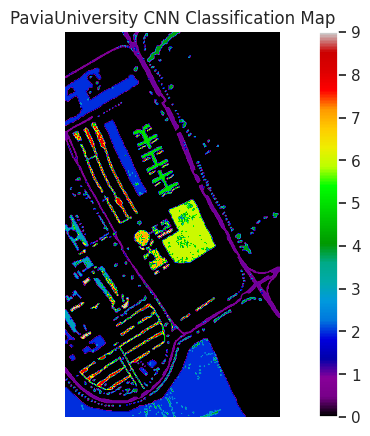

In [50]:
plt.figure(figsize = (10, 5))
clmap = l1.to_numpy().reshape(gt.shape).astype('float')

plt.imshow(clmap, cmap = "nipy_spectral")
plt.colorbar()
plt.axis("off")
plt.title("PaviaUniversity CNN Classification Map")
plt.savefig("cnn_classification_map.png")
plt.show()